### Importing libraries

In [1]:
from random import random
from numpy import load
from numpy import zeros
from numpy import ones
from numpy import asarray
from numpy.random import randint
from keras.optimizers import Adam
from keras.initializers import RandomNormal

from keras.models import Model
#from tensorflow.python.keras.models import Input
#from keras.models import Input
import tensorflow as tf
from tensorflow import keras
#from keras.layers import Input, Dense, LSTM
from tensorflow.keras.layers import Input
#from tensorflow.python.keras.models import Input

from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate

2023-04-29 19:28:23.183227: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-04-29 19:28:23.239840: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-29 19:28:24.326552: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### Importing InstanceNormalization

In [2]:
from keras.layers import Layer, InputSpec
from keras import initializers, regularizers, constraints
from keras import backend as K

class InstanceNormalization(Layer):
    """Instance normalization layer.
    Normalize the activations of the previous layer at each step,
    i.e. applies a transformation that maintains the mean activation
    close to 0 and the activation standard deviation close to 1.
    # Arguments
        axis: Integer, the axis that should be normalized
            (typically the features axis).
            For instance, after a `Conv2D` layer with
            `data_format="channels_first"`,
            set `axis=1` in `InstanceNormalization`.
            Setting `axis=None` will normalize all values in each
            instance of the batch.
            Axis 0 is the batch dimension. `axis` cannot be set to 0 to avoid errors.
        epsilon: Small float added to variance to avoid dividing by zero.
        center: If True, add offset of `beta` to normalized tensor.
            If False, `beta` is ignored.
        scale: If True, multiply by `gamma`.
            If False, `gamma` is not used.
            When the next layer is linear (also e.g. `nn.relu`),
            this can be disabled since the scaling
            will be done by the next layer.
        beta_initializer: Initializer for the beta weight.
        gamma_initializer: Initializer for the gamma weight.
        beta_regularizer: Optional regularizer for the beta weight.
        gamma_regularizer: Optional regularizer for the gamma weight.
        beta_constraint: Optional constraint for the beta weight.
        gamma_constraint: Optional constraint for the gamma weight.
    # Input shape
        Arbitrary. Use the keyword argument `input_shape`
        (tuple of integers, does not include the samples axis)
        when using this layer as the first layer in a Sequential model.
    # Output shape
        Same shape as input.
    # References
        - [Layer Normalization](https://arxiv.org/abs/1607.06450)
        - [Instance Normalization: The Missing Ingredient for Fast Stylization](
        https://arxiv.org/abs/1607.08022)
    """
    def __init__(self,
                 axis=None,
                 epsilon=1e-3,
                 center=True,
                 scale=True,
                 beta_initializer='zeros',
                 gamma_initializer='ones',
                 beta_regularizer=None,
                 gamma_regularizer=None,
                 beta_constraint=None,
                 gamma_constraint=None,
                 **kwargs):
        super(InstanceNormalization, self).__init__(**kwargs)
        self.supports_masking = True
        self.axis = axis
        self.epsilon = epsilon
        self.center = center
        self.scale = scale
        self.beta_initializer = initializers.get(beta_initializer)
        self.gamma_initializer = initializers.get(gamma_initializer)
        self.beta_regularizer = regularizers.get(beta_regularizer)
        self.gamma_regularizer = regularizers.get(gamma_regularizer)
        self.beta_constraint = constraints.get(beta_constraint)
        self.gamma_constraint = constraints.get(gamma_constraint)

    def build(self, input_shape):
        ndim = len(input_shape)
        if self.axis == 0:
            raise ValueError('Axis cannot be zero')

        if (self.axis is not None) and (ndim == 2):
            raise ValueError('Cannot specify axis for rank 1 tensor')

        self.input_spec = InputSpec(ndim=ndim)

        if self.axis is None:
            shape = (1,)
        else:
            shape = (input_shape[self.axis],)

        if self.scale:
            self.gamma = self.add_weight(shape=shape,
                                         name='gamma',
                                         initializer=self.gamma_initializer,
                                         regularizer=self.gamma_regularizer,
                                         constraint=self.gamma_constraint)
        else:
            self.gamma = None
        if self.center:
            self.beta = self.add_weight(shape=shape,
                                        name='beta',
                                        initializer=self.beta_initializer,
                                        regularizer=self.beta_regularizer,
                                        constraint=self.beta_constraint)
        else:
            self.beta = None
        self.built = True

    def call(self, inputs, training=None):
        input_shape = K.int_shape(inputs)
        reduction_axes = list(range(0, len(input_shape)))

        if self.axis is not None:
            del reduction_axes[self.axis]

        del reduction_axes[0]

        mean = K.mean(inputs, reduction_axes, keepdims=True)
        stddev = K.std(inputs, reduction_axes, keepdims=True) + self.epsilon
        normed = (inputs - mean) / stddev

        broadcast_shape = [1] * len(input_shape)
        if self.axis is not None:
            broadcast_shape[self.axis] = input_shape[self.axis]

        if self.scale:
            broadcast_gamma = K.reshape(self.gamma, broadcast_shape)
            normed = normed * broadcast_gamma
        if self.center:
            broadcast_beta = K.reshape(self.beta, broadcast_shape)
            normed = normed + broadcast_beta
        return normed

    def get_config(self):
        config = {
            'axis': self.axis,
            'epsilon': self.epsilon,
            'center': self.center,
            'scale': self.scale,
            'beta_initializer': initializers.serialize(self.beta_initializer),
            'gamma_initializer': initializers.serialize(self.gamma_initializer),
            'beta_regularizer': regularizers.serialize(self.beta_regularizer),
            'gamma_regularizer': regularizers.serialize(self.gamma_regularizer),
            'beta_constraint': constraints.serialize(self.beta_constraint),
            'gamma_constraint': constraints.serialize(self.gamma_constraint)
        }
        base_config = super(InstanceNormalization, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))
#fileContents = file.read()
#from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization

In [3]:
from matplotlib import pyplot

### Discriminator Model

In [4]:
# discriminator model (70x70 patchGAN)
# C64-C128-C256-C512
#After the last layer, conv to 1-dimensional output, followed by a Sigmoid function.  
# The “axis” argument is set to -1 for instance norm. to ensure that features are normalized per feature map.
def define_discriminator(image_shape):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # source image input
    in_image = Input(shape=image_shape)
    # C64: 4x4 kernel Stride 2x2
    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(in_image)
    d = LeakyReLU(alpha=0.2)(d)
    # C128: 4x4 kernel Stride 2x2
    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C256: 4x4 kernel Stride 2x2
    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # C512: 4x4 kernel Stride 2x2 
    # Not in the original paper. Comment this block if you want.
    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # second last output layer : 4x4 kernel but Stride 1x1
    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)
    # patch output
    patch_out = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
    # define model
    model = Model(in_image, patch_out)
    # compile model
    #The model is trained with a batch size of one image and Adam opt. 
    #with a small learning rate and 0.5 beta. 
    #The loss for the discriminator is weighted by 50% for each model update.
    #This slows down changes to the discriminator relative to the generator model during training.
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss_weights=[0.5])
    return model

###  Resnet bolck to be used in the generator

In [5]:
# generator a resnet block to be used in the generator
# residual block that contains two 3 × 3 convolutional layers with the same number of filters on both layers.
def resnet_block(n_filters, input_layer):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # first convolutional layer
    g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(input_layer)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # second convolutional layer
    g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    # concatenate merge channel-wise with input layer
    g = Concatenate()([g, input_layer])
    return g

### Generator model

In [6]:
# define the  generator model - encoder-decoder type architecture

#c7s1-k denote a 7×7 Convolution-InstanceNorm-ReLU layer with k filters and stride 1. 
#dk denotes a 3 × 3 Convolution-InstanceNorm-ReLU layer with k filters and stride 2.
# Rk denotes a residual block that contains two 3 × 3 convolutional layers
# uk denotes a 3 × 3 fractional-strided-Convolution InstanceNorm-ReLU layer with k filters and stride 1/2

#The network with 6 residual blocks consists of:
#c7s1-64,d128,d256,R256,R256,R256,R256,R256,R256,u128,u64,c7s1-3

#The network with 9 residual blocks consists of:
#c7s1-64,d128,d256,R256,R256,R256,R256,R256,R256,R256,R256,R256,u128, u64,c7s1-3

def define_generator(image_shape, n_resnet=9):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_image = Input(shape=image_shape)
    # c7s1-64
    g = Conv2D(64, (7,7), padding='same', kernel_initializer=init)(in_image)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # d128
    g = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # d256
    g = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # R256
    for _ in range(n_resnet):
        g = resnet_block(256, g)
    # u128
    g = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # u64
    g = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)
    # c7s1-3
    g = Conv2D(3, (7,7), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    out_image = Activation('tanh')(g)
    # define model
    model = Model(in_image, out_image)
    return model

### Composite model

In [7]:
# define a composite model for updating generators by adversarial and cycle loss
#We define a composite model that will be used to train each generator separately. 
def define_composite_model(g_model_1, d_model, g_model_2, image_shape):
    # Make the generator of interest trainable as we will be updating these weights.
    #by keeping other models constant.
    #Remember that we use this same function to train both generators,
    #one generator at a time. 
    g_model_1.trainable = True
    # mark discriminator and second generator as non-trainable
    d_model.trainable = False
    g_model_2.trainable = False
    
    # adversarial loss
    input_gen = Input(shape=image_shape)
    gen1_out = g_model_1(input_gen)
    output_d = d_model(gen1_out)
    # identity loss
    input_id = Input(shape=image_shape)
    output_id = g_model_1(input_id)
    # cycle loss - forward
    output_f = g_model_2(gen1_out)
    # cycle loss - backward
    gen2_out = g_model_2(input_id)
    output_b = g_model_1(gen2_out)
    
    # define model graph
    model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])
    
    # define the optimizer
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    # compile model with weighting of least squares loss and L1 loss
    model.compile(loss=['mse', 'mae', 'mae', 'mae'], 
               loss_weights=[1, 5, 10, 10], optimizer=opt)
    return model

### Load and prepare training images

In [8]:
# load and prepare training images
#def load_real_samples(filename):
    # load the dataset
    #data = load(filename)
    # unpack arrays
    #X1, X2 = data['arr_0'], data['arr_1']
    # scale from [0,255] to [-1,1]
    #X1 = (X1 - 127.5) / 127.5
    #X2 = (X2 - 127.5) / 127.5
    #return [X1, X2]

### Real image generate

In [9]:
# select a batch of random samples, returns images and target
#Remember that for real images the label (y) is 1. 
def generate_real_samples(dataset, n_samples, patch_shape):
    # choose random instances
    ix = randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    X = dataset[ix]
    # generate 'real' class labels (1)
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return X, y

### Fake image generate

In [10]:
# generate a batch of images, returns images and targets
#Remember that for fake images the label (y) is 0. 
def generate_fake_samples(g_model, dataset, patch_shape):
    # generate fake images
    X = g_model.predict(dataset)
    # create 'fake' class labels (0)
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

### Save model

In [11]:
# periodically save the generator models to file
def save_models(step, g_model_AtoB, g_model_BtoA):
    # save the first generator model
    filename1 = 'g_model_AtoB_%06d.h5' % (step+1)
    g_model_AtoB.save(filename1)
    # save the second generator model
    filename2 = 'g_model_BtoA_%06d.h5' % (step+1)
    g_model_BtoA.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))

### Performance summary

In [12]:
# periodically generate images using the save model and plot input and output images
def summarize_performance(step, g_model, trainX, name, n_samples=5):
    # select a sample of input images
    X_in, _ = generate_real_samples(trainX, n_samples, 0)
    # generate translated images
    X_out, _ = generate_fake_samples(g_model, X_in, 0)
    # scale all pixels from [-1,1] to [0,1]
    X_in = (X_in + 1) / 2.0
    X_out = (X_out + 1) / 2.0
    # plot real images
    for i in range(n_samples):
        pyplot.subplot(2, n_samples, 1 + i)
        pyplot.axis('off')
        pyplot.imshow(X_in[i])
    # plot translated image
    for i in range(n_samples):
        pyplot.subplot(2, n_samples, 1 + n_samples + i)
        pyplot.axis('off')
        pyplot.imshow(X_out[i])
    # save plot to file
    filename1 = '%s_generated_plot_%06d.png' % (name, (step+1))
    pyplot.savefig(filename1)
    pyplot.close()

### Update image pool

In [13]:
# update image pool for fake images to reduce model oscillation
# update discriminators using a history of generated images 
#rather than the ones produced by the latest generators.
#Original paper recommended keeping an image buffer that stores 
#the 50 previously created images.

def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            # stock the pool
            pool.append(image)
            selected.append(image)
        elif random() < 0.5:
            # use image, but don't add it to the pool
            selected.append(image)
        else:
        # replace an existing image and use replaced image
            ix = randint(0, len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return asarray(selected)

### Train CycleGAN model

In [14]:
# train cyclegan models
def train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, dataset, epochs=1):
    # define properties of the training run
    n_epochs, n_batch, = epochs, 1  #batch size fixed to 1 as suggested in the paper
    # determine the output square shape of the discriminator
    n_patch = d_model_A.output_shape[1]
    # unpack dataset
    trainA, trainB = dataset
    # prepare image pool for fake images
    poolA, poolB = list(), list()
    # calculate the number of batches per training epoch
    bat_per_epo = int(len(trainA) / n_batch)
    # calculate the number of training iterations
    n_steps = bat_per_epo * n_epochs
    
    # manually enumerate epochs
    for i in range(n_steps):
        # select a batch of real samples from each domain (A and B)
        X_realA, y_realA = generate_real_samples(trainA, n_batch, n_patch)
        X_realB, y_realB = generate_real_samples(trainB, n_batch, n_patch)
        # generate a batch of fake samples using both B to A and A to B generators.
        X_fakeA, y_fakeA = generate_fake_samples(g_model_BtoA, X_realB, n_patch)
        X_fakeB, y_fakeB = generate_fake_samples(g_model_AtoB, X_realA, n_patch)
        # update fake images in the pool. Remember that the paper suggstes a buffer of 50 images
        X_fakeA = update_image_pool(poolA, X_fakeA)
        X_fakeB = update_image_pool(poolB, X_fakeB)
        
        # update generator B->A via the composite model
        g_loss2, _, _, _, _  = c_model_BtoA.train_on_batch([X_realB, X_realA], [y_realA, X_realA, X_realB, X_realA])
        # update discriminator for A -> [real/fake]
        dA_loss1 = d_model_A.train_on_batch(X_realA, y_realA)
        dA_loss2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)
        
        # update generator A->B via the composite model
        g_loss1, _, _, _, _ = c_model_AtoB.train_on_batch([X_realA, X_realB], [y_realB, X_realB, X_realA, X_realB])
        # update discriminator for B -> [real/fake]
        dB_loss1 = d_model_B.train_on_batch(X_realB, y_realB)
        dB_loss2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)
        
        # summarize performance
        #Since our batch size =1, the number of iterations would be same as the size of our dataset.
        #In one epoch you'd have iterations equal to the number of images.
        #If you have 100 images then 1 epoch would be 100 iterations
        print('Iteration>%d, dA[%.3f,%.3f] dB[%.3f,%.3f] g[%.3f,%.3f]' % (i+1, dA_loss1,dA_loss2, dB_loss1,dB_loss2, g_loss1,g_loss2))
        # evaluate the model performance periodically
        #If batch size (total images)=100, performance will be summarized after every 75th iteration.
        if (i+1) % (bat_per_epo * 1) == 0:
            # plot A->B translation
            summarize_performance(i, g_model_AtoB, trainA, 'AtoB')
            # plot B->A translation
            summarize_performance(i, g_model_BtoA, trainB, 'BtoA')
        if (i+1) % (bat_per_epo * 5) == 0:
            # save the models
            # #If batch size (total images)=100, model will be saved after 
            #every 75th iteration x 5 = 375 iterations.
            save_models(i, g_model_AtoB, g_model_BtoA)

### apple2orange Photo

In [15]:
# PhotoA2PhotoB
from os import listdir
from numpy import asarray
from numpy import vstack
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
#from keras.preprocessing.image import load_img
from matplotlib import pyplot as plt
import numpy as np

In [16]:
# load all images in a directory into memory
def load_images(path, size=(256,256)):
    data_list = list()
    # enumerate filenames in directory, assume all are images
    for filename in listdir(path):
        # load and resize the image
        pixels = load_img(path + filename, target_size=size)
        # convert to numpy array
        pixels = img_to_array(pixels)
        # store
        data_list.append(pixels)
    return asarray(data_list)

In [17]:
path = '/home/umni2/a/umnilab/users/mdebnat/Course Project/ECE 50024/Course Project/apple2orange/'

In [18]:
#dataA_all = load_images(path + 'trainA/')
#print('Loaded dataA: ', dataA_all.shape)

dataA = load_images(path + 'trainA/')
print('Loaded dataA: ', dataA.shape)

Loaded dataA:  (995, 256, 256, 3)


In [19]:
#from sklearn.utils import resample
#To get a subset of all images, for faster training during demonstration
#dataA = resample(dataA_all, 
                 #replace=False,     
                 #n_samples=500,    
                 #random_state=42)

In [20]:
# load dataset B - Photos 
#dataB_all = load_images(path + 'trainB/')
#print('Loaded dataB: ', dataB_all.shape)

dataB = load_images(path + 'trainB/')
print('Loaded dataB: ', dataB.shape)

Loaded dataB:  (1019, 256, 256, 3)


In [21]:
#Get a subset of all images, for faster training during demonstration
#We could have just read the list of files and only load a subset, better memory management. 
#dataB = resample(dataB_all, 
                 #replace=False,     
                 #n_samples=500,    
                 #random_state=42) 

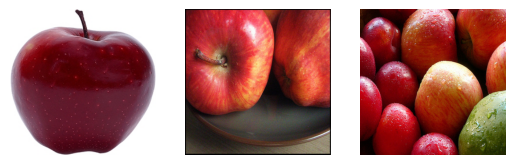

In [22]:
# plot source images
n_samples = 3
for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + i)
    plt.axis('off')
    plt.imshow(dataA[i].astype('uint8'))
plt.show()

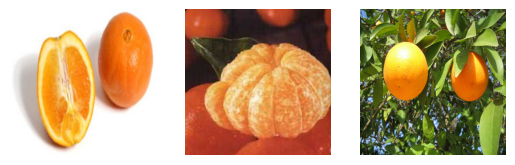

In [23]:
# plot target image
for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + n_samples + i)
    plt.axis('off')
    plt.imshow(dataB[i].astype('uint8'))
plt.show()

In [24]:
# load image data
data = [dataA, dataB]
print('Loaded', data[0].shape, data[1].shape)

Loaded (995, 256, 256, 3) (1019, 256, 256, 3)


In [25]:
#Preprocess data to change input range to values between -1 and 1
# This is because the generator uses tanh activation in the output layer
#And tanh ranges between -1 and 1
def preprocess_data(data):
    # load compressed arrays
    # unpack arrays
    X1, X2 = data[0], data[1]
    # scale from [0,255] to [-1,1]
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]

In [26]:
dataset = preprocess_data(data)

In [27]:
#from cycleGAN_model import define_generator, define_discriminator, define_composite_model, train
# define input shape based on the loaded dataset
image_shape = dataset[0].shape[1:]
# generator: A -> B
g_model_AtoB = define_generator(image_shape)
# generator: B -> A
g_model_BtoA = define_generator(image_shape)
# discriminator: A -> [real/fake]
d_model_A = define_discriminator(image_shape)
# discriminator: B -> [real/fake]
d_model_B = define_discriminator(image_shape)
# composite: A -> B -> [real/fake, A]
c_model_AtoB = define_composite_model(g_model_AtoB, d_model_B, g_model_BtoA, image_shape)
# composite: B -> A -> [real/fake, B]
c_model_BtoA = define_composite_model(g_model_BtoA, d_model_A, g_model_AtoB, image_shape)

2023-04-29 19:28:33.493686: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
/home/umni2/a/umnilab/users/mdebnat/anaconda3/envs/gp39/lib/python3.9/site-packages/keras/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [ ]:
from datetime import datetime 
start1 = datetime.now() 
# train models
train(d_model_A, d_model_B, g_model_AtoB, g_model_BtoA, c_model_AtoB, c_model_BtoA, dataset, epochs=8)

stop1 = datetime.now()
#Execution time of the model 
execution_time = stop1-start1
print("Execution time is: ", execution_time)

1/1 [==============================] - 2s 2s/step


2023-04-29 22:21:05.115769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:21:11.516251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:21:11.704422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1, dA[0.110,0.179] dB[0.293,0.100] g[11.275,11.748]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:21:23.550094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:21:32.473842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:21:32.653846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2, dA[0.134,0.192] dB[0.026,0.130] g[9.344,9.212]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:21:46.867318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:21:54.931023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:21:55.048451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3, dA[0.119,0.328] dB[0.485,0.082] g[7.509,6.386]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:22:08.047780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:22:15.326101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:22:15.452933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4, dA[0.155,0.053] dB[0.058,0.134] g[9.083,8.683]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:22:28.117088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:22:36.677932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:22:36.797062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5, dA[0.260,0.149] dB[0.145,0.031] g[11.545,9.855]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:22:50.299615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:22:58.708440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:22:58.873296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6, dA[0.075,0.366] dB[0.087,0.103] g[9.093,8.514]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:23:11.555570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:23:18.616633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:23:18.785372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>7, dA[0.483,0.108] dB[0.042,0.054] g[10.114,9.904]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:23:27.179556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:23:34.016710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:23:34.196592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>8, dA[0.300,0.171] dB[0.162,0.028] g[5.498,5.384]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:23:43.005354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:23:49.924215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:23:50.112679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>9, dA[0.046,0.168] dB[0.023,0.050] g[6.505,7.353]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:23:58.922666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:24:09.209245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:24:09.381965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>10, dA[0.093,0.159] dB[0.238,0.051] g[10.154,9.157]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:24:19.745266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:24:25.075837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:24:25.189486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>11, dA[0.308,0.192] dB[0.394,0.042] g[6.545,5.861]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:24:35.504360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:24:40.120570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:24:40.190742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>12, dA[0.165,0.089] dB[0.081,0.125] g[7.219,7.687]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:24:49.453133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:24:55.802011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:24:55.923670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>13, dA[0.118,0.164] dB[0.082,0.133] g[6.357,7.871]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:25:03.605746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:25:09.223207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:25:09.293721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>14, dA[0.105,0.107] dB[0.164,0.134] g[6.796,7.608]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:25:17.155056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:25:27.412936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:25:27.566439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>15, dA[0.038,0.095] dB[0.032,0.113] g[6.687,6.603]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:25:37.505010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:25:43.577602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:25:43.723958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>16, dA[0.072,0.060] dB[0.134,0.020] g[8.604,10.075]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:25:51.753657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:25:58.699352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:25:58.876229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>17, dA[0.351,0.360] dB[0.123,0.030] g[5.419,5.116]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:26:12.109141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:26:17.890851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:26:18.228559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>18, dA[0.094,0.085] dB[0.045,0.240] g[5.815,5.965]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:26:27.887483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:26:34.021119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:26:34.216362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>19, dA[0.260,0.060] dB[0.072,0.019] g[8.624,8.790]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:26:43.742563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:26:54.068534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:26:54.217049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>20, dA[0.215,0.144] dB[0.037,0.049] g[10.517,9.798]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:27:04.028316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:27:10.602540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:27:10.757121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>21, dA[0.061,0.054] dB[0.042,0.035] g[11.894,12.256]
1/1 [==============================] - 3s 3s/step


2023-04-29 22:27:21.213449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:27:29.262011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:27:29.383063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>22, dA[0.244,0.123] dB[0.054,0.051] g[8.778,8.302]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:27:40.790730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:27:49.025923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:27:49.378748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>23, dA[0.108,0.152] dB[0.203,0.030] g[11.152,10.976]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:28:01.349747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:28:10.460830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:28:10.614677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>24, dA[0.245,0.243] dB[0.348,0.086] g[12.554,9.872]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:28:21.726879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:28:30.402063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:28:30.691474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>25, dA[0.142,0.090] dB[0.052,0.116] g[8.830,8.722]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:28:43.109523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:28:52.223117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:28:52.446621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>26, dA[0.167,0.179] dB[0.479,0.272] g[7.521,8.043]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:29:03.174283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:29:10.956154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:29:11.120235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>27, dA[0.067,0.113] dB[0.079,0.029] g[6.748,6.393]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:29:22.726667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:29:31.866324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:29:32.007874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>28, dA[0.114,0.101] dB[0.175,0.129] g[11.844,12.232]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:29:43.790235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:29:51.827054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:29:52.160751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>29, dA[0.108,0.073] dB[0.111,0.048] g[8.102,9.616]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:30:03.694560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:30:12.074742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:30:12.240556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>30, dA[0.070,0.029] dB[0.084,0.071] g[8.574,9.522]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:30:25.097977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:30:33.416149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:30:33.620034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>31, dA[0.441,0.261] dB[0.026,0.083] g[6.210,6.973]
1/1 [==============================] - 3s 3s/step


2023-04-29 22:30:45.176726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:30:54.179646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:30:54.380827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>32, dA[0.067,0.147] dB[0.034,0.031] g[13.955,14.769]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:31:06.658913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:31:14.672292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:31:14.965761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>33, dA[0.131,0.044] dB[0.282,0.097] g[5.665,6.571]
1/1 [==============================] - 3s 3s/step


2023-04-29 22:31:27.652352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:31:36.278895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:31:36.527229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>34, dA[0.160,0.078] dB[0.065,0.159] g[7.314,8.498]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:31:47.220577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:31:56.822774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:31:57.029911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>35, dA[0.023,0.075] dB[0.090,0.028] g[9.165,9.176]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:32:09.552452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:32:19.396036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:32:19.542978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>36, dA[0.131,0.072] dB[0.020,0.062] g[10.555,10.032]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:32:31.632710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:32:40.558004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:32:40.759307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>37, dA[0.219,0.158] dB[0.022,0.018] g[7.036,6.732]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:32:52.894235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:33:01.302949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:33:01.584313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>38, dA[0.114,0.183] dB[0.030,0.014] g[8.701,7.567]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:33:14.413725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:33:22.901747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:33:23.025806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>39, dA[0.089,0.038] dB[0.025,0.047] g[11.635,11.140]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:33:34.688242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:33:44.505154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:33:44.612844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>40, dA[0.161,0.018] dB[0.013,0.017] g[10.658,10.522]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:33:56.008729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:34:05.648145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:34:05.810317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>41, dA[0.208,0.142] dB[0.193,0.060] g[6.376,6.106]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:34:17.469040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:34:25.988436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:34:26.211152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>42, dA[0.120,0.162] dB[0.080,0.063] g[6.674,7.541]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:34:38.175550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:34:48.447484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:34:48.606425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>43, dA[0.239,0.553] dB[0.661,0.136] g[5.356,5.095]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:34:59.244190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:35:05.774395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:35:06.049099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>44, dA[0.391,0.069] dB[0.059,0.195] g[7.633,7.364]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:35:19.526771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:35:29.801340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:35:30.165042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>45, dA[0.321,0.211] dB[0.085,0.031] g[7.660,7.121]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:35:40.806249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:35:47.876104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:35:48.185442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>46, dA[0.121,0.403] dB[0.071,0.032] g[11.890,11.600]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:36:00.071116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:36:10.368237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:36:10.656340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>47, dA[0.266,0.057] dB[0.036,0.026] g[6.872,6.589]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:36:22.524374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:36:31.070785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:36:31.304138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>48, dA[0.187,0.201] dB[0.216,0.175] g[7.352,7.852]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:36:45.418149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:36:55.679447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:36:55.815561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>49, dA[0.041,0.062] dB[0.099,0.074] g[8.315,10.158]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:37:09.587083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:37:19.860554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:37:20.017317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>50, dA[0.112,0.141] dB[0.157,0.103] g[10.116,9.005]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:37:32.333065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:37:40.799224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:37:40.923243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>51, dA[0.113,0.116] dB[0.047,0.094] g[7.769,9.166]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:37:54.626767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:38:02.212628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:38:02.390319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>52, dA[0.083,0.144] dB[0.020,0.082] g[10.475,11.417]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:38:14.169983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:38:23.181638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:38:23.298479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>53, dA[0.085,0.064] dB[0.033,0.046] g[10.182,9.650]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:38:35.064213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:38:43.794967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:38:43.980432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>54, dA[0.089,0.090] dB[0.314,0.168] g[9.720,10.577]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:38:56.099813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:39:04.440323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:39:04.604349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>55, dA[0.297,0.137] dB[0.029,0.065] g[9.392,9.192]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:39:14.980418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:39:23.776026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:39:23.925519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>56, dA[0.257,0.201] dB[0.016,0.030] g[9.800,9.281]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:39:37.029529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:39:46.670505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:39:46.768541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>57, dA[0.043,0.112] dB[0.049,0.158] g[11.449,11.415]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:39:58.061755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:40:07.790479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:40:07.910992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>58, dA[0.026,0.058] dB[0.071,0.025] g[9.605,10.040]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:40:20.041459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:40:29.386691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:40:29.533861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>59, dA[0.078,0.026] dB[0.347,0.070] g[6.751,7.857]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:40:41.695001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:40:50.823536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:40:50.995941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>60, dA[0.078,0.060] dB[0.077,0.124] g[7.780,7.577]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:41:06.105243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:41:14.033520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:41:14.202860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>61, dA[0.030,0.090] dB[0.225,0.201] g[8.329,9.409]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:41:27.856776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:41:35.124736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:41:35.282103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>62, dA[0.023,0.061] dB[0.030,0.046] g[10.899,9.725]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:41:48.231843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:41:56.413420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:41:56.503804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>63, dA[0.335,0.094] dB[0.231,0.113] g[10.704,11.321]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:42:10.535372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:42:17.937770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:42:18.036810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>64, dA[0.038,0.050] dB[0.039,0.047] g[8.552,8.475]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:42:34.194954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:42:40.298871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:42:40.492054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>65, dA[0.027,0.024] dB[0.027,0.037] g[10.683,11.215]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:42:53.897158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:43:01.750539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:43:01.841802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>66, dA[0.037,0.024] dB[0.023,0.017] g[10.936,11.577]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:43:15.915044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:43:22.017977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:43:22.241398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>67, dA[0.369,0.179] dB[0.049,0.080] g[6.423,6.399]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:43:37.631381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:43:44.245575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:43:44.465881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>68, dA[0.101,0.034] dB[0.134,0.075] g[9.188,9.248]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:43:58.443295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:44:03.771034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:44:03.993123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>69, dA[0.063,0.076] dB[0.426,0.220] g[8.263,11.274]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:44:18.793755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:44:24.601691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:44:24.712263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>70, dA[0.282,0.087] dB[0.081,0.031] g[7.608,8.310]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:44:39.639025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:44:46.549022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:44:46.747162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>71, dA[0.043,0.032] dB[0.313,0.072] g[9.019,10.393]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:45:00.467777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:45:08.151450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:45:08.305757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>72, dA[0.111,0.092] dB[0.031,0.064] g[7.494,7.366]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:45:21.992672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:45:28.996039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:45:29.140832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>73, dA[0.043,0.045] dB[0.029,0.056] g[7.435,8.018]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:45:44.400980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:45:50.866319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:45:51.017546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>74, dA[0.206,0.060] dB[0.047,0.017] g[8.851,7.881]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:46:04.432189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:46:11.601576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:46:11.747492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>75, dA[0.092,0.167] dB[0.125,0.106] g[8.769,8.002]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:46:25.501456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:46:34.227168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:46:34.390359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>76, dA[0.055,0.051] dB[0.209,0.069] g[7.520,8.082]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:46:46.565008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:46:54.221596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:46:54.434662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>77, dA[0.052,0.086] dB[0.035,0.058] g[9.251,8.624]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:47:07.239969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:47:14.746140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:47:14.919260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>78, dA[0.374,0.134] dB[0.014,0.019] g[8.296,7.114]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:47:26.756848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:47:34.893115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:47:35.077932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>79, dA[0.036,0.057] dB[0.257,0.067] g[8.144,7.810]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:47:47.462109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:47:55.436972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:47:55.597324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>80, dA[0.080,0.060] dB[0.029,0.045] g[5.018,5.356]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:48:07.316701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:48:15.796026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:48:15.977904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>81, dA[0.056,0.108] dB[0.093,0.015] g[8.759,7.683]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:48:27.259113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:48:34.160932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:48:34.334829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>82, dA[0.060,0.093] dB[0.104,0.042] g[11.627,9.274]
1/1 [==============================] - 1s 990ms/step


2023-04-29 22:48:42.936480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:48:49.944008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:48:50.119997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>83, dA[0.091,0.027] dB[0.058,0.030] g[9.813,9.474]
1/1 [==============================] - 1s 943ms/step


2023-04-29 22:48:58.557535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:49:05.609281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:49:05.722501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>84, dA[0.041,0.088] dB[0.177,0.057] g[7.910,8.597]
1/1 [==============================] - 1s 930ms/step


2023-04-29 22:49:14.457156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:49:21.516235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:49:21.633122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>85, dA[0.043,0.177] dB[0.117,0.162] g[7.861,8.442]
1/1 [==============================] - 1s 993ms/step


2023-04-29 22:49:30.126234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:49:37.069380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:49:37.232492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>86, dA[0.251,0.057] dB[0.028,0.044] g[9.356,10.149]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:49:44.718159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:49:50.651427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:49:50.800249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>87, dA[0.043,0.076] dB[0.129,0.083] g[8.841,10.946]
1/1 [==============================] - 1s 977ms/step


2023-04-29 22:49:58.787269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:50:03.747923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:50:03.861328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>88, dA[0.136,0.174] dB[0.055,0.167] g[7.110,7.645]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:50:14.276430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:50:24.536685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:50:24.638134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>89, dA[0.338,0.099] dB[0.147,0.065] g[7.808,7.534]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:50:37.694610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:50:43.601064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:50:43.758190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>90, dA[0.048,0.095] dB[0.037,0.046] g[7.420,7.478]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:50:54.107189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:51:00.068610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:51:00.170433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>91, dA[0.045,0.071] dB[0.040,0.030] g[11.706,12.328]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:51:14.159540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:51:20.392826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:51:20.555195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>92, dA[0.382,0.099] dB[0.056,0.045] g[5.844,5.715]
1/1 [==============================] - 2s 2s/step


2023-04-29 22:51:30.638309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:51:35.277928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:51:35.373382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>93, dA[0.053,0.173] dB[0.025,0.015] g[9.554,9.147]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:51:45.026105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:51:50.781731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:51:50.899871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>94, dA[0.458,0.066] dB[0.336,0.128] g[5.571,5.853]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:52:00.568978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:52:06.424784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:52:06.508288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>95, dA[0.064,0.169] dB[0.075,0.085] g[6.682,7.132]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:52:16.231773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:52:21.476147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:52:21.615893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>96, dA[0.136,0.066] dB[0.052,0.029] g[8.267,8.531]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:52:31.829518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:52:37.257581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:52:37.360376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>97, dA[0.166,0.065] dB[0.059,0.020] g[7.011,6.933]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:52:47.616663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:52:53.094011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:52:53.213420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>98, dA[0.053,0.050] dB[0.028,0.045] g[9.254,9.880]
1/1 [==============================] - 1s 859ms/step


2023-04-29 22:53:01.887694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:53:08.227360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:53:08.319395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>99, dA[0.151,0.046] dB[0.009,0.021] g[10.180,9.513]
1/1 [==============================] - 1s 904ms/step


2023-04-29 22:53:16.747339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:53:22.174073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:53:22.333587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>100, dA[0.368,0.178] dB[0.649,0.203] g[6.200,5.721]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:53:36.235502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:53:41.522236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:53:41.652406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>101, dA[0.110,0.198] dB[0.062,0.060] g[10.023,8.584]
1/1 [==============================] - 1s 788ms/step


2023-04-29 22:53:54.310526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:54:00.575749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:54:00.738814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>102, dA[0.031,0.043] dB[0.275,0.061] g[6.439,6.283]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:54:14.604228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:54:21.709845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:54:21.849875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>103, dA[0.024,0.033] dB[0.069,0.262] g[10.527,13.659]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:54:30.534977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:54:37.316116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:54:37.480512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>104, dA[0.334,0.019] dB[0.145,0.086] g[10.051,9.400]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:54:46.034402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:54:51.485258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:54:51.574298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>105, dA[0.574,0.489] dB[0.200,0.080] g[11.738,13.753]
1/1 [==============================] - 1s 901ms/step


2023-04-29 22:54:59.888549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:55:06.262887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:55:06.418426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>106, dA[0.092,0.120] dB[0.200,0.051] g[8.893,8.583]
1/1 [==============================] - 1s 756ms/step


2023-04-29 22:55:13.696743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:55:19.953644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:55:20.127583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>107, dA[0.365,0.042] dB[0.060,0.081] g[6.935,7.415]
1/1 [==============================] - 1s 740ms/step


2023-04-29 22:55:29.429983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:55:35.312307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:55:35.490610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>108, dA[0.081,0.144] dB[0.187,0.060] g[7.992,7.258]
1/1 [==============================] - 1s 911ms/step


2023-04-29 22:55:43.357180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:55:49.340492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:55:49.478578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>109, dA[0.045,0.088] dB[0.043,0.071] g[9.300,8.345]
1/1 [==============================] - 1s 913ms/step


2023-04-29 22:55:58.592664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:56:04.249390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:56:04.397543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>110, dA[0.161,0.063] dB[0.017,0.017] g[11.372,10.477]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:56:13.850676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:56:19.920720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:56:20.076253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>111, dA[0.250,0.170] dB[0.447,0.192] g[6.419,6.842]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:56:29.536910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:56:35.659742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:56:35.782115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>112, dA[0.072,0.222] dB[0.028,0.160] g[5.325,5.753]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:56:45.405504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:56:55.664034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:56:55.901737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>113, dA[0.132,0.102] dB[0.021,0.024] g[8.302,7.253]
1/1 [==============================] - 1s 749ms/step


2023-04-29 22:57:04.333342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:57:09.470623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:57:09.690236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>114, dA[0.158,0.159] dB[0.102,0.017] g[5.794,5.807]
1/1 [==============================] - 1s 999ms/step


2023-04-29 22:57:19.859208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:57:25.045238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:57:25.294581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>115, dA[0.066,0.090] dB[0.022,0.103] g[7.504,7.886]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:57:35.868637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:57:41.425590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:57:41.579058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>116, dA[0.047,0.080] dB[0.189,0.072] g[6.397,6.188]
1/1 [==============================] - 1s 964ms/step


2023-04-29 22:57:51.348237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:57:56.698786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:57:56.908075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>117, dA[0.126,0.058] dB[0.018,0.064] g[10.903,9.678]
1/1 [==============================] - 1s 999ms/step


2023-04-29 22:58:07.166451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:58:12.309129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:58:12.515677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>118, dA[0.104,0.231] dB[0.094,0.026] g[4.911,4.863]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:58:22.734975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:58:27.382617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:58:27.597956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>119, dA[0.049,0.103] dB[0.042,0.076] g[6.310,7.080]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:58:38.149072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:58:41.780159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:58:41.885256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>120, dA[0.099,0.109] dB[0.379,0.364] g[5.970,7.201]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:58:51.387739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:58:57.307488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:58:57.470461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>121, dA[0.077,0.048] dB[0.348,0.201] g[8.109,9.299]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:59:06.964246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:59:12.439874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:59:12.571991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>122, dA[0.073,0.130] dB[0.229,0.109] g[5.853,6.592]
1/1 [==============================] - 1s 988ms/step


2023-04-29 22:59:20.671477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:59:26.520834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:59:26.685296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>123, dA[0.071,0.052] dB[0.020,0.052] g[6.114,7.007]
1/1 [==============================] - 1s 928ms/step


2023-04-29 22:59:36.709530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:59:42.139831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:59:42.260859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>124, dA[0.497,0.046] dB[0.043,0.022] g[6.201,6.206]
1/1 [==============================] - 1s 1s/step


2023-04-29 22:59:52.635026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 22:59:58.523542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 22:59:58.726081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>125, dA[0.198,0.247] dB[0.065,0.045] g[6.804,6.674]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:00:07.514090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:00:12.641941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:00:12.787881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>126, dA[0.072,0.277] dB[0.061,0.069] g[8.889,7.236]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:00:24.145089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:00:28.780812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:00:28.918186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>127, dA[0.078,0.023] dB[0.026,0.029] g[6.073,7.263]
1/1 [==============================] - 1s 878ms/step


2023-04-29 23:00:38.417202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:00:44.808447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:00:44.938424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>128, dA[0.180,0.149] dB[0.026,0.022] g[7.808,7.284]
1/1 [==============================] - 1s 998ms/step


2023-04-29 23:00:54.928006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:01:01.113339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:01:01.227142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>129, dA[0.096,0.075] dB[0.240,0.214] g[7.786,8.911]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:01:10.839055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:01:17.103948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:01:17.244523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>130, dA[0.058,0.019] dB[0.029,0.038] g[14.591,14.489]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:01:30.504972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:01:36.438613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:01:36.616521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>131, dA[0.124,0.079] dB[0.387,0.052] g[12.082,14.393]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:01:46.566011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:01:52.566993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:01:52.805688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>132, dA[0.057,0.036] dB[0.064,0.105] g[8.024,8.986]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:02:02.818166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:02:09.183318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:02:09.426560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>133, dA[0.017,0.020] dB[0.146,0.053] g[6.865,7.979]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:02:18.939064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:02:25.550232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:02:25.888189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>134, dA[0.147,0.093] dB[0.031,0.027] g[5.854,5.708]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:02:34.823191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:02:40.290245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:02:40.403336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>135, dA[0.030,0.021] dB[0.060,0.013] g[9.301,11.056]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:02:49.170988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:02:54.658726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:02:54.900829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>136, dA[0.085,0.114] dB[0.049,0.029] g[6.495,6.977]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:03:03.731562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:03:09.541713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:03:09.659971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>137, dA[0.015,0.024] dB[0.042,0.019] g[9.432,8.517]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:03:17.771595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:03:23.724193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:03:23.919109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>138, dA[0.066,0.020] dB[0.016,0.181] g[5.723,6.573]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:03:35.117236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:03:42.047737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:03:42.198323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>139, dA[0.458,0.145] dB[0.227,0.053] g[8.678,7.333]
1/1 [==============================] - 1s 914ms/step


2023-04-29 23:03:51.134196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:03:58.153863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:03:58.286255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>140, dA[0.050,0.095] dB[0.034,0.076] g[9.652,9.493]
1/1 [==============================] - 1s 811ms/step


2023-04-29 23:04:07.031957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:04:11.901315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:04:12.001630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>141, dA[0.070,0.080] dB[0.132,0.032] g[9.179,8.598]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:04:21.207523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:04:27.562671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:04:27.672453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>142, dA[0.018,0.024] dB[0.136,0.144] g[7.307,7.763]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:04:40.850744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:04:46.370897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:04:46.458954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>143, dA[0.081,0.088] dB[0.063,0.115] g[9.232,10.307]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:05:00.131097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:05:05.274575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:05:05.350149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>144, dA[0.038,0.019] dB[0.047,0.238] g[8.461,9.569]
1/1 [==============================] - 1s 996ms/step


2023-04-29 23:05:13.672586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:05:21.026181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:05:21.170416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>145, dA[0.028,0.029] dB[0.244,0.026] g[7.243,6.477]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:05:29.870199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:05:36.956052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:05:37.083975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>146, dA[0.022,0.028] dB[0.038,0.157] g[7.789,8.308]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:05:43.900429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:05:50.656281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:05:50.831180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>147, dA[0.054,0.019] dB[0.210,0.025] g[7.183,7.902]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:05:59.889236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:06:05.363195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:06:05.493065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>148, dA[0.016,0.043] dB[0.057,0.020] g[10.255,9.151]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:06:14.430251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:06:20.732375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:06:20.927979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>149, dA[0.019,0.017] dB[0.027,0.020] g[14.583,15.297]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:06:29.889598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:06:36.303924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:06:36.515901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>150, dA[0.073,0.066] dB[0.026,0.037] g[11.070,10.770]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:06:45.801787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:06:51.339963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:06:51.507160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>151, dA[0.335,0.098] dB[0.042,0.058] g[8.461,8.120]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:07:01.635213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:07:07.553554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:07:07.753231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>152, dA[0.104,0.067] dB[0.056,0.012] g[8.364,6.587]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:07:17.592233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:07:27.851810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:07:28.019423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>153, dA[0.023,0.034] dB[0.068,0.075] g[12.019,11.015]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:07:38.332722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:07:44.194892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:07:44.374772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>154, dA[0.074,0.035] dB[0.091,0.104] g[6.808,7.728]
1/1 [==============================] - 1s 889ms/step


2023-04-29 23:07:53.280225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:07:58.249976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:07:58.416618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>155, dA[0.180,0.067] dB[0.121,0.049] g[9.250,9.869]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:08:09.126724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:08:13.969712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:08:14.096083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>156, dA[0.059,0.237] dB[0.348,0.387] g[5.298,5.684]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:08:21.600866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:08:27.314922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:08:27.551187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>157, dA[0.069,0.039] dB[0.081,0.022] g[11.111,13.360]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:08:37.452980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:08:43.470057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:08:43.653127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>158, dA[0.154,0.009] dB[0.077,0.044] g[8.393,7.828]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:08:53.465608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:08:58.322126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:08:58.450772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>159, dA[0.022,0.054] dB[0.208,0.095] g[6.517,6.952]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:09:06.880668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:09:14.031051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:09:14.185829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>160, dA[0.025,0.032] dB[0.211,0.093] g[8.555,9.951]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:09:22.126030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:09:28.857567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:09:29.079044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>161, dA[0.015,0.010] dB[0.065,0.069] g[6.193,7.932]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:09:38.047806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:09:45.238890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:09:45.418312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>162, dA[0.034,0.079] dB[0.023,0.049] g[8.475,8.437]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:09:54.284731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:10:01.247356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:10:01.581093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>163, dA[0.044,0.073] dB[0.499,0.124] g[9.548,9.882]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:10:11.195491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:10:18.003098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:10:18.143151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>164, dA[0.242,0.066] dB[0.097,0.048] g[4.458,5.493]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:10:26.956330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:10:34.067925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:10:34.224365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>165, dA[0.014,0.021] dB[0.022,0.038] g[6.601,6.160]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:10:40.732229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:10:47.685401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:10:47.827200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>166, dA[0.045,0.079] dB[0.100,0.020] g[10.489,10.953]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:10:56.659714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:11:03.809733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:11:03.930356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>167, dA[0.051,0.091] dB[0.019,0.045] g[9.479,9.638]
1/1 [==============================] - 1s 956ms/step


2023-04-29 23:11:13.072861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:11:20.310475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:11:20.392790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>168, dA[0.037,0.038] dB[0.347,0.286] g[9.981,10.427]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:11:28.446029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:11:33.896618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:11:33.993666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>169, dA[0.062,0.016] dB[0.066,0.056] g[9.573,9.935]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:11:44.018465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:11:49.854754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:11:49.963353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>170, dA[0.591,0.115] dB[0.147,0.041] g[9.278,8.030]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:12:00.717113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:12:05.747701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:12:05.834009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>171, dA[0.059,0.217] dB[0.239,0.139] g[8.233,7.136]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:12:14.226115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:12:21.240971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:12:21.385075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>172, dA[0.020,0.199] dB[0.039,0.073] g[7.695,7.085]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:12:30.168361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:12:37.310859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:12:37.470443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>173, dA[0.797,0.075] dB[0.072,0.063] g[6.159,7.127]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:12:46.109334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:12:53.722066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:12:53.844915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>174, dA[0.047,0.220] dB[0.039,0.036] g[9.584,8.860]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:13:02.348262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:13:09.316593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:13:09.437502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>175, dA[0.478,0.128] dB[0.064,0.035] g[6.399,6.307]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:13:18.421593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:13:25.588241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:13:25.729854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>176, dA[0.132,0.110] dB[0.031,0.032] g[8.884,9.409]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:13:35.172287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:13:42.997173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:13:43.150297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>177, dA[0.153,0.095] dB[0.028,0.019] g[8.240,8.983]
1/1 [==============================] - 1s 968ms/step


2023-04-29 23:13:49.838403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:13:57.288167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:13:57.421600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>178, dA[0.099,0.063] dB[0.070,0.034] g[7.942,8.147]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:14:05.409849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:14:12.880729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:14:13.123589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>179, dA[0.027,0.152] dB[0.090,0.043] g[10.719,9.801]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:14:23.777789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:14:30.795481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:14:31.009126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>180, dA[0.067,0.067] dB[0.038,0.055] g[7.885,8.285]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:14:38.803266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:14:45.557530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:14:45.747118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>181, dA[0.058,0.033] dB[0.040,0.028] g[11.677,12.277]
1/1 [==============================] - 1s 736ms/step


2023-04-29 23:14:53.563768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:15:00.827332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:15:00.958157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>182, dA[0.261,0.136] dB[0.185,0.295] g[5.526,5.840]
1/1 [==============================] - 1s 713ms/step


2023-04-29 23:15:10.786246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:15:18.221553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:15:18.363128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>183, dA[0.192,0.062] dB[0.055,0.060] g[10.447,12.637]
1/1 [==============================] - 1s 741ms/step


2023-04-29 23:15:28.439313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:15:36.274690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:15:36.462393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>184, dA[0.247,0.087] dB[0.064,0.049] g[14.051,13.473]
1/1 [==============================] - 1s 995ms/step


2023-04-29 23:15:46.322721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:15:53.960036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:15:54.119526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>185, dA[0.054,0.042] dB[0.188,0.062] g[9.682,9.086]
1/1 [==============================] - 1s 770ms/step


2023-04-29 23:16:03.338349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:16:10.287539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:16:10.428340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>186, dA[0.013,0.044] dB[0.082,0.139] g[5.696,6.167]
1/1 [==============================] - 1s 751ms/step


2023-04-29 23:16:20.153450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:16:27.319317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:16:27.492888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>187, dA[0.033,0.040] dB[0.017,0.106] g[10.993,11.946]
1/1 [==============================] - 1s 828ms/step


2023-04-29 23:16:36.984006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:16:47.276889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:16:47.476780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>188, dA[0.087,0.124] dB[0.134,0.041] g[6.578,6.798]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:16:56.562189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:17:06.826253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:17:06.953870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>189, dA[0.016,0.061] dB[0.200,0.104] g[7.220,8.523]
1/1 [==============================] - 1s 933ms/step


2023-04-29 23:17:17.349981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:17:22.485691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:17:22.699298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>190, dA[0.078,0.036] dB[0.140,0.101] g[6.594,7.717]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:17:33.132935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:17:38.667522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:17:38.787241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>191, dA[0.069,0.032] dB[0.063,0.041] g[6.017,7.106]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:17:46.829515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:17:52.855646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:17:52.988801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>192, dA[0.152,0.052] dB[0.018,0.056] g[8.607,8.277]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:18:03.047493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:18:09.178611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:18:09.275541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>193, dA[0.084,0.043] dB[0.014,0.008] g[8.477,9.950]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:18:17.567413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:18:24.609119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:18:24.739915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>194, dA[0.470,0.501] dB[0.054,0.016] g[9.424,7.721]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:18:33.942112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:18:40.907000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:18:41.063280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>195, dA[0.336,0.207] dB[0.101,0.101] g[5.839,6.162]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:18:49.198743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:18:55.493869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:18:55.618947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>196, dA[0.087,0.058] dB[0.122,0.026] g[7.932,8.118]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:19:03.997155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:19:10.189077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:19:10.367601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>197, dA[0.419,0.116] dB[0.020,0.030] g[11.696,10.234]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:19:21.088807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:19:27.445592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:19:27.657654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>198, dA[0.054,0.142] dB[0.073,0.021] g[9.491,8.863]
1/1 [==============================] - 1s 792ms/step


2023-04-29 23:19:37.739726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:19:41.477564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:19:41.566886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>199, dA[0.189,0.183] dB[0.046,0.157] g[5.916,7.078]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:19:54.528966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:19:59.351022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:19:59.520386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>200, dA[0.175,0.189] dB[0.068,0.067] g[7.608,6.895]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:20:11.631902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:20:16.554227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:20:16.767396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>201, dA[0.071,0.200] dB[0.279,0.235] g[6.097,5.660]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:20:28.843581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:20:33.968089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:20:34.258657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>202, dA[0.016,0.026] dB[0.026,0.026] g[5.425,5.642]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:20:45.899527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:20:51.223605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:20:51.492432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>203, dA[0.286,0.155] dB[0.023,0.045] g[8.115,7.961]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:21:03.001805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:21:07.921306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:21:08.249524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>204, dA[0.027,0.095] dB[0.021,0.033] g[11.424,10.985]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:21:19.786384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:21:25.061802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:21:25.283799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>205, dA[0.045,0.020] dB[0.030,0.023] g[7.846,7.856]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:21:36.463837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:21:41.911502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:21:42.211796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>206, dA[0.284,0.140] dB[0.057,0.043] g[7.716,7.305]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:21:53.053856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:21:58.302204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:21:58.532553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>207, dA[0.032,0.053] dB[0.260,0.042] g[6.948,7.970]
1/1 [==============================] - 1s 901ms/step


2023-04-29 23:22:09.958759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:22:16.236848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:22:16.463079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>208, dA[0.317,0.131] dB[0.105,0.132] g[7.130,7.444]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:22:25.323595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:22:30.309596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:22:30.547790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>209, dA[0.052,0.160] dB[0.222,0.055] g[8.816,8.781]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:22:41.586274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:22:47.149980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:22:47.400833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>210, dA[0.189,0.066] dB[0.063,0.091] g[8.805,9.371]
1/1 [==============================] - 1s 977ms/step


2023-04-29 23:22:55.582970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:23:01.694218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:23:01.810850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>211, dA[0.018,0.082] dB[0.021,0.036] g[10.083,10.386]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:23:09.721889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:23:15.911507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:23:16.127283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>212, dA[0.061,0.033] dB[0.374,0.115] g[7.815,8.716]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:23:30.107682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:23:36.713263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:23:36.811812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>213, dA[0.462,0.153] dB[0.131,0.129] g[10.237,9.444]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:23:46.000925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:23:51.149118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:23:51.220686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>214, dA[0.055,0.085] dB[0.132,0.062] g[8.734,7.348]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:24:00.375761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:24:06.560598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:24:06.726997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>215, dA[0.026,0.073] dB[0.660,0.187] g[8.633,8.379]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:24:16.504071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:24:22.813074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:24:22.932625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>216, dA[0.063,0.035] dB[0.095,0.165] g[7.999,8.269]
1/1 [==============================] - 1s 996ms/step


2023-04-29 23:24:32.380073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:24:38.581025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:24:38.728872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>217, dA[0.029,0.049] dB[0.103,0.208] g[10.266,10.137]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:24:47.584385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:24:53.999464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:24:54.156856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>218, dA[0.072,0.021] dB[0.073,0.046] g[7.826,7.989]
1/1 [==============================] - 1s 855ms/step


2023-04-29 23:25:01.593600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:25:08.302627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:25:08.434311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>219, dA[0.314,0.310] dB[0.115,0.039] g[7.016,6.165]
1/1 [==============================] - 1s 840ms/step


2023-04-29 23:25:17.880553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:25:24.847703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:25:24.986443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>220, dA[0.139,0.202] dB[0.142,0.220] g[7.211,6.113]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:25:33.197614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:25:39.185662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:25:39.277480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>221, dA[0.131,0.107] dB[0.089,0.055] g[8.587,7.037]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:25:49.372891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:25:55.158930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:25:55.273030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>222, dA[0.056,0.047] dB[0.107,0.121] g[7.925,8.044]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:26:05.497576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:26:10.998886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:26:11.108035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>223, dA[0.381,0.348] dB[0.420,0.113] g[5.816,5.397]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:26:21.398519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:26:26.811530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:26:26.916169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>224, dA[0.094,0.035] dB[0.092,0.122] g[14.427,15.554]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:26:34.982111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:26:41.421101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:26:41.603547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>225, dA[0.114,0.049] dB[0.200,0.112] g[8.997,9.072]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:26:50.516177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:26:55.654033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:26:55.741339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>226, dA[0.043,0.044] dB[0.062,0.092] g[7.953,8.365]
1/1 [==============================] - 1s 902ms/step


2023-04-29 23:27:04.543525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:27:10.232046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:27:10.474885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>227, dA[0.498,0.061] dB[0.406,0.045] g[10.170,8.680]
1/1 [==============================] - 1s 948ms/step


2023-04-29 23:27:20.540120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:27:25.991655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:27:26.201798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>228, dA[0.215,0.354] dB[0.023,0.060] g[6.081,5.297]
1/1 [==============================] - 1s 965ms/step


2023-04-29 23:27:36.387991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:27:41.879432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:27:42.084583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>229, dA[0.080,0.072] dB[0.034,0.019] g[8.118,7.103]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:27:52.362040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:27:57.454410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:27:57.668648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>230, dA[0.026,0.078] dB[0.073,0.015] g[7.490,7.339]
1/1 [==============================] - 1s 685ms/step


2023-04-29 23:28:08.781038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:28:15.067237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:28:15.215091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>231, dA[0.206,0.088] dB[0.035,0.041] g[10.898,10.657]
1/1 [==============================] - 1s 784ms/step


2023-04-29 23:28:24.543530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:28:30.323350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:28:30.521316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>232, dA[0.057,0.146] dB[0.080,0.078] g[7.649,8.103]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:28:45.014772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:28:51.683367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:28:51.914778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>233, dA[0.206,0.111] dB[0.025,0.022] g[9.113,8.705]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:29:00.250503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:29:07.066409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:29:07.303422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>234, dA[0.043,0.048] dB[0.165,0.088] g[15.830,16.121]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:29:16.148200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:29:23.066450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:29:23.296546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>235, dA[0.211,0.045] dB[0.400,0.164] g[5.851,6.800]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:29:32.166814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:29:39.124490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:29:39.255219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>236, dA[0.064,0.020] dB[0.091,0.133] g[6.598,6.857]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:29:48.142957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:29:55.437645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:29:55.546905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>237, dA[0.066,0.022] dB[0.224,0.091] g[7.183,7.649]
1/1 [==============================] - 1s 727ms/step


2023-04-29 23:30:02.743224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:30:10.325312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:30:10.489835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>238, dA[0.129,0.038] dB[0.102,0.075] g[7.788,8.376]
1/1 [==============================] - 1s 865ms/step


2023-04-29 23:30:19.954411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:30:27.243925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:30:27.392647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>239, dA[0.027,0.013] dB[0.021,0.027] g[8.796,10.207]
1/1 [==============================] - 1s 832ms/step


2023-04-29 23:30:36.445615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:30:42.925637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:30:43.021431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>240, dA[0.035,0.060] dB[0.446,0.211] g[7.240,8.441]
1/1 [==============================] - 1s 936ms/step


2023-04-29 23:30:51.250724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:30:56.734165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:30:56.946547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>241, dA[0.075,0.034] dB[0.171,0.435] g[8.040,9.478]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:31:06.900522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:31:11.774396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:31:12.027116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>242, dA[0.414,0.085] dB[0.239,0.061] g[5.295,5.517]
1/1 [==============================] - 1s 860ms/step


2023-04-29 23:31:20.525294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:31:26.779424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:31:26.900014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>243, dA[0.194,0.042] dB[0.093,0.093] g[6.842,7.924]
1/1 [==============================] - 1s 969ms/step


2023-04-29 23:31:36.447179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:31:42.820619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:31:42.953811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>244, dA[0.185,0.032] dB[0.044,0.066] g[7.021,8.798]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:31:56.209836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:32:02.400058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:32:02.666372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>245, dA[0.128,0.045] dB[0.030,0.017] g[10.433,10.131]
1/1 [==============================] - 1s 956ms/step


2023-04-29 23:32:10.680615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:32:17.788532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:32:17.962403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>246, dA[0.155,0.168] dB[0.021,0.046] g[8.609,8.172]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:32:26.554288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:32:33.192609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:32:33.350898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>247, dA[0.135,0.086] dB[0.046,0.020] g[13.301,11.487]
1/1 [==============================] - 1s 913ms/step


2023-04-29 23:32:41.900166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:32:48.812858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:32:48.941586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>248, dA[0.426,0.190] dB[0.333,0.169] g[5.420,6.101]
1/1 [==============================] - 1s 989ms/step


2023-04-29 23:32:57.941051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:33:05.187981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:33:05.355460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>249, dA[0.019,0.424] dB[0.056,0.133] g[9.000,8.874]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:33:13.430705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:33:18.892900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:33:18.961108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>250, dA[0.196,0.041] dB[0.035,0.047] g[7.862,8.234]
1/1 [==============================] - 1s 809ms/step


2023-04-29 23:33:27.439920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:33:37.704027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:33:37.875428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>251, dA[0.313,0.285] dB[0.027,0.060] g[5.631,5.843]
1/1 [==============================] - 1s 771ms/step


2023-04-29 23:33:45.604225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:33:50.593211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:33:50.691972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>252, dA[0.151,0.161] dB[0.025,0.042] g[12.632,14.127]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:33:59.904552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:34:06.240517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:34:06.335390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>253, dA[0.325,0.123] dB[0.071,0.030] g[9.474,8.013]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:34:15.357181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:34:21.523603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:34:21.620200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>254, dA[0.047,0.058] dB[0.214,0.133] g[7.243,7.691]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:34:29.954669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:34:36.544494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:34:36.694633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>255, dA[0.191,0.050] dB[0.110,0.014] g[10.294,10.506]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:34:46.045349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:34:52.796075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:34:52.966787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>256, dA[0.022,0.059] dB[0.034,0.032] g[10.442,9.290]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:35:03.654494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:35:09.496630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:35:09.649553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>257, dA[0.104,0.065] dB[0.083,0.008] g[9.154,7.947]
1/1 [==============================] - 1s 944ms/step


2023-04-29 23:35:17.674527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:35:23.075777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:35:23.199595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>258, dA[0.273,0.104] dB[0.126,0.068] g[5.913,6.284]
1/1 [==============================] - 1s 940ms/step


2023-04-29 23:35:31.108950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:35:37.720202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:35:37.804117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>259, dA[0.013,0.122] dB[0.059,0.061] g[12.041,11.434]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:35:47.025016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:35:53.385198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:35:53.470345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>260, dA[0.167,0.030] dB[0.044,0.086] g[6.567,6.655]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:36:02.349919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:36:08.607030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:36:08.717557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>261, dA[0.031,0.035] dB[0.091,0.034] g[8.306,6.695]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:36:19.176617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:36:24.850081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:36:24.973957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>262, dA[0.102,0.295] dB[0.050,0.033] g[7.890,6.420]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:36:34.756395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:36:40.725876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:36:40.867549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>263, dA[0.086,0.017] dB[0.149,0.171] g[5.050,5.640]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:36:50.766868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:36:56.654229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:36:56.782645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>264, dA[0.032,0.055] dB[0.060,0.037] g[5.382,6.361]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:37:04.669276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:37:14.921655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:37:15.105353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>265, dA[0.019,0.015] dB[0.049,0.100] g[9.327,9.279]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:37:23.934289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:37:30.925027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:37:31.099550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>266, dA[0.158,0.124] dB[0.090,0.070] g[8.775,9.276]
1/1 [==============================] - 1s 873ms/step


2023-04-29 23:37:38.137812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:37:45.509463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:37:45.614785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>267, dA[0.318,0.145] dB[0.099,0.034] g[6.597,6.816]
1/1 [==============================] - 1s 717ms/step


2023-04-29 23:37:54.881353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:38:02.395556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:38:02.508129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>268, dA[0.021,0.075] dB[0.034,0.021] g[8.793,8.638]
1/1 [==============================] - 1s 735ms/step


2023-04-29 23:38:12.017688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:38:19.610889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:38:19.715448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>269, dA[0.050,0.033] dB[0.422,0.173] g[7.425,5.994]
1/1 [==============================] - 1s 795ms/step


2023-04-29 23:38:29.176065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:38:36.905794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:38:36.997400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>270, dA[0.186,0.313] dB[0.189,0.158] g[9.426,7.794]
1/1 [==============================] - 1s 820ms/step


2023-04-29 23:38:46.598638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:38:52.520792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:38:52.667331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>271, dA[0.160,0.062] dB[0.280,0.048] g[6.102,5.920]
1/1 [==============================] - 1s 882ms/step


2023-04-29 23:39:02.523433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:39:08.693490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:39:08.867676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>272, dA[0.200,0.089] dB[0.040,0.123] g[8.600,8.368]
1/1 [==============================] - 1s 879ms/step


2023-04-29 23:39:18.702048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:39:24.433321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:39:24.651251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>273, dA[0.033,0.120] dB[0.134,0.059] g[9.719,7.978]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:39:34.492702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:39:40.127520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:39:40.362456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>274, dA[0.058,0.030] dB[0.040,0.057] g[8.693,8.211]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:39:50.229298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:39:55.973267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:39:56.254203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>275, dA[0.060,0.073] dB[0.234,0.183] g[7.164,6.152]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:40:06.650529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:40:12.461124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:40:12.698988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>276, dA[0.017,0.026] dB[0.029,0.056] g[7.943,8.069]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:40:22.712798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:40:28.199597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:40:28.432710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>277, dA[0.297,0.206] dB[0.029,0.028] g[10.666,9.954]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:40:38.613929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:40:43.783837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:40:43.928425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>278, dA[0.136,0.141] dB[0.022,0.018] g[7.360,7.278]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:40:51.766929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:40:58.611592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:40:58.801022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>279, dA[0.031,0.103] dB[0.081,0.011] g[6.581,6.651]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:41:07.698806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:41:14.425131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:41:14.626470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>280, dA[0.085,0.041] dB[0.044,0.084] g[8.489,10.393]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:41:23.500113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:41:28.936451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:41:29.036190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>281, dA[0.222,0.141] dB[0.103,0.082] g[6.392,7.020]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:41:37.823035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:41:44.175514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:41:44.385323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>282, dA[0.042,0.109] dB[0.077,0.060] g[7.876,7.629]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:41:53.489128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:42:03.750532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:42:03.925791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>283, dA[0.020,0.020] dB[0.064,0.020] g[9.391,9.756]
1/1 [==============================] - 1s 893ms/step


2023-04-29 23:42:12.567920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:42:17.910080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:42:18.188263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>284, dA[0.038,0.042] dB[0.025,0.021] g[11.810,14.240]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:42:31.128444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:42:38.386995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:42:38.560026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>285, dA[0.679,0.139] dB[0.056,0.045] g[7.066,7.433]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:42:47.622106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:42:54.634344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:42:54.778061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>286, dA[0.170,0.111] dB[0.008,0.010] g[10.389,8.990]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:43:03.635098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:43:10.570444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:43:10.727019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>287, dA[0.050,0.055] dB[0.015,0.038] g[11.365,10.666]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:43:18.887601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:43:24.713517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:43:24.892225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>288, dA[0.095,0.061] dB[0.025,0.024] g[8.283,8.216]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:43:34.344465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:43:44.633461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:43:44.803893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>289, dA[0.148,0.144] dB[0.353,0.107] g[6.977,6.521]
1/1 [==============================] - 1s 741ms/step


2023-04-29 23:43:52.655621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:43:58.283703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:43:58.449517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>290, dA[0.167,0.121] dB[0.066,0.042] g[7.998,7.086]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:44:08.162154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:44:14.166716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:44:14.360107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>291, dA[0.235,0.160] dB[0.081,0.046] g[6.266,6.220]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:44:23.928151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:44:29.134640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:44:29.221478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>292, dA[0.061,0.099] dB[0.024,0.054] g[9.557,9.442]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:44:37.770531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:44:45.077643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:44:45.217847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>293, dA[0.061,0.033] dB[0.026,0.024] g[8.746,8.617]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:44:53.748007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:45:00.105582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:45:00.232789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>294, dA[0.066,0.140] dB[0.742,0.225] g[7.352,8.718]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:45:08.019852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:45:14.872486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:45:15.035730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>295, dA[0.068,0.101] dB[0.062,0.177] g[5.175,6.295]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:45:23.752312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:45:30.063678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:45:30.269005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>296, dA[0.139,0.145] dB[0.027,0.037] g[6.823,6.865]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:45:39.172631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:45:49.430470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:45:49.515423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>297, dA[0.023,0.025] dB[0.066,0.096] g[9.099,9.332]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:45:59.159888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:46:05.474667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:46:05.566010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>298, dA[0.192,0.141] dB[0.365,0.238] g[7.979,7.523]
1/1 [==============================] - 1s 891ms/step


2023-04-29 23:46:18.711614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:46:24.146454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:46:24.326977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>299, dA[0.143,0.034] dB[0.024,0.126] g[7.342,8.198]
1/1 [==============================] - 1s 923ms/step


2023-04-29 23:46:34.188603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:46:38.938183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:46:39.048415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>300, dA[0.057,0.086] dB[0.018,0.031] g[12.197,11.498]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:46:47.221911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:46:53.751376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:46:53.901348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>301, dA[0.326,0.105] dB[0.097,0.019] g[10.393,9.934]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:47:02.110667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:47:08.537941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:47:08.700766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>302, dA[0.028,0.079] dB[0.585,0.216] g[7.114,7.226]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:47:17.725410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:47:27.994723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:47:28.131004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>303, dA[0.415,0.085] dB[0.021,0.094] g[7.610,7.929]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:47:41.698061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:47:47.268278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:47:47.411317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>304, dA[0.081,0.203] dB[0.049,0.019] g[8.098,8.012]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:47:57.798428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:48:03.235394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:48:03.373660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>305, dA[0.031,0.010] dB[0.168,0.080] g[7.290,8.438]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:48:13.660508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:48:18.946473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:48:19.072289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>306, dA[0.156,0.015] dB[0.044,0.084] g[7.615,10.796]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:48:29.433314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:48:34.915215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:48:35.066989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>307, dA[0.037,0.025] dB[0.063,0.015] g[11.226,9.505]
1/1 [==============================] - 1s 750ms/step


2023-04-29 23:48:44.264447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:48:50.566683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:48:50.719842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>308, dA[0.018,0.079] dB[0.120,0.249] g[9.430,9.073]
1/1 [==============================] - 1s 960ms/step


2023-04-29 23:48:59.552350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:49:06.055324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:49:06.226644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>309, dA[0.332,0.157] dB[0.012,0.055] g[8.235,7.386]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:49:14.690866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:49:21.044017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:49:21.205209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>310, dA[0.050,0.154] dB[0.066,0.013] g[10.692,8.721]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:49:30.030123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:49:36.299251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:49:36.511131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>311, dA[0.026,0.033] dB[0.305,0.313] g[7.271,6.975]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:49:45.439946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:49:50.872901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:49:50.992760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>312, dA[0.040,0.018] dB[0.189,0.066] g[7.078,8.454]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:49:59.279894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:50:03.905916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:50:04.055998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>313, dA[0.110,0.014] dB[0.030,0.075] g[10.819,10.128]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:50:15.437911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:50:19.820810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:50:19.937174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>314, dA[0.166,0.170] dB[0.167,0.090] g[8.292,7.021]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:50:28.390702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:50:34.323678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:50:34.501218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>315, dA[0.108,0.035] dB[0.027,0.057] g[7.171,8.425]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:50:43.547914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:50:53.836689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:50:53.974178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>316, dA[0.181,0.056] dB[0.158,0.027] g[5.462,6.468]
1/1 [==============================] - 2s 2s/step


2023-04-29 23:51:04.986475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:51:10.604758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:51:10.800690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>317, dA[0.045,0.144] dB[0.142,0.174] g[9.502,10.215]
1/1 [==============================] - 1s 945ms/step


2023-04-29 23:51:18.897484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:51:29.151185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:51:29.300661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>318, dA[0.058,0.019] dB[0.175,0.046] g[7.904,8.026]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:51:38.004243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:51:45.182832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:51:45.324984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>319, dA[0.068,0.201] dB[0.098,0.017] g[9.170,7.774]
1/1 [==============================] - 1s 933ms/step


2023-04-29 23:51:54.116131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:52:01.087979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:52:01.201194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>320, dA[0.254,0.324] dB[0.032,0.017] g[11.114,8.996]
1/1 [==============================] - 1s 932ms/step


2023-04-29 23:52:10.017313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:52:17.216655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:52:17.345093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>321, dA[0.153,0.040] dB[0.027,0.016] g[8.584,9.773]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:52:31.097393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:52:36.819633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:52:37.020324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>322, dA[0.304,0.331] dB[0.255,0.096] g[6.389,6.368]
1/1 [==============================] - 1s 915ms/step


2023-04-29 23:52:44.557397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:52:50.667459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:52:50.807515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>323, dA[0.044,0.046] dB[0.140,0.210] g[7.130,8.762]
1/1 [==============================] - 1s 938ms/step


2023-04-29 23:53:00.789126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:53:06.819596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:53:06.982716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>324, dA[0.248,0.042] dB[0.080,0.112] g[5.335,6.985]
1/1 [==============================] - 1s 782ms/step


2023-04-29 23:53:16.592315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:53:20.842807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:53:21.088837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>325, dA[0.141,0.351] dB[0.080,0.029] g[5.232,5.446]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:53:31.808329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:53:36.551434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:53:36.719913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>326, dA[0.283,0.102] dB[0.023,0.031] g[7.325,6.957]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:53:48.354039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:53:53.417894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:53:53.604926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>327, dA[0.044,0.036] dB[0.109,0.064] g[8.327,9.033]
1/1 [==============================] - 1s 845ms/step


2023-04-29 23:54:04.877732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:54:10.984782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:54:11.223160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>328, dA[0.040,0.017] dB[0.047,0.247] g[7.843,9.536]
1/1 [==============================] - 1s 838ms/step


2023-04-29 23:54:20.502312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:54:25.794533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:54:25.984262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>329, dA[0.099,0.034] dB[0.285,0.049] g[8.067,8.150]
1/1 [==============================] - 1s 969ms/step


2023-04-29 23:54:36.068280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:54:40.912168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:54:41.113927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>330, dA[0.364,0.185] dB[0.030,0.097] g[4.706,5.557]
1/1 [==============================] - 1s 723ms/step


2023-04-29 23:54:53.316234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:55:00.806220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:55:00.926205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>331, dA[0.033,0.052] dB[0.027,0.016] g[12.278,16.014]
1/1 [==============================] - 1s 730ms/step


2023-04-29 23:55:10.267904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:55:17.665826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:55:17.779365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>332, dA[0.034,0.078] dB[0.050,0.024] g[10.714,9.624]
1/1 [==============================] - 1s 769ms/step


2023-04-29 23:55:27.186655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:55:34.696395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:55:34.799227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>333, dA[0.510,0.229] dB[0.064,0.040] g[7.513,6.959]
1/1 [==============================] - 1s 783ms/step


2023-04-29 23:55:44.216812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:55:51.762216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:55:51.904206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>334, dA[0.019,0.136] dB[0.086,0.052] g[6.831,7.542]
1/1 [==============================] - 1s 926ms/step


2023-04-29 23:56:01.343731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:56:08.487127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:56:08.590463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>335, dA[0.084,0.043] dB[0.019,0.082] g[9.503,10.790]
1/1 [==============================] - 1s 893ms/step


2023-04-29 23:56:16.984784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:56:23.712517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:56:23.881024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>336, dA[0.379,0.098] dB[0.033,0.026] g[9.967,9.578]
1/1 [==============================] - 1s 975ms/step


2023-04-29 23:56:33.070286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:56:39.472093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:56:39.678044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>337, dA[0.029,0.072] dB[0.544,0.132] g[6.222,6.201]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:56:49.020930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:56:55.436295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:56:55.643437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>338, dA[0.038,0.016] dB[0.082,0.081] g[7.898,8.875]
1/1 [==============================] - 1s 934ms/step


2023-04-29 23:57:04.539124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:57:11.136443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:57:11.353126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>339, dA[0.061,0.082] dB[0.127,0.056] g[7.929,9.848]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:57:18.765705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:57:25.698461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:57:25.824900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>340, dA[0.018,0.019] dB[0.035,0.006] g[8.690,8.930]
1/1 [==============================] - 1s 925ms/step


2023-04-29 23:57:34.750730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:57:41.821727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:57:41.938085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>341, dA[0.028,0.022] dB[0.025,0.033] g[9.291,10.335]
1/1 [==============================] - 1s 939ms/step


2023-04-29 23:57:50.619452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:57:57.696886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:57:57.839118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>342, dA[0.223,0.160] dB[0.029,0.046] g[7.513,7.723]
1/1 [==============================] - 1s 805ms/step


2023-04-29 23:58:06.340505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:58:13.655355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:58:13.780726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>343, dA[0.161,0.014] dB[0.034,0.062] g[9.962,9.270]
1/1 [==============================] - 1s 790ms/step


2023-04-29 23:58:22.429929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:58:29.465151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:58:29.610927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>344, dA[0.226,0.038] dB[0.043,0.014] g[10.921,11.198]
1/1 [==============================] - 1s 915ms/step


2023-04-29 23:58:38.077626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:58:44.904197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:58:45.033263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>345, dA[0.324,0.191] dB[0.658,0.058] g[7.412,6.768]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:58:53.394937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:59:00.028769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:59:00.230667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>346, dA[0.059,0.298] dB[0.049,0.252] g[4.920,5.197]
1/1 [==============================] - 1s 987ms/step


2023-04-29 23:59:13.668140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:59:20.532563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:59:20.664024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>347, dA[0.045,0.047] dB[0.019,0.041] g[6.112,6.627]
1/1 [==============================] - 1s 1s/step


2023-04-29 23:59:29.121895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:59:34.097892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:59:34.213279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>348, dA[0.421,0.146] dB[0.250,0.079] g[5.059,5.751]
1/1 [==============================] - 1s 962ms/step


2023-04-29 23:59:42.615128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-29 23:59:49.471145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-29 23:59:49.640272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>349, dA[0.053,0.167] dB[0.055,0.043] g[6.376,5.700]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:01:00.986715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:01:01.091398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]


Iteration>353, dA[0.027,0.064] dB[0.025,0.010] g[9.789,8.510]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:01:03.854338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:01:09.113883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:01:09.272380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>354, dA[0.209,0.035] dB[0.036,0.038] g[7.941,9.088]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:01:17.490742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:01:23.444881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:01:23.549524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>355, dA[0.023,0.025] dB[0.024,0.066] g[8.693,10.237]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:01:33.190071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:01:39.359614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:01:39.488063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>356, dA[0.041,0.134] dB[0.019,0.057] g[9.401,9.057]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:01:48.847439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:01:54.646898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:01:54.808186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>357, dA[0.078,0.010] dB[0.052,0.041] g[11.029,10.518]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:02:04.174600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:02:08.005999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:02:08.109133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>358, dA[0.261,0.044] dB[0.280,0.548] g[4.561,5.932]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:02:17.819451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:02:23.391705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:02:23.514895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>359, dA[0.036,0.069] dB[0.011,0.022] g[10.251,8.643]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:02:32.262141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:02:37.367368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:02:37.441316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>360, dA[0.158,0.132] dB[0.257,0.017] g[6.379,6.016]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:02:48.161751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:02:53.446964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:02:53.526345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>361, dA[0.220,0.256] dB[0.064,0.194] g[6.885,5.945]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:03:04.363342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:03:09.664674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:03:09.750417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>362, dA[0.037,0.023] dB[0.022,0.055] g[9.371,9.531]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:03:20.441692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:03:25.913967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:03:25.999049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>363, dA[0.085,0.038] dB[0.094,0.046] g[7.579,7.952]
1/1 [==============================] - 1s 907ms/step


2023-04-30 00:03:35.129273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:03:40.572531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:03:40.711605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>364, dA[0.023,0.031] dB[0.030,0.117] g[12.201,10.889]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:03:49.789387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:03:56.283396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:03:56.435587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>365, dA[0.022,0.014] dB[0.073,0.041] g[7.387,7.448]
1/1 [==============================] - 1s 979ms/step


2023-04-30 00:04:03.953352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:04:09.602289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:04:09.751704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>366, dA[0.135,0.113] dB[0.046,0.087] g[6.483,6.438]
1/1 [==============================] - 1s 955ms/step


2023-04-30 00:04:18.670283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:04:24.747525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:04:24.887331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>367, dA[0.185,0.092] dB[0.078,0.051] g[9.234,7.722]
1/1 [==============================] - 1s 996ms/step


2023-04-30 00:04:34.368986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:04:40.449222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:04:40.598859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>368, dA[0.243,0.262] dB[0.415,0.134] g[6.183,6.482]
1/1 [==============================] - 1s 954ms/step


2023-04-30 00:04:47.797086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:04:53.666523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:04:53.808147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>369, dA[0.027,0.133] dB[0.069,0.058] g[7.311,8.543]
1/1 [==============================] - 1s 766ms/step


2023-04-30 00:05:03.047229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:05:07.491561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:05:07.689592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>370, dA[0.076,0.032] dB[0.061,0.085] g[11.401,12.361]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:05:18.247373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:05:22.924470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:05:23.127312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>371, dA[0.155,0.034] dB[0.025,0.044] g[9.678,10.186]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:05:34.197825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:05:38.734125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:05:38.978124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>372, dA[0.016,0.089] dB[0.095,0.034] g[8.940,8.881]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:05:49.969484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:05:54.402020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:05:54.635445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>373, dA[0.011,0.006] dB[0.029,0.098] g[9.803,10.141]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:06:06.078847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:06:09.956698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:06:10.052702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>374, dA[0.212,0.023] dB[0.145,0.097] g[7.265,6.582]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:06:19.343789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:06:23.694213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:06:23.822331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>375, dA[0.028,0.044] dB[0.103,0.107] g[5.184,5.424]
1/1 [==============================] - 1s 928ms/step


2023-04-30 00:06:33.275935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:06:38.961223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:06:39.174033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>376, dA[0.016,0.021] dB[0.064,0.081] g[6.871,7.053]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:06:52.397126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:07:02.667675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:07:02.764697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>377, dA[0.364,0.151] dB[0.083,0.010] g[9.212,8.336]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:07:12.792496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:07:18.493930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:07:18.637101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>378, dA[0.208,0.275] dB[0.070,0.027] g[9.312,8.553]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:07:28.117383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:07:33.684393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:07:33.884009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>379, dA[0.021,0.019] dB[0.043,0.021] g[8.969,8.499]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:07:43.780700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:07:49.175696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:07:49.301626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>380, dA[0.017,0.032] dB[0.017,0.068] g[10.102,10.218]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:07:57.251711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:08:04.006535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:08:04.165078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>381, dA[0.084,0.035] dB[0.066,0.021] g[6.958,6.914]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:08:13.123343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:08:20.259790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:08:20.442452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>382, dA[0.039,0.007] dB[0.081,0.023] g[7.754,7.857]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:08:29.861281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:08:37.060457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:08:37.177945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>383, dA[0.045,0.085] dB[0.048,0.172] g[5.228,5.564]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:08:46.939026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:08:53.794616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:08:53.879559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>384, dA[0.197,0.060] dB[0.102,0.090] g[7.181,7.655]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:09:02.876752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:09:09.490019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:09:09.612146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>385, dA[0.018,0.054] dB[0.261,0.178] g[5.788,6.079]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:09:18.241796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:09:24.987579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:09:25.093327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>386, dA[0.226,0.185] dB[0.021,0.137] g[4.580,5.127]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:09:31.898057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:09:38.710652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:09:39.040342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>387, dA[0.069,0.033] dB[0.040,0.034] g[6.825,6.245]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:09:47.894780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:09:54.939951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:09:55.083511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>388, dA[0.361,0.240] dB[0.041,0.019] g[6.952,6.454]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:10:02.055167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:10:09.299844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:10:09.460526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>389, dA[0.273,0.634] dB[0.008,0.012] g[7.908,7.111]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:10:18.631483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:10:26.021658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:10:26.170716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>390, dA[0.079,0.042] dB[0.214,0.102] g[8.179,9.213]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:10:35.315214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:10:42.632172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:10:42.748765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>391, dA[0.090,0.017] dB[0.027,0.022] g[7.954,8.270]
1/1 [==============================] - 1s 737ms/step


2023-04-30 00:10:49.840275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:10:54.474080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:10:54.620947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>392, dA[0.031,0.025] dB[0.171,0.062] g[7.685,8.196]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:11:04.981234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:11:10.298489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:11:10.470713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>393, dA[0.131,0.070] dB[0.032,0.037] g[7.452,7.019]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:11:20.680573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:11:26.175147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:11:26.333476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>394, dA[0.060,0.199] dB[0.097,0.053] g[7.919,6.408]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:11:39.128242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:11:45.365014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:11:45.447847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>395, dA[0.036,0.041] dB[0.265,0.073] g[5.540,6.317]
1/1 [==============================] - 1s 783ms/step


2023-04-30 00:11:53.746128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:12:00.406354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:12:00.558116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>396, dA[0.225,0.088] dB[0.091,0.109] g[8.477,9.162]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:12:14.521283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:12:21.296123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:12:21.445390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>397, dA[0.366,0.282] dB[0.036,0.079] g[8.609,6.992]
1/1 [==============================] - 1s 738ms/step


2023-04-30 00:12:28.261496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:12:38.520445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:12:38.707849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>398, dA[0.046,0.043] dB[0.051,0.199] g[7.902,8.319]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:12:48.071484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:12:54.036553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:12:54.266889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>399, dA[0.298,0.116] dB[0.071,0.197] g[10.449,10.414]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:13:03.826709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:13:09.847476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:13:10.085099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>400, dA[0.034,0.148] dB[0.097,0.049] g[9.099,7.830]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:13:19.161580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:13:24.324618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:13:24.492996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>401, dA[0.291,0.123] dB[0.037,0.061] g[7.317,6.261]
1/1 [==============================] - 1s 912ms/step


2023-04-30 00:13:33.571610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:13:38.200904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:13:38.363425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>402, dA[0.275,0.243] dB[0.199,0.148] g[5.703,4.979]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:13:49.052161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:13:54.107473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:13:54.275603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>403, dA[0.060,0.094] dB[0.039,0.049] g[7.070,8.197]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:14:04.920560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:14:10.332216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:14:10.494442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>404, dA[0.014,0.015] dB[0.058,0.016] g[9.840,9.347]
1/1 [==============================] - 1s 977ms/step


2023-04-30 00:14:20.785153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:14:26.197445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:14:26.364717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>405, dA[0.375,0.105] dB[0.090,0.044] g[7.037,7.608]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:14:34.630069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:14:40.321588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:14:40.523952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>406, dA[0.065,0.086] dB[0.021,0.026] g[7.294,7.632]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:14:50.604975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:14:56.325139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:14:56.422320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>407, dA[0.318,0.115] dB[0.081,0.056] g[7.534,7.240]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:15:04.503629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:15:10.375222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:15:10.574986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>408, dA[0.275,0.148] dB[0.020,0.071] g[5.030,5.719]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:15:20.493260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:15:26.444957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:15:26.633155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>409, dA[0.032,0.083] dB[0.019,0.007] g[8.190,9.113]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:15:36.435986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:15:42.658956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:15:42.929784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>410, dA[0.077,0.025] dB[0.009,0.019] g[10.562,10.401]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:15:50.448989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:15:57.449224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:15:57.596924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>411, dA[0.057,0.054] dB[0.019,0.035] g[8.440,7.569]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:16:06.448680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:16:13.219545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:16:13.340154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>412, dA[0.051,0.052] dB[0.064,0.150] g[7.889,8.665]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:16:21.985647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:16:28.768965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:16:28.897921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>413, dA[0.373,0.063] dB[0.012,0.040] g[6.129,7.486]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:16:37.700396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:16:44.539888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:16:44.647422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>414, dA[0.098,0.437] dB[0.013,0.016] g[8.216,6.556]
1/1 [==============================] - 1s 950ms/step


2023-04-30 00:16:57.959944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:17:03.505457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:17:03.703010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>415, dA[0.031,0.035] dB[0.026,0.019] g[8.013,7.466]
1/1 [==============================] - 1s 896ms/step


2023-04-30 00:17:13.635885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:17:18.722373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:17:18.821286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>416, dA[0.151,0.038] dB[0.332,0.172] g[6.248,7.100]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:17:32.015322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:17:39.082333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:17:39.213239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>417, dA[0.030,0.020] dB[0.090,0.084] g[7.866,8.683]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:17:47.682841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:17:54.232297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:17:54.415598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>418, dA[0.106,0.153] dB[0.066,0.025] g[11.323,10.581]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:18:03.261297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:18:09.280130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:18:09.431572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>419, dA[0.076,0.052] dB[0.087,0.148] g[11.107,10.425]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:18:18.351478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:18:24.767213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:18:24.954517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>420, dA[0.400,0.034] dB[0.051,0.048] g[5.781,7.573]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:18:34.112797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:18:40.392596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:18:40.535034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>421, dA[0.038,0.154] dB[0.056,0.019] g[8.978,9.993]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:18:49.455744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:18:55.825845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:18:55.999927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>422, dA[0.064,0.042] dB[0.066,0.028] g[6.879,6.809]
1/1 [==============================] - 1s 980ms/step


2023-04-30 00:19:03.396394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:19:10.567887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:19:10.725759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>426, dA[0.128,0.124] dB[0.067,0.054] g[7.441,7.994]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:20:09.091399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:20:15.163809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:20:15.335933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>427, dA[0.330,0.024] dB[0.030,0.082] g[9.249,9.430]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:20:24.696873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:20:31.144699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:20:31.289715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

1/1 [==============================] - 1s 1s/step


2023-04-30 00:20:40.226326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:20:46.493202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:20:46.676382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>429, dA[0.011,0.029] dB[0.041,0.082] g[7.952,7.263]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:20:55.705804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:21:01.671757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:21:01.762808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>430, dA[0.371,0.148] dB[0.038,0.031] g[4.890,5.140]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:21:09.829012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:21:14.983028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:21:15.176553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>431, dA[0.116,0.133] dB[0.113,0.063] g[7.234,7.116]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:21:27.841424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:21:33.784976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:21:33.882372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>432, dA[0.101,0.100] dB[0.030,0.040] g[11.982,10.004]
1/1 [==============================] - 1s 782ms/step


2023-04-30 00:21:39.624937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:21:44.941840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:21:45.045932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>433, dA[0.024,0.032] dB[0.047,0.028] g[8.123,6.669]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:21:54.744789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:22:00.163952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:22:00.265203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>434, dA[0.078,0.037] dB[0.010,0.027] g[7.850,7.299]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:22:08.854810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:22:13.993471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:22:14.069618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>435, dA[0.029,0.073] dB[0.262,0.161] g[6.483,6.648]
1/1 [==============================] - 1s 812ms/step


2023-04-30 00:22:22.639681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:22:29.765018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:22:29.891241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>436, dA[0.087,0.037] dB[0.050,0.194] g[6.071,6.105]
1/1 [==============================] - 1s 966ms/step


2023-04-30 00:22:38.326243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:22:45.460971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:22:45.599794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>437, dA[0.441,0.182] dB[0.165,0.031] g[6.395,6.683]
1/1 [==============================] - 1s 892ms/step


2023-04-30 00:22:54.107853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:23:01.133435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:23:01.258365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>438, dA[0.146,0.127] dB[0.245,0.161] g[5.897,5.305]
1/1 [==============================] - 1s 861ms/step


2023-04-30 00:23:10.173305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:23:17.100098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:23:17.245045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>439, dA[0.376,0.090] dB[0.050,0.130] g[5.549,7.031]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:23:24.597857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:23:30.902093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:23:30.996645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>440, dA[0.040,0.063] dB[0.062,0.029] g[12.125,11.416]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:23:44.837981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:23:51.605662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:23:51.750214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>441, dA[0.051,0.120] dB[0.690,0.052] g[8.682,9.836]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:24:00.185600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:24:06.919371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:24:07.062002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>442, dA[0.021,0.047] dB[0.029,0.146] g[8.405,11.022]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:24:15.933949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:24:22.710125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:24:22.864799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>443, dA[0.436,0.074] dB[0.148,0.053] g[5.487,7.147]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:24:32.105269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:24:39.147201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:24:39.292169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>444, dA[0.042,0.049] dB[0.035,0.104] g[7.116,6.682]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:24:48.110887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:24:52.976903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:24:53.077694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>445, dA[0.091,0.030] dB[0.458,0.192] g[6.630,7.839]
1/1 [==============================] - 1s 724ms/step


2023-04-30 00:24:59.901342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:25:06.008017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:25:06.173498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>446, dA[0.040,0.116] dB[0.164,0.090] g[4.993,5.505]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:25:19.651412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:25:26.601122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:25:26.744812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>447, dA[0.076,0.027] dB[0.014,0.041] g[9.298,9.393]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:25:33.727578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:25:40.692991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:25:40.826973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>448, dA[0.090,0.021] dB[0.177,0.159] g[8.746,10.565]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:25:50.030016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:25:57.042139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:25:57.169762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>449, dA[0.018,0.089] dB[0.013,0.031] g[6.509,6.696]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:26:06.373345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:26:13.417343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:26:13.575122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>450, dA[0.057,0.036] dB[0.079,0.104] g[6.386,6.423]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:26:22.708996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:26:29.609898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:26:29.701387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>451, dA[0.438,0.102] dB[0.054,0.016] g[6.470,6.509]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:26:37.624643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:26:43.808463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:26:44.054948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>452, dA[0.027,0.115] dB[0.030,0.033] g[5.732,6.645]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:26:53.623828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:26:59.934702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:27:00.118153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>453, dA[0.182,0.058] dB[0.056,0.044] g[8.848,8.971]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:27:09.495339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:27:15.655022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:27:15.745857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>454, dA[0.292,0.200] dB[0.053,0.031] g[5.321,5.744]
1/1 [==============================] - 1s 810ms/step


2023-04-30 00:27:23.872086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:27:29.001486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:27:29.159174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>455, dA[0.026,0.106] dB[0.216,0.263] g[6.106,6.638]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:27:37.527732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:27:42.923775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:27:43.084745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>456, dA[0.298,0.099] dB[0.063,0.233] g[4.896,5.776]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:27:54.732295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:27:59.775910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:27:59.941359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>457, dA[0.024,0.041] dB[0.403,0.117] g[6.675,6.116]
1/1 [==============================] - 1s 762ms/step


2023-04-30 00:28:08.918121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:28:15.304862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:28:15.469064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>458, dA[0.021,0.015] dB[0.348,0.481] g[9.882,12.527]
1/1 [==============================] - 1s 871ms/step


2023-04-30 00:28:24.235932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:28:30.163307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:28:30.339074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>459, dA[0.357,0.318] dB[0.062,0.060] g[7.803,7.219]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:28:45.217398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:28:51.852075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:28:51.996286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>460, dA[0.029,0.021] dB[0.073,0.055] g[10.418,9.021]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:29:00.800303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:29:07.524318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:29:07.666337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>461, dA[0.057,0.045] dB[0.065,0.092] g[10.009,9.881]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:29:16.333857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:29:23.390108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:29:23.523141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>462, dA[0.025,0.088] dB[0.038,0.050] g[10.185,9.930]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:29:31.919455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:29:38.499724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:29:38.668098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>463, dA[0.265,0.091] dB[0.034,0.018] g[7.553,7.719]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:29:47.450633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:29:53.267710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:29:53.355953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>464, dA[0.027,0.203] dB[0.023,0.024] g[9.007,9.001]
1/1 [==============================] - 1s 749ms/step


2023-04-30 00:30:01.622147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:30:11.876004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:30:12.083716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>465, dA[0.526,0.065] dB[0.109,0.058] g[4.901,5.358]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:30:20.558831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:30:27.218678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:30:27.398711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>466, dA[0.017,0.062] dB[0.045,0.040] g[7.104,6.450]
1/1 [==============================] - 1s 860ms/step


2023-04-30 00:30:34.696796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:30:40.756789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:30:40.887894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>467, dA[0.017,0.034] dB[0.355,0.135] g[6.034,7.309]
1/1 [==============================] - 1s 899ms/step


2023-04-30 00:30:49.143030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:30:54.857917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:30:54.995682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>468, dA[0.052,0.076] dB[0.072,0.078] g[5.340,6.618]
1/1 [==============================] - 1s 753ms/step


2023-04-30 00:31:03.114039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:31:09.998586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:31:10.147190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>469, dA[0.236,0.067] dB[0.046,0.036] g[9.071,8.624]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:31:24.013215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:31:30.309714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:31:30.463729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>470, dA[0.095,0.258] dB[0.024,0.018] g[9.697,8.428]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:31:39.503971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:31:44.333158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:31:44.430728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>471, dA[0.076,0.035] dB[0.033,0.035] g[8.117,8.296]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:31:52.958973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:32:00.387226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:32:00.484638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>472, dA[0.063,0.041] dB[0.016,0.044] g[11.583,12.352]
1/1 [==============================] - 1s 949ms/step


2023-04-30 00:32:08.807069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:32:15.879397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:32:16.011749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>473, dA[0.368,0.138] dB[0.017,0.023] g[5.253,6.178]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:32:24.259474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:32:27.986792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:32:28.047954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>474, dA[0.025,0.072] dB[0.020,0.015] g[7.161,6.825]
1/1 [==============================] - 1s 938ms/step


2023-04-30 00:32:35.903845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:32:41.021961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:32:41.250081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>475, dA[0.033,0.062] dB[0.018,0.018] g[6.348,5.342]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:32:49.599533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:32:54.858958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:32:55.035263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>476, dA[0.146,0.351] dB[0.164,0.144] g[6.860,6.341]
1/1 [==============================] - 1s 706ms/step


2023-04-30 00:33:02.940255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:33:09.626484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:33:09.731231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>477, dA[0.022,0.036] dB[0.022,0.016] g[6.891,8.317]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:33:19.685175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:33:26.230588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:33:26.315037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>478, dA[0.113,0.051] dB[0.047,0.017] g[7.474,6.926]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:33:35.198653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:33:41.994810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:33:42.094171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>479, dA[0.021,0.027] dB[0.047,0.026] g[6.855,7.034]
1/1 [==============================] - 1s 908ms/step


2023-04-30 00:33:55.216254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:34:00.267779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:34:00.476909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>480, dA[0.163,0.037] dB[0.017,0.070] g[7.346,8.028]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:34:10.502698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:34:15.344861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:34:15.578742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>481, dA[0.057,0.037] dB[0.012,0.052] g[8.012,7.439]
1/1 [==============================] - 1s 808ms/step


2023-04-30 00:34:23.924572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:34:29.900005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:34:30.063357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>482, dA[0.042,0.062] dB[0.357,0.274] g[8.174,9.541]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:34:39.339597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:34:44.979841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:34:45.109720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>483, dA[0.338,0.071] dB[0.079,0.044] g[7.555,7.694]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:34:54.575016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:35:00.302711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:35:00.439179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>484, dA[0.093,0.196] dB[0.170,0.050] g[7.049,6.483]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:35:11.270966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:35:16.391149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:35:16.456458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>485, dA[0.135,0.018] dB[0.357,0.198] g[5.288,5.448]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:35:24.494573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:35:31.385037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:35:31.524804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>486, dA[0.157,0.059] dB[0.083,0.140] g[7.510,9.678]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:35:39.828261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:35:45.051885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:35:45.126527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>487, dA[0.084,0.105] dB[0.066,0.039] g[9.254,9.326]
1/1 [==============================] - 1s 947ms/step


2023-04-30 00:35:53.008272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:35:59.336722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:35:59.476369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>488, dA[0.090,0.044] dB[0.409,0.132] g[9.480,9.653]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:36:06.683041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:36:13.293122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:36:13.407927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>489, dA[0.086,0.028] dB[0.023,0.111] g[8.821,11.150]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:36:22.002325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:36:28.541622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:36:28.708025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>490, dA[0.020,0.056] dB[0.035,0.020] g[10.767,9.401]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:36:37.180866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:36:43.608190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:36:43.727324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>491, dA[0.043,0.031] dB[0.222,0.066] g[6.304,5.836]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:36:51.150686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:36:57.901083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:36:58.083472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>492, dA[0.122,0.093] dB[0.018,0.130] g[5.296,6.059]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:37:06.607972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:37:13.246759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:37:13.457549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>493, dA[0.032,0.048] dB[0.034,0.079] g[6.631,5.708]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:37:22.019245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:37:28.851811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:37:29.178588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>494, dA[0.034,0.046] dB[0.024,0.052] g[7.978,7.863]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:37:38.264089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:37:44.805547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:37:44.988116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>495, dA[0.025,0.010] dB[0.149,0.089] g[6.585,7.054]
1/1 [==============================] - 1s 688ms/step


2023-04-30 00:37:53.767105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:38:00.753652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:38:00.849864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>496, dA[0.149,0.171] dB[0.027,0.076] g[6.008,6.541]
1/1 [==============================] - 1s 708ms/step


2023-04-30 00:38:09.873116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:38:16.689643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:38:16.852036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>497, dA[0.043,0.145] dB[0.428,0.076] g[5.427,5.394]
1/1 [==============================] - 1s 706ms/step


2023-04-30 00:38:25.816353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:38:31.808004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:38:31.959574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>498, dA[0.114,0.058] dB[0.018,0.062] g[6.281,6.366]
1/1 [==============================] - 1s 829ms/step


2023-04-30 00:38:41.113148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:38:47.123761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:38:47.252183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>499, dA[0.361,0.103] dB[0.065,0.030] g[6.470,5.775]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:39:00.609256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:39:07.412458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:39:07.576159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>500, dA[0.083,0.028] dB[0.095,0.177] g[7.202,8.135]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:39:16.064789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:39:22.653629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:39:22.825120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>501, dA[0.030,0.024] dB[0.052,0.129] g[6.719,7.840]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:39:31.497675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:39:36.679033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:39:36.805155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>502, dA[0.117,0.096] dB[0.211,0.026] g[7.766,7.238]
1/1 [==============================] - 1s 828ms/step


2023-04-30 00:39:44.950942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:39:51.565367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:39:51.697579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>503, dA[0.030,0.040] dB[0.014,0.020] g[11.581,11.198]
1/1 [==============================] - 1s 986ms/step


2023-04-30 00:39:59.124473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:40:03.179374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:40:03.256788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>504, dA[0.062,0.039] dB[0.080,0.040] g[7.456,8.467]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:40:12.944915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:40:18.953313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:40:19.037102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>505, dA[0.018,0.030] dB[0.037,0.023] g[10.252,9.757]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:40:28.302833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:40:34.314835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:40:34.401769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>506, dA[0.320,0.299] dB[0.035,0.011] g[8.202,7.092]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:40:43.817291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:40:49.715366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:40:49.814635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>507, dA[0.480,0.068] dB[0.173,0.113] g[5.747,6.436]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:40:59.065615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:41:05.158970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:41:05.234721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>508, dA[0.180,0.380] dB[0.022,0.041] g[5.644,4.634]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:41:14.175485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:41:20.599913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:41:20.709399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>509, dA[0.048,0.197] dB[0.011,0.018] g[6.773,5.961]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:41:29.271696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:41:35.901049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:41:35.994589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>510, dA[0.254,0.062] dB[0.034,0.034] g[8.173,8.204]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:41:42.743213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:41:49.247663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:41:49.450969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>511, dA[0.125,0.212] dB[0.015,0.016] g[8.297,7.390]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:41:57.652896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:42:04.529304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:42:04.694622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>512, dA[0.191,0.045] dB[0.011,0.004] g[7.586,6.927]
1/1 [==============================] - 1s 753ms/step


2023-04-30 00:42:12.174866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:42:19.173186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:42:19.388873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>513, dA[0.465,0.047] dB[0.028,0.012] g[11.071,10.393]
1/1 [==============================] - 1s 853ms/step


2023-04-30 00:42:28.292881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:42:34.989324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:42:35.147052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>514, dA[0.048,0.111] dB[0.042,0.021] g[8.888,7.572]
1/1 [==============================] - 1s 750ms/step


2023-04-30 00:42:43.986808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:42:49.157072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:42:49.299578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>515, dA[0.032,0.136] dB[0.035,0.082] g[10.566,8.949]
1/1 [==============================] - 1s 951ms/step


2023-04-30 00:42:59.088348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:43:04.575554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:43:04.737080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>516, dA[0.166,0.046] dB[0.059,0.047] g[8.107,8.260]
1/1 [==============================] - 1s 922ms/step


2023-04-30 00:43:14.418732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:43:19.570565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:43:19.720764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>517, dA[0.131,0.119] dB[0.042,0.020] g[5.807,5.694]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:43:29.606588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:43:34.730386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:43:34.873080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>518, dA[0.063,0.018] dB[0.072,0.049] g[9.535,12.677]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:43:45.141878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:43:50.014314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:43:50.127979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>519, dA[0.128,0.026] dB[0.046,0.040] g[6.693,6.863]
1/1 [==============================] - 1s 976ms/step


2023-04-30 00:43:59.059070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:44:05.025962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:44:05.144540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>520, dA[0.052,0.053] dB[0.011,0.041] g[7.445,7.301]
1/1 [==============================] - 1s 950ms/step


2023-04-30 00:44:14.393077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:44:20.192779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:44:20.347876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>521, dA[0.023,0.093] dB[0.038,0.036] g[10.138,9.603]
1/1 [==============================] - 1s 902ms/step


2023-04-30 00:44:33.217244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:44:38.469909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:44:38.550301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>522, dA[0.374,0.161] dB[0.056,0.030] g[8.357,7.529]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:44:48.474181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:44:54.642966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:44:54.723896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>523, dA[0.047,0.070] dB[0.102,0.048] g[9.092,7.968]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:45:04.618654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:45:10.636183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:45:10.726964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>524, dA[0.019,0.032] dB[0.436,0.126] g[7.489,7.317]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:45:20.198166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:45:26.424296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:45:26.512931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>525, dA[0.123,0.046] dB[0.029,0.010] g[7.191,7.565]
1/1 [==============================] - 1s 932ms/step


2023-04-30 00:45:39.654584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:45:45.743648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:45:45.908843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>526, dA[0.036,0.121] dB[0.536,0.183] g[5.820,5.665]
1/1 [==============================] - 1s 760ms/step


2023-04-30 00:45:53.496707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:45:59.589294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:45:59.774312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>527, dA[0.323,0.157] dB[0.108,0.056] g[10.135,8.669]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:46:13.658958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:46:19.390143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:46:19.484341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>528, dA[0.010,0.059] dB[0.467,0.104] g[5.730,5.112]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:46:33.312909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:46:39.371267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:46:39.525248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>529, dA[0.021,0.032] dB[0.059,0.096] g[5.574,5.900]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:46:48.693030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:46:53.676845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:46:53.757616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>530, dA[0.061,0.020] dB[0.061,0.054] g[8.813,9.452]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:47:01.968588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:47:08.716850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:47:08.873343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>531, dA[0.009,0.046] dB[0.022,0.030] g[11.832,10.477]
1/1 [==============================] - 1s 835ms/step


2023-04-30 00:47:15.591890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:47:22.158120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:47:22.311676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>532, dA[0.437,0.167] dB[0.028,0.021] g[7.292,7.003]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:47:30.934420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:47:36.839644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:47:36.990750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>533, dA[0.084,0.292] dB[0.261,0.037] g[6.377,6.143]
1/1 [==============================] - 1s 789ms/step


2023-04-30 00:47:44.578858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:47:50.573459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:47:50.718133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>534, dA[0.328,0.168] dB[0.036,0.107] g[5.999,5.645]
1/1 [==============================] - 1s 814ms/step


2023-04-30 00:47:59.971266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:48:05.785792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:48:05.914810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>535, dA[0.042,0.023] dB[0.026,0.045] g[8.992,9.548]
1/1 [==============================] - 1s 855ms/step


2023-04-30 00:48:15.622429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:48:21.645068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:48:21.781659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>536, dA[0.020,0.070] dB[0.074,0.024] g[8.291,7.477]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:48:35.413456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:48:42.069130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:48:42.228126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>537, dA[0.009,0.020] dB[0.018,0.019] g[9.241,9.982]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:48:50.650826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:48:57.463561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:48:57.648049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>538, dA[0.056,0.068] dB[0.007,0.021] g[11.460,10.535]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:49:06.345664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:49:12.734578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:49:12.823153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>539, dA[0.149,0.068] dB[0.014,0.011] g[8.707,8.227]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:49:21.165323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:49:25.942631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:49:26.043377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>540, dA[0.235,0.147] dB[0.349,0.115] g[5.546,5.794]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:49:34.395138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:49:39.591080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:49:39.683087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>541, dA[0.019,0.040] dB[0.027,0.134] g[3.705,3.929]
1/1 [==============================] - 1s 945ms/step


2023-04-30 00:49:47.812908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:49:54.808441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:49:54.972454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>542, dA[0.055,0.042] dB[0.484,0.161] g[7.191,6.257]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:50:03.138902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:50:10.123635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:50:10.284140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>543, dA[0.384,0.102] dB[0.076,0.045] g[9.826,9.359]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:50:19.155410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:50:26.130151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:50:26.301325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>544, dA[0.073,0.067] dB[0.088,0.028] g[10.174,8.268]
1/1 [==============================] - 1s 702ms/step


2023-04-30 00:50:33.828972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:50:39.986052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:50:40.174118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>545, dA[0.215,0.048] dB[0.029,0.042] g[5.736,6.112]
1/1 [==============================] - 1s 743ms/step


2023-04-30 00:50:48.015011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:50:55.336735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:50:55.435891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>546, dA[0.027,0.084] dB[0.158,0.085] g[7.700,8.833]
1/1 [==============================] - 1s 801ms/step


2023-04-30 00:51:04.005068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:51:11.175240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:51:11.287524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>547, dA[0.119,0.113] dB[0.031,0.136] g[6.987,7.702]
1/1 [==============================] - 1s 810ms/step


2023-04-30 00:51:20.016710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:51:27.270330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:51:27.391695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>548, dA[0.319,0.170] dB[0.036,0.058] g[10.660,9.845]
1/1 [==============================] - 1s 811ms/step


2023-04-30 00:51:36.174925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:51:43.321662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:51:43.443617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>549, dA[0.049,0.013] dB[0.445,0.077] g[8.229,9.625]
1/1 [==============================] - 1s 939ms/step


2023-04-30 00:51:51.781429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:51:58.943614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:51:59.089725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>550, dA[0.151,0.015] dB[0.018,0.088] g[6.522,8.064]
1/1 [==============================] - 1s 896ms/step


2023-04-30 00:52:07.637406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:52:14.741034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:52:14.896017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>551, dA[0.053,0.053] dB[0.033,0.010] g[8.569,8.455]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:52:28.505770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:52:34.300804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:52:34.481530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>552, dA[0.022,0.021] dB[0.047,0.032] g[7.298,8.514]
1/1 [==============================] - 1s 857ms/step


2023-04-30 00:52:47.288767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:52:53.021569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:52:53.144784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>553, dA[0.021,0.006] dB[0.010,0.056] g[6.297,8.441]
1/1 [==============================] - 1s 959ms/step


2023-04-30 00:53:03.238462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:53:09.379381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:53:09.505459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>554, dA[0.586,0.087] dB[0.133,0.039] g[5.776,6.707]
1/1 [==============================] - 1s 902ms/step


2023-04-30 00:53:19.470071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:53:25.454757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:53:25.591176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>555, dA[0.028,0.136] dB[0.008,0.038] g[8.775,9.487]
1/1 [==============================] - 1s 888ms/step


2023-04-30 00:53:35.335621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:53:41.548674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:53:41.684869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>556, dA[0.247,0.087] dB[0.027,0.029] g[9.360,9.288]
1/1 [==============================] - 1s 833ms/step


2023-04-30 00:53:51.325437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:53:57.289407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:53:57.437803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>557, dA[0.043,0.223] dB[0.189,0.052] g[8.822,7.765]
1/1 [==============================] - 1s 853ms/step


2023-04-30 00:54:07.189762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:54:12.975053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:54:13.107637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>558, dA[0.561,0.049] dB[0.029,0.059] g[5.606,6.887]
1/1 [==============================] - 1s 873ms/step


2023-04-30 00:54:22.863493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:54:28.845492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:54:28.995714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>559, dA[0.020,0.036] dB[0.039,0.109] g[7.610,9.059]
1/1 [==============================] - 1s 888ms/step


2023-04-30 00:54:38.590128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:54:44.424335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:54:44.585599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>560, dA[0.082,0.110] dB[0.223,0.023] g[7.247,7.036]
1/1 [==============================] - 1s 883ms/step


2023-04-30 00:54:54.323333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:55:00.034537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:55:00.250706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>561, dA[0.156,0.071] dB[0.305,0.242] g[6.951,7.163]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:55:13.508932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:55:20.246151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:55:20.410747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>562, dA[0.053,0.038] dB[0.080,0.085] g[6.832,8.823]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:55:29.053521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:55:35.828994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:55:35.957948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>563, dA[0.454,0.162] dB[0.053,0.042] g[5.871,6.285]
1/1 [==============================] - 1s 755ms/step


2023-04-30 00:55:43.575338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:55:50.722754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:55:50.917729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>564, dA[0.087,0.076] dB[0.023,0.039] g[10.056,8.601]
1/1 [==============================] - 1s 788ms/step


2023-04-30 00:55:59.928406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:56:06.740562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:56:06.864675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>565, dA[0.033,0.021] dB[0.175,0.168] g[7.673,9.058]
1/1 [==============================] - 1s 751ms/step


2023-04-30 00:56:16.098743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:56:21.282905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:56:21.454989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>566, dA[0.471,0.183] dB[0.025,0.071] g[5.693,6.049]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:56:29.800691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:56:34.638469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:56:34.699522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>567, dA[0.010,0.093] dB[0.103,0.040] g[6.664,7.709]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:56:43.202479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:56:49.537273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:56:49.677067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>568, dA[0.121,0.044] dB[0.080,0.054] g[7.098,8.545]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:56:59.012776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:57:05.363220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:57:05.496776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>569, dA[0.045,0.049] dB[0.062,0.016] g[8.089,7.904]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:57:14.178920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:57:20.876412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:57:21.037315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>570, dA[0.108,0.230] dB[0.051,0.020] g[9.786,8.318]
1/1 [==============================] - 1s 807ms/step


2023-04-30 00:57:28.198769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:57:33.347180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:57:33.505557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>571, dA[0.013,0.008] dB[0.031,0.025] g[10.220,10.513]
1/1 [==============================] - 1s 835ms/step


2023-04-30 00:57:46.140309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:57:52.312953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:57:52.472260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>572, dA[0.084,0.019] dB[0.064,0.020] g[7.135,8.828]
1/1 [==============================] - 1s 795ms/step


2023-04-30 00:58:01.950694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:58:12.209331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:58:12.363447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>573, dA[0.009,0.037] dB[0.441,0.131] g[9.405,10.931]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:58:20.874049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:58:27.723163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:58:27.902053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>574, dA[0.007,0.018] dB[0.127,0.130] g[8.814,10.130]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:58:36.634479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:58:43.516183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:58:43.713734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>575, dA[0.017,0.012] dB[0.169,0.028] g[7.457,8.012]
1/1 [==============================] - 1s 796ms/step


2023-04-30 00:58:51.188258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:58:56.250848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:58:56.385259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>576, dA[0.109,0.023] dB[0.503,0.256] g[5.919,7.631]
1/1 [==============================] - 2s 2s/step


2023-04-30 00:59:05.694704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:59:10.812709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:59:10.928986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>577, dA[0.023,0.028] dB[0.084,0.036] g[10.538,11.169]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:59:18.563936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:59:25.081331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:59:25.230958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>578, dA[0.022,0.021] dB[0.057,0.036] g[9.887,10.226]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:59:33.785702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:59:40.458461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:59:40.621445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>579, dA[0.477,0.152] dB[0.076,0.088] g[7.330,7.318]
1/1 [==============================] - 1s 1s/step


2023-04-30 00:59:48.761357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 00:59:55.533743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 00:59:55.640123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>580, dA[0.011,0.065] dB[0.080,0.033] g[7.532,6.955]
1/1 [==============================] - 1s 776ms/step


2023-04-30 01:00:03.080857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:00:09.555318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:00:09.666138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>581, dA[0.075,0.096] dB[0.106,0.021] g[8.270,7.080]
1/1 [==============================] - 1s 759ms/step


2023-04-30 01:00:18.712134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:00:24.457481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:00:24.617695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>582, dA[0.013,0.026] dB[0.053,0.025] g[11.243,11.740]
1/1 [==============================] - 1s 862ms/step


2023-04-30 01:00:34.174584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:00:40.175022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:00:40.361274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>583, dA[0.203,0.118] dB[0.025,0.005] g[9.027,7.920]
1/1 [==============================] - 1s 839ms/step


2023-04-30 01:00:49.890202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:00:55.942848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:00:56.103890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>584, dA[0.024,0.196] dB[0.044,0.015] g[8.248,8.284]
1/1 [==============================] - 1s 823ms/step


2023-04-30 01:01:04.028455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:01:10.902120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:01:11.013852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>585, dA[0.340,0.069] dB[0.111,0.082] g[7.219,8.809]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:01:24.676423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:01:30.274586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:01:30.443043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>586, dA[0.222,0.091] dB[0.027,0.023] g[5.670,5.458]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:01:40.058849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:01:45.898682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:01:46.073916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>587, dA[0.037,0.187] dB[0.013,0.016] g[6.104,5.927]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:01:55.357222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:02:00.894914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:02:01.070217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>588, dA[0.191,0.077] dB[0.021,0.052] g[11.990,11.621]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:02:10.637025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:02:15.417140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:02:15.543444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>589, dA[0.070,0.019] dB[0.032,0.012] g[7.809,8.247]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:02:23.965205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:02:28.584723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:02:28.722557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>590, dA[0.033,0.140] dB[0.030,0.032] g[11.333,11.227]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:02:37.164547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:02:43.474046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:02:43.690441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>591, dA[0.027,0.041] dB[0.016,0.021] g[8.368,9.091]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:02:52.265219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:02:58.367730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:02:58.526715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>592, dA[0.208,0.045] dB[0.022,0.017] g[7.970,8.167]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:03:05.879737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:03:12.674452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:03:12.828933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>593, dA[0.015,0.130] dB[0.017,0.023] g[8.326,7.992]
1/1 [==============================] - 1s 762ms/step


2023-04-30 01:03:20.622754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:03:25.991813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:03:26.120785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>594, dA[0.063,0.035] dB[0.028,0.081] g[6.621,7.435]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:03:35.374293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:03:40.657439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:03:40.731232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>595, dA[0.372,0.248] dB[0.039,0.048] g[6.402,6.137]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:03:48.477406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:03:55.410034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:03:55.558000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>596, dA[0.039,0.083] dB[0.026,0.014] g[9.932,9.674]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:04:03.788146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:04:10.617274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:04:10.776431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>597, dA[0.080,0.048] dB[0.159,0.095] g[11.124,11.534]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:04:19.334799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:04:26.356118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:04:26.495939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>598, dA[0.134,0.191] dB[0.053,0.030] g[7.050,8.517]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:04:35.036706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:04:41.992068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:04:42.170056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>599, dA[0.070,0.021] dB[0.140,0.027] g[8.589,9.787]
1/1 [==============================] - 1s 726ms/step


2023-04-30 01:04:49.009404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:04:55.220540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:04:55.381032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>600, dA[0.091,0.018] dB[0.302,0.608] g[5.573,7.219]
1/1 [==============================] - 1s 991ms/step


2023-04-30 01:05:04.650174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:05:10.733384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:05:10.885376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>601, dA[0.039,0.046] dB[0.044,0.050] g[10.198,10.998]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:05:24.216718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:05:30.091776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:05:30.327099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>602, dA[0.009,0.028] dB[0.391,0.090] g[11.334,11.440]
1/1 [==============================] - 1s 891ms/step


2023-04-30 01:05:38.898403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:05:44.109292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:05:44.272697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>603, dA[0.102,0.023] dB[0.015,0.117] g[7.602,7.696]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:05:54.179001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:06:00.048332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:06:00.195589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>604, dA[0.028,0.012] dB[0.051,0.037] g[7.493,8.147]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:06:10.024855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:06:15.888611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:06:15.974814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>605, dA[0.343,0.325] dB[0.225,0.138] g[6.121,7.730]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:06:25.915083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:06:31.545079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:06:31.630153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>606, dA[0.030,0.055] dB[0.069,0.049] g[7.008,6.868]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:06:39.194091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:06:46.205967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:06:46.349370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>607, dA[0.598,0.055] dB[0.463,0.114] g[4.658,5.022]
1/1 [==============================] - 1s 881ms/step


2023-04-30 01:06:54.001002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:07:00.241327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:07:00.419889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>608, dA[0.047,0.214] dB[0.038,0.015] g[7.826,7.547]
1/1 [==============================] - 1s 978ms/step


2023-04-30 01:07:09.712587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:07:16.083982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:07:16.298877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>609, dA[0.072,0.053] dB[0.016,0.017] g[6.594,7.487]
1/1 [==============================] - 1s 880ms/step


2023-04-30 01:07:25.122379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:07:31.696664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:07:31.892880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>610, dA[0.297,0.096] dB[0.025,0.098] g[6.688,7.113]
1/1 [==============================] - 1s 871ms/step


2023-04-30 01:07:40.686020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:07:46.830039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:07:47.020332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>611, dA[0.048,0.154] dB[0.511,0.184] g[5.686,6.552]
1/1 [==============================] - 1s 834ms/step


2023-04-30 01:07:56.032836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:08:02.334278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:08:02.476696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>612, dA[0.073,0.132] dB[0.019,0.167] g[7.949,7.711]
1/1 [==============================] - 1s 771ms/step


2023-04-30 01:08:11.589677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:08:17.542761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:08:17.706989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>613, dA[0.193,0.167] dB[0.022,0.035] g[8.213,8.061]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:08:26.218901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:08:31.099479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:08:31.310029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>614, dA[0.026,0.017] dB[0.045,0.081] g[8.422,9.695]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:08:41.409551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:08:46.236255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:08:46.375931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>615, dA[0.110,0.011] dB[0.016,0.012] g[6.553,6.939]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:08:56.855563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:09:01.533659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:09:01.665161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>616, dA[0.041,0.022] dB[0.025,0.029] g[6.867,7.042]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:09:12.340505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:09:16.581691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:09:16.643011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>617, dA[0.165,0.098] dB[0.012,0.010] g[9.000,7.810]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:09:25.795215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:09:31.615782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:09:31.729735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>618, dA[0.015,0.122] dB[0.047,0.030] g[5.233,5.390]
1/1 [==============================] - 1s 968ms/step


2023-04-30 01:09:39.021477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:09:44.572133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:09:44.664969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>619, dA[0.034,0.025] dB[0.025,0.009] g[12.010,10.616]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:09:51.621608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:09:57.832700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:09:58.197856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>620, dA[0.345,0.047] dB[0.455,0.134] g[5.693,5.865]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:10:07.584003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:10:13.641110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:10:13.860433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>621, dA[0.077,0.304] dB[0.075,0.540] g[7.145,8.052]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:10:22.932764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:10:28.933227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:10:29.132557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>622, dA[0.020,0.021] dB[0.062,0.032] g[8.047,10.001]
1/1 [==============================] - 1s 937ms/step


2023-04-30 01:10:38.147157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:10:44.139645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:10:44.295506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>623, dA[0.084,0.048] dB[0.043,0.034] g[11.772,10.602]
1/1 [==============================] - 1s 856ms/step


2023-04-30 01:10:53.742348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:10:59.409187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:10:59.536795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>624, dA[0.090,0.025] dB[0.212,0.126] g[7.752,9.026]
1/1 [==============================] - 1s 976ms/step


2023-04-30 01:11:09.628110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:11:15.423753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:11:15.553172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>625, dA[0.073,0.035] dB[0.201,0.135] g[5.183,5.932]
1/1 [==============================] - 1s 979ms/step


2023-04-30 01:11:25.348869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:11:31.445949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:11:31.574167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>626, dA[0.421,0.186] dB[0.131,0.041] g[9.812,10.337]
1/1 [==============================] - 1s 910ms/step


2023-04-30 01:11:41.136269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:11:47.072281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:11:47.240201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>627, dA[0.133,0.119] dB[0.392,0.113] g[7.143,7.778]
1/1 [==============================] - 1s 880ms/step


2023-04-30 01:11:57.040789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:12:02.909088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:12:03.051769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>628, dA[0.250,0.077] dB[0.042,0.085] g[6.246,7.105]
1/1 [==============================] - 1s 917ms/step


2023-04-30 01:12:12.888732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:12:18.968705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:12:19.096306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>629, dA[0.052,0.078] dB[0.038,0.047] g[9.904,9.844]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:12:29.106171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:12:35.167329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:12:35.308887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>630, dA[0.036,0.052] dB[0.028,0.111] g[7.764,8.975]
1/1 [==============================] - 1s 884ms/step


2023-04-30 01:12:44.663307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:12:50.390630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:12:50.544427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>631, dA[0.082,0.023] dB[0.019,0.105] g[5.243,6.813]
1/1 [==============================] - 1s 974ms/step


2023-04-30 01:13:00.219804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:13:05.786854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:13:05.885501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>632, dA[0.036,0.030] dB[0.017,0.022] g[6.791,6.844]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:13:15.751092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:13:21.699292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:13:21.780562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>633, dA[0.254,0.089] dB[0.023,0.012] g[10.401,9.045]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:13:29.688047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:13:36.786562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:13:36.940516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>634, dA[0.107,0.029] dB[0.035,0.022] g[9.742,10.469]
1/1 [==============================] - 1s 716ms/step


2023-04-30 01:13:44.144306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:13:50.538370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:13:50.679706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>635, dA[0.247,0.122] dB[0.013,0.011] g[5.018,4.932]
1/1 [==============================] - 1s 722ms/step


2023-04-30 01:13:59.883812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:14:04.577118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:14:04.695413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>636, dA[0.045,0.033] dB[0.020,0.024] g[7.396,7.603]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:14:14.661418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:14:20.038394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:14:20.169957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>637, dA[0.038,0.027] dB[0.009,0.040] g[10.259,11.426]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:14:30.088064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:14:34.068335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:14:34.136889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>638, dA[0.292,0.012] dB[0.010,0.018] g[5.081,5.133]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:14:43.706314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:14:50.077054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:14:50.152441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>639, dA[0.046,0.562] dB[0.076,0.057] g[10.281,9.019]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:14:59.742610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:15:05.809872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:15:05.901960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>640, dA[0.039,0.012] dB[0.042,0.027] g[8.817,11.532]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:15:14.797523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:15:20.577576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:15:20.665813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>641, dA[0.215,0.056] dB[0.355,0.078] g[7.831,8.754]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:15:28.563535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:15:33.737118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:15:33.822880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>642, dA[0.178,0.163] dB[0.032,0.128] g[5.529,6.698]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:15:42.241657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:15:48.870233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:15:49.050160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>643, dA[0.045,0.172] dB[0.138,0.049] g[6.353,6.878]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:15:57.677444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:16:03.846182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:16:04.046977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>644, dA[0.052,0.017] dB[0.238,0.125] g[6.647,7.461]
1/1 [==============================] - 1s 792ms/step


2023-04-30 01:16:12.234727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:16:17.347797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:16:17.488577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>645, dA[0.175,0.153] dB[0.053,0.076] g[4.076,5.141]
1/1 [==============================] - 1s 939ms/step


2023-04-30 01:16:26.051218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:16:32.072810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:16:32.234321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>646, dA[0.022,0.047] dB[0.134,0.009] g[6.703,7.202]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:16:41.419512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:16:47.207585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:16:47.355146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>647, dA[0.018,0.014] dB[0.013,0.024] g[7.555,7.814]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:16:56.499378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:17:00.996911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:17:01.113061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>648, dA[0.073,0.023] dB[0.033,0.013] g[9.898,11.421]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:17:10.159455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:17:14.992841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:17:15.232128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>649, dA[0.068,0.064] dB[0.053,0.049] g[8.561,6.912]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:17:25.591050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:17:29.250461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:17:29.356965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>650, dA[0.031,0.043] dB[0.043,0.032] g[6.317,6.982]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:17:38.690143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:17:44.361787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:17:44.541351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>651, dA[0.056,0.048] dB[0.029,0.102] g[9.798,12.909]
1/1 [==============================] - 1s 854ms/step


2023-04-30 01:17:52.410501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:17:58.399884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:17:58.572615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>652, dA[0.116,0.192] dB[0.082,0.027] g[7.432,7.247]
1/1 [==============================] - 1s 833ms/step


2023-04-30 01:18:08.097552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:18:13.851234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:18:14.033559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>653, dA[0.016,0.062] dB[0.014,0.012] g[9.030,9.441]
1/1 [==============================] - 1s 834ms/step


2023-04-30 01:18:23.453505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:18:27.341039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:18:27.456657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>654, dA[0.162,0.391] dB[0.016,0.011] g[10.999,8.999]
1/1 [==============================] - 1s 967ms/step


2023-04-30 01:18:36.786376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:18:42.547956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:18:42.644309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>655, dA[0.031,0.136] dB[0.067,0.025] g[7.021,6.336]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:18:51.772768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:18:57.469623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:18:57.605015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>656, dA[0.440,0.117] dB[0.009,0.027] g[4.975,5.668]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:19:07.138567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:19:12.780249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:19:12.880999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>657, dA[0.205,0.264] dB[0.021,0.008] g[8.181,9.506]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:19:21.389242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:19:27.958287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:19:28.077871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>658, dA[0.046,0.036] dB[0.511,0.178] g[7.173,8.205]
1/1 [==============================] - 1s 982ms/step


2023-04-30 01:19:41.373959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:19:46.477814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:19:46.632320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>659, dA[0.013,0.049] dB[0.173,0.026] g[13.004,14.184]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:19:56.423517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:20:01.415416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:20:01.549148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>660, dA[0.130,0.032] dB[0.044,0.014] g[6.909,7.230]
1/1 [==============================] - 1s 897ms/step


2023-04-30 01:20:12.639896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:20:17.892471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:20:18.067898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>661, dA[0.370,0.211] dB[0.076,0.077] g[7.013,6.558]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:20:27.935327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:20:32.326653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:20:32.438261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>662, dA[0.227,0.156] dB[0.085,0.110] g[5.056,5.524]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:20:39.648938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:20:45.442166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:20:45.730627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>663, dA[0.028,0.051] dB[0.022,0.020] g[8.557,8.001]
1/1 [==============================] - 1s 835ms/step


2023-04-30 01:20:53.584158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:21:00.212284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:21:00.404291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>664, dA[0.043,0.051] dB[0.029,0.026] g[7.410,8.641]
1/1 [==============================] - 1s 982ms/step


2023-04-30 01:21:08.447168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:21:15.452182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:21:15.561568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>665, dA[0.434,0.322] dB[0.011,0.064] g[8.578,8.120]
1/1 [==============================] - 1s 817ms/step


2023-04-30 01:21:23.027482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:21:30.160165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:21:30.287919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>666, dA[0.095,0.059] dB[0.015,0.014] g[7.005,7.035]
1/1 [==============================] - 1s 796ms/step


2023-04-30 01:21:39.480355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:21:49.728483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:21:49.926092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>667, dA[0.016,0.115] dB[0.066,0.016] g[7.218,7.184]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:21:58.176679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:22:04.856918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:22:05.055149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>668, dA[0.229,0.098] dB[0.031,0.016] g[7.140,6.719]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:22:13.915328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:22:20.491686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:22:20.845316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>669, dA[0.036,0.030] dB[0.020,0.024] g[6.521,7.027]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:22:29.634017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:22:35.004422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:22:35.106501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>670, dA[0.564,0.111] dB[0.021,0.007] g[6.541,7.349]
1/1 [==============================] - 1s 749ms/step


2023-04-30 01:22:43.091149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:22:47.709174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:22:47.828395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>671, dA[0.027,0.088] dB[0.010,0.019] g[7.067,7.780]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:22:57.405777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:23:02.921094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:23:03.016629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>672, dA[0.027,0.039] dB[0.054,0.060] g[9.598,10.393]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:23:10.341675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:23:16.334052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:23:16.570660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>673, dA[0.129,0.042] dB[0.022,0.013] g[6.470,6.894]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:23:25.809842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:23:31.384413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:23:31.575783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>674, dA[0.133,0.175] dB[0.238,0.074] g[6.786,7.413]
1/1 [==============================] - 1s 878ms/step


2023-04-30 01:23:40.872056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:23:46.778548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:23:46.929354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>675, dA[0.021,0.033] dB[0.038,0.629] g[4.531,6.143]
1/1 [==============================] - 1s 905ms/step


2023-04-30 01:23:56.503106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:24:02.599403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:24:02.754408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>676, dA[0.329,0.195] dB[0.022,0.068] g[6.956,7.847]
1/1 [==============================] - 1s 867ms/step


2023-04-30 01:24:12.449983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:24:18.700327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:24:18.838513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>677, dA[0.016,0.103] dB[0.172,0.014] g[6.487,6.429]
1/1 [==============================] - 1s 940ms/step


2023-04-30 01:24:28.626257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:24:34.492831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:24:34.670233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>678, dA[0.449,0.125] dB[0.046,0.012] g[4.766,5.141]
1/1 [==============================] - 1s 907ms/step


2023-04-30 01:24:44.440351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:24:50.676014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:24:50.812889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>679, dA[0.066,0.129] dB[0.279,0.486] g[6.143,7.172]
1/1 [==============================] - 1s 903ms/step


2023-04-30 01:25:00.632091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:25:06.684107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:25:06.848207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>680, dA[0.073,0.048] dB[0.093,0.131] g[6.972,8.035]
1/1 [==============================] - 1s 904ms/step


2023-04-30 01:25:16.954728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:25:23.080748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:25:23.208941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>681, dA[0.307,0.111] dB[0.012,0.025] g[7.896,7.544]
1/1 [==============================] - 1s 787ms/step


2023-04-30 01:25:31.819887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:25:38.841799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:25:38.987113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>682, dA[0.061,0.038] dB[0.136,0.087] g[13.086,11.785]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:25:46.435762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:25:53.326918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:25:53.514959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>683, dA[0.086,0.021] dB[0.040,0.019] g[6.955,7.382]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:26:02.809241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:26:10.111618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:26:10.293438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>684, dA[0.171,0.098] dB[0.101,0.215] g[5.440,5.835]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:26:19.536654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:26:26.677335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:26:26.804339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>685, dA[0.030,0.027] dB[0.019,0.029] g[6.700,7.012]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:26:35.891665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:26:43.232073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:26:43.385766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>686, dA[0.135,0.073] dB[0.016,0.013] g[7.695,7.357]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:26:52.406395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:26:59.473409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:26:59.609296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>687, dA[0.076,0.091] dB[0.016,0.007] g[9.326,7.387]
1/1 [==============================] - 1s 904ms/step


2023-04-30 01:27:08.660459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:27:15.820162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:27:15.953620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>688, dA[0.017,0.087] dB[0.017,0.013] g[8.479,6.917]
1/1 [==============================] - 1s 836ms/step


2023-04-30 01:27:25.200210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:27:32.324395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:27:32.479230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>689, dA[0.313,0.158] dB[0.520,0.049] g[5.530,5.682]
1/1 [==============================] - 1s 881ms/step


2023-04-30 01:27:41.698877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:27:48.717095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:27:48.858629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>690, dA[0.029,0.070] dB[0.046,0.160] g[8.680,8.956]
1/1 [==============================] - 1s 774ms/step


2023-04-30 01:27:57.918794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:28:04.902622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:28:05.020404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>691, dA[0.122,0.018] dB[0.041,0.069] g[6.643,8.299]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:28:18.946205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:28:23.562922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:28:23.676213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>692, dA[0.082,0.016] dB[0.053,0.066] g[10.902,9.240]
1/1 [==============================] - 1s 938ms/step


2023-04-30 01:28:32.164279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:28:39.257174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:28:39.390657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>693, dA[0.022,0.080] dB[0.084,0.042] g[7.929,6.215]
1/1 [==============================] - 1s 992ms/step


2023-04-30 01:28:47.963382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:28:54.839043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:28:54.969656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>694, dA[0.009,0.012] dB[0.128,0.111] g[5.802,6.306]
1/1 [==============================] - 1s 952ms/step


2023-04-30 01:29:03.720745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:29:10.525296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:29:10.698992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>695, dA[0.017,0.020] dB[0.045,0.013] g[9.982,10.297]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:29:18.778692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:29:25.500040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:29:25.702621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>696, dA[0.089,0.178] dB[0.112,0.109] g[7.829,7.286]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:29:34.725562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:29:41.457342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:29:41.629734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>697, dA[0.012,0.018] dB[0.018,0.007] g[10.647,11.123]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:29:50.573508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:29:57.193039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:29:57.352554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>698, dA[0.412,0.108] dB[0.012,0.051] g[10.800,10.753]
1/1 [==============================] - 1s 676ms/step


2023-04-30 01:30:05.154654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:30:10.537078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:30:10.684348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>699, dA[0.024,0.087] dB[0.058,0.011] g[5.188,4.141]
1/1 [==============================] - 1s 716ms/step


2023-04-30 01:30:18.691923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:30:25.284449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:30:25.451695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>700, dA[0.180,0.181] dB[0.088,0.014] g[9.254,11.068]
1/1 [==============================] - 1s 934ms/step


2023-04-30 01:30:34.158073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:30:40.233553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:30:40.396724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>701, dA[0.064,0.015] dB[0.031,0.073] g[8.932,10.444]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:30:54.495016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:31:04.747933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:31:04.874002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>702, dA[0.427,0.240] dB[0.428,0.353] g[6.177,6.267]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:31:12.408175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:31:18.602362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:31:18.738278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>703, dA[0.062,0.122] dB[0.174,0.031] g[6.358,6.478]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:31:27.075705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:31:33.433643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:31:33.632022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>704, dA[0.084,0.024] dB[0.014,0.044] g[4.434,5.548]
1/1 [==============================] - 1s 785ms/step


2023-04-30 01:31:41.067196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:31:47.587952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:31:47.734383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>705, dA[0.034,0.102] dB[0.018,0.020] g[11.029,9.673]
1/1 [==============================] - 1s 759ms/step


2023-04-30 01:31:56.944698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:32:02.877384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:32:03.042384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>706, dA[0.018,0.080] dB[0.019,0.043] g[6.402,6.505]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:32:17.913380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:32:24.733601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:32:24.870710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>707, dA[0.282,0.093] dB[0.018,0.008] g[8.989,8.206]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:32:33.196759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:32:39.817896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:32:39.976278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>708, dA[0.125,0.028] dB[0.114,0.037] g[10.221,8.133]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:32:48.310530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:32:55.052584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:32:55.213617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>709, dA[0.046,0.241] dB[0.148,0.135] g[4.969,5.017]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:33:04.076460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:33:09.333019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:33:09.451492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>710, dA[0.090,0.042] dB[0.135,0.123] g[12.614,11.615]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:33:17.836296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:33:24.186543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:33:24.374638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>711, dA[0.753,0.177] dB[0.046,0.147] g[7.756,7.592]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:33:31.471830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:33:38.265467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:33:38.422454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>712, dA[0.039,0.265] dB[0.066,0.033] g[6.367,6.317]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:33:46.973695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:33:53.540031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:33:53.650903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>713, dA[0.083,0.089] dB[0.081,0.042] g[6.516,7.625]
1/1 [==============================] - 1s 827ms/step


2023-04-30 01:34:01.528290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:34:07.040228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:34:07.159371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>714, dA[0.046,0.080] dB[0.077,0.047] g[6.763,6.544]
1/1 [==============================] - 1s 903ms/step


2023-04-30 01:34:17.051838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:34:23.345790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:34:23.542261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>715, dA[0.071,0.014] dB[0.018,0.034] g[6.255,7.187]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:34:37.083652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:34:42.714085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:34:42.907012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>716, dA[0.028,0.113] dB[0.026,0.014] g[7.721,8.989]
1/1 [==============================] - 1s 874ms/step


2023-04-30 01:34:51.090491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:34:56.485109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:34:56.633096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>717, dA[0.018,0.015] dB[0.015,0.014] g[7.243,6.450]
1/1 [==============================] - 1s 915ms/step


2023-04-30 01:35:06.410649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:35:11.386609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:35:11.480212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>718, dA[0.011,0.028] dB[0.038,0.034] g[10.592,10.288]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:35:21.345432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:35:27.264239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:35:27.375103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>719, dA[0.017,0.016] dB[0.063,0.021] g[4.475,4.538]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:35:35.613833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:35:41.393375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:35:41.469764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>720, dA[0.168,0.075] dB[0.023,0.029] g[7.341,6.961]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:35:50.274793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:35:55.731400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:35:55.856277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>721, dA[0.028,0.018] dB[0.027,0.032] g[5.973,6.666]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:36:04.065401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:36:09.041849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:36:09.151614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>722, dA[0.187,0.034] dB[0.121,0.080] g[6.315,7.557]
1/1 [==============================] - 1s 929ms/step


2023-04-30 01:36:23.799411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:36:29.928325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:36:30.053881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>723, dA[0.036,0.297] dB[0.021,0.071] g[11.355,10.376]
1/1 [==============================] - 1s 997ms/step


2023-04-30 01:36:39.212405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:36:45.273328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:36:45.432180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>724, dA[0.105,0.011] dB[0.039,0.018] g[7.752,7.656]
1/1 [==============================] - 1s 989ms/step


2023-04-30 01:36:54.608890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:37:00.183516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:37:00.358218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>725, dA[0.034,0.019] dB[0.551,0.400] g[5.993,7.058]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:37:09.700080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:37:14.647296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:37:14.747621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>726, dA[0.018,0.027] dB[0.139,0.010] g[13.142,12.800]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:37:23.208921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:37:30.093234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:37:30.241116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>727, dA[0.482,0.300] dB[0.388,0.041] g[5.051,4.765]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:37:38.368947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:37:45.215119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:37:45.368073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>728, dA[0.074,0.038] dB[0.170,0.281] g[5.149,6.711]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:37:54.665350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:38:04.944878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:38:05.097389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>729, dA[0.044,0.038] dB[0.106,0.011] g[6.538,7.655]
1/1 [==============================] - 1s 714ms/step


2023-04-30 01:38:17.451134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:38:24.539897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:38:24.692664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>730, dA[0.085,0.017] dB[0.185,0.037] g[7.904,7.743]
1/1 [==============================] - 1s 784ms/step


2023-04-30 01:38:33.818338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:38:40.639930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:38:40.730921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>731, dA[0.027,0.032] dB[0.043,0.103] g[7.055,8.141]
1/1 [==============================] - 1s 709ms/step


2023-04-30 01:38:49.817572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:39:00.102770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:39:00.256436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>732, dA[0.318,0.106] dB[0.102,0.052] g[7.414,6.865]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:39:08.610114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:39:15.493362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:39:15.665086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>733, dA[0.049,0.081] dB[0.021,0.023] g[7.684,6.804]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:39:24.121971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:39:30.844916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:39:30.988219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>734, dA[0.094,0.023] dB[0.046,0.016] g[7.578,7.986]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:39:39.666342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:39:46.431831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:39:46.596514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>735, dA[0.056,0.077] dB[0.061,0.056] g[6.889,7.617]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:39:59.917481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:40:05.875890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:40:06.025798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>736, dA[0.144,0.131] dB[0.038,0.016] g[4.689,5.131]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:40:15.347621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:40:21.686747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:40:21.804566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>737, dA[0.064,0.091] dB[0.051,0.027] g[13.281,11.680]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:40:35.353645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:40:41.362924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:40:41.567777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>738, dA[0.376,0.089] dB[0.014,0.044] g[5.427,6.086]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:40:51.206470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:40:57.369136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:40:57.584564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>739, dA[0.008,0.275] dB[0.017,0.005] g[7.646,6.922]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:41:06.748022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:41:17.040989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:41:17.403155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>740, dA[0.114,0.040] dB[0.009,0.038] g[8.345,7.371]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:41:27.260176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:41:33.089296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:41:33.290231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>741, dA[0.172,0.119] dB[0.024,0.008] g[4.802,5.265]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:41:42.933976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:41:48.666089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:41:48.884019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>742, dA[0.026,0.034] dB[0.115,0.028] g[7.318,8.260]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:41:58.503111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:42:04.505782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:42:04.662379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>743, dA[0.117,0.021] dB[0.228,0.256] g[6.242,6.888]
1/1 [==============================] - 1s 922ms/step


2023-04-30 01:42:14.989314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:42:21.509934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:42:21.687883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>744, dA[0.015,0.022] dB[0.270,0.010] g[8.865,10.533]
1/1 [==============================] - 1s 897ms/step


2023-04-30 01:42:30.535130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:42:37.095554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:42:37.257482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>745, dA[0.054,0.026] dB[0.075,0.030] g[6.802,6.529]
1/1 [==============================] - 1s 967ms/step


2023-04-30 01:42:45.785406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:42:52.258420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:42:52.402235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>746, dA[0.065,0.044] dB[0.037,0.007] g[8.235,8.470]
1/1 [==============================] - 1s 915ms/step


2023-04-30 01:43:00.157092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:43:06.383662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:43:06.530230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>747, dA[0.029,0.010] dB[0.221,0.170] g[6.673,7.703]
1/1 [==============================] - 1s 693ms/step


2023-04-30 01:43:15.225025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:43:20.067204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:43:20.235234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>748, dA[0.016,0.051] dB[0.057,0.036] g[9.793,10.637]
1/1 [==============================] - 1s 972ms/step


2023-04-30 01:43:30.276494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:43:35.778978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:43:35.932509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>749, dA[0.312,0.138] dB[0.294,0.144] g[4.613,4.624]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:43:45.906661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:43:56.149312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:43:56.343569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>750, dA[0.034,0.012] dB[0.015,0.086] g[7.912,7.692]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:44:05.212796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:44:12.002021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:44:12.174573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>751, dA[0.023,0.079] dB[0.241,0.153] g[5.831,5.615]
1/1 [==============================] - 1s 840ms/step


2023-04-30 01:44:20.883305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:44:28.085490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:44:28.246532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>752, dA[0.012,0.041] dB[0.257,0.458] g[10.374,13.001]
1/1 [==============================] - 1s 938ms/step


2023-04-30 01:44:41.569341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:44:47.859012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:44:47.999211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>753, dA[0.327,0.040] dB[0.508,0.187] g[3.375,5.318]
1/1 [==============================] - 1s 832ms/step


2023-04-30 01:44:55.478762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:45:02.212631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:45:02.291087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>754, dA[0.234,0.615] dB[0.105,0.124] g[8.632,8.091]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:45:09.381973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:45:17.030941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:45:17.194836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>755, dA[0.201,0.086] dB[0.193,0.060] g[8.612,6.525]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:45:26.054604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:45:33.050006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:45:33.157983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>756, dA[0.070,0.024] dB[0.037,0.058] g[10.876,12.034]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:45:40.763068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:45:51.028665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:45:51.119559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>757, dA[0.251,0.050] dB[0.423,0.608] g[6.910,7.769]
1/1 [==============================] - 2s 2s/step


2023-04-30 01:46:02.002383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:46:07.384927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:46:07.552507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>758, dA[0.068,0.083] dB[0.076,0.035] g[7.568,7.023]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:46:18.347041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:46:23.371007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:46:23.492342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>759, dA[0.080,0.207] dB[0.487,0.173] g[6.088,6.468]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:46:32.300015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:46:37.279090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:46:37.419657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>760, dA[0.107,0.021] dB[0.063,0.108] g[9.041,10.168]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:46:45.541596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:46:51.250315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:46:51.336572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>761, dA[0.145,0.076] dB[0.073,0.053] g[10.702,9.584]
1/1 [==============================] - 1s 866ms/step


2023-04-30 01:46:59.551417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:47:05.960080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:47:06.141193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>762, dA[0.050,0.032] dB[0.031,0.017] g[8.756,8.015]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:47:15.270419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:47:21.718760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:47:21.864089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>763, dA[0.012,0.029] dB[0.017,0.012] g[8.392,8.782]
1/1 [==============================] - 1s 906ms/step


2023-04-30 01:47:30.961327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:47:35.627602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:47:35.731868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>764, dA[0.352,0.207] dB[0.084,0.111] g[8.862,7.740]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:47:44.625701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:47:51.654047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:47:51.767943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>765, dA[0.066,0.014] dB[0.304,0.174] g[9.178,11.503]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:48:00.164344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:48:05.130744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:48:05.195661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>766, dA[0.121,0.033] dB[0.047,0.059] g[8.662,11.509]
1/1 [==============================] - 1s 784ms/step


2023-04-30 01:48:13.660972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:48:20.656869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:48:20.745662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>767, dA[0.095,0.130] dB[0.316,0.084] g[6.634,7.392]
1/1 [==============================] - 1s 817ms/step


2023-04-30 01:48:29.868643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:48:36.541172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:48:36.645004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>768, dA[0.088,0.022] dB[0.039,0.062] g[5.029,6.626]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:48:46.084233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:48:52.842192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:48:52.955053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>769, dA[0.289,0.297] dB[0.033,0.033] g[7.852,6.446]
1/1 [==============================] - 1s 993ms/step


2023-04-30 01:49:06.351218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:49:12.514729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:49:12.847703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>770, dA[0.034,0.151] dB[0.032,0.029] g[7.432,6.988]
1/1 [==============================] - 1s 771ms/step


2023-04-30 01:49:19.486251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:49:26.612037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:49:26.751759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>771, dA[0.054,0.036] dB[0.247,0.080] g[7.676,9.048]
1/1 [==============================] - 1s 865ms/step


2023-04-30 01:49:35.281132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:49:42.518371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:49:42.668387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>772, dA[0.077,0.038] dB[0.083,0.158] g[5.483,6.086]
1/1 [==============================] - 1s 829ms/step


2023-04-30 01:49:51.208794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:49:58.291271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:49:58.401142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>773, dA[0.020,0.043] dB[0.147,0.048] g[6.051,6.490]
1/1 [==============================] - 1s 916ms/step


2023-04-30 01:50:07.083484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:50:17.330701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:50:17.477564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>774, dA[0.217,0.096] dB[0.150,0.214] g[7.004,6.997]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:50:27.443187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:50:33.340635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:50:33.473612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>775, dA[0.013,0.025] dB[0.029,0.045] g[8.979,10.457]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:50:43.385681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:50:49.623234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:50:49.742746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>776, dA[0.079,0.021] dB[0.041,0.066] g[8.858,8.175]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:51:02.823187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:51:08.624882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:51:08.787967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>777, dA[0.236,0.208] dB[0.036,0.008] g[7.063,6.462]
1/1 [==============================] - 1s 793ms/step


2023-04-30 01:51:18.137950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:51:24.809043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:51:24.975460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>778, dA[0.088,0.177] dB[0.017,0.008] g[6.339,5.862]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:51:39.030602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:51:46.090140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:51:46.254782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>779, dA[0.011,0.040] dB[0.137,0.092] g[5.654,6.366]
1/1 [==============================] - 1s 953ms/step


2023-04-30 01:51:55.788133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:52:02.825297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:52:02.932687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>780, dA[0.063,0.031] dB[0.030,0.123] g[5.585,7.409]
1/1 [==============================] - 1s 833ms/step


2023-04-30 01:52:11.414177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:52:17.021668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:52:17.177458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>781, dA[0.034,0.011] dB[0.020,0.022] g[6.972,8.653]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:52:25.860337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:52:32.818361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:52:32.998026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>782, dA[0.157,0.028] dB[0.015,0.034] g[9.316,8.981]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:52:41.736578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:52:47.720049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:52:47.807010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>783, dA[0.018,0.078] dB[0.507,0.094] g[7.027,6.608]
1/1 [==============================] - 1s 932ms/step


2023-04-30 01:53:00.990519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:53:07.740563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:53:07.876781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>784, dA[0.050,0.043] dB[0.061,0.441] g[6.176,7.319]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:53:16.670809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:53:23.179087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:53:23.333007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>785, dA[0.075,0.098] dB[0.032,0.058] g[10.300,9.138]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:53:37.361442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:53:43.228258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:53:43.358753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>786, dA[0.037,0.009] dB[0.140,0.037] g[9.456,8.966]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:53:53.197241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:53:58.968500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:53:59.139492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>787, dA[0.446,0.089] dB[0.075,0.139] g[6.898,8.389]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:54:08.481932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:54:14.635884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:54:14.862575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>788, dA[0.046,0.084] dB[0.019,0.021] g[7.776,7.500]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:54:24.172150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:54:30.071657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:54:30.272377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>789, dA[0.141,0.285] dB[0.060,0.014] g[7.853,7.381]
1/1 [==============================] - 1s 955ms/step


2023-04-30 01:54:40.797750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:54:47.739875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:54:47.885287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>790, dA[0.045,0.101] dB[0.032,0.081] g[4.862,5.019]
1/1 [==============================] - 1s 905ms/step


2023-04-30 01:54:56.663182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:55:03.859370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:55:03.982693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>791, dA[0.043,0.017] dB[0.008,0.010] g[8.180,8.481]
1/1 [==============================] - 1s 921ms/step


2023-04-30 01:55:12.521279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:55:19.875793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:55:19.984481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>792, dA[0.076,0.056] dB[0.120,0.056] g[8.096,7.743]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:55:28.686854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:55:35.512748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:55:35.664772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>793, dA[0.032,0.051] dB[0.016,0.031] g[6.879,6.423]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:55:44.507442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:55:51.603786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:55:51.770626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>794, dA[0.235,0.239] dB[0.079,0.045] g[5.395,5.099]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:56:00.372906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:56:07.376789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:56:07.557806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>795, dA[0.033,0.058] dB[0.014,0.010] g[9.409,8.502]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:56:16.315504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:56:23.242319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:56:23.423798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>796, dA[0.560,0.038] dB[0.012,0.007] g[5.841,6.689]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:56:32.563878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:56:39.398295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:56:39.532922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>797, dA[0.065,0.142] dB[0.015,0.014] g[8.784,7.112]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:56:49.097021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:56:56.157187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:56:56.274460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>798, dA[0.035,0.033] dB[0.010,0.012] g[7.777,8.237]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:57:04.600165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:57:11.670403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:57:11.807032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>799, dA[0.148,0.035] dB[0.096,0.015] g[7.431,7.340]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:57:20.468378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:57:27.642226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:57:27.774203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>800, dA[0.122,0.114] dB[0.011,0.015] g[7.711,7.342]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:57:36.496937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:57:43.453115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:57:43.574119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>801, dA[0.073,0.022] dB[0.013,0.012] g[6.952,7.573]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:57:52.102936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:57:56.805111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:57:56.917153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>802, dA[0.095,0.062] dB[0.170,0.053] g[6.238,5.563]
1/1 [==============================] - 1s 809ms/step


2023-04-30 01:58:05.550054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:58:10.934459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:58:11.064052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>803, dA[0.010,0.009] dB[0.026,0.016] g[8.729,8.925]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:58:20.615213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:58:26.365213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:58:26.490492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>804, dA[0.021,0.074] dB[0.177,0.117] g[6.342,7.396]
1/1 [==============================] - 1s 989ms/step


2023-04-30 01:58:34.203475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:58:40.188753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:58:40.358239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>805, dA[0.172,0.072] dB[0.024,0.054] g[6.092,7.936]
1/1 [==============================] - 1s 740ms/step


2023-04-30 01:58:49.985788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:58:55.123359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:58:55.324074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>806, dA[0.033,0.136] dB[0.022,0.023] g[8.256,8.824]
1/1 [==============================] - 1s 704ms/step


2023-04-30 01:59:03.803200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:59:10.063200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:59:10.186566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>807, dA[0.030,0.059] dB[0.146,0.148] g[9.934,9.281]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:59:19.206573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:59:25.261031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:59:25.448084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>808, dA[0.025,0.023] dB[0.671,0.218] g[9.681,9.862]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:59:34.522243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:59:40.310829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:59:40.442958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>809, dA[0.516,0.125] dB[0.057,0.052] g[8.245,8.551]
1/1 [==============================] - 1s 1s/step


2023-04-30 01:59:54.308156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 01:59:59.444997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 01:59:59.570452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>810, dA[0.018,0.053] dB[0.244,0.027] g[8.682,9.803]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:00:07.803048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:00:14.285004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:00:14.506953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>811, dA[0.081,0.067] dB[0.008,0.098] g[9.212,8.066]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:00:24.647129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:00:31.677571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:00:31.778971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>812, dA[0.076,0.220] dB[0.022,0.019] g[8.650,8.222]
1/1 [==============================] - 1s 922ms/step


2023-04-30 02:00:45.041115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:00:50.767546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:00:50.907321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>813, dA[0.110,0.161] dB[0.486,0.265] g[6.528,4.605]
1/1 [==============================] - 1s 870ms/step


2023-04-30 02:01:00.860230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:01:06.693422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:01:06.837299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>814, dA[0.112,0.037] dB[0.011,0.040] g[6.796,8.645]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:01:20.500564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:01:27.513738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:01:27.652562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>815, dA[0.169,0.030] dB[0.017,0.054] g[9.999,10.897]
1/1 [==============================] - 2s 2s/step


2023-04-30 02:01:36.203027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:01:43.082950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:01:43.240581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>816, dA[0.056,0.177] dB[0.048,0.040] g[8.351,7.503]
1/1 [==============================] - 2s 2s/step


2023-04-30 02:01:51.971379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:02:02.258877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:02:02.345458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>817, dA[0.084,0.023] dB[0.118,0.035] g[7.137,7.517]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:02:12.261624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:02:18.206228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:02:18.288501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>818, dA[0.084,0.058] dB[0.027,0.038] g[7.563,7.902]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:02:28.241658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:02:34.032542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:02:34.096499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>819, dA[0.139,0.337] dB[0.237,0.154] g[4.789,4.685]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:02:41.953826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:02:48.643086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:02:48.804399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>820, dA[0.031,0.120] dB[0.248,0.228] g[5.850,6.329]
1/1 [==============================] - 1s 883ms/step


2023-04-30 02:02:56.154011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:03:02.103782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:03:02.307107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>821, dA[0.107,0.068] dB[0.079,0.099] g[6.515,8.191]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:03:11.813751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:03:17.589470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:03:17.748600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>822, dA[0.186,0.252] dB[0.026,0.059] g[8.133,6.514]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:03:27.713030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:03:33.577733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:03:33.692815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>823, dA[0.091,0.075] dB[0.073,0.024] g[7.672,8.384]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:03:43.539347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:03:49.253548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:03:49.404216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>824, dA[0.647,0.206] dB[0.038,0.135] g[5.904,6.361]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:03:59.863071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:04:05.363560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:04:05.497381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>825, dA[0.070,0.081] dB[0.027,0.022] g[10.592,9.381]
1/1 [==============================] - 1s 897ms/step


2023-04-30 02:04:15.630267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:04:21.130039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:04:21.285151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>826, dA[0.048,0.030] dB[0.518,0.169] g[6.190,6.402]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:04:31.226429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:04:36.667980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:04:36.799435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>827, dA[0.034,0.076] dB[0.072,0.160] g[12.863,12.488]
1/1 [==============================] - 1s 995ms/step


2023-04-30 02:04:46.620923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:04:51.862153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:04:52.012875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>828, dA[0.074,0.026] dB[0.093,0.042] g[12.549,12.484]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:05:02.191321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:05:07.543097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:05:07.746366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>829, dA[0.063,0.116] dB[0.040,0.055] g[9.282,8.375]
1/1 [==============================] - 1s 974ms/step


2023-04-30 02:05:17.655413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:05:22.922741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:05:23.065404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>830, dA[0.096,0.097] dB[0.473,0.141] g[5.546,6.193]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:05:33.276950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:05:38.440047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:05:38.691747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>831, dA[0.018,0.114] dB[0.057,0.099] g[6.803,8.612]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:05:48.774580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:05:53.962137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:05:54.160961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>832, dA[0.666,0.125] dB[0.353,0.109] g[6.130,6.845]
1/1 [==============================] - 1s 963ms/step


2023-04-30 02:06:04.557851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:06:09.727683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:06:09.952477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>833, dA[0.146,0.288] dB[0.033,0.035] g[11.447,10.228]
1/1 [==============================] - 1s 767ms/step


2023-04-30 02:06:20.996328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:06:27.036043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:06:27.205977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>834, dA[0.061,0.124] dB[0.152,0.045] g[6.179,6.972]
1/1 [==============================] - 1s 806ms/step


2023-04-30 02:06:36.656182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:06:42.143480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:06:42.301482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>835, dA[0.097,0.095] dB[0.008,0.083] g[6.757,7.154]
1/1 [==============================] - 1s 892ms/step


2023-04-30 02:06:52.162465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:06:57.750690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:06:57.934572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>836, dA[0.020,0.041] dB[0.023,0.014] g[9.413,10.764]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:07:07.982772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:07:13.049021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:07:13.289534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>837, dA[0.016,0.025] dB[0.072,0.085] g[7.665,9.322]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:07:23.527121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:07:28.479543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:07:28.658260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>838, dA[0.368,0.188] dB[0.023,0.051] g[8.079,8.301]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:07:39.122594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:07:43.315375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:07:43.454614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>839, dA[0.064,0.085] dB[0.016,0.016] g[7.224,7.295]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:07:52.278386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:07:58.020301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:07:58.195810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>840, dA[0.030,0.049] dB[0.022,0.028] g[9.017,8.117]
1/1 [==============================] - 1s 978ms/step


2023-04-30 02:08:08.576922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:08:14.509284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:08:14.650931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>841, dA[0.025,0.015] dB[0.014,0.053] g[7.576,8.580]
1/1 [==============================] - 1s 855ms/step


2023-04-30 02:08:22.135180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:08:28.275290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:08:28.424703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>842, dA[0.053,0.096] dB[0.111,0.097] g[7.636,7.962]
1/1 [==============================] - 1s 954ms/step


2023-04-30 02:08:38.100508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:08:43.774213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:08:43.963672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>843, dA[0.029,0.096] dB[0.015,0.042] g[6.900,6.313]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:08:54.607555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:09:00.399019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:09:00.674644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>844, dA[0.178,0.113] dB[0.538,0.316] g[5.592,6.138]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:09:10.718720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:09:15.578657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:09:15.685725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>845, dA[0.088,0.037] dB[0.092,0.017] g[8.310,8.422]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:09:23.805974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:09:30.711325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:09:30.933729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>846, dA[0.030,0.014] dB[0.431,0.054] g[4.974,5.820]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:09:39.432301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:09:46.452117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:09:46.656814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>847, dA[0.029,0.033] dB[0.054,0.106] g[6.327,7.498]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:09:54.041407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:10:01.116181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:10:01.256643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>848, dA[0.199,0.110] dB[0.101,0.035] g[7.725,6.683]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:10:10.219155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:10:20.500205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:10:20.684520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>849, dA[0.055,0.070] dB[0.141,0.062] g[8.207,9.053]
1/1 [==============================] - 1s 814ms/step


2023-04-30 02:10:27.648863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:10:37.900586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:10:38.231804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>850, dA[0.615,0.071] dB[0.022,0.104] g[5.716,6.170]
1/1 [==============================] - 1s 912ms/step


2023-04-30 02:10:45.799853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:10:52.403523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:10:52.522437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>851, dA[0.018,0.147] dB[0.057,0.023] g[7.344,6.979]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:10:59.632995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:11:06.663329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:11:06.791677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>852, dA[0.020,0.012] dB[0.198,0.069] g[6.319,6.898]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:11:15.781507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:11:23.147492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:11:23.285898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>853, dA[0.020,0.023] dB[0.032,0.070] g[11.269,10.140]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:11:32.340662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:11:39.213356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:11:39.351070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>854, dA[0.084,0.028] dB[0.035,0.025] g[7.952,7.722]
1/1 [==============================] - 1s 740ms/step


2023-04-30 02:11:47.344044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:11:53.439410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:11:53.612313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>855, dA[0.008,0.015] dB[0.069,0.008] g[10.561,10.034]
1/1 [==============================] - 1s 748ms/step


2023-04-30 02:12:03.085510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:12:09.166174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:12:09.315294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>856, dA[0.023,0.010] dB[0.110,0.032] g[4.546,5.171]
1/1 [==============================] - 1s 818ms/step


2023-04-30 02:12:18.688129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:12:24.137645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:12:24.275927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>857, dA[0.080,0.197] dB[0.016,0.085] g[5.704,6.736]
1/1 [==============================] - 1s 979ms/step


2023-04-30 02:12:33.697504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:12:39.294070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:12:39.418327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>858, dA[0.030,0.015] dB[0.216,0.444] g[5.663,7.355]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:12:49.217204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:12:54.480318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:12:54.593448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>859, dA[0.011,0.014] dB[0.153,0.103] g[5.783,6.895]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:13:04.700425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:13:09.713601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:13:09.887866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>860, dA[0.101,0.023] dB[0.151,0.103] g[6.847,7.832]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:13:20.153482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:13:25.299416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:13:25.426099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>861, dA[0.159,0.214] dB[0.049,0.027] g[8.799,8.298]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:13:35.398189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:13:40.795107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:13:40.934550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>862, dA[0.122,0.059] dB[0.034,0.019] g[15.171,14.776]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:13:50.661266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:13:56.131024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:13:56.263936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>863, dA[0.034,0.049] dB[0.057,0.039] g[4.844,6.013]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:14:05.888560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:14:11.683582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:14:11.830253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>864, dA[0.061,0.014] dB[0.233,0.223] g[5.618,8.158]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:14:21.322447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:14:26.931169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:14:27.111351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>865, dA[0.018,0.013] dB[0.051,0.029] g[8.353,9.786]
1/1 [==============================] - 1s 783ms/step


2023-04-30 02:14:34.537440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:14:41.013557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:14:41.095037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>866, dA[0.021,0.058] dB[0.744,0.112] g[7.215,7.720]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:14:54.432032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:14:59.707189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:15:00.050837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>867, dA[0.138,0.045] dB[0.094,0.163] g[7.144,7.970]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:15:10.046765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:15:14.873644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:15:15.037730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>868, dA[0.235,0.050] dB[0.056,0.022] g[9.641,9.229]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:15:25.612710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:15:30.072431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:15:30.310431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>869, dA[0.223,0.038] dB[0.088,0.017] g[7.493,6.472]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:15:40.986970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:15:44.930526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:15:45.033535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>870, dA[0.015,0.161] dB[0.015,0.052] g[6.591,6.674]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:15:53.945545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:15:59.653968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:15:59.758960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>871, dA[0.214,0.086] dB[0.013,0.011] g[10.560,13.433]
1/1 [==============================] - 2s 2s/step


2023-04-30 02:16:09.273174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:16:19.574416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:16:19.728497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>872, dA[0.090,0.049] dB[0.582,0.097] g[6.906,7.934]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:16:29.480376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:16:35.205547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:16:35.276369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>873, dA[0.051,0.076] dB[0.036,0.255] g[6.291,7.558]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:16:43.007720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:16:48.615230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:16:48.687852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>874, dA[0.021,0.030] dB[0.030,0.083] g[7.105,7.729]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:17:02.036324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:17:08.822185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:17:08.942020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>875, dA[0.291,0.059] dB[0.125,0.017] g[5.757,5.986]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:17:17.366419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:17:24.069915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:17:24.269790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>876, dA[0.018,0.166] dB[0.059,0.062] g[8.905,9.999]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:17:32.449405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:17:39.125530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:17:39.334760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>877, dA[0.376,0.043] dB[0.040,0.039] g[7.439,7.944]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:17:47.396623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:17:54.257519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:17:54.435724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>878, dA[0.103,0.037] dB[0.047,0.020] g[10.985,11.947]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:18:02.637880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:18:09.445694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:18:09.633865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>879, dA[0.108,0.049] dB[0.114,0.051] g[11.399,16.033]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:18:16.611114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:18:23.389715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:18:23.550788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>880, dA[0.056,0.088] dB[0.033,0.047] g[6.480,7.856]
1/1 [==============================] - 1s 764ms/step


2023-04-30 02:18:31.900728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:18:37.503308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:18:37.632836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>881, dA[0.027,0.072] dB[0.014,0.029] g[8.539,7.024]
1/1 [==============================] - 1s 905ms/step


2023-04-30 02:18:47.216651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:18:52.626800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:18:52.820642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>882, dA[0.037,0.060] dB[0.162,0.052] g[11.618,11.845]
1/1 [==============================] - 1s 865ms/step


2023-04-30 02:19:02.671868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:19:07.762396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:19:07.900297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>883, dA[0.085,0.052] dB[0.070,0.019] g[10.346,12.081]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:19:17.670068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:19:22.776258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:19:22.913354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>884, dA[0.181,0.185] dB[0.028,0.028] g[9.020,8.773]
1/1 [==============================] - 1s 901ms/step


2023-04-30 02:19:33.786965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:19:39.471796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:19:39.678972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>885, dA[0.036,0.065] dB[0.010,0.005] g[9.598,9.355]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:19:52.900104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:19:58.373382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:19:58.466122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>886, dA[0.027,0.039] dB[0.050,0.029] g[7.518,7.660]
1/1 [==============================] - 1s 719ms/step


2023-04-30 02:20:06.478423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:20:10.973645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:20:11.109446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>887, dA[0.022,0.034] dB[0.110,0.175] g[8.054,9.097]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:20:21.069300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:20:26.431007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:20:26.573179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>888, dA[0.615,0.224] dB[0.342,0.213] g[6.319,6.947]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:20:36.698240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:20:42.158723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:20:42.280829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>889, dA[0.107,0.083] dB[0.024,0.025] g[11.352,12.146]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:20:52.361870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:20:57.655573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:20:57.791738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>890, dA[0.464,0.126] dB[0.041,0.022] g[5.975,7.665]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:21:05.683392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:21:11.941141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:21:12.032129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>891, dA[0.035,0.089] dB[0.032,0.024] g[7.185,6.822]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:21:21.592323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:21:27.750044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:21:27.827142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>892, dA[0.046,0.041] dB[0.044,0.026] g[6.655,6.617]
1/1 [==============================] - 1s 836ms/step


2023-04-30 02:21:40.872470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:21:46.565591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:21:46.736071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>893, dA[0.077,0.035] dB[0.240,0.229] g[6.512,8.108]
1/1 [==============================] - 1s 867ms/step


2023-04-30 02:21:56.710102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:22:02.257007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:22:02.420558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>894, dA[0.073,0.016] dB[0.037,0.016] g[6.064,6.567]
1/1 [==============================] - 1s 813ms/step


2023-04-30 02:22:12.241280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:22:18.089651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:22:18.268252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>895, dA[0.100,0.020] dB[0.583,0.193] g[6.012,6.665]
1/1 [==============================] - 1s 734ms/step


2023-04-30 02:22:26.526651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:22:33.275990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:22:33.424166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>896, dA[0.020,0.016] dB[0.020,0.046] g[7.773,8.211]
1/1 [==============================] - 1s 879ms/step


2023-04-30 02:22:42.082069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:22:48.756739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:22:48.894584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>897, dA[0.585,0.218] dB[0.029,0.017] g[6.975,7.308]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:22:57.373621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:23:03.748579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:23:03.910838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>898, dA[0.070,0.150] dB[0.015,0.009] g[5.343,4.760]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:23:12.582108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:23:18.899022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:23:19.100655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>899, dA[0.042,0.111] dB[0.143,0.017] g[5.528,5.860]
1/1 [==============================] - 1s 980ms/step


2023-04-30 02:23:27.089504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:23:37.358190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:23:37.521899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>900, dA[0.073,0.067] dB[0.039,0.083] g[5.552,7.505]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:23:46.130539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:23:51.949860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:23:52.048963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>901, dA[0.039,0.021] dB[0.202,0.178] g[10.839,12.953]
1/1 [==============================] - 1s 992ms/step


2023-04-30 02:24:00.203278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:24:06.445121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:24:06.597149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>902, dA[0.026,0.016] dB[0.048,0.063] g[8.813,8.669]
1/1 [==============================] - 1s 995ms/step


2023-04-30 02:24:15.852999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:24:21.315863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:24:21.655243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>903, dA[0.213,0.110] dB[0.394,0.145] g[6.493,6.573]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:24:35.292982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:24:41.121832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:24:41.343414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>904, dA[0.034,0.056] dB[0.011,0.118] g[6.504,6.437]
1/1 [==============================] - 1s 838ms/step


2023-04-30 02:24:50.471702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:24:55.445203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:24:55.636601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>905, dA[0.032,0.067] dB[0.116,0.023] g[10.715,9.023]
1/1 [==============================] - 1s 775ms/step


2023-04-30 02:25:04.280462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:25:10.005946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:25:10.197485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>906, dA[0.058,0.066] dB[0.087,0.041] g[5.850,6.360]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:25:19.290579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:25:24.102836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:25:24.240260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>907, dA[0.010,0.018] dB[0.123,0.165] g[8.339,9.671]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:25:32.559515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:25:39.427740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:25:39.587682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>908, dA[0.167,0.112] dB[0.057,0.069] g[6.288,6.358]
1/1 [==============================] - 1s 828ms/step


2023-04-30 02:25:46.148876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:25:53.131243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:25:53.257812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>909, dA[0.025,0.028] dB[0.057,0.018] g[7.223,7.293]
1/1 [==============================] - 1s 867ms/step


2023-04-30 02:26:01.703957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:26:08.400632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:26:08.536965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>910, dA[0.039,0.015] dB[0.177,0.034] g[5.969,6.425]
1/1 [==============================] - 1s 777ms/step


2023-04-30 02:26:15.379463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:26:21.720110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:26:21.890950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>911, dA[0.025,0.050] dB[0.020,0.071] g[11.415,11.391]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:26:35.374861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:26:45.655736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:26:45.801922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>912, dA[0.040,0.027] dB[0.042,0.096] g[7.405,7.295]
1/1 [==============================] - 1s 814ms/step


2023-04-30 02:26:58.429622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:27:04.728406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:27:04.919708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>913, dA[0.241,0.077] dB[0.330,0.182] g[6.361,5.898]
1/1 [==============================] - 1s 782ms/step


2023-04-30 02:27:12.456206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:27:19.698059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:27:19.804591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>914, dA[0.184,0.402] dB[0.099,0.213] g[9.614,8.627]
1/1 [==============================] - 1s 793ms/step


2023-04-30 02:27:28.418609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:27:35.686143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:27:35.797408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>915, dA[0.095,0.168] dB[0.129,0.050] g[5.114,4.381]
1/1 [==============================] - 1s 854ms/step


2023-04-30 02:27:44.271878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:27:51.420004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:27:51.550613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>916, dA[0.060,0.045] dB[0.021,0.023] g[7.134,8.044]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:27:59.486064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:28:06.360125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:28:06.532170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>917, dA[0.034,0.071] dB[0.071,0.063] g[6.199,6.837]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:28:15.384286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:28:22.219327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:28:22.391004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>918, dA[0.092,0.033] dB[0.036,0.017] g[4.375,4.870]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:28:31.118347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:28:37.864191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:28:37.987495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>919, dA[0.074,0.048] dB[0.034,0.017] g[8.437,8.205]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:28:45.798673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:28:52.766717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:28:52.975773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>920, dA[0.034,0.022] dB[0.012,0.018] g[9.086,10.089]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:29:01.932089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:29:08.907210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:29:09.064249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>921, dA[0.082,0.078] dB[0.022,0.027] g[5.481,5.978]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:29:18.431403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:29:24.928838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:29:25.098768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>922, dA[0.027,0.225] dB[0.022,0.010] g[12.606,11.363]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:29:33.786421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:29:40.272621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:29:40.431006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>923, dA[0.839,0.107] dB[0.215,0.096] g[6.477,7.494]
1/1 [==============================] - 1s 731ms/step


2023-04-30 02:29:48.342312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:29:54.512906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:29:54.657370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>924, dA[0.040,0.145] dB[0.058,0.025] g[6.459,7.532]
1/1 [==============================] - 1s 805ms/step


2023-04-30 02:30:04.166659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:30:10.111730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:30:10.265681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>925, dA[0.069,0.016] dB[0.092,0.061] g[7.302,8.151]
1/1 [==============================] - 1s 816ms/step


2023-04-30 02:30:20.135725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:30:30.386805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:30:30.552155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>926, dA[0.014,0.014] dB[0.052,0.023] g[9.185,11.879]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:30:39.267020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:30:46.091967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:30:46.233867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>927, dA[0.016,0.021] dB[0.042,0.034] g[10.265,11.727]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:30:54.921325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:31:01.953708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:31:02.090650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>928, dA[0.037,0.042] dB[0.036,0.022] g[5.314,6.195]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:31:10.802279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:31:17.619494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:31:17.779968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>929, dA[0.270,0.208] dB[0.020,0.016] g[12.710,10.415]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:31:26.242766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:31:33.286628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:31:33.460722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>930, dA[0.028,0.357] dB[0.022,0.017] g[8.074,6.486]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:31:41.922649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:31:49.157040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:31:49.322112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>931, dA[0.043,0.036] dB[0.021,0.011] g[11.938,14.360]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:31:57.790154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:32:04.598193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:32:04.821582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>932, dA[0.315,0.024] dB[0.137,0.142] g[5.194,6.052]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:32:11.739619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:32:18.526531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:32:18.694670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>933, dA[0.066,0.163] dB[0.020,0.040] g[5.980,5.997]
1/1 [==============================] - 1s 911ms/step


2023-04-30 02:32:26.621637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:32:33.506611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:32:33.702814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>934, dA[0.047,0.042] dB[0.015,0.088] g[9.774,7.987]
1/1 [==============================] - 1s 804ms/step


2023-04-30 02:32:42.390649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:32:48.744430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:32:48.920678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>935, dA[0.229,0.291] dB[0.066,0.100] g[4.692,4.894]
1/1 [==============================] - 1s 844ms/step


2023-04-30 02:32:57.917212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:33:04.121075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:33:04.355220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>936, dA[0.029,0.043] dB[0.040,0.045] g[6.830,8.291]
1/1 [==============================] - 1s 759ms/step


2023-04-30 02:33:13.391448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:33:23.640244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:33:23.787808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>937, dA[0.236,0.040] dB[0.024,0.039] g[8.667,8.365]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:33:32.253307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:33:39.019619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:33:39.184401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>938, dA[0.033,0.018] dB[0.013,0.079] g[11.085,11.310]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:33:47.661661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:33:57.919150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:33:57.987720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>939, dA[0.036,0.017] dB[0.032,0.029] g[6.805,6.710]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:34:07.727756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:34:13.807318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:34:13.884641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>940, dA[0.024,0.034] dB[0.417,0.329] g[9.725,9.673]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:34:23.733635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:34:29.764145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:34:29.852583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>941, dA[0.028,0.042] dB[0.033,0.046] g[5.684,5.877]
1/1 [==============================] - 1s 850ms/step


2023-04-30 02:34:42.875020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:34:48.495324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:34:48.653547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>942, dA[0.318,0.078] dB[0.007,0.024] g[8.025,6.748]
1/1 [==============================] - 1s 849ms/step


2023-04-30 02:34:58.327873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:35:03.558145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:35:03.746493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>943, dA[0.014,0.168] dB[0.010,0.017] g[10.116,8.181]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:35:11.653371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:35:17.396892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:35:17.541049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>944, dA[0.067,0.043] dB[0.011,0.014] g[8.003,7.565]
1/1 [==============================] - 1s 957ms/step


2023-04-30 02:35:30.492092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:35:36.330697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:35:36.450963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>945, dA[0.049,0.023] dB[0.122,0.091] g[8.316,8.591]
1/1 [==============================] - 1s 734ms/step


2023-04-30 02:35:45.907801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:35:50.307339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:35:50.585085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>946, dA[0.248,0.164] dB[0.080,0.072] g[4.012,4.610]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:36:01.268425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:36:06.475708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:36:06.704646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>947, dA[0.137,0.058] dB[0.035,0.073] g[7.630,7.422]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:36:16.893729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:36:21.922825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:36:22.118589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>948, dA[0.109,0.016] dB[0.033,0.032] g[6.975,7.182]
1/1 [==============================] - 1s 843ms/step


2023-04-30 02:36:34.546390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:36:41.543413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:36:41.684554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>949, dA[0.016,0.103] dB[0.017,0.015] g[11.746,10.413]
1/1 [==============================] - 1s 824ms/step


2023-04-30 02:36:50.730321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:36:57.925784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:36:58.082413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>950, dA[0.075,0.036] dB[0.023,0.095] g[9.598,9.859]
1/1 [==============================] - 1s 755ms/step


2023-04-30 02:37:06.998905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:37:13.946330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:37:14.103677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>951, dA[0.394,0.150] dB[0.066,0.019] g[6.247,5.835]
1/1 [==============================] - 1s 739ms/step


2023-04-30 02:37:23.221981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:37:30.376345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:37:30.493752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>952, dA[0.153,0.111] dB[0.104,0.064] g[10.750,8.154]
1/1 [==============================] - 1s 700ms/step


2023-04-30 02:37:39.524635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:37:46.253609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:37:46.373969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>953, dA[0.138,0.021] dB[0.302,0.510] g[5.488,6.830]
1/1 [==============================] - 1s 746ms/step


2023-04-30 02:37:55.358491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:38:02.015570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:38:02.152666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>954, dA[0.061,0.038] dB[0.132,0.021] g[10.941,11.981]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:38:09.962467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:38:15.082335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:38:15.209232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>955, dA[0.082,0.192] dB[0.638,0.085] g[5.737,6.116]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:38:27.842741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:38:34.528297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:38:34.681982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>956, dA[0.074,0.037] dB[0.102,0.196] g[5.668,7.454]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:38:43.685071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:38:50.046334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:38:50.183566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>957, dA[0.090,0.196] dB[0.016,0.038] g[6.594,6.175]
1/1 [==============================] - 1s 674ms/step


2023-04-30 02:38:58.379646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:39:03.591545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:39:03.778689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>958, dA[0.046,0.037] dB[0.016,0.017] g[7.118,8.085]
1/1 [==============================] - 1s 947ms/step


2023-04-30 02:39:13.674029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:39:18.960624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:39:19.172347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>959, dA[0.013,0.028] dB[0.035,0.014] g[8.499,9.173]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:39:29.062506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:39:34.018054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:39:34.201044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>960, dA[0.012,0.038] dB[0.015,0.010] g[10.265,10.007]
1/1 [==============================] - 1s 978ms/step


2023-04-30 02:39:46.784755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:39:57.044402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:39:57.204162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>961, dA[0.120,0.072] dB[0.016,0.017] g[10.240,10.586]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:40:05.316381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:40:12.079056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:40:12.242650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>962, dA[0.234,0.308] dB[0.304,0.044] g[4.963,4.804]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:40:20.414600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:40:27.201191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:40:27.384956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>963, dA[0.144,0.055] dB[0.083,0.087] g[9.180,11.083]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:40:34.153454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:40:40.962939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:40:41.108446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>964, dA[0.074,0.034] dB[0.376,0.111] g[5.997,5.887]
1/1 [==============================] - 1s 691ms/step


2023-04-30 02:40:49.062571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:40:54.697298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:40:54.862559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>965, dA[0.145,0.237] dB[0.057,0.096] g[6.925,6.744]
1/1 [==============================] - 1s 851ms/step


2023-04-30 02:41:04.389614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:41:09.884669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:41:10.073510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>966, dA[0.039,0.127] dB[0.052,0.014] g[6.990,5.650]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:41:23.123710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:41:30.142664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:41:30.263376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>967, dA[0.022,0.029] dB[0.028,0.026] g[7.587,7.157]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:41:38.754995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:41:45.831850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:41:45.965230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>973, dA[0.134,0.042] dB[0.039,0.036] g[8.070,8.739]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:43:07.606057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:43:20.145521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:43:20.273990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>974, dA[0.031,0.043] dB[0.560,0.091] g[7.706,8.826]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:43:22.798181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:43:29.427539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:43:29.547314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>975, dA[0.124,0.043] dB[0.199,0.271] g[6.163,7.494]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:43:38.025742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:43:48.295140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:43:48.420900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>976, dA[0.031,0.246] dB[0.024,0.046] g[8.135,7.257]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:43:57.463321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:44:03.779168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:44:03.881235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>977, dA[0.189,0.050] dB[0.041,0.009] g[6.869,7.160]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:44:12.092961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:44:18.943578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:44:19.053668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>978, dA[0.074,0.158] dB[0.135,0.017] g[6.556,6.144]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:44:27.292723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:44:33.791229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:44:33.931559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>979, dA[0.007,0.042] dB[0.055,0.081] g[8.977,9.628]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:44:42.110071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:44:48.818232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:44:49.012969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>980, dA[0.047,0.024] dB[0.043,0.087] g[5.848,6.677]
1/1 [==============================] - 1s 827ms/step


2023-04-30 02:44:55.818077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:45:01.427382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:45:01.583376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>981, dA[0.245,0.175] dB[0.029,0.017] g[8.704,9.043]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:45:10.796265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:45:16.654872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:45:16.888798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>982, dA[0.095,0.036] dB[0.259,0.023] g[7.572,7.205]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:45:26.331307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:45:31.889069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:45:32.164781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>983, dA[0.014,0.058] dB[0.107,0.364] g[4.859,6.697]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:45:41.600928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:45:51.915007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:45:52.048635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>984, dA[0.054,0.027] dB[0.046,0.018] g[9.640,10.759]
1/1 [==============================] - 2s 2s/step


2023-04-30 02:46:01.669107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:46:07.784090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:46:07.919919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>985, dA[0.021,0.055] dB[0.053,0.200] g[9.917,8.522]
1/1 [==============================] - 2s 2s/step


2023-04-30 02:46:17.731555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:46:23.453508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:46:23.576938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>986, dA[0.205,0.020] dB[0.074,0.163] g[6.902,7.151]
1/1 [==============================] - 2s 2s/step


2023-04-30 02:46:31.398661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:46:37.935514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:46:38.131086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>987, dA[0.069,0.285] dB[0.070,0.036] g[9.603,8.416]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:46:46.713872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:46:53.069510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:46:53.169466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>988, dA[0.240,0.058] dB[0.005,0.062] g[8.909,8.487]
1/1 [==============================] - 1s 876ms/step


2023-04-30 02:47:01.600893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:47:07.882394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:47:08.011163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>989, dA[0.022,0.092] dB[0.100,0.093] g[5.810,6.087]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:47:21.891786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:47:27.434369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:47:27.633074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>990, dA[0.036,0.095] dB[0.012,0.015] g[8.643,7.886]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:47:37.334756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:47:42.881793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:47:43.038502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>991, dA[0.017,0.099] dB[0.301,0.099] g[7.635,9.465]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:47:52.525236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:47:58.075047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:47:58.197269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>992, dA[0.016,0.023] dB[0.048,0.173] g[7.959,8.597]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:48:08.681033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:48:14.486414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:48:14.661595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>993, dA[0.409,0.100] dB[0.050,0.116] g[5.267,6.123]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:48:24.289272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:48:27.914572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:48:27.974454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>994, dA[0.073,0.135] dB[0.024,0.014] g[6.713,5.808]
1/1 [==============================] - 1s 863ms/step


2023-04-30 02:48:40.730687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:48:46.943649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:48:47.088069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>995, dA[0.020,0.303] dB[0.352,0.052] g[6.502,5.534]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:49:08.195468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:49:14.038754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:49:14.214205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>996, dA[0.074,0.047] dB[0.051,0.184] g[8.074,8.944]
1/1 [==============================] - 1s 872ms/step


2023-04-30 02:49:22.020781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:49:27.365292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:49:27.551406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>997, dA[0.419,0.161] dB[0.052,0.059] g[8.662,9.001]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:49:40.631928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:49:47.723924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:49:47.829534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>998, dA[0.016,0.075] dB[0.053,0.041] g[8.830,6.984]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:49:56.811620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:50:04.187717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:50:04.296428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>999, dA[0.049,0.063] dB[0.442,0.119] g[6.684,7.421]
1/1 [==============================] - 1s 933ms/step


2023-04-30 02:50:11.557311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:50:18.594658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:50:18.733515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1000, dA[0.379,0.050] dB[0.058,0.061] g[5.989,6.117]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:50:32.289717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:50:37.273754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:50:37.357735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1001, dA[0.047,0.290] dB[0.015,0.037] g[7.521,7.041]
1/1 [==============================] - 1s 992ms/step


2023-04-30 02:50:50.775493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:50:56.766380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:50:56.932444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1002, dA[0.207,0.013] dB[0.030,0.009] g[9.462,9.649]
1/1 [==============================] - 1s 953ms/step


2023-04-30 02:51:06.559642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:51:12.749214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:51:12.919749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1003, dA[0.196,0.188] dB[0.039,0.027] g[5.884,5.603]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:51:22.069086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:51:28.062493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:51:28.247920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1004, dA[0.034,0.069] dB[0.149,0.142] g[8.636,8.058]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:51:37.015278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:51:42.698281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:51:42.864087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1005, dA[0.022,0.034] dB[0.018,0.021] g[4.770,4.820]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:51:52.499571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:52:02.775323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:52:02.905934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1006, dA[0.381,0.093] dB[0.070,0.019] g[5.864,6.276]
1/1 [==============================] - 2s 2s/step


2023-04-30 02:52:12.430982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:52:18.398954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:52:18.520279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1007, dA[0.030,0.093] dB[0.055,0.050] g[7.194,5.428]
1/1 [==============================] - 1s 820ms/step


2023-04-30 02:52:31.322049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:52:37.571056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:52:37.708698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1008, dA[0.257,0.091] dB[0.057,0.015] g[8.539,8.061]
1/1 [==============================] - 1s 918ms/step


2023-04-30 02:52:46.808399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:52:52.798187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:52:52.938384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1009, dA[0.020,0.051] dB[0.063,0.062] g[9.338,8.932]
1/1 [==============================] - 1s 909ms/step


2023-04-30 02:53:00.135172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:53:05.908038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:53:06.048646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1010, dA[0.144,0.099] dB[0.041,0.043] g[6.511,6.040]
1/1 [==============================] - 1s 852ms/step


2023-04-30 02:53:15.733373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:53:21.883083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:53:22.035092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1011, dA[0.012,0.021] dB[0.069,0.013] g[5.653,5.787]
1/1 [==============================] - 1s 890ms/step


2023-04-30 02:53:31.638735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:53:37.302404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:53:37.525403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1012, dA[0.012,0.016] dB[0.046,0.043] g[7.456,7.078]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:53:45.704644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:53:50.261330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:53:50.380614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1013, dA[0.015,0.013] dB[0.015,0.028] g[4.539,6.202]
1/1 [==============================] - 1s 920ms/step


2023-04-30 02:53:59.453333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:54:05.208852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:54:05.303425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1014, dA[0.034,0.040] dB[0.032,0.022] g[5.999,5.937]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:54:13.859026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:54:20.279084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:54:20.402190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1015, dA[0.048,0.029] dB[0.221,0.181] g[9.674,9.492]
1/1 [==============================] - 2s 2s/step


2023-04-30 02:54:29.363391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:54:35.584180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:54:35.672052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1016, dA[0.056,0.016] dB[0.043,0.029] g[7.925,8.639]
1/1 [==============================] - 1s 948ms/step


2023-04-30 02:54:41.431645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:54:46.405811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:54:46.583495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1017, dA[0.124,0.066] dB[0.016,0.007] g[7.517,7.285]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:54:56.407965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:55:02.038365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:55:02.198692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1018, dA[0.028,0.070] dB[0.200,0.204] g[5.292,5.693]
1/1 [==============================] - 2s 2s/step


2023-04-30 02:55:12.066148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:55:17.787542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:55:17.952677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1019, dA[0.098,0.032] dB[0.020,0.015] g[5.425,5.742]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:55:27.557132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:55:33.589008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:55:33.708963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1020, dA[0.014,0.014] dB[0.024,0.070] g[8.483,8.009]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:55:43.259883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:55:49.399686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:55:49.468701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1021, dA[0.015,0.014] dB[0.011,0.016] g[7.232,8.339]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:55:58.743725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:56:04.594903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:56:04.704118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1022, dA[0.102,0.112] dB[0.014,0.010] g[7.633,7.759]
1/1 [==============================] - 1s 908ms/step


2023-04-30 02:56:13.747294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:56:19.459712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:56:19.607709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1023, dA[0.050,0.041] dB[0.129,0.045] g[8.660,9.114]
1/1 [==============================] - 1s 892ms/step


2023-04-30 02:56:28.859403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:56:34.693567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:56:34.814222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1024, dA[0.144,0.054] dB[0.091,0.147] g[4.935,6.575]
1/1 [==============================] - 1s 964ms/step


2023-04-30 02:56:44.194548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:56:50.181293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:56:50.293267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1025, dA[0.027,0.044] dB[0.105,0.067] g[8.224,7.050]
1/1 [==============================] - 1s 939ms/step


2023-04-30 02:56:57.259083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:57:03.445296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:57:03.574963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1026, dA[0.517,0.099] dB[0.051,0.032] g[7.463,6.628]
1/1 [==============================] - 1s 838ms/step


2023-04-30 02:57:13.006082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:57:18.385063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:57:18.535499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1027, dA[0.314,0.284] dB[0.091,0.066] g[6.901,6.995]
1/1 [==============================] - 1s 911ms/step


2023-04-30 02:57:27.928593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:57:33.003992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:57:33.113103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1028, dA[0.113,0.154] dB[0.360,0.197] g[5.029,4.846]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:57:43.062857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:57:48.304582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:57:48.431058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1029, dA[0.148,0.089] dB[0.066,0.078] g[5.960,6.217]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:57:57.806910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:58:03.259380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:58:03.381775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1030, dA[0.169,0.121] dB[0.029,0.046] g[9.106,7.420]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:58:10.667613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:58:16.641307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:58:16.878755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1031, dA[0.097,0.026] dB[0.351,0.211] g[5.360,4.138]
1/1 [==============================] - 1s 997ms/step


2023-04-30 02:58:26.000117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:58:36.261135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:58:36.405588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1032, dA[0.349,0.183] dB[0.038,0.067] g[6.182,7.483]
1/1 [==============================] - 1s 903ms/step


2023-04-30 02:58:44.742766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:58:51.884533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:58:51.960315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1033, dA[0.060,0.041] dB[0.355,0.076] g[5.766,6.171]
1/1 [==============================] - 1s 979ms/step


2023-04-30 02:59:05.374679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:59:10.650183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:59:10.796507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1034, dA[0.026,0.041] dB[0.013,0.229] g[7.020,7.889]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:59:20.244882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:59:25.917704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:59:26.030965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1035, dA[0.016,0.046] dB[0.016,0.033] g[6.998,6.202]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:59:36.558882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:59:42.204030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:59:42.353881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1036, dA[0.017,0.036] dB[0.165,0.051] g[12.316,12.904]
1/1 [==============================] - 1s 1s/step


2023-04-30 02:59:51.667350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 02:59:56.864393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 02:59:56.951853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1037, dA[0.355,0.043] dB[0.021,0.019] g[6.740,6.435]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:00:05.011784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:00:11.725838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:00:11.861200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1038, dA[0.053,0.168] dB[0.013,0.015] g[8.259,7.351]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:00:18.365166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:00:24.860380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:00:25.036296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1039, dA[0.084,0.135] dB[0.018,0.008] g[7.812,6.250]
1/1 [==============================] - 1s 836ms/step


2023-04-30 03:00:32.828274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:00:39.159211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:00:39.312911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1040, dA[0.213,0.018] dB[0.020,0.020] g[6.289,6.960]
1/1 [==============================] - 1s 753ms/step


2023-04-30 03:00:48.306570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:00:54.672699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:00:54.811280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1041, dA[0.015,0.070] dB[0.005,0.011] g[8.219,7.652]
1/1 [==============================] - 1s 819ms/step


2023-04-30 03:01:04.295398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:01:10.311373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:01:10.442964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1042, dA[0.124,0.034] dB[0.011,0.017] g[6.148,6.466]
1/1 [==============================] - 1s 863ms/step


2023-04-30 03:01:19.768752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:01:25.907153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:01:26.034177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1043, dA[0.176,0.329] dB[0.007,0.012] g[8.587,7.548]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:01:39.151428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:01:46.119601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:01:46.308522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1044, dA[0.309,0.042] dB[0.014,0.012] g[5.433,5.723]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:01:54.639496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:02:01.202740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:02:01.329986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1045, dA[0.045,0.549] dB[0.011,0.012] g[9.294,7.359]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:02:08.561534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:02:15.558684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:02:15.715883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1046, dA[0.358,0.086] dB[0.015,0.058] g[4.955,5.193]
1/1 [==============================] - 1s 860ms/step


2023-04-30 03:02:24.355642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:02:30.030358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:02:30.176723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1047, dA[0.025,0.027] dB[0.057,0.061] g[7.927,8.413]
1/1 [==============================] - 1s 870ms/step


2023-04-30 03:02:39.624395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:02:45.232722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:02:45.384688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1048, dA[0.026,0.057] dB[0.008,0.032] g[8.823,7.928]
1/1 [==============================] - 1s 926ms/step


2023-04-30 03:02:54.857085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:02:59.687369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:02:59.872613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1049, dA[0.077,0.011] dB[0.178,0.067] g[4.693,6.574]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:03:09.886991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:03:14.651646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:03:14.820497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1050, dA[0.129,0.012] dB[0.054,0.010] g[7.014,8.508]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:03:28.059587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:03:34.947608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:03:35.089720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1051, dA[0.175,0.011] dB[0.535,0.187] g[7.818,9.169]
1/1 [==============================] - 1s 930ms/step


2023-04-30 03:03:43.714004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:03:50.453065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:03:50.782345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1052, dA[0.012,0.076] dB[0.019,0.028] g[6.362,7.469]
1/1 [==============================] - 1s 924ms/step


2023-04-30 03:03:59.579254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:04:06.314354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:04:06.515758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1053, dA[0.182,0.121] dB[0.092,0.009] g[6.793,6.364]
1/1 [==============================] - 1s 936ms/step


2023-04-30 03:04:15.426165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:04:21.962416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:04:22.160098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1054, dA[0.023,0.026] dB[0.285,0.117] g[5.478,6.024]
1/1 [==============================] - 1s 912ms/step


2023-04-30 03:04:31.122093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:04:37.388835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:04:37.494278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1055, dA[0.013,0.011] dB[0.050,0.326] g[5.577,6.562]
1/1 [==============================] - 1s 827ms/step


2023-04-30 03:04:45.463326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:04:50.497195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:04:50.591359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1056, dA[0.030,0.087] dB[0.019,0.016] g[8.096,8.322]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:04:59.950775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:05:05.925845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:05:06.040711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1057, dA[0.031,0.028] dB[0.016,0.015] g[8.937,9.702]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:05:15.426000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:05:21.232483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:05:21.330930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1058, dA[0.022,0.008] dB[0.052,0.005] g[7.694,7.467]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:05:28.577452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:05:34.240472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:05:34.466508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1059, dA[0.029,0.022] dB[0.121,0.066] g[5.936,6.904]
1/1 [==============================] - 1s 910ms/step


2023-04-30 03:05:43.853717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:05:49.731187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:05:49.891503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1060, dA[0.170,0.111] dB[0.100,0.047] g[7.482,7.319]
1/1 [==============================] - 1s 882ms/step


2023-04-30 03:05:59.254321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:06:05.248475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:06:05.381865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1061, dA[0.101,0.063] dB[0.268,0.043] g[7.044,5.972]
1/1 [==============================] - 1s 761ms/step


2023-04-30 03:06:13.515949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:06:20.607465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:06:20.723038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1062, dA[0.072,0.034] dB[0.017,0.044] g[5.123,6.204]
1/1 [==============================] - 1s 876ms/step


2023-04-30 03:06:29.288087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:06:36.338900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:06:36.471794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1063, dA[0.024,0.073] dB[0.127,0.010] g[6.641,8.337]
1/1 [==============================] - 1s 932ms/step


2023-04-30 03:06:45.053079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:06:52.214625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:06:52.342626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1064, dA[0.013,0.039] dB[0.304,0.050] g[6.814,7.265]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:07:00.602118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:07:07.795343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:07:07.897335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1065, dA[0.038,0.023] dB[0.009,0.120] g[5.890,7.194]
1/1 [==============================] - 1s 720ms/step


2023-04-30 03:07:15.159800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:07:22.138457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:07:22.263836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1066, dA[0.286,0.284] dB[0.056,0.029] g[7.167,6.216]
1/1 [==============================] - 1s 798ms/step


2023-04-30 03:07:31.261699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:07:37.895346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:07:38.036596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1067, dA[0.058,0.497] dB[0.010,0.011] g[8.524,7.207]
1/1 [==============================] - 1s 929ms/step


2023-04-30 03:07:46.075767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:07:51.331585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:07:51.520838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1068, dA[0.023,0.055] dB[0.018,0.019] g[8.964,11.157]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:07:59.384732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:08:05.133189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:08:05.231533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1069, dA[0.208,0.074] dB[0.021,0.047] g[5.819,7.004]
1/1 [==============================] - 1s 981ms/step


2023-04-30 03:08:18.254222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:08:23.875218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:08:24.004810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1070, dA[0.259,0.149] dB[0.036,0.030] g[7.176,7.116]
1/1 [==============================] - 1s 983ms/step


2023-04-30 03:08:33.805921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:08:39.804934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:08:39.982694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1071, dA[0.017,0.067] dB[0.015,0.088] g[9.248,9.675]
1/1 [==============================] - 1s 875ms/step


2023-04-30 03:08:49.629104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:08:55.287684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:08:55.422162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1072, dA[0.127,0.070] dB[0.038,0.027] g[8.758,8.007]
1/1 [==============================] - 1s 892ms/step


2023-04-30 03:09:05.173082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:09:10.627143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:09:10.826687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1073, dA[0.171,0.180] dB[0.607,0.092] g[7.548,6.875]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:09:23.908691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:09:30.788850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:09:30.898703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1074, dA[0.064,0.163] dB[0.172,0.420] g[8.486,9.720]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:09:39.701255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:09:45.192786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:09:45.262046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1075, dA[0.544,0.040] dB[0.126,0.056] g[6.587,7.939]
1/1 [==============================] - 1s 743ms/step


2023-04-30 03:09:53.790497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:10:00.368707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:10:00.480836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1076, dA[0.106,0.207] dB[0.319,0.023] g[6.440,5.686]
1/1 [==============================] - 1s 753ms/step


2023-04-30 03:10:09.668943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:10:16.254249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:10:16.592193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1077, dA[0.011,0.050] dB[0.029,0.016] g[12.234,10.404]
1/1 [==============================] - 1s 759ms/step


2023-04-30 03:10:25.665740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:10:31.839939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:10:31.986595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1078, dA[0.026,0.012] dB[0.025,0.020] g[5.952,5.880]
1/1 [==============================] - 1s 771ms/step


2023-04-30 03:10:41.182807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:10:47.472112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:10:47.627187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1079, dA[0.030,0.031] dB[0.228,0.174] g[7.217,7.420]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:11:01.655364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:11:08.698256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:11:08.871567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1080, dA[0.024,0.079] dB[0.017,0.085] g[8.074,7.755]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:11:17.397350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:11:24.336519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:11:24.475510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1081, dA[0.021,0.103] dB[0.008,0.021] g[8.824,8.345]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:11:32.899653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:11:39.625383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:11:39.782861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1082, dA[0.045,0.215] dB[0.470,0.220] g[4.091,4.189]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:11:46.665730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:11:53.041060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:11:53.200377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1083, dA[0.059,0.016] dB[0.015,0.082] g[6.572,7.838]
1/1 [==============================] - 1s 965ms/step


2023-04-30 03:12:01.832246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:12:12.098099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:12:12.276375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1084, dA[0.040,0.034] dB[0.012,0.018] g[8.623,7.951]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:12:20.983187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:12:26.590151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:12:26.661803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1085, dA[0.512,0.161] dB[0.433,0.083] g[4.274,4.302]
1/1 [==============================] - 1s 870ms/step


2023-04-30 03:12:34.640481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:12:44.899851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:12:45.160247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1086, dA[0.056,0.083] dB[0.045,0.152] g[4.965,5.094]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:12:54.036848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:13:00.252575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:13:00.476353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1087, dA[0.022,0.053] dB[0.035,0.028] g[6.992,6.754]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:13:09.831763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:13:15.981733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:13:16.165639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1088, dA[0.133,0.162] dB[0.009,0.009] g[6.026,6.828]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:13:25.268393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:13:30.940202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:13:31.186923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1089, dA[0.037,0.021] dB[0.322,0.038] g[12.197,13.309]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:13:44.257800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:13:50.824082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:13:50.946789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1090, dA[0.320,0.056] dB[0.048,0.072] g[4.841,6.523]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:13:59.544667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:14:06.260367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:14:06.325775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1091, dA[0.047,0.134] dB[0.115,0.065] g[5.456,5.547]
1/1 [==============================] - 1s 957ms/step


2023-04-30 03:14:14.153714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:14:20.246685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:14:20.344323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1092, dA[0.377,0.140] dB[0.012,0.028] g[7.324,7.272]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:14:29.781303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:14:35.561387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:14:35.726121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1093, dA[0.045,0.037] dB[0.057,0.013] g[6.668,5.585]
1/1 [==============================] - 1s 996ms/step


2023-04-30 03:14:43.135316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:14:49.104727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:14:49.241895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1094, dA[0.023,0.055] dB[0.023,0.022] g[10.318,10.205]
1/1 [==============================] - 1s 810ms/step


2023-04-30 03:14:57.956023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:15:04.927277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:15:05.037247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1095, dA[0.048,0.112] dB[0.229,0.453] g[7.086,7.863]
1/1 [==============================] - 1s 960ms/step


2023-04-30 03:15:12.221451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:15:19.209828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:15:19.371876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1096, dA[0.088,0.023] dB[0.025,0.013] g[3.996,4.149]
1/1 [==============================] - 1s 813ms/step


2023-04-30 03:15:28.224932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:15:34.997272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:15:35.065989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1097, dA[0.060,0.398] dB[0.187,0.165] g[6.449,6.511]
1/1 [==============================] - 1s 841ms/step


2023-04-30 03:15:42.957951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:15:48.263940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:15:48.417332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1098, dA[0.627,0.024] dB[0.038,0.024] g[6.087,7.187]
1/1 [==============================] - 1s 962ms/step


2023-04-30 03:15:58.275065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:16:03.808039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:16:03.881367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1099, dA[0.026,0.044] dB[0.125,0.060] g[7.851,9.064]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:16:13.817742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:16:19.135498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:16:19.215234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1100, dA[0.062,0.019] dB[0.007,0.056] g[6.105,8.136]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:16:26.618241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:16:32.560564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:16:32.707792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1101, dA[0.023,0.090] dB[0.019,0.044] g[7.745,8.116]
1/1 [==============================] - 1s 961ms/step


2023-04-30 03:16:40.117430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:16:45.155806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:16:45.230318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1102, dA[0.482,0.044] dB[0.012,0.017] g[7.483,7.661]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:16:52.411262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:16:59.258979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:16:59.353672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1103, dA[0.104,0.213] dB[0.014,0.024] g[7.071,6.439]
1/1 [==============================] - 1s 808ms/step


2023-04-30 03:17:07.814084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:17:15.075681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:17:15.179370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1104, dA[0.062,0.036] dB[0.008,0.009] g[10.647,9.008]
1/1 [==============================] - 1s 787ms/step


2023-04-30 03:17:23.546352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:17:30.828424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:17:30.925703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1105, dA[0.139,0.029] dB[0.421,0.088] g[6.603,8.167]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:17:38.311319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:17:44.340673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:17:44.417862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1106, dA[0.027,0.130] dB[0.021,0.165] g[6.908,7.922]
1/1 [==============================] - 1s 787ms/step


2023-04-30 03:17:52.588787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:17:58.530866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:17:58.696323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1107, dA[0.105,0.061] dB[0.435,0.063] g[4.057,4.255]
1/1 [==============================] - 1s 808ms/step


2023-04-30 03:18:08.086709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:18:14.160177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:18:14.338405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1108, dA[0.027,0.029] dB[0.023,0.088] g[7.138,8.340]
1/1 [==============================] - 1s 820ms/step


2023-04-30 03:18:23.657965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:18:29.271313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:18:29.426703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1109, dA[0.011,0.039] dB[0.011,0.066] g[8.682,9.108]
1/1 [==============================] - 1s 956ms/step


2023-04-30 03:18:38.901083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:18:44.088345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:18:44.369252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1110, dA[0.070,0.055] dB[0.111,0.016] g[8.196,8.985]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:18:54.363409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:18:58.639685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:18:58.771962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1111, dA[0.015,0.016] dB[0.009,0.078] g[8.925,8.621]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:19:12.823226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:19:18.613132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:19:18.752897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1112, dA[0.173,0.040] dB[0.024,0.019] g[6.682,6.574]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:19:28.041751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:19:33.549102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:19:33.727310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1113, dA[0.031,0.029] dB[0.160,0.077] g[7.997,9.235]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:19:42.988222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:19:48.300465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:19:48.499682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1114, dA[0.033,0.209] dB[0.115,0.234] g[7.225,8.906]
1/1 [==============================] - 1s 890ms/step


2023-04-30 03:19:56.631634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:20:01.289887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:20:01.421916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1115, dA[0.138,0.100] dB[0.025,0.192] g[5.879,7.849]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:20:11.079584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:20:16.599842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:20:16.714009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1116, dA[0.089,0.176] dB[0.802,0.180] g[7.501,7.510]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:20:23.921932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:20:29.533571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:20:29.711867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1117, dA[0.011,0.018] dB[0.136,0.111] g[11.640,10.998]
1/1 [==============================] - 1s 736ms/step


2023-04-30 03:20:38.664509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:20:43.121897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:20:43.284282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1118, dA[0.140,0.007] dB[0.152,0.033] g[6.058,6.487]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:20:53.766375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:20:57.653925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:20:57.741787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1119, dA[0.020,0.030] dB[0.297,0.152] g[6.080,6.699]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:21:07.465708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:21:12.913665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:21:13.042561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1120, dA[0.014,0.033] dB[0.181,0.070] g[10.929,9.276]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:21:22.681454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:21:28.291013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:21:28.406498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1121, dA[0.022,0.013] dB[0.085,0.091] g[10.553,11.529]
1/1 [==============================] - 2s 2s/step


2023-04-30 03:21:37.615800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:21:43.187038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:21:43.344041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1122, dA[0.019,0.011] dB[0.126,0.035] g[8.471,8.592]
1/1 [==============================] - 1s 876ms/step


2023-04-30 03:21:51.352972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:21:56.403109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:21:56.538814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1123, dA[0.024,0.016] dB[0.322,0.195] g[5.398,5.953]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:22:06.575382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:22:11.726505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:22:11.870165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1124, dA[0.013,0.007] dB[0.032,0.041] g[9.517,9.073]
1/1 [==============================] - 1s 750ms/step


2023-04-30 03:22:24.244487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:22:30.675955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:22:30.808100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1125, dA[0.010,0.007] dB[0.055,0.049] g[10.905,10.452]
1/1 [==============================] - 1s 817ms/step


2023-04-30 03:22:39.891464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:22:46.353370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:22:46.456791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1126, dA[0.007,0.018] dB[0.124,0.025] g[7.075,8.503]
1/1 [==============================] - 1s 772ms/step


2023-04-30 03:22:55.654169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:23:02.206468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:23:02.344773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1127, dA[0.010,0.015] dB[0.028,0.076] g[6.013,6.769]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:23:15.826266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:23:22.313943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:23:22.460111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1128, dA[0.031,0.041] dB[0.017,0.008] g[6.894,6.201]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:23:30.552943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:23:37.107798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:23:37.265594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1129, dA[0.015,0.008] dB[0.446,0.087] g[6.458,7.335]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:23:45.611349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:23:52.114958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:23:52.272982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1130, dA[0.004,0.013] dB[0.032,0.124] g[9.197,10.953]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:24:01.075345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:24:08.122023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:24:08.239097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1131, dA[0.020,0.014] dB[0.075,0.105] g[6.506,7.072]
1/1 [==============================] - 1s 707ms/step


2023-04-30 03:24:15.511049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:24:25.761390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:24:25.923000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1132, dA[0.430,0.101] dB[0.045,0.022] g[5.794,6.186]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:24:34.555931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:24:41.088853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:24:41.277836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1133, dA[0.054,0.022] dB[0.051,0.017] g[10.577,9.942]
1/1 [==============================] - 2s 2s/step


2023-04-30 03:24:49.679436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:24:54.923228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:24:55.016552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1134, dA[0.177,0.029] dB[0.015,0.051] g[5.841,5.740]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:25:03.652466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:25:09.186237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:25:09.280552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1135, dA[0.013,0.019] dB[0.098,0.123] g[7.728,7.462]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:25:17.405336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:25:22.601552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:25:22.839436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1136, dA[0.018,0.030] dB[0.034,0.041] g[9.343,10.065]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:25:32.864909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:25:37.567810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:25:37.791477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1137, dA[0.016,0.013] dB[0.058,0.013] g[5.914,6.257]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:25:48.001637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:25:52.977055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:25:53.120665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1138, dA[0.008,0.014] dB[0.372,0.167] g[7.880,10.723]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:26:05.866053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:26:12.229630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:26:12.381895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1139, dA[0.052,0.076] dB[0.222,0.058] g[7.613,7.252]
1/1 [==============================] - 1s 702ms/step


2023-04-30 03:26:20.689383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:26:25.473739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:26:25.621849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1140, dA[0.008,0.032] dB[0.035,0.051] g[8.747,8.066]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:26:35.507853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:26:40.832189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:26:40.998770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1141, dA[0.009,0.007] dB[0.229,0.127] g[4.653,4.997]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:26:53.809627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:27:00.732342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:27:00.910526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1142, dA[0.008,0.034] dB[0.044,0.325] g[4.151,4.731]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:27:09.577339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:27:16.301611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:27:16.504004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1143, dA[0.400,0.139] dB[0.016,0.038] g[8.691,7.326]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:27:25.201076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:27:31.819731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:27:31.982978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1144, dA[0.075,0.050] dB[0.079,0.048] g[10.025,9.273]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:27:40.729427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:27:47.099098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:27:47.287583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1145, dA[0.014,0.058] dB[0.062,0.016] g[10.724,9.269]
1/1 [==============================] - 1s 970ms/step


2023-04-30 03:27:55.783880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:28:02.261479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:28:02.438514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1146, dA[0.013,0.133] dB[0.168,0.079] g[6.417,7.439]
1/1 [==============================] - 1s 717ms/step


2023-04-30 03:28:10.538911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:28:15.296457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:28:15.440699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1147, dA[0.057,0.012] dB[0.019,0.057] g[6.986,6.987]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:28:28.307057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:28:34.937295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:28:35.093121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1148, dA[0.011,0.039] dB[0.073,0.013] g[8.292,7.660]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:28:42.932147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:28:48.472659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:28:48.623086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1149, dA[0.015,0.023] dB[0.362,0.021] g[6.901,8.065]
1/1 [==============================] - 2s 2s/step


2023-04-30 03:28:58.714355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:29:04.015690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:29:04.114394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1150, dA[0.856,0.226] dB[0.039,0.238] g[8.894,11.196]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:29:13.125568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:29:18.048467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:29:18.235186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1151, dA[0.114,0.246] dB[0.061,0.027] g[6.005,5.508]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:29:28.277657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:29:33.090643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:29:33.224171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1152, dA[0.030,0.060] dB[0.043,0.051] g[8.375,7.389]
1/1 [==============================] - 1s 759ms/step


2023-04-30 03:29:42.474453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:29:47.888060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:29:48.014965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1153, dA[0.221,0.046] dB[0.034,0.013] g[8.074,7.930]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:29:57.299005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:30:03.234953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:30:03.399109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1154, dA[0.130,0.174] dB[0.021,0.089] g[4.460,5.169]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:30:12.826586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:30:23.088851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:30:23.453666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1155, dA[0.012,0.022] dB[0.025,0.022] g[10.626,8.707]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:30:32.800261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:30:38.554640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:30:38.740153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1156, dA[0.065,0.018] dB[0.273,0.125] g[5.890,6.182]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:30:48.480624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:30:53.893360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:30:54.124183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1157, dA[0.133,0.200] dB[0.026,0.086] g[4.796,4.824]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:31:03.715238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:31:09.812714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:31:09.947200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1158, dA[0.033,0.035] dB[0.015,0.012] g[8.098,8.935]
1/1 [==============================] - 1s 933ms/step


2023-04-30 03:31:19.725690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:31:25.774480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:31:25.910348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1159, dA[0.110,0.057] dB[0.028,0.006] g[6.379,6.316]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:31:38.977557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:31:45.832565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:31:46.001003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1160, dA[0.260,0.458] dB[0.067,0.042] g[5.810,5.876]
1/1 [==============================] - 1s 938ms/step


2023-04-30 03:31:53.174621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:32:00.567262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:32:00.717145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1161, dA[0.024,0.062] dB[0.028,0.025] g[6.940,8.442]
1/1 [==============================] - 1s 797ms/step


2023-04-30 03:32:09.440526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:32:15.385985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:32:15.529336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1162, dA[0.635,0.057] dB[0.081,0.027] g[7.336,7.436]
1/1 [==============================] - 1s 743ms/step


2023-04-30 03:32:25.553345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:32:32.388844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:32:32.501656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1163, dA[0.024,0.079] dB[0.017,0.029] g[6.468,6.969]
1/1 [==============================] - 1s 734ms/step


2023-04-30 03:32:41.485227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:32:47.846175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:32:47.972934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1164, dA[0.017,0.075] dB[0.013,0.011] g[11.906,12.002]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:32:56.054644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:33:00.969091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:33:01.128851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1165, dA[0.144,0.211] dB[0.017,0.046] g[5.003,5.832]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:33:11.417422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:33:16.525943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:33:16.686109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1166, dA[0.080,0.016] dB[0.125,0.072] g[9.647,8.584]
1/1 [==============================] - 1s 718ms/step


2023-04-30 03:33:25.756439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:33:31.241317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:33:31.418628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1167, dA[0.057,0.060] dB[0.059,0.130] g[4.890,5.609]
1/1 [==============================] - 1s 790ms/step


2023-04-30 03:33:38.900388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:33:44.591643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:33:44.728180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1168, dA[0.019,0.026] dB[0.019,0.016] g[6.895,6.456]
1/1 [==============================] - 1s 814ms/step


2023-04-30 03:33:54.490580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:34:04.737311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:34:04.898460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1169, dA[0.299,0.075] dB[0.042,0.015] g[7.906,7.430]
1/1 [==============================] - 2s 2s/step


2023-04-30 03:34:13.569782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:34:20.593826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:34:20.770342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1170, dA[0.064,0.035] dB[0.254,0.291] g[7.450,7.112]
1/1 [==============================] - 1s 999ms/step


2023-04-30 03:34:27.871420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:34:34.039800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:34:34.133801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1171, dA[0.341,0.063] dB[0.026,0.045] g[8.541,7.744]
1/1 [==============================] - 1s 813ms/step


2023-04-30 03:34:42.259349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:34:47.753427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:34:47.888532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1172, dA[0.054,0.036] dB[0.131,0.029] g[6.818,7.430]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:34:55.797010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:35:01.498324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:35:01.647895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1173, dA[0.369,0.132] dB[0.035,0.040] g[4.452,5.166]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:35:11.658014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:35:17.314795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:35:17.469709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1174, dA[0.049,0.224] dB[0.170,0.275] g[4.719,4.944]
1/1 [==============================] - 1s 998ms/step


2023-04-30 03:35:30.229035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:35:36.550442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:35:36.774239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1175, dA[0.044,0.046] dB[0.019,0.022] g[7.680,7.286]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:35:46.022074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:35:51.956233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:35:52.171928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1176, dA[0.097,0.053] dB[0.014,0.090] g[7.757,7.918]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:36:01.747145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:36:07.321780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:36:07.534214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1177, dA[0.033,0.008] dB[0.072,0.020] g[7.157,8.573]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:36:17.089303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:36:22.973037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:36:23.159347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1178, dA[0.030,0.015] dB[0.057,0.040] g[6.711,7.153]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:36:32.822131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:36:37.931293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:36:38.063597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1179, dA[0.070,0.355] dB[0.034,0.035] g[10.826,9.235]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:36:47.718764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:36:53.766136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:36:53.838748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1180, dA[0.077,0.009] dB[0.015,0.026] g[9.631,8.928]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:37:03.405652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:37:09.880793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:37:09.956906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1181, dA[0.035,0.037] dB[0.028,0.012] g[8.563,8.233]
1/1 [==============================] - 1s 797ms/step


2023-04-30 03:37:18.587681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:37:25.807811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:37:25.882104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1182, dA[0.020,0.063] dB[0.172,0.062] g[7.704,7.338]
1/1 [==============================] - 1s 771ms/step


2023-04-30 03:37:34.526986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:37:41.765708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:37:41.846911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1183, dA[0.062,0.011] dB[0.059,0.037] g[8.474,8.956]
1/1 [==============================] - 1s 755ms/step


2023-04-30 03:37:54.127050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:37:59.565957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:37:59.707011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1184, dA[0.009,0.021] dB[0.398,0.059] g[6.418,6.134]
1/1 [==============================] - 1s 892ms/step


2023-04-30 03:38:09.362006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:38:14.510171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:38:14.656794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1185, dA[0.353,0.110] dB[0.023,0.151] g[8.534,8.577]
1/1 [==============================] - 1s 921ms/step


2023-04-30 03:38:24.495299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:38:29.569902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:38:29.727209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1186, dA[0.016,0.068] dB[0.279,0.073] g[6.303,5.798]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:38:39.680260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:38:43.353614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:38:43.425322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1187, dA[0.008,0.019] dB[0.017,0.091] g[5.263,6.745]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:38:52.855208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:38:58.817423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:38:58.918751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1188, dA[0.331,0.152] dB[0.013,0.036] g[5.766,6.466]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:39:08.489462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:39:14.016607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:39:14.090358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1189, dA[0.029,0.240] dB[0.011,0.018] g[6.442,6.480]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:39:21.361771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:39:27.950441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:39:28.128956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1190, dA[0.013,0.068] dB[0.013,0.013] g[9.631,10.144]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:39:36.078277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:39:46.353814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:39:46.440717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1191, dA[0.129,0.006] dB[0.028,0.055] g[6.596,6.980]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:39:56.140695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:40:02.079214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:40:02.148790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1192, dA[0.051,0.052] dB[0.362,0.056] g[8.977,9.872]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:40:09.863549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:40:15.838692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:40:15.975765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1193, dA[0.040,0.029] dB[0.064,0.073] g[5.248,5.941]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:40:25.499425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:40:31.722625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:40:31.846685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1194, dA[0.273,0.093] dB[0.016,0.040] g[6.481,8.053]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:40:41.454303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:40:47.737745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:40:47.806157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1195, dA[0.037,0.071] dB[0.056,0.103] g[6.206,6.556]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:40:57.223726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:41:03.515695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:41:03.593415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1196, dA[0.012,0.022] dB[0.428,0.079] g[4.948,4.171]
1/1 [==============================] - 1s 956ms/step


2023-04-30 03:41:12.850220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:41:19.237728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:41:19.324337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1197, dA[0.030,0.034] dB[0.079,0.172] g[5.452,6.092]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:41:26.583980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:41:33.115831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:41:33.292359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1198, dA[0.025,0.051] dB[0.012,0.035] g[8.697,11.903]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:41:42.102811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:41:48.530013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:41:48.678034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1199, dA[0.013,0.010] dB[0.021,0.038] g[8.706,9.062]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:41:57.435453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:42:07.693398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:42:07.807656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1200, dA[0.027,0.026] dB[0.022,0.010] g[5.886,6.534]
1/1 [==============================] - 1s 762ms/step


2023-04-30 03:42:15.325147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:42:20.556266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:42:20.698113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1201, dA[0.034,0.039] dB[0.078,0.043] g[5.570,6.346]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:42:29.949772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:42:35.490837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:42:35.623383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1202, dA[0.088,0.099] dB[0.074,0.027] g[5.144,5.197]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:42:45.039864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:42:50.667360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:42:50.767294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1203, dA[0.018,0.040] dB[0.033,0.169] g[4.234,5.032]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:43:00.345587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:43:05.968232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:43:06.059617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1204, dA[0.102,0.017] dB[0.317,0.036] g[6.226,6.958]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:43:13.522374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:43:19.921397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:43:20.113319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1205, dA[0.017,0.103] dB[0.158,0.024] g[8.714,9.586]
1/1 [==============================] - 2s 2s/step


2023-04-30 03:43:28.642383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:43:35.560617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:43:35.714206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1206, dA[0.011,0.016] dB[0.072,0.083] g[11.507,11.208]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:43:44.005241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:43:50.634174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:43:50.834447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1207, dA[0.013,0.022] dB[0.026,0.039] g[10.466,11.088]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:43:59.178961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:44:06.031668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:44:06.225864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1208, dA[0.030,0.016] dB[0.054,0.011] g[5.742,7.359]
1/1 [==============================] - 1s 873ms/step


2023-04-30 03:44:13.805897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:44:19.844058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:44:19.975493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1209, dA[0.118,0.074] dB[0.212,0.098] g[5.418,5.252]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:44:28.029731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:44:33.169590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:44:33.412901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1210, dA[0.018,0.021] dB[0.031,0.031] g[5.974,5.832]
1/1 [==============================] - 1s 766ms/step


2023-04-30 03:44:44.379280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:44:49.956520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:44:50.106425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1211, dA[0.011,0.036] dB[0.074,0.013] g[6.390,7.015]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:44:58.292542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:45:03.412539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:45:03.530229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1212, dA[0.009,0.039] dB[0.013,0.071] g[7.420,8.361]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:45:13.402632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:45:18.817261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:45:18.893019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1213, dA[0.031,0.016] dB[0.009,0.016] g[6.817,7.556]
1/1 [==============================] - 1s 913ms/step


2023-04-30 03:45:26.420135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:45:32.554441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:45:32.653959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1214, dA[0.007,0.074] dB[0.034,0.016] g[8.920,8.133]
1/1 [==============================] - 1s 933ms/step


2023-04-30 03:45:41.579464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:45:47.561217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:45:47.675756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1215, dA[0.046,0.111] dB[0.708,0.140] g[7.166,7.638]
1/1 [==============================] - 1s 953ms/step


2023-04-30 03:45:54.840871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:46:00.647327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:46:00.837891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1216, dA[0.103,0.079] dB[0.097,0.379] g[5.374,5.991]
1/1 [==============================] - 1s 998ms/step


2023-04-30 03:46:10.274327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:46:16.033710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:46:16.213681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1217, dA[0.088,0.271] dB[0.025,0.043] g[8.504,7.500]
1/1 [==============================] - 1s 854ms/step


2023-04-30 03:46:25.820625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:46:31.860391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:46:32.000085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1218, dA[0.087,0.111] dB[0.022,0.016] g[9.507,10.770]
1/1 [==============================] - 1s 867ms/step


2023-04-30 03:46:41.463363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:46:46.850212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:46:46.987850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1219, dA[0.720,0.127] dB[0.031,0.015] g[7.218,7.909]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:46:56.107787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:47:00.471926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:47:00.694736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1220, dA[0.080,0.213] dB[0.099,0.122] g[5.048,4.681]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:47:11.517464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:47:16.008406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:47:16.149298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1221, dA[0.115,0.051] dB[0.061,0.063] g[8.259,9.946]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:47:26.851755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:47:31.796610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:47:31.965417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1222, dA[0.149,0.090] dB[0.011,0.007] g[5.876,6.891]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:47:42.615062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:47:47.380658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:47:47.508086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1223, dA[0.598,0.108] dB[0.009,0.006] g[7.776,7.268]
1/1 [==============================] - 1s 825ms/step


2023-04-30 03:48:00.347436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:48:06.067368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:48:06.268942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1224, dA[0.031,0.149] dB[0.010,0.019] g[6.871,5.330]
1/1 [==============================] - 1s 923ms/step


2023-04-30 03:48:19.217840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:48:26.431896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:48:26.548567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1225, dA[0.313,0.040] dB[0.394,0.154] g[5.470,5.950]
1/1 [==============================] - 1s 838ms/step


2023-04-30 03:48:34.966802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:48:42.029034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:48:42.193312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1226, dA[0.041,0.110] dB[0.074,0.188] g[4.817,5.277]
1/1 [==============================] - 1s 895ms/step


2023-04-30 03:48:50.701092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:49:00.956076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:49:01.053219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1227, dA[0.246,0.145] dB[0.222,0.015] g[10.535,10.138]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:49:10.288046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:49:16.433832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:49:16.536427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1228, dA[0.033,0.043] dB[0.244,0.018] g[7.418,8.206]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:49:26.393192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:49:31.870673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:49:31.951702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1229, dA[0.075,0.094] dB[0.501,0.201] g[7.714,9.085]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:49:40.834837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:49:51.095757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:49:51.248885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1230, dA[0.216,0.035] dB[0.157,0.244] g[6.388,8.419]
1/1 [==============================] - 1s 987ms/step


2023-04-30 03:50:00.987039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:50:06.296697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:50:06.456421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1231, dA[0.034,0.125] dB[0.080,0.008] g[6.599,6.243]
1/1 [==============================] - 1s 970ms/step


2023-04-30 03:50:16.144546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:50:21.448446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:50:21.564420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1232, dA[0.152,0.192] dB[0.080,0.010] g[12.529,12.269]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:50:31.134400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:50:35.277799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:50:35.358087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1233, dA[0.026,0.031] dB[0.042,0.031] g[12.075,12.802]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:50:44.848996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:50:50.911265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:50:50.983194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1234, dA[0.267,0.103] dB[0.046,0.016] g[6.650,7.716]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:51:00.341366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:51:06.752718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:51:06.822712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1235, dA[0.048,0.068] dB[0.032,0.018] g[9.223,10.887]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:51:16.014498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:51:22.566973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:51:22.634874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1236, dA[0.207,0.015] dB[0.018,0.045] g[6.239,7.397]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:51:29.564760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:51:36.522181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:51:36.642872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1237, dA[0.049,0.066] dB[0.007,0.009] g[4.872,4.847]
1/1 [==============================] - 1s 829ms/step


2023-04-30 03:51:44.026113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:51:49.112535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:51:49.210713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1238, dA[0.230,0.094] dB[0.012,0.006] g[7.685,6.859]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:51:58.937102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:52:04.901765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:52:05.010737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1239, dA[0.078,0.059] dB[0.008,0.009] g[8.376,8.411]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:52:14.214434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:52:19.850876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:52:19.966279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1240, dA[0.064,0.019] dB[0.010,0.006] g[9.249,8.691]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:52:32.914964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:52:38.506815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:52:38.634310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1241, dA[0.134,0.079] dB[0.525,0.276] g[6.667,7.261]
1/1 [==============================] - 1s 997ms/step


2023-04-30 03:52:48.221684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:52:53.927796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:52:54.041297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1242, dA[0.078,0.191] dB[0.200,0.252] g[4.826,5.882]
1/1 [==============================] - 1s 987ms/step


2023-04-30 03:53:03.314704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:53:09.193890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:53:09.338629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1243, dA[0.011,0.016] dB[0.018,0.022] g[8.221,7.912]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:53:22.339698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:53:28.132279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:53:28.310841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1244, dA[0.028,0.015] dB[0.253,0.036] g[9.662,9.634]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:53:37.177457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:53:42.804567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:53:42.970878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1245, dA[0.100,0.098] dB[0.027,0.038] g[8.679,8.675]
1/1 [==============================] - 1s 885ms/step


2023-04-30 03:53:52.435692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:53:58.233549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:53:58.389745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1246, dA[0.043,0.009] dB[0.058,0.006] g[5.937,5.781]
1/1 [==============================] - 1s 889ms/step


2023-04-30 03:54:08.027183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:54:13.586223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:54:13.746541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1247, dA[0.016,0.097] dB[0.071,0.046] g[6.099,6.945]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:54:21.983998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:54:26.813061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:54:26.948514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1248, dA[0.004,0.025] dB[0.007,0.017] g[7.542,7.552]
1/1 [==============================] - 1s 762ms/step


2023-04-30 03:54:39.685515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:54:49.937813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:54:50.166254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1249, dA[0.905,0.148] dB[0.060,0.019] g[4.896,6.565]
1/1 [==============================] - 2s 2s/step


2023-04-30 03:54:58.468228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:55:05.164600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:55:05.332364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1250, dA[0.036,0.092] dB[0.054,0.452] g[5.220,6.026]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:55:13.568640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:55:20.803491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:55:20.960247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1251, dA[0.015,0.040] dB[0.046,0.077] g[8.510,8.741]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:55:29.616770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:55:36.178553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:55:36.303746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1252, dA[0.037,0.028] dB[0.519,0.144] g[7.577,7.546]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:55:44.915686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:55:51.614794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:55:51.737941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1253, dA[0.405,0.165] dB[0.060,0.098] g[4.592,5.579]
1/1 [==============================] - 1s 680ms/step


2023-04-30 03:55:59.443447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:56:04.717418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:56:04.862723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1254, dA[0.016,0.085] dB[0.034,0.048] g[9.288,7.658]
1/1 [==============================] - 1s 968ms/step


2023-04-30 03:56:14.425304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:56:19.633831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:56:19.797442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1255, dA[0.037,0.021] dB[0.467,0.116] g[6.103,6.444]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:56:29.569357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:56:34.609518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:56:34.777838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1256, dA[0.403,0.097] dB[0.057,0.196] g[6.179,6.268]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:56:45.121168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:56:48.871526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:56:48.956042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1257, dA[0.056,0.094] dB[0.140,0.137] g[6.470,7.054]
1/1 [==============================] - 1s 866ms/step


2023-04-30 03:57:01.926363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:57:07.501505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:57:07.671337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1258, dA[0.334,0.087] dB[0.068,0.041] g[5.622,5.839]
1/1 [==============================] - 1s 892ms/step


2023-04-30 03:57:17.559532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:57:22.894057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:57:22.997905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1259, dA[0.152,0.133] dB[0.033,0.033] g[5.960,6.023]
1/1 [==============================] - 1s 971ms/step


2023-04-30 03:57:32.952167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:57:38.314436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:57:38.466486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1260, dA[0.040,0.047] dB[0.040,0.069] g[5.837,5.606]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:57:48.444869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:57:53.421787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:57:53.568303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1261, dA[0.022,0.058] dB[0.015,0.016] g[8.717,8.369]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:58:03.716722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:58:08.936664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:58:09.100338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1262, dA[0.014,0.007] dB[0.019,0.018] g[9.749,10.313]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:58:19.148384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:58:24.356003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:58:24.481744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1263, dA[0.491,0.221] dB[0.318,0.115] g[5.878,5.968]
1/1 [==============================] - 1s 992ms/step


2023-04-30 03:58:37.118240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:58:43.318594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:58:43.542140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1264, dA[0.068,0.109] dB[0.057,0.249] g[5.589,6.703]
1/1 [==============================] - 1s 914ms/step


2023-04-30 03:58:52.457589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:58:58.430071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:58:58.634404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1265, dA[0.545,0.092] dB[0.044,0.068] g[5.370,6.292]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:59:11.854989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:59:18.501484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:59:18.646589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1266, dA[0.116,0.112] dB[0.420,0.071] g[5.444,5.813]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:59:26.816527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:59:33.584399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:59:33.755617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1267, dA[0.028,0.081] dB[0.052,0.058] g[9.230,9.558]
1/1 [==============================] - 1s 1s/step


2023-04-30 03:59:42.017689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 03:59:48.577610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 03:59:48.779649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1268, dA[0.013,0.061] dB[0.064,0.033] g[6.786,7.008]
1/1 [==============================] - 1s 871ms/step


2023-04-30 03:59:55.892083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:00:02.800808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:00:02.955321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1269, dA[0.449,0.051] dB[0.020,0.037] g[6.918,6.532]
1/1 [==============================] - 1s 888ms/step


2023-04-30 04:00:11.678795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:00:18.130773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:00:18.335234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1270, dA[0.074,0.146] dB[0.068,0.170] g[5.295,4.584]
1/1 [==============================] - 1s 737ms/step


2023-04-30 04:00:27.008208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:00:32.096601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:00:32.278899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1271, dA[0.056,0.030] dB[0.015,0.025] g[6.069,6.048]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:00:45.124541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:00:51.691579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:00:51.789767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1272, dA[0.050,0.034] dB[0.074,0.066] g[10.615,11.429]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:00:59.726063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:01:05.304131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:01:05.498698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1273, dA[0.022,0.058] dB[0.050,0.088] g[5.898,6.649]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:01:14.777548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:01:19.690178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:01:19.802152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1274, dA[0.016,0.020] dB[0.031,0.029] g[7.424,8.617]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:01:27.955326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:01:34.727398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:01:34.910518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1275, dA[0.009,0.009] dB[0.066,0.042] g[6.854,7.938]
1/1 [==============================] - 1s 976ms/step


2023-04-30 04:01:43.211998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:01:50.316436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:01:50.444444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1276, dA[0.064,0.029] dB[0.016,0.027] g[8.904,8.263]
1/1 [==============================] - 1s 926ms/step


2023-04-30 04:01:58.980474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:02:05.868052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:02:06.013761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1277, dA[0.032,0.031] dB[0.035,0.025] g[6.313,7.297]
1/1 [==============================] - 1s 838ms/step


2023-04-30 04:02:13.014098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:02:20.345232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:02:20.454270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1278, dA[0.109,0.080] dB[0.008,0.025] g[8.271,7.131]
1/1 [==============================] - 1s 724ms/step


2023-04-30 04:02:29.683088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:02:36.997051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:02:37.099874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1279, dA[0.015,0.033] dB[0.332,0.063] g[6.456,7.938]
1/1 [==============================] - 1s 728ms/step


2023-04-30 04:02:46.346406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:02:53.503749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:02:53.621959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1280, dA[0.368,0.158] dB[0.028,0.062] g[9.280,9.375]
1/1 [==============================] - 1s 744ms/step


2023-04-30 04:03:02.551044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:03:09.561972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:03:09.689628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1281, dA[0.046,0.033] dB[0.008,0.006] g[7.339,7.405]
1/1 [==============================] - 1s 744ms/step


2023-04-30 04:03:18.821391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:03:25.577394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:03:25.690582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1282, dA[0.074,0.059] dB[0.253,0.178] g[4.275,4.392]
1/1 [==============================] - 1s 669ms/step


2023-04-30 04:03:34.723698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:03:44.975520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:03:45.133567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1283, dA[0.127,0.023] dB[0.036,0.036] g[4.470,4.566]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:03:53.410370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:03:59.862767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:04:00.094381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1284, dA[0.197,0.080] dB[0.019,0.071] g[8.839,7.410]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:04:09.779673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:04:15.575576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:04:15.652183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1285, dA[0.085,0.079] dB[0.028,0.033] g[10.651,8.898]
1/1 [==============================] - 1s 996ms/step


2023-04-30 04:04:23.898812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:04:30.421141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:04:30.550462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1286, dA[0.010,0.050] dB[0.017,0.013] g[7.148,7.208]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:04:39.235383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:04:45.342240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:04:45.574657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1287, dA[0.146,0.018] dB[0.020,0.030] g[5.751,7.153]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:04:59.718410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:05:04.491153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:05:04.608543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1288, dA[0.012,0.137] dB[0.073,0.016] g[4.529,4.175]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:05:12.793800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:05:18.414367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:05:18.490454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1289, dA[0.022,0.026] dB[0.355,0.228] g[6.555,6.251]
1/1 [==============================] - 1s 977ms/step


2023-04-30 04:05:26.556412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:05:33.231218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:05:33.425921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1290, dA[0.502,0.021] dB[0.123,0.083] g[8.643,7.522]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:05:42.474249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:05:48.553059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:05:48.750593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1291, dA[0.088,0.656] dB[0.013,0.035] g[7.883,6.834]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:05:57.980205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:06:03.958514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:06:04.146830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1292, dA[0.075,0.119] dB[0.580,0.144] g[6.586,6.246]
1/1 [==============================] - 1s 820ms/step


2023-04-30 04:06:11.499190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:06:17.608598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:06:17.772102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1293, dA[0.077,0.048] dB[0.039,0.258] g[8.580,10.483]
1/1 [==============================] - 1s 820ms/step


2023-04-30 04:06:27.260481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:06:33.219963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:06:33.375448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1294, dA[0.113,0.040] dB[0.033,0.026] g[8.609,7.752]
1/1 [==============================] - 1s 791ms/step


2023-04-30 04:06:42.590779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:06:46.585099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:06:46.736797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1295, dA[0.045,0.119] dB[0.113,0.018] g[8.690,8.061]
1/1 [==============================] - 1s 907ms/step


2023-04-30 04:06:55.199936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:07:01.241318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:07:01.349473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1296, dA[0.335,0.123] dB[0.034,0.027] g[9.366,9.181]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:07:11.086784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:07:17.198145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:07:17.291464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1297, dA[0.119,0.019] dB[0.008,0.054] g[9.867,9.953]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:07:27.021443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:07:32.954515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:07:33.048559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1298, dA[0.021,0.013] dB[0.480,0.121] g[7.819,9.877]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:07:43.859183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:07:48.805370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:07:48.870528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1299, dA[0.135,0.059] dB[0.017,0.095] g[6.303,7.460]
1/1 [==============================] - 1s 808ms/step


2023-04-30 04:08:01.968155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:08:07.187006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:08:07.355958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1300, dA[0.020,0.014] dB[0.025,0.035] g[10.950,10.179]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:08:17.120713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:08:22.480033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:08:22.602283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1301, dA[0.039,0.064] dB[0.040,0.036] g[5.771,6.348]
1/1 [==============================] - 1s 702ms/step


2023-04-30 04:08:31.511253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:08:37.277042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:08:37.462158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1302, dA[0.026,0.024] dB[0.014,0.014] g[5.804,5.728]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:08:46.263205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:08:52.015253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:08:52.201981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1303, dA[0.089,0.058] dB[0.554,0.098] g[7.277,7.916]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:09:01.818596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:09:07.914259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:09:08.148411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1304, dA[0.038,0.010] dB[0.189,0.271] g[5.197,5.600]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:09:15.743317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:09:22.502128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:09:22.640265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1305, dA[0.067,0.073] dB[0.039,0.019] g[9.703,9.239]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:09:31.023398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:09:38.111619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:09:38.276601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1306, dA[0.037,0.019] dB[0.043,0.007] g[6.653,7.482]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:09:46.733755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:09:52.476904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:09:52.549946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1307, dA[0.155,0.052] dB[0.028,0.036] g[5.007,5.136]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:10:01.276765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:10:07.275167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:10:07.426852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1308, dA[0.332,0.215] dB[0.007,0.017] g[9.113,7.696]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:10:20.433366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:10:25.998349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:10:26.112923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1309, dA[0.033,0.017] dB[0.020,0.061] g[6.296,7.342]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:10:39.968151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:10:44.496011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:10:44.579867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1310, dA[0.016,0.019] dB[0.043,0.019] g[9.003,9.421]
1/1 [==============================] - 1s 707ms/step


2023-04-30 04:10:51.617528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:10:56.852617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:10:57.069570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1311, dA[0.008,0.041] dB[0.388,0.152] g[7.950,8.554]
1/1 [==============================] - 1s 859ms/step


2023-04-30 04:11:06.987700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:11:12.436030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:11:12.604899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1312, dA[0.010,0.010] dB[0.025,0.127] g[6.283,8.066]
1/1 [==============================] - 1s 991ms/step


2023-04-30 04:11:22.471460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:11:27.727289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:11:27.850124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1313, dA[0.146,0.013] dB[0.015,0.008] g[5.149,6.068]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:11:37.768623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:11:43.295150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:11:43.411319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1314, dA[0.173,0.324] dB[0.347,0.076] g[8.137,7.329]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:11:53.628326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:11:59.267654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:11:59.361859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1315, dA[0.046,0.142] dB[0.205,0.198] g[6.971,6.304]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:12:12.447701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:12:17.855360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:12:17.934170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1316, dA[0.041,0.018] dB[0.089,0.029] g[8.924,8.912]
1/1 [==============================] - 1s 755ms/step


2023-04-30 04:12:26.173833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:12:36.423224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:12:36.586319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1317, dA[0.222,0.094] dB[0.021,0.010] g[9.444,8.042]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:12:43.655763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:12:49.411200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:12:49.574461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1318, dA[0.025,0.112] dB[0.207,0.052] g[5.187,5.084]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:12:59.278315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:13:04.997030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:13:05.185650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1319, dA[0.034,0.259] dB[0.083,0.255] g[5.215,6.105]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:13:16.106153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:13:22.763053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:13:22.893588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1320, dA[0.057,0.169] dB[0.135,0.096] g[9.885,12.096]
1/1 [==============================] - 1s 746ms/step


2023-04-30 04:13:29.976309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:13:36.757006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:13:36.870723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1321, dA[0.721,0.198] dB[0.246,0.043] g[4.027,4.471]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:13:44.749548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:13:51.495834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:13:51.594273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1322, dA[0.129,0.581] dB[0.046,0.202] g[4.563,5.603]
1/1 [==============================] - 1s 944ms/step


2023-04-30 04:14:00.728554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:14:07.841095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:14:07.953299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1323, dA[0.088,0.055] dB[0.046,0.035] g[8.917,10.036]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:14:17.430031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:14:24.259844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:14:24.370908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1324, dA[0.260,0.042] dB[0.191,0.073] g[7.982,9.163]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:14:34.192813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:14:40.625055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:14:40.785921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1325, dA[0.365,0.216] dB[0.033,0.156] g[5.983,6.842]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:14:50.827432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:14:56.719016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:14:56.846315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1326, dA[0.231,0.037] dB[0.010,0.026] g[7.595,8.264]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:15:05.361476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:15:12.102440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:15:12.264105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1327, dA[0.094,0.041] dB[0.097,0.014] g[11.728,11.708]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:15:20.781411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:15:27.637029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:15:27.858442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1328, dA[0.374,0.147] dB[0.018,0.058] g[7.317,7.200]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:15:36.488765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:15:43.513361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:15:43.648712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1329, dA[0.045,0.144] dB[0.009,0.013] g[7.922,6.945]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:15:50.418045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:15:57.563086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:15:57.690338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1330, dA[0.060,0.063] dB[0.016,0.015] g[7.907,7.515]
1/1 [==============================] - 1s 971ms/step


2023-04-30 04:16:06.342980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:16:13.238272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:16:13.348653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1331, dA[0.195,0.060] dB[0.539,0.330] g[5.060,5.859]
1/1 [==============================] - 1s 721ms/step


2023-04-30 04:16:20.773615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:16:27.833682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:16:27.950314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1332, dA[0.025,0.029] dB[0.124,0.025] g[8.664,8.279]
1/1 [==============================] - 1s 753ms/step


2023-04-30 04:16:37.112502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:16:44.158491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:16:44.265439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1333, dA[0.087,0.155] dB[0.117,0.011] g[7.029,7.444]
1/1 [==============================] - 1s 738ms/step


2023-04-30 04:16:53.480643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:17:00.597435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:17:00.778795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1334, dA[0.029,0.045] dB[0.479,0.130] g[5.999,6.745]
1/1 [==============================] - 1s 718ms/step


2023-04-30 04:17:09.945149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:17:17.005698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:17:17.129140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1335, dA[0.040,0.071] dB[0.040,0.078] g[7.158,9.713]
1/1 [==============================] - 1s 761ms/step


2023-04-30 04:17:26.373610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:17:33.353797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:17:33.495403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1336, dA[0.402,0.092] dB[0.355,0.146] g[5.075,5.273]
1/1 [==============================] - 1s 751ms/step


2023-04-30 04:17:42.836158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:17:49.948374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:17:50.052314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1337, dA[0.025,0.090] dB[0.262,0.192] g[4.747,4.908]
1/1 [==============================] - 1s 728ms/step


2023-04-30 04:17:59.268813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:18:06.330679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:18:06.443945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1338, dA[0.010,0.043] dB[0.046,0.021] g[9.473,10.316]
1/1 [==============================] - 1s 697ms/step


2023-04-30 04:18:15.473212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:18:22.694223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:18:22.883988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1339, dA[0.109,0.124] dB[0.388,0.033] g[5.875,5.526]
1/1 [==============================] - 1s 778ms/step


2023-04-30 04:18:31.979171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:18:39.004300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:18:39.120907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1340, dA[0.065,0.033] dB[0.047,0.043] g[8.166,8.905]
1/1 [==============================] - 1s 715ms/step


2023-04-30 04:18:48.412468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:18:55.323892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:18:55.479973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1341, dA[0.009,0.031] dB[0.017,0.027] g[7.733,8.715]
1/1 [==============================] - 1s 724ms/step


2023-04-30 04:19:04.576347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:19:10.860955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:19:11.003872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1342, dA[0.014,0.025] dB[0.011,0.027] g[11.625,11.467]
1/1 [==============================] - 1s 856ms/step


2023-04-30 04:19:20.245782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:19:26.169780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:19:26.391487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1343, dA[0.022,0.019] dB[0.042,0.025] g[5.702,6.761]
1/1 [==============================] - 1s 936ms/step


2023-04-30 04:19:36.101394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:19:41.811226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:19:42.031437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1344, dA[0.010,0.014] dB[0.030,0.025] g[7.535,8.113]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:19:50.213209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:19:55.436718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:19:55.582409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1345, dA[0.381,0.032] dB[0.008,0.021] g[5.033,5.884]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:20:05.189395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:20:10.771461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:20:10.885269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1346, dA[0.028,0.163] dB[0.074,0.087] g[6.039,6.726]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:20:20.149559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:20:26.088006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:20:26.298143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1347, dA[0.106,0.008] dB[0.068,0.096] g[3.807,4.324]
1/1 [==============================] - 1s 761ms/step


2023-04-30 04:20:34.179178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:20:40.484017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:20:40.653164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1348, dA[0.018,0.011] dB[0.009,0.010] g[6.068,6.782]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:20:49.025986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:20:56.118646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:20:56.252507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1349, dA[0.019,0.009] dB[0.047,0.011] g[8.048,7.787]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:21:04.848277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:21:11.754871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:21:11.974413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1350, dA[0.018,0.022] dB[0.016,0.027] g[9.188,8.618]
1/1 [==============================] - 1s 763ms/step


2023-04-30 04:21:18.726603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:21:28.992707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:21:29.240697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1351, dA[0.021,0.031] dB[0.019,0.035] g[7.268,9.159]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:21:39.457264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:21:45.133098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:21:45.333481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1352, dA[0.061,0.021] dB[0.148,0.022] g[7.305,7.689]
1/1 [==============================] - 1s 942ms/step


2023-04-30 04:21:53.371393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:21:59.212964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:21:59.402651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1353, dA[0.009,0.008] dB[0.017,0.104] g[9.740,10.815]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:22:08.123502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:22:12.970456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:22:13.132359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1354, dA[0.053,0.007] dB[0.023,0.062] g[6.588,7.312]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:22:23.229544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:22:28.651545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:22:28.775390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1355, dA[0.313,0.242] dB[0.041,0.053] g[7.155,6.610]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:22:38.687754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:22:43.982011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:22:44.146129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1356, dA[0.036,0.082] dB[0.019,0.048] g[7.589,6.619]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:22:54.139160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:22:59.485644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:22:59.649410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1357, dA[0.293,0.182] dB[0.021,0.020] g[7.631,6.300]
1/1 [==============================] - 1s 885ms/step


2023-04-30 04:23:08.176407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:23:14.534795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:23:14.638104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1358, dA[0.019,0.114] dB[0.377,0.254] g[5.833,5.990]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:23:23.464301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:23:30.142281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:23:30.255659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1359, dA[0.009,0.037] dB[0.030,0.029] g[8.677,9.514]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:23:39.190115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:23:45.987740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:23:46.116006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1360, dA[0.242,0.090] dB[0.146,0.063] g[5.628,5.471]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:23:54.942343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:24:01.306166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:24:01.419298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1361, dA[0.096,0.187] dB[0.013,0.078] g[5.406,5.168]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:24:09.739455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:24:15.301556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:24:15.376854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1362, dA[0.035,0.049] dB[0.048,0.015] g[6.112,4.956]
1/1 [==============================] - 1s 946ms/step


2023-04-30 04:24:23.769011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:24:30.273847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:24:30.426026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1363, dA[0.018,0.008] dB[0.509,0.087] g[6.131,6.367]
1/1 [==============================] - 1s 788ms/step


2023-04-30 04:24:37.599144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:24:44.665500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:24:44.771614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1364, dA[0.062,0.014] dB[0.007,0.045] g[6.368,6.996]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:24:53.614652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:24:58.408808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:24:58.483425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1365, dA[0.017,0.018] dB[0.012,0.013] g[8.607,9.324]
1/1 [==============================] - 1s 826ms/step


2023-04-30 04:25:07.240433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:25:13.885572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:25:13.964414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1366, dA[0.036,0.037] dB[0.230,0.083] g[10.116,12.237]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:25:21.559330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:25:27.990756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:25:28.152837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1367, dA[0.036,0.011] dB[0.013,0.044] g[6.796,8.115]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:25:37.106806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:25:43.525799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:25:43.704908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1368, dA[0.010,0.011] dB[0.103,0.043] g[9.016,11.907]
1/1 [==============================] - 1s 664ms/step


2023-04-30 04:25:51.449401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:25:57.475701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:25:57.681139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1369, dA[0.281,0.066] dB[0.030,0.013] g[5.904,5.916]
1/1 [==============================] - 1s 926ms/step


2023-04-30 04:26:07.095156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:26:12.487049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:26:12.686489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1370, dA[0.134,0.163] dB[0.065,0.024] g[5.978,6.257]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:26:22.724404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:26:27.693027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:26:27.897171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1371, dA[0.071,0.019] dB[0.026,0.021] g[6.239,7.121]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:26:38.200277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:26:43.019721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:26:43.183050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1372, dA[0.074,0.017] dB[0.019,0.033] g[7.198,8.562]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:26:53.592858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:26:57.312037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:26:57.442038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1373, dA[0.344,0.146] dB[0.022,0.010] g[7.339,6.945]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:27:06.558104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:27:12.433280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:27:12.605016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1374, dA[0.029,0.148] dB[0.030,0.040] g[7.665,6.981]
1/1 [==============================] - 1s 740ms/step


2023-04-30 04:27:20.612683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:27:26.633301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:27:26.796363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1375, dA[0.430,0.086] dB[0.010,0.010] g[11.428,10.389]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:27:35.454267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:27:42.333070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:27:42.468695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1376, dA[0.068,0.197] dB[0.130,0.034] g[7.896,8.317]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:27:51.051256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:27:58.027702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:27:58.165736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1377, dA[0.582,0.090] dB[0.009,0.110] g[6.827,6.831]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:28:06.486122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:28:16.759177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:28:16.894660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1378, dA[0.107,0.092] dB[0.414,0.233] g[5.463,5.659]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:28:28.131398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:28:33.073241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:28:33.229929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1379, dA[0.029,0.064] dB[0.080,0.022] g[5.313,6.632]
1/1 [==============================] - 1s 792ms/step


2023-04-30 04:28:42.702076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:28:48.103145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:28:48.263481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1380, dA[0.033,0.032] dB[0.012,0.096] g[4.562,4.993]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:28:57.663247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:29:03.248523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:29:03.424502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1381, dA[0.034,0.036] dB[0.009,0.007] g[8.542,7.608]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:29:13.104151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:29:18.829712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:29:19.028239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1382, dA[0.011,0.009] dB[0.437,0.045] g[5.775,6.213]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:29:28.847016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:29:34.671547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:29:34.830898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1383, dA[0.013,0.055] dB[0.060,0.164] g[7.867,7.389]
1/1 [==============================] - 1s 878ms/step


2023-04-30 04:29:42.327160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:29:48.272039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:29:48.434620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1384, dA[0.009,0.027] dB[0.088,0.024] g[10.879,10.581]
1/1 [==============================] - 1s 913ms/step


2023-04-30 04:29:57.956338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:30:03.758951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:30:03.950756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1385, dA[0.084,0.017] dB[0.452,0.220] g[8.123,8.918]
1/1 [==============================] - 1s 791ms/step


2023-04-30 04:30:12.315689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:30:18.944723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:30:19.092037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1386, dA[0.019,0.019] dB[0.095,0.103] g[3.985,5.312]
1/1 [==============================] - 1s 928ms/step


2023-04-30 04:30:27.566934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:30:34.436193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:30:34.578779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1387, dA[0.270,0.139] dB[0.018,0.108] g[5.733,6.141]
1/1 [==============================] - 1s 867ms/step


2023-04-30 04:30:43.235568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:30:53.497923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:30:53.720381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1388, dA[0.058,0.147] dB[0.105,0.046] g[6.532,6.664]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:31:03.686355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:31:09.339840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:31:09.500160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1389, dA[0.031,0.046] dB[0.023,0.020] g[12.125,10.456]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:31:19.226786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:31:24.476858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:31:24.632326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1390, dA[0.403,0.012] dB[0.039,0.016] g[5.606,7.410]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:31:34.339472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:31:39.996370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:31:40.153247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1391, dA[0.032,0.143] dB[0.014,0.013] g[8.423,8.560]
1/1 [==============================] - 1s 994ms/step


2023-04-30 04:31:48.458517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:31:53.320219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:31:53.451579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1392, dA[0.024,0.080] dB[0.010,0.042] g[8.780,10.315]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:32:03.863945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:32:07.801060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:32:07.869724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1393, dA[0.147,0.027] dB[0.035,0.010] g[5.478,6.137]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:32:17.108281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:32:22.957986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:32:23.037312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1394, dA[0.020,0.532] dB[0.012,0.010] g[9.902,9.715]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:32:30.836677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:32:37.415305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:32:37.576730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1395, dA[0.160,0.026] dB[0.006,0.013] g[4.918,6.368]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:32:45.885908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:32:50.620047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:32:50.743453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1396, dA[0.086,0.022] dB[0.006,0.008] g[10.935,10.373]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:32:59.061255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:33:05.925618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:33:06.097577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1397, dA[0.028,0.026] dB[0.030,0.007] g[7.980,7.604]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:33:14.783925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:33:21.148041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:33:21.305489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1398, dA[0.157,0.086] dB[0.185,0.056] g[5.030,6.151]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:33:28.708217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:33:35.076788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:33:35.181891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1399, dA[0.131,0.093] dB[0.035,0.364] g[5.624,5.770]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:33:43.107956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:33:49.298032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:33:49.487051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1400, dA[0.026,0.144] dB[0.075,0.025] g[8.171,8.336]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:33:58.554044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:34:05.390605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:34:05.630013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1401, dA[0.030,0.032] dB[0.268,0.033] g[7.564,7.508]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:34:14.026845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:34:20.368068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:34:20.580859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1402, dA[0.081,0.013] dB[0.018,0.129] g[6.292,7.559]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:34:29.618141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:34:36.429188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:34:36.646553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1403, dA[0.167,0.169] dB[0.016,0.020] g[6.458,5.842]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:34:45.827951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:34:56.084929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:34:56.219921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1404, dA[0.023,0.028] dB[0.340,0.143] g[6.337,7.408]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:35:04.586142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:35:09.474109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:35:09.562842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1405, dA[0.277,0.229] dB[0.079,0.199] g[4.377,4.884]
1/1 [==============================] - 1s 958ms/step


2023-04-30 04:35:17.838787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:35:24.503233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:35:24.634479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1406, dA[0.033,0.015] dB[0.009,0.025] g[8.536,8.367]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:35:33.286242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:35:40.085369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:35:40.266139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1407, dA[0.024,0.010] dB[0.175,0.117] g[5.814,7.471]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:35:48.967724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:35:55.702962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:35:55.855040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1408, dA[0.079,0.099] dB[0.049,0.015] g[5.118,5.907]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:36:04.566686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:36:10.735798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:36:11.071030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1409, dA[0.014,0.080] dB[0.169,0.180] g[7.153,8.517]
1/1 [==============================] - 1s 682ms/step


2023-04-30 04:36:18.674774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:36:24.409944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:36:24.610747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1410, dA[0.019,0.018] dB[0.030,0.105] g[5.636,7.053]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:36:39.255400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:36:45.625107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:36:45.849875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1411, dA[0.126,0.042] dB[0.050,0.027] g[9.855,8.753]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:36:54.426587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:36:59.943105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:37:00.053005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1412, dA[0.033,0.058] dB[0.120,0.006] g[7.847,7.921]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:37:08.312162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:37:18.570394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:37:18.706964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1413, dA[0.025,0.050] dB[0.022,0.010] g[11.464,13.974]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:37:27.154218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:37:33.698056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:37:33.930958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1414, dA[0.033,0.048] dB[0.010,0.106] g[7.055,8.632]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:37:42.656674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:37:49.232210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:37:49.392001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1415, dA[0.044,0.006] dB[0.038,0.049] g[10.354,10.316]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:37:57.496772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:38:03.988107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:38:04.196400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1416, dA[0.076,0.023] dB[0.029,0.025] g[8.262,8.221]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:38:12.896993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:38:23.164589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:38:23.262550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1417, dA[0.012,0.013] dB[0.008,0.018] g[7.127,7.292]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:38:31.850571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:38:39.226008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:38:39.336527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1418, dA[0.013,0.018] dB[0.029,0.031] g[7.850,9.147]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:38:47.664960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:38:54.721321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:38:54.842671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1419, dA[0.010,0.018] dB[0.011,0.048] g[7.891,8.122]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:39:01.572251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:39:08.552248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:39:08.670315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1420, dA[0.272,0.076] dB[0.022,0.013] g[6.148,5.744]
1/1 [==============================] - 1s 884ms/step


2023-04-30 04:39:17.192193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:39:24.333152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:39:24.456945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1421, dA[0.274,0.155] dB[0.008,0.072] g[6.777,8.133]
1/1 [==============================] - 1s 955ms/step


2023-04-30 04:39:32.813951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:39:39.580213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:39:39.719294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1422, dA[0.079,0.041] dB[0.553,0.054] g[7.329,7.127]
1/1 [==============================] - 1s 726ms/step


2023-04-30 04:39:46.878749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:39:53.903857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:39:54.026353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1423, dA[0.011,0.007] dB[0.039,0.144] g[10.656,11.172]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:40:08.097623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:40:13.296443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:40:13.405620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1424, dA[0.027,0.012] dB[0.018,0.037] g[8.069,9.665]
1/1 [==============================] - 1s 913ms/step


2023-04-30 04:40:21.859702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:40:28.305646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:40:28.475156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1425, dA[0.169,0.028] dB[0.325,0.063] g[5.492,5.951]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:40:37.085785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:40:43.518017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:40:43.681493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1426, dA[0.150,0.094] dB[0.113,0.179] g[7.049,6.902]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:40:51.641504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:40:57.506774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:40:57.723024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1427, dA[0.074,0.028] dB[0.053,0.028] g[9.465,9.860]
1/1 [==============================] - 1s 818ms/step


2023-04-30 04:41:06.202898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:41:11.327063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:41:11.509603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1428, dA[0.052,0.025] dB[0.032,0.023] g[7.789,8.315]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:41:21.819295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:41:26.958574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:41:27.114775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1429, dA[0.008,0.016] dB[0.228,0.095] g[6.407,6.519]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:41:37.466553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:41:42.050393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:41:42.256542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1430, dA[0.014,0.022] dB[0.024,0.062] g[6.466,7.477]
1/1 [==============================] - 1s 751ms/step


2023-04-30 04:41:51.380690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:41:56.490415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:41:56.618640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1431, dA[0.101,0.365] dB[0.363,0.321] g[6.542,6.537]
1/1 [==============================] - 1s 917ms/step


2023-04-30 04:42:09.655146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:42:15.512924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:42:15.671289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1432, dA[0.152,0.041] dB[0.058,0.030] g[5.758,5.461]
1/1 [==============================] - 1s 955ms/step


2023-04-30 04:42:25.217403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:42:30.940664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:42:31.079892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1433, dA[0.170,0.082] dB[0.019,0.029] g[7.496,6.458]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:42:40.747685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:42:45.994665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:42:46.104107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1434, dA[0.260,0.228] dB[0.287,0.154] g[5.037,4.973]
1/1 [==============================] - 1s 990ms/step


2023-04-30 04:42:53.556375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:42:59.714599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:42:59.899173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1435, dA[0.063,0.083] dB[0.051,0.064] g[8.479,7.567]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:43:08.605941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:43:14.833608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:43:14.994186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1436, dA[0.047,0.094] dB[0.110,0.050] g[6.399,7.378]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:43:28.864458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:43:35.195296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:43:35.303597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1437, dA[0.181,0.050] dB[0.011,0.011] g[4.677,6.242]
1/1 [==============================] - 1s 963ms/step


2023-04-30 04:43:42.733767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:43:48.646934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:43:48.771935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1438, dA[0.050,0.055] dB[0.016,0.010] g[8.740,9.863]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:43:58.395341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:44:04.030449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:44:04.220346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1439, dA[0.029,0.180] dB[0.014,0.049] g[7.771,6.385]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:44:13.942874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:44:19.432901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:44:19.556559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1440, dA[0.021,0.010] dB[0.022,0.045] g[7.743,7.083]
1/1 [==============================] - 1s 964ms/step


2023-04-30 04:44:28.670645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:44:34.648621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:44:34.781659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1441, dA[0.029,0.069] dB[0.097,0.034] g[6.633,6.815]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:44:44.552473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:44:50.646219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:44:50.793068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1442, dA[0.312,0.144] dB[0.258,0.262] g[5.098,6.194]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:45:03.796312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:45:09.937877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:45:10.163677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1443, dA[0.065,0.116] dB[0.072,0.139] g[3.987,3.985]
1/1 [==============================] - 1s 777ms/step


2023-04-30 04:45:19.205959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:45:25.308143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:45:25.431050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1444, dA[0.053,0.051] dB[0.014,0.076] g[5.790,6.819]
1/1 [==============================] - 1s 838ms/step


2023-04-30 04:45:34.674219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:45:40.343346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:45:40.493850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1445, dA[0.052,0.165] dB[0.041,0.025] g[6.435,6.741]
1/1 [==============================] - 1s 937ms/step


2023-04-30 04:45:50.004803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:45:55.320183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:45:55.408169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1446, dA[0.454,0.015] dB[0.032,0.017] g[4.700,5.151]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:46:04.788617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:46:09.910294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:46:10.046660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1447, dA[0.033,0.175] dB[0.385,0.108] g[9.693,10.397]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:46:19.659490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:46:25.145129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:46:25.270008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1448, dA[0.033,0.117] dB[0.114,0.046] g[6.132,6.523]
1/1 [==============================] - 1s 939ms/step


2023-04-30 04:46:34.539135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:46:40.117671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:46:40.209856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1449, dA[0.586,0.069] dB[0.011,0.017] g[5.928,6.164]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:46:49.808077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:46:55.153328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:46:55.212813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1450, dA[0.035,0.033] dB[0.118,0.049] g[6.113,5.651]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:47:03.065982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:47:08.366722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:47:08.454184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1451, dA[0.033,0.034] dB[0.094,0.018] g[6.368,5.903]
1/1 [==============================] - 1s 887ms/step


2023-04-30 04:47:16.579565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:47:22.936671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:47:23.129575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1452, dA[0.038,0.016] dB[0.011,0.008] g[8.223,7.097]
1/1 [==============================] - 1s 871ms/step


2023-04-30 04:47:30.228183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:47:36.476919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:47:36.631155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1453, dA[0.036,0.014] dB[0.006,0.011] g[8.668,10.161]
1/1 [==============================] - 1s 792ms/step


2023-04-30 04:47:44.564634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:47:51.865805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:47:51.988387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1454, dA[0.101,0.151] dB[0.006,0.009] g[10.703,10.234]
1/1 [==============================] - 1s 739ms/step


2023-04-30 04:48:04.268215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:48:10.754281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:48:10.875974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1455, dA[0.197,0.084] dB[0.007,0.010] g[8.783,7.623]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:48:24.665193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:48:31.267499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:48:31.453672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1456, dA[0.013,0.147] dB[0.010,0.066] g[8.208,7.721]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:48:38.167668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:48:44.716174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:48:44.878381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1457, dA[0.038,0.008] dB[0.021,0.008] g[6.844,6.267]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:48:53.560782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:49:00.411124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:49:00.550204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1458, dA[0.052,0.030] dB[0.015,0.008] g[9.432,10.065]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:49:09.411565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:49:16.041985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:49:16.189040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1459, dA[0.013,0.021] dB[0.196,0.040] g[7.322,8.528]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:49:24.913463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:49:30.321438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:49:30.521607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1460, dA[0.057,0.016] dB[0.020,0.010] g[12.501,15.319]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:49:40.534222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:49:46.101920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:49:46.250584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1461, dA[0.130,0.167] dB[0.034,0.007] g[7.544,7.241]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:49:56.044974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:50:06.328647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:50:06.477576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1462, dA[0.305,0.067] dB[0.069,0.054] g[6.284,5.803]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:50:16.230863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:50:22.296900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:50:22.399450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1463, dA[0.014,0.114] dB[0.036,0.027] g[7.922,7.419]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:50:32.416801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:50:38.480102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:50:38.609403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1464, dA[0.294,0.081] dB[0.010,0.010] g[6.276,5.579]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:50:48.572845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:50:54.588130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:50:54.748715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1465, dA[0.091,0.171] dB[0.058,0.023] g[8.314,6.804]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:51:04.466688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:51:14.734195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:51:14.875650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1466, dA[0.029,0.108] dB[0.054,0.098] g[7.676,8.182]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:51:28.524538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:51:34.494619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:51:34.672157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1467, dA[0.249,0.062] dB[0.015,0.034] g[5.077,5.922]
1/1 [==============================] - 1s 801ms/step


2023-04-30 04:51:42.062313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:51:47.905211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:51:48.088291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1468, dA[0.013,0.117] dB[0.392,0.037] g[7.552,7.857]
1/1 [==============================] - 1s 845ms/step


2023-04-30 04:51:57.501795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:52:02.999683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:52:03.179798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1469, dA[0.145,0.026] dB[0.045,0.039] g[5.538,7.214]
1/1 [==============================] - 1s 850ms/step


2023-04-30 04:52:12.817558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:52:17.859117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:52:18.051298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1470, dA[0.063,0.031] dB[0.022,0.007] g[6.304,6.274]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:52:27.794385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:52:32.470159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:52:32.588602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1471, dA[0.016,0.039] dB[0.637,0.089] g[6.711,7.277]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:52:40.241408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:52:45.356050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:52:45.574771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1472, dA[0.451,0.237] dB[0.155,0.206] g[5.589,6.334]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:52:55.159029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:53:00.565156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:53:00.711839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1473, dA[0.175,0.212] dB[0.014,0.051] g[5.949,5.525]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:53:10.757613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:53:15.950693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:53:16.072511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1474, dA[0.055,0.055] dB[0.022,0.027] g[11.730,11.741]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:53:24.200084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:53:31.202577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:53:31.341812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1475, dA[0.096,0.010] dB[0.527,0.192] g[5.772,6.869]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:53:39.633614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:53:46.653964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:53:46.842471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1476, dA[0.065,0.028] dB[0.049,0.169] g[3.723,5.197]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:53:55.176201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:54:02.112342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:54:02.295573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1477, dA[0.027,0.076] dB[0.058,0.028] g[8.940,7.738]
1/1 [==============================] - 1s 846ms/step


2023-04-30 04:54:09.114047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:54:16.135339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:54:16.299120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1478, dA[0.034,0.052] dB[0.033,0.023] g[7.844,7.749]
1/1 [==============================] - 1s 709ms/step


2023-04-30 04:54:24.867338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:54:30.081884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:54:30.247272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1479, dA[0.033,0.010] dB[0.035,0.053] g[8.982,7.930]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:54:38.558722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:54:43.412067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:54:43.563380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1480, dA[0.038,0.028] dB[0.010,0.033] g[6.359,7.051]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:54:53.984227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:54:59.173365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:54:59.282476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1481, dA[0.470,0.242] dB[0.013,0.016] g[10.485,8.528]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:55:09.489786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:55:14.418541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:55:14.502901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1482, dA[0.016,0.066] dB[0.013,0.011] g[6.781,5.938]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:55:22.308238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:55:28.946436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:55:29.083578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1483, dA[0.075,0.025] dB[0.006,0.035] g[7.777,6.958]
1/1 [==============================] - 1s 766ms/step


2023-04-30 04:55:36.178211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:55:41.919303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:55:42.056918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1484, dA[0.015,0.017] dB[0.009,0.011] g[8.806,8.096]
1/1 [==============================] - 1s 992ms/step


2023-04-30 04:55:51.311092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:55:56.242223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:55:56.308400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1485, dA[0.020,0.018] dB[0.006,0.006] g[10.888,9.769]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:56:04.564847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:56:11.795273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:56:11.896950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1486, dA[0.005,0.021] dB[0.016,0.009] g[12.625,14.168]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:56:20.199949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:56:27.021685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:56:27.144939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1487, dA[0.031,0.022] dB[0.011,0.005] g[8.744,8.070]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:56:35.630664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:56:42.406480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:56:42.539890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1488, dA[0.011,0.031] dB[0.363,0.194] g[4.694,5.290]
1/1 [==============================] - 1s 977ms/step


2023-04-30 04:56:49.007841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:56:55.684606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:56:55.815428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1489, dA[0.005,0.043] dB[0.068,0.014] g[8.979,10.379]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:57:03.065183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:57:08.978418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:57:09.105863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1490, dA[0.011,0.029] dB[0.017,0.011] g[7.261,6.541]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:57:18.261631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:57:24.491790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:57:24.607702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1491, dA[0.004,0.010] dB[0.059,0.012] g[6.737,6.619]
1/1 [==============================] - 2s 2s/step


2023-04-30 04:57:33.816325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:57:44.083898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:57:44.181321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1492, dA[0.019,0.011] dB[0.012,0.031] g[5.585,6.098]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:57:54.142862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:57:59.571801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:57:59.659941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1493, dA[0.017,0.024] dB[0.222,0.105] g[5.988,6.750]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:58:07.228267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:58:17.498312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:58:17.609852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1494, dA[0.008,0.021] dB[0.065,0.020] g[9.482,9.640]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:58:26.542153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:58:32.860591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:58:32.979106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1495, dA[0.006,0.009] dB[0.022,0.010] g[7.188,6.888]
1/1 [==============================] - 1s 1s/step


2023-04-30 04:58:41.718414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:58:47.286886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:58:47.350725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1496, dA[0.581,0.216] dB[0.049,0.019] g[5.920,5.530]
1/1 [==============================] - 1s 921ms/step


2023-04-30 04:58:55.448981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:59:01.362287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:59:01.481085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1497, dA[0.119,0.236] dB[0.011,0.011] g[5.506,5.694]
1/1 [==============================] - 1s 974ms/step


2023-04-30 04:59:11.020955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:59:15.889257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:59:15.964985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1498, dA[0.066,0.042] dB[0.006,0.007] g[4.724,4.060]
1/1 [==============================] - 1s 931ms/step


2023-04-30 04:59:24.613542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:59:31.622601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:59:31.709267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1499, dA[0.023,0.032] dB[0.005,0.003] g[9.036,8.756]
1/1 [==============================] - 1s 997ms/step


2023-04-30 04:59:40.043437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 04:59:45.256603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 04:59:45.325146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1500, dA[0.025,0.059] dB[0.246,0.209] g[7.562,8.708]
1/1 [==============================] - 1s 777ms/step


2023-04-30 04:59:53.782582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:00:01.017611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:00:01.115923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1501, dA[0.110,0.032] dB[0.156,0.229] g[4.983,6.651]
1/1 [==============================] - 1s 790ms/step


2023-04-30 05:00:09.965629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:00:17.422432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:00:17.512796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1502, dA[0.020,0.035] dB[0.028,0.032] g[7.069,8.243]
1/1 [==============================] - 1s 820ms/step


2023-04-30 05:00:26.276919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:00:33.282174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:00:33.369724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1503, dA[0.394,0.055] dB[0.116,0.047] g[6.645,5.775]
1/1 [==============================] - 1s 810ms/step


2023-04-30 05:00:42.323400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:00:49.175433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:00:49.253237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1504, dA[0.040,0.032] dB[0.034,0.337] g[6.084,6.179]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:00:56.618423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:01:02.378491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:01:02.474209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1505, dA[0.055,0.145] dB[0.258,0.037] g[6.495,6.366]
1/1 [==============================] - 1s 818ms/step


2023-04-30 05:01:10.778942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:01:16.332171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:01:16.483375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1506, dA[0.014,0.040] dB[0.042,0.061] g[6.083,7.081]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:01:29.913362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:01:36.378407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:01:36.476063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1507, dA[0.304,0.050] dB[0.066,0.136] g[6.582,7.617]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:01:44.468248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:01:50.295351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:01:50.535382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1508, dA[0.112,0.210] dB[0.116,0.054] g[4.525,4.287]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:01:59.787048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:02:10.047423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:02:10.205362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1509, dA[0.050,0.077] dB[0.020,0.017] g[5.669,6.015]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:02:19.744526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:02:25.403659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:02:25.540123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1510, dA[0.077,0.024] dB[0.303,0.118] g[9.295,8.682]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:02:35.457342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:02:41.295408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:02:41.444030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1511, dA[0.615,0.042] dB[0.019,0.057] g[6.108,7.038]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:02:51.178714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:02:56.840769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:02:56.939653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1512, dA[0.023,0.127] dB[0.006,0.036] g[6.776,6.151]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:03:04.701028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:03:10.294611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:03:10.359308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1513, dA[0.089,0.071] dB[0.105,0.020] g[6.993,6.920]
1/1 [==============================] - 1s 763ms/step


2023-04-30 05:03:18.895075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:03:25.123327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:03:25.296503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1514, dA[0.107,0.106] dB[0.013,0.028] g[8.413,7.364]
1/1 [==============================] - 1s 779ms/step


2023-04-30 05:03:34.567332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:03:40.604264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:03:40.765163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1515, dA[0.011,0.057] dB[0.032,0.013] g[5.566,5.977]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:03:54.386099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:04:04.648517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:04:04.766711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1516, dA[0.052,0.017] dB[0.023,0.051] g[6.484,6.893]
1/1 [==============================] - 1s 780ms/step


2023-04-30 05:04:17.387726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:04:23.247404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:04:23.420267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1517, dA[0.032,0.014] dB[0.014,0.032] g[8.076,7.751]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:04:31.482922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:04:36.303144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:04:36.432221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1518, dA[0.025,0.110] dB[0.012,0.028] g[10.050,8.870]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:04:46.781787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:04:50.979810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:04:51.045386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1519, dA[0.009,0.013] dB[0.022,0.023] g[6.664,6.909]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:05:00.867956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:05:06.683503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:05:06.834735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1520, dA[0.094,0.014] dB[0.162,0.041] g[4.858,6.499]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:05:16.481907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:05:22.255730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:05:22.398409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1521, dA[0.389,0.143] dB[0.107,0.026] g[6.392,8.249]
1/1 [==============================] - 1s 981ms/step


2023-04-30 05:05:30.208315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:05:40.472566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:05:40.625886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1522, dA[0.019,0.101] dB[0.008,0.044] g[8.045,6.945]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:05:49.300898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:05:56.304035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:05:56.424480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1523, dA[0.150,0.143] dB[0.050,0.027] g[5.787,5.978]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:06:03.940707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:06:10.815383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:06:11.015547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1524, dA[0.011,0.033] dB[0.118,0.075] g[5.382,6.035]
1/1 [==============================] - 1s 859ms/step


2023-04-30 05:06:19.966422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:06:27.121867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:06:27.210042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1525, dA[0.129,0.038] dB[0.294,0.149] g[5.428,6.642]
1/1 [==============================] - 1s 736ms/step


2023-04-30 05:06:36.515365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:06:43.833911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:06:43.934940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1526, dA[0.061,0.093] dB[0.040,0.034] g[7.771,8.334]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:06:57.829755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:07:04.732462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:07:04.854404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1527, dA[0.097,0.094] dB[0.230,0.016] g[5.291,5.068]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:07:13.363840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:07:20.273269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:07:20.446685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1528, dA[0.034,0.039] dB[0.078,0.391] g[7.441,9.187]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:07:28.809170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:07:39.072687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:07:39.228662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1529, dA[0.136,0.119] dB[0.022,0.013] g[5.811,5.958]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:07:51.118687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:07:56.098857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:07:56.329370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1530, dA[0.046,0.043] dB[0.031,0.057] g[11.969,10.561]
1/1 [==============================] - 1s 944ms/step


2023-04-30 05:08:06.633699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:08:11.893918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:08:12.150419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1531, dA[0.044,0.033] dB[0.256,0.029] g[8.904,10.504]
1/1 [==============================] - 1s 705ms/step


2023-04-30 05:08:20.637591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:08:26.892146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:08:27.060534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1532, dA[0.014,0.022] dB[0.094,0.008] g[13.432,13.822]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:08:35.201036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:08:41.326863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:08:41.530082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1533, dA[0.038,0.065] dB[0.043,0.031] g[6.652,6.516]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:08:50.553272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:08:55.864930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:08:56.030981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1534, dA[0.624,0.199] dB[0.135,0.050] g[4.570,5.439]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:09:05.689831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:09:11.621467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:09:11.778371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1535, dA[0.024,0.077] dB[0.161,0.336] g[7.629,9.262]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:09:21.368214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:09:31.633697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:09:31.765136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1536, dA[0.260,0.114] dB[0.030,0.035] g[6.686,6.785]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:09:41.039502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:09:47.775975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:09:47.876927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1537, dA[0.037,0.087] dB[0.275,0.299] g[5.940,6.690]
1/1 [==============================] - 1s 791ms/step


2023-04-30 05:09:55.999760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:10:01.446272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:10:01.566753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1538, dA[0.177,0.034] dB[0.037,0.033] g[6.772,6.005]
1/1 [==============================] - 1s 976ms/step


2023-04-30 05:10:08.959198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:10:19.224636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:10:19.381560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1539, dA[0.015,0.243] dB[0.115,0.027] g[4.992,4.463]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:10:28.015458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:10:35.094101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:10:35.262067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1540, dA[0.224,0.061] dB[0.011,0.110] g[5.452,6.001]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:10:44.151622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:10:50.017316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:10:50.079318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1541, dA[0.078,0.009] dB[0.080,0.016] g[9.804,8.374]
1/1 [==============================] - 1s 944ms/step


2023-04-30 05:10:58.125037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:11:04.553536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:11:04.686973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1542, dA[0.229,0.087] dB[0.007,0.032] g[7.864,7.006]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:11:12.045893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:11:17.988451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:11:18.214918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1543, dA[0.031,0.356] dB[0.455,0.390] g[6.557,6.915]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:11:27.622708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:11:33.690852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:11:33.921099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1544, dA[0.190,0.052] dB[0.330,0.156] g[7.044,8.337]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:11:43.366807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:11:49.583172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:11:49.753844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1545, dA[0.592,0.110] dB[0.153,0.063] g[6.222,6.202]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:11:58.968085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:12:05.069731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:12:05.290181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1546, dA[0.042,0.102] dB[0.028,0.042] g[6.992,6.804]
1/1 [==============================] - 1s 859ms/step


2023-04-30 05:12:14.186745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:12:20.302997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:12:20.644112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1547, dA[0.018,0.048] dB[0.036,0.024] g[9.568,10.117]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:12:30.213383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:12:35.783616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:12:36.021282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1548, dA[0.129,0.079] dB[0.156,0.031] g[6.343,5.932]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:12:45.708508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:12:51.566173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:12:51.805292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1549, dA[0.171,0.326] dB[0.029,0.044] g[6.584,6.102]
1/1 [==============================] - 1s 778ms/step


2023-04-30 05:13:00.438447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:13:10.692957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:13:10.931533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1550, dA[0.302,0.124] dB[0.008,0.010] g[6.583,6.376]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:13:18.995238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:13:24.371097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:13:24.548487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1551, dA[0.029,0.014] dB[0.018,0.012] g[6.898,6.608]
1/1 [==============================] - 1s 840ms/step


2023-04-30 05:13:32.562515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:13:37.956463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:13:38.120412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1552, dA[0.008,0.024] dB[0.347,0.138] g[9.992,12.816]
1/1 [==============================] - 1s 953ms/step


2023-04-30 05:13:47.982813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:13:53.050017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:13:53.258244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1553, dA[0.261,0.244] dB[0.026,0.134] g[4.836,5.318]
1/1 [==============================] - 1s 979ms/step


2023-04-30 05:14:03.554193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:14:08.877108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:14:09.205762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1554, dA[0.146,0.094] dB[0.237,0.079] g[4.056,4.511]
1/1 [==============================] - 1s 880ms/step


2023-04-30 05:14:19.140590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:14:24.817080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:14:24.951956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1555, dA[0.146,0.242] dB[0.041,0.025] g[5.125,5.365]
1/1 [==============================] - 1s 902ms/step


2023-04-30 05:14:34.674425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:14:40.210979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:14:40.450766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1556, dA[0.032,0.026] dB[0.023,0.019] g[8.107,6.408]
1/1 [==============================] - 1s 877ms/step


2023-04-30 05:14:50.351138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:14:56.062907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:14:56.384715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1557, dA[0.269,0.034] dB[0.177,0.110] g[5.886,6.629]
1/1 [==============================] - 1s 869ms/step


2023-04-30 05:15:06.103524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:15:11.779546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:15:11.931834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1558, dA[0.020,0.046] dB[0.056,0.073] g[5.604,6.466]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:15:25.299495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:15:31.915194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:15:32.076097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1559, dA[0.197,0.092] dB[0.055,0.042] g[3.945,4.186]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:15:40.779430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:15:47.576650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:15:47.766290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1560, dA[0.012,0.221] dB[0.031,0.013] g[10.258,11.159]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:15:56.490309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:16:03.481688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:16:03.635575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1561, dA[0.411,0.061] dB[0.042,0.018] g[8.032,7.089]
1/1 [==============================] - 1s 753ms/step


2023-04-30 05:16:11.522011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:16:16.557742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:16:16.677882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1562, dA[0.040,0.073] dB[0.011,0.022] g[7.614,7.982]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:16:26.533963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:16:32.342934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:16:32.478299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1563, dA[0.154,0.240] dB[0.009,0.022] g[5.357,5.284]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:16:41.918060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:16:47.495380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:16:47.634024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1564, dA[0.025,0.023] dB[0.183,0.098] g[4.963,4.969]
1/1 [==============================] - 1s 954ms/step


2023-04-30 05:16:55.580159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:17:00.887202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:17:01.006743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1565, dA[0.146,0.041] dB[0.010,0.019] g[6.065,6.455]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:17:10.572225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:17:16.084647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:17:16.171276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1566, dA[0.065,0.052] dB[0.020,0.013] g[5.830,5.316]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:17:23.615279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:17:29.698132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:17:29.843352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1567, dA[0.042,0.029] dB[0.041,0.117] g[4.958,5.800]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:17:38.670197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:17:44.248225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:17:44.356680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1568, dA[0.013,0.010] dB[0.044,0.091] g[9.646,7.408]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:17:52.611478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:17:57.432523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:17:57.632913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1569, dA[0.539,0.124] dB[0.021,0.165] g[4.769,4.966]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:18:07.851773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:18:12.478895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:18:12.669331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1570, dA[0.084,0.240] dB[0.020,0.011] g[7.813,7.221]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:18:23.525502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:18:28.678921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:18:29.031170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1571, dA[0.024,0.062] dB[0.078,0.020] g[9.819,10.473]
1/1 [==============================] - 1s 810ms/step


2023-04-30 05:18:37.721319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:18:43.390418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:18:43.567324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1572, dA[0.035,0.009] dB[0.304,0.351] g[4.281,4.910]
1/1 [==============================] - 1s 952ms/step


2023-04-30 05:18:56.488120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:19:02.426127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:19:02.574928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1573, dA[0.048,0.016] dB[0.085,0.025] g[5.641,7.167]
1/1 [==============================] - 1s 814ms/step


2023-04-30 05:19:12.155675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:19:17.600602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:19:17.665266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1574, dA[0.052,0.057] dB[0.049,0.019] g[7.152,7.702]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:19:27.741187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:19:33.879695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:19:33.952108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1575, dA[0.029,0.021] dB[0.722,0.180] g[8.410,7.936]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:19:44.049519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:19:49.892527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:19:49.983386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1576, dA[0.025,0.027] dB[0.021,0.277] g[6.960,6.561]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:20:00.164040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:20:06.101082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:20:06.205729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1577, dA[0.033,0.032] dB[0.272,0.094] g[4.534,5.914]
1/1 [==============================] - 1s 959ms/step


2023-04-30 05:20:15.972729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:20:21.530009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:20:21.613040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1578, dA[0.088,0.014] dB[0.049,0.115] g[6.315,6.580]
1/1 [==============================] - 1s 988ms/step


2023-04-30 05:20:29.362001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:20:35.888215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:20:36.055527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1579, dA[0.008,0.016] dB[0.116,0.114] g[5.676,6.686]
1/1 [==============================] - 1s 724ms/step


2023-04-30 05:20:43.525030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:20:49.977666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:20:50.111563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1580, dA[0.419,0.541] dB[0.035,0.013] g[8.582,7.283]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:20:58.031655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:21:04.026400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:21:04.122756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1581, dA[0.468,0.047] dB[0.020,0.017] g[8.707,7.544]
1/1 [==============================] - 1s 919ms/step


2023-04-30 05:21:13.603238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:21:17.897649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:21:18.037122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1582, dA[0.067,0.036] dB[0.033,0.005] g[7.765,7.613]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:21:28.388465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:21:33.444714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:21:33.508340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1583, dA[0.424,0.185] dB[0.008,0.009] g[8.111,7.687]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:21:41.833052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:21:47.809997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:21:47.919047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1584, dA[0.026,0.028] dB[0.380,0.023] g[6.550,6.834]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:21:56.382458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:22:03.052752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:22:03.174344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1585, dA[0.261,0.112] dB[0.065,0.148] g[5.614,6.089]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:22:09.986124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:22:16.603047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:22:16.754235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1586, dA[0.023,0.084] dB[0.023,0.126] g[4.985,5.609]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:22:25.747941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:22:32.610872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:22:32.720452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1587, dA[0.139,0.091] dB[0.018,0.030] g[7.825,7.402]
1/1 [==============================] - 1s 728ms/step


2023-04-30 05:22:40.009782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:22:46.993938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:22:47.123365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1588, dA[0.020,0.023] dB[0.422,0.074] g[9.772,12.735]
1/1 [==============================] - 1s 711ms/step


2023-04-30 05:22:56.125350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:23:02.746882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:23:02.919806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1589, dA[0.082,0.044] dB[0.059,0.098] g[5.652,6.957]
1/1 [==============================] - 1s 755ms/step


2023-04-30 05:23:11.775924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:23:17.554570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:23:17.735852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1590, dA[0.008,0.067] dB[0.084,0.061] g[4.370,4.957]
1/1 [==============================] - 1s 925ms/step


2023-04-30 05:23:27.317349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:23:32.770494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:23:32.942982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1591, dA[0.035,0.017] dB[0.059,0.041] g[10.528,10.222]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:23:46.232269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:23:53.088320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:23:53.304477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1592, dA[0.031,0.017] dB[0.018,0.014] g[8.798,8.707]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:24:02.180258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:24:08.558160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:24:08.802631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1593, dA[0.022,0.023] dB[0.132,0.142] g[4.843,5.525]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:24:17.828903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:24:24.663146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:24:24.909558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1594, dA[0.004,0.009] dB[0.080,0.336] g[6.241,8.856]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:24:33.519424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:24:40.553624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:24:40.720198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1595, dA[0.025,0.018] dB[0.014,0.033] g[6.689,7.764]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:24:49.767519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:24:56.706547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:24:56.866149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1596, dA[0.081,0.008] dB[0.050,0.019] g[5.451,6.305]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:25:05.782518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:25:12.741789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:25:12.853333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1597, dA[0.029,0.017] dB[0.062,0.044] g[5.498,5.385]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:25:20.919091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:25:27.203654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:25:27.407955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1598, dA[0.218,0.186] dB[0.389,0.094] g[4.550,4.550]
1/1 [==============================] - 1s 716ms/step


2023-04-30 05:25:35.695783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:25:45.947223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:25:46.136088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1599, dA[0.064,0.041] dB[0.070,0.051] g[8.788,8.468]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:25:54.702291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:26:01.474733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:26:01.638656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1600, dA[0.531,0.109] dB[0.017,0.018] g[6.743,7.048]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:26:10.446258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:26:16.858750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:26:17.040410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1601, dA[0.016,0.164] dB[0.233,0.016] g[6.647,6.965]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:26:26.549833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:26:33.295046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:26:33.525524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1602, dA[0.005,0.015] dB[0.018,0.011] g[5.587,5.349]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:26:42.437361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:26:49.361623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:26:49.574083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1603, dA[0.340,0.112] dB[0.018,0.047] g[6.311,6.301]
1/1 [==============================] - 1s 871ms/step


2023-04-30 05:26:58.352716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:27:05.751229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:27:05.903023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1604, dA[0.009,0.099] dB[0.047,0.022] g[5.284,5.908]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:27:15.291570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:27:22.276252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:27:22.431528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1605, dA[0.344,0.076] dB[0.275,0.307] g[4.787,5.156]
1/1 [==============================] - 1s 810ms/step


2023-04-30 05:27:31.472849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:27:38.837189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:27:38.933784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1606, dA[0.032,0.040] dB[0.245,0.205] g[5.644,6.969]
1/1 [==============================] - 1s 688ms/step


2023-04-30 05:27:48.158302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:27:55.573121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:27:55.686339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1607, dA[0.039,0.008] dB[0.056,0.018] g[7.639,9.037]
1/1 [==============================] - 1s 735ms/step


2023-04-30 05:28:04.815210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:28:11.962321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:28:12.063770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1608, dA[0.573,0.102] dB[0.051,0.014] g[6.603,5.347]
1/1 [==============================] - 1s 775ms/step


2023-04-30 05:28:21.098944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:28:28.133984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:28:28.275146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1609, dA[0.035,0.094] dB[0.047,0.046] g[6.337,5.516]
1/1 [==============================] - 1s 725ms/step


2023-04-30 05:28:37.351027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:28:44.164160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:28:44.286018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1610, dA[0.022,0.044] dB[0.274,0.064] g[8.390,8.435]
1/1 [==============================] - 1s 737ms/step


2023-04-30 05:28:53.291515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:28:59.812363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:28:59.951075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1611, dA[0.166,0.013] dB[0.009,0.161] g[5.745,7.736]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:29:07.765105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:29:13.654439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:29:13.791036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1612, dA[0.013,0.196] dB[0.143,0.030] g[5.614,5.417]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:29:23.678073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:29:29.194211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:29:29.302213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1613, dA[0.077,0.012] dB[0.008,0.145] g[8.578,7.877]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:29:41.982514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:29:48.632407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:29:48.794802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1614, dA[0.057,0.040] dB[0.567,0.026] g[7.616,7.221]
1/1 [==============================] - 1s 674ms/step


2023-04-30 05:29:56.627387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:30:02.063491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:30:02.216613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1615, dA[0.006,0.040] dB[0.237,0.285] g[6.509,7.829]
1/1 [==============================] - 1s 904ms/step


2023-04-30 05:30:11.838100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:30:17.134167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:30:17.347296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1616, dA[0.003,0.019] dB[0.048,0.061] g[7.534,7.334]
1/1 [==============================] - 1s 670ms/step


2023-04-30 05:30:25.761055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:30:32.147239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:30:32.264976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1617, dA[0.062,0.025] dB[0.195,0.018] g[7.201,8.219]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:30:41.045643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:30:51.301580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:30:51.555071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1618, dA[0.015,0.017] dB[0.021,0.073] g[7.823,8.959]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:31:02.135847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:31:07.837014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:31:08.005990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1619, dA[0.016,0.027] dB[0.261,0.064] g[5.335,6.241]
1/1 [==============================] - 1s 894ms/step


2023-04-30 05:31:15.430002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:31:21.867604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:31:22.012890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1620, dA[0.203,0.117] dB[0.047,0.075] g[6.829,7.051]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:31:31.210522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:31:38.219480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:31:38.341252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1621, dA[0.008,0.044] dB[0.035,0.140] g[7.408,8.333]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:31:46.521339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:31:53.347482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:31:53.509198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1622, dA[0.136,0.051] dB[0.072,0.021] g[7.405,7.211]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:32:00.124506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:32:05.643791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:32:05.717776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1623, dA[0.150,0.258] dB[0.036,0.022] g[8.014,6.754]
1/1 [==============================] - 1s 829ms/step


2023-04-30 05:32:13.908992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:32:19.916455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:32:20.087415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1624, dA[0.013,0.028] dB[0.029,0.014] g[8.727,8.840]
1/1 [==============================] - 1s 851ms/step


2023-04-30 05:32:29.523461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:32:34.947990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:32:35.142475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1625, dA[0.009,0.017] dB[0.066,0.075] g[6.886,8.456]
1/1 [==============================] - 1s 912ms/step


2023-04-30 05:32:44.657169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:32:50.146667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:32:50.268746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1626, dA[0.543,0.152] dB[0.022,0.018] g[6.227,7.659]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:33:00.134659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:33:05.975746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:33:06.113572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1627, dA[0.012,0.043] dB[0.524,0.065] g[7.881,8.170]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:33:15.924648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:33:21.581474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:33:21.728389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1628, dA[0.086,0.082] dB[0.102,0.084] g[8.193,7.479]
1/1 [==============================] - 1s 983ms/step


2023-04-30 05:33:31.618293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:33:37.452520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:33:37.587313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1629, dA[0.185,0.302] dB[0.011,0.017] g[8.230,6.871]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:33:47.266337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:33:52.839024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:33:52.983375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1630, dA[0.007,0.027] dB[0.051,0.008] g[6.750,7.171]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:34:02.998100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:34:08.639134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:34:08.740781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1631, dA[0.087,0.065] dB[0.015,0.028] g[6.611,6.665]
1/1 [==============================] - 1s 954ms/step


2023-04-30 05:34:18.370415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:34:23.848480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:34:23.939401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1632, dA[0.022,0.020] dB[0.018,0.011] g[7.965,7.056]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:34:31.093081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:34:37.270577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:34:37.445372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1633, dA[0.007,0.033] dB[0.407,0.095] g[6.401,6.266]
1/1 [==============================] - 1s 780ms/step


2023-04-30 05:34:46.028703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:34:52.511299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:34:52.622203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1634, dA[0.005,0.026] dB[0.047,0.121] g[5.915,7.059]
1/1 [==============================] - 1s 750ms/step


2023-04-30 05:35:01.672286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:35:07.976413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:35:08.128474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1635, dA[0.615,0.168] dB[0.194,0.122] g[4.675,5.060]
1/1 [==============================] - 1s 785ms/step


2023-04-30 05:35:17.487330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:35:23.988164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:35:24.136415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1636, dA[0.064,0.028] dB[0.036,0.017] g[5.806,6.482]
1/1 [==============================] - 1s 771ms/step


2023-04-30 05:35:33.274905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:35:39.712204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:35:39.863990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1637, dA[0.270,0.028] dB[0.091,0.043] g[7.305,7.559]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:35:47.735838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:35:52.834032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:35:53.003776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1638, dA[0.009,0.056] dB[0.064,0.018] g[8.534,8.215]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:36:02.812739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:36:08.132772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:36:08.231277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1639, dA[0.025,0.022] dB[0.037,0.018] g[8.850,9.564]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:36:17.609318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:36:23.072200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:36:23.190643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1640, dA[0.196,0.023] dB[0.011,0.110] g[10.481,9.359]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:36:32.439101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:36:38.141858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:36:38.311387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1641, dA[0.231,0.153] dB[0.530,0.068] g[6.545,6.729]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:36:47.904197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:36:52.838755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:36:52.932548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1642, dA[0.098,0.209] dB[0.015,0.105] g[4.685,4.533]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:37:01.160006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:37:07.932415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:37:08.070610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1643, dA[0.032,0.126] dB[0.010,0.054] g[9.788,8.774]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:37:17.030569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:37:23.936366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:37:24.097655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1644, dA[0.458,0.039] dB[0.040,0.042] g[7.413,7.337]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:37:32.711889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:37:39.741283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:37:39.868922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1645, dA[0.111,0.098] dB[0.225,0.153] g[5.759,5.652]
1/1 [==============================] - 1s 888ms/step


2023-04-30 05:37:46.427876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:37:56.677375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:37:56.794182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1646, dA[0.159,0.177] dB[0.038,0.042] g[7.031,6.412]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:38:05.737665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:38:11.667784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:38:11.796433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1647, dA[0.052,0.278] dB[0.013,0.010] g[7.822,6.895]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:38:21.193714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:38:27.330662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:38:27.491710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1648, dA[0.420,0.158] dB[0.615,0.114] g[4.756,4.698]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:38:36.249506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:38:43.028627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:38:43.182686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1649, dA[0.211,0.237] dB[0.058,0.082] g[5.840,5.885]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:38:51.591835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:38:58.613307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:38:58.725207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1650, dA[0.041,0.162] dB[0.308,0.089] g[7.494,7.031]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:39:07.401062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:39:14.300334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:39:14.401406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1651, dA[0.039,0.139] dB[0.006,0.042] g[6.008,7.105]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:39:21.125319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:39:26.463123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:39:26.570185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1652, dA[0.365,0.099] dB[0.043,0.039] g[6.268,6.888]
1/1 [==============================] - 1s 746ms/step


2023-04-30 05:39:34.473190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:39:40.839623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:39:41.005496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1653, dA[0.221,0.081] dB[0.023,0.025] g[5.511,5.937]
1/1 [==============================] - 1s 835ms/step


2023-04-30 05:39:48.587597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:39:55.642286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:39:55.720954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1654, dA[0.039,0.052] dB[0.007,0.013] g[8.456,8.378]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:40:03.379381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:40:10.262559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:40:10.402057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1655, dA[0.029,0.024] dB[0.065,0.022] g[10.693,10.736]
1/1 [==============================] - 1s 708ms/step


2023-04-30 05:40:17.794441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:40:23.634010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:40:23.799340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1656, dA[0.075,0.012] dB[0.137,0.050] g[6.240,7.169]
1/1 [==============================] - 1s 757ms/step


2023-04-30 05:40:33.539880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:40:43.783638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:40:43.945763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1657, dA[0.058,0.106] dB[0.027,0.055] g[9.469,9.548]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:40:52.615930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:40:59.406542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:40:59.571764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1658, dA[0.053,0.018] dB[0.023,0.017] g[5.412,5.630]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:41:09.252137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:41:19.530657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:41:19.621468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1659, dA[0.192,0.009] dB[0.036,0.054] g[6.350,7.446]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:41:31.072142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:41:35.935555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:41:36.029121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1660, dA[0.016,0.045] dB[0.008,0.020] g[6.440,4.955]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:41:47.500353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:41:52.215677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:41:52.351974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1661, dA[0.010,0.028] dB[0.016,0.052] g[10.821,9.942]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:42:03.315684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:42:08.198685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:42:08.287133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1662, dA[0.145,0.014] dB[0.008,0.009] g[5.418,5.151]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:42:18.675773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:42:24.393607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:42:24.480400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1663, dA[0.015,0.033] dB[0.013,0.006] g[9.846,10.302]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:42:34.362420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:42:40.370518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:42:40.458106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1664, dA[0.208,0.370] dB[0.017,0.012] g[7.782,6.758]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:42:49.768747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:42:56.185301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:42:56.271104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1665, dA[0.016,0.058] dB[0.145,0.040] g[6.317,5.701]
1/1 [==============================] - 1s 744ms/step


2023-04-30 05:43:04.889692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:43:10.599265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:43:10.796301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1666, dA[0.047,0.011] dB[0.054,0.147] g[7.560,9.924]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:43:17.310220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:43:22.875520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:43:22.956101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1667, dA[0.207,0.028] dB[0.080,0.371] g[4.813,6.276]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:43:36.818173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:43:43.546893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:43:43.663515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1668, dA[0.018,0.070] dB[0.591,0.100] g[6.830,7.611]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:43:52.640100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:43:59.356013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:43:59.511639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1669, dA[0.019,0.007] dB[0.044,0.027] g[6.370,6.669]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:44:07.618481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:44:12.551067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:44:12.697804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1670, dA[0.573,0.133] dB[0.041,0.022] g[4.986,5.169]
1/1 [==============================] - 1s 749ms/step


2023-04-30 05:44:19.769561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:44:25.227845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:44:25.400238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1671, dA[0.135,0.274] dB[0.017,0.109] g[5.486,5.089]
1/1 [==============================] - 1s 906ms/step


2023-04-30 05:44:35.102879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:44:40.834694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:44:41.005942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1672, dA[0.013,0.047] dB[0.024,0.044] g[9.818,8.852]
1/1 [==============================] - 1s 866ms/step


2023-04-30 05:44:50.742073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:44:56.223383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:44:56.391281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1673, dA[0.077,0.022] dB[0.119,0.017] g[7.559,7.491]
1/1 [==============================] - 1s 909ms/step


2023-04-30 05:45:06.158684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:45:11.026528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:45:11.180432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1674, dA[0.307,0.267] dB[0.012,0.013] g[5.926,5.971]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:45:21.034093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:45:25.905123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:45:26.015006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1675, dA[0.019,0.073] dB[0.022,0.037] g[7.098,5.938]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:45:34.315589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:45:39.852970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:45:40.018917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1676, dA[0.015,0.016] dB[0.013,0.016] g[9.158,8.509]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:45:49.359391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:45:55.064283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:45:55.246951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1677, dA[0.010,0.026] dB[0.013,0.018] g[7.101,6.192]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:46:04.546219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:46:09.424479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:46:09.536943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1678, dA[0.522,0.088] dB[0.021,0.008] g[5.201,5.393]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:46:17.646256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:46:24.444334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:46:24.591212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1679, dA[0.023,0.188] dB[0.077,0.066] g[6.992,7.286]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:46:32.895091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:46:39.631104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:46:39.787288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1680, dA[0.057,0.117] dB[0.015,0.037] g[3.343,3.787]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:46:48.404049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:46:55.037443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:46:55.207413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1681, dA[0.269,0.135] dB[0.023,0.013] g[9.268,8.083]
1/1 [==============================] - 1s 865ms/step


2023-04-30 05:47:02.227872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:47:08.387220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:47:08.580414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1682, dA[0.039,0.014] dB[0.039,0.017] g[9.229,9.307]
1/1 [==============================] - 1s 835ms/step


2023-04-30 05:47:17.577625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:47:24.041211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:47:24.204957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1683, dA[0.073,0.021] dB[0.402,0.130] g[6.795,6.796]
1/1 [==============================] - 1s 854ms/step


2023-04-30 05:47:33.262033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:47:39.508867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:47:39.609953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1684, dA[0.026,0.073] dB[0.039,0.035] g[9.964,10.636]
1/1 [==============================] - 1s 759ms/step


2023-04-30 05:47:48.844575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:47:55.551142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:47:55.660881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1685, dA[0.099,0.020] dB[0.008,0.040] g[5.608,5.455]
1/1 [==============================] - 1s 729ms/step


2023-04-30 05:48:04.662240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:48:11.243507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:48:11.390388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1686, dA[0.298,0.055] dB[0.237,0.075] g[5.493,5.129]
1/1 [==============================] - 1s 800ms/step


2023-04-30 05:48:20.396170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:48:26.598949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:48:26.749283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1687, dA[0.082,0.428] dB[0.017,0.032] g[4.721,4.798]
1/1 [==============================] - 1s 785ms/step


2023-04-30 05:48:35.930382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:48:41.694343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:48:41.879749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1688, dA[0.011,0.041] dB[0.010,0.010] g[6.375,5.863]
1/1 [==============================] - 1s 846ms/step


2023-04-30 05:48:51.438705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:48:57.129008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:48:57.313718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1689, dA[0.434,0.041] dB[0.093,0.041] g[6.141,6.135]
1/1 [==============================] - 1s 892ms/step


2023-04-30 05:49:06.997233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:49:12.441607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:49:12.690724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1690, dA[0.022,0.079] dB[0.011,0.035] g[10.658,10.138]
1/1 [==============================] - 1s 934ms/step


2023-04-30 05:49:22.476656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:49:27.967786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:49:28.139365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1691, dA[0.009,0.012] dB[0.016,0.013] g[9.040,7.737]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:49:37.848458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:49:42.653894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:49:42.844445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1692, dA[0.596,0.108] dB[0.011,0.017] g[11.415,12.485]
1/1 [==============================] - 1s 854ms/step


2023-04-30 05:49:51.067417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:49:56.815580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:49:56.926952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1693, dA[0.088,0.151] dB[0.120,0.084] g[5.981,6.751]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:50:06.295110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:50:12.091015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:50:12.182953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1694, dA[0.226,0.192] dB[0.017,0.074] g[5.785,5.299]
1/1 [==============================] - 1s 886ms/step


2023-04-30 05:50:25.040829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:50:30.616256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:50:30.810125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1695, dA[0.008,0.037] dB[0.039,0.011] g[8.045,6.037]
1/1 [==============================] - 1s 747ms/step


2023-04-30 05:50:39.263714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:50:45.932233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:50:46.096535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1696, dA[0.030,0.011] dB[0.085,0.020] g[5.906,6.757]
1/1 [==============================] - 1s 829ms/step


2023-04-30 05:50:53.178623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:50:59.679091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:50:59.832453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1697, dA[0.132,0.082] dB[0.021,0.017] g[6.513,7.589]
1/1 [==============================] - 1s 829ms/step


2023-04-30 05:51:08.876666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:51:15.029154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:51:15.140525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1698, dA[0.020,0.042] dB[0.011,0.021] g[4.358,4.919]
1/1 [==============================] - 1s 996ms/step


2023-04-30 05:51:23.464756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:51:28.374684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:51:28.580482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1699, dA[0.049,0.022] dB[0.543,0.135] g[6.578,5.917]
1/1 [==============================] - 1s 808ms/step


2023-04-30 05:51:37.066462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:51:47.323375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:51:47.502746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1700, dA[0.393,0.069] dB[0.039,0.011] g[7.347,7.757]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:51:57.076657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:52:02.742782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:52:02.927642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1701, dA[0.113,0.144] dB[0.330,0.103] g[5.016,5.335]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:52:12.293814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:52:22.550221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:52:22.691296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1702, dA[0.073,0.055] dB[0.009,0.177] g[5.982,7.249]
1/1 [==============================] - 1s 930ms/step


2023-04-30 05:52:31.371703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:52:38.343697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:52:38.447953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1703, dA[0.291,0.036] dB[0.271,0.074] g[6.931,7.788]
1/1 [==============================] - 1s 894ms/step


2023-04-30 05:52:46.807284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:52:53.883468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:52:53.996702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1704, dA[0.115,0.253] dB[0.044,0.020] g[4.464,4.805]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:53:01.284467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:53:08.264751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:53:08.399124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1705, dA[0.033,0.032] dB[0.034,0.019] g[6.672,5.927]
1/1 [==============================] - 1s 823ms/step


2023-04-30 05:53:17.321837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:53:24.325811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:53:24.405165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1706, dA[0.013,0.019] dB[0.142,0.116] g[5.503,6.075]
1/1 [==============================] - 1s 853ms/step


2023-04-30 05:53:32.443833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:53:37.845656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:53:37.983367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1707, dA[0.009,0.006] dB[0.111,0.084] g[6.657,7.733]
1/1 [==============================] - 1s 806ms/step


2023-04-30 05:53:47.539065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:53:51.160716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:53:51.262604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1708, dA[0.026,0.044] dB[0.019,0.051] g[7.612,8.735]
1/1 [==============================] - 2s 2s/step


2023-04-30 05:54:01.433911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:54:06.769797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:54:06.920093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1709, dA[0.006,0.016] dB[0.012,0.012] g[9.591,11.064]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:54:16.760299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:54:22.289054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:54:22.387961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1710, dA[0.225,0.037] dB[0.115,0.010] g[7.337,7.556]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:54:31.817871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:54:37.724200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:54:37.817071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1711, dA[0.186,0.086] dB[0.030,0.054] g[5.640,5.516]
1/1 [==============================] - 1s 720ms/step


2023-04-30 05:54:45.974296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:54:51.931739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:54:52.072293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1712, dA[0.052,0.085] dB[0.498,0.229] g[7.254,8.307]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:54:58.635244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:55:04.136210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:55:04.225883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1713, dA[0.019,0.047] dB[0.083,0.192] g[4.392,5.765]
1/1 [==============================] - 1s 810ms/step


2023-04-30 05:55:12.507666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:55:18.092501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:55:18.235600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1714, dA[0.201,0.033] dB[0.017,0.012] g[9.171,8.739]
1/1 [==============================] - 1s 870ms/step


2023-04-30 05:55:27.910774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:55:38.178856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:55:38.344895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1715, dA[0.454,0.348] dB[0.042,0.008] g[5.859,5.373]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:55:47.165554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:55:53.972617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:55:54.156992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1716, dA[0.025,0.063] dB[0.009,0.096] g[6.983,6.202]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:56:02.395291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:56:09.056343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:56:09.266296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1717, dA[0.049,0.048] dB[0.157,0.008] g[5.473,4.326]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:56:17.688234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:56:24.428402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:56:24.592220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1718, dA[0.017,0.028] dB[0.027,0.028] g[9.656,9.504]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:56:33.184443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:56:40.134507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:56:40.303245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1719, dA[0.152,0.033] dB[0.049,0.018] g[5.315,6.608]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:56:48.866711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:56:55.798452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:56:55.925808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1720, dA[0.143,0.143] dB[0.025,0.080] g[6.992,7.376]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:57:04.519002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:57:10.903851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:57:11.069662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1721, dA[0.033,0.194] dB[0.037,0.012] g[6.136,5.134]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:57:19.619153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:57:29.863555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:57:29.971350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1722, dA[0.046,0.239] dB[0.200,0.088] g[4.878,4.686]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:57:38.297694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:57:43.842237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:57:43.901697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1723, dA[0.192,0.042] dB[0.015,0.264] g[4.970,5.992]
1/1 [==============================] - 1s 992ms/step


2023-04-30 05:57:51.851393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:57:57.747369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:57:57.888961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1724, dA[0.052,0.131] dB[0.028,0.015] g[7.104,6.767]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:58:06.810687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:58:12.464054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:58:12.635400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1725, dA[0.026,0.083] dB[0.473,0.239] g[6.407,6.209]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:58:22.371362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:58:27.701453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:58:27.848363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1726, dA[0.480,0.140] dB[0.497,0.139] g[4.766,5.890]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:58:37.554021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:58:42.954594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:58:43.084076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1727, dA[0.022,0.229] dB[0.073,0.271] g[5.661,6.202]
1/1 [==============================] - 1s 966ms/step


2023-04-30 05:58:51.010661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:58:56.324995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:58:56.429501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1728, dA[0.341,0.064] dB[0.018,0.018] g[9.135,8.596]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:59:06.462490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:59:11.589489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:59:11.733204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1729, dA[0.242,0.177] dB[0.210,0.042] g[5.495,5.392]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:59:21.791421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:59:27.180314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:59:27.289657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1730, dA[0.159,0.109] dB[0.029,0.152] g[6.159,5.917]
1/1 [==============================] - 1s 912ms/step


2023-04-30 05:59:34.897679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:59:41.026896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:59:41.124713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1731, dA[0.007,0.019] dB[0.408,0.107] g[5.528,6.582]
1/1 [==============================] - 1s 1s/step


2023-04-30 05:59:50.150514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 05:59:56.131182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 05:59:56.220943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1732, dA[0.071,0.011] dB[0.017,0.018] g[7.918,7.483]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:00:05.120435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:00:11.630384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:00:11.741938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1733, dA[0.131,0.164] dB[0.015,0.019] g[6.692,6.645]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:00:18.846317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:00:25.145948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:00:25.255915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1734, dA[0.174,0.097] dB[0.012,0.056] g[7.663,7.245]
1/1 [==============================] - 1s 891ms/step


2023-04-30 06:00:34.314693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:00:40.575080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:00:40.688928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1735, dA[0.030,0.009] dB[0.027,0.041] g[8.168,8.822]
1/1 [==============================] - 1s 821ms/step


2023-04-30 06:00:49.655217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:00:55.741757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:00:55.875789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1736, dA[0.368,0.090] dB[0.006,0.087] g[9.090,8.324]
1/1 [==============================] - 1s 973ms/step


2023-04-30 06:01:05.074668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:01:10.813221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:01:10.932281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1737, dA[0.038,0.246] dB[0.422,0.056] g[4.965,4.360]
1/1 [==============================] - 1s 944ms/step


2023-04-30 06:01:20.361490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:01:26.367530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:01:26.494645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1738, dA[0.488,0.072] dB[0.016,0.126] g[5.184,6.396]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:01:35.885602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:01:40.984253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:01:41.065086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1739, dA[0.202,0.113] dB[0.272,0.149] g[3.972,4.737]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:01:49.011889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:01:55.873530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:01:56.002325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1740, dA[0.051,0.116] dB[0.075,0.052] g[4.352,4.856]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:02:05.232263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:02:12.304514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:02:12.420426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1741, dA[0.020,0.058] dB[0.155,0.046] g[6.082,6.812]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:02:20.808550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:02:27.430277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:02:27.560341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1742, dA[0.445,0.107] dB[0.048,0.021] g[7.800,7.623]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:02:37.806031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:02:44.586995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:02:44.666513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1743, dA[0.020,0.072] dB[0.200,0.074] g[6.728,7.797]
1/1 [==============================] - 1s 926ms/step


2023-04-30 06:02:58.031840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:03:03.173304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:03:03.481103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1744, dA[0.011,0.029] dB[0.058,0.049] g[7.870,9.985]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:03:16.509714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:03:23.425560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:03:23.558268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1745, dA[0.037,0.053] dB[0.054,0.032] g[9.733,9.856]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:03:32.506259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:03:39.404154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:03:39.568082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1746, dA[0.114,0.022] dB[0.005,0.015] g[8.492,7.969]
1/1 [==============================] - 1s 725ms/step


2023-04-30 06:03:47.508741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:03:53.183890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:03:53.314653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1747, dA[0.061,0.124] dB[0.202,0.033] g[5.487,5.934]
1/1 [==============================] - 1s 905ms/step


2023-04-30 06:04:03.065723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:04:09.217275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:04:09.406107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1748, dA[0.267,0.191] dB[0.018,0.041] g[5.031,6.989]
1/1 [==============================] - 1s 908ms/step


2023-04-30 06:04:18.743962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:04:24.594830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:04:24.746966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1749, dA[0.023,0.011] dB[0.012,0.022] g[8.454,9.059]
1/1 [==============================] - 1s 905ms/step


2023-04-30 06:04:34.500632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:04:40.072612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:04:40.256919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1750, dA[0.146,0.372] dB[0.012,0.047] g[9.105,10.197]
1/1 [==============================] - 1s 939ms/step


2023-04-30 06:04:50.029446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:04:55.841711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:04:55.997316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1751, dA[0.210,0.027] dB[0.199,0.061] g[7.431,7.484]
1/1 [==============================] - 1s 963ms/step


2023-04-30 06:05:05.836527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:05:11.495954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:05:11.685025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1752, dA[0.296,0.152] dB[0.017,0.085] g[7.746,7.772]
1/1 [==============================] - 1s 984ms/step


2023-04-30 06:05:21.354354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:05:26.884243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:05:27.061191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1753, dA[0.050,0.103] dB[0.013,0.039] g[6.281,5.598]
1/1 [==============================] - 1s 909ms/step


2023-04-30 06:05:36.906628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:05:42.640297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:05:42.866510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1754, dA[0.090,0.328] dB[0.159,0.066] g[4.853,4.419]
1/1 [==============================] - 1s 899ms/step


2023-04-30 06:05:52.744186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:05:58.345039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:05:58.523061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1755, dA[0.016,0.030] dB[0.029,0.048] g[6.289,6.202]
1/1 [==============================] - 1s 952ms/step


2023-04-30 06:06:08.398909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:06:13.919143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:06:14.120162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1756, dA[0.241,0.143] dB[0.013,0.032] g[4.646,5.078]
1/1 [==============================] - 1s 784ms/step


2023-04-30 06:06:22.645165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:06:29.306426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:06:29.478164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1757, dA[0.340,0.087] dB[0.345,0.221] g[8.222,8.125]
1/1 [==============================] - 1s 805ms/step


2023-04-30 06:06:38.203986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:06:43.030987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:06:43.121862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1758, dA[0.153,0.205] dB[0.024,0.021] g[6.327,5.876]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:06:52.368485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:06:58.524630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:06:58.621932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1759, dA[0.016,0.018] dB[0.049,0.027] g[6.598,6.655]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:07:07.734234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:07:14.091453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:07:14.225925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1760, dA[0.355,0.131] dB[0.022,0.074] g[8.888,7.803]
1/1 [==============================] - 1s 861ms/step


2023-04-30 06:07:27.412577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:07:32.511584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:07:32.683305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1761, dA[0.026,0.069] dB[0.043,0.006] g[8.313,7.172]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:07:40.981158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:07:46.534018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:07:46.683056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1762, dA[0.029,0.011] dB[0.029,0.026] g[12.179,10.782]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:07:56.747484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:08:02.166566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:08:02.316783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1763, dA[0.097,0.096] dB[0.033,0.005] g[6.978,7.281]
1/1 [==============================] - 1s 802ms/step


2023-04-30 06:08:15.125685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:08:21.427526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:08:21.580699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1764, dA[0.017,0.058] dB[0.404,0.127] g[5.923,6.629]
1/1 [==============================] - 1s 805ms/step


2023-04-30 06:08:30.882371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:08:34.891459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:08:35.078008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1765, dA[0.042,0.059] dB[0.241,0.305] g[7.314,9.894]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:08:45.902399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:08:50.837253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:08:51.051810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1766, dA[0.467,0.151] dB[0.049,0.065] g[5.553,5.964]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:09:01.240949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:09:06.636108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:09:06.773504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1767, dA[0.058,0.100] dB[0.026,0.024] g[12.810,11.859]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:09:16.820464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:09:22.041307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:09:22.135218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1768, dA[0.038,0.018] dB[0.014,0.035] g[11.874,10.133]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:09:29.448042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:09:35.420837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:09:35.642011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1769, dA[0.227,0.115] dB[0.283,0.121] g[4.256,4.382]
1/1 [==============================] - 1s 927ms/step


2023-04-30 06:09:43.128658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:09:50.083627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:09:50.222844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1770, dA[0.054,0.153] dB[0.086,0.130] g[4.873,5.376]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:09:58.796063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:10:06.122123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:10:06.258286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1771, dA[0.037,0.122] dB[0.021,0.019] g[4.477,4.633]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:10:15.138845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:10:22.281619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:10:22.420780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1772, dA[0.015,0.014] dB[0.007,0.019] g[7.368,8.835]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:10:30.864782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:10:37.966024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:10:38.086565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1773, dA[0.316,0.194] dB[0.085,0.012] g[6.725,6.246]
1/1 [==============================] - 1s 997ms/step


2023-04-30 06:10:46.175568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:10:53.066609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:10:53.276828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1774, dA[0.036,0.102] dB[0.013,0.072] g[10.043,8.775]
1/1 [==============================] - 1s 973ms/step


2023-04-30 06:11:01.528506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:11:08.315499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:11:08.472737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1775, dA[0.323,0.120] dB[0.025,0.007] g[4.884,5.604]
1/1 [==============================] - 1s 776ms/step


2023-04-30 06:11:16.691218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:11:21.595235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:11:21.720207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1776, dA[0.031,0.197] dB[0.254,0.238] g[6.372,6.839]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:11:31.698045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:11:37.542224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:11:37.671019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1777, dA[0.360,0.068] dB[0.016,0.014] g[7.196,7.646]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:11:47.331469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:11:52.777001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:11:52.865758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1778, dA[0.104,0.010] dB[0.018,0.014] g[10.059,8.822]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:12:00.634112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:12:06.871684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:12:07.074006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1779, dA[0.009,0.202] dB[0.277,0.211] g[5.847,6.409]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:12:16.835187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:12:23.702712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:12:23.903457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1780, dA[0.201,0.019] dB[0.195,0.196] g[4.811,5.665]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:12:32.366570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:12:38.628125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:12:38.794131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1781, dA[0.148,0.062] dB[0.095,0.084] g[5.450,5.936]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:12:47.280191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:12:53.865516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:12:54.073616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1782, dA[0.010,0.072] dB[0.059,0.067] g[6.158,5.575]
1/1 [==============================] - 1s 856ms/step


2023-04-30 06:13:02.064799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:13:07.632705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:13:07.784463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1783, dA[0.028,0.100] dB[0.643,0.250] g[7.479,6.887]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:13:20.992225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:13:27.926357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:13:28.099770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1784, dA[0.099,0.010] dB[0.043,0.090] g[4.556,5.762]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:13:36.416575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:13:42.927487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:13:43.015554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1785, dA[0.013,0.017] dB[0.374,0.026] g[5.912,6.480]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:13:51.002219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:13:56.016386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:13:56.128009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1786, dA[0.227,0.102] dB[0.045,0.146] g[7.935,7.476]
1/1 [==============================] - 1s 991ms/step


2023-04-30 06:14:03.934315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:14:09.300585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:14:09.419259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1787, dA[0.034,0.046] dB[0.008,0.055] g[10.009,10.412]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:14:22.244453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:14:28.644680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:14:28.801441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1788, dA[0.046,0.016] dB[0.066,0.022] g[8.316,9.014]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:14:37.707936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:14:43.286957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:14:43.492379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1789, dA[0.313,0.026] dB[0.455,0.171] g[4.313,4.677]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:14:53.095001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:14:58.570369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:14:58.766188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1790, dA[0.316,0.269] dB[0.162,0.053] g[7.330,6.467]
1/1 [==============================] - 1s 984ms/step


2023-04-30 06:15:08.385221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:15:12.396731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:15:12.519264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1791, dA[0.046,0.130] dB[0.017,0.025] g[9.106,9.211]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:15:21.597228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:15:27.278095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:15:27.412249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1792, dA[0.380,0.055] dB[0.042,0.038] g[10.262,8.384]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:15:36.957352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:15:42.643992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:15:42.804061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1793, dA[0.032,0.025] dB[0.025,0.032] g[11.521,12.215]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:15:52.455171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:15:58.111359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:15:58.277294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1794, dA[0.298,0.152] dB[0.390,0.103] g[4.812,5.054]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:16:08.829628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:16:14.722971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:16:14.848209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1795, dA[0.016,0.038] dB[0.162,0.433] g[3.818,4.786]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:16:24.732832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:16:29.252308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:16:29.331992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1796, dA[0.020,0.019] dB[0.053,0.037] g[6.840,7.821]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:16:38.569944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:16:44.033869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:16:44.146219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1797, dA[0.012,0.061] dB[0.087,0.016] g[6.041,6.174]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:16:53.750956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:17:04.015857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:17:04.153748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1798, dA[0.256,0.119] dB[0.069,0.027] g[5.652,5.481]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:17:12.921349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:17:18.275760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:17:18.351824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1799, dA[0.017,0.062] dB[0.024,0.020] g[8.386,8.041]
1/1 [==============================] - 1s 798ms/step


2023-04-30 06:17:26.741043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:17:33.166648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:17:33.347075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1800, dA[0.190,0.013] dB[0.267,0.077] g[5.452,6.315]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:17:47.042405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:17:53.472575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:17:53.611394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1801, dA[0.020,0.035] dB[0.253,0.095] g[8.340,8.728]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:18:01.940254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:18:06.838000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:18:06.979253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1802, dA[0.061,0.143] dB[0.077,0.036] g[6.125,6.320]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:18:15.824022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:18:22.646651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:18:22.806968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1803, dA[0.048,0.015] dB[0.041,0.024] g[7.260,8.093]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:18:31.753164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:18:38.628075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:18:38.798551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1804, dA[0.014,0.011] dB[0.063,0.015] g[9.719,11.987]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:18:47.604721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:18:57.876337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:18:58.024873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1805, dA[0.027,0.013] dB[0.128,0.108] g[6.566,8.431]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:19:06.693550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:19:12.015351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:19:12.103297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1806, dA[0.423,0.246] dB[0.011,0.124] g[3.346,4.494]
1/1 [==============================] - 1s 843ms/step


2023-04-30 06:19:20.514534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:19:27.087645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:19:27.223073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1807, dA[0.032,0.122] dB[0.013,0.019] g[12.355,10.668]
1/1 [==============================] - 1s 910ms/step


2023-04-30 06:19:35.797398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:19:42.260271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:19:42.470250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1808, dA[0.044,0.023] dB[0.030,0.008] g[6.173,6.540]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:19:56.503710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:20:02.097753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:20:02.263529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1809, dA[0.032,0.018] dB[0.008,0.008] g[11.831,12.383]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:20:11.937191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:20:16.548333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:20:16.637490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1810, dA[0.083,0.067] dB[0.035,0.048] g[5.995,5.469]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:20:25.338872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:20:35.642030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:20:35.842373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1811, dA[0.069,0.024] dB[0.336,0.168] g[9.369,11.896]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:20:46.710949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:20:51.845826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:20:52.040129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1812, dA[0.105,0.025] dB[0.092,0.045] g[6.202,6.691]
1/1 [==============================] - 1s 784ms/step


2023-04-30 06:21:00.576887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:21:06.563380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:21:06.707350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1813, dA[0.081,0.104] dB[0.061,0.013] g[7.435,7.389]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:21:16.086857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:21:22.033541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:21:22.169947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1814, dA[0.149,0.043] dB[0.529,0.051] g[5.734,5.592]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:21:35.560744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:21:41.539596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:21:41.743833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1815, dA[0.131,0.401] dB[0.042,0.103] g[3.580,3.689]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:21:51.767487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:21:57.516907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:21:57.746354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1816, dA[0.016,0.020] dB[0.031,0.035] g[11.579,13.501]
1/1 [==============================] - 1s 804ms/step


2023-04-30 06:22:06.490839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:22:11.521676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:22:11.784035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1817, dA[0.351,0.067] dB[0.057,0.014] g[8.169,7.289]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:22:24.528347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:22:31.810148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:22:31.974145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1818, dA[0.019,0.069] dB[0.019,0.032] g[7.759,7.977]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:22:40.771457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:22:47.686087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:22:47.858760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1819, dA[0.010,0.027] dB[0.212,0.053] g[6.686,7.453]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:22:56.698709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:23:03.517028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:23:03.700152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1820, dA[0.338,0.058] dB[0.032,0.133] g[7.021,6.923]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:23:12.444123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:23:19.083572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:23:19.253617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1821, dA[0.014,0.149] dB[0.164,0.050] g[8.499,7.590]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:23:28.090287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:23:38.339965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:23:38.465645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1822, dA[0.348,0.063] dB[0.025,0.120] g[5.472,5.834]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:23:47.871603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:23:53.294711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:23:53.476175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1823, dA[0.026,0.012] dB[0.016,0.019] g[7.990,7.277]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:24:01.484685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:24:07.045618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:24:07.138263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1824, dA[0.013,0.072] dB[0.408,0.107] g[5.692,5.186]
1/1 [==============================] - 1s 873ms/step


2023-04-30 06:24:15.495027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:24:22.331366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:24:22.466446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1825, dA[0.013,0.011] dB[0.077,0.068] g[8.968,9.228]
1/1 [==============================] - 1s 855ms/step


2023-04-30 06:24:31.351882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:24:38.050889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:24:38.160599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1826, dA[0.184,0.117] dB[0.022,0.028] g[8.659,7.593]
1/1 [==============================] - 1s 906ms/step


2023-04-30 06:24:46.979517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:24:53.581434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:24:53.725987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1827, dA[0.013,0.032] dB[0.031,0.018] g[7.225,5.656]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:25:02.678323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:25:08.453685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:25:08.631243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1828, dA[0.011,0.014] dB[0.013,0.009] g[8.676,8.436]
1/1 [==============================] - 1s 888ms/step


2023-04-30 06:25:16.163989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:25:21.975787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:25:22.129012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1829, dA[0.007,0.021] dB[0.005,0.027] g[10.302,11.131]
1/1 [==============================] - 1s 832ms/step


2023-04-30 06:25:31.979274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:25:38.113396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:25:38.270252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1830, dA[0.010,0.020] dB[0.495,0.118] g[5.126,6.052]
1/1 [==============================] - 1s 969ms/step


2023-04-30 06:25:48.090481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:25:53.623732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:25:53.837546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1831, dA[0.140,0.095] dB[0.024,0.105] g[5.868,7.064]
1/1 [==============================] - 1s 799ms/step


2023-04-30 06:26:06.817114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:26:14.119671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:26:14.278496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1832, dA[0.019,0.042] dB[0.027,0.011] g[8.089,9.740]
1/1 [==============================] - 1s 779ms/step


2023-04-30 06:26:23.030525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:26:30.318692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:26:30.416898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1833, dA[0.477,0.071] dB[0.069,0.017] g[4.297,4.410]
1/1 [==============================] - 1s 811ms/step


2023-04-30 06:26:39.265100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:26:45.779247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:26:45.892796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1834, dA[0.016,0.063] dB[0.150,0.189] g[9.123,11.557]
1/1 [==============================] - 1s 886ms/step


2023-04-30 06:26:54.944566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:27:01.582220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:27:01.702617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1835, dA[0.019,0.003] dB[0.065,0.032] g[5.162,6.433]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:27:11.098967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:27:16.882654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:27:17.053526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1836, dA[0.010,0.003] dB[0.406,0.096] g[6.600,6.661]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:27:26.612068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:27:31.090497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:27:31.158295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1837, dA[0.008,0.012] dB[0.068,0.102] g[8.086,8.238]
1/1 [==============================] - 1s 976ms/step


2023-04-30 06:27:39.945689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:27:46.893627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:27:46.986671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1838, dA[0.027,0.024] dB[0.024,0.024] g[7.930,7.721]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:27:55.800235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:28:02.464969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:28:02.576545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1839, dA[0.051,0.014] dB[0.274,0.180] g[9.088,11.783]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:28:11.620697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:28:18.371734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:28:18.479657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1840, dA[0.025,0.036] dB[0.032,0.161] g[7.487,9.670]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:28:27.639531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:28:33.898974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:28:34.029297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1841, dA[0.351,0.377] dB[0.028,0.016] g[6.659,5.909]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:28:43.068575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:28:49.382255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:28:49.494927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1842, dA[0.021,0.028] dB[0.364,0.088] g[4.981,4.420]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:28:59.217707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:29:03.404615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:29:03.493304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1843, dA[0.015,0.010] dB[0.032,0.076] g[8.090,10.848]
1/1 [==============================] - 1s 687ms/step


2023-04-30 06:29:12.066453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:29:22.323869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:29:22.544960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1844, dA[0.036,0.017] dB[0.104,0.015] g[10.683,9.583]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:29:36.247037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:29:41.771518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:29:41.947608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1845, dA[0.075,0.030] dB[0.236,0.051] g[5.605,6.106]
1/1 [==============================] - 1s 921ms/step


2023-04-30 06:29:51.010236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:29:55.613295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:29:55.740058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1846, dA[0.069,0.041] dB[0.039,0.034] g[7.755,8.554]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:30:06.377949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:30:12.055370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:30:12.201221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1847, dA[0.042,0.019] dB[0.016,0.086] g[4.248,5.450]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:30:22.586599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:30:27.480735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:30:27.576098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1848, dA[0.015,0.010] dB[0.300,0.056] g[5.757,6.800]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:30:34.941905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:30:41.242306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:30:41.470728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1849, dA[0.052,0.035] dB[0.019,0.432] g[4.819,5.683]
1/1 [==============================] - 1s 756ms/step


2023-04-30 06:30:49.767034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:30:56.582210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:30:56.697606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1850, dA[0.022,0.021] dB[0.081,0.022] g[7.264,8.027]
1/1 [==============================] - 1s 745ms/step


2023-04-30 06:31:05.617845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:31:12.272122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:31:12.402390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1851, dA[0.518,0.274] dB[0.094,0.084] g[6.251,6.391]
1/1 [==============================] - 1s 725ms/step


2023-04-30 06:31:21.718647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:31:31.980686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:31:32.189352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1852, dA[0.022,0.013] dB[0.070,0.074] g[7.223,8.771]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:31:40.915417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:31:46.650385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:31:46.781522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1853, dA[0.342,0.048] dB[0.095,0.062] g[4.032,5.495]
1/1 [==============================] - 1s 707ms/step


2023-04-30 06:31:53.985924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:31:58.502274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:31:58.593057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1854, dA[0.029,0.037] dB[0.131,0.209] g[4.629,5.146]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:32:08.761000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:32:14.308455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:32:14.438912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1855, dA[0.017,0.036] dB[0.045,0.076] g[5.987,6.296]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:32:24.430049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:32:29.881545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:32:30.021967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1856, dA[0.099,0.438] dB[0.034,0.044] g[9.356,7.759]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:32:40.165463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:32:45.377098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:32:45.467569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1857, dA[0.066,0.039] dB[0.095,0.062] g[6.721,8.168]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:32:52.900617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:32:59.182388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:32:59.354073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1858, dA[0.067,0.012] dB[0.060,0.049] g[8.083,10.581]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:33:08.467127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:33:14.957421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:33:15.136500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1859, dA[0.309,0.311] dB[0.023,0.023] g[4.934,5.742]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:33:22.412972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:33:29.348811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:33:29.496310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1860, dA[0.136,0.200] dB[0.011,0.024] g[8.345,6.822]
1/1 [==============================] - 1s 842ms/step


2023-04-30 06:33:37.329757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:33:42.754564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:33:42.928409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1861, dA[0.203,0.053] dB[0.202,0.168] g[4.971,5.715]
1/1 [==============================] - 1s 760ms/step


2023-04-30 06:33:52.491188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:33:56.405534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:33:56.597924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1862, dA[0.025,0.134] dB[0.030,0.066] g[4.037,4.543]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:34:06.535264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:34:16.803873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:34:16.983394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1863, dA[0.048,0.082] dB[0.036,0.017] g[5.194,5.796]
1/1 [==============================] - 1s 929ms/step


2023-04-30 06:34:25.363073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:34:30.800528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:34:30.912662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1864, dA[0.009,0.012] dB[0.189,0.058] g[7.028,7.994]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:34:40.809613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:34:46.458462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:34:46.594431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1865, dA[0.252,0.074] dB[0.032,0.062] g[4.649,5.883]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:34:56.561700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:35:02.040167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:35:02.159262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1866, dA[0.117,0.364] dB[0.035,0.016] g[6.126,6.076]
1/1 [==============================] - 1s 996ms/step


2023-04-30 06:35:11.577452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:35:17.520245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:35:17.652282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1867, dA[0.012,0.016] dB[0.017,0.027] g[7.198,6.171]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:35:27.347899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:35:32.961825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:35:33.101074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1868, dA[0.011,0.015] dB[0.439,0.051] g[7.048,7.542]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:35:44.201280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:35:49.403418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:35:49.581551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1869, dA[0.371,0.172] dB[0.073,0.047] g[6.663,7.161]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:35:59.823273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:36:05.066622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:36:05.218216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1870, dA[0.026,0.153] dB[0.033,0.014] g[8.814,7.160]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:36:15.217657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:36:20.355043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:36:20.532069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1871, dA[0.289,0.102] dB[0.205,0.213] g[5.787,6.038]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:36:33.297857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:36:40.035508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:36:40.205337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1872, dA[0.181,0.116] dB[0.121,0.016] g[4.994,6.211]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:36:48.159320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:36:54.353680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:36:54.503916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1873, dA[0.053,0.186] dB[0.124,0.352] g[5.614,5.514]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:37:04.155961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:37:10.016278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:37:10.119659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1874, dA[0.065,0.227] dB[0.353,0.094] g[4.718,4.886]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:37:20.301416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:37:26.277278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:37:26.399368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1875, dA[0.222,0.059] dB[0.017,0.098] g[8.574,7.515]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:37:36.403854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:37:42.272210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:37:42.382618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1876, dA[0.091,0.010] dB[0.050,0.016] g[7.300,7.195]
1/1 [==============================] - 1s 971ms/step


2023-04-30 06:37:52.235754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:38:02.493650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:38:02.641430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1877, dA[0.053,0.108] dB[0.540,0.267] g[8.643,8.899]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:38:16.202504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:38:21.729708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:38:21.913243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1878, dA[0.279,0.151] dB[0.029,0.022] g[4.661,5.190]
1/1 [==============================] - 1s 787ms/step


2023-04-30 06:38:34.498489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:38:40.399770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:38:40.552924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1879, dA[0.124,0.124] dB[0.179,0.066] g[7.006,7.942]
1/1 [==============================] - 1s 815ms/step


2023-04-30 06:38:49.988215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:38:56.194264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:38:56.390639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1880, dA[0.123,0.046] dB[0.055,0.062] g[4.861,5.790]
1/1 [==============================] - 1s 884ms/step


2023-04-30 06:39:05.731943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:39:12.057658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:39:12.232680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1881, dA[0.166,0.117] dB[0.014,0.082] g[4.690,5.855]
1/1 [==============================] - 1s 789ms/step


2023-04-30 06:39:21.476119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:39:28.203343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:39:28.362790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1882, dA[0.101,0.043] dB[0.151,0.018] g[4.688,4.637]
1/1 [==============================] - 1s 755ms/step


2023-04-30 06:39:37.596224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:39:44.283486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:39:44.417182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1883, dA[0.026,0.014] dB[0.167,0.143] g[7.827,9.486]
1/1 [==============================] - 1s 904ms/step


2023-04-30 06:39:52.502256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:39:57.866110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:39:58.042396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1884, dA[0.223,0.325] dB[0.205,0.291] g[5.925,5.941]
1/1 [==============================] - 1s 931ms/step


2023-04-30 06:40:07.975142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:40:13.499586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:40:13.656458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1885, dA[0.016,0.057] dB[0.060,0.099] g[5.624,6.440]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:40:23.499545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:40:29.277446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:40:29.409133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1886, dA[0.048,0.134] dB[0.046,0.064] g[5.176,5.266]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:40:39.337381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:40:45.151052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:40:45.273033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1887, dA[0.021,0.019] dB[0.076,0.057] g[6.131,6.577]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:40:55.504441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:41:01.368727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:41:01.532016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1888, dA[0.020,0.077] dB[0.074,0.019] g[8.539,8.904]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:41:10.707093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:41:15.305359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:41:15.476130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1889, dA[0.244,0.028] dB[0.012,0.030] g[11.452,10.525]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:41:26.718244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:41:31.361798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:41:31.606426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1890, dA[0.214,0.216] dB[0.065,0.013] g[4.798,5.115]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:41:42.358174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:41:47.014319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:41:47.127046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1891, dA[0.018,0.162] dB[0.024,0.054] g[10.605,9.001]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:41:58.224684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:42:02.976043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:42:03.119563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1892, dA[0.020,0.052] dB[0.010,0.020] g[6.707,7.761]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:42:14.969867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:42:19.557258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:42:19.789622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1893, dA[0.029,0.034] dB[0.010,0.030] g[6.610,6.226]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:42:30.764283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:42:35.343796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:42:35.542170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1894, dA[0.361,0.340] dB[0.014,0.017] g[9.282,6.867]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:42:46.223080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:42:51.144629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:42:51.389805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1895, dA[0.165,0.084] dB[0.009,0.020] g[5.673,5.421]
1/1 [==============================] - 1s 783ms/step


2023-04-30 06:43:00.185490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:43:06.404761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:43:06.547040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1896, dA[0.027,0.140] dB[0.109,0.099] g[5.371,5.679]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:43:16.100645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:43:22.125459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:43:22.256607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1897, dA[0.080,0.056] dB[0.028,0.019] g[9.934,10.917]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:43:31.688951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:43:37.820330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:43:37.995776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1898, dA[0.150,0.192] dB[0.010,0.051] g[6.177,6.605]
1/1 [==============================] - 1s 996ms/step


2023-04-30 06:43:50.893235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:43:56.933806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:43:57.134026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1899, dA[0.010,0.024] dB[0.383,0.105] g[7.066,6.717]
1/1 [==============================] - 1s 986ms/step


2023-04-30 06:44:06.641740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:44:12.674550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:44:12.933291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1900, dA[0.241,0.078] dB[0.009,0.018] g[3.951,4.291]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:44:25.938660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:44:32.855090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:44:33.019072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1901, dA[0.020,0.028] dB[0.473,0.079] g[5.119,4.738]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:44:42.754177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:44:49.262444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:44:49.419794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1902, dA[0.010,0.192] dB[0.041,0.547] g[7.947,10.594]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:44:58.748984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:45:05.191172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:45:05.334978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1903, dA[0.042,0.016] dB[0.011,0.037] g[6.857,6.965]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:45:14.523063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:45:21.106082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:45:21.238141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1904, dA[0.390,0.080] dB[0.084,0.012] g[6.963,6.500]
1/1 [==============================] - 1s 915ms/step


2023-04-30 06:45:28.618686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:45:34.504158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:45:34.680209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1905, dA[0.028,0.027] dB[0.383,0.360] g[4.176,4.865]
1/1 [==============================] - 1s 956ms/step


2023-04-30 06:45:42.444641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:45:49.163951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:45:49.252909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1906, dA[0.039,0.080] dB[0.026,0.040] g[6.820,6.156]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:45:58.454773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:46:05.360702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:46:05.452034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1907, dA[0.043,0.019] dB[0.013,0.034] g[5.784,6.151]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:46:14.692833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:46:21.364677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:46:21.425156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1908, dA[0.167,0.190] dB[0.356,0.097] g[5.656,5.993]
1/1 [==============================] - 1s 959ms/step


2023-04-30 06:46:34.621511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:46:39.948587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:46:40.149951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1909, dA[0.089,0.022] dB[0.238,0.246] g[6.301,6.776]
1/1 [==============================] - 1s 989ms/step


2023-04-30 06:46:50.268675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:46:55.484476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:46:55.677415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1910, dA[0.023,0.052] dB[0.047,0.087] g[5.142,5.305]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:47:05.753270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:47:10.732089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:47:11.005216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1911, dA[0.011,0.025] dB[0.113,0.036] g[10.837,9.158]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:47:23.885350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:47:31.052710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:47:31.190565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1912, dA[0.520,0.205] dB[0.198,0.127] g[6.262,6.712]
1/1 [==============================] - 1s 758ms/step


2023-04-30 06:47:39.853308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:47:45.438033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:47:45.576985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1913, dA[0.261,0.198] dB[0.082,0.078] g[8.623,9.172]
1/1 [==============================] - 1s 838ms/step


2023-04-30 06:47:55.126536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:48:00.271638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:48:00.504364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1914, dA[0.064,0.069] dB[0.082,0.022] g[8.931,7.635]
1/1 [==============================] - 1s 847ms/step


2023-04-30 06:48:12.875126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:48:23.162404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:48:23.384790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1915, dA[0.015,0.010] dB[0.040,0.054] g[7.417,8.077]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:48:32.186660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:48:39.209404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:48:39.365230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1916, dA[0.558,0.058] dB[0.536,0.126] g[4.744,5.252]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:48:48.059642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:48:54.940241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:48:55.073099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1917, dA[0.185,0.506] dB[0.104,0.033] g[7.825,6.979]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:49:03.596370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:49:10.455265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:49:10.625776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1918, dA[0.047,0.051] dB[0.102,0.039] g[7.447,8.438]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:49:19.358714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:49:25.030225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:49:25.125511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1919, dA[0.337,0.027] dB[0.017,0.099] g[8.381,8.435]
1/1 [==============================] - 1s 879ms/step


2023-04-30 06:49:38.340615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:49:44.829449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:49:44.975994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1920, dA[0.156,0.120] dB[0.019,0.010] g[7.870,6.549]
1/1 [==============================] - 1s 981ms/step


2023-04-30 06:49:53.749072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:49:59.957297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:50:00.088846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1921, dA[0.014,0.117] dB[0.045,0.014] g[8.284,6.488]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:50:09.022088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:50:15.581069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:50:15.755846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1922, dA[0.018,0.019] dB[0.404,0.131] g[6.528,6.691]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:50:24.722333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:50:30.789409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:50:31.051008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1923, dA[0.055,0.017] dB[0.127,0.082] g[6.280,6.750]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:50:40.257076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:50:50.519694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:50:50.675616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1924, dA[0.153,0.130] dB[0.027,0.009] g[6.941,6.920]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:51:00.838326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:51:06.613206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:51:06.775506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1925, dA[0.048,0.015] dB[0.307,0.015] g[7.478,7.131]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:51:16.849636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:51:22.548197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:51:22.711330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1926, dA[0.060,0.050] dB[0.054,0.045] g[11.118,10.965]
1/1 [==============================] - 2s 2s/step


2023-04-30 06:51:32.403254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:51:38.306200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:51:38.419400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1927, dA[0.403,0.081] dB[0.388,0.063] g[5.886,5.633]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:51:48.206173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:51:54.074657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:51:54.197318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1928, dA[0.034,0.202] dB[0.023,0.197] g[8.197,8.413]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:52:04.591411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:52:09.912406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:52:09.996600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1929, dA[0.009,0.010] dB[0.151,0.062] g[6.094,7.215]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:52:17.906018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:52:24.950045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:52:25.100938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1930, dA[0.062,0.015] dB[0.300,0.053] g[10.504,9.738]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:52:33.609385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:52:40.618136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:52:40.768292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1931, dA[0.011,0.024] dB[0.146,0.088] g[9.604,11.037]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:52:49.359747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:52:56.233568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:52:56.366234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1932, dA[0.012,0.044] dB[0.012,0.071] g[7.007,8.818]
1/1 [==============================] - 1s 938ms/step


2023-04-30 06:53:05.326190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:53:12.576442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:53:12.696907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1933, dA[0.192,0.073] dB[0.011,0.020] g[5.702,5.749]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:53:26.143529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:53:30.732214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:53:30.943026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1934, dA[0.284,0.043] dB[0.007,0.010] g[5.709,5.764]
1/1 [==============================] - 1s 775ms/step


2023-04-30 06:53:43.356592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:53:50.497700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:53:50.632224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1935, dA[0.052,0.124] dB[0.044,0.042] g[8.460,7.130]
1/1 [==============================] - 1s 735ms/step


2023-04-30 06:53:59.928177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:54:07.080776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:54:07.201813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1936, dA[0.271,0.116] dB[0.030,0.032] g[5.227,5.500]
1/1 [==============================] - 1s 758ms/step


2023-04-30 06:54:16.367500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:54:23.228244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:54:23.348245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1937, dA[0.027,0.012] dB[0.177,0.084] g[5.574,5.829]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:54:31.174481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:54:36.797253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:54:36.883071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1938, dA[0.030,0.063] dB[0.009,0.041] g[4.891,6.152]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:54:44.763588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:54:51.698898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:54:51.885679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1939, dA[0.103,0.167] dB[0.420,0.080] g[6.444,7.096]
1/1 [==============================] - 1s 944ms/step


2023-04-30 06:55:00.253137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:55:05.067546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:55:05.186068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1940, dA[0.009,0.065] dB[0.103,0.063] g[6.490,6.645]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:55:14.676634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:55:20.826346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:55:20.947071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1941, dA[0.011,0.029] dB[0.051,0.009] g[6.804,7.153]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:55:30.953075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:55:35.072485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:55:35.141580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1942, dA[0.053,0.073] dB[0.014,0.071] g[7.675,6.906]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:55:44.879782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:55:50.424990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:55:50.597589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1943, dA[0.035,0.058] dB[0.394,0.015] g[5.256,5.359]
1/1 [==============================] - 1s 888ms/step


2023-04-30 06:56:00.651251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:56:05.809075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:56:05.952929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1944, dA[0.017,0.021] dB[0.080,0.018] g[5.329,5.678]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:56:18.940319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:56:29.196627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:56:29.357704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1945, dA[0.020,0.008] dB[0.121,0.164] g[7.678,10.033]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:56:38.378267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:56:44.767102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:56:44.875993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1946, dA[0.008,0.014] dB[0.018,0.011] g[6.702,7.314]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:56:52.588596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:56:57.407976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:56:57.524294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1947, dA[0.098,0.018] dB[0.011,0.065] g[7.521,7.694]
1/1 [==============================] - 1s 984ms/step


2023-04-30 06:57:05.802388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:57:10.215978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:57:10.362205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1948, dA[0.013,0.008] dB[0.023,0.013] g[7.219,7.733]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:57:20.376108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:57:25.062737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:57:25.142405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1949, dA[0.008,0.008] dB[0.009,0.014] g[10.312,10.236]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:57:38.055981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:57:44.770493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:57:44.925766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1950, dA[0.061,0.044] dB[0.006,0.026] g[6.128,6.301]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:57:53.844886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:58:01.067226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:58:01.191607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1951, dA[0.227,0.324] dB[0.026,0.064] g[5.949,5.296]
1/1 [==============================] - 1s 897ms/step


2023-04-30 06:58:09.851345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:58:17.233971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:58:17.348604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1952, dA[0.035,0.011] dB[0.034,0.009] g[8.358,8.542]
1/1 [==============================] - 1s 752ms/step


2023-04-30 06:58:25.678380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:58:30.805309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:58:30.946439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1953, dA[0.535,0.419] dB[0.018,0.011] g[7.730,7.683]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:58:40.739685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:58:46.416903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:58:46.567765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1954, dA[0.019,0.012] dB[0.061,0.057] g[5.366,7.122]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:58:56.813190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:59:01.669998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:59:01.755527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1955, dA[0.520,0.125] dB[0.067,0.042] g[4.770,5.614]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:59:10.056233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:59:17.045329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:59:17.195190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1956, dA[0.038,0.108] dB[0.077,0.066] g[6.659,8.088]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:59:25.846482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:59:32.920926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:59:33.124414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1957, dA[0.012,0.020] dB[0.022,0.016] g[6.395,6.313]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:59:41.644409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 06:59:48.597119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 06:59:48.741108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1958, dA[0.008,0.023] dB[0.017,0.037] g[7.944,8.415]
1/1 [==============================] - 1s 1s/step


2023-04-30 06:59:57.664878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:00:07.942392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:00:08.288567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1959, dA[0.263,0.092] dB[0.020,0.024] g[9.108,8.028]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:00:19.264354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:00:23.765534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:00:23.965473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1960, dA[0.057,0.084] dB[0.583,0.169] g[5.492,5.266]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:00:35.650666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:00:40.523190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:00:40.763797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1961, dA[0.008,0.028] dB[0.023,0.024] g[8.273,8.293]
1/1 [==============================] - 1s 714ms/step


2023-04-30 07:00:53.090190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:01:00.336360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:01:00.435234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1962, dA[0.008,0.034] dB[0.019,0.021] g[7.717,8.269]
1/1 [==============================] - 1s 750ms/step


2023-04-30 07:01:09.645492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:01:15.035591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:01:15.187703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1963, dA[0.013,0.023] dB[0.012,0.040] g[9.115,10.056]
1/1 [==============================] - 1s 880ms/step


2023-04-30 07:01:25.073535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:01:30.755228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:01:30.917354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1964, dA[0.263,0.084] dB[0.198,0.021] g[4.611,4.267]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:01:39.137933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:01:44.621479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:01:44.760111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1965, dA[0.033,0.063] dB[0.120,0.086] g[5.938,5.076]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:01:54.751814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:02:00.315469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:02:00.446135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1966, dA[0.005,0.100] dB[0.038,0.063] g[9.002,9.793]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:02:08.072110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:02:14.247830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:02:14.427792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1967, dA[0.017,0.009] dB[0.008,0.067] g[5.148,5.875]
1/1 [==============================] - 1s 706ms/step


2023-04-30 07:02:22.592345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:02:28.148616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:02:28.315163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1968, dA[0.053,0.026] dB[0.281,0.211] g[5.081,5.222]
1/1 [==============================] - 1s 843ms/step


2023-04-30 07:02:38.081948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:02:43.427927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:02:43.602575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1969, dA[0.215,0.052] dB[0.061,0.070] g[3.386,4.868]
1/1 [==============================] - 1s 930ms/step


2023-04-30 07:02:53.284780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:02:58.534746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:02:58.743602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1970, dA[0.046,0.014] dB[0.279,0.120] g[7.907,8.005]
1/1 [==============================] - 1s 966ms/step


2023-04-30 07:03:08.591681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:03:13.705973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:03:13.820908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1971, dA[0.008,0.028] dB[0.049,0.047] g[6.706,7.097]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:03:26.779947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:03:33.395845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:03:33.551392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1972, dA[0.027,0.034] dB[0.040,0.033] g[6.823,7.523]
1/1 [==============================] - 1s 730ms/step


2023-04-30 07:03:41.150948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:03:47.508850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:03:47.664732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1973, dA[0.396,0.139] dB[0.027,0.009] g[4.011,3.933]
1/1 [==============================] - 1s 722ms/step


2023-04-30 07:03:57.118728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:04:03.193317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:04:03.362314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1974, dA[0.030,0.105] dB[0.048,0.012] g[9.966,10.200]
1/1 [==============================] - 1s 795ms/step


2023-04-30 07:04:12.873523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:04:18.890526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:04:19.161807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1975, dA[0.067,0.079] dB[0.017,0.051] g[6.180,6.749]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:04:27.134804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:04:32.104913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:04:32.237721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1976, dA[0.011,0.014] dB[0.012,0.010] g[6.129,6.637]
1/1 [==============================] - 1s 799ms/step


2023-04-30 07:04:44.911897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:04:51.339655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:04:51.453608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1977, dA[0.175,0.018] dB[0.011,0.043] g[8.652,8.399]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:05:05.268805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:05:11.982814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:05:12.178615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1978, dA[0.235,0.466] dB[0.012,0.017] g[8.039,6.236]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:05:20.966019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:05:27.690547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:05:27.910128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1979, dA[0.021,0.039] dB[0.406,0.054] g[5.611,5.263]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:05:36.509807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:05:43.198470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:05:43.344514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1980, dA[0.140,0.115] dB[0.025,0.142] g[7.287,6.903]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:05:51.873591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:06:02.125004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:06:02.216195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1981, dA[0.018,0.009] dB[0.038,0.032] g[10.880,11.320]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:06:13.866015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:06:18.509474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:06:18.626097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1982, dA[0.449,0.081] dB[0.320,0.064] g[5.762,6.162]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:06:29.253336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:06:34.192509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:06:34.304514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1983, dA[0.052,0.022] dB[0.030,0.016] g[7.235,7.279]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:06:44.567078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:06:50.032207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:06:50.173627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1984, dA[0.016,0.014] dB[0.013,0.037] g[7.368,8.786]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:06:59.996875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:07:05.501660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:07:05.637986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1985, dA[0.020,0.054] dB[0.418,0.244] g[6.212,7.090]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:07:15.474517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:07:21.483262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:07:21.642997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1986, dA[0.008,0.019] dB[0.011,0.021] g[5.634,6.731]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:07:30.921978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:07:36.023106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:07:36.103981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1987, dA[0.191,0.024] dB[0.036,0.013] g[7.445,7.836]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:07:44.535472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:07:51.296450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:07:51.441936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1988, dA[0.034,0.095] dB[0.015,0.022] g[6.027,6.324]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:07:59.977397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:08:06.873075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:08:07.071017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1989, dA[0.282,0.204] dB[0.007,0.013] g[10.611,8.578]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:08:15.610206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:08:22.547355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:08:22.681791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1990, dA[0.017,0.014] dB[0.035,0.010] g[8.609,8.581]
1/1 [==============================] - 1s 794ms/step


2023-04-30 07:08:40.349101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:08:47.635740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:08:47.803468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1991, dA[0.070,0.152] dB[0.005,0.050] g[7.399,7.704]
1/1 [==============================] - 1s 771ms/step


2023-04-30 07:08:56.760238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:09:03.797401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:09:03.975613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1992, dA[0.127,0.049] dB[0.005,0.013] g[10.574,9.349]
1/1 [==============================] - 1s 777ms/step


2023-04-30 07:09:12.768370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:09:19.848617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:09:20.007971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1993, dA[0.011,0.019] dB[0.130,0.015] g[8.258,9.899]
1/1 [==============================] - 1s 758ms/step


2023-04-30 07:09:28.970254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:09:35.882704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:09:36.040172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1994, dA[0.018,0.033] dB[0.021,0.012] g[5.334,5.994]
1/1 [==============================] - 1s 800ms/step


2023-04-30 07:09:45.141988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:09:51.700702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:09:51.870345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1995, dA[0.113,0.014] dB[0.006,0.008] g[5.755,6.182]
1/1 [==============================] - 1s 979ms/step


2023-04-30 07:10:00.901705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:10:07.559309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:10:07.743208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1996, dA[0.089,0.246] dB[0.041,0.027] g[4.329,4.317]
1/1 [==============================] - 1s 872ms/step


2023-04-30 07:10:16.933108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:10:21.588757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:10:21.729501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1997, dA[0.017,0.008] dB[0.011,0.021] g[4.633,6.159]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:10:32.025109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:10:37.970633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:10:38.102195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1998, dA[0.029,0.057] dB[0.067,0.028] g[6.486,6.512]
1/1 [==============================] - 1s 974ms/step


2023-04-30 07:10:46.070472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:10:51.246950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:10:51.373003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>1999, dA[0.043,0.148] dB[0.154,0.292] g[4.520,5.200]
1/1 [==============================] - 1s 862ms/step


2023-04-30 07:11:04.037362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:11:10.617083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:11:10.707149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2000, dA[0.009,0.029] dB[0.026,0.088] g[6.209,6.361]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:11:24.501892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:11:31.430481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:11:31.571908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2001, dA[0.198,0.036] dB[0.282,0.193] g[3.653,3.622]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:11:40.017511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:11:46.779140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:11:46.924988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2002, dA[0.030,0.032] dB[0.015,0.043] g[8.439,8.226]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:11:55.378590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:12:02.448237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:12:02.621193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2003, dA[0.017,0.065] dB[0.079,0.017] g[8.498,10.448]
1/1 [==============================] - 1s 843ms/step


2023-04-30 07:12:09.450239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:12:15.952981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:12:16.184025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2004, dA[0.469,0.045] dB[0.047,0.042] g[6.298,7.073]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:12:29.911969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:12:35.145970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:12:35.363354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2005, dA[0.034,0.234] dB[0.020,0.021] g[6.235,5.405]
1/1 [==============================] - 1s 824ms/step


2023-04-30 07:12:43.325099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:12:48.734464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:12:48.901595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2006, dA[0.023,0.072] dB[0.224,0.035] g[7.645,6.231]
1/1 [==============================] - 1s 702ms/step


2023-04-30 07:12:57.206597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:13:03.683159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:13:03.809630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2007, dA[0.057,0.018] dB[0.019,0.167] g[8.149,9.372]
1/1 [==============================] - 1s 934ms/step


2023-04-30 07:13:12.654637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:13:18.539322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:13:18.737166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2008, dA[0.309,0.057] dB[0.305,0.073] g[4.450,6.067]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:13:28.147466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:13:33.964526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:13:34.152601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2009, dA[0.029,0.306] dB[0.018,0.030] g[7.825,6.888]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:13:43.934044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:13:49.632756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:13:49.804229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2010, dA[0.056,0.019] dB[0.117,0.045] g[6.184,6.490]
1/1 [==============================] - 1s 961ms/step


2023-04-30 07:13:57.408307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:14:02.900442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:14:03.053877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2011, dA[0.188,0.021] dB[0.022,0.008] g[12.704,11.729]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:14:13.093892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:14:18.642882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:14:18.741968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2012, dA[0.030,0.069] dB[0.231,0.081] g[7.093,7.815]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:14:28.975715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:14:34.735206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:14:34.850236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2013, dA[0.206,0.115] dB[0.042,0.028] g[5.053,6.241]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:14:45.129125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:14:51.010801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:14:51.110431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2014, dA[0.042,0.015] dB[0.043,0.028] g[6.172,6.258]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:15:01.286461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:15:06.957111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:15:07.082299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2015, dA[0.079,0.061] dB[0.043,0.006] g[5.852,6.731]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:15:17.033785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:15:22.590756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:15:22.737901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2016, dA[0.188,0.041] dB[0.016,0.013] g[10.544,8.943]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:15:32.537038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:15:37.696739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:15:37.805569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2017, dA[0.034,0.035] dB[0.009,0.040] g[7.136,8.025]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:15:45.110010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:15:55.394119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:15:55.562865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2018, dA[0.035,0.026] dB[0.285,0.023] g[5.248,4.676]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:16:03.659181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:16:10.323372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:16:10.453272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2019, dA[0.090,0.056] dB[0.035,0.124] g[4.246,4.915]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:16:19.374712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:16:26.417198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:16:26.533180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2020, dA[0.010,0.121] dB[0.112,0.093] g[4.691,4.928]
1/1 [==============================] - 1s 811ms/step


2023-04-30 07:16:35.073101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:16:40.474398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:16:40.631013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2021, dA[0.234,0.021] dB[0.017,0.057] g[6.461,7.724]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:16:49.914786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:16:55.896442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:16:56.049377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2022, dA[0.010,0.011] dB[0.238,0.322] g[6.521,7.269]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:17:05.648121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:17:11.561800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:17:11.701471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2023, dA[0.130,0.061] dB[0.047,0.011] g[7.100,7.587]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:17:21.323651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:17:26.993324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:17:27.160519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2024, dA[0.015,0.025] dB[0.060,0.024] g[8.637,8.486]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:17:36.586369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:17:42.382188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:17:42.564621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2025, dA[0.003,0.054] dB[0.011,0.016] g[12.956,14.500]
1/1 [==============================] - 1s 838ms/step


2023-04-30 07:17:50.406532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:17:55.966165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:17:56.116173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2026, dA[0.483,0.302] dB[0.023,0.006] g[7.628,6.446]
1/1 [==============================] - 1s 929ms/step


2023-04-30 07:18:05.922348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:18:11.617843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:18:11.767534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2027, dA[0.013,0.080] dB[0.070,0.088] g[8.357,10.089]
1/1 [==============================] - 1s 876ms/step


2023-04-30 07:18:21.558703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:18:26.540907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:18:26.664804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2028, dA[0.371,0.095] dB[0.024,0.007] g[5.710,6.393]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:18:36.884750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:18:42.360224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:18:42.499149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2029, dA[0.015,0.153] dB[0.009,0.013] g[7.388,6.450]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:18:52.704888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:18:58.414636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:18:58.612996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2030, dA[0.060,0.034] dB[0.007,0.009] g[8.217,8.397]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:19:08.057027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:19:12.875753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:19:13.046222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2031, dA[0.177,0.036] dB[0.075,0.022] g[5.745,6.857]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:19:23.449476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:19:28.520445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:19:28.685897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2032, dA[0.030,0.017] dB[0.041,0.028] g[9.835,9.173]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:19:38.734917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:19:44.066798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:19:44.215182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2033, dA[0.018,0.017] dB[0.055,0.019] g[6.409,6.741]
1/1 [==============================] - 1s 853ms/step


2023-04-30 07:19:52.173986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:19:58.076665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:19:58.166558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2034, dA[0.027,0.100] dB[0.015,0.037] g[7.022,6.848]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:20:05.000858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:20:15.259879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:20:15.396477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2035, dA[0.050,0.044] dB[0.079,0.038] g[6.611,6.420]
1/1 [==============================] - 1s 813ms/step


2023-04-30 07:20:23.683463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:20:29.875687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:20:29.988724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2036, dA[0.296,0.117] dB[0.190,0.104] g[5.178,5.827]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:20:38.560476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:20:45.486297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:20:45.604571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2037, dA[0.033,0.062] dB[0.081,0.059] g[5.432,7.190]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:20:54.138612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:21:00.932611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:21:01.065020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2038, dA[0.057,0.102] dB[0.019,0.047] g[8.290,10.181]
1/1 [==============================] - 1s 777ms/step


2023-04-30 07:21:07.678568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:21:14.595205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:21:14.725760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2039, dA[0.033,0.019] dB[0.101,0.015] g[7.158,7.075]
1/1 [==============================] - 1s 802ms/step


2023-04-30 07:21:23.495606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:21:30.256913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:21:30.377339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2040, dA[0.043,0.055] dB[0.009,0.073] g[6.303,6.571]
1/1 [==============================] - 1s 833ms/step


2023-04-30 07:21:38.823344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:21:45.411649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:21:45.598128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2041, dA[0.272,0.116] dB[0.101,0.015] g[5.379,6.518]
1/1 [==============================] - 1s 773ms/step


2023-04-30 07:21:52.505620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:22:02.778185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:22:02.960263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2042, dA[0.250,0.220] dB[0.029,0.106] g[5.654,5.540]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:22:11.310192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:22:18.131355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:22:18.291794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2043, dA[0.177,0.085] dB[0.567,0.056] g[5.146,5.248]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:22:26.539865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:22:33.489004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:22:33.836562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2044, dA[0.073,0.105] dB[0.069,0.096] g[5.237,5.820]
1/1 [==============================] - 1s 965ms/step


2023-04-30 07:22:40.662932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:22:47.519660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:22:47.691224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2045, dA[0.022,0.026] dB[0.367,0.209] g[5.499,7.785]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:22:55.268655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:23:00.489044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:23:00.591863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2046, dA[0.313,0.121] dB[0.035,0.071] g[7.033,7.437]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:23:08.546858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:23:15.263921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:23:15.406175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2047, dA[0.102,0.755] dB[0.251,0.026] g[9.070,7.817]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:23:24.150409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:23:30.975962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:23:31.136927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2048, dA[0.124,0.024] dB[0.103,0.067] g[6.519,6.761]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:23:39.978534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:23:46.520248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:23:46.665134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2049, dA[0.318,0.065] dB[0.078,0.136] g[6.306,6.940]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:23:55.316914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:24:01.991641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:24:02.160249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2050, dA[0.030,0.120] dB[0.409,0.074] g[4.990,4.725]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:24:10.754838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:24:17.521664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:24:17.658292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2051, dA[0.046,0.152] dB[0.207,0.429] g[4.702,5.865]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:24:26.351452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:24:33.411660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:24:33.547911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2052, dA[0.062,0.010] dB[0.329,0.030] g[4.792,5.168]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:24:42.433139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:24:49.340477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:24:49.508422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2053, dA[0.012,0.074] dB[0.048,0.084] g[8.068,8.050]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:24:58.180486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:25:04.950768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:25:05.109506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2054, dA[0.060,0.012] dB[0.023,0.012] g[8.021,8.648]
1/1 [==============================] - 1s 670ms/step


2023-04-30 07:25:12.526960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:25:18.579451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:25:18.765863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2055, dA[0.015,0.101] dB[0.038,0.018] g[9.860,8.586]
1/1 [==============================] - 1s 886ms/step


2023-04-30 07:25:28.210180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:25:34.538875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:25:34.706585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2056, dA[0.213,0.062] dB[0.012,0.023] g[6.848,6.519]
1/1 [==============================] - 1s 801ms/step


2023-04-30 07:25:43.986415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:25:54.240163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:25:54.412267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2057, dA[0.007,0.315] dB[0.013,0.030] g[8.512,7.473]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:26:02.971259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:26:09.903276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:26:10.075434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2058, dA[0.125,0.024] dB[0.099,0.039] g[5.433,5.874]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:26:18.871328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:26:25.822336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:26:25.993249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2059, dA[0.102,0.072] dB[0.026,0.012] g[7.888,8.789]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:26:34.666269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:26:41.543906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:26:41.728483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2060, dA[0.011,0.007] dB[0.052,0.045] g[8.169,9.180]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:26:49.747077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:26:55.631673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:26:55.748910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2061, dA[0.010,0.016] dB[0.030,0.009] g[9.331,9.847]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:27:04.232190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:27:10.746669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:27:10.925509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2062, dA[0.008,0.053] dB[0.005,0.011] g[9.190,8.612]
1/1 [==============================] - 1s 991ms/step


2023-04-30 07:27:19.662075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:27:29.918652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:27:30.050490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2063, dA[0.014,0.041] dB[0.012,0.084] g[6.285,5.450]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:27:38.149468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:27:45.172526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:27:45.323082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2064, dA[0.006,0.013] dB[0.028,0.008] g[11.759,11.018]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:27:53.893234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:28:01.278415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:28:01.448270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2065, dA[0.101,0.030] dB[0.024,0.012] g[7.044,7.387]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:28:09.741358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:28:16.759693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:28:16.916922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2066, dA[0.192,0.072] dB[0.008,0.016] g[7.871,7.069]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:28:25.459055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:28:32.671213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:28:32.811226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2067, dA[0.175,0.221] dB[0.410,0.078] g[6.356,5.554]
1/1 [==============================] - 1s 993ms/step


2023-04-30 07:28:42.363592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:28:49.455471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:28:49.554488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2068, dA[0.095,0.056] dB[0.079,0.042] g[5.437,5.605]
1/1 [==============================] - 1s 988ms/step


2023-04-30 07:28:58.025512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:29:04.876400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:29:04.970541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2069, dA[0.323,0.020] dB[0.018,0.039] g[5.138,5.239]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:29:12.350410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:29:19.512249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:29:19.663983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2070, dA[0.141,0.040] dB[0.377,0.049] g[4.761,4.785]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:29:28.259674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:29:35.514014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:29:35.657055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2071, dA[0.432,0.081] dB[0.015,0.111] g[5.450,6.500]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:29:44.062335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:29:51.033756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:29:51.204903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2072, dA[0.054,0.039] dB[0.325,0.030] g[6.318,6.943]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:29:59.582936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:30:06.321675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:30:06.474200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2073, dA[0.031,0.155] dB[0.045,0.029] g[7.072,6.112]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:30:14.868249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:30:21.557153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:30:21.756584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2074, dA[0.088,0.031] dB[0.159,0.233] g[4.466,5.590]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:30:28.790550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:30:35.663566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:30:35.829284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2075, dA[0.013,0.016] dB[0.013,0.009] g[7.842,9.949]
1/1 [==============================] - 1s 872ms/step


2023-04-30 07:30:44.826223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:30:51.941394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:30:52.063368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2076, dA[0.451,0.140] dB[0.267,0.156] g[4.765,5.199]
1/1 [==============================] - 1s 773ms/step


2023-04-30 07:31:01.078615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:31:08.501497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:31:08.625924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2077, dA[0.028,0.118] dB[0.046,0.286] g[5.293,6.104]
1/1 [==============================] - 1s 831ms/step


2023-04-30 07:31:17.879197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:31:25.215307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:31:25.376716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2078, dA[0.054,0.024] dB[0.013,0.012] g[6.381,6.607]
1/1 [==============================] - 1s 696ms/step


2023-04-30 07:31:34.068716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:31:39.673154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:31:39.837810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2079, dA[0.043,0.027] dB[0.153,0.075] g[8.795,8.058]
1/1 [==============================] - 1s 893ms/step


2023-04-30 07:31:49.737822: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:31:55.657883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:31:55.824366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2080, dA[0.084,0.075] dB[0.160,0.217] g[4.996,4.743]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:32:04.181505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:32:08.503997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:32:08.570211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2081, dA[0.020,0.031] dB[0.279,0.024] g[5.590,5.486]
1/1 [==============================] - 1s 991ms/step


2023-04-30 07:32:21.510484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:32:26.992080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:32:27.114513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2082, dA[0.043,0.322] dB[0.078,0.063] g[3.441,3.301]
1/1 [==============================] - 1s 995ms/step


2023-04-30 07:32:37.084059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:32:42.809416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:32:42.977227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2083, dA[0.036,0.025] dB[0.030,0.018] g[7.485,6.798]
1/1 [==============================] - 1s 967ms/step


2023-04-30 07:32:52.938920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:32:58.531073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:32:58.703231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2084, dA[0.012,0.015] dB[0.015,0.268] g[7.032,8.793]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:33:08.371217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:33:14.102580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:33:14.284477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2085, dA[0.142,0.036] dB[0.007,0.047] g[4.710,4.888]
1/1 [==============================] - 1s 962ms/step


2023-04-30 07:33:24.372575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:33:30.215830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:33:30.400026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2086, dA[0.032,0.020] dB[0.101,0.019] g[8.202,6.906]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:33:38.959681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:33:43.787608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:33:43.952949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2087, dA[0.024,0.041] dB[0.117,0.122] g[6.212,6.136]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:33:55.015928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:33:59.776493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:33:59.912434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2088, dA[0.079,0.020] dB[0.007,0.028] g[7.294,7.253]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:34:10.882685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:34:15.562423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:34:15.737948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2089, dA[0.003,0.009] dB[0.241,0.061] g[5.608,7.025]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:34:26.792423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:34:31.564197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:34:31.692601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2090, dA[0.007,0.016] dB[0.145,0.063] g[6.701,9.061]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:34:42.748200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:34:47.494188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:34:47.621132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2091, dA[0.038,0.177] dB[0.098,0.109] g[5.725,5.332]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:34:58.699009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:35:03.384072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:35:03.540668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2092, dA[0.005,0.006] dB[0.036,0.032] g[9.106,9.450]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:35:14.421171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:35:19.495343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:35:19.571206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2093, dA[0.167,0.091] dB[0.446,0.113] g[5.106,5.591]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:35:30.830033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:35:35.855713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:35:35.944180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2094, dA[0.385,0.113] dB[0.034,0.085] g[6.063,6.166]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:35:46.686001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:35:52.105684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:35:52.178129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2095, dA[0.031,0.017] dB[0.016,0.005] g[6.368,6.765]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:36:02.454646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:36:08.180409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:36:08.247336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2096, dA[0.242,0.043] dB[0.023,0.012] g[7.198,7.301]
1/1 [==============================] - 1s 900ms/step


2023-04-30 07:36:15.666512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:36:20.294497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:36:20.468028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2097, dA[0.025,0.111] dB[0.180,0.256] g[4.743,4.641]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:36:28.856906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:36:35.802862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:36:35.952874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2098, dA[0.021,0.089] dB[0.012,0.044] g[4.991,5.774]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:36:44.781274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:36:51.698479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:36:51.829437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2099, dA[0.021,0.022] dB[0.400,0.136] g[7.178,7.897]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:37:00.491513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:37:07.278727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:37:07.446738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2100, dA[0.346,0.009] dB[0.029,0.094] g[4.365,6.125]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:37:16.521851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:37:26.785988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:37:26.952890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2101, dA[0.032,0.183] dB[0.151,0.024] g[6.036,6.204]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:37:35.737867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:37:43.081543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:37:43.255453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2102, dA[0.060,0.016] dB[0.085,0.126] g[5.955,6.438]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:37:51.643797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:37:58.200040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:37:58.382934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2103, dA[0.053,0.033] dB[0.089,0.040] g[5.870,6.827]
1/1 [==============================] - 1s 787ms/step


2023-04-30 07:38:05.583003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:38:12.121563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:38:12.269808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2104, dA[0.093,0.160] dB[0.040,0.255] g[7.553,6.623]
1/1 [==============================] - 1s 824ms/step


2023-04-30 07:38:21.428403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:38:31.678843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:38:31.841053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2105, dA[0.061,0.012] dB[0.205,0.027] g[7.089,6.023]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:38:40.191649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:38:46.448170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:38:46.524015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2106, dA[0.017,0.043] dB[0.043,0.021] g[5.448,5.382]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:38:54.270384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:39:00.208148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:39:00.363811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2107, dA[0.688,0.341] dB[0.013,0.032] g[6.930,5.729]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:39:09.637389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:39:15.293893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:39:15.485360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2108, dA[0.381,0.087] dB[0.397,0.319] g[3.965,4.697]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:39:25.024418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:39:30.587094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:39:30.757849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2109, dA[0.012,0.115] dB[0.021,0.078] g[6.469,8.639]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:39:40.892551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:39:46.540604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:39:46.655711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2110, dA[0.147,0.019] dB[0.043,0.008] g[8.490,6.827]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:39:56.192928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:40:03.083144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:40:03.201005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2111, dA[0.033,0.137] dB[0.028,0.024] g[6.332,5.953]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:40:12.902038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:40:19.568731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:40:19.714985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2112, dA[0.047,0.024] dB[0.660,0.219] g[7.531,7.835]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:40:29.070770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:40:36.057803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:40:36.183504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2113, dA[0.284,0.210] dB[0.066,0.028] g[6.361,7.560]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:40:45.093307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:40:52.305267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:40:52.444141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2114, dA[0.050,0.115] dB[0.034,0.028] g[7.156,6.896]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:41:01.655760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:41:08.751024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:41:08.900797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2115, dA[0.445,0.025] dB[0.294,0.369] g[3.645,4.852]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:41:15.311327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:41:21.004485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:41:21.276835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2116, dA[0.026,0.150] dB[0.348,0.073] g[5.974,6.004]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:41:31.527619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:41:37.862115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:41:38.053803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2117, dA[0.220,0.108] dB[0.056,0.193] g[4.063,5.224]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:41:48.514850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:41:54.641018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:41:54.832702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2118, dA[0.020,0.097] dB[0.045,0.042] g[6.190,6.982]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:42:04.921170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:42:11.350710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:42:11.463671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2119, dA[0.346,0.082] dB[0.531,0.153] g[5.108,5.708]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:42:22.131243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:42:28.535146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:42:28.627879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2120, dA[0.040,0.114] dB[0.170,0.048] g[6.520,5.695]
1/1 [==============================] - 1s 975ms/step


2023-04-30 07:42:38.159211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:42:44.547938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:42:44.638265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2121, dA[0.266,0.112] dB[0.027,0.007] g[4.993,5.149]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:42:53.902637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:43:00.383144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:43:00.511676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2122, dA[0.014,0.065] dB[0.402,0.107] g[5.811,5.738]
1/1 [==============================] - 1s 943ms/step


2023-04-30 07:43:09.718951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:43:15.856586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:43:15.964465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2123, dA[0.021,0.022] dB[0.066,0.142] g[8.715,10.205]
1/1 [==============================] - 1s 920ms/step


2023-04-30 07:43:24.712343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:43:30.707871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:43:30.848194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2124, dA[0.184,0.045] dB[0.041,0.039] g[6.375,6.846]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:43:43.995586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:43:50.554406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:43:50.722151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2125, dA[0.091,0.255] dB[0.223,0.185] g[3.515,3.638]
1/1 [==============================] - 1s 903ms/step


2023-04-30 07:44:03.963333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:44:11.535400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:44:11.700769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2126, dA[0.023,0.010] dB[0.043,0.025] g[4.776,5.421]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:44:20.735050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:44:28.274419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:44:28.424035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2127, dA[0.398,0.053] dB[0.019,0.066] g[5.541,5.692]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:44:42.413122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:44:48.802198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:44:48.944890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2128, dA[0.093,0.348] dB[0.102,0.078] g[5.345,4.851]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:44:59.343381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:45:05.600269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:45:05.727538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2129, dA[0.037,0.022] dB[0.020,0.013] g[7.003,6.253]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:45:16.878992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:45:23.154994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:45:23.347759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2130, dA[0.126,0.015] dB[0.228,0.049] g[4.796,5.336]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:45:32.099435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:45:37.824288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:45:37.920969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2131, dA[0.476,0.148] dB[0.132,0.215] g[4.722,5.793]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:45:46.957838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:45:53.962914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:45:54.073870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2132, dA[0.025,0.085] dB[0.011,0.144] g[5.160,6.203]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:46:03.028183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:46:09.778802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:46:09.914547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2133, dA[0.036,0.048] dB[0.030,0.045] g[10.814,7.807]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:46:19.493847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:46:24.792806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:46:24.924730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2134, dA[0.160,0.086] dB[0.111,0.064] g[6.269,6.013]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:46:33.274721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:46:40.185525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:46:40.320923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2135, dA[0.025,0.029] dB[0.253,0.056] g[5.348,5.565]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:46:50.346297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:46:56.974942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:46:57.148020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2136, dA[0.041,0.034] dB[0.065,0.121] g[7.381,8.525]
1/1 [==============================] - 1s 924ms/step


2023-04-30 07:47:06.845298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:47:13.338229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:47:13.470120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2137, dA[0.053,0.132] dB[0.023,0.005] g[6.108,5.597]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:47:25.300515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:47:31.336479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:47:31.461093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2138, dA[0.031,0.060] dB[0.466,0.040] g[9.138,10.690]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:47:44.996222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:47:50.829172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:47:50.959168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2139, dA[0.031,0.017] dB[0.026,0.148] g[8.852,9.729]
1/1 [==============================] - 1s 948ms/step


2023-04-30 07:48:00.185761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:48:07.356286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:48:07.503869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2140, dA[0.130,0.058] dB[0.114,0.020] g[5.261,5.579]
1/1 [==============================] - 1s 915ms/step


2023-04-30 07:48:20.193201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:48:25.890778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:48:26.026793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2141, dA[0.246,0.034] dB[0.023,0.045] g[7.645,6.723]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:48:39.265813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:48:44.863317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:48:44.989352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2142, dA[0.016,0.071] dB[0.376,0.144] g[4.503,4.508]
1/1 [==============================] - 1s 884ms/step


2023-04-30 07:48:54.583556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:49:01.854814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:49:01.962261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2143, dA[0.060,0.034] dB[0.014,0.059] g[8.640,8.339]
1/1 [==============================] - 1s 915ms/step


2023-04-30 07:49:11.751324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:49:19.221033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:49:19.336772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2144, dA[0.091,0.013] dB[0.367,0.087] g[7.246,8.473]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:49:33.745442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:49:40.148661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:49:40.339893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2145, dA[0.011,0.111] dB[0.038,0.060] g[7.564,7.357]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:49:49.623028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:49:55.413150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:49:55.522198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2146, dA[0.042,0.020] dB[0.357,0.100] g[5.981,6.832]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:50:04.607022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:50:10.727995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:50:10.842174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2147, dA[0.055,0.047] dB[0.030,0.225] g[3.916,4.910]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:50:19.815192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:50:30.069868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:50:30.298887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2148, dA[0.006,0.038] dB[0.019,0.167] g[8.227,8.249]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:50:45.080935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:50:50.254911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:50:50.333754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2149, dA[0.061,0.012] dB[0.105,0.009] g[6.985,7.270]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:51:00.697810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:51:07.698932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:51:07.822281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2150, dA[0.009,0.009] dB[0.012,0.028] g[10.358,9.291]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:51:16.980223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:51:23.868808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:51:24.035558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2151, dA[0.168,0.180] dB[0.110,0.070] g[4.834,5.257]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:51:34.008861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:51:41.233032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:51:41.358737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2152, dA[0.009,0.016] dB[0.011,0.009] g[10.623,10.744]
1/1 [==============================] - 1s 816ms/step


2023-04-30 07:51:50.341401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:51:57.752097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:51:57.856278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2153, dA[0.013,0.015] dB[0.507,0.147] g[8.354,9.745]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:52:07.201608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:52:13.658883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:52:13.795317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2154, dA[0.028,0.035] dB[0.048,0.028] g[7.522,7.689]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:52:24.798636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:52:31.375523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:52:31.538691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2155, dA[0.166,0.008] dB[0.080,0.022] g[7.675,8.344]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:52:42.420689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:52:48.831295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:52:48.984237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2156, dA[0.144,0.343] dB[0.016,0.055] g[7.298,6.558]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:52:59.635507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:53:05.240809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:53:05.353848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2157, dA[0.026,0.034] dB[0.043,0.029] g[8.289,8.806]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:53:20.621948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:53:27.570791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:53:27.729375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2158, dA[0.045,0.023] dB[0.290,0.086] g[6.004,6.077]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:53:36.488092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:53:42.493723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:53:42.653439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2159, dA[0.015,0.014] dB[0.089,0.074] g[7.514,8.110]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:53:55.784339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:54:02.892929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:54:03.015029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2160, dA[0.230,0.056] dB[0.035,0.019] g[7.260,6.854]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:54:13.280250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:54:20.429442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:54:20.525421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2161, dA[0.089,0.071] dB[0.023,0.008] g[7.256,6.263]
1/1 [==============================] - 1s 906ms/step


2023-04-30 07:54:30.065561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:54:38.208954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:54:38.330195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2162, dA[0.063,0.021] dB[0.008,0.018] g[8.385,9.845]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:54:47.339612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:54:54.975410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:54:55.132119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2163, dA[0.011,0.014] dB[0.022,0.024] g[7.031,7.438]
1/1 [==============================] - 1s 827ms/step


2023-04-30 07:55:03.542615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:55:10.504891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:55:10.648768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2164, dA[0.012,0.020] dB[0.007,0.011] g[5.093,5.799]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:55:24.168416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:55:31.299223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:55:31.440581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2165, dA[0.030,0.081] dB[0.013,0.014] g[7.987,7.326]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:55:40.372284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:55:46.671256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:55:46.838615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2166, dA[0.182,0.149] dB[0.008,0.011] g[5.189,5.005]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:55:57.874849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:56:04.289151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:56:04.425946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2167, dA[0.015,0.125] dB[0.005,0.003] g[5.009,4.138]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:56:15.343355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:56:21.650797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:56:21.793222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2168, dA[0.064,0.059] dB[0.014,0.039] g[9.500,9.026]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:56:32.280210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:56:38.793136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:56:38.978732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2169, dA[0.095,0.042] dB[0.022,0.005] g[8.892,9.575]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:56:48.370089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:56:54.971870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:56:55.149112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2170, dA[0.184,0.300] dB[0.010,0.006] g[7.416,6.505]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:57:05.419615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:57:11.225297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:57:11.320068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2171, dA[0.057,0.074] dB[0.009,0.009] g[6.263,5.957]
1/1 [==============================] - 1s 932ms/step


2023-04-30 07:57:24.370094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:57:30.344696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:57:30.456165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2172, dA[0.066,0.276] dB[0.008,0.024] g[6.039,6.180]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:57:41.425581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:57:47.691727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:57:47.830684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2173, dA[0.035,0.014] dB[0.095,0.042] g[5.242,5.754]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:57:58.580852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:58:04.928720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:58:05.045093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2174, dA[0.020,0.107] dB[0.325,0.071] g[6.041,6.339]
1/1 [==============================] - 2s 2s/step


2023-04-30 07:58:14.896391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:58:20.866392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:58:20.943672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2175, dA[0.712,0.134] dB[0.026,0.235] g[5.669,7.132]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:58:30.317579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:58:37.374083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:58:37.486580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2176, dA[0.109,0.070] dB[0.023,0.013] g[5.416,6.373]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:58:47.409830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:58:54.736166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:58:54.823273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2177, dA[0.056,0.086] dB[0.099,0.008] g[11.370,10.262]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:59:04.267983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:59:11.875411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:59:12.026301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2178, dA[0.388,0.070] dB[0.368,0.159] g[4.082,4.954]
1/1 [==============================] - 1s 1s/step


2023-04-30 07:59:20.494470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:59:26.497529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:59:26.611566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2179, dA[0.316,0.384] dB[0.120,0.128] g[5.598,5.258]
1/1 [==============================] - 1s 758ms/step


2023-04-30 07:59:35.766409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:59:42.080437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:59:42.233595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2180, dA[0.030,0.066] dB[0.136,0.048] g[5.875,5.476]
1/1 [==============================] - 1s 799ms/step


2023-04-30 07:59:51.214020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 07:59:58.602077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 07:59:58.703239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2181, dA[0.151,0.049] dB[0.456,0.260] g[5.316,5.062]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:00:12.677244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:00:19.179780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:00:19.433725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2182, dA[0.251,0.295] dB[0.057,0.021] g[5.102,5.447]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:00:30.069145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:00:36.339923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:00:36.539414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2183, dA[0.090,0.092] dB[0.087,0.050] g[5.045,6.045]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:00:47.573569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:00:53.872097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:00:54.197887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2184, dA[0.283,0.144] dB[0.158,0.303] g[3.820,5.033]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:01:03.866274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:01:10.092329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:01:10.218949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2185, dA[0.079,0.051] dB[0.025,0.017] g[9.009,9.941]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:01:20.871705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:01:26.605303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:01:26.713679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2186, dA[0.254,0.020] dB[0.444,0.186] g[4.503,5.867]
1/1 [==============================] - 1s 917ms/step


2023-04-30 08:01:35.707117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:01:41.229545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:01:41.354083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2187, dA[0.014,0.023] dB[0.022,0.059] g[7.945,8.125]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:01:50.631799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:01:57.401768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:01:57.531385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2188, dA[0.366,0.109] dB[0.034,0.063] g[5.003,5.471]
1/1 [==============================] - 1s 694ms/step


2023-04-30 08:02:06.088204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:02:16.334411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:02:16.526873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2189, dA[0.031,0.095] dB[0.349,0.257] g[4.780,5.094]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:02:26.047332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:02:33.619074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:02:33.761285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2190, dA[0.069,0.051] dB[0.074,0.126] g[7.118,7.462]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:02:43.678850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:02:51.000641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:02:51.192102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2191, dA[0.097,0.038] dB[0.250,0.040] g[6.568,6.506]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:03:01.102992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:03:08.620619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:03:08.778228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2192, dA[0.015,0.078] dB[0.147,0.045] g[6.346,6.871]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:03:22.950198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:03:30.451160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:03:30.580363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2193, dA[0.062,0.014] dB[0.032,0.099] g[6.058,7.912]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:03:38.655569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:03:46.234330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:03:46.395534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2194, dA[0.206,0.188] dB[0.008,0.023] g[6.819,8.261]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:03:56.057446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:04:02.801526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:04:02.963290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2195, dA[0.011,0.077] dB[0.393,0.202] g[4.836,5.371]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:04:12.837538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:04:20.080436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:04:20.252541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2196, dA[0.008,0.028] dB[0.004,0.016] g[7.586,8.188]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:04:29.547732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:04:36.544527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:04:36.673933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2197, dA[0.045,0.019] dB[0.017,0.010] g[7.230,7.826]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:04:47.716743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:04:53.919519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:04:54.025859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2198, dA[0.009,0.025] dB[0.317,0.114] g[6.216,7.900]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:05:04.887061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:05:12.363203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:05:12.489675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2199, dA[0.006,0.008] dB[0.031,0.038] g[7.584,8.694]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:05:26.767476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:05:32.209305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:05:32.387228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2200, dA[0.015,0.013] dB[0.119,0.128] g[5.587,7.331]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:05:43.545703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:05:48.600556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:05:48.753974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2201, dA[0.004,0.007] dB[0.003,0.050] g[7.953,8.122]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:06:00.633121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:06:06.356103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:06:06.494018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2202, dA[0.153,0.031] dB[0.036,0.010] g[9.415,10.394]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:06:17.956941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:06:23.662285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:06:23.825143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2203, dA[0.009,0.053] dB[0.391,0.038] g[6.493,6.479]
1/1 [==============================] - 1s 862ms/step


2023-04-30 08:06:37.319778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:06:42.989468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:06:43.137704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2204, dA[0.015,0.015] dB[0.037,0.029] g[10.411,11.188]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:06:54.088281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:07:00.216030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:07:00.329933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2205, dA[0.009,0.007] dB[0.006,0.024] g[8.592,8.321]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:07:11.613553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:07:17.754574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:07:17.877669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2206, dA[0.043,0.059] dB[0.030,0.011] g[7.548,7.061]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:07:29.124676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:07:34.826326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:07:35.006931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2207, dA[0.006,0.017] dB[0.018,0.034] g[8.575,8.666]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:07:47.628234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:07:53.480035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:07:53.736026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2208, dA[0.005,0.012] dB[0.015,0.019] g[8.798,9.693]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:08:04.647657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:08:14.896173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:08:15.016939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2209, dA[0.088,0.016] dB[0.220,0.091] g[5.272,6.151]
1/1 [==============================] - 1s 978ms/step


2023-04-30 08:08:24.506884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:08:30.041751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:08:30.197332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2210, dA[0.422,0.130] dB[0.012,0.095] g[7.369,7.378]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:08:40.470683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:08:46.737746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:08:46.841756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2211, dA[0.040,0.189] dB[0.017,0.008] g[10.760,8.119]
1/1 [==============================] - 1s 797ms/step


2023-04-30 08:08:56.576928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:09:03.429363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:09:03.595695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2212, dA[0.041,0.037] dB[0.053,0.012] g[8.043,7.787]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:09:12.024616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:09:18.969453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:09:19.104051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2213, dA[0.073,0.026] dB[0.011,0.011] g[7.460,7.220]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:09:30.152992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:09:37.232803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:09:37.384738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2214, dA[0.026,0.031] dB[0.010,0.010] g[6.148,8.361]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:09:45.941509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:09:51.204262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:09:51.304189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2215, dA[0.023,0.031] dB[0.008,0.024] g[8.023,9.601]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:09:59.560173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:10:06.448558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:10:06.612913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2216, dA[0.121,0.063] dB[0.235,0.080] g[7.082,7.504]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:10:14.873902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:10:21.443917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:10:21.830594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2217, dA[0.018,0.015] dB[0.007,0.203] g[6.542,7.735]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:10:31.313769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:10:37.896767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:10:38.123831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2218, dA[0.015,0.013] dB[0.029,0.019] g[3.814,4.735]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:10:46.758032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:10:53.320942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:10:53.567684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2219, dA[0.062,0.012] dB[0.007,0.008] g[8.821,8.057]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:11:02.381060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:11:09.098949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:11:09.430284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2220, dA[0.068,0.044] dB[0.177,0.146] g[4.985,4.954]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:11:17.778345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:11:24.572516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:11:24.718078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2221, dA[0.569,0.052] dB[0.015,0.026] g[6.707,6.623]
1/1 [==============================] - 1s 986ms/step


2023-04-30 08:11:33.677207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:11:40.468217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:11:40.582880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2222, dA[0.161,0.083] dB[0.007,0.022] g[8.025,7.491]
1/1 [==============================] - 1s 978ms/step


2023-04-30 08:11:49.986895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:11:57.011998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:11:57.131851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2223, dA[0.206,0.019] dB[0.037,0.010] g[7.215,6.262]
1/1 [==============================] - 1s 842ms/step


2023-04-30 08:12:06.149713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:12:13.246935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:12:13.384956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2224, dA[0.033,0.097] dB[0.041,0.012] g[5.115,5.351]
1/1 [==============================] - 1s 794ms/step


2023-04-30 08:12:22.299932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:12:29.288772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:12:29.361990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2225, dA[0.029,0.018] dB[0.023,0.028] g[8.527,11.180]
1/1 [==============================] - 1s 821ms/step


2023-04-30 08:12:37.504162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:12:43.003002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:12:43.178530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2226, dA[0.115,0.007] dB[0.014,0.014] g[8.609,9.822]
1/1 [==============================] - 1s 888ms/step


2023-04-30 08:12:53.095267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:12:58.996833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:12:59.157129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2227, dA[0.051,0.040] dB[0.006,0.010] g[7.446,7.189]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:13:10.004002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:13:16.662642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:13:16.734218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2228, dA[0.015,0.094] dB[0.028,0.011] g[9.561,9.243]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:13:31.183484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:13:37.334493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:13:37.462530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2229, dA[0.593,0.008] dB[0.026,0.037] g[9.284,7.795]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:13:50.751279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:13:57.906766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:13:58.018157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2230, dA[0.218,0.441] dB[0.020,0.027] g[4.703,4.675]
1/1 [==============================] - 1s 945ms/step


2023-04-30 08:14:07.772519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:14:13.532105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:14:13.694885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2231, dA[0.043,0.065] dB[0.114,0.073] g[5.231,6.067]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:14:25.281664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:14:31.718831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:14:31.892479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2232, dA[0.064,0.121] dB[0.099,0.017] g[6.743,7.411]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:14:40.440746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:14:47.212744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:14:47.345803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2233, dA[0.015,0.133] dB[0.243,0.246] g[5.484,6.458]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:14:56.632193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:15:04.072257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:15:04.225848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2234, dA[0.444,0.050] dB[0.014,0.061] g[4.799,6.087]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:15:13.800829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:15:21.212979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:15:21.420649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2235, dA[0.014,0.160] dB[0.053,0.027] g[6.410,7.493]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:15:32.483614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:15:40.300020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:15:40.453306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2236, dA[0.224,0.037] dB[0.009,0.013] g[9.971,10.700]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:15:49.572010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:15:59.837022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:15:59.979145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2237, dA[0.191,0.105] dB[0.006,0.010] g[8.556,7.736]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:16:10.231933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:16:16.580630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:16:16.732178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2238, dA[0.019,0.044] dB[0.006,0.025] g[8.606,7.900]
1/1 [==============================] - 1s 973ms/step


2023-04-30 08:16:28.750228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:16:33.556665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:16:33.715239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2239, dA[0.017,0.124] dB[0.017,0.012] g[6.701,6.809]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:16:45.866054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:16:51.557171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:16:51.725324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2240, dA[0.093,0.021] dB[0.180,0.114] g[4.186,4.849]
1/1 [==============================] - 1s 980ms/step


2023-04-30 08:17:05.202007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:17:15.456687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:17:15.667485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2241, dA[0.069,0.026] dB[0.039,0.499] g[4.766,5.773]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:17:26.367823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:17:34.131129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:17:34.295086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2242, dA[0.051,0.010] dB[0.081,0.031] g[5.803,5.707]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:17:44.550601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:17:51.928410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:17:52.103710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2243, dA[0.014,0.014] dB[0.042,0.039] g[9.101,8.965]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:18:05.806679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:18:13.871168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:18:13.971803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2244, dA[0.163,0.053] dB[0.010,0.007] g[7.685,6.974]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:18:24.850102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:18:32.187278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:18:32.286767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2245, dA[0.040,0.018] dB[0.007,0.011] g[10.640,10.982]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:18:43.118741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:18:49.963267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:18:50.077275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2246, dA[0.007,0.013] dB[0.015,0.004] g[7.058,6.581]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:19:01.490404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:19:08.443545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:19:08.610084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2247, dA[0.171,0.029] dB[0.057,0.017] g[5.249,5.097]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:19:22.343452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:19:28.708062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:19:28.837130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2248, dA[0.055,0.260] dB[0.345,0.119] g[5.381,4.854]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:19:38.196358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:19:46.132404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:19:46.280428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2249, dA[0.049,0.086] dB[0.046,0.245] g[6.230,7.878]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:19:56.264014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:20:03.734591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:20:03.904500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2250, dA[0.036,0.026] dB[0.029,0.056] g[5.377,5.726]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:20:18.378409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:20:24.757487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:20:24.859025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2251, dA[0.017,0.033] dB[0.024,0.040] g[7.989,7.308]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:20:36.103014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:20:43.764478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:20:43.865512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2252, dA[0.523,0.176] dB[0.570,0.124] g[7.884,9.075]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:20:53.664746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:21:01.140311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:21:01.230722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2253, dA[0.044,0.293] dB[0.013,0.054] g[4.714,5.479]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:21:15.634755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:21:21.488564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:21:21.660326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2254, dA[0.331,0.058] dB[0.154,0.173] g[6.063,6.336]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:21:32.511412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:21:38.283160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:21:38.351725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2255, dA[0.299,0.294] dB[0.019,0.086] g[8.673,7.868]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:21:52.101130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:21:58.083480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:21:58.211814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2256, dA[0.028,0.163] dB[0.457,0.097] g[5.466,5.522]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:22:12.030639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:22:18.777027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:22:18.936206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2257, dA[0.156,0.012] dB[0.028,0.250] g[4.648,7.124]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:22:29.228158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:22:35.745269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:22:35.892968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2258, dA[0.094,0.079] dB[0.255,0.037] g[5.841,5.611]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:22:47.062297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:22:53.312857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:22:53.504021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2259, dA[0.019,0.076] dB[0.235,0.124] g[6.332,6.887]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:23:04.352485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:23:10.478852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:23:10.671315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2260, dA[0.394,0.060] dB[0.022,0.119] g[4.954,6.258]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:23:21.933842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:23:28.767299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:23:28.916770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2261, dA[0.020,0.040] dB[0.025,0.079] g[9.517,8.899]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:23:39.830307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:23:45.539695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:23:45.639675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2262, dA[0.236,0.195] dB[0.014,0.012] g[5.137,4.849]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:23:59.866288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:24:06.413467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:24:06.705382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2263, dA[0.151,0.203] dB[0.124,0.013] g[8.143,6.204]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:24:17.591521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:24:24.092948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:24:24.376476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2264, dA[0.090,0.133] dB[0.325,0.143] g[6.250,6.017]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:24:35.502420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:24:42.153548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:24:42.326941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2265, dA[0.008,0.034] dB[0.058,0.039] g[7.477,7.591]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:24:51.808842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:24:58.804925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:24:58.950100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2266, dA[0.019,0.021] dB[0.046,0.030] g[6.882,6.530]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:25:12.375641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:25:19.916727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:25:20.072112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2267, dA[0.432,0.044] dB[0.175,0.058] g[4.535,5.163]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:25:30.080108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:25:37.904776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:25:38.061026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2268, dA[0.048,0.110] dB[0.123,0.293] g[8.083,8.998]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:25:47.664013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:25:55.152885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:25:55.275539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2269, dA[0.019,0.015] dB[0.039,0.023] g[7.431,7.022]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:26:04.994727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:26:10.725296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:26:10.885540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2270, dA[0.026,0.029] dB[0.346,0.049] g[4.300,4.027]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:26:22.130766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:26:28.634697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:26:28.807899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2271, dA[0.171,0.090] dB[0.132,0.164] g[8.145,8.987]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:26:42.284150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:26:48.932974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:26:49.070517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2272, dA[0.013,0.255] dB[0.055,0.027] g[8.306,8.890]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:27:02.156571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:27:08.896228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:27:09.029424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2273, dA[0.174,0.034] dB[0.021,0.036] g[5.237,5.765]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:27:19.191532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:27:25.524551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:27:25.714314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2274, dA[0.131,0.026] dB[0.036,0.030] g[7.809,8.461]
1/1 [==============================] - 1s 827ms/step


2023-04-30 08:27:38.243278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:27:45.999463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:27:46.153592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2275, dA[0.167,0.115] dB[0.036,0.025] g[5.168,5.309]
1/1 [==============================] - 1s 855ms/step


2023-04-30 08:27:56.048379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:28:03.794301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:28:03.900082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2276, dA[0.040,0.155] dB[0.013,0.046] g[7.386,6.932]
1/1 [==============================] - 1s 956ms/step


2023-04-30 08:28:14.262371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:28:21.686460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:28:21.826905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2277, dA[0.464,0.118] dB[0.086,0.019] g[5.338,5.237]
1/1 [==============================] - 1s 893ms/step


2023-04-30 08:28:32.018001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:28:39.182969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:28:39.311896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2278, dA[0.037,0.032] dB[0.011,0.042] g[4.736,4.943]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:28:48.622523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:28:53.875257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:28:54.023835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2279, dA[0.028,0.023] dB[0.053,0.019] g[5.596,6.064]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:29:05.791281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:29:10.671994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:29:10.802637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2280, dA[0.352,0.096] dB[0.008,0.024] g[5.939,6.212]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:29:21.858250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:29:28.293325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:29:28.425984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2281, dA[0.126,0.206] dB[0.009,0.003] g[6.519,5.977]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:29:39.279640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:29:45.391449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:29:45.496688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2282, dA[0.026,0.225] dB[0.025,0.007] g[5.876,6.049]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:29:55.390213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:30:03.139761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:30:03.269610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2283, dA[0.355,0.073] dB[0.016,0.108] g[5.394,6.921]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:30:16.982157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:30:23.110032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:30:23.218353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2284, dA[0.311,0.117] dB[0.151,0.044] g[5.964,6.644]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:30:34.311713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:30:40.801459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:30:40.924473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2285, dA[0.009,0.090] dB[0.040,0.121] g[6.092,5.637]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:30:51.481479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:30:57.976864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:30:58.116889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2286, dA[0.037,0.040] dB[0.051,0.054] g[8.371,8.576]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:31:08.746539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:31:15.557253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:31:15.733519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2287, dA[0.029,0.018] dB[0.183,0.159] g[6.338,6.546]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:31:29.171433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:31:35.642012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:31:35.787041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2288, dA[0.013,0.027] dB[0.187,0.044] g[8.103,8.357]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:31:46.389113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:31:51.305520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:31:51.493565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2289, dA[0.136,0.017] dB[0.024,0.017] g[5.936,5.233]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:32:03.168644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:32:08.506513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:32:08.599583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2290, dA[0.084,0.111] dB[0.012,0.006] g[9.431,7.410]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:32:19.189124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:32:25.534838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:32:25.639509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2291, dA[0.469,0.015] dB[0.252,0.247] g[3.820,4.639]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:32:35.045658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:32:42.681289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:32:42.830784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2292, dA[0.233,0.044] dB[0.313,0.590] g[5.549,6.433]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:32:57.146427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:33:02.999782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:33:03.168720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2293, dA[0.086,0.104] dB[0.034,0.117] g[9.192,10.110]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:33:13.359446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:33:20.244565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:33:20.340592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2294, dA[0.020,0.019] dB[0.544,0.253] g[6.207,8.134]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:33:30.975979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:33:37.645257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:33:37.728874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2295, dA[0.648,0.144] dB[0.176,0.137] g[4.988,4.640]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:33:51.852068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:33:57.555179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:33:57.679861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2296, dA[0.108,0.185] dB[0.236,0.097] g[5.321,5.753]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:34:09.262446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:34:15.021772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:34:15.158502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2297, dA[0.186,0.126] dB[0.031,0.074] g[4.814,5.324]
1/1 [==============================] - 1s 930ms/step


2023-04-30 08:34:28.414731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:34:34.254167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:34:34.443426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2298, dA[0.236,0.282] dB[0.099,0.077] g[4.153,5.261]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:34:45.471501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:34:51.104347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:34:51.194887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2299, dA[0.027,0.032] dB[0.030,0.012] g[8.906,7.314]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:35:01.269784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:35:08.571763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:35:08.715079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2300, dA[0.023,0.036] dB[0.398,0.071] g[4.654,4.677]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:35:18.547409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:35:25.391322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:35:25.551675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2301, dA[0.006,0.015] dB[0.087,0.110] g[8.677,11.705]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:35:34.433267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:35:39.936688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:35:40.082267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2302, dA[0.013,0.014] dB[0.069,0.075] g[8.246,11.303]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:35:49.943059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:35:57.344297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:35:57.485798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2303, dA[0.189,0.053] dB[0.012,0.090] g[5.701,6.315]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:36:06.443928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:36:14.098015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:36:14.230741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2304, dA[0.092,0.101] dB[0.075,0.010] g[6.522,6.037]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:36:22.988348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:36:30.264831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:36:30.396464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2305, dA[0.021,0.101] dB[0.498,0.119] g[5.270,5.521]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:36:39.843471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:36:46.901057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:36:47.096241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2306, dA[0.039,0.011] dB[0.038,0.281] g[5.728,6.153]
1/1 [==============================] - 1s 783ms/step


2023-04-30 08:36:56.612956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:37:02.863099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:37:03.018241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2307, dA[0.164,0.108] dB[0.524,0.065] g[5.106,5.239]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:37:13.078984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:37:18.930144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:37:19.074705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2308, dA[0.026,0.066] dB[0.017,0.077] g[6.922,6.682]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:37:30.807314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:37:36.069204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:37:36.207461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2309, dA[0.045,0.069] dB[0.022,0.040] g[6.950,6.368]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:37:46.611546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:37:53.515611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:37:53.713034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2310, dA[0.099,0.036] dB[0.335,0.085] g[3.708,4.039]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:38:03.965693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:38:10.529849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:38:10.677349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2311, dA[0.015,0.039] dB[0.022,0.032] g[8.467,10.917]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:38:23.776984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:38:30.513628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:38:30.672580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2312, dA[0.015,0.013] dB[0.028,0.083] g[7.458,8.879]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:38:41.911948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:38:48.175952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:38:48.302658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2313, dA[0.524,0.071] dB[0.324,0.197] g[7.635,9.858]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:38:56.470674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:39:03.512716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:39:03.623059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2314, dA[0.071,0.090] dB[0.137,0.110] g[4.477,5.281]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:39:12.815206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:39:20.393444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:39:20.528873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2315, dA[0.016,0.008] dB[0.036,0.090] g[6.004,6.074]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:39:30.528513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:39:38.236437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:39:38.406076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2316, dA[0.415,0.053] dB[0.012,0.043] g[6.967,6.508]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:39:48.422934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:39:56.330054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:39:56.457028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2317, dA[0.075,0.149] dB[0.191,0.066] g[4.760,5.220]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:40:03.408944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:40:11.102325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:40:11.278435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2318, dA[0.050,0.024] dB[0.038,0.029] g[6.255,6.280]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:40:21.098465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:40:28.597134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:40:28.802812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2319, dA[0.253,0.107] dB[0.069,0.060] g[4.600,4.218]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:40:38.960740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:40:46.528653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:40:46.683139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2320, dA[0.011,0.075] dB[0.206,0.164] g[4.727,5.281]
1/1 [==============================] - 1s 937ms/step


2023-04-30 08:40:56.720721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:41:04.440576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:41:04.567341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2321, dA[0.048,0.009] dB[0.035,0.059] g[8.974,9.296]
1/1 [==============================] - 1s 901ms/step


2023-04-30 08:41:14.335139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:41:21.760035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:41:21.888754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2322, dA[0.379,0.082] dB[0.048,0.049] g[9.515,8.000]
1/1 [==============================] - 1s 881ms/step


2023-04-30 08:41:32.122430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:41:39.560809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:41:39.693921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2323, dA[0.080,0.388] dB[0.032,0.050] g[6.501,5.550]
1/1 [==============================] - 1s 824ms/step


2023-04-30 08:41:49.732292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:41:57.113535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:41:57.255286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2324, dA[0.021,0.043] dB[0.071,0.094] g[7.381,8.293]
1/1 [==============================] - 1s 824ms/step


2023-04-30 08:42:07.355106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:42:14.667507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:42:14.802198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2325, dA[0.345,0.092] dB[0.186,0.466] g[4.960,6.212]
1/1 [==============================] - 1s 816ms/step


2023-04-30 08:42:25.016289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:42:31.956495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:42:32.124676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2326, dA[0.032,0.121] dB[0.026,0.095] g[9.077,9.343]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:42:41.896269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:42:47.635034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:42:47.794162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2327, dA[0.181,0.275] dB[0.117,0.070] g[5.596,5.362]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:42:58.841463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:43:04.570965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:43:04.778704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2328, dA[0.036,0.021] dB[0.038,0.105] g[5.380,5.347]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:43:16.356476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:43:26.610569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:43:26.763222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2329, dA[0.026,0.013] dB[0.021,0.014] g[8.741,8.471]
1/1 [==============================] - 1s 810ms/step


2023-04-30 08:43:36.065022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:43:42.202724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:43:42.397598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2330, dA[0.006,0.010] dB[0.140,0.015] g[7.871,9.214]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:43:55.904471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:44:03.122468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:44:03.274916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2331, dA[0.441,0.080] dB[0.077,0.063] g[7.937,8.887]
1/1 [==============================] - 1s 958ms/step


2023-04-30 08:44:13.114853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:44:18.863432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:44:18.971611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2332, dA[0.139,0.130] dB[0.099,0.041] g[10.196,7.996]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:44:30.309243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:44:36.871293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:44:37.014967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2333, dA[0.014,0.071] dB[0.105,0.157] g[8.549,9.224]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:44:47.969540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:44:54.434604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:44:54.589980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2334, dA[0.400,0.038] dB[0.060,0.072] g[6.764,6.313]
1/1 [==============================] - 2s 2s/step


2023-04-30 08:45:05.789012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:45:12.223943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:45:12.387874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2335, dA[0.108,0.256] dB[0.024,0.028] g[5.984,5.629]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:45:22.959367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:45:29.232516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:45:29.353133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2336, dA[0.056,0.087] dB[0.040,0.032] g[8.081,6.633]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:45:43.441216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:45:48.590689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:45:48.667973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2337, dA[0.095,0.098] dB[0.073,0.058] g[4.189,3.612]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:45:59.032679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:46:03.831408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:46:03.902207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2338, dA[0.012,0.103] dB[0.023,0.060] g[6.880,6.958]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:46:12.612857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:46:20.097564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:46:20.224428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2339, dA[0.026,0.044] dB[0.023,0.061] g[10.178,11.034]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:46:29.406522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:46:36.788602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:46:37.009291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2340, dA[0.061,0.046] dB[0.008,0.010] g[9.769,10.461]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:46:47.010932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:46:54.102780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:46:54.252634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2341, dA[0.008,0.016] dB[0.056,0.055] g[8.492,9.540]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:47:08.157951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:47:15.657040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:47:15.801117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2342, dA[0.039,0.040] dB[0.029,0.101] g[5.518,6.562]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:47:25.098360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:47:31.838672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:47:31.959100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2343, dA[0.278,0.079] dB[0.046,0.028] g[9.438,8.490]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:47:41.529064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:47:48.797706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:47:48.952449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2344, dA[0.031,0.099] dB[0.194,0.052] g[5.896,5.645]
1/1 [==============================] - 1s 841ms/step


2023-04-30 08:47:57.550699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:48:04.596716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:48:04.725438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2345, dA[0.292,0.059] dB[0.015,0.007] g[7.510,8.504]
1/1 [==============================] - 1s 951ms/step


2023-04-30 08:48:14.648454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:48:21.950963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:48:22.122621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2346, dA[0.265,0.379] dB[0.012,0.020] g[5.287,5.963]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:48:32.349600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:48:39.084649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:48:39.238195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2347, dA[0.015,0.044] dB[0.201,0.140] g[7.544,7.139]
1/1 [==============================] - 1s 988ms/step


2023-04-30 08:48:49.604088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:48:56.538524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:48:56.703209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2348, dA[0.025,0.020] dB[0.009,0.064] g[6.810,7.104]
1/1 [==============================] - 1s 949ms/step


2023-04-30 08:49:07.050933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:49:13.443925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:49:13.570734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2349, dA[0.189,0.102] dB[0.045,0.007] g[5.512,5.613]
1/1 [==============================] - 1s 801ms/step


2023-04-30 08:49:25.942260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:49:33.921962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:49:34.052828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2350, dA[0.019,0.037] dB[0.057,0.029] g[6.388,7.026]
1/1 [==============================] - 1s 844ms/step


2023-04-30 08:49:43.940610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:49:51.731340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:49:51.858932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2351, dA[0.307,0.064] dB[0.014,0.019] g[7.147,7.006]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:50:06.132601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:50:13.392207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:50:13.546051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2352, dA[0.177,0.128] dB[0.371,0.225] g[4.892,5.022]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:50:21.630345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:50:29.255596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:50:29.418444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2353, dA[0.125,0.152] dB[0.024,0.016] g[4.399,4.966]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:50:39.261271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:50:46.816993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:50:46.960482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2354, dA[0.046,0.109] dB[0.013,0.020] g[8.278,6.598]
1/1 [==============================] - 1s 819ms/step


2023-04-30 08:50:55.744742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:51:03.464047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:51:03.581861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2355, dA[0.008,0.012] dB[0.014,0.015] g[10.270,10.915]
1/1 [==============================] - 1s 699ms/step


2023-04-30 08:51:13.402326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:51:19.699341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:51:19.870035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2356, dA[0.022,0.008] dB[0.007,0.011] g[10.224,10.392]
1/1 [==============================] - 1s 723ms/step


2023-04-30 08:51:32.199901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:51:39.065520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:51:39.211893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2357, dA[0.211,0.106] dB[0.618,0.094] g[5.438,6.033]
1/1 [==============================] - 1s 992ms/step


2023-04-30 08:51:49.343937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:51:56.229259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:51:56.371784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2358, dA[0.009,0.024] dB[0.182,0.062] g[8.200,8.378]
1/1 [==============================] - 1s 909ms/step


2023-04-30 08:52:06.598592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:52:13.054579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:52:13.224425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2359, dA[0.121,0.080] dB[0.032,0.033] g[3.949,3.801]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:52:26.083693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:52:33.544347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:52:33.672614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2360, dA[0.344,0.140] dB[0.134,0.059] g[6.326,6.473]
1/1 [==============================] - 1s 856ms/step


2023-04-30 08:52:42.934374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:52:49.215962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:52:49.362292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2361, dA[0.077,0.110] dB[0.043,0.017] g[7.342,6.808]
1/1 [==============================] - 1s 807ms/step


2023-04-30 08:53:01.992593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:53:07.549748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:53:07.654259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2362, dA[0.155,0.192] dB[0.037,0.017] g[7.061,5.777]
1/1 [==============================] - 1s 737ms/step


2023-04-30 08:53:13.212354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:53:18.212013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:53:18.345783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2363, dA[0.008,0.028] dB[0.021,0.009] g[7.667,7.588]
1/1 [==============================] - 1s 788ms/step


2023-04-30 08:53:25.788579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:53:30.709029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:53:30.822782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2364, dA[0.010,0.120] dB[0.007,0.017] g[9.124,7.490]
1/1 [==============================] - 1s 722ms/step


2023-04-30 08:53:37.226393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:53:42.187571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:53:42.318063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2365, dA[0.008,0.021] dB[0.152,0.131] g[9.113,11.774]
1/1 [==============================] - 1s 985ms/step


2023-04-30 08:53:49.643080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:53:55.357254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:53:55.482544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2366, dA[0.133,0.009] dB[0.330,0.099] g[5.815,7.374]
1/1 [==============================] - 1s 946ms/step


2023-04-30 08:54:02.680911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:54:08.426516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:54:08.536207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2367, dA[0.343,0.195] dB[0.015,0.035] g[5.144,5.660]
1/1 [==============================] - 1s 887ms/step


2023-04-30 08:54:15.814089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:54:21.321009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:54:21.452188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2368, dA[0.024,0.149] dB[0.036,0.019] g[10.682,9.314]
1/1 [==============================] - 1s 949ms/step


2023-04-30 08:54:28.792055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:54:34.300977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:54:34.412374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2369, dA[0.018,0.072] dB[0.212,0.072] g[6.874,7.218]
1/1 [==============================] - 1s 879ms/step


2023-04-30 08:54:41.681235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:54:47.218805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:54:47.338067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2370, dA[0.114,0.038] dB[0.286,0.216] g[6.905,9.646]
1/1 [==============================] - 1s 733ms/step


2023-04-30 08:54:53.211590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:54:57.571226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:54:57.792326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2371, dA[0.035,0.032] dB[0.021,0.057] g[5.511,6.433]
1/1 [==============================] - 1s 798ms/step


2023-04-30 08:55:05.567149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:55:10.022771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:55:10.165917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2372, dA[0.007,0.026] dB[0.046,0.009] g[8.770,8.870]
1/1 [==============================] - 1s 887ms/step


2023-04-30 08:55:18.124351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:55:22.946574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:55:23.061749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2373, dA[0.532,0.073] dB[0.168,0.015] g[5.673,6.097]
1/1 [==============================] - 1s 922ms/step


2023-04-30 08:55:31.157101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:55:35.721332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:55:35.833834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2374, dA[0.110,0.117] dB[0.028,0.044] g[8.292,8.946]
1/1 [==============================] - 1s 876ms/step


2023-04-30 08:55:43.974562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:55:48.305676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:55:48.437325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2375, dA[0.145,0.024] dB[0.154,0.418] g[4.599,5.993]
1/1 [==============================] - 1s 960ms/step


2023-04-30 08:55:56.877857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:56:01.571698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:56:01.691502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2376, dA[0.025,0.064] dB[0.037,0.021] g[6.648,5.657]
1/1 [==============================] - 1s 879ms/step


2023-04-30 08:56:09.719667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:56:14.237029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:56:14.336710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2377, dA[0.247,0.131] dB[0.075,0.022] g[7.800,6.947]
1/1 [==============================] - 1s 880ms/step


2023-04-30 08:56:22.491427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:56:26.859051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:56:26.982368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2378, dA[0.019,0.032] dB[0.349,0.079] g[5.631,6.078]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:56:35.239221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:56:39.921699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:56:40.057642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2379, dA[0.101,0.023] dB[0.013,0.174] g[4.797,5.820]
1/1 [==============================] - 1s 957ms/step


2023-04-30 08:56:48.182826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:56:52.722238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:56:52.886717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2380, dA[0.068,0.106] dB[0.305,0.030] g[5.450,5.652]
1/1 [==============================] - 1s 792ms/step


2023-04-30 08:57:01.167214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:57:05.450667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:57:05.578134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2381, dA[0.013,0.134] dB[0.005,0.048] g[7.739,6.851]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:57:13.850659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:57:18.347905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:57:18.439263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2382, dA[0.025,0.020] dB[0.070,0.052] g[6.953,7.501]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:57:26.831206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:57:31.226396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:57:31.321085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2383, dA[0.100,0.026] dB[0.127,0.113] g[5.916,7.572]
1/1 [==============================] - 1s 947ms/step


2023-04-30 08:57:39.457856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:57:44.210500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:57:44.276991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2384, dA[0.010,0.155] dB[0.034,0.072] g[4.676,5.247]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:57:52.589226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:57:57.337265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:57:57.431521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2385, dA[0.106,0.027] dB[0.619,0.525] g[4.815,5.844]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:58:05.499955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:58:10.244461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:58:10.308828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2386, dA[0.130,0.326] dB[0.026,0.016] g[5.851,6.017]
1/1 [==============================] - 1s 996ms/step


2023-04-30 08:58:18.080409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:58:23.103644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:58:23.193553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2387, dA[0.377,0.116] dB[0.125,0.028] g[7.570,6.354]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:58:31.049574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:58:36.096231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:58:36.188600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2388, dA[0.023,0.044] dB[0.021,0.108] g[8.607,10.231]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:58:44.186170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:58:49.183353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:58:49.275267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2389, dA[0.122,0.036] dB[0.050,0.016] g[5.636,5.613]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:58:56.972662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:59:02.072754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:59:02.158525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2390, dA[0.054,0.063] dB[0.298,0.073] g[6.155,6.027]
1/1 [==============================] - 1s 834ms/step


2023-04-30 08:59:09.582988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:59:15.043078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:59:15.128016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2391, dA[0.043,0.025] dB[0.042,0.093] g[5.008,5.799]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:59:22.814869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:59:28.106800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:59:28.179790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2392, dA[0.030,0.043] dB[0.046,0.023] g[3.770,4.079]
1/1 [==============================] - 1s 976ms/step


2023-04-30 08:59:35.980977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:59:41.248018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:59:41.351533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2393, dA[0.003,0.011] dB[0.020,0.014] g[9.074,9.393]
1/1 [==============================] - 1s 1s/step


2023-04-30 08:59:49.159246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 08:59:54.158430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 08:59:54.257013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2394, dA[0.006,0.047] dB[0.045,0.029] g[8.799,11.175]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:00:02.032272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:00:07.308610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:00:07.369784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2395, dA[0.352,0.206] dB[0.004,0.008] g[7.643,6.989]
1/1 [==============================] - 1s 862ms/step


2023-04-30 09:00:14.927389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:00:20.279863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:00:20.347024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2396, dA[0.045,0.011] dB[0.131,0.153] g[6.923,6.002]
1/1 [==============================] - 1s 807ms/step


2023-04-30 09:00:27.531362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:00:32.971147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:00:33.032794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2397, dA[0.204,0.043] dB[0.026,0.008] g[5.458,4.893]
1/1 [==============================] - 1s 855ms/step


2023-04-30 09:00:40.359567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:00:45.942315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:00:46.027165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2398, dA[0.040,0.693] dB[0.031,0.047] g[6.708,5.903]
1/1 [==============================] - 1s 780ms/step


2023-04-30 09:00:53.309120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:00:58.801535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:00:58.883187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2399, dA[0.271,0.218] dB[0.202,0.187] g[4.078,3.862]
1/1 [==============================] - 1s 783ms/step


2023-04-30 09:01:06.132803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:01:11.774645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:01:11.860076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2400, dA[0.088,0.051] dB[0.014,0.154] g[7.138,6.365]
1/1 [==============================] - 1s 847ms/step


2023-04-30 09:01:19.136920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:01:24.732336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:01:24.807144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2401, dA[0.093,0.182] dB[0.188,0.025] g[7.250,7.607]
1/1 [==============================] - 1s 744ms/step


2023-04-30 09:01:31.905497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:01:37.502587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:01:37.577791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2402, dA[0.039,0.091] dB[0.132,0.131] g[5.726,5.193]
1/1 [==============================] - 1s 887ms/step


2023-04-30 09:01:44.843617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:01:50.214794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:01:50.312856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2403, dA[0.072,0.015] dB[0.012,0.009] g[7.346,8.922]
1/1 [==============================] - 1s 959ms/step


2023-04-30 09:01:57.463540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:02:03.302702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:02:03.414496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2404, dA[0.145,0.069] dB[0.102,0.037] g[6.157,6.117]
1/1 [==============================] - 1s 908ms/step


2023-04-30 09:02:10.226303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:02:15.750274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:02:15.846835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2405, dA[0.016,0.014] dB[0.049,0.283] g[6.645,7.406]
1/1 [==============================] - 1s 853ms/step


2023-04-30 09:02:23.056279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:02:28.591600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:02:28.682608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2406, dA[0.252,0.036] dB[0.032,0.035] g[10.464,11.017]
1/1 [==============================] - 1s 994ms/step


2023-04-30 09:02:35.725780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:02:40.945306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:02:41.071070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2407, dA[0.012,0.035] dB[0.016,0.012] g[11.690,9.559]
1/1 [==============================] - 1s 972ms/step


2023-04-30 09:02:48.051693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:02:53.496119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:02:53.647769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2408, dA[0.010,0.034] dB[0.003,0.013] g[6.674,6.765]
1/1 [==============================] - 1s 984ms/step


2023-04-30 09:03:00.762496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:03:06.092517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:03:06.222834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2409, dA[0.013,0.016] dB[0.563,0.065] g[7.295,8.029]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:03:13.321128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:03:18.870180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:03:18.998792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2410, dA[0.004,0.026] dB[0.162,0.137] g[7.333,9.338]
1/1 [==============================] - 1s 932ms/step


2023-04-30 09:03:26.177055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:03:31.586357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:03:31.709026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2411, dA[0.071,0.012] dB[0.087,0.120] g[4.943,6.049]
1/1 [==============================] - 1s 743ms/step


2023-04-30 09:03:38.564677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:03:42.274934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:03:42.361485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2412, dA[0.005,0.006] dB[0.014,0.021] g[9.712,9.535]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:03:50.694865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:03:55.518997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:03:55.585378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2413, dA[0.012,0.007] dB[0.520,0.067] g[7.264,6.871]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:04:03.839128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:04:08.581384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:04:08.671729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2414, dA[0.316,0.191] dB[0.209,0.323] g[5.383,7.231]
1/1 [==============================] - 1s 978ms/step


2023-04-30 09:04:16.918151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:04:21.477790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:04:21.568900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2415, dA[0.008,0.018] dB[0.092,0.149] g[5.018,5.802]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:04:29.955652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:04:34.449156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:04:34.526884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2416, dA[0.159,0.023] dB[0.053,0.051] g[7.068,7.408]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:04:42.689460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:04:47.374176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:04:47.442061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2417, dA[0.076,0.065] dB[0.039,0.057] g[7.986,7.124]
1/1 [==============================] - 1s 981ms/step


2023-04-30 09:04:55.463977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:05:00.236842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:05:00.303122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2418, dA[0.594,0.106] dB[0.022,0.031] g[5.450,6.244]
1/1 [==============================] - 1s 784ms/step


2023-04-30 09:05:05.811521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:05:11.405978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:05:11.554631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2419, dA[0.013,0.051] dB[0.112,0.030] g[7.234,7.645]
1/1 [==============================] - 1s 964ms/step


2023-04-30 09:05:19.092489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:05:24.430870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:05:24.526522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2420, dA[0.026,0.041] dB[0.021,0.031] g[9.109,11.460]
1/1 [==============================] - 1s 795ms/step


2023-04-30 09:05:31.899847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:05:37.212707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:05:37.322223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2421, dA[0.007,0.016] dB[0.015,0.015] g[7.505,9.076]
1/1 [==============================] - 1s 729ms/step


2023-04-30 09:05:44.650615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:05:50.409313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:05:50.485652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2422, dA[0.009,0.010] dB[0.011,0.012] g[8.184,8.852]
1/1 [==============================] - 1s 760ms/step


2023-04-30 09:05:58.003936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:06:03.647114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:06:03.732402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2423, dA[0.027,0.043] dB[0.190,0.090] g[5.653,6.327]
1/1 [==============================] - 1s 705ms/step


2023-04-30 09:06:11.177839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:06:16.819786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:06:16.900573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2424, dA[0.202,0.078] dB[0.156,0.099] g[5.055,5.296]
1/1 [==============================] - 1s 720ms/step


2023-04-30 09:06:24.398576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:06:30.036305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:06:30.106187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2425, dA[0.009,0.032] dB[0.072,0.080] g[7.321,7.513]
1/1 [==============================] - 1s 728ms/step


2023-04-30 09:06:37.821020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:06:43.565305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:06:43.674665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2426, dA[0.350,0.250] dB[0.011,0.011] g[6.066,5.319]
1/1 [==============================] - 1s 718ms/step


2023-04-30 09:06:51.114416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:06:56.721879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:06:56.835577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2427, dA[0.135,0.179] dB[0.179,0.057] g[5.160,4.911]
1/1 [==============================] - 1s 765ms/step


2023-04-30 09:07:04.526835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:07:10.029230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:07:10.106896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2428, dA[0.012,0.050] dB[0.034,0.014] g[6.308,6.365]
1/1 [==============================] - 1s 685ms/step


2023-04-30 09:07:17.570198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:07:23.142122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:07:23.231034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2429, dA[0.047,0.053] dB[0.008,0.049] g[6.618,7.031]
1/1 [==============================] - 1s 725ms/step


2023-04-30 09:07:30.735658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:07:36.430196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:07:36.554650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2430, dA[0.020,0.017] dB[0.402,0.272] g[9.988,12.626]
1/1 [==============================] - 1s 648ms/step


2023-04-30 09:07:43.742920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:07:47.368847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:07:47.432330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2431, dA[0.251,0.092] dB[0.020,0.080] g[4.272,4.553]
1/1 [==============================] - 1s 872ms/step


2023-04-30 09:07:54.759603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:08:00.140106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:08:00.228714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2432, dA[0.023,0.050] dB[0.087,0.016] g[5.880,6.042]
1/1 [==============================] - 1s 773ms/step


2023-04-30 09:08:07.485449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:08:12.979764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:08:13.049583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2433, dA[0.068,0.114] dB[0.172,0.139] g[4.500,4.527]
1/1 [==============================] - 1s 836ms/step


2023-04-30 09:08:20.337547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:08:25.750109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:08:25.844773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2434, dA[0.023,0.021] dB[0.126,0.065] g[8.850,9.261]
1/1 [==============================] - 1s 742ms/step


2023-04-30 09:08:32.988812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:08:38.506259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:08:38.576687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2435, dA[0.005,0.007] dB[0.020,0.035] g[7.324,8.442]
1/1 [==============================] - 1s 750ms/step


2023-04-30 09:08:45.784993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:08:51.355608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:08:51.428448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2436, dA[0.673,0.110] dB[0.459,0.137] g[4.326,5.930]
1/1 [==============================] - 1s 785ms/step


2023-04-30 09:08:58.561429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:09:04.152344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:09:04.245185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2437, dA[0.011,0.243] dB[0.130,0.065] g[8.115,7.934]
1/1 [==============================] - 1s 791ms/step


2023-04-30 09:09:11.575173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:09:17.208850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:09:17.277877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2438, dA[0.256,0.048] dB[0.296,0.041] g[4.594,5.457]
1/1 [==============================] - 1s 834ms/step


2023-04-30 09:09:24.496883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:09:30.243175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:09:30.305623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2439, dA[0.011,0.163] dB[0.048,0.018] g[7.099,7.948]
1/1 [==============================] - 1s 717ms/step


2023-04-30 09:09:37.350548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:09:43.023324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:09:43.109717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2440, dA[0.218,0.062] dB[0.170,0.117] g[4.074,4.756]
1/1 [==============================] - 1s 750ms/step


2023-04-30 09:09:50.365770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:09:56.059549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:09:56.147356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2441, dA[0.183,0.036] dB[0.067,0.142] g[5.864,7.529]
1/1 [==============================] - 1s 747ms/step


2023-04-30 09:10:03.176805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:10:08.762660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:10:08.863500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2442, dA[0.055,0.100] dB[0.076,0.046] g[5.433,6.441]
1/1 [==============================] - 1s 888ms/step


2023-04-30 09:10:15.985925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:10:21.454422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:10:21.576302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2443, dA[0.194,0.035] dB[0.083,0.058] g[4.562,4.806]
1/1 [==============================] - 1s 839ms/step


2023-04-30 09:10:28.776316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:10:34.251088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:10:34.338332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2444, dA[0.020,0.024] dB[0.039,0.009] g[7.492,7.862]
1/1 [==============================] - 1s 795ms/step


2023-04-30 09:10:41.544889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:10:47.175334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:10:47.268658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2445, dA[0.013,0.014] dB[0.123,0.219] g[6.403,7.567]
1/1 [==============================] - 1s 830ms/step


2023-04-30 09:10:54.785405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:11:00.442947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:11:00.508274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2446, dA[0.015,0.014] dB[0.009,0.237] g[5.096,6.525]
1/1 [==============================] - 1s 881ms/step


2023-04-30 09:11:08.130640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:11:13.504126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:11:13.569026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2447, dA[0.027,0.027] dB[0.110,0.024] g[5.391,6.412]
1/1 [==============================] - 1s 902ms/step


2023-04-30 09:11:21.048603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:11:26.465442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:11:26.536980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2448, dA[0.008,0.339] dB[0.043,0.016] g[8.289,7.506]
1/1 [==============================] - 1s 766ms/step


2023-04-30 09:11:33.729470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:11:39.325461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:11:39.408948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2449, dA[0.498,0.081] dB[0.336,0.139] g[5.804,6.364]
1/1 [==============================] - 1s 787ms/step


2023-04-30 09:11:46.745588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:11:52.262433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:11:52.345289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2450, dA[0.148,0.042] dB[0.049,0.027] g[9.751,9.453]
1/1 [==============================] - 1s 788ms/step


2023-04-30 09:11:59.806687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:12:05.423161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:12:05.500636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2451, dA[0.003,0.052] dB[0.037,0.261] g[6.930,9.021]
1/1 [==============================] - 1s 818ms/step


2023-04-30 09:12:12.627941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:12:18.390464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:12:18.480140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2452, dA[0.089,0.072] dB[0.045,0.045] g[7.521,6.916]
1/1 [==============================] - 1s 810ms/step


2023-04-30 09:12:25.776033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:12:31.772560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:12:31.856945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2453, dA[0.022,0.052] dB[0.222,0.071] g[7.701,7.844]
1/1 [==============================] - 1s 827ms/step


2023-04-30 09:12:39.230285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:12:44.891327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:12:44.981794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2454, dA[0.195,0.069] dB[0.041,0.034] g[5.477,5.122]
1/1 [==============================] - 1s 896ms/step


2023-04-30 09:12:52.548865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:12:57.965857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:12:58.050956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2455, dA[0.025,0.036] dB[0.010,0.027] g[7.000,6.989]
1/1 [==============================] - 1s 713ms/step


2023-04-30 09:13:05.192194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:13:11.360735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:13:11.448981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2456, dA[0.012,0.039] dB[0.019,0.010] g[7.577,7.507]
1/1 [==============================] - 1s 782ms/step


2023-04-30 09:13:18.694705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:13:24.411057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:13:24.510228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2457, dA[0.651,0.117] dB[0.056,0.016] g[6.400,7.391]
1/1 [==============================] - 1s 845ms/step


2023-04-30 09:13:31.704083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:13:37.442753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:13:37.557895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2458, dA[0.053,0.124] dB[0.013,0.025] g[7.961,6.325]
1/1 [==============================] - 1s 956ms/step


2023-04-30 09:13:44.871443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:13:50.430554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:13:50.535153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2459, dA[0.259,0.069] dB[0.006,0.012] g[5.028,5.204]
1/1 [==============================] - 1s 896ms/step


2023-04-30 09:13:57.837780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:14:03.529341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:14:03.647771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2460, dA[0.008,0.191] dB[0.009,0.014] g[9.229,8.562]
1/1 [==============================] - 1s 900ms/step


2023-04-30 09:14:10.891810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:14:16.630618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:14:16.710219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2461, dA[0.134,0.022] dB[0.448,0.128] g[6.407,6.841]
1/1 [==============================] - 1s 781ms/step


2023-04-30 09:14:28.939976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:14:34.516559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:14:34.597576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2462, dA[0.038,0.016] dB[0.100,0.378] g[5.230,6.243]
1/1 [==============================] - 1s 768ms/step


2023-04-30 09:14:42.154079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:14:47.796138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:14:47.914745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2463, dA[0.016,0.024] dB[0.084,0.032] g[8.633,7.623]
1/1 [==============================] - 1s 727ms/step


2023-04-30 09:14:55.515565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:15:01.113995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:15:01.195760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2464, dA[0.199,0.123] dB[0.042,0.007] g[6.203,6.430]
1/1 [==============================] - 1s 808ms/step


2023-04-30 09:15:08.703124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:15:14.226772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:15:14.318466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2465, dA[0.191,0.111] dB[0.526,0.079] g[5.501,4.933]
1/1 [==============================] - 1s 730ms/step


2023-04-30 09:15:21.892907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:15:27.478440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:15:27.599982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2466, dA[0.018,0.084] dB[0.107,0.077] g[5.049,5.529]
1/1 [==============================] - 1s 926ms/step


2023-04-30 09:15:40.177962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:15:45.488915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:15:45.555781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2467, dA[0.049,0.008] dB[0.015,0.073] g[8.614,7.912]
1/1 [==============================] - 1s 825ms/step


2023-04-30 09:15:52.973614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:15:58.544590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:15:58.636237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2468, dA[0.020,0.014] dB[0.652,0.116] g[5.725,6.296]
1/1 [==============================] - 1s 809ms/step


2023-04-30 09:16:05.707498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:16:11.436609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:16:11.511604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2469, dA[0.011,0.033] dB[0.067,0.100] g[5.778,6.651]
1/1 [==============================] - 1s 863ms/step


2023-04-30 09:16:18.725777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:16:24.482970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:16:24.566652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2470, dA[0.126,0.038] dB[0.007,0.065] g[7.384,6.943]
1/1 [==============================] - 1s 732ms/step


2023-04-30 09:16:31.857979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:16:37.748421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:16:37.834881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2471, dA[0.009,0.017] dB[0.153,0.079] g[6.022,7.536]
1/1 [==============================] - 1s 780ms/step


2023-04-30 09:16:44.972837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:16:50.814791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:16:50.890248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2472, dA[0.025,0.011] dB[0.017,0.025] g[5.346,5.415]
1/1 [==============================] - 1s 852ms/step


2023-04-30 09:16:58.482514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:17:04.270629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:17:04.344631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2473, dA[0.008,0.016] dB[0.027,0.004] g[7.403,7.274]
1/1 [==============================] - 1s 747ms/step


2023-04-30 09:17:09.707419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:17:15.255974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:17:15.350945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2474, dA[0.287,0.247] dB[0.487,0.089] g[4.367,4.630]
1/1 [==============================] - 1s 675ms/step


2023-04-30 09:17:22.761294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:17:28.387606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:17:28.476792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2475, dA[0.022,0.097] dB[0.017,0.186] g[5.925,6.792]
1/1 [==============================] - 1s 745ms/step


2023-04-30 09:17:36.000571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:17:41.594538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:17:41.706541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2476, dA[0.084,0.049] dB[0.027,0.059] g[5.502,6.023]
1/1 [==============================] - 1s 729ms/step


2023-04-30 09:17:49.102577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:17:54.684509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:17:54.764409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2477, dA[0.097,0.019] dB[0.086,0.077] g[5.366,5.649]
1/1 [==============================] - 1s 718ms/step


2023-04-30 09:18:02.109596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:18:07.712402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:18:07.823752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2478, dA[0.006,0.037] dB[0.029,0.038] g[9.398,10.637]
1/1 [==============================] - 1s 715ms/step


2023-04-30 09:18:15.359737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:18:20.948913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:18:21.023585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2479, dA[0.115,0.097] dB[0.446,0.031] g[4.962,5.237]
1/1 [==============================] - 1s 706ms/step


2023-04-30 09:18:28.491408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:18:33.851197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:18:33.960190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2480, dA[0.037,0.014] dB[0.022,0.041] g[6.553,6.536]
1/1 [==============================] - 1s 741ms/step


2023-04-30 09:18:41.587725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:18:46.991330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:18:47.115724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2481, dA[0.226,0.055] dB[0.014,0.070] g[7.774,7.417]
1/1 [==============================] - 1s 708ms/step


2023-04-30 09:18:54.792745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:18:59.889245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:19:00.016260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2482, dA[0.092,0.030] dB[0.022,0.036] g[6.352,6.791]
1/1 [==============================] - 1s 746ms/step


2023-04-30 09:19:07.521764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:19:12.538379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:19:12.649562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2483, dA[0.011,0.139] dB[0.199,0.062] g[5.574,5.596]
1/1 [==============================] - 1s 795ms/step


2023-04-30 09:19:20.391455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:19:25.225741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:19:25.336639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2484, dA[0.445,0.031] dB[0.021,0.033] g[6.499,7.067]
1/1 [==============================] - 1s 881ms/step


2023-04-30 09:19:38.160715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:19:48.406931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:19:48.512829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2485, dA[0.182,0.416] dB[0.013,0.016] g[5.440,5.042]
1/1 [==============================] - 1s 711ms/step


2023-04-30 09:19:56.045998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:20:01.313669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:20:01.412184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2486, dA[0.037,0.031] dB[0.020,0.031] g[7.830,8.083]
1/1 [==============================] - 1s 705ms/step


2023-04-30 09:20:09.287442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:20:14.474477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:20:14.582554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2487, dA[0.057,0.007] dB[0.009,0.056] g[6.802,7.123]
1/1 [==============================] - 1s 708ms/step


2023-04-30 09:20:21.977341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:20:27.016931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:20:27.099439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2488, dA[0.153,0.049] dB[0.273,0.352] g[4.671,6.221]
1/1 [==============================] - 1s 793ms/step


2023-04-30 09:20:39.627553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:20:44.981772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:20:45.095990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2489, dA[0.201,0.103] dB[0.358,0.047] g[3.974,4.866]
1/1 [==============================] - 1s 982ms/step


2023-04-30 09:20:52.217617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:20:57.892855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:20:57.982720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2490, dA[0.030,0.043] dB[0.028,0.027] g[9.745,10.022]
1/1 [==============================] - 1s 886ms/step


2023-04-30 09:21:05.473176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:21:11.029486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:21:11.139288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2491, dA[0.157,0.090] dB[0.016,0.060] g[7.171,6.870]
1/1 [==============================] - 1s 849ms/step


2023-04-30 09:21:18.639367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:21:24.168831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:21:24.273991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2492, dA[0.384,0.102] dB[0.025,0.013] g[8.020,7.218]
1/1 [==============================] - 1s 898ms/step


2023-04-30 09:21:31.564318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:21:37.096602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:21:37.184587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2493, dA[0.055,0.195] dB[0.078,0.029] g[6.778,6.788]
1/1 [==============================] - 1s 839ms/step


2023-04-30 09:21:44.276101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:21:49.886091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:21:49.999614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2494, dA[0.197,0.022] dB[0.054,0.010] g[4.639,5.297]
1/1 [==============================] - 1s 947ms/step


2023-04-30 09:21:57.177341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:22:02.678932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:22:02.784642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2495, dA[0.027,0.044] dB[0.093,0.030] g[5.921,6.490]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:22:09.800032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:22:15.349377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:22:15.446150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2496, dA[0.048,0.015] dB[0.182,0.410] g[7.902,10.389]
1/1 [==============================] - 1s 809ms/step


2023-04-30 09:22:22.606673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:22:28.126655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:22:28.286614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2497, dA[0.015,0.011] dB[0.040,0.051] g[11.582,11.125]
1/1 [==============================] - 1s 934ms/step


2023-04-30 09:22:35.712421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:22:41.147881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:22:41.274360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2498, dA[0.269,0.124] dB[0.180,0.131] g[4.426,4.838]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:22:48.498004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:22:54.153052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:22:54.232212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2499, dA[0.018,0.041] dB[0.159,0.030] g[6.525,7.577]
1/1 [==============================] - 1s 912ms/step


2023-04-30 09:23:01.485980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:23:06.792656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:23:06.905784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2500, dA[0.072,0.013] dB[0.020,0.081] g[7.505,6.854]
1/1 [==============================] - 1s 755ms/step


2023-04-30 09:23:12.991789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:23:17.496496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:23:17.620017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2501, dA[0.118,0.082] dB[0.370,0.174] g[6.889,6.837]
1/1 [==============================] - 1s 830ms/step


2023-04-30 09:23:25.317180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:23:29.911106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:23:30.035068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2502, dA[0.041,0.182] dB[0.045,0.055] g[8.194,7.529]
1/1 [==============================] - 1s 974ms/step


2023-04-30 09:23:38.544961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:23:43.348223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:23:43.473324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2503, dA[0.042,0.008] dB[0.023,0.007] g[6.086,5.396]
1/1 [==============================] - 1s 884ms/step


2023-04-30 09:23:51.441579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:23:56.309070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:23:56.461187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2504, dA[0.010,0.014] dB[0.022,0.010] g[7.765,8.148]
1/1 [==============================] - 1s 793ms/step


2023-04-30 09:24:04.404337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:24:09.057069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:24:09.180295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2505, dA[0.354,0.069] dB[0.011,0.037] g[7.747,6.688]
1/1 [==============================] - 1s 923ms/step


2023-04-30 09:24:22.097116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:24:27.531457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:24:27.684118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2506, dA[0.043,0.044] dB[0.179,0.090] g[8.877,9.416]
1/1 [==============================] - 1s 900ms/step


2023-04-30 09:24:35.581798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:24:41.073701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:24:41.193517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2507, dA[0.008,0.088] dB[0.020,0.186] g[7.746,9.291]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:24:48.432796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:24:53.974649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:24:54.048113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2508, dA[0.309,0.168] dB[0.007,0.016] g[6.788,6.695]
1/1 [==============================] - 1s 973ms/step


2023-04-30 09:25:01.057200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:25:06.673327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:25:06.752790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2509, dA[0.011,0.013] dB[0.470,0.124] g[6.312,6.759]
1/1 [==============================] - 1s 965ms/step


2023-04-30 09:25:14.105369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:25:19.785878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:25:19.876139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2510, dA[0.320,0.087] dB[0.024,0.098] g[7.098,7.327]
1/1 [==============================] - 1s 844ms/step


2023-04-30 09:25:27.102185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:25:32.703381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:25:32.818999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2511, dA[0.096,0.188] dB[0.050,0.049] g[6.834,5.786]
1/1 [==============================] - 1s 856ms/step


2023-04-30 09:25:39.922173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:25:44.857471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:25:44.967667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2512, dA[0.052,0.042] dB[0.034,0.012] g[8.213,7.490]
1/1 [==============================] - 1s 994ms/step


2023-04-30 09:25:52.155304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:25:57.375298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:25:57.514240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2513, dA[0.086,0.031] dB[0.010,0.008] g[7.743,7.277]
1/1 [==============================] - 1s 962ms/step


2023-04-30 09:26:04.523097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:26:09.840588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:26:09.936061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2514, dA[0.148,0.041] dB[0.028,0.007] g[4.614,4.865]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:26:16.945695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:26:22.446036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:26:22.566732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2515, dA[0.021,0.046] dB[0.010,0.030] g[7.419,7.189]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:26:30.067434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:26:35.565122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:26:35.667938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2516, dA[0.009,0.015] dB[0.175,0.092] g[6.422,8.142]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:26:43.101616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:26:48.596011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:26:48.713781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2517, dA[0.017,0.008] dB[0.016,0.128] g[5.891,7.327]
1/1 [==============================] - 1s 914ms/step


2023-04-30 09:26:55.764892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:27:01.375028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:27:01.480068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2518, dA[0.009,0.121] dB[0.044,0.019] g[8.726,8.698]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:27:08.878697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:27:14.426980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:27:14.531172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2519, dA[0.130,0.013] dB[0.017,0.017] g[7.997,7.509]
1/1 [==============================] - 1s 927ms/step


2023-04-30 09:27:21.503177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:27:26.906985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:27:27.003452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2520, dA[0.136,0.036] dB[0.004,0.007] g[7.355,6.727]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:27:34.190114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:27:39.810410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:27:39.901057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2521, dA[0.051,0.084] dB[0.074,0.233] g[7.327,8.299]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:27:47.081503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:27:52.702102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:27:52.803367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2522, dA[0.526,0.248] dB[0.022,0.019] g[6.515,5.625]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:28:00.030624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:28:05.538164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:28:05.644074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2523, dA[0.040,0.009] dB[0.030,0.013] g[11.938,9.860]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:28:12.638264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:28:17.756011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:28:17.878101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2524, dA[0.063,0.074] dB[0.461,0.056] g[6.196,6.283]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:28:24.905381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:28:29.596239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:28:29.663838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2525, dA[0.026,0.100] dB[0.057,0.095] g[4.838,6.835]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:28:35.759499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:28:40.230654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:28:40.317599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2526, dA[0.431,0.017] dB[0.045,0.015] g[6.145,6.237]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:28:48.601504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:28:53.331143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:28:53.413773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2527, dA[0.011,0.025] dB[0.007,0.014] g[7.274,6.733]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:29:01.732920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:29:06.562326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:29:06.644684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2528, dA[0.178,0.149] dB[0.013,0.011] g[8.597,8.104]
1/1 [==============================] - 1s 709ms/step


2023-04-30 09:29:14.262609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:29:18.028848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:29:18.159101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2529, dA[0.274,0.374] dB[0.008,0.031] g[3.975,4.124]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:29:25.994398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:29:31.782594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:29:31.915410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2530, dA[0.016,0.072] dB[0.378,0.079] g[4.247,4.034]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:29:39.406292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:29:44.690876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:29:44.817100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2531, dA[0.064,0.037] dB[0.055,0.161] g[7.578,7.709]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:29:52.315068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:29:57.651919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:29:57.798259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2532, dA[0.202,0.101] dB[0.009,0.014] g[6.592,7.647]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:30:05.206242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:30:10.515921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:30:10.656957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2533, dA[0.201,0.159] dB[0.012,0.034] g[6.116,5.656]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:30:18.176161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:30:23.627254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:30:23.751493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2534, dA[0.042,0.061] dB[0.060,0.021] g[5.809,5.938]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:30:31.006587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:30:36.410100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:30:36.512216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2535, dA[0.018,0.012] dB[0.027,0.010] g[8.592,6.586]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:30:43.852062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:30:49.497408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:30:49.631521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2536, dA[0.018,0.041] dB[0.005,0.008] g[7.436,6.715]
1/1 [==============================] - 1s 747ms/step


2023-04-30 09:30:56.004393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:30:59.844545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:30:59.972638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2537, dA[0.117,0.046] dB[0.025,0.013] g[7.945,7.118]
1/1 [==============================] - 1s 947ms/step


2023-04-30 09:31:08.422973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:31:12.969913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:31:13.091928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2538, dA[0.035,0.023] dB[0.007,0.008] g[5.262,4.965]
1/1 [==============================] - 1s 907ms/step


2023-04-30 09:31:21.311030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:31:25.963591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:31:26.108739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2539, dA[0.006,0.021] dB[0.027,0.031] g[3.820,3.697]
1/1 [==============================] - 1s 977ms/step


2023-04-30 09:31:34.102295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:31:38.243393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:31:38.344433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2540, dA[0.011,0.028] dB[0.020,0.020] g[6.923,7.278]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:31:46.746900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:31:51.234713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:31:51.352748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2541, dA[0.467,0.026] dB[0.050,0.040] g[4.953,5.008]
1/1 [==============================] - 1s 943ms/step


2023-04-30 09:31:59.623470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:32:03.928676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:32:04.031283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2542, dA[0.022,0.036] dB[0.015,0.022] g[8.258,7.562]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:32:12.461378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:32:17.083368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:32:17.205570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2543, dA[0.172,0.302] dB[0.011,0.005] g[4.280,3.874]
1/1 [==============================] - 1s 927ms/step


2023-04-30 09:32:25.324311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:32:29.789633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:32:29.921513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2544, dA[0.013,0.022] dB[0.010,0.011] g[7.445,6.469]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:32:38.162270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:32:42.674969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:32:42.784681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2545, dA[0.022,0.009] dB[0.006,0.008] g[9.325,9.479]
1/1 [==============================] - 1s 972ms/step


2023-04-30 09:32:50.927022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:32:55.249805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:32:55.323073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2546, dA[0.016,0.014] dB[0.007,0.024] g[5.434,6.580]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:33:03.751500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:33:08.341515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:33:08.408603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2547, dA[0.072,0.083] dB[0.018,0.005] g[8.887,8.390]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:33:16.786206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:33:21.479518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:33:21.570888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2548, dA[0.394,0.129] dB[0.011,0.039] g[5.209,5.660]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:33:29.931892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:33:34.627055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:33:34.718454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2549, dA[0.018,0.058] dB[0.045,0.004] g[6.390,5.967]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:33:42.887889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:33:47.705191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:33:47.802636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2550, dA[0.030,0.016] dB[0.126,0.035] g[9.105,8.965]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:33:56.135703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:34:00.927296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:34:01.024678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2551, dA[0.031,0.016] dB[0.026,0.085] g[9.783,13.464]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:34:09.561073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:34:14.084128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:34:14.212335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2552, dA[0.018,0.018] dB[0.252,0.151] g[4.155,5.564]
1/1 [==============================] - 1s 929ms/step


2023-04-30 09:34:22.628316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:34:27.209500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:34:27.358417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2553, dA[0.008,0.016] dB[0.015,0.030] g[7.249,7.435]
1/1 [==============================] - 1s 920ms/step


2023-04-30 09:34:35.443016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:34:39.930997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:34:40.050278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2554, dA[0.263,0.073] dB[0.018,0.114] g[7.692,6.908]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:34:48.408173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:34:53.224832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:34:53.397732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2555, dA[0.030,0.047] dB[0.055,0.072] g[8.962,8.544]
1/1 [==============================] - 1s 838ms/step


2023-04-30 09:35:01.761746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:35:06.180059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:35:06.315581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2556, dA[0.032,0.021] dB[0.042,0.053] g[7.883,6.940]
1/1 [==============================] - 1s 814ms/step


2023-04-30 09:35:14.406102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:35:18.735514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:35:18.867160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2557, dA[0.048,0.021] dB[0.109,0.024] g[5.729,4.508]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:35:27.381782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:35:31.913637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:35:32.066362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2558, dA[0.026,0.030] dB[0.375,0.226] g[4.295,4.357]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:35:44.993590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:35:50.451313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:35:50.584195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2559, dA[0.068,0.028] dB[0.464,0.020] g[7.856,7.116]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:35:58.034597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:36:03.385434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:36:03.528485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2560, dA[0.148,0.361] dB[0.589,0.038] g[5.508,4.363]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:36:11.010316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:36:16.553842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:36:16.676867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2561, dA[0.017,0.031] dB[0.016,0.031] g[8.003,8.816]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:36:24.269191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:36:29.591306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:36:29.718544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2562, dA[0.010,0.030] dB[0.273,0.353] g[4.246,5.085]
1/1 [==============================] - 1s 901ms/step


2023-04-30 09:36:37.287763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:36:42.371884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:36:42.489944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2563, dA[0.135,0.148] dB[0.131,0.055] g[4.307,4.604]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:36:49.423437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:36:54.833923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:36:54.974002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2564, dA[0.015,0.024] dB[0.042,0.098] g[4.212,3.889]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:37:02.266033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:37:12.517327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:37:12.631689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2565, dA[0.012,0.072] dB[0.044,0.066] g[8.680,7.845]
1/1 [==============================] - 1s 867ms/step


2023-04-30 09:37:20.453266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:37:25.149466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:37:25.262863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2566, dA[0.019,0.018] dB[0.194,0.074] g[4.842,6.056]
1/1 [==============================] - 1s 977ms/step


2023-04-30 09:37:38.201606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:37:43.102940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:37:43.220730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2567, dA[0.256,0.263] dB[0.014,0.072] g[8.497,7.287]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:37:50.654955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:37:56.021494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:37:56.147228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2568, dA[0.515,0.116] dB[0.010,0.022] g[8.442,8.229]
1/1 [==============================] - 1s 730ms/step


2023-04-30 09:38:02.726961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:38:06.756467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:38:06.891571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2569, dA[0.158,0.150] dB[0.327,0.051] g[5.462,4.522]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:38:19.828424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:38:25.087270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:38:25.223379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2570, dA[0.070,0.037] dB[0.169,0.143] g[4.628,5.018]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:38:32.643793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:38:38.138394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:38:38.287499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2571, dA[0.246,0.099] dB[0.100,0.036] g[5.992,6.642]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:38:45.747535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:38:51.349478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:38:51.482433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2572, dA[0.033,0.016] dB[0.030,0.009] g[7.812,8.888]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:38:58.777452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:39:04.169730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:39:04.300194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2573, dA[0.054,0.039] dB[0.157,0.028] g[6.271,6.445]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:39:11.945049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:39:17.254247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:39:17.346930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2574, dA[0.012,0.018] dB[0.075,0.151] g[5.000,5.028]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:39:24.572355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:39:30.047379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:39:30.157781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2575, dA[0.048,0.034] dB[0.042,0.227] g[10.848,11.931]
1/1 [==============================] - 1s 969ms/step


2023-04-30 09:39:37.445945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:39:43.091458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:39:43.203041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2576, dA[0.408,0.135] dB[0.457,0.131] g[4.953,5.466]
1/1 [==============================] - 1s 887ms/step


2023-04-30 09:39:50.288814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:39:55.920725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:39:56.033183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2577, dA[0.019,0.095] dB[0.089,0.055] g[4.360,4.133]
1/1 [==============================] - 1s 949ms/step


2023-04-30 09:40:03.151324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:40:08.494502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:40:08.619480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2578, dA[0.069,0.030] dB[0.024,0.092] g[6.663,8.205]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:40:15.939312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:40:21.539870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:40:21.648545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2579, dA[0.029,0.027] dB[0.011,0.014] g[8.504,9.283]
1/1 [==============================] - 1s 870ms/step


2023-04-30 09:40:28.782781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:40:34.393172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:40:34.502244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2580, dA[0.076,0.070] dB[0.051,0.036] g[5.986,5.962]
1/1 [==============================] - 1s 887ms/step


2023-04-30 09:40:41.664082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:40:47.218568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:40:47.342269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2581, dA[0.420,0.032] dB[0.125,0.107] g[4.719,5.729]
1/1 [==============================] - 1s 923ms/step


2023-04-30 09:40:54.610020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:41:00.095935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:41:00.212177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2582, dA[0.029,0.056] dB[0.009,0.013] g[6.282,6.273]
1/1 [==============================] - 1s 906ms/step


2023-04-30 09:41:07.859694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:41:13.699057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:41:13.828902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2583, dA[0.030,0.049] dB[0.004,0.008] g[9.279,10.384]
1/1 [==============================] - 1s 834ms/step


2023-04-30 09:41:21.110496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:41:26.819431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:41:26.888775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2584, dA[0.016,0.043] dB[0.015,0.019] g[6.678,7.595]
1/1 [==============================] - 1s 833ms/step


2023-04-30 09:41:34.193005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:41:39.896744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:41:39.985216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2585, dA[0.637,0.123] dB[0.014,0.052] g[8.185,8.071]
1/1 [==============================] - 1s 838ms/step


2023-04-30 09:41:47.214915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:41:52.853598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:41:52.949157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2586, dA[0.037,0.219] dB[0.024,0.012] g[6.536,5.631]
1/1 [==============================] - 1s 907ms/step


2023-04-30 09:42:00.068840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:42:05.511271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:42:05.594880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2587, dA[0.064,0.022] dB[0.014,0.009] g[10.524,11.761]
1/1 [==============================] - 1s 961ms/step


2023-04-30 09:42:12.853199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:42:18.274081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:42:18.355787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2588, dA[0.052,0.045] dB[0.180,0.027] g[5.565,5.899]
1/1 [==============================] - 1s 843ms/step


2023-04-30 09:42:25.932101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:42:31.538712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:42:31.617383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2589, dA[0.013,0.008] dB[0.227,0.486] g[5.643,7.982]
1/1 [==============================] - 1s 795ms/step


2023-04-30 09:42:39.033902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:42:44.766449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:42:44.849036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2590, dA[0.015,0.007] dB[0.008,0.013] g[9.745,12.141]
1/1 [==============================] - 1s 730ms/step


2023-04-30 09:42:52.078624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:42:57.695260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:42:57.793658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2591, dA[0.414,0.106] dB[0.372,0.073] g[4.610,5.106]
1/1 [==============================] - 1s 838ms/step


2023-04-30 09:43:04.953167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:43:10.516871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:43:10.605523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2592, dA[0.038,0.097] dB[0.027,0.041] g[7.883,6.723]
1/1 [==============================] - 1s 879ms/step


2023-04-30 09:43:17.781672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:43:23.399072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:43:23.507308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2593, dA[0.026,0.048] dB[0.030,0.026] g[7.616,7.345]
1/1 [==============================] - 1s 920ms/step


2023-04-30 09:43:30.716733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:43:36.336497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:43:36.431394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2594, dA[0.121,0.071] dB[0.023,0.105] g[7.507,7.613]
1/1 [==============================] - 1s 909ms/step


2023-04-30 09:43:43.486547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:43:49.058334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:43:49.167895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2595, dA[0.129,0.461] dB[0.048,0.017] g[5.071,5.197]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:43:56.313827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:44:01.789575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:44:01.875712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2596, dA[0.066,0.012] dB[0.263,0.035] g[4.533,4.295]
1/1 [==============================] - 1s 944ms/step


2023-04-30 09:44:08.900660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:44:14.402829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:44:14.510855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2597, dA[0.147,0.155] dB[0.125,0.070] g[6.059,6.395]
1/1 [==============================] - 1s 966ms/step


2023-04-30 09:44:21.925383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:44:27.573447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:44:27.711605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2598, dA[0.077,0.060] dB[0.080,0.272] g[3.347,3.926]
1/1 [==============================] - 1s 998ms/step


2023-04-30 09:44:35.132665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:44:40.690472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:44:40.807308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2599, dA[0.081,0.233] dB[0.026,0.132] g[7.680,7.113]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:44:48.194860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:44:53.248182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:44:53.354416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2600, dA[0.008,0.010] dB[0.109,0.022] g[11.669,10.910]
1/1 [==============================] - 1s 811ms/step


2023-04-30 09:45:01.023385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:45:06.232810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:45:06.384216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2601, dA[0.026,0.067] dB[0.169,0.054] g[5.157,6.078]
1/1 [==============================] - 1s 905ms/step


2023-04-30 09:45:14.172250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:45:19.802328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:45:19.925649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2602, dA[0.248,0.030] dB[0.018,0.043] g[10.032,8.580]
1/1 [==============================] - 1s 946ms/step


2023-04-30 09:45:27.494596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:45:33.180453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:45:33.269337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2603, dA[0.009,0.070] dB[0.024,0.074] g[7.881,9.093]
1/1 [==============================] - 1s 651ms/step


2023-04-30 09:45:38.821272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:45:43.968497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:45:44.057301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2604, dA[0.233,0.076] dB[0.290,0.050] g[6.205,6.782]
1/1 [==============================] - 1s 772ms/step


2023-04-30 09:45:51.739751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:45:56.810021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:45:56.918227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2605, dA[0.117,0.476] dB[0.330,0.166] g[4.389,5.246]
1/1 [==============================] - 1s 746ms/step


2023-04-30 09:46:04.569173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:46:09.668411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:46:09.761668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2606, dA[0.024,0.013] dB[0.140,0.083] g[5.911,7.222]
1/1 [==============================] - 1s 814ms/step


2023-04-30 09:46:17.402523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:46:22.519844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:46:22.643803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2607, dA[0.408,0.106] dB[0.056,0.023] g[6.006,7.700]
1/1 [==============================] - 1s 799ms/step


2023-04-30 09:46:30.438949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:46:35.316267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:46:35.503001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2608, dA[0.054,0.201] dB[0.008,0.028] g[6.861,7.087]
1/1 [==============================] - 1s 853ms/step


2023-04-30 09:46:43.328007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:46:48.477758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:46:48.602581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2609, dA[0.529,0.309] dB[0.199,0.053] g[5.017,5.565]
1/1 [==============================] - 1s 776ms/step


2023-04-30 09:46:56.341870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:47:01.531994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:47:01.629193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2610, dA[0.061,0.051] dB[0.018,0.062] g[12.179,11.200]
1/1 [==============================] - 1s 806ms/step


2023-04-30 09:47:09.176617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:47:14.284660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:47:14.415585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2611, dA[0.441,0.057] dB[0.018,0.053] g[5.843,6.718]
1/1 [==============================] - 1s 805ms/step


2023-04-30 09:47:22.053571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:47:26.835719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:47:26.975513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2612, dA[0.044,0.184] dB[0.281,0.006] g[5.909,5.995]
1/1 [==============================] - 1s 924ms/step


2023-04-30 09:47:34.911236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:47:39.557376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:47:39.677076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2613, dA[0.128,0.073] dB[0.066,0.078] g[7.416,6.238]
1/1 [==============================] - 1s 973ms/step


2023-04-30 09:47:52.515182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:47:57.433868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:47:57.569416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2614, dA[0.016,0.026] dB[0.078,0.143] g[8.540,6.833]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:48:04.980903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:48:10.308841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:48:10.459083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2615, dA[0.200,0.112] dB[0.026,0.013] g[5.274,5.310]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:48:17.891553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:48:23.451297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:48:23.565988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2616, dA[0.136,0.244] dB[0.077,0.066] g[5.288,5.118]
1/1 [==============================] - 1s 911ms/step


2023-04-30 09:48:30.884939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:48:36.419795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:48:36.540268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2617, dA[0.071,0.132] dB[0.011,0.007] g[5.343,5.227]
1/1 [==============================] - 1s 944ms/step


2023-04-30 09:48:43.822628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:48:49.694454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:48:49.787683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2618, dA[0.011,0.073] dB[0.112,0.036] g[6.678,7.698]
1/1 [==============================] - 1s 880ms/step


2023-04-30 09:48:57.041755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:49:07.300035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:49:07.439733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2619, dA[0.132,0.027] dB[0.012,0.218] g[4.612,5.054]
1/1 [==============================] - 1s 895ms/step


2023-04-30 09:49:20.320297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:49:25.746543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:49:25.865278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2620, dA[0.216,0.382] dB[0.079,0.022] g[3.957,4.544]
1/1 [==============================] - 1s 831ms/step


2023-04-30 09:49:33.182539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:49:38.647214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:49:38.762267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2621, dA[0.019,0.090] dB[0.420,0.044] g[8.996,9.501]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:49:45.981750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:49:51.565151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:49:51.649199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2622, dA[0.499,0.069] dB[0.171,0.215] g[4.192,5.029]
1/1 [==============================] - 1s 954ms/step


2023-04-30 09:49:58.994416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:50:04.383108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:50:04.491994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2623, dA[0.162,0.073] dB[0.229,0.054] g[9.712,8.997]
1/1 [==============================] - 1s 888ms/step


2023-04-30 09:50:11.724409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:50:17.496684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:50:17.605911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2624, dA[0.031,0.110] dB[0.085,0.021] g[6.480,6.793]
1/1 [==============================] - 1s 901ms/step


2023-04-30 09:50:24.909054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:50:30.435241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:50:30.534717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2625, dA[0.052,0.041] dB[0.029,0.011] g[4.939,4.753]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:50:37.267866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:50:42.876271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:50:43.020904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2626, dA[0.055,0.076] dB[0.297,0.077] g[5.543,6.191]
1/1 [==============================] - 1s 987ms/step


2023-04-30 09:50:50.305278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:50:56.030506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:50:56.193252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2627, dA[0.218,0.363] dB[0.092,0.115] g[8.006,7.892]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:51:03.454950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:51:08.854167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:51:09.003106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2628, dA[0.019,0.021] dB[0.096,0.048] g[5.604,6.565]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:51:16.476258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:51:22.060547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:51:22.211620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2629, dA[0.072,0.043] dB[0.040,0.038] g[8.352,8.992]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:51:29.501027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:51:34.942867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:51:35.095329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2630, dA[0.145,0.071] dB[0.112,0.246] g[4.227,5.482]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:51:42.822275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:51:47.985998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:51:48.138107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2631, dA[0.026,0.011] dB[0.051,0.008] g[9.649,8.203]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:51:55.854454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:52:01.395844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:52:01.517879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2632, dA[0.291,0.168] dB[0.007,0.119] g[4.103,5.557]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:52:09.059377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:52:14.598349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:52:14.756052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2633, dA[0.018,0.120] dB[0.057,0.080] g[7.142,6.142]
1/1 [==============================] - 1s 992ms/step


2023-04-30 09:52:22.429066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:52:27.794968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:52:27.938902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2634, dA[0.069,0.052] dB[0.069,0.055] g[5.670,6.260]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:52:35.444116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:52:41.093809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:52:41.249496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2635, dA[0.128,0.081] dB[0.373,0.055] g[6.537,6.563]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:52:48.642740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:52:54.128996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:52:54.259534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2636, dA[0.113,0.097] dB[0.009,0.023] g[5.708,5.638]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:53:01.726914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:53:07.239860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:53:07.358386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2637, dA[0.167,0.098] dB[0.012,0.065] g[4.161,4.415]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:53:14.914558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:53:20.341724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:53:20.482022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2638, dA[0.045,0.091] dB[0.018,0.010] g[9.497,8.098]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:53:27.885015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:53:33.276158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:53:33.407536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2639, dA[0.022,0.061] dB[0.474,0.044] g[4.611,3.938]
1/1 [==============================] - 1s 729ms/step


2023-04-30 09:53:39.866017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:53:43.674258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:53:43.822316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2640, dA[0.013,0.050] dB[0.067,0.027] g[7.142,6.398]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:53:52.104155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:53:56.933729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:53:57.004733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2641, dA[0.007,0.019] dB[0.022,0.042] g[8.758,9.417]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:54:05.052129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:54:09.759896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:54:09.829620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2642, dA[0.335,0.237] dB[0.023,0.029] g[6.354,7.109]
1/1 [==============================] - 1s 752ms/step


2023-04-30 09:54:15.288565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:54:20.894553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:54:20.974766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2643, dA[0.026,0.047] dB[0.011,0.014] g[9.263,9.036]
1/1 [==============================] - 1s 676ms/step


2023-04-30 09:54:28.590092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:54:34.262756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:54:34.363880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2644, dA[0.013,0.021] dB[0.010,0.014] g[8.793,9.211]
1/1 [==============================] - 1s 730ms/step


2023-04-30 09:54:41.878420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:54:47.720416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:54:47.806013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2645, dA[0.041,0.033] dB[0.021,0.021] g[6.315,7.159]
1/1 [==============================] - 1s 684ms/step


2023-04-30 09:54:55.386987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:55:01.089405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:55:01.193922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2646, dA[0.278,0.213] dB[0.009,0.049] g[7.407,6.910]
1/1 [==============================] - 1s 737ms/step


2023-04-30 09:55:08.753309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:55:14.395074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:55:14.492128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2647, dA[0.033,0.023] dB[0.230,0.019] g[7.776,8.434]
1/1 [==============================] - 1s 853ms/step


2023-04-30 09:55:26.968931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:55:32.442224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:55:32.536333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2648, dA[0.126,0.089] dB[0.012,0.021] g[5.075,5.896]
1/1 [==============================] - 1s 936ms/step


2023-04-30 09:55:40.433973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:55:45.711676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:55:45.800095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2649, dA[0.029,0.023] dB[0.056,0.028] g[6.705,7.298]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:55:53.588562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:55:58.883968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:55:58.969969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2650, dA[0.079,0.009] dB[0.023,0.009] g[7.226,8.508]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:56:06.809191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:56:12.242043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:56:12.329947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2651, dA[0.068,0.192] dB[0.019,0.028] g[7.361,6.768]
1/1 [==============================] - 1s 967ms/step


2023-04-30 09:56:19.925270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:56:25.239065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:56:25.326528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2652, dA[0.015,0.034] dB[0.025,0.058] g[6.190,6.761]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:56:33.405770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:56:38.425116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:56:38.519660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2653, dA[0.497,0.160] dB[0.010,0.057] g[4.851,5.645]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:56:46.505640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:56:51.702943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:56:51.774701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2654, dA[0.042,0.073] dB[0.020,0.010] g[10.231,8.384]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:56:59.557125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:57:04.732903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:57:04.796962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2655, dA[0.036,0.031] dB[0.056,0.009] g[6.480,6.710]
1/1 [==============================] - 1s 756ms/step


2023-04-30 09:57:10.268895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:57:15.949576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:57:16.060690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2656, dA[0.258,0.011] dB[0.231,0.441] g[5.471,6.868]
1/1 [==============================] - 1s 706ms/step


2023-04-30 09:57:23.555174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:57:29.197114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:57:29.275941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2657, dA[0.012,0.065] dB[0.134,0.055] g[4.352,5.200]
1/1 [==============================] - 1s 730ms/step


2023-04-30 09:57:36.759626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:57:42.582377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:57:42.647219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2658, dA[0.039,0.029] dB[0.011,0.036] g[3.722,4.111]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:57:48.460349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:57:53.889028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:57:53.955959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2659, dA[0.045,0.019] dB[0.025,0.017] g[5.977,6.477]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:58:01.670737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:58:06.889416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:58:06.966964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2660, dA[0.222,0.098] dB[0.188,0.108] g[5.539,5.969]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:58:14.769145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:58:19.857260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:58:19.935155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2661, dA[0.030,0.050] dB[0.036,0.144] g[7.426,6.583]
1/1 [==============================] - 1s 1s/step


2023-04-30 09:58:27.776420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:58:32.965969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:58:33.043767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2662, dA[0.022,0.038] dB[0.027,0.014] g[11.684,10.697]
1/1 [==============================] - 1s 920ms/step


2023-04-30 09:58:40.828188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:58:46.174605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:58:46.251047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2663, dA[0.031,0.009] dB[0.400,0.088] g[7.292,8.106]
1/1 [==============================] - 1s 965ms/step


2023-04-30 09:58:53.766967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:58:59.326805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:58:59.410167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2664, dA[0.021,0.006] dB[0.028,0.036] g[5.543,6.989]
1/1 [==============================] - 1s 877ms/step


2023-04-30 09:59:06.800063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:59:12.272861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:59:12.344063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2665, dA[0.026,0.018] dB[0.143,0.097] g[4.993,6.342]
1/1 [==============================] - 1s 675ms/step


2023-04-30 09:59:17.668944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:59:23.131947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:59:23.234029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2666, dA[0.012,0.015] dB[0.374,0.125] g[7.193,8.736]
1/1 [==============================] - 1s 763ms/step


2023-04-30 09:59:35.648128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:59:41.205157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:59:41.292072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2667, dA[0.049,0.013] dB[0.048,0.090] g[6.260,8.334]
1/1 [==============================] - 1s 820ms/step


2023-04-30 09:59:48.959051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 09:59:54.419405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 09:59:54.503442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2668, dA[0.013,0.028] dB[0.042,0.284] g[5.042,5.628]
1/1 [==============================] - 1s 894ms/step


2023-04-30 10:00:02.034189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:00:07.344994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:00:07.438368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2669, dA[0.072,0.009] dB[0.680,0.132] g[4.938,5.769]
1/1 [==============================] - 1s 828ms/step


2023-04-30 10:00:14.776156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:00:20.379873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:00:20.468256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2670, dA[0.048,0.123] dB[0.042,0.263] g[6.372,6.215]
1/1 [==============================] - 1s 940ms/step


2023-04-30 10:00:28.122178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:00:33.381118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:00:33.533102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2671, dA[0.069,0.016] dB[0.136,0.023] g[6.731,7.127]
1/1 [==============================] - 1s 923ms/step


2023-04-30 10:00:40.913106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:00:46.177748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:00:46.255477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2672, dA[0.073,0.053] dB[0.040,0.063] g[8.425,7.362]
1/1 [==============================] - 1s 852ms/step


2023-04-30 10:00:53.729127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:00:59.045588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:00:59.117696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2673, dA[0.032,0.018] dB[0.022,0.047] g[12.047,11.148]
1/1 [==============================] - 1s 750ms/step


2023-04-30 10:01:11.256587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:01:16.892080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:01:16.973526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2674, dA[0.465,0.094] dB[0.060,0.051] g[8.815,7.070]
1/1 [==============================] - 1s 728ms/step


2023-04-30 10:01:24.608007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:01:30.440408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:01:30.505660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2675, dA[0.034,0.101] dB[0.014,0.032] g[7.615,7.478]
1/1 [==============================] - 1s 734ms/step


2023-04-30 10:01:38.163300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:01:48.423278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:01:48.503076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2676, dA[0.017,0.061] dB[0.226,0.156] g[5.054,4.943]
1/1 [==============================] - 1s 943ms/step


2023-04-30 10:01:56.126296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:02:01.553997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:02:01.629673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2677, dA[0.009,0.012] dB[0.125,0.124] g[4.484,5.918]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:02:09.295955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:02:14.647232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:02:14.718382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2678, dA[0.568,0.056] dB[0.033,0.104] g[5.859,6.316]
1/1 [==============================] - 1s 905ms/step


2023-04-30 10:02:22.239629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:02:27.569229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:02:27.654809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2679, dA[0.105,0.110] dB[0.020,0.024] g[7.585,5.672]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:02:35.526422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:02:40.895025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:02:40.978806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2680, dA[0.010,0.009] dB[0.180,0.048] g[6.594,6.715]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:02:48.805460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:02:54.101498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:02:54.191970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2681, dA[0.398,0.098] dB[0.081,0.096] g[3.589,4.181]
1/1 [==============================] - 1s 955ms/step


2023-04-30 10:03:02.215437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:03:07.264054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:03:07.350395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2682, dA[0.238,0.140] dB[0.074,0.068] g[4.404,4.789]
1/1 [==============================] - 1s 921ms/step


2023-04-30 10:03:19.652905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:03:25.121169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:03:25.240395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2683, dA[0.067,0.030] dB[0.039,0.023] g[6.897,6.623]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:03:32.786625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:03:38.422410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:03:38.548927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2684, dA[0.064,0.097] dB[0.170,0.337] g[4.626,5.361]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:03:46.267583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:03:51.808705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:03:51.946559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2685, dA[0.027,0.022] dB[0.045,0.010] g[6.811,6.080]
1/1 [==============================] - 1s 713ms/step


2023-04-30 10:03:58.958193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:04:02.708144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:04:02.785572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2686, dA[0.171,0.052] dB[0.215,0.015] g[7.129,7.833]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:04:11.177273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:04:15.872695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:04:15.941406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2687, dA[0.011,0.047] dB[0.402,0.612] g[6.732,6.964]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:04:24.345248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:04:29.034218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:04:29.135793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2688, dA[0.028,0.037] dB[0.196,0.075] g[5.858,6.093]
1/1 [==============================] - 1s 997ms/step


2023-04-30 10:04:37.478000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:04:42.050297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:04:42.210490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2689, dA[0.024,0.009] dB[0.029,0.045] g[6.095,7.020]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:04:50.632430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:04:55.413173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:04:55.523981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2690, dA[0.038,0.006] dB[0.013,0.021] g[5.710,5.738]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:05:03.908568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:05:08.551038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:05:08.648664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2691, dA[0.090,0.030] dB[0.265,0.137] g[4.449,4.698]
1/1 [==============================] - 1s 971ms/step


2023-04-30 10:05:17.052711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:05:21.665704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:05:21.785181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2692, dA[0.050,0.017] dB[0.158,0.225] g[9.776,10.270]
1/1 [==============================] - 1s 995ms/step


2023-04-30 10:05:30.044871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:05:34.696650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:05:34.860888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2693, dA[0.018,0.016] dB[0.027,0.084] g[7.051,8.085]
1/1 [==============================] - 1s 865ms/step


2023-04-30 10:05:43.011018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:05:47.591030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:05:47.724185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2694, dA[0.038,0.023] dB[0.075,0.032] g[4.854,5.609]
1/1 [==============================] - 1s 950ms/step


2023-04-30 10:05:56.045330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:06:00.689625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:06:00.806028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2695, dA[0.009,0.150] dB[0.148,0.142] g[4.035,4.546]
1/1 [==============================] - 1s 911ms/step


2023-04-30 10:06:08.792673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:06:13.509783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:06:13.630705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2696, dA[0.032,0.021] dB[0.052,0.040] g[5.986,6.747]
1/1 [==============================] - 1s 948ms/step


2023-04-30 10:06:26.426641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:06:31.918662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:06:32.040182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2697, dA[0.016,0.029] dB[0.115,0.014] g[8.001,9.386]
1/1 [==============================] - 1s 939ms/step


2023-04-30 10:06:39.662810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:06:45.363470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:06:45.458112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2698, dA[0.010,0.010] dB[0.009,0.011] g[6.017,6.912]
1/1 [==============================] - 1s 896ms/step


2023-04-30 10:06:53.018094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:06:58.652402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:06:58.765516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2699, dA[0.008,0.004] dB[0.006,0.131] g[6.166,7.120]
1/1 [==============================] - 1s 798ms/step


2023-04-30 10:07:06.124967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:07:11.674790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:07:11.758072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2700, dA[0.022,0.010] dB[0.064,0.025] g[9.542,7.969]
1/1 [==============================] - 1s 952ms/step


2023-04-30 10:07:18.996833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:07:24.554373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:07:24.632737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2701, dA[0.207,0.095] dB[0.067,0.028] g[5.126,6.126]
1/1 [==============================] - 1s 789ms/step


2023-04-30 10:07:31.953523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:07:37.738564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:07:37.826188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2702, dA[0.013,0.092] dB[0.350,0.166] g[4.859,4.918]
1/1 [==============================] - 1s 791ms/step


2023-04-30 10:07:45.203279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:07:50.759862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:07:50.845082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2703, dA[0.467,0.028] dB[0.028,0.121] g[4.454,5.754]
1/1 [==============================] - 1s 828ms/step


2023-04-30 10:07:58.195107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:08:03.758550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:08:03.823300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2704, dA[0.121,0.096] dB[0.105,0.113] g[4.688,6.090]
1/1 [==============================] - 1s 838ms/step


2023-04-30 10:08:11.400583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:08:16.887172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:08:16.966505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2705, dA[0.121,0.139] dB[0.042,0.012] g[6.569,5.709]
1/1 [==============================] - 1s 920ms/step


2023-04-30 10:08:24.774469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:08:30.086199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:08:30.184309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2706, dA[0.064,0.030] dB[0.014,0.018] g[5.850,6.199]
1/1 [==============================] - 1s 918ms/step


2023-04-30 10:08:37.924596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:08:43.237610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:08:43.329354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2707, dA[0.007,0.009] dB[0.352,0.122] g[7.263,7.747]
1/1 [==============================] - 1s 836ms/step


2023-04-30 10:08:50.909507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:08:56.239755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:08:56.304326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2708, dA[0.234,0.074] dB[0.155,0.178] g[6.430,7.276]
1/1 [==============================] - 1s 801ms/step


2023-04-30 10:09:03.484515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:09:09.092777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:09:09.160141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2709, dA[0.028,0.012] dB[0.274,0.345] g[4.785,5.358]
1/1 [==============================] - 1s 797ms/step


2023-04-30 10:09:16.499903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:09:22.075172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:09:22.141036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2710, dA[0.012,0.019] dB[0.243,0.151] g[7.609,8.524]
1/1 [==============================] - 1s 724ms/step


2023-04-30 10:09:27.611040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:09:32.944768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:09:33.062671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2711, dA[0.104,0.111] dB[0.019,0.096] g[5.492,5.470]
1/1 [==============================] - 1s 714ms/step


2023-04-30 10:09:40.485719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:09:46.008656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:09:46.093812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2712, dA[0.015,0.009] dB[0.523,0.033] g[4.860,4.634]
1/1 [==============================] - 1s 726ms/step


2023-04-30 10:09:53.709923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:09:59.368068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:09:59.454238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2713, dA[0.022,0.101] dB[0.018,0.050] g[7.384,6.866]
1/1 [==============================] - 1s 752ms/step


2023-04-30 10:10:07.162265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:10:10.867961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:10:10.952173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2714, dA[0.150,0.023] dB[0.053,0.033] g[4.275,5.672]
1/1 [==============================] - 1s 718ms/step


2023-04-30 10:10:22.995070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:10:28.758598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:10:28.851878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2715, dA[0.024,0.082] dB[0.064,0.042] g[8.977,11.278]
1/1 [==============================] - 1s 696ms/step


2023-04-30 10:10:36.533126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:10:42.213258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:10:42.318506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2716, dA[0.027,0.020] dB[0.041,0.036] g[6.701,7.273]
1/1 [==============================] - 1s 711ms/step


2023-04-30 10:10:49.949222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:10:55.635552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:10:55.737401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2717, dA[0.057,0.080] dB[0.013,0.072] g[5.959,7.086]
1/1 [==============================] - 1s 756ms/step


2023-04-30 10:11:03.111811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:11:08.715115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:11:08.839288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2718, dA[0.024,0.018] dB[0.313,0.063] g[5.600,6.217]
1/1 [==============================] - 1s 824ms/step


2023-04-30 10:11:16.484341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:11:22.234214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:11:22.308466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2719, dA[0.008,0.029] dB[0.027,0.069] g[7.319,8.742]
1/1 [==============================] - 1s 756ms/step


2023-04-30 10:11:29.753483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:11:35.674393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:11:35.761150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2720, dA[0.024,0.031] dB[0.008,0.018] g[10.043,11.631]
1/1 [==============================] - 1s 736ms/step


2023-04-30 10:11:43.280170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:11:48.976256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:11:49.059329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2721, dA[0.014,0.007] dB[0.086,0.105] g[4.619,5.793]
1/1 [==============================] - 1s 703ms/step


2023-04-30 10:11:56.721652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:12:02.422034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:12:02.528629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2722, dA[0.011,0.036] dB[0.010,0.036] g[7.628,7.340]
1/1 [==============================] - 1s 757ms/step


2023-04-30 10:12:10.149774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:12:15.688650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:12:15.785302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2723, dA[0.007,0.045] dB[0.298,0.159] g[5.995,6.917]
1/1 [==============================] - 1s 739ms/step


2023-04-30 10:12:23.293191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:12:28.742034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:12:28.873548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2724, dA[0.018,0.005] dB[0.134,0.140] g[4.198,5.013]
1/1 [==============================] - 1s 728ms/step


2023-04-30 10:12:36.400240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:12:41.910445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:12:41.984092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2725, dA[0.017,0.047] dB[0.027,0.127] g[7.698,8.305]
1/1 [==============================] - 1s 699ms/step


2023-04-30 10:12:49.384456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:12:54.673148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:12:54.755724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2726, dA[0.013,0.010] dB[0.064,0.026] g[7.342,7.781]
1/1 [==============================] - 1s 732ms/step


2023-04-30 10:13:02.266451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:13:07.466754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:13:07.574615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2727, dA[0.052,0.021] dB[0.154,0.120] g[4.465,6.459]
1/1 [==============================] - 1s 669ms/step


2023-04-30 10:13:15.033802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:13:20.402690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:13:20.486876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2728, dA[0.013,0.018] dB[0.006,0.016] g[5.996,6.902]
1/1 [==============================] - 1s 777ms/step


2023-04-30 10:13:28.184213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:13:33.496705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:13:33.573944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2729, dA[0.022,0.040] dB[0.345,0.100] g[5.030,5.658]
1/1 [==============================] - 1s 749ms/step


2023-04-30 10:13:40.979279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:13:46.449087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:13:46.542574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2730, dA[0.379,0.028] dB[0.018,0.101] g[4.439,5.697]
1/1 [==============================] - 1s 757ms/step


2023-04-30 10:13:54.246100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:13:59.856415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:13:59.944205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2731, dA[0.011,0.024] dB[0.036,0.083] g[4.721,5.222]
1/1 [==============================] - 1s 702ms/step


2023-04-30 10:14:07.562928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:14:13.192869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:14:13.291266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2732, dA[0.014,0.018] dB[0.134,0.020] g[5.017,6.428]
1/1 [==============================] - 1s 709ms/step


2023-04-30 10:14:20.727494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:14:26.237974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:14:26.318568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2733, dA[0.014,0.244] dB[0.007,0.032] g[9.923,11.321]
1/1 [==============================] - 1s 709ms/step


2023-04-30 10:14:33.899085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:14:39.298233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:14:39.371311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2734, dA[0.308,0.042] dB[0.246,0.098] g[5.143,5.996]
1/1 [==============================] - 1s 705ms/step


2023-04-30 10:14:46.885324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:14:52.232360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:14:52.347249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2735, dA[0.112,0.065] dB[0.013,0.072] g[4.268,4.585]
1/1 [==============================] - 1s 765ms/step


2023-04-30 10:14:59.858755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:15:05.205157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:15:05.318558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2736, dA[0.029,0.197] dB[0.008,0.021] g[6.143,5.634]
1/1 [==============================] - 1s 741ms/step


2023-04-30 10:15:12.874596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:15:18.532037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:15:18.649605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2737, dA[0.022,0.007] dB[0.054,0.008] g[4.693,4.552]
1/1 [==============================] - 1s 751ms/step


2023-04-30 10:15:26.219301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:15:31.721112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:15:31.821985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2738, dA[0.040,0.007] dB[0.282,0.114] g[4.581,5.159]
1/1 [==============================] - 1s 764ms/step


2023-04-30 10:15:39.462575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:15:44.888624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:15:45.012962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2739, dA[0.093,0.117] dB[0.012,0.062] g[6.838,6.266]
1/1 [==============================] - 1s 698ms/step


2023-04-30 10:15:52.746693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:15:57.792070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:15:57.925406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2740, dA[0.022,0.329] dB[0.444,0.102] g[7.443,7.936]
1/1 [==============================] - 1s 767ms/step


2023-04-30 10:16:04.296307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:16:09.615607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:16:09.719847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2741, dA[0.331,0.008] dB[0.013,0.034] g[4.991,6.116]
1/1 [==============================] - 1s 884ms/step


2023-04-30 10:16:17.059427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:16:22.701079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:16:22.812720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2742, dA[0.008,0.161] dB[0.014,0.053] g[10.636,10.495]
1/1 [==============================] - 1s 919ms/step


2023-04-30 10:16:29.932285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:16:35.360193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:16:35.462963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2743, dA[0.092,0.021] dB[0.247,0.076] g[5.451,6.083]
1/1 [==============================] - 1s 998ms/step


2023-04-30 10:16:42.700853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:16:47.970405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:16:48.071558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2744, dA[0.299,0.023] dB[0.006,0.044] g[8.464,7.744]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:16:55.576923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:17:00.384453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:17:00.472595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2745, dA[0.072,0.099] dB[0.015,0.019] g[10.947,9.093]
1/1 [==============================] - 1s 907ms/step


2023-04-30 10:17:06.188360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:17:10.933075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:17:11.018741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2746, dA[0.165,0.026] dB[0.082,0.025] g[4.700,5.909]
1/1 [==============================] - 1s 902ms/step


2023-04-30 10:17:17.029166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:17:21.531195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:17:21.654262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2747, dA[0.071,0.158] dB[0.007,0.038] g[5.443,5.470]
1/1 [==============================] - 1s 980ms/step


2023-04-30 10:17:27.691315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:17:32.163149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:17:32.267576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2748, dA[0.042,0.021] dB[0.012,0.005] g[8.094,8.119]
1/1 [==============================] - 1s 925ms/step


2023-04-30 10:17:38.290985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:17:43.417063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:17:43.524101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2749, dA[0.328,0.055] dB[0.236,0.201] g[5.137,5.899]
1/1 [==============================] - 1s 902ms/step


2023-04-30 10:17:49.687272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:17:54.202019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:17:54.299963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2750, dA[0.013,0.047] dB[0.029,0.014] g[7.062,7.444]
1/1 [==============================] - 1s 923ms/step


2023-04-30 10:18:00.311252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:18:04.628548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:18:04.785275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2751, dA[0.020,0.010] dB[0.149,0.027] g[10.002,11.538]
1/1 [==============================] - 1s 970ms/step


2023-04-30 10:18:10.834698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:18:15.449577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:18:15.572660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2752, dA[0.092,0.009] dB[0.214,0.280] g[5.251,7.101]
1/1 [==============================] - 1s 991ms/step


2023-04-30 10:18:21.680328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:18:26.218595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:18:26.335042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2753, dA[0.016,0.327] dB[0.164,0.310] g[8.588,12.272]
1/1 [==============================] - 1s 982ms/step


2023-04-30 10:18:32.351918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:18:37.086481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:18:37.210813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2754, dA[0.202,0.019] dB[0.022,0.024] g[4.284,5.031]
1/1 [==============================] - 1s 959ms/step


2023-04-30 10:18:43.320437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:18:47.888269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:18:48.003737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2755, dA[0.120,0.064] dB[0.039,0.026] g[6.087,6.243]
1/1 [==============================] - 1s 963ms/step


2023-04-30 10:18:54.028568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:18:58.507610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:18:58.619456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2756, dA[0.044,0.012] dB[0.008,0.015] g[10.977,12.816]
1/1 [==============================] - 1s 921ms/step


2023-04-30 10:19:04.624720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:19:09.208058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:19:09.336266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2757, dA[0.033,0.014] dB[0.005,0.030] g[6.849,7.780]
1/1 [==============================] - 1s 864ms/step


2023-04-30 10:19:15.357958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:19:20.019292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:19:20.144477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2758, dA[0.024,0.008] dB[0.023,0.044] g[8.528,9.690]
1/1 [==============================] - 1s 965ms/step


2023-04-30 10:19:26.362349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:19:30.956667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:19:31.098400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2759, dA[0.019,0.011] dB[0.112,0.047] g[8.895,10.943]
1/1 [==============================] - 1s 948ms/step


2023-04-30 10:19:37.097385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:19:41.598918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:19:41.722263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2760, dA[0.020,0.042] dB[0.205,0.198] g[5.245,5.739]
1/1 [==============================] - 1s 946ms/step


2023-04-30 10:19:47.880795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:19:52.179304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:19:52.294587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2761, dA[0.330,0.060] dB[0.015,0.013] g[4.275,5.555]
1/1 [==============================] - 1s 972ms/step


2023-04-30 10:19:58.483188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:20:03.161357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:20:03.299156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2762, dA[0.022,0.108] dB[0.030,0.025] g[6.201,5.384]
1/1 [==============================] - 1s 913ms/step


2023-04-30 10:20:09.448215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:20:13.800399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:20:13.922091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2763, dA[0.015,0.017] dB[0.027,0.027] g[9.383,9.281]
1/1 [==============================] - 1s 958ms/step


2023-04-30 10:20:20.156964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:20:24.591871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:20:24.704344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2764, dA[0.018,0.061] dB[0.124,0.016] g[4.220,4.183]
1/1 [==============================] - 1s 939ms/step


2023-04-30 10:20:31.046863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:20:35.666485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:20:35.775362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2765, dA[0.010,0.022] dB[0.021,0.042] g[8.189,10.870]
1/1 [==============================] - 1s 967ms/step


2023-04-30 10:20:42.058710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:20:46.624632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:20:46.748005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2766, dA[0.008,0.012] dB[0.031,0.084] g[6.613,8.323]
1/1 [==============================] - 1s 962ms/step


2023-04-30 10:20:53.058185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:20:57.649281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:20:57.783352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2767, dA[0.084,0.088] dB[0.012,0.011] g[8.060,6.746]
1/1 [==============================] - 1s 901ms/step


2023-04-30 10:21:03.823871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:21:08.191046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:21:08.331002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2768, dA[0.111,0.010] dB[0.029,0.008] g[6.235,7.302]
1/1 [==============================] - 1s 940ms/step


2023-04-30 10:21:14.581843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:21:19.163110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:21:19.292648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2769, dA[0.007,0.014] dB[0.018,0.105] g[9.197,8.929]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:21:25.596688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:21:30.082403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:21:30.203365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2770, dA[0.014,0.027] dB[0.762,0.023] g[8.029,8.022]
1/1 [==============================] - 1s 945ms/step


2023-04-30 10:21:36.358646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:21:40.827144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:21:40.966749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2771, dA[0.007,0.010] dB[0.036,0.063] g[9.383,10.968]
1/1 [==============================] - 1s 958ms/step


2023-04-30 10:21:47.207369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:21:51.750669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:21:51.890125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2772, dA[0.074,0.006] dB[0.019,0.037] g[6.217,6.420]
1/1 [==============================] - 1s 926ms/step


2023-04-30 10:21:58.040164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:22:02.515467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:22:02.649575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2773, dA[0.094,0.068] dB[0.166,0.026] g[5.884,6.745]
1/1 [==============================] - 1s 957ms/step


2023-04-30 10:22:09.191326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:22:13.729691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:22:13.825735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2774, dA[0.019,0.048] dB[0.021,0.038] g[6.017,5.870]
1/1 [==============================] - 1s 911ms/step


2023-04-30 10:22:20.360575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:22:25.034710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:22:25.156179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2775, dA[0.213,0.128] dB[0.177,0.240] g[4.987,5.367]
1/1 [==============================] - 1s 915ms/step


2023-04-30 10:22:31.673483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:22:36.461590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:22:36.559074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2776, dA[0.017,0.011] dB[0.059,0.021] g[5.853,6.163]
1/1 [==============================] - 1s 875ms/step


2023-04-30 10:22:42.954113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:22:47.561670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:22:47.668988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2777, dA[0.008,0.014] dB[0.183,0.035] g[5.570,5.321]
1/1 [==============================] - 1s 953ms/step


2023-04-30 10:22:54.203660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:22:58.928312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:22:59.035248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2778, dA[0.006,0.008] dB[0.122,0.189] g[7.115,8.116]
1/1 [==============================] - 1s 998ms/step


2023-04-30 10:23:05.644939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:23:10.114998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:23:10.247262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2779, dA[0.013,0.004] dB[0.052,0.038] g[9.021,8.148]
1/1 [==============================] - 1s 921ms/step


2023-04-30 10:23:16.631341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:23:21.082897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:23:21.190717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2780, dA[0.006,0.034] dB[0.076,0.050] g[8.165,9.055]
1/1 [==============================] - 1s 920ms/step


2023-04-30 10:23:27.789143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:23:32.383789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:23:32.492382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2781, dA[0.245,0.167] dB[0.023,0.012] g[7.898,6.817]
1/1 [==============================] - 1s 864ms/step


2023-04-30 10:23:38.892199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:23:43.429407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:23:43.552294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2782, dA[0.004,0.022] dB[0.008,0.018] g[6.647,7.664]
1/1 [==============================] - 1s 896ms/step


2023-04-30 10:23:50.231578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:23:54.898037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:23:55.005126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2783, dA[0.638,0.301] dB[0.004,0.038] g[6.136,7.195]
1/1 [==============================] - 1s 866ms/step


2023-04-30 10:24:01.427974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:24:06.068930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:24:06.172276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2784, dA[0.036,0.079] dB[0.529,0.279] g[7.727,7.238]
1/1 [==============================] - 1s 868ms/step


2023-04-30 10:24:12.682852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:24:17.264668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:24:17.381127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2785, dA[0.639,0.114] dB[0.015,0.041] g[6.029,6.239]
1/1 [==============================] - 1s 888ms/step


2023-04-30 10:24:23.962202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:24:28.624442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:24:28.738681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2786, dA[0.014,0.068] dB[0.022,0.020] g[4.723,4.962]
1/1 [==============================] - 1s 934ms/step


2023-04-30 10:24:35.347542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:24:39.919426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:24:40.021496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2787, dA[0.119,0.149] dB[0.008,0.011] g[7.831,7.058]
1/1 [==============================] - 1s 941ms/step


2023-04-30 10:24:46.519700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:24:51.117925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:24:51.247186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2788, dA[0.100,0.225] dB[0.007,0.077] g[6.951,6.518]
1/1 [==============================] - 1s 976ms/step


2023-04-30 10:24:57.652445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:25:02.422588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:25:02.536054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2789, dA[0.091,0.120] dB[0.020,0.007] g[6.831,6.360]
1/1 [==============================] - 1s 953ms/step


2023-04-30 10:25:08.757060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:25:13.387807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:25:13.479170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2790, dA[0.022,0.034] dB[0.034,0.006] g[6.696,6.821]
1/1 [==============================] - 1s 898ms/step


2023-04-30 10:25:19.569375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:25:24.166836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:25:24.273912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2791, dA[0.376,0.058] dB[0.173,0.116] g[6.152,7.720]
1/1 [==============================] - 1s 883ms/step


2023-04-30 10:25:30.226300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:25:34.828892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:25:34.907946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2792, dA[0.053,0.055] dB[0.017,0.321] g[5.135,5.270]
1/1 [==============================] - 1s 897ms/step


2023-04-30 10:25:41.072244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:25:45.703416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:25:45.800563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2793, dA[0.015,0.100] dB[0.051,0.024] g[6.674,5.421]
1/1 [==============================] - 1s 831ms/step


2023-04-30 10:25:51.764494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:25:56.370519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:25:56.471104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2794, dA[0.015,0.005] dB[0.017,0.012] g[12.847,10.240]
1/1 [==============================] - 1s 798ms/step


2023-04-30 10:26:02.518431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:26:07.279967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:26:07.393261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2795, dA[0.152,0.108] dB[0.354,0.058] g[5.254,4.898]
1/1 [==============================] - 1s 747ms/step


2023-04-30 10:26:13.231353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:26:17.909579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:26:17.999962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2796, dA[0.010,0.323] dB[0.073,0.126] g[5.473,6.253]
1/1 [==============================] - 1s 739ms/step


2023-04-30 10:26:24.032654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:26:28.796799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:26:28.933622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2797, dA[0.223,0.015] dB[0.193,0.027] g[6.524,7.049]
1/1 [==============================] - 1s 923ms/step


2023-04-30 10:26:34.571070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:26:39.106665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:26:39.202625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2798, dA[0.457,0.041] dB[0.013,0.122] g[4.419,5.709]
1/1 [==============================] - 1s 976ms/step


2023-04-30 10:26:45.196438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:26:49.625946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:26:49.731829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2799, dA[0.199,0.075] dB[0.024,0.016] g[9.694,8.309]
1/1 [==============================] - 1s 957ms/step


2023-04-30 10:26:55.830107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:27:00.471334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:27:00.603313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2800, dA[0.155,0.018] dB[0.041,0.012] g[5.305,5.560]
1/1 [==============================] - 1s 965ms/step


2023-04-30 10:27:06.604080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:27:10.882366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:27:11.002062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2801, dA[0.199,0.071] dB[0.009,0.029] g[4.964,4.778]
1/1 [==============================] - 1s 939ms/step


2023-04-30 10:27:17.220024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:27:21.864785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:27:21.983728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2802, dA[0.093,0.225] dB[0.060,0.015] g[4.342,4.173]
1/1 [==============================] - 1s 912ms/step


2023-04-30 10:27:28.130229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:27:32.739969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:27:32.864993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2803, dA[0.029,0.402] dB[0.147,0.037] g[4.573,3.771]
1/1 [==============================] - 1s 909ms/step


2023-04-30 10:27:39.366969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:27:43.886694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:27:43.974009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2804, dA[0.066,0.066] dB[0.081,0.088] g[6.037,7.191]
1/1 [==============================] - 1s 848ms/step


2023-04-30 10:27:50.032250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:27:54.525656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:27:54.623824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2805, dA[0.222,0.093] dB[0.053,0.015] g[6.248,6.562]
1/1 [==============================] - 1s 846ms/step


2023-04-30 10:28:00.753722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:28:05.323924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:28:05.419926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2806, dA[0.061,0.097] dB[0.034,0.089] g[4.589,5.146]
1/1 [==============================] - 1s 820ms/step


2023-04-30 10:28:11.400814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:28:16.098764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:28:16.190600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2807, dA[0.073,0.310] dB[0.021,0.011] g[5.361,4.749]
1/1 [==============================] - 1s 772ms/step


2023-04-30 10:28:22.098728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:28:26.913143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:28:27.002932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2808, dA[0.088,0.039] dB[0.008,0.041] g[5.337,5.254]
1/1 [==============================] - 1s 763ms/step


2023-04-30 10:28:32.989657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:28:37.703482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:28:37.777509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2809, dA[0.264,0.094] dB[0.019,0.014] g[6.058,6.386]
1/1 [==============================] - 1s 771ms/step


2023-04-30 10:28:43.778518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:28:48.512279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:28:48.589838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2810, dA[0.015,0.020] dB[0.005,0.010] g[5.783,5.436]
1/1 [==============================] - 1s 747ms/step


2023-04-30 10:28:54.686679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:28:59.531135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:28:59.614588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2811, dA[0.342,0.142] dB[0.009,0.006] g[13.194,12.977]
1/1 [==============================] - 1s 778ms/step


2023-04-30 10:29:05.604549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:29:10.422280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:29:10.507869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2812, dA[0.052,0.176] dB[0.071,0.037] g[6.395,6.003]
1/1 [==============================] - 1s 767ms/step


2023-04-30 10:29:16.473523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:29:21.109910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:29:21.186559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2813, dA[0.032,0.022] dB[0.007,0.019] g[6.941,6.885]
1/1 [==============================] - 1s 780ms/step


2023-04-30 10:29:27.193225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:29:31.799887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:29:31.881402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2814, dA[0.282,0.060] dB[0.012,0.014] g[9.919,9.235]
1/1 [==============================] - 1s 799ms/step


2023-04-30 10:29:37.969669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:29:42.701937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:29:42.778283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2815, dA[0.022,0.131] dB[0.826,0.089] g[5.713,5.230]
1/1 [==============================] - 1s 767ms/step


2023-04-30 10:29:48.742911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:29:53.460008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:29:53.563957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2816, dA[0.030,0.008] dB[0.254,0.147] g[4.349,4.709]
1/1 [==============================] - 1s 827ms/step


2023-04-30 10:29:59.607879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:30:04.437979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:30:04.516660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2817, dA[0.008,0.009] dB[0.072,0.423] g[4.993,5.919]
1/1 [==============================] - 1s 752ms/step


2023-04-30 10:30:10.550448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:30:15.320542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:30:15.399892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2818, dA[0.086,0.136] dB[0.036,0.015] g[6.532,6.342]
1/1 [==============================] - 1s 713ms/step


2023-04-30 10:30:21.419557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:30:26.426075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:30:26.493941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2819, dA[0.011,0.013] dB[0.038,0.008] g[8.028,8.235]
1/1 [==============================] - 1s 709ms/step


2023-04-30 10:30:32.575272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:30:37.441592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:30:37.530015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2820, dA[0.010,0.025] dB[0.041,0.006] g[8.874,8.172]
1/1 [==============================] - 1s 757ms/step


2023-04-30 10:30:43.778913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:30:48.601727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:30:48.665381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2821, dA[0.022,0.045] dB[0.006,0.021] g[9.994,11.748]
1/1 [==============================] - 1s 794ms/step


2023-04-30 10:30:54.967324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:30:59.591279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:30:59.659096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2822, dA[0.225,0.225] dB[0.188,0.054] g[6.152,5.480]
1/1 [==============================] - 1s 734ms/step


2023-04-30 10:31:05.929708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:31:10.622089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:31:10.699358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2823, dA[0.053,0.238] dB[0.136,0.093] g[4.801,5.129]
1/1 [==============================] - 1s 831ms/step


2023-04-30 10:31:17.044840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:31:21.659074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:31:21.729113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2824, dA[0.115,0.072] dB[0.222,0.026] g[7.303,7.435]
1/1 [==============================] - 1s 850ms/step


2023-04-30 10:31:28.075517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:31:32.826112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:31:32.918928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2825, dA[0.092,0.018] dB[0.396,0.089] g[4.191,4.891]
1/1 [==============================] - 1s 931ms/step


2023-04-30 10:31:39.551439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:31:43.839535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:31:43.909283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2826, dA[0.023,0.021] dB[0.126,0.193] g[4.609,4.855]
1/1 [==============================] - 1s 968ms/step


2023-04-30 10:31:50.755349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:31:54.995244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:31:55.066483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2827, dA[0.006,0.013] dB[0.052,0.026] g[7.822,7.804]
1/1 [==============================] - 1s 949ms/step


2023-04-30 10:32:02.172563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:32:06.144514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:32:06.223021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2828, dA[0.020,0.013] dB[0.032,0.010] g[7.285,8.045]
1/1 [==============================] - 1s 913ms/step


2023-04-30 10:32:13.622890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:32:17.257704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:32:17.368317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2829, dA[0.233,0.017] dB[0.018,0.112] g[6.924,5.992]
1/1 [==============================] - 1s 855ms/step


2023-04-30 10:32:24.537451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:32:28.216886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:32:28.301552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2830, dA[0.079,0.339] dB[0.033,0.035] g[7.058,5.885]
1/1 [==============================] - 1s 872ms/step


2023-04-30 10:32:35.478049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:32:39.122366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:32:39.227394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2831, dA[0.064,0.029] dB[0.015,0.006] g[7.457,7.388]
1/1 [==============================] - 1s 875ms/step


2023-04-30 10:32:46.350986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:32:49.927952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:32:50.033910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2832, dA[0.022,0.014] dB[0.020,0.026] g[9.021,8.549]
1/1 [==============================] - 1s 877ms/step


2023-04-30 10:32:56.873334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:33:00.664314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:33:00.766250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2833, dA[0.011,0.015] dB[0.007,0.007] g[11.692,12.279]
1/1 [==============================] - 1s 890ms/step


2023-04-30 10:33:07.830125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:33:11.510881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:33:11.623752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2834, dA[0.170,0.011] dB[0.336,0.025] g[5.931,6.244]
1/1 [==============================] - 1s 754ms/step


2023-04-30 10:33:18.635875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:33:22.313855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:33:22.431288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2835, dA[0.017,0.077] dB[0.106,0.016] g[9.884,8.721]
1/1 [==============================] - 1s 763ms/step


2023-04-30 10:33:29.476483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:33:33.370312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:33:33.457434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2836, dA[0.009,0.006] dB[0.131,0.017] g[11.678,11.969]
1/1 [==============================] - 1s 796ms/step


2023-04-30 10:33:40.391638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:33:44.033631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:33:44.147315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2837, dA[0.279,0.187] dB[0.054,0.071] g[4.372,5.217]
1/1 [==============================] - 1s 789ms/step


2023-04-30 10:33:51.126804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:33:54.883286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:33:54.989925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2838, dA[0.006,0.112] dB[0.019,0.036] g[5.945,5.840]
1/1 [==============================] - 1s 808ms/step


2023-04-30 10:34:01.831065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:34:05.602122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:34:05.713938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2839, dA[0.023,0.010] dB[0.011,0.018] g[8.889,10.306]
1/1 [==============================] - 1s 769ms/step


2023-04-30 10:34:12.557688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:34:16.257369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:34:16.374458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2840, dA[0.500,0.068] dB[0.061,0.077] g[4.617,5.292]
1/1 [==============================] - 1s 801ms/step


2023-04-30 10:34:23.152645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:34:27.043116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:34:27.154573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2841, dA[0.010,0.065] dB[0.556,0.108] g[6.939,6.947]
1/1 [==============================] - 1s 779ms/step


2023-04-30 10:34:33.737674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:34:37.596114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:34:37.702943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2842, dA[0.050,0.102] dB[0.030,0.015] g[5.274,5.400]
1/1 [==============================] - 1s 817ms/step


2023-04-30 10:34:44.367752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:34:48.128422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:34:48.253015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2843, dA[0.088,0.071] dB[0.345,0.112] g[5.502,5.982]
1/1 [==============================] - 1s 774ms/step


2023-04-30 10:34:55.057525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:35:00.184455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:35:00.273706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2844, dA[0.015,0.128] dB[0.033,0.032] g[8.151,7.271]
1/1 [==============================] - 1s 735ms/step


2023-04-30 10:35:06.850510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:35:11.592289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:35:11.674878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2845, dA[0.495,0.070] dB[0.143,0.017] g[3.672,4.439]
1/1 [==============================] - 1s 799ms/step


2023-04-30 10:35:18.333168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:35:23.113239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:35:23.191849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2846, dA[0.063,0.199] dB[0.005,0.015] g[5.074,4.295]
1/1 [==============================] - 1s 764ms/step


2023-04-30 10:35:29.951489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:35:34.616948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:35:34.693077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2847, dA[0.011,0.044] dB[0.035,0.239] g[5.017,6.120]
1/1 [==============================] - 1s 753ms/step


2023-04-30 10:35:41.303938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:35:46.249708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:35:46.329146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2848, dA[0.026,0.025] dB[0.085,0.024] g[9.081,10.499]
1/1 [==============================] - 1s 739ms/step


2023-04-30 10:35:52.944262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:35:57.783259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:35:57.859170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2849, dA[0.286,0.056] dB[0.017,0.017] g[4.665,5.245]
1/1 [==============================] - 1s 798ms/step


2023-04-30 10:36:04.582069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:36:09.559635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:36:09.640382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2850, dA[0.052,0.105] dB[0.033,0.190] g[4.828,4.492]
1/1 [==============================] - 1s 721ms/step


2023-04-30 10:36:16.452776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:36:21.173220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:36:21.239721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2851, dA[0.019,0.010] dB[0.231,0.009] g[7.903,8.233]
1/1 [==============================] - 1s 678ms/step


2023-04-30 10:36:27.945584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:36:32.850763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:36:32.918669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2852, dA[0.439,0.092] dB[0.034,0.012] g[5.619,6.573]
1/1 [==============================] - 1s 764ms/step


2023-04-30 10:36:39.738363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:36:44.526910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:36:44.638027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2853, dA[0.228,0.237] dB[0.015,0.023] g[6.016,6.448]
1/1 [==============================] - 1s 862ms/step


2023-04-30 10:36:51.212772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:36:55.952382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:36:56.080155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2854, dA[0.036,0.064] dB[0.054,0.014] g[4.884,4.753]
1/1 [==============================] - 1s 880ms/step


2023-04-30 10:37:02.605208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:37:07.181427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:37:07.292303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2855, dA[0.023,0.030] dB[0.007,0.015] g[7.308,7.144]
1/1 [==============================] - 1s 850ms/step


2023-04-30 10:37:13.937732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:37:18.633368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:37:18.751680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2856, dA[0.241,0.087] dB[0.013,0.048] g[4.376,4.824]
1/1 [==============================] - 1s 921ms/step


2023-04-30 10:37:25.428130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:37:30.153280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:37:30.281501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2857, dA[0.012,0.118] dB[0.422,0.102] g[6.455,7.215]
1/1 [==============================] - 1s 934ms/step


2023-04-30 10:37:36.720908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:37:41.487993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:37:41.615419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2858, dA[0.214,0.129] dB[0.441,0.130] g[4.139,4.660]
1/1 [==============================] - 1s 890ms/step


2023-04-30 10:37:47.754596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:37:52.391224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:37:52.519173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2859, dA[0.075,0.016] dB[0.026,0.126] g[4.403,4.684]
1/1 [==============================] - 1s 942ms/step


2023-04-30 10:37:58.911727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:38:03.327931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:38:03.440013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2860, dA[0.005,0.043] dB[0.133,0.018] g[4.769,4.943]
1/1 [==============================] - 1s 908ms/step


2023-04-30 10:38:09.702672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:38:14.145025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:38:14.264910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2861, dA[0.130,0.029] dB[0.014,0.061] g[5.220,5.481]
1/1 [==============================] - 1s 873ms/step


2023-04-30 10:38:20.346678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:38:24.755886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:38:24.891926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2862, dA[0.010,0.029] dB[0.126,0.128] g[4.756,5.443]
1/1 [==============================] - 1s 968ms/step


2023-04-30 10:38:31.370585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:38:36.062837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:38:36.185030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2863, dA[0.006,0.074] dB[0.074,0.018] g[6.911,5.976]
1/1 [==============================] - 1s 895ms/step


2023-04-30 10:38:42.308689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:38:46.736598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:38:46.854478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2864, dA[0.024,0.025] dB[0.011,0.011] g[7.884,9.131]
1/1 [==============================] - 1s 994ms/step


2023-04-30 10:38:53.302484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:38:57.807260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:38:57.966498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2865, dA[0.022,0.008] dB[0.015,0.008] g[8.059,9.637]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:39:04.240379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:39:08.828998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:39:08.960325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2866, dA[0.009,0.031] dB[0.007,0.008] g[10.595,9.373]
1/1 [==============================] - 1s 902ms/step


2023-04-30 10:39:15.072738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:39:19.844078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:39:19.943620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2867, dA[0.027,0.013] dB[0.062,0.030] g[4.365,4.599]
1/1 [==============================] - 1s 878ms/step


2023-04-30 10:39:25.931951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:39:30.670225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:39:30.782154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2868, dA[0.039,0.086] dB[0.011,0.022] g[7.026,7.206]
1/1 [==============================] - 1s 824ms/step


2023-04-30 10:39:36.945594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:39:41.777794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:39:41.867025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2869, dA[0.008,0.008] dB[0.439,0.087] g[7.716,8.946]
1/1 [==============================] - 1s 744ms/step


2023-04-30 10:39:47.884544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:39:52.684803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:39:52.767369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2870, dA[0.075,0.013] dB[0.016,0.042] g[7.277,8.885]
1/1 [==============================] - 1s 749ms/step


2023-04-30 10:39:58.671189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:40:03.510116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:40:03.592067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2871, dA[0.007,0.024] dB[0.100,0.083] g[5.176,6.423]
1/1 [==============================] - 1s 742ms/step


2023-04-30 10:40:09.612064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:40:14.554330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:40:14.624717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2872, dA[0.150,0.017] dB[0.013,0.043] g[7.331,6.366]
1/1 [==============================] - 1s 791ms/step


2023-04-30 10:40:20.889411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:40:25.859573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:40:25.933339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2873, dA[0.012,0.021] dB[0.042,0.007] g[5.133,5.130]
1/1 [==============================] - 1s 894ms/step


2023-04-30 10:40:32.525957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:40:37.003717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:40:37.077370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2874, dA[0.012,0.010] dB[0.058,0.079] g[6.586,6.678]
1/1 [==============================] - 1s 860ms/step


2023-04-30 10:40:43.569386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:40:48.109195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:40:48.179064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2875, dA[0.011,0.051] dB[0.066,0.017] g[4.987,5.316]
1/1 [==============================] - 1s 943ms/step


2023-04-30 10:40:55.006405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:40:59.244103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:40:59.304666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2876, dA[0.004,0.077] dB[0.014,0.005] g[9.245,10.165]
1/1 [==============================] - 1s 966ms/step


2023-04-30 10:41:06.114057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:41:10.349378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:41:10.420221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2877, dA[0.016,0.007] dB[0.008,0.010] g[5.043,5.934]
1/1 [==============================] - 1s 925ms/step


2023-04-30 10:41:17.215314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:41:21.376276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:41:21.447276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2878, dA[0.029,0.010] dB[0.008,0.074] g[5.945,6.801]
1/1 [==============================] - 1s 956ms/step


2023-04-30 10:41:28.308677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:41:32.447920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:41:32.518161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2879, dA[0.028,0.050] dB[0.005,0.009] g[9.439,9.018]
1/1 [==============================] - 1s 936ms/step


2023-04-30 10:41:39.596022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:41:43.546806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:41:43.613178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2880, dA[0.144,0.023] dB[0.015,0.010] g[5.144,6.190]
1/1 [==============================] - 1s 973ms/step


2023-04-30 10:41:50.690285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:41:54.604478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:41:54.672058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2881, dA[0.007,0.006] dB[0.009,0.022] g[6.277,5.969]
1/1 [==============================] - 1s 980ms/step


2023-04-30 10:42:01.788844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:42:05.640037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:42:05.708906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2882, dA[0.013,0.163] dB[0.010,0.022] g[9.360,8.280]
1/1 [==============================] - 1s 981ms/step


2023-04-30 10:42:12.894323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:42:16.626862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:42:16.711754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2883, dA[0.132,0.038] dB[0.031,0.084] g[4.572,5.403]
1/1 [==============================] - 1s 981ms/step


2023-04-30 10:42:23.689155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:42:27.393187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:42:27.464535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2884, dA[0.011,0.020] dB[0.224,0.020] g[8.423,8.892]
1/1 [==============================] - 1s 912ms/step


2023-04-30 10:42:34.752101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:42:38.409564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:42:38.508050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2885, dA[0.021,0.016] dB[0.029,0.014] g[8.023,8.999]
1/1 [==============================] - 1s 903ms/step


2023-04-30 10:42:45.518991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:42:49.098035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:42:49.199662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2886, dA[0.374,0.207] dB[0.023,0.088] g[4.155,4.278]
1/1 [==============================] - 1s 903ms/step


2023-04-30 10:42:56.224951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:42:59.925521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:43:00.028233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2887, dA[0.023,0.112] dB[0.008,0.067] g[5.106,5.204]
1/1 [==============================] - 1s 782ms/step


2023-04-30 10:43:07.031870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:43:10.746385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:43:10.879289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2888, dA[0.015,0.033] dB[0.007,0.010] g[10.707,9.509]
1/1 [==============================] - 1s 833ms/step


2023-04-30 10:43:17.772943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:43:21.463084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:43:21.563505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2889, dA[0.039,0.030] dB[0.018,0.030] g[6.028,5.786]
1/1 [==============================] - 1s 734ms/step


2023-04-30 10:43:28.620437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:43:32.219761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:43:32.330331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2890, dA[0.409,0.231] dB[0.014,0.009] g[5.162,4.594]
1/1 [==============================] - 1s 798ms/step


2023-04-30 10:43:39.465739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:43:43.131413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:43:43.231966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2891, dA[0.283,0.202] dB[0.009,0.014] g[6.649,6.056]
1/1 [==============================] - 1s 792ms/step


2023-04-30 10:43:50.304011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:43:54.076972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:43:54.204464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2892, dA[0.035,0.064] dB[0.410,0.051] g[8.291,9.186]
1/1 [==============================] - 1s 788ms/step


2023-04-30 10:44:01.018323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:44:05.066175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:44:05.197794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2893, dA[0.028,0.032] dB[0.163,0.237] g[5.071,5.887]
1/1 [==============================] - 1s 752ms/step


2023-04-30 10:44:11.887696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:44:15.867349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:44:16.004069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2894, dA[0.016,0.010] dB[0.085,0.065] g[10.026,12.631]
1/1 [==============================] - 1s 783ms/step


2023-04-30 10:44:22.771802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:44:27.059718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:44:27.163642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2895, dA[0.096,0.006] dB[0.016,0.027] g[6.998,6.798]
1/1 [==============================] - 1s 777ms/step


2023-04-30 10:44:33.814812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:44:38.301246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:44:38.393257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2896, dA[0.077,0.245] dB[0.012,0.012] g[9.386,7.588]
1/1 [==============================] - 1s 691ms/step


2023-04-30 10:44:45.067792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:44:49.739651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:44:49.825511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2897, dA[0.018,0.036] dB[0.007,0.017] g[8.801,7.634]
1/1 [==============================] - 1s 742ms/step


2023-04-30 10:44:56.459955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:45:01.177551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:45:01.261505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2898, dA[0.008,0.033] dB[0.027,0.012] g[7.184,8.913]
1/1 [==============================] - 1s 749ms/step


2023-04-30 10:45:07.923977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:45:12.702612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:45:12.778188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2899, dA[0.510,0.028] dB[0.007,0.023] g[5.093,4.859]
1/1 [==============================] - 1s 794ms/step


2023-04-30 10:45:19.424441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:45:24.182748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:45:24.269835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2900, dA[0.014,0.153] dB[0.019,0.025] g[6.270,6.251]
1/1 [==============================] - 1s 783ms/step


2023-04-30 10:45:30.969292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:45:35.625193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:45:35.706514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2901, dA[0.032,0.010] dB[0.009,0.013] g[10.117,10.474]
1/1 [==============================] - 1s 716ms/step


2023-04-30 10:45:42.365561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:45:47.140155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:45:47.213920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2902, dA[0.164,0.060] dB[0.177,0.137] g[5.423,6.038]
1/1 [==============================] - 1s 739ms/step


2023-04-30 10:45:53.980088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:45:58.771262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:45:58.841507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2903, dA[0.014,0.009] dB[0.028,0.018] g[5.841,5.880]
1/1 [==============================] - 1s 766ms/step


2023-04-30 10:46:05.517197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:46:10.327502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:46:10.409688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2904, dA[0.006,0.036] dB[0.263,0.010] g[5.285,5.803]
1/1 [==============================] - 1s 793ms/step


2023-04-30 10:46:17.169955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:46:21.939639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:46:22.021829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2905, dA[0.014,0.014] dB[0.008,0.035] g[5.878,5.473]
1/1 [==============================] - 1s 779ms/step


2023-04-30 10:46:28.657455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:46:33.598217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:46:33.678878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2906, dA[0.290,0.250] dB[0.013,0.015] g[6.068,5.822]
1/1 [==============================] - 1s 823ms/step


2023-04-30 10:46:40.501227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:46:45.236615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:46:45.317347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2907, dA[0.365,0.026] dB[0.025,0.127] g[5.813,6.956]
1/1 [==============================] - 1s 771ms/step


2023-04-30 10:46:52.060407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:46:56.829074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:46:56.913720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2908, dA[0.010,0.094] dB[0.013,0.033] g[5.990,5.707]
1/1 [==============================] - 1s 749ms/step


2023-04-30 10:47:03.573900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:47:08.380729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:47:08.456555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2909, dA[0.097,0.038] dB[0.179,0.014] g[5.682,5.255]
1/1 [==============================] - 1s 807ms/step


2023-04-30 10:47:15.194981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:47:20.170127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:47:20.237831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2910, dA[0.017,0.042] dB[0.219,0.118] g[6.481,8.042]
1/1 [==============================] - 1s 764ms/step


2023-04-30 10:47:26.911175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:47:31.695972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:47:31.767631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2911, dA[0.010,0.011] dB[0.014,0.066] g[5.882,7.432]
1/1 [==============================] - 1s 752ms/step


2023-04-30 10:47:38.472874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:47:43.278698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:47:43.350929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2912, dA[0.068,0.110] dB[0.022,0.046] g[6.176,6.487]
1/1 [==============================] - 1s 807ms/step


2023-04-30 10:47:50.135882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:47:54.940221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:47:55.016430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2913, dA[0.014,0.013] dB[0.023,0.049] g[6.101,6.881]
1/1 [==============================] - 1s 756ms/step


2023-04-30 10:48:01.751996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:48:06.641729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:48:06.711574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2914, dA[0.025,0.048] dB[0.021,0.064] g[11.612,11.447]
1/1 [==============================] - 1s 842ms/step


2023-04-30 10:48:13.554761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:48:18.443325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:48:18.510387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2915, dA[0.083,0.025] dB[0.006,0.014] g[6.921,6.710]
1/1 [==============================] - 1s 743ms/step


2023-04-30 10:48:25.278521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:48:30.220400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:48:30.294901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2916, dA[0.109,0.063] dB[0.004,0.019] g[6.793,7.538]
1/1 [==============================] - 1s 797ms/step


2023-04-30 10:48:37.064554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:48:42.004121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:48:42.070501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2917, dA[0.027,0.040] dB[0.079,0.217] g[9.570,9.800]
1/1 [==============================] - 1s 771ms/step


2023-04-30 10:48:48.784628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:48:53.572729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:48:53.657645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2918, dA[0.306,0.012] dB[0.013,0.015] g[8.288,7.569]
1/1 [==============================] - 1s 804ms/step


2023-04-30 10:49:00.332942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:49:05.030062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:49:05.106426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2919, dA[0.043,0.066] dB[0.738,0.023] g[7.035,6.784]
1/1 [==============================] - 1s 716ms/step


2023-04-30 10:49:11.614757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:49:16.378400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:49:16.460140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2920, dA[0.027,0.017] dB[0.093,0.059] g[8.314,8.164]
1/1 [==============================] - 1s 727ms/step


2023-04-30 10:49:23.053099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:49:27.797327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:49:27.879924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2921, dA[0.320,0.096] dB[0.062,0.042] g[4.187,4.458]
1/1 [==============================] - 1s 712ms/step


2023-04-30 10:49:34.576147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:49:39.371905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:49:39.458453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2922, dA[0.057,0.144] dB[0.318,0.186] g[5.888,6.189]
1/1 [==============================] - 1s 824ms/step


2023-04-30 10:49:46.290362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:49:51.193712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:49:51.268437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2923, dA[0.338,0.182] dB[0.097,0.086] g[4.036,4.249]
1/1 [==============================] - 1s 820ms/step


2023-04-30 10:49:58.135546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:50:03.070812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:50:03.148069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2924, dA[0.026,0.007] dB[0.012,0.048] g[7.289,6.371]
1/1 [==============================] - 1s 799ms/step


2023-04-30 10:50:09.938482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:50:14.782548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:50:14.865307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2925, dA[0.020,0.073] dB[0.156,0.048] g[6.332,6.713]
1/1 [==============================] - 1s 759ms/step


2023-04-30 10:50:21.762323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:50:26.754050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:50:26.852600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2926, dA[0.054,0.009] dB[0.116,0.101] g[5.207,6.526]
1/1 [==============================] - 1s 843ms/step


2023-04-30 10:50:33.676483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:50:38.474523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:50:38.583310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2927, dA[0.046,0.077] dB[0.080,0.034] g[6.616,6.801]
1/1 [==============================] - 1s 842ms/step


2023-04-30 10:50:45.177774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:50:49.863120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:50:49.995760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2928, dA[0.010,0.012] dB[0.083,0.044] g[7.565,8.610]
1/1 [==============================] - 1s 892ms/step


2023-04-30 10:50:56.574383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:51:01.432971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:51:01.562202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2929, dA[0.022,0.010] dB[0.023,0.076] g[6.864,8.165]
1/1 [==============================] - 1s 966ms/step


2023-04-30 10:51:08.002038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:51:12.654810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:51:12.801090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2930, dA[0.401,0.110] dB[0.108,0.075] g[3.590,4.478]
1/1 [==============================] - 1s 1s/step


2023-04-30 10:51:19.169933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:51:24.014512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:51:24.113115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2931, dA[0.021,0.149] dB[0.066,0.013] g[6.793,5.797]
1/1 [==============================] - 1s 821ms/step


2023-04-30 10:51:30.269909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:51:35.037722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:51:35.143443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2932, dA[0.023,0.009] dB[0.489,0.091] g[7.974,8.870]
1/1 [==============================] - 1s 780ms/step


2023-04-30 10:51:41.104546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:51:45.892829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:51:45.973138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2933, dA[0.498,0.197] dB[0.097,0.146] g[7.745,8.545]
1/1 [==============================] - 1s 746ms/step


2023-04-30 10:51:52.123099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:51:57.092759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:51:57.166761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2934, dA[0.030,0.070] dB[0.295,0.187] g[5.191,5.318]
1/1 [==============================] - 1s 805ms/step


2023-04-30 10:52:03.559638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:52:08.106515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:52:08.170195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2935, dA[0.133,0.049] dB[0.059,0.059] g[4.837,5.771]
1/1 [==============================] - 1s 852ms/step


2023-04-30 10:52:14.622530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:52:19.135620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:52:19.213120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2936, dA[0.228,0.064] dB[0.017,0.021] g[4.835,5.411]
1/1 [==============================] - 1s 843ms/step


2023-04-30 10:52:25.670158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:52:30.042453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:52:30.128385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2937, dA[0.068,0.054] dB[0.013,0.015] g[6.415,6.532]
1/1 [==============================] - 1s 860ms/step


2023-04-30 10:52:36.565701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:52:41.050219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:52:41.118292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2938, dA[0.037,0.017] dB[0.010,0.006] g[6.540,6.282]
1/1 [==============================] - 1s 869ms/step


2023-04-30 10:52:47.658020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:52:52.210598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:52:52.276401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2939, dA[0.013,0.011] dB[0.013,0.011] g[9.216,9.734]
1/1 [==============================] - 1s 807ms/step


2023-04-30 10:52:58.595081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:53:03.223597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:53:03.299570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2940, dA[0.024,0.046] dB[0.004,0.015] g[5.882,7.407]
1/1 [==============================] - 1s 809ms/step


2023-04-30 10:53:09.698390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:53:14.339511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:53:14.402634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2941, dA[0.016,0.006] dB[0.013,0.014] g[6.264,6.249]
1/1 [==============================] - 1s 809ms/step


2023-04-30 10:53:20.790165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:53:25.304927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:53:25.373386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2942, dA[0.420,0.118] dB[0.134,0.066] g[5.061,6.111]
1/1 [==============================] - 1s 757ms/step


2023-04-30 10:53:31.778906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:53:36.396627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:53:36.458238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2943, dA[0.104,0.032] dB[0.013,0.030] g[8.677,8.874]
1/1 [==============================] - 1s 860ms/step


2023-04-30 10:53:42.861048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:53:47.312233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:53:47.381549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2944, dA[0.062,0.028] dB[0.011,0.019] g[9.667,8.171]
1/1 [==============================] - 1s 966ms/step


2023-04-30 10:53:54.052370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:53:58.530737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:53:58.603930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2945, dA[0.035,0.047] dB[0.041,0.036] g[4.691,5.667]
1/1 [==============================] - 1s 961ms/step


2023-04-30 10:54:05.237785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:54:09.470223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:54:09.544342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2946, dA[0.028,0.032] dB[0.633,0.102] g[5.205,5.868]
1/1 [==============================] - 1s 892ms/step


2023-04-30 10:54:16.222597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:54:20.403915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:54:20.480070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2947, dA[0.019,0.076] dB[0.061,0.548] g[9.659,10.040]
1/1 [==============================] - 1s 970ms/step


2023-04-30 10:54:27.257158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:54:31.388341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:54:31.451049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2948, dA[0.014,0.035] dB[0.266,0.033] g[6.128,6.008]
1/1 [==============================] - 1s 900ms/step


2023-04-30 10:54:38.196779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:54:42.462555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:54:42.533579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2949, dA[0.005,0.016] dB[0.206,0.008] g[9.890,9.936]
1/1 [==============================] - 1s 917ms/step


2023-04-30 10:54:49.326728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:54:53.428651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:54:53.497447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2950, dA[0.014,0.013] dB[0.037,0.022] g[7.448,6.923]
1/1 [==============================] - 1s 964ms/step


2023-04-30 10:55:00.372509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:55:04.415684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:55:04.486312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2951, dA[0.013,0.006] dB[0.061,0.193] g[3.247,3.899]
1/1 [==============================] - 1s 906ms/step


2023-04-30 10:55:11.306402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:55:15.388116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:55:15.452314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2952, dA[0.017,0.017] dB[0.077,0.038] g[5.467,5.513]
1/1 [==============================] - 1s 785ms/step


2023-04-30 10:55:21.818992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:55:26.438188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:55:26.507358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2953, dA[0.007,0.058] dB[0.160,0.083] g[7.095,8.421]
1/1 [==============================] - 1s 821ms/step


2023-04-30 10:55:32.891806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:55:37.511455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:55:37.592392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2954, dA[0.013,0.017] dB[0.016,0.025] g[6.249,7.592]
1/1 [==============================] - 1s 922ms/step


2023-04-30 10:55:44.270925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:55:48.673029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:55:48.740597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2955, dA[0.009,0.017] dB[0.013,0.024] g[7.588,8.616]
1/1 [==============================] - 1s 913ms/step


2023-04-30 10:55:55.448226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:55:59.607965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:55:59.676780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2956, dA[0.116,0.039] dB[0.025,0.020] g[5.480,6.349]
1/1 [==============================] - 1s 925ms/step


2023-04-30 10:56:06.618310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:56:10.677027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:56:10.748420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2957, dA[0.176,0.071] dB[0.052,0.056] g[4.102,5.416]
1/1 [==============================] - 1s 935ms/step


2023-04-30 10:56:17.619427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:56:21.673949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:56:21.748263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2958, dA[0.072,0.153] dB[0.012,0.015] g[9.830,8.584]
1/1 [==============================] - 1s 981ms/step


2023-04-30 10:56:29.052082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:56:32.795748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:56:32.861658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2959, dA[0.035,0.011] dB[0.014,0.005] g[10.525,9.879]
1/1 [==============================] - 1s 937ms/step


2023-04-30 10:56:40.030812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:56:43.837860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:56:43.928509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2960, dA[0.113,0.198] dB[0.009,0.012] g[8.164,7.359]
1/1 [==============================] - 1s 859ms/step


2023-04-30 10:56:51.159428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:56:54.848095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:56:54.943677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2961, dA[0.141,0.042] dB[0.049,0.011] g[8.799,9.363]
1/1 [==============================] - 1s 830ms/step


2023-04-30 10:57:02.052770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:57:05.746603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:57:05.863773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2962, dA[0.008,0.055] dB[0.058,0.155] g[6.846,7.605]
1/1 [==============================] - 1s 796ms/step


2023-04-30 10:57:12.928926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:57:16.753396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:57:16.857677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2963, dA[0.010,0.024] dB[0.020,0.014] g[8.071,9.794]
1/1 [==============================] - 1s 782ms/step


2023-04-30 10:57:23.788776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:57:27.545318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:57:27.666326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2964, dA[0.008,0.018] dB[0.019,0.007] g[8.807,9.161]
1/1 [==============================] - 1s 746ms/step


2023-04-30 10:57:34.535712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:57:38.304171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:57:38.432487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2965, dA[0.007,0.018] dB[0.454,0.158] g[6.561,6.703]
1/1 [==============================] - 1s 712ms/step


2023-04-30 10:57:45.444111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:57:49.495561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:57:49.634048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2966, dA[0.011,0.016] dB[0.032,0.010] g[6.501,7.088]
1/1 [==============================] - 1s 768ms/step


2023-04-30 10:57:56.247235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:58:00.550967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:58:00.669506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2967, dA[0.024,0.016] dB[0.016,0.005] g[6.554,6.756]
1/1 [==============================] - 1s 733ms/step


2023-04-30 10:58:07.123104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:58:11.319194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:58:11.416726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2968, dA[0.260,0.134] dB[0.017,0.017] g[9.503,8.034]
1/1 [==============================] - 1s 767ms/step


2023-04-30 10:58:17.880170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:58:22.174685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:58:22.268841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2969, dA[0.103,0.077] dB[0.307,0.063] g[8.039,9.136]
1/1 [==============================] - 1s 733ms/step


2023-04-30 10:58:28.708525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:58:33.114361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:58:33.223768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2970, dA[0.081,0.028] dB[0.021,0.022] g[6.178,6.111]
1/1 [==============================] - 1s 706ms/step


2023-04-30 10:58:39.632289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:58:43.847613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:58:43.956086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2971, dA[0.029,0.019] dB[0.016,0.006] g[6.869,7.537]
1/1 [==============================] - 1s 724ms/step


2023-04-30 10:58:50.571439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:58:55.049017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:58:55.152431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2972, dA[0.008,0.010] dB[0.012,0.007] g[11.451,11.427]
1/1 [==============================] - 1s 719ms/step


2023-04-30 10:59:01.603704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:59:05.862380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:59:05.958051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2973, dA[0.067,0.164] dB[0.005,0.004] g[7.784,6.384]
1/1 [==============================] - 1s 714ms/step


2023-04-30 10:59:12.391162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:59:16.759050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:59:16.855750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2974, dA[0.007,0.034] dB[0.081,0.185] g[4.891,6.099]
1/1 [==============================] - 1s 713ms/step


2023-04-30 10:59:23.235845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:59:27.661345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:59:27.753839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2975, dA[0.014,0.088] dB[0.012,0.011] g[6.890,6.703]
1/1 [==============================] - 1s 699ms/step


2023-04-30 10:59:34.343966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:59:38.908629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:59:39.019010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2976, dA[0.151,0.030] dB[0.012,0.032] g[5.041,6.101]
1/1 [==============================] - 1s 782ms/step


2023-04-30 10:59:45.790512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 10:59:50.536859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 10:59:50.616756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2977, dA[0.007,0.011] dB[0.015,0.014] g[6.909,7.172]
1/1 [==============================] - 1s 764ms/step


2023-04-30 10:59:57.146660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:00:01.982138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:00:02.061181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2978, dA[0.295,0.140] dB[0.032,0.019] g[3.937,4.087]
1/1 [==============================] - 1s 744ms/step


2023-04-30 11:00:08.576289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:00:13.437068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:00:13.519259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2979, dA[0.030,0.069] dB[0.212,0.093] g[7.095,7.703]
1/1 [==============================] - 1s 780ms/step


2023-04-30 11:00:20.369281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:00:25.239983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:00:25.309904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2980, dA[0.371,0.135] dB[0.047,0.122] g[4.789,4.929]
1/1 [==============================] - 1s 824ms/step


2023-04-30 11:00:31.998323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:00:36.760746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:00:36.848207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2981, dA[0.015,0.025] dB[0.060,0.080] g[4.462,5.546]
1/1 [==============================] - 1s 786ms/step


2023-04-30 11:00:43.440123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:00:48.147567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:00:48.263327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2982, dA[0.181,0.043] dB[0.014,0.007] g[6.643,6.698]
1/1 [==============================] - 1s 824ms/step


2023-04-30 11:00:54.744456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:00:59.479375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:00:59.577884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2983, dA[0.019,0.069] dB[0.538,0.064] g[7.487,7.078]
1/1 [==============================] - 1s 904ms/step


2023-04-30 11:01:06.121365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:01:10.851803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:01:10.970155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2984, dA[0.111,0.032] dB[0.013,0.130] g[4.062,5.242]
1/1 [==============================] - 1s 941ms/step


2023-04-30 11:01:17.538497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:01:22.332835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:01:22.451565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2985, dA[0.004,0.012] dB[0.006,0.017] g[6.491,6.665]
1/1 [==============================] - 1s 781ms/step


2023-04-30 11:01:36.197401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:01:41.083384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:01:41.160290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2986, dA[0.007,0.034] dB[0.011,0.010] g[11.928,14.009]
1/1 [==============================] - 1s 790ms/step


2023-04-30 11:01:47.963350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:01:52.814106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:01:52.884834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2987, dA[0.029,0.028] dB[0.005,0.010] g[7.324,6.693]
1/1 [==============================] - 1s 759ms/step


2023-04-30 11:01:59.748362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:02:04.710775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:02:04.789873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2988, dA[0.032,0.230] dB[0.012,0.019] g[6.144,4.779]
1/1 [==============================] - 1s 743ms/step


2023-04-30 11:02:11.596240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:02:16.583228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:02:16.695450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2989, dA[0.032,0.016] dB[0.010,0.007] g[7.157,6.230]
1/1 [==============================] - 1s 823ms/step


2023-04-30 11:02:23.316037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:02:28.014618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:02:28.138445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2990, dA[0.008,0.012] dB[0.015,0.004] g[7.965,7.793]
1/1 [==============================] - 1s 893ms/step


2023-04-30 11:02:34.683782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:02:39.450053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:02:39.554582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2991, dA[0.097,0.028] dB[0.014,0.004] g[5.659,6.042]
1/1 [==============================] - 1s 879ms/step


2023-04-30 11:02:46.105683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:02:50.742725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:02:50.850954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2992, dA[0.042,0.010] dB[0.003,0.029] g[7.739,8.264]
1/1 [==============================] - 1s 898ms/step


2023-04-30 11:02:57.429473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:03:02.078172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:03:02.196481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2993, dA[0.005,0.009] dB[0.467,0.043] g[5.308,5.346]
1/1 [==============================] - 1s 925ms/step


2023-04-30 11:03:08.607694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:03:13.293586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:03:13.428714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2994, dA[0.005,0.006] dB[0.048,0.041] g[7.018,7.593]
1/1 [==============================] - 1s 843ms/step


2023-04-30 11:03:19.826466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:03:24.486750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:03:24.593798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2995, dA[0.010,0.017] dB[0.021,0.010] g[6.306,5.692]
1/1 [==============================] - 1s 848ms/step


2023-04-30 11:03:31.069520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:03:35.755593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:03:35.863043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2996, dA[0.011,0.073] dB[0.022,0.035] g[4.871,5.589]
1/1 [==============================] - 1s 857ms/step


2023-04-30 11:03:42.384655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:03:46.950144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:03:47.055522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2997, dA[0.010,0.020] dB[0.016,0.003] g[12.189,10.305]
1/1 [==============================] - 1s 826ms/step


2023-04-30 11:03:53.607759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:03:58.202758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:03:58.300835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2998, dA[0.195,0.115] dB[0.025,0.009] g[5.791,5.285]
1/1 [==============================] - 1s 821ms/step


2023-04-30 11:04:04.723187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:04:09.522344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:04:09.626756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>2999, dA[0.050,0.072] dB[0.005,0.014] g[9.119,7.215]
1/1 [==============================] - 1s 796ms/step


2023-04-30 11:04:16.040121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:04:20.750046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:04:20.863891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3000, dA[0.023,0.028] dB[0.476,0.086] g[5.275,5.020]
1/1 [==============================] - 1s 858ms/step


2023-04-30 11:04:27.537612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:04:32.323381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:04:32.434430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3001, dA[0.027,0.034] dB[0.060,0.386] g[8.606,10.033]
1/1 [==============================] - 1s 764ms/step


2023-04-30 11:04:38.801323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:04:43.514442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:04:43.631133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3002, dA[0.067,0.019] dB[0.009,0.035] g[7.496,9.228]
1/1 [==============================] - 1s 817ms/step


2023-04-30 11:04:50.174084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:04:54.970987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:04:55.068829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3003, dA[0.030,0.005] dB[0.040,0.014] g[8.942,7.487]
1/1 [==============================] - 1s 810ms/step


2023-04-30 11:05:01.666721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:05:06.440733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:05:06.537484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3004, dA[0.015,0.025] dB[0.176,0.035] g[7.316,7.459]
1/1 [==============================] - 1s 763ms/step


2023-04-30 11:05:13.163667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:05:17.897408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:05:18.000944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3005, dA[0.016,0.202] dB[0.010,0.035] g[5.805,5.624]
1/1 [==============================] - 1s 801ms/step


2023-04-30 11:05:24.686455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:05:29.338600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:05:29.432714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3006, dA[0.013,0.063] dB[0.014,0.012] g[8.392,10.142]
1/1 [==============================] - 1s 807ms/step


2023-04-30 11:05:36.123562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:05:40.853074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:05:40.964765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3007, dA[0.032,0.043] dB[0.009,0.008] g[5.487,5.917]
1/1 [==============================] - 1s 833ms/step


2023-04-30 11:05:47.731512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:05:52.788636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:05:52.896943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3008, dA[0.008,0.011] dB[0.009,0.101] g[7.503,8.935]
1/1 [==============================] - 1s 873ms/step


2023-04-30 11:05:59.530430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:06:04.256997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:06:04.364400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3009, dA[0.434,0.060] dB[0.710,0.112] g[6.685,6.314]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:06:11.198240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:06:16.004255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:06:16.139242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3010, dA[0.013,0.147] dB[0.011,0.036] g[5.276,5.252]
1/1 [==============================] - 1s 881ms/step


2023-04-30 11:06:22.251347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:06:26.879195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:06:27.012580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3011, dA[0.042,0.007] dB[0.256,0.155] g[4.565,5.477]
1/1 [==============================] - 1s 955ms/step


2023-04-30 11:06:33.277697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:06:38.081235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:06:38.209507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3012, dA[0.008,0.018] dB[0.015,0.008] g[7.133,6.643]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:06:44.258493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:06:49.024926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:06:49.120097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3013, dA[0.006,0.009] dB[0.009,0.026] g[5.532,5.648]
1/1 [==============================] - 1s 904ms/step


2023-04-30 11:06:55.368911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:06:59.904213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:06:59.993832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3014, dA[0.010,0.010] dB[0.022,0.040] g[5.608,6.517]
1/1 [==============================] - 1s 939ms/step


2023-04-30 11:07:05.888378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:07:10.505064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:07:10.626768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3015, dA[0.010,0.011] dB[0.366,0.340] g[5.284,6.396]
1/1 [==============================] - 1s 896ms/step


2023-04-30 11:07:16.763810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:07:21.310720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:07:21.400728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3016, dA[0.004,0.010] dB[0.035,0.034] g[6.466,7.355]
1/1 [==============================] - 1s 874ms/step


2023-04-30 11:07:27.338374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:07:31.812596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:07:31.906585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3017, dA[0.010,0.011] dB[0.060,0.054] g[7.864,9.078]
1/1 [==============================] - 1s 905ms/step


2023-04-30 11:07:37.953447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:07:42.424934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:07:42.516836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3018, dA[0.010,0.012] dB[0.035,0.138] g[7.433,10.071]
1/1 [==============================] - 1s 937ms/step


2023-04-30 11:07:48.485835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:07:52.958181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:07:53.103231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3019, dA[0.013,0.021] dB[0.016,0.050] g[7.240,7.472]
1/1 [==============================] - 1s 959ms/step


2023-04-30 11:07:59.264311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:08:03.692480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:08:03.822237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3020, dA[0.108,0.015] dB[0.024,0.021] g[12.386,9.944]
1/1 [==============================] - 1s 943ms/step


2023-04-30 11:08:09.796184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:08:14.372588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:08:14.492030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3021, dA[0.148,0.226] dB[0.415,0.219] g[5.577,5.302]
1/1 [==============================] - 1s 939ms/step


2023-04-30 11:08:20.726263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:08:25.158811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:08:25.272996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3022, dA[0.026,0.034] dB[0.029,0.079] g[10.302,8.579]
1/1 [==============================] - 1s 900ms/step


2023-04-30 11:08:31.327130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:08:35.854449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:08:35.974577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3023, dA[0.225,0.090] dB[0.406,0.167] g[5.092,5.820]
1/1 [==============================] - 1s 882ms/step


2023-04-30 11:08:42.169484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:08:46.540869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:08:46.656829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3024, dA[0.024,0.025] dB[0.057,0.015] g[10.838,12.746]
1/1 [==============================] - 1s 920ms/step


2023-04-30 11:08:52.993086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:08:57.720733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:08:57.845311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3025, dA[0.007,0.020] dB[0.018,0.009] g[6.798,8.929]
1/1 [==============================] - 1s 961ms/step


2023-04-30 11:09:04.070600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:09:08.590691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:09:08.716443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3026, dA[0.016,0.047] dB[0.059,0.081] g[7.835,8.690]
1/1 [==============================] - 1s 862ms/step


2023-04-30 11:09:14.768530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:09:19.899031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:09:20.014144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3027, dA[0.015,0.037] dB[0.011,0.066] g[4.528,5.227]
1/1 [==============================] - 1s 904ms/step


2023-04-30 11:09:25.926597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:09:30.419800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:09:30.503198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3028, dA[0.031,0.079] dB[0.420,0.251] g[6.592,7.797]
1/1 [==============================] - 1s 943ms/step


2023-04-30 11:09:36.568616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:09:41.072116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:09:41.160989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3029, dA[0.020,0.011] dB[0.037,0.028] g[6.750,6.384]
1/1 [==============================] - 1s 915ms/step


2023-04-30 11:09:47.273233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:09:51.840871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:09:51.934699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3030, dA[0.126,0.114] dB[0.099,0.065] g[5.873,6.948]
1/1 [==============================] - 1s 890ms/step


2023-04-30 11:09:57.902410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:10:02.373486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:10:02.464682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3031, dA[0.011,0.010] dB[0.021,0.010] g[12.595,12.557]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:10:08.490311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:10:12.955286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:10:13.073306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3032, dA[0.014,0.006] dB[0.009,0.012] g[8.959,8.517]
1/1 [==============================] - 1s 944ms/step


2023-04-30 11:10:19.173919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:10:23.770687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:10:23.862141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3033, dA[0.121,0.022] dB[0.029,0.026] g[6.356,5.988]
1/1 [==============================] - 1s 956ms/step


2023-04-30 11:10:30.114759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:10:34.666178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:10:34.753199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3034, dA[0.111,0.062] dB[0.021,0.017] g[7.138,6.313]
1/1 [==============================] - 1s 868ms/step


2023-04-30 11:10:40.879070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:10:45.424726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:10:45.532773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3035, dA[0.104,0.039] dB[0.056,0.005] g[5.296,5.812]
1/1 [==============================] - 1s 862ms/step


2023-04-30 11:10:51.450503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:10:55.970540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:10:56.065645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3036, dA[0.129,0.071] dB[0.007,0.006] g[9.131,7.869]
1/1 [==============================] - 1s 906ms/step


2023-04-30 11:11:02.093142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:11:06.637461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:11:06.723198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3037, dA[0.017,0.013] dB[0.028,0.017] g[5.839,6.209]
1/1 [==============================] - 1s 734ms/step


2023-04-30 11:11:13.884697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:11:18.777893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:11:18.841187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3038, dA[0.013,0.020] dB[0.020,0.058] g[7.702,9.556]
1/1 [==============================] - 1s 741ms/step


2023-04-30 11:11:25.017511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:11:29.823561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:11:29.897898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3039, dA[0.011,0.029] dB[0.019,0.007] g[7.439,8.093]
1/1 [==============================] - 1s 730ms/step


2023-04-30 11:11:36.026003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:11:40.815026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:11:40.885792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3040, dA[0.061,0.061] dB[0.117,0.027] g[5.487,6.551]
1/1 [==============================] - 1s 805ms/step


2023-04-30 11:11:47.180731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:11:51.825931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:11:51.896728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3041, dA[0.009,0.012] dB[0.008,0.051] g[11.723,15.842]
1/1 [==============================] - 1s 797ms/step


2023-04-30 11:11:58.364214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:12:02.880672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:12:02.948401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3042, dA[0.046,0.141] dB[0.009,0.010] g[5.340,5.574]
1/1 [==============================] - 1s 855ms/step


2023-04-30 11:12:09.376740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:12:13.880147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:12:13.948549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3043, dA[0.009,0.006] dB[0.022,0.011] g[6.058,7.136]
1/1 [==============================] - 1s 812ms/step


2023-04-30 11:12:20.312950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:12:24.909324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:12:24.977577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3044, dA[0.034,0.011] dB[0.339,0.407] g[4.997,5.926]
1/1 [==============================] - 1s 778ms/step


2023-04-30 11:12:31.364179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:12:35.910022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:12:35.987950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3045, dA[0.029,0.005] dB[0.066,0.023] g[5.525,6.340]
1/1 [==============================] - 1s 862ms/step


2023-04-30 11:12:42.450965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:12:47.016744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:12:47.087988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3046, dA[0.106,0.029] dB[0.112,0.009] g[5.592,5.547]
1/1 [==============================] - 1s 857ms/step


2023-04-30 11:12:53.539704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:12:58.002492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:12:58.073170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3047, dA[0.028,0.005] dB[0.010,0.007] g[9.333,8.836]
1/1 [==============================] - 1s 886ms/step


2023-04-30 11:13:04.645120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:13:09.193228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:13:09.271971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3048, dA[0.045,0.007] dB[0.274,0.242] g[5.871,7.188]
1/1 [==============================] - 1s 880ms/step


2023-04-30 11:13:16.006953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:13:20.316459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:13:20.379488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3049, dA[0.005,0.042] dB[0.071,0.011] g[15.262,15.902]
1/1 [==============================] - 1s 937ms/step


2023-04-30 11:13:27.203406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:13:31.278993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:13:31.371248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3050, dA[0.187,0.007] dB[0.022,0.052] g[8.034,8.058]
1/1 [==============================] - 1s 876ms/step


2023-04-30 11:13:38.016207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:13:42.336261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:13:42.398544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3051, dA[0.470,0.336] dB[0.094,0.049] g[3.201,3.900]
1/1 [==============================] - 1s 921ms/step


2023-04-30 11:13:49.073679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:13:53.303019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:13:53.368874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3052, dA[0.040,0.281] dB[0.190,0.155] g[4.931,5.454]
1/1 [==============================] - 1s 929ms/step


2023-04-30 11:14:00.124301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:14:04.336779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:14:04.401639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3053, dA[0.036,0.026] dB[0.052,0.074] g[6.045,7.493]
1/1 [==============================] - 1s 927ms/step


2023-04-30 11:14:11.412283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:14:15.449498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:14:15.520763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3054, dA[0.136,0.006] dB[0.039,0.048] g[5.185,6.721]
1/1 [==============================] - 1s 951ms/step


2023-04-30 11:14:22.523608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:14:26.413029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:14:26.478165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3055, dA[0.011,0.008] dB[0.131,0.011] g[11.481,11.522]
1/1 [==============================] - 1s 931ms/step


2023-04-30 11:14:33.386455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:14:37.379763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:14:37.446547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3056, dA[0.013,0.013] dB[0.029,0.034] g[6.626,7.077]
1/1 [==============================] - 1s 908ms/step


2023-04-30 11:14:44.274792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:14:48.235166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:14:48.309879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3057, dA[0.056,0.042] dB[0.024,0.007] g[5.451,5.448]
1/1 [==============================] - 1s 955ms/step


2023-04-30 11:14:55.203369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:14:59.046274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:14:59.112082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3058, dA[0.047,0.008] dB[0.057,0.032] g[7.151,7.737]
1/1 [==============================] - 1s 976ms/step


2023-04-30 11:15:05.967914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:15:10.133721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:15:10.210508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3059, dA[0.007,0.006] dB[0.082,0.141] g[4.928,5.463]
1/1 [==============================] - 1s 972ms/step


2023-04-30 11:15:17.143386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:15:21.280554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:15:21.354592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3060, dA[0.360,0.128] dB[0.143,0.090] g[4.332,5.248]
1/1 [==============================] - 1s 902ms/step


2023-04-30 11:15:28.522383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:15:32.468330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:15:32.543094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3061, dA[0.014,0.024] dB[0.067,0.011] g[3.951,4.549]
1/1 [==============================] - 1s 979ms/step


2023-04-30 11:15:39.760947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:15:43.540851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:15:43.610968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3062, dA[0.094,0.020] dB[0.013,0.058] g[6.523,6.495]
1/1 [==============================] - 1s 963ms/step


2023-04-30 11:15:50.967319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:15:54.716984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:15:54.812526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3063, dA[0.181,0.038] dB[0.034,0.016] g[7.376,6.271]
1/1 [==============================] - 1s 853ms/step


2023-04-30 11:16:01.762742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:16:05.500600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:16:05.619883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3064, dA[0.021,0.080] dB[0.087,0.012] g[5.636,5.441]
1/1 [==============================] - 1s 810ms/step


2023-04-30 11:16:12.811703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:16:16.470654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:16:16.583143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3065, dA[0.012,0.010] dB[0.040,0.103] g[7.501,8.380]
1/1 [==============================] - 1s 859ms/step


2023-04-30 11:16:23.653742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:16:27.375611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:16:27.488577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3066, dA[0.005,0.005] dB[0.013,0.016] g[9.095,9.451]
1/1 [==============================] - 1s 815ms/step


2023-04-30 11:16:34.539596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:16:38.210385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:16:38.311561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3067, dA[0.170,0.017] dB[0.290,0.014] g[6.057,7.124]
1/1 [==============================] - 1s 780ms/step


2023-04-30 11:16:45.284398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:16:49.273854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:16:49.396020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3068, dA[0.020,0.037] dB[0.064,0.115] g[9.286,9.000]
1/1 [==============================] - 1s 821ms/step


2023-04-30 11:16:56.181307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:16:59.936058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:17:00.041412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3069, dA[0.023,0.010] dB[0.169,0.484] g[5.191,6.890]
1/1 [==============================] - 1s 748ms/step


2023-04-30 11:17:06.946926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:17:10.842924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:17:10.968401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3070, dA[0.013,0.032] dB[0.220,0.105] g[6.230,7.037]
1/1 [==============================] - 1s 835ms/step


2023-04-30 11:17:17.630345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:17:21.366508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:17:21.481761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3071, dA[0.018,0.044] dB[0.184,0.090] g[5.195,6.035]
1/1 [==============================] - 1s 782ms/step


2023-04-30 11:17:28.203084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:17:31.872642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:17:31.989961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3072, dA[0.056,0.008] dB[0.026,0.018] g[6.860,8.674]
1/1 [==============================] - 1s 765ms/step


2023-04-30 11:17:38.814264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:17:42.542737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:17:42.662940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3073, dA[0.043,0.011] dB[0.034,0.079] g[6.523,7.141]
1/1 [==============================] - 1s 738ms/step


2023-04-30 11:17:49.383588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:17:53.314598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:17:53.446118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3074, dA[0.445,0.120] dB[0.013,0.008] g[6.296,7.370]
1/1 [==============================] - 1s 759ms/step


2023-04-30 11:18:00.191616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:18:04.080261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:18:04.213634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3075, dA[0.264,0.113] dB[0.013,0.005] g[7.865,6.911]
1/1 [==============================] - 1s 731ms/step


2023-04-30 11:18:10.882239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:18:14.957985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:18:15.083410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3076, dA[0.020,0.187] dB[0.269,0.077] g[5.500,5.051]
1/1 [==============================] - 1s 710ms/step


2023-04-30 11:18:21.679286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:18:25.902240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:18:26.012670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3077, dA[0.084,0.016] dB[0.025,0.148] g[6.774,7.157]
1/1 [==============================] - 1s 763ms/step


2023-04-30 11:18:32.480972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:18:36.463585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:18:36.576476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3078, dA[0.017,0.042] dB[0.236,0.146] g[5.668,7.116]
1/1 [==============================] - 1s 742ms/step


2023-04-30 11:18:43.152965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:18:47.186738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:18:47.328572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3079, dA[0.400,0.144] dB[0.302,0.154] g[4.587,5.697]
1/1 [==============================] - 1s 741ms/step


2023-04-30 11:18:53.870491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:18:57.963000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:18:58.066492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3080, dA[0.091,0.085] dB[0.012,0.066] g[7.848,7.528]
1/1 [==============================] - 1s 730ms/step


2023-04-30 11:19:04.587288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:19:08.609098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:19:08.717499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3081, dA[0.068,0.009] dB[0.022,0.032] g[7.618,8.094]
1/1 [==============================] - 1s 760ms/step


2023-04-30 11:19:15.251357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:19:19.298963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:19:19.426042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3082, dA[0.066,0.005] dB[0.066,0.018] g[7.160,6.947]
1/1 [==============================] - 1s 691ms/step


2023-04-30 11:19:25.879641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:19:29.773567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:19:29.890488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3083, dA[0.020,0.027] dB[0.016,0.010] g[7.158,6.424]
1/1 [==============================] - 1s 733ms/step


2023-04-30 11:19:37.051290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:19:41.471023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:19:41.569254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3084, dA[0.088,0.013] dB[0.013,0.027] g[8.079,8.239]
1/1 [==============================] - 1s 714ms/step


2023-04-30 11:19:48.191157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:19:52.875802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:19:52.991884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3085, dA[0.027,0.040] dB[0.325,0.080] g[7.343,8.080]
1/1 [==============================] - 1s 745ms/step


2023-04-30 11:19:59.603014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:20:04.237420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:20:04.319514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3086, dA[0.040,0.005] dB[0.011,0.063] g[5.307,6.340]
1/1 [==============================] - 1s 745ms/step


2023-04-30 11:20:10.904695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:20:15.632585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:20:15.719657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3087, dA[0.004,0.009] dB[0.040,0.069] g[7.957,10.077]
1/1 [==============================] - 1s 778ms/step


2023-04-30 11:20:22.282032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:20:26.946399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:20:27.031564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3088, dA[0.013,0.047] dB[0.351,0.036] g[5.642,6.429]
1/1 [==============================] - 1s 757ms/step


2023-04-30 11:20:33.641392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:20:38.431017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:20:38.516920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3089, dA[0.006,0.033] dB[0.056,0.046] g[4.739,5.556]
1/1 [==============================] - 1s 833ms/step


2023-04-30 11:20:45.854433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:20:50.721650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:20:50.864288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3090, dA[0.010,0.014] dB[0.157,0.091] g[4.587,5.614]
1/1 [==============================] - 1s 930ms/step


2023-04-30 11:20:57.631078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:21:02.096811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:21:02.204926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3091, dA[0.014,0.009] dB[0.082,0.248] g[6.499,9.280]
1/1 [==============================] - 1s 966ms/step


2023-04-30 11:21:08.771552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:21:13.439165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:21:13.545636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3092, dA[0.004,0.008] dB[0.179,0.055] g[6.746,8.295]
1/1 [==============================] - 1s 906ms/step


2023-04-30 11:21:20.068642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:21:24.816582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:21:24.933872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3093, dA[0.004,0.008] dB[0.071,0.061] g[9.973,10.073]
1/1 [==============================] - 1s 934ms/step


2023-04-30 11:21:31.424400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:21:35.967364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:21:36.087834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3094, dA[0.003,0.004] dB[0.100,0.057] g[6.179,7.487]
1/1 [==============================] - 1s 961ms/step


2023-04-30 11:21:42.478940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:21:47.145463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:21:47.267489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3095, dA[0.126,0.007] dB[0.019,0.029] g[5.736,6.011]
1/1 [==============================] - 1s 897ms/step


2023-04-30 11:21:53.579444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:21:58.083733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:21:58.198791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3096, dA[0.042,0.580] dB[0.060,0.069] g[6.233,6.794]
1/1 [==============================] - 1s 938ms/step


2023-04-30 11:22:04.404740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:22:08.978289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:22:09.099161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3097, dA[0.200,0.019] dB[0.009,0.019] g[6.496,6.916]
1/1 [==============================] - 1s 924ms/step


2023-04-30 11:22:15.259167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:22:19.850461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:22:20.012649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3098, dA[0.207,0.011] dB[0.039,0.070] g[5.980,7.234]
1/1 [==============================] - 1s 899ms/step


2023-04-30 11:22:26.109065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:22:30.495235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:22:30.632587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3099, dA[0.054,0.181] dB[0.338,0.273] g[4.945,5.650]
1/1 [==============================] - 1s 920ms/step


2023-04-30 11:22:36.915987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:22:41.464292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:22:41.609483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3100, dA[0.330,0.030] dB[0.008,0.044] g[5.456,5.919]
1/1 [==============================] - 1s 937ms/step


2023-04-30 11:22:47.769441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:22:52.383009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:22:52.518655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3101, dA[0.027,0.056] dB[0.021,0.011] g[7.588,8.256]
1/1 [==============================] - 1s 944ms/step


2023-04-30 11:22:58.741015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:23:03.289499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:23:03.415934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3102, dA[0.005,0.154] dB[0.005,0.064] g[9.934,10.259]
1/1 [==============================] - 1s 834ms/step


2023-04-30 11:23:09.364346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:23:14.037889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:23:14.144272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3103, dA[0.124,0.019] dB[0.326,0.205] g[6.982,8.461]
1/1 [==============================] - 1s 852ms/step


2023-04-30 11:23:20.603834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:23:25.360191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:23:25.472570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3104, dA[0.051,0.018] dB[0.011,0.014] g[7.512,8.641]
1/1 [==============================] - 1s 812ms/step


2023-04-30 11:23:31.946033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:23:36.794466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:23:36.922686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3105, dA[0.045,0.088] dB[0.111,0.024] g[5.206,5.281]
1/1 [==============================] - 1s 903ms/step


2023-04-30 11:23:43.605896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:23:48.360235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:23:48.497968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3106, dA[0.049,0.082] dB[0.022,0.105] g[5.379,5.566]
1/1 [==============================] - 1s 995ms/step


2023-04-30 11:23:55.058612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:23:59.755275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:23:59.874164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3107, dA[0.114,0.053] dB[0.010,0.054] g[5.578,5.677]
1/1 [==============================] - 1s 896ms/step


2023-04-30 11:24:06.117934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:24:10.603095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:24:10.734372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3108, dA[0.139,0.105] dB[0.102,0.019] g[6.132,5.396]
1/1 [==============================] - 1s 983ms/step


2023-04-30 11:24:16.961512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:24:21.566525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:24:21.687322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3109, dA[0.016,0.192] dB[0.190,0.181] g[4.406,4.513]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:24:27.929014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:24:32.600935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:24:32.693292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3110, dA[0.046,0.016] dB[0.021,0.007] g[5.054,5.432]
1/1 [==============================] - 1s 864ms/step


2023-04-30 11:24:38.583671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:24:43.309106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:24:43.441359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3111, dA[0.018,0.074] dB[0.014,0.027] g[6.237,6.293]
1/1 [==============================] - 1s 951ms/step


2023-04-30 11:24:49.630372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:24:54.053981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:24:54.183148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3112, dA[0.117,0.019] dB[0.043,0.007] g[7.220,6.944]
1/1 [==============================] - 1s 978ms/step


2023-04-30 11:25:00.490133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:25:05.030755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:25:05.139330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3113, dA[0.036,0.086] dB[0.013,0.021] g[6.401,5.873]
1/1 [==============================] - 1s 849ms/step


2023-04-30 11:25:11.280976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:25:15.799657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:25:15.900088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3114, dA[0.209,0.094] dB[0.225,0.085] g[4.870,4.986]
1/1 [==============================] - 1s 866ms/step


2023-04-30 11:25:22.098729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:25:26.686796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:25:26.793460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3115, dA[0.196,0.179] dB[0.089,0.079] g[4.699,5.310]
1/1 [==============================] - 1s 742ms/step


2023-04-30 11:25:32.973888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:25:37.695351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:25:37.776204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3116, dA[0.056,0.074] dB[0.011,0.153] g[4.747,5.335]
1/1 [==============================] - 1s 800ms/step


2023-04-30 11:25:43.807648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:25:48.534738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:25:48.621341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3117, dA[0.023,0.060] dB[0.022,0.014] g[6.676,7.542]
1/1 [==============================] - 1s 783ms/step


2023-04-30 11:25:54.605781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:25:59.339445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:25:59.420046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3118, dA[0.457,0.097] dB[0.129,0.033] g[7.818,6.926]
1/1 [==============================] - 1s 772ms/step


2023-04-30 11:26:05.394974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:26:10.167551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:26:10.236165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3119, dA[0.128,0.041] dB[0.008,0.009] g[7.260,6.871]
1/1 [==============================] - 1s 815ms/step


2023-04-30 11:26:16.290424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:26:20.944976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:26:21.028264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3120, dA[0.427,0.196] dB[0.533,0.185] g[6.345,6.308]
1/1 [==============================] - 1s 760ms/step


2023-04-30 11:26:26.964884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:26:31.761235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:26:31.838473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3121, dA[0.078,0.039] dB[0.086,0.076] g[4.607,6.563]
1/1 [==============================] - 1s 798ms/step


2023-04-30 11:26:37.674358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:26:42.385588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:26:42.466525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3122, dA[0.017,0.057] dB[0.084,0.016] g[4.759,5.309]
1/1 [==============================] - 1s 816ms/step


2023-04-30 11:26:48.349746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:26:53.049685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:26:53.132558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3123, dA[0.194,0.032] dB[0.362,0.075] g[5.610,5.131]
1/1 [==============================] - 1s 834ms/step


2023-04-30 11:26:59.232992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:27:04.041271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:27:04.125917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3124, dA[0.022,0.132] dB[0.031,0.096] g[9.430,8.244]
1/1 [==============================] - 1s 767ms/step


2023-04-30 11:27:10.146966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:27:14.968754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:27:15.049059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3125, dA[0.025,0.055] dB[0.274,0.096] g[5.540,6.173]
1/1 [==============================] - 1s 796ms/step


2023-04-30 11:27:21.128021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:27:26.000973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:27:26.088010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3126, dA[0.041,0.018] dB[0.048,0.130] g[5.157,6.948]
1/1 [==============================] - 1s 773ms/step


2023-04-30 11:27:32.118490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:27:36.945285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:27:37.024940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3127, dA[0.057,0.022] dB[0.011,0.018] g[8.963,9.133]
1/1 [==============================] - 1s 761ms/step


2023-04-30 11:27:42.977584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:27:47.769253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:27:47.859112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3128, dA[0.063,0.028] dB[0.042,0.023] g[8.558,8.173]
1/1 [==============================] - 1s 743ms/step


2023-04-30 11:27:53.738861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:27:58.503050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:27:58.596394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3129, dA[0.038,0.033] dB[0.010,0.024] g[7.794,7.794]
1/1 [==============================] - 1s 741ms/step


2023-04-30 11:28:04.512834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:28:09.244744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:28:09.323757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3130, dA[0.217,0.093] dB[0.048,0.017] g[5.159,5.504]
1/1 [==============================] - 1s 807ms/step


2023-04-30 11:28:15.350579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:28:20.116357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:28:20.207181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3131, dA[0.016,0.018] dB[0.010,0.020] g[5.203,5.619]
1/1 [==============================] - 1s 806ms/step


2023-04-30 11:28:26.182255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:28:31.035957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:28:31.110998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3132, dA[0.007,0.027] dB[0.011,0.013] g[7.261,7.970]
1/1 [==============================] - 1s 828ms/step


2023-04-30 11:28:37.194360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:28:42.200177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:28:42.275086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3133, dA[0.452,0.174] dB[0.003,0.020] g[7.537,7.026]
1/1 [==============================] - 1s 753ms/step


2023-04-30 11:28:48.351807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:28:53.225084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:28:53.314796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3134, dA[0.011,0.015] dB[0.282,0.089] g[5.845,5.544]
1/1 [==============================] - 1s 770ms/step


2023-04-30 11:28:59.649403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:29:04.346847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:29:04.422229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3135, dA[0.025,0.041] dB[0.054,0.324] g[3.530,4.717]
1/1 [==============================] - 1s 769ms/step


2023-04-30 11:29:10.708088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:29:15.417658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:29:15.490917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3136, dA[0.014,0.015] dB[0.029,0.028] g[8.941,9.339]
1/1 [==============================] - 1s 929ms/step


2023-04-30 11:29:22.010539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:29:26.559809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:29:26.625179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3137, dA[0.179,0.040] dB[0.016,0.029] g[11.015,11.225]
1/1 [==============================] - 1s 943ms/step


2023-04-30 11:29:34.042682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:29:37.992408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:29:38.060212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3138, dA[0.018,0.039] dB[0.210,0.057] g[6.667,7.195]
1/1 [==============================] - 1s 959ms/step


2023-04-30 11:29:44.770679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:29:49.063070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:29:49.136657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3139, dA[0.008,0.116] dB[0.022,0.048] g[9.349,8.275]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:29:55.957860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:30:00.048581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:30:00.127781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3140, dA[0.045,0.025] dB[0.024,0.023] g[6.455,7.190]
1/1 [==============================] - 1s 961ms/step


2023-04-30 11:30:06.971509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:30:11.122356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:30:11.195497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3141, dA[0.007,0.006] dB[0.036,0.031] g[8.171,8.964]
1/1 [==============================] - 1s 918ms/step


2023-04-30 11:30:18.187034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:30:22.240727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:30:22.311506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3142, dA[0.175,0.022] dB[0.025,0.008] g[7.164,8.151]
1/1 [==============================] - 1s 957ms/step


2023-04-30 11:30:29.395877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:30:33.294639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:30:33.358584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3143, dA[0.048,0.026] dB[0.007,0.018] g[8.082,8.299]
1/1 [==============================] - 1s 896ms/step


2023-04-30 11:30:40.266431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:30:44.411049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:30:44.498201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3144, dA[0.003,0.050] dB[0.427,0.135] g[7.624,9.168]
1/1 [==============================] - 1s 976ms/step


2023-04-30 11:30:51.674087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:30:55.466316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:30:55.533859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3145, dA[0.272,0.067] dB[0.038,0.055] g[4.864,6.408]
1/1 [==============================] - 1s 1000ms/step


2023-04-30 11:31:02.695931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:31:06.555347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:31:06.625410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3146, dA[0.047,0.032] dB[0.024,0.226] g[5.926,6.320]
1/1 [==============================] - 1s 955ms/step


2023-04-30 11:31:13.789112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:31:17.606212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:31:17.684145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3147, dA[0.070,0.345] dB[0.069,0.081] g[7.738,6.096]
1/1 [==============================] - 1s 999ms/step


2023-04-30 11:31:24.844842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:31:28.659255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:31:28.726853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3148, dA[0.370,0.226] dB[0.436,0.044] g[4.165,3.693]
1/1 [==============================] - 1s 892ms/step


2023-04-30 11:31:36.024038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:31:39.843824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:31:39.914025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3149, dA[0.024,0.037] dB[0.019,0.185] g[4.424,4.892]
1/1 [==============================] - 1s 968ms/step


2023-04-30 11:31:47.103354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:31:50.900379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:31:50.967151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3150, dA[0.127,0.071] dB[0.011,0.028] g[5.047,5.049]
1/1 [==============================] - 1s 957ms/step


2023-04-30 11:31:58.191908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:32:01.983941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:32:02.098162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3151, dA[0.048,0.024] dB[0.501,0.060] g[4.637,5.193]
1/1 [==============================] - 1s 841ms/step


2023-04-30 11:32:09.262275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:32:12.963898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:32:13.065373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3152, dA[0.030,0.068] dB[0.190,0.167] g[4.920,5.450]
1/1 [==============================] - 1s 810ms/step


2023-04-30 11:32:20.154297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:32:23.945335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:32:24.057136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3153, dA[0.064,0.180] dB[0.022,0.066] g[4.841,5.591]
1/1 [==============================] - 1s 802ms/step


2023-04-30 11:32:31.121536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:32:34.833896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:32:34.959169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3154, dA[0.005,0.011] dB[0.265,0.177] g[6.834,8.080]
1/1 [==============================] - 1s 794ms/step


2023-04-30 11:32:41.873663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:32:45.567462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:32:45.663112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3155, dA[0.061,0.007] dB[0.011,0.090] g[4.978,6.012]
1/1 [==============================] - 1s 768ms/step


2023-04-30 11:32:52.570926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:32:56.251133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:32:56.358412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3156, dA[0.011,0.058] dB[0.280,0.025] g[6.521,6.269]
1/1 [==============================] - 1s 783ms/step


2023-04-30 11:33:03.478860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:33:07.312997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:33:07.422166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3157, dA[0.010,0.018] dB[0.145,0.088] g[6.459,7.489]
1/1 [==============================] - 1s 842ms/step


2023-04-30 11:33:14.383005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:33:18.194676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:33:18.320814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3158, dA[0.057,0.020] dB[0.016,0.051] g[6.002,6.866]
1/1 [==============================] - 1s 741ms/step


2023-04-30 11:33:25.171810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:33:29.143941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:33:29.264019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3159, dA[0.267,0.061] dB[0.022,0.010] g[4.945,5.078]
1/1 [==============================] - 1s 717ms/step


2023-04-30 11:33:35.913980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:33:39.742900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:33:39.878392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3160, dA[0.077,0.051] dB[0.040,0.028] g[6.338,5.911]
1/1 [==============================] - 1s 709ms/step


2023-04-30 11:33:46.753166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:33:50.716308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:33:50.856104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3161, dA[0.012,0.010] dB[0.054,0.047] g[4.979,4.806]
1/1 [==============================] - 1s 736ms/step


2023-04-30 11:33:57.562943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:34:01.504385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:34:01.622304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3162, dA[0.052,0.208] dB[0.011,0.013] g[5.153,5.925]
1/1 [==============================] - 1s 718ms/step


2023-04-30 11:34:08.391067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:34:12.582350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:34:12.687865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3163, dA[0.057,0.040] dB[0.043,0.049] g[13.176,13.150]
1/1 [==============================] - 1s 834ms/step


2023-04-30 11:34:19.286492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:34:23.370885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:34:23.496560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3164, dA[0.026,0.019] dB[0.527,0.117] g[7.896,8.655]
1/1 [==============================] - 1s 802ms/step


2023-04-30 11:34:30.130046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:34:34.062234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:34:34.198173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3165, dA[0.055,0.052] dB[0.159,0.176] g[6.359,7.491]
1/1 [==============================] - 1s 738ms/step


2023-04-30 11:34:40.806803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:34:44.924069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:34:45.057723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3166, dA[0.280,0.179] dB[0.034,0.083] g[4.304,4.555]
1/1 [==============================] - 1s 763ms/step


2023-04-30 11:34:51.759340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:34:56.064288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:34:56.156366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3167, dA[0.012,0.022] dB[0.005,0.036] g[6.351,6.380]
1/1 [==============================] - 1s 742ms/step


2023-04-30 11:35:02.732334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:35:07.266001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:35:07.372080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3168, dA[0.145,0.019] dB[0.317,0.051] g[4.369,4.145]
1/1 [==============================] - 1s 769ms/step


2023-04-30 11:35:14.124476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:35:18.796035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:35:18.871283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3169, dA[0.026,0.018] dB[0.019,0.045] g[6.928,8.247]
1/1 [==============================] - 1s 766ms/step


2023-04-30 11:35:25.530898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:35:30.169295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:35:30.243629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3170, dA[0.059,0.088] dB[0.190,0.065] g[6.175,7.960]
1/1 [==============================] - 1s 813ms/step


2023-04-30 11:35:37.093688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:35:41.856587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:35:41.938337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3171, dA[0.314,0.081] dB[0.005,0.039] g[4.684,5.403]
1/1 [==============================] - 1s 752ms/step


2023-04-30 11:35:48.708147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:35:53.664775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:35:53.742069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3172, dA[0.035,0.160] dB[0.008,0.008] g[4.364,3.800]
1/1 [==============================] - 1s 745ms/step


2023-04-30 11:36:00.507876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:36:05.397493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:36:05.465497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3173, dA[0.035,0.063] dB[0.036,0.014] g[6.238,6.510]
1/1 [==============================] - 1s 764ms/step


2023-04-30 11:36:12.325960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:36:17.150000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:36:17.240283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3174, dA[0.024,0.016] dB[0.009,0.019] g[6.612,7.245]
1/1 [==============================] - 1s 858ms/step


2023-04-30 11:36:24.092238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:36:28.808317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:36:28.897371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3175, dA[0.323,0.106] dB[0.006,0.104] g[7.393,7.891]
1/1 [==============================] - 1s 825ms/step


2023-04-30 11:36:35.626570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:36:40.483521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:36:40.598254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3176, dA[0.047,0.441] dB[0.565,0.058] g[5.212,5.300]
1/1 [==============================] - 1s 881ms/step


2023-04-30 11:36:47.082598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:36:51.888241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:36:52.028925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3177, dA[0.062,0.032] dB[0.027,0.092] g[5.087,5.920]
1/1 [==============================] - 1s 909ms/step


2023-04-30 11:36:58.612184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:37:03.741033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:37:03.858384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3178, dA[0.030,0.050] dB[0.012,0.006] g[11.156,11.682]
1/1 [==============================] - 1s 999ms/step


2023-04-30 11:37:10.037266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:37:14.458753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:37:14.576729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3179, dA[0.100,0.028] dB[0.182,0.067] g[5.715,5.946]
1/1 [==============================] - 1s 983ms/step


2023-04-30 11:37:20.828931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:37:25.388323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:37:25.485977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3180, dA[0.007,0.021] dB[0.014,0.076] g[9.116,9.639]
1/1 [==============================] - 1s 923ms/step


2023-04-30 11:37:31.526042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:37:36.115112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:37:36.205672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3181, dA[0.139,0.107] dB[0.009,0.015] g[4.156,5.710]
1/1 [==============================] - 1s 877ms/step


2023-04-30 11:37:42.258631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:37:46.982527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:37:47.074763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3182, dA[0.042,0.038] dB[0.008,0.007] g[12.753,11.475]
1/1 [==============================] - 1s 833ms/step


2023-04-30 11:37:53.030143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:37:57.560872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:37:57.663833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3183, dA[0.213,0.030] dB[0.023,0.007] g[6.747,7.149]
1/1 [==============================] - 1s 814ms/step


2023-04-30 11:38:03.660349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:38:08.332431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:38:08.429185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3184, dA[0.076,0.144] dB[0.019,0.046] g[5.066,5.274]
1/1 [==============================] - 1s 814ms/step


2023-04-30 11:38:14.341364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:38:18.801200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:38:18.902956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3185, dA[0.013,0.022] dB[0.006,0.016] g[7.265,6.360]
1/1 [==============================] - 1s 813ms/step


2023-04-30 11:38:24.813437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:38:29.474862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:38:29.576947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3186, dA[0.072,0.035] dB[0.392,0.021] g[5.917,5.790]
1/1 [==============================] - 1s 825ms/step


2023-04-30 11:38:35.733780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:38:40.385357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:38:40.539163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3187, dA[0.009,0.030] dB[0.027,0.093] g[6.502,6.528]
1/1 [==============================] - 1s 824ms/step


2023-04-30 11:38:46.570921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:38:51.306881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:38:51.388667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3188, dA[0.009,0.019] dB[0.313,0.032] g[6.906,6.931]
1/1 [==============================] - 1s 800ms/step


2023-04-30 11:38:57.577588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:39:02.401744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:39:02.475491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3189, dA[0.584,0.173] dB[0.032,0.019] g[6.063,5.783]
1/1 [==============================] - 1s 738ms/step


2023-04-30 11:39:08.572324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:39:13.442984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:39:13.531017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3190, dA[0.061,0.152] dB[0.044,0.110] g[4.905,5.190]
1/1 [==============================] - 1s 699ms/step


2023-04-30 11:39:19.698674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:39:24.597072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:39:24.673759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3191, dA[0.013,0.060] dB[0.010,0.006] g[5.385,4.862]
1/1 [==============================] - 1s 742ms/step


2023-04-30 11:39:30.936504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:39:35.793384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:39:35.856654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3192, dA[0.100,0.244] dB[0.008,0.015] g[7.705,6.265]
1/1 [==============================] - 1s 699ms/step


2023-04-30 11:39:41.877636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:39:46.769485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:39:46.839385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3193, dA[0.022,0.074] dB[0.005,0.020] g[7.695,7.602]
1/1 [==============================] - 1s 808ms/step


2023-04-30 11:39:53.210556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:39:57.796749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:39:57.862968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3194, dA[0.087,0.023] dB[0.009,0.036] g[5.362,5.985]
1/1 [==============================] - 1s 815ms/step


2023-04-30 11:40:04.161358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:40:08.783808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:40:08.848972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3195, dA[0.191,0.014] dB[0.018,0.086] g[6.237,7.099]
1/1 [==============================] - 1s 788ms/step


2023-04-30 11:40:15.142054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:40:19.716131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:40:19.788392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3196, dA[0.232,0.472] dB[0.300,0.057] g[4.126,3.358]
1/1 [==============================] - 1s 866ms/step


2023-04-30 11:40:26.271407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:40:30.720899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:40:30.802622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3197, dA[0.072,0.240] dB[0.030,0.026] g[8.978,9.363]
1/1 [==============================] - 1s 856ms/step


2023-04-30 11:40:37.278675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:40:41.831304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:40:41.906684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3198, dA[0.155,0.021] dB[0.264,0.040] g[4.400,6.368]
1/1 [==============================] - 1s 925ms/step


2023-04-30 11:40:48.593249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:40:52.986508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:40:53.053272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3199, dA[0.037,0.014] dB[0.031,0.071] g[8.967,11.394]
1/1 [==============================] - 1s 901ms/step


2023-04-30 11:40:59.814455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:41:04.195213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:41:04.258835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3200, dA[0.190,0.084] dB[0.011,0.104] g[4.765,5.365]
1/1 [==============================] - 1s 998ms/step


2023-04-30 11:41:11.188214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:41:15.291341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:41:15.349281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3201, dA[0.024,0.057] dB[0.027,0.012] g[6.855,7.368]
1/1 [==============================] - 1s 973ms/step


2023-04-30 11:41:22.084258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:41:26.272301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:41:26.351245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3202, dA[0.038,0.011] dB[0.012,0.007] g[5.513,5.760]
1/1 [==============================] - 1s 942ms/step


2023-04-30 11:41:33.141885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:41:37.545132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:41:37.608938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3203, dA[0.444,0.190] dB[0.167,0.009] g[6.500,6.274]
1/1 [==============================] - 1s 940ms/step


2023-04-30 11:41:44.370950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:41:48.766613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:41:48.833374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3204, dA[0.091,0.178] dB[0.184,0.257] g[5.182,6.014]
1/1 [==============================] - 1s 881ms/step


2023-04-30 11:41:55.552762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:41:59.800887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:41:59.872653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3205, dA[0.016,0.026] dB[0.034,0.199] g[5.554,7.637]
1/1 [==============================] - 1s 899ms/step


2023-04-30 11:42:06.554069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:42:10.957508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:42:11.027419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3206, dA[0.388,0.104] dB[0.282,0.011] g[6.013,5.450]
1/1 [==============================] - 1s 869ms/step


2023-04-30 11:42:17.464120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:42:22.016570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:42:22.121103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3207, dA[0.059,0.043] dB[0.234,0.091] g[6.543,7.761]
1/1 [==============================] - 1s 802ms/step


2023-04-30 11:42:28.552877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:42:33.112778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:42:33.190866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3208, dA[0.492,0.040] dB[0.023,0.024] g[7.273,8.042]
1/1 [==============================] - 1s 830ms/step


2023-04-30 11:42:39.635010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:42:44.188570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:42:44.259639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3209, dA[0.008,0.098] dB[0.014,0.061] g[6.135,5.416]
1/1 [==============================] - 1s 955ms/step


2023-04-30 11:42:50.922848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:42:55.378032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:42:55.446075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3210, dA[0.011,0.033] dB[0.019,0.014] g[7.806,7.044]
1/1 [==============================] - 1s 913ms/step


2023-04-30 11:43:02.361832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:43:06.427559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:43:06.499785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3211, dA[0.160,0.034] dB[0.160,0.043] g[4.138,4.549]
1/1 [==============================] - 1s 942ms/step


2023-04-30 11:43:13.387057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:43:17.372914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:43:17.445484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3212, dA[0.019,0.048] dB[0.025,0.013] g[9.225,8.884]
1/1 [==============================] - 1s 895ms/step


2023-04-30 11:43:24.373411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:43:28.378725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:43:28.461461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3213, dA[0.009,0.010] dB[0.010,0.060] g[5.453,6.875]
1/1 [==============================] - 1s 934ms/step


2023-04-30 11:43:35.564034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:43:39.369778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:43:39.457273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3214, dA[0.030,0.030] dB[0.073,0.167] g[7.054,8.787]
1/1 [==============================] - 1s 991ms/step


2023-04-30 11:43:46.519399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:43:50.431358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:43:50.503204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3215, dA[0.032,0.019] dB[0.144,0.064] g[6.056,5.963]
1/1 [==============================] - 1s 958ms/step


2023-04-30 11:43:57.504098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:44:01.470178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:44:01.542445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3216, dA[0.006,0.012] dB[0.034,0.082] g[7.915,7.241]
1/1 [==============================] - 1s 888ms/step


2023-04-30 11:44:08.343292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:44:12.362728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:44:12.429015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3217, dA[0.243,0.062] dB[0.044,0.124] g[9.578,8.096]
1/1 [==============================] - 1s 908ms/step


2023-04-30 11:44:19.110363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:44:23.362025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:44:23.431588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3218, dA[0.273,0.178] dB[0.204,0.040] g[4.959,5.327]
1/1 [==============================] - 1s 938ms/step


2023-04-30 11:44:30.382557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:44:34.467153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:44:34.537738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3219, dA[0.031,0.192] dB[0.031,0.134] g[5.069,5.096]
1/1 [==============================] - 1s 904ms/step


2023-04-30 11:44:41.321538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:44:45.525847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:44:45.591767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3220, dA[0.094,0.037] dB[0.194,0.083] g[5.585,6.355]
1/1 [==============================] - 1s 982ms/step


2023-04-30 11:44:52.482960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:44:56.584292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:44:56.663355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3221, dA[0.076,0.119] dB[0.019,0.025] g[5.346,5.678]
1/1 [==============================] - 1s 981ms/step


2023-04-30 11:45:03.879767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:45:07.657340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:45:07.731342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3222, dA[0.371,0.160] dB[0.007,0.073] g[7.379,7.406]
1/1 [==============================] - 1s 955ms/step


2023-04-30 11:45:14.947748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:45:18.718127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:45:18.791688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3223, dA[0.011,0.028] dB[0.138,0.069] g[4.915,5.750]
1/1 [==============================] - 1s 923ms/step


2023-04-30 11:45:26.080801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:45:29.883652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:45:29.990052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3224, dA[0.013,0.008] dB[0.009,0.006] g[10.174,9.443]
1/1 [==============================] - 1s 864ms/step


2023-04-30 11:45:37.174854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:45:40.923443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:45:41.021329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3225, dA[0.355,0.084] dB[0.014,0.040] g[4.711,5.048]
1/1 [==============================] - 1s 796ms/step


2023-04-30 11:45:47.996074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:45:51.635060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:45:51.728275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3226, dA[0.022,0.105] dB[0.079,0.038] g[4.761,4.445]
1/1 [==============================] - 1s 860ms/step


2023-04-30 11:45:58.688258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:46:02.476533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:46:02.597517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3227, dA[0.367,0.050] dB[0.017,0.014] g[6.989,7.688]
1/1 [==============================] - 1s 877ms/step


2023-04-30 11:46:09.667341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:46:13.381602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:46:13.483740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3228, dA[0.010,0.039] dB[0.049,0.278] g[6.629,6.777]
1/1 [==============================] - 1s 798ms/step


2023-04-30 11:46:20.685288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:46:24.332946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:46:24.434025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3229, dA[0.236,0.112] dB[0.077,0.030] g[5.716,5.859]
1/1 [==============================] - 1s 796ms/step


2023-04-30 11:46:31.595167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:46:35.349428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:46:35.478368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3230, dA[0.022,0.172] dB[0.786,0.251] g[5.980,4.845]
1/1 [==============================] - 1s 823ms/step


2023-04-30 11:46:42.388105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:46:46.420910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:46:46.564688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3231, dA[0.010,0.031] dB[0.027,0.115] g[8.539,9.476]
1/1 [==============================] - 1s 743ms/step


2023-04-30 11:46:53.266469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:46:57.249212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:46:57.394136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3232, dA[0.079,0.006] dB[0.047,0.039] g[6.836,7.569]
1/1 [==============================] - 1s 756ms/step


2023-04-30 11:47:04.111894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:47:08.260224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:47:08.406738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3233, dA[0.027,0.019] dB[0.021,0.012] g[8.238,8.357]
1/1 [==============================] - 1s 757ms/step


2023-04-30 11:47:14.942332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:47:18.976523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:47:19.101073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3234, dA[0.196,0.092] dB[0.014,0.023] g[7.644,6.884]
1/1 [==============================] - 1s 742ms/step


2023-04-30 11:47:25.906790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:47:30.089640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:47:30.198464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3235, dA[0.014,0.057] dB[0.017,0.023] g[6.505,6.438]
1/1 [==============================] - 1s 735ms/step


2023-04-30 11:47:36.846189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:47:41.009200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:47:41.102632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3236, dA[0.027,0.057] dB[0.081,0.079] g[5.649,6.176]
1/1 [==============================] - 1s 687ms/step


2023-04-30 11:47:47.516945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:47:51.714543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:47:51.844611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3237, dA[0.242,0.019] dB[0.180,0.023] g[7.363,7.468]
1/1 [==============================] - 1s 733ms/step


2023-04-30 11:47:58.329479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:48:02.706587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:48:02.801445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3238, dA[0.128,0.181] dB[0.023,0.069] g[5.786,6.059]
1/1 [==============================] - 1s 737ms/step


2023-04-30 11:48:09.426223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:48:13.697100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:48:13.784578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3239, dA[0.020,0.129] dB[0.007,0.088] g[5.633,6.392]
1/1 [==============================] - 1s 735ms/step


2023-04-30 11:48:20.329020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:48:24.364448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:48:24.496563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3240, dA[0.176,0.063] dB[0.029,0.020] g[7.309,6.447]
1/1 [==============================] - 1s 742ms/step


2023-04-30 11:48:31.241276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:48:35.665470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:48:35.764186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3241, dA[0.013,0.070] dB[0.445,0.132] g[6.929,6.095]
1/1 [==============================] - 1s 726ms/step


2023-04-30 11:48:42.393373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:48:46.839881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:48:46.941435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3242, dA[0.515,0.088] dB[0.013,0.016] g[5.010,6.068]
1/1 [==============================] - 1s 752ms/step


2023-04-30 11:48:53.538189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:48:57.956070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:48:58.054230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3243, dA[0.259,0.096] dB[0.018,0.026] g[3.837,3.785]
1/1 [==============================] - 1s 767ms/step


2023-04-30 11:49:04.599508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:49:09.035997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:49:09.127951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3244, dA[0.031,0.056] dB[0.007,0.009] g[9.097,9.356]
1/1 [==============================] - 1s 700ms/step


2023-04-30 11:49:15.745992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:49:20.390067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:49:20.501775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3245, dA[0.021,0.049] dB[0.006,0.013] g[8.380,9.013]
1/1 [==============================] - 1s 777ms/step


2023-04-30 11:49:27.273480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:49:31.894061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:49:31.974749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3246, dA[0.356,0.067] dB[0.014,0.006] g[5.890,6.195]
1/1 [==============================] - 1s 757ms/step


2023-04-30 11:49:38.680617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:49:43.344517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:49:43.423198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3247, dA[0.389,0.145] dB[0.009,0.023] g[6.897,6.350]
1/1 [==============================] - 1s 747ms/step


2023-04-30 11:49:50.015172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:49:54.803298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:49:54.900044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3248, dA[0.060,0.127] dB[0.427,0.084] g[4.712,4.301]
1/1 [==============================] - 1s 789ms/step


2023-04-30 11:50:01.462870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:50:06.273902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:50:06.353200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3249, dA[0.023,0.109] dB[0.020,0.099] g[3.474,3.588]
1/1 [==============================] - 1s 721ms/step


2023-04-30 11:50:13.009837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:50:17.935770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:50:18.001974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3250, dA[0.048,0.014] dB[0.022,0.026] g[5.728,6.782]
1/1 [==============================] - 1s 807ms/step


2023-04-30 11:50:24.948173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:50:28.524250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:50:28.606415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3251, dA[0.376,0.166] dB[0.273,0.024] g[4.616,5.333]
1/1 [==============================] - 1s 879ms/step


2023-04-30 11:50:34.080039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:50:38.719138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:50:38.856804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3252, dA[0.080,0.067] dB[0.148,0.250] g[3.782,4.492]
1/1 [==============================] - 1s 956ms/step


2023-04-30 11:50:45.187401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:50:49.882802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:50:50.006658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3253, dA[0.024,0.049] dB[0.133,0.045] g[10.123,9.149]
1/1 [==============================] - 1s 923ms/step


2023-04-30 11:50:56.331095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:51:00.965693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:51:01.067411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3254, dA[0.068,0.056] dB[0.027,0.034] g[5.492,4.928]
1/1 [==============================] - 1s 871ms/step


2023-04-30 11:51:07.002938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:51:11.588350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:51:11.677237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3255, dA[0.025,0.037] dB[0.282,0.033] g[10.173,11.378]
1/1 [==============================] - 1s 960ms/step


2023-04-30 11:51:17.650227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:51:22.192707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:51:22.289502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3256, dA[0.065,0.092] dB[0.011,0.098] g[8.446,9.288]
1/1 [==============================] - 1s 902ms/step


2023-04-30 11:51:28.169257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:51:32.701965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:51:32.790602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3257, dA[0.054,0.010] dB[0.069,0.046] g[8.571,9.664]
1/1 [==============================] - 1s 911ms/step


2023-04-30 11:51:38.768218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:51:43.169523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:51:43.271378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3258, dA[0.057,0.031] dB[0.025,0.012] g[7.998,8.124]
1/1 [==============================] - 1s 865ms/step


2023-04-30 11:51:49.451119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:51:54.031485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:51:54.113358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3259, dA[0.051,0.286] dB[0.012,0.019] g[6.463,6.442]
1/1 [==============================] - 1s 890ms/step


2023-04-30 11:52:00.075579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:52:04.540633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:52:04.628033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3260, dA[0.019,0.013] dB[0.101,0.017] g[6.187,7.239]
1/1 [==============================] - 1s 919ms/step


2023-04-30 11:52:10.630530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:52:15.146834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:52:15.232683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3261, dA[0.053,0.043] dB[0.008,0.017] g[7.018,7.559]
1/1 [==============================] - 1s 899ms/step


2023-04-30 11:52:21.323913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:52:25.800759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:52:25.895488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3262, dA[0.126,0.164] dB[0.005,0.010] g[6.474,7.744]
1/1 [==============================] - 1s 883ms/step


2023-04-30 11:52:31.973766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:52:36.779431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:52:36.875745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3263, dA[0.023,0.012] dB[0.015,0.050] g[6.350,7.032]
1/1 [==============================] - 1s 799ms/step


2023-04-30 11:52:42.807420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:52:47.410958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:52:47.534928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3264, dA[0.055,0.007] dB[0.017,0.017] g[5.446,6.110]
1/1 [==============================] - 1s 768ms/step


2023-04-30 11:52:53.436083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:52:58.086865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:52:58.183466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3265, dA[0.013,0.007] dB[0.017,0.013] g[4.621,4.980]
1/1 [==============================] - 1s 726ms/step


2023-04-30 11:53:04.061396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:53:08.664984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:53:08.754257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3266, dA[0.321,0.044] dB[0.221,0.311] g[4.266,6.076]
1/1 [==============================] - 1s 824ms/step


2023-04-30 11:53:14.657648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:53:19.266900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:53:19.372271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3267, dA[0.056,0.054] dB[0.129,0.025] g[4.456,4.333]
1/1 [==============================] - 1s 808ms/step


2023-04-30 11:53:25.260844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:53:29.734879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:53:29.842789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3268, dA[0.033,0.017] dB[0.302,0.233] g[5.146,5.607]
1/1 [==============================] - 1s 909ms/step


2023-04-30 11:53:35.651615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:53:40.182319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:53:40.283908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3269, dA[0.012,0.018] dB[0.089,0.059] g[6.863,7.527]
1/1 [==============================] - 1s 920ms/step


2023-04-30 11:53:46.410839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:53:50.985696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:53:51.123486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3270, dA[0.006,0.086] dB[0.278,0.124] g[5.950,7.242]
1/1 [==============================] - 1s 860ms/step


2023-04-30 11:53:57.041144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:54:01.496722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:54:01.579678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3271, dA[0.251,0.078] dB[0.029,0.033] g[7.628,6.982]
1/1 [==============================] - 1s 858ms/step


2023-04-30 11:54:07.737154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:54:12.259698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:54:12.347359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3272, dA[0.006,0.022] dB[0.061,0.023] g[8.669,10.192]
1/1 [==============================] - 1s 945ms/step


2023-04-30 11:54:18.232325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:54:22.723377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:54:22.812722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3273, dA[0.020,0.036] dB[0.013,0.017] g[6.654,7.032]
1/1 [==============================] - 1s 915ms/step


2023-04-30 11:54:28.828287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:54:33.323231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:54:33.411824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3274, dA[0.408,0.076] dB[0.011,0.024] g[5.170,5.639]
1/1 [==============================] - 1s 883ms/step


2023-04-30 11:54:39.572876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:54:44.207387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:54:44.292443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3275, dA[0.063,0.221] dB[0.011,0.082] g[5.017,5.123]
1/1 [==============================] - 1s 799ms/step


2023-04-30 11:54:50.349861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:54:54.079407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:54:54.171881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3276, dA[0.006,0.020] dB[0.042,0.008] g[6.127,5.503]
1/1 [==============================] - 1s 975ms/step


2023-04-30 11:55:00.766412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:55:05.321549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:55:05.451864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3277, dA[0.019,0.063] dB[0.077,0.030] g[6.050,7.055]
1/1 [==============================] - 1s 863ms/step


2023-04-30 11:55:11.714198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:55:16.483994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:55:16.577942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3278, dA[0.288,0.018] dB[0.256,0.088] g[5.863,6.670]
1/1 [==============================] - 1s 859ms/step


2023-04-30 11:55:22.977832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:55:27.738107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:55:27.825254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3279, dA[0.065,0.010] dB[0.048,0.157] g[5.987,6.961]
1/1 [==============================] - 1s 932ms/step


2023-04-30 11:55:34.422942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:55:39.076118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:55:39.188365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3280, dA[0.009,0.033] dB[0.236,0.021] g[7.512,8.548]
1/1 [==============================] - 1s 955ms/step


2023-04-30 11:55:45.884672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:55:50.706308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:55:50.830557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3281, dA[0.011,0.282] dB[0.087,0.047] g[5.067,5.240]
1/1 [==============================] - 1s 972ms/step


2023-04-30 11:55:57.134162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:56:01.837791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:56:01.965935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3282, dA[0.435,0.025] dB[0.018,0.208] g[4.861,6.069]
1/1 [==============================] - 1s 942ms/step


2023-04-30 11:56:08.510556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:56:12.873051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:56:12.977142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3283, dA[0.121,0.142] dB[0.042,0.118] g[4.951,5.814]
1/1 [==============================] - 1s 992ms/step


2023-04-30 11:56:19.186196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:56:23.629650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:56:23.728567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3284, dA[0.058,0.018] dB[0.094,0.096] g[4.912,5.073]
1/1 [==============================] - 1s 834ms/step


2023-04-30 11:56:29.932142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:56:34.493561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:56:34.593448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3285, dA[0.016,0.018] dB[0.062,0.054] g[11.343,9.260]
1/1 [==============================] - 1s 812ms/step


2023-04-30 11:56:40.445160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:56:44.959331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:56:45.055286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3286, dA[0.071,0.197] dB[0.007,0.015] g[7.678,7.181]
1/1 [==============================] - 1s 978ms/step


2023-04-30 11:56:51.022068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:56:55.541762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:56:55.644331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3287, dA[0.027,0.011] dB[0.010,0.017] g[6.701,6.492]
1/1 [==============================] - 1s 984ms/step


2023-04-30 11:57:01.718141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:57:06.197884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:57:06.319121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3288, dA[0.022,0.019] dB[0.005,0.019] g[6.919,7.382]
1/1 [==============================] - 1s 963ms/step


2023-04-30 11:57:12.372006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:57:16.953882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:57:17.077047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3289, dA[0.015,0.008] dB[0.115,0.037] g[5.023,5.812]
1/1 [==============================] - 1s 927ms/step


2023-04-30 11:57:23.255273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:57:27.745491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:57:27.868702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3290, dA[0.015,0.018] dB[0.008,0.050] g[3.729,4.948]
1/1 [==============================] - 1s 994ms/step


2023-04-30 11:57:34.002235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:57:38.429031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:57:38.574416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3291, dA[0.033,0.015] dB[0.025,0.016] g[7.662,8.865]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:57:44.866499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:57:49.437505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:57:49.560654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3292, dA[0.143,0.010] dB[0.189,0.076] g[4.585,5.139]
1/1 [==============================] - 1s 880ms/step


2023-04-30 11:57:55.613779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:58:00.152106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:58:00.313091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3293, dA[0.026,0.214] dB[0.011,0.022] g[5.639,5.754]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:58:06.624790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:58:11.229773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:58:11.328582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3294, dA[0.029,0.039] dB[0.014,0.029] g[8.580,8.383]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:58:17.374005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:58:21.909480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:58:22.011037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3295, dA[0.087,0.023] dB[0.008,0.459] g[5.882,7.524]
1/1 [==============================] - 1s 942ms/step


2023-04-30 11:58:28.068889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:58:32.622430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:58:32.738180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3296, dA[0.083,0.015] dB[0.470,0.069] g[4.851,5.685]
1/1 [==============================] - 1s 950ms/step


2023-04-30 11:58:38.861177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:58:42.723168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:58:42.831996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3297, dA[0.015,0.196] dB[0.056,0.095] g[4.865,5.340]
1/1 [==============================] - 1s 966ms/step


2023-04-30 11:58:49.472123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:58:54.158912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:58:54.285611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3298, dA[0.241,0.011] dB[0.094,0.017] g[6.156,6.081]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:59:00.869489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:59:05.469374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:59:05.584960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3299, dA[0.024,0.070] dB[0.012,0.021] g[5.791,5.501]
1/1 [==============================] - 1s 923ms/step


2023-04-30 11:59:11.895802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:59:16.501288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:59:16.628673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3300, dA[0.010,0.011] dB[0.035,0.063] g[7.552,8.323]
1/1 [==============================] - 1s 943ms/step


2023-04-30 11:59:22.742439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:59:27.294802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:59:27.410471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3301, dA[0.012,0.015] dB[0.078,0.040] g[5.590,6.623]
1/1 [==============================] - 1s 1s/step


2023-04-30 11:59:33.963386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:59:38.436176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:59:38.574244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3302, dA[0.538,0.024] dB[0.013,0.020] g[5.519,6.333]
1/1 [==============================] - 1s 878ms/step


2023-04-30 11:59:44.963669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 11:59:49.612090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 11:59:49.737403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3303, dA[0.256,0.250] dB[0.026,0.026] g[3.672,3.452]
1/1 [==============================] - 1s 961ms/step


2023-04-30 11:59:56.313272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:00:00.910634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:00:01.032665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3304, dA[0.102,0.100] dB[0.012,0.062] g[7.729,6.208]
1/1 [==============================] - 1s 936ms/step


2023-04-30 12:00:07.307496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:00:11.759488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:00:11.893122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3305, dA[0.032,0.016] dB[0.003,0.012] g[9.199,8.479]
1/1 [==============================] - 1s 973ms/step


2023-04-30 12:00:18.152018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:00:22.697181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:00:22.848794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3306, dA[0.025,0.013] dB[0.113,0.056] g[6.090,7.072]
1/1 [==============================] - 1s 956ms/step


2023-04-30 12:00:28.976080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:00:33.525811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:00:33.647732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3307, dA[0.012,0.019] dB[0.009,0.016] g[7.382,8.700]
1/1 [==============================] - 1s 940ms/step


2023-04-30 12:00:39.757522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:00:44.183730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:00:44.314972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3308, dA[0.147,0.057] dB[0.014,0.013] g[12.379,9.955]
1/1 [==============================] - 1s 993ms/step


2023-04-30 12:00:50.752868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:00:55.389006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:00:55.488631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3309, dA[0.028,0.043] dB[0.352,0.054] g[6.883,7.645]
1/1 [==============================] - 1s 937ms/step


2023-04-30 12:01:01.635944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:01:06.191213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:01:06.296333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3310, dA[0.214,0.293] dB[0.067,0.261] g[6.240,5.969]
1/1 [==============================] - 1s 902ms/step


2023-04-30 12:01:12.261204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:01:16.696847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:01:16.790270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3311, dA[0.051,0.022] dB[0.022,0.038] g[9.368,8.397]
1/1 [==============================] - 1s 997ms/step


2023-04-30 12:01:22.837956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:01:27.358997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:01:27.458555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3312, dA[0.028,0.015] dB[0.032,0.011] g[8.501,8.802]
1/1 [==============================] - 1s 971ms/step


2023-04-30 12:01:33.431884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:01:38.020349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:01:38.106592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3313, dA[0.010,0.039] dB[0.006,0.006] g[9.391,10.882]
1/1 [==============================] - 1s 941ms/step


2023-04-30 12:01:44.217043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:01:48.723467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:01:48.820978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3314, dA[0.155,0.008] dB[0.004,0.035] g[5.506,5.932]
1/1 [==============================] - 1s 918ms/step


2023-04-30 12:01:54.758061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:01:59.282108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:01:59.382731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3315, dA[0.013,0.041] dB[0.008,0.022] g[8.061,8.318]
1/1 [==============================] - 1s 956ms/step


2023-04-30 12:02:05.495584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:02:10.046721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:02:10.203555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3316, dA[0.008,0.018] dB[0.014,0.016] g[6.022,5.701]
1/1 [==============================] - 1s 823ms/step


2023-04-30 12:02:16.271225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:02:21.043158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:02:21.143336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3317, dA[0.026,0.016] dB[0.019,0.010] g[7.493,6.834]
1/1 [==============================] - 1s 869ms/step


2023-04-30 12:02:27.299058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:02:32.011945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:02:32.094203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3318, dA[0.444,0.208] dB[0.004,0.028] g[6.707,6.429]
1/1 [==============================] - 1s 784ms/step


2023-04-30 12:02:38.103235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:02:42.892233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:02:42.977247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3319, dA[0.062,0.055] dB[0.022,0.080] g[7.901,9.117]
1/1 [==============================] - 1s 787ms/step


2023-04-30 12:02:48.950371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:02:53.693016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:02:53.776696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3320, dA[0.014,0.012] dB[0.098,0.019] g[7.892,8.048]
1/1 [==============================] - 1s 844ms/step


2023-04-30 12:02:59.908944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:03:04.698654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:03:04.781564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3321, dA[0.061,0.055] dB[0.459,0.075] g[6.518,7.046]
1/1 [==============================] - 1s 750ms/step


2023-04-30 12:03:10.770198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:03:15.562227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:03:15.651891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3322, dA[0.005,0.016] dB[0.208,0.225] g[8.797,12.052]
1/1 [==============================] - 1s 799ms/step


2023-04-30 12:03:21.917303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:03:26.704773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:03:26.775755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3323, dA[0.068,0.026] dB[0.176,0.016] g[7.300,7.867]
1/1 [==============================] - 1s 751ms/step


2023-04-30 12:03:32.897333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:03:37.703641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:03:37.769843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3324, dA[0.011,0.017] dB[0.033,0.011] g[5.892,5.597]
1/1 [==============================] - 1s 680ms/step


2023-04-30 12:03:43.782448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:03:48.701100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:03:48.765195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3325, dA[0.397,0.104] dB[0.095,0.007] g[6.335,5.722]
1/1 [==============================] - 1s 735ms/step


2023-04-30 12:03:54.936932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:03:59.738234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:03:59.804652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3326, dA[0.096,0.116] dB[0.015,0.051] g[6.253,8.143]
1/1 [==============================] - 1s 755ms/step


2023-04-30 12:04:06.121786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:04:10.845871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:04:10.927430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3327, dA[0.105,0.031] dB[0.307,0.339] g[6.384,6.088]
1/1 [==============================] - 1s 885ms/step


2023-04-30 12:04:17.566752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:04:22.025874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:04:22.099414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3328, dA[0.022,0.046] dB[0.027,0.010] g[7.359,6.263]
1/1 [==============================] - 1s 833ms/step


2023-04-30 12:04:28.604942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:04:33.148346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:04:33.218906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3329, dA[0.292,0.045] dB[0.170,0.055] g[6.833,6.712]
1/1 [==============================] - 1s 864ms/step


2023-04-30 12:04:39.827343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:04:44.368129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:04:44.439431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3330, dA[0.134,0.198] dB[0.239,0.169] g[4.992,5.121]
1/1 [==============================] - 1s 919ms/step


2023-04-30 12:04:51.051584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:04:55.448020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:04:55.514105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3331, dA[0.022,0.124] dB[0.068,0.167] g[4.414,4.958]
1/1 [==============================] - 1s 910ms/step


2023-04-30 12:05:02.206750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:05:06.588842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:05:06.659440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3332, dA[0.058,0.056] dB[0.128,0.012] g[5.970,5.867]
1/1 [==============================] - 1s 901ms/step


2023-04-30 12:05:13.440268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:05:17.582017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:05:17.650359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3333, dA[0.029,0.016] dB[0.017,0.025] g[8.504,7.338]
1/1 [==============================] - 1s 992ms/step


2023-04-30 12:05:25.114710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:05:28.960922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:05:29.050255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3334, dA[0.017,0.023] dB[0.116,0.111] g[7.402,7.593]
1/1 [==============================] - 1s 902ms/step


2023-04-30 12:05:36.362632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:05:39.945773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:05:40.048794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3335, dA[0.236,0.114] dB[0.053,0.030] g[7.894,7.189]
1/1 [==============================] - 1s 948ms/step


2023-04-30 12:05:47.152105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:05:50.794126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:05:50.899756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3336, dA[0.025,0.028] dB[0.024,0.033] g[5.057,5.441]
1/1 [==============================] - 1s 904ms/step


2023-04-30 12:05:57.925471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:06:01.605997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:06:01.681813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3337, dA[0.070,0.036] dB[0.190,0.019] g[5.849,5.920]
1/1 [==============================] - 1s 1s/step


2023-04-30 12:06:08.872522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:06:12.616998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:06:12.687851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3338, dA[0.013,0.078] dB[0.040,0.159] g[6.027,6.852]
1/1 [==============================] - 1s 849ms/step


2023-04-30 12:06:20.000196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:06:23.520323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:06:23.623626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3339, dA[0.405,0.080] dB[0.021,0.042] g[5.673,6.325]
1/1 [==============================] - 1s 857ms/step


2023-04-30 12:06:30.799657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:06:34.479201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:06:34.579712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3340, dA[0.119,0.111] dB[0.271,0.016] g[6.726,5.646]
1/1 [==============================] - 1s 887ms/step


2023-04-30 12:06:41.630091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:06:45.237360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:06:45.353811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3341, dA[0.082,0.191] dB[0.008,0.035] g[4.636,4.543]
1/1 [==============================] - 1s 841ms/step


2023-04-30 12:06:52.385167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:06:55.982929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:06:56.088814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3342, dA[0.018,0.021] dB[0.012,0.009] g[7.643,8.402]
1/1 [==============================] - 1s 884ms/step


2023-04-30 12:07:03.054863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:07:06.782978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:07:06.898329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3343, dA[0.034,0.010] dB[0.015,0.007] g[5.434,6.514]
1/1 [==============================] - 1s 812ms/step


2023-04-30 12:07:13.769080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:07:17.557997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:07:17.647688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3344, dA[0.040,0.015] dB[0.006,0.031] g[6.637,7.206]
1/1 [==============================] - 1s 776ms/step


2023-04-30 12:07:24.830034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:07:28.477974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:07:28.596642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3345, dA[0.027,0.071] dB[0.020,0.007] g[11.156,8.672]
1/1 [==============================] - 1s 731ms/step


2023-04-30 12:07:35.873628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:07:40.036092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:07:40.155858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3346, dA[0.064,0.016] dB[0.008,0.012] g[6.945,6.502]
1/1 [==============================] - 1s 675ms/step


2023-04-30 12:07:46.716347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:07:51.096320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:07:51.197575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3347, dA[0.018,0.008] dB[0.012,0.005] g[7.093,6.960]
1/1 [==============================] - 1s 712ms/step


2023-04-30 12:07:57.862464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:08:02.380401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:08:02.504163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3348, dA[0.128,0.045] dB[0.016,0.023] g[5.877,5.717]
1/1 [==============================] - 1s 807ms/step


2023-04-30 12:08:09.254357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:08:13.904616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:08:13.994641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3349, dA[0.024,0.041] dB[0.006,0.012] g[5.660,5.468]
1/1 [==============================] - 1s 738ms/step


2023-04-30 12:08:20.703789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:08:25.586052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:08:25.671433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3350, dA[0.010,0.042] dB[0.011,0.006] g[8.768,10.634]
1/1 [==============================] - 1s 750ms/step


2023-04-30 12:08:32.294431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:08:37.131622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:08:37.212451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3351, dA[0.157,0.175] dB[0.006,0.006] g[9.568,7.809]
1/1 [==============================] - 1s 719ms/step


2023-04-30 12:08:43.763742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:08:48.618250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:08:48.699638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3352, dA[0.145,0.033] dB[0.087,0.021] g[4.659,4.687]
1/1 [==============================] - 1s 733ms/step


2023-04-30 12:08:55.169343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:08:59.839559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:08:59.924806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3353, dA[0.028,0.195] dB[0.354,0.149] g[8.014,8.579]
1/1 [==============================] - 1s 742ms/step


2023-04-30 12:09:06.520104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:09:11.317912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:09:11.420230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3354, dA[0.024,0.062] dB[0.035,0.242] g[6.870,9.746]
1/1 [==============================] - 1s 732ms/step


2023-04-30 12:09:18.157440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:09:23.049781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:09:23.128106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3355, dA[0.023,0.027] dB[0.491,0.044] g[4.944,5.287]
1/1 [==============================] - 1s 861ms/step


2023-04-30 12:09:30.038558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:09:34.916079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:09:34.991329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3356, dA[0.011,0.081] dB[0.121,0.142] g[8.211,9.190]
1/1 [==============================] - 1s 788ms/step


2023-04-30 12:09:41.804748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:09:46.677923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:09:46.746768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3357, dA[0.396,0.116] dB[0.041,0.058] g[3.181,4.289]
1/1 [==============================] - 1s 765ms/step


2023-04-30 12:09:53.368470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:09:58.162970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:09:58.237897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3358, dA[0.278,0.184] dB[0.021,0.023] g[8.539,7.165]
1/1 [==============================] - 1s 797ms/step


2023-04-30 12:10:05.090699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:10:10.071121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:10:10.172528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3359, dA[0.121,0.202] dB[0.018,0.009] g[8.128,6.666]
1/1 [==============================] - 1s 785ms/step


2023-04-30 12:10:16.746602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:10:21.456565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:10:21.525373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3360, dA[0.012,0.024] dB[0.039,0.008] g[4.950,5.015]
1/1 [==============================] - 1s 852ms/step


2023-04-30 12:10:28.323622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:10:33.153740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:10:33.225235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3361, dA[0.096,0.034] dB[0.013,0.019] g[7.909,7.087]
1/1 [==============================] - 1s 776ms/step


2023-04-30 12:10:39.981598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:10:44.716672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:10:44.805347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3362, dA[0.037,0.107] dB[0.404,0.050] g[6.403,5.441]
1/1 [==============================] - 1s 778ms/step


2023-04-30 12:10:51.463650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:10:56.242465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:10:56.331484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3363, dA[0.008,0.026] dB[0.020,0.013] g[7.965,9.938]
1/1 [==============================] - 1s 717ms/step


2023-04-30 12:11:02.864354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:11:07.679985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:11:07.764584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3364, dA[0.090,0.016] dB[0.014,0.017] g[4.019,4.963]
1/1 [==============================] - 1s 768ms/step


2023-04-30 12:11:14.447882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:11:19.370553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:11:19.440724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3365, dA[0.009,0.010] dB[0.009,0.023] g[5.036,5.485]
1/1 [==============================] - 1s 785ms/step


2023-04-30 12:11:26.213764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:11:31.125939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:11:31.200890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3366, dA[0.018,0.022] dB[0.264,0.123] g[5.721,6.696]
1/1 [==============================] - 1s 744ms/step


2023-04-30 12:11:37.978560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:11:42.744526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:11:42.814291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3367, dA[0.014,0.056] dB[0.006,0.023] g[5.961,6.802]
1/1 [==============================] - 1s 792ms/step


2023-04-30 12:11:49.588666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:11:54.352441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:11:54.416277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3368, dA[0.385,0.023] dB[0.005,0.022] g[5.036,5.489]
1/1 [==============================] - 1s 742ms/step


2023-04-30 12:12:01.013349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:12:05.923418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:12:05.995107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3369, dA[0.032,0.059] dB[0.392,0.032] g[4.823,5.019]
1/1 [==============================] - 1s 778ms/step


2023-04-30 12:12:12.778192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:12:17.496440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:12:17.559316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3370, dA[0.009,0.011] dB[0.026,0.200] g[5.441,7.607]
1/1 [==============================] - 1s 831ms/step


2023-04-30 12:12:24.459120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:12:29.430366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:12:29.500942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3371, dA[0.127,0.028] dB[0.238,0.301] g[3.618,5.327]
1/1 [==============================] - 1s 776ms/step


2023-04-30 12:12:36.336666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:12:41.291979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:12:41.355243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3372, dA[0.015,0.013] dB[0.013,0.076] g[6.887,5.922]
1/1 [==============================] - 1s 710ms/step


2023-04-30 12:12:48.095641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:12:52.922230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:12:53.011664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3373, dA[0.347,0.049] dB[0.029,0.040] g[6.404,6.194]
1/1 [==============================] - 1s 714ms/step


2023-04-30 12:12:59.568070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:13:04.219932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:13:04.302986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3374, dA[0.138,0.107] dB[0.016,0.016] g[8.664,8.011]
1/1 [==============================] - 1s 727ms/step


2023-04-30 12:13:10.881154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:13:15.571889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:13:15.645813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3375, dA[0.036,0.072] dB[0.365,0.062] g[5.717,5.730]
1/1 [==============================] - 1s 738ms/step


2023-04-30 12:13:22.222376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:13:26.832117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:13:26.905415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3376, dA[0.020,0.016] dB[0.087,0.123] g[8.266,9.173]
1/1 [==============================] - 1s 738ms/step


2023-04-30 12:13:33.382593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:13:37.961158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:13:38.048223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3377, dA[0.164,0.018] dB[0.024,0.016] g[12.581,11.145]
1/1 [==============================] - 1s 753ms/step


2023-04-30 12:13:44.670205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:13:49.107304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:13:49.202906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3378, dA[0.033,0.045] dB[0.111,0.009] g[6.601,5.808]
1/1 [==============================] - 1s 781ms/step


2023-04-30 12:13:55.817221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:14:00.190397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:14:00.287786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3379, dA[0.060,0.030] dB[0.031,0.108] g[6.759,7.035]
1/1 [==============================] - 1s 697ms/step


2023-04-30 12:14:06.729638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:14:11.006672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:14:11.096730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3380, dA[0.114,0.022] dB[0.024,0.005] g[10.194,11.251]
1/1 [==============================] - 1s 743ms/step


2023-04-30 12:14:17.729990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:14:22.032974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:14:22.122652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3381, dA[0.014,0.047] dB[0.024,0.032] g[10.953,10.657]
1/1 [==============================] - 1s 743ms/step


2023-04-30 12:14:28.413192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:14:32.653033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:14:32.748492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3382, dA[0.022,0.080] dB[0.011,0.012] g[8.391,6.812]
1/1 [==============================] - 1s 726ms/step


2023-04-30 12:14:39.174143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:14:43.424922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:14:43.513634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3383, dA[0.027,0.007] dB[0.456,0.315] g[4.391,3.987]
1/1 [==============================] - 1s 755ms/step


2023-04-30 12:14:50.096734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:14:54.352461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:14:54.446695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3384, dA[0.017,0.048] dB[0.069,0.067] g[7.563,7.804]
1/1 [==============================] - 1s 669ms/step


2023-04-30 12:15:00.819046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:15:05.117431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:15:05.207917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3385, dA[0.022,0.013] dB[0.182,0.048] g[5.444,6.052]
1/1 [==============================] - 1s 730ms/step


2023-04-30 12:15:11.706237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:15:16.015721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:15:16.118146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3386, dA[0.301,0.162] dB[0.015,0.027] g[6.498,6.955]
1/1 [==============================] - 1s 709ms/step


2023-04-30 12:15:22.437543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:15:26.609002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:15:26.695664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3387, dA[0.037,0.056] dB[0.022,0.015] g[5.773,6.548]
1/1 [==============================] - 1s 779ms/step


2023-04-30 12:15:33.284058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:15:37.682724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:15:37.766965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3388, dA[0.072,0.089] dB[0.382,0.107] g[6.782,6.927]
1/1 [==============================] - 1s 707ms/step


2023-04-30 12:15:44.121128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:15:48.305047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:15:48.401838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3389, dA[0.014,0.018] dB[0.014,0.080] g[6.823,8.995]
1/1 [==============================] - 1s 747ms/step


2023-04-30 12:15:55.005545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:15:59.383212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:15:59.480188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3390, dA[0.150,0.010] dB[0.016,0.058] g[5.426,6.741]
1/1 [==============================] - 1s 691ms/step


2023-04-30 12:16:05.920652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:16:10.154027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:16:10.242994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3391, dA[0.010,0.035] dB[0.047,0.062] g[6.003,6.595]
1/1 [==============================] - 1s 735ms/step


2023-04-30 12:16:16.773338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:16:21.135560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:16:21.230227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3392, dA[0.033,0.009] dB[0.652,0.146] g[7.444,9.126]
1/1 [==============================] - 1s 737ms/step


2023-04-30 12:16:27.848133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:16:32.331925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:16:32.438494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3393, dA[0.023,0.022] dB[0.012,0.031] g[6.445,6.166]
1/1 [==============================] - 1s 710ms/step


2023-04-30 12:16:38.999442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:16:43.660614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:16:43.748912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3394, dA[0.515,0.267] dB[0.010,0.022] g[6.527,6.358]
1/1 [==============================] - 1s 765ms/step


2023-04-30 12:16:50.339225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:16:55.200687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:16:55.283672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3395, dA[0.043,0.244] dB[0.051,0.009] g[6.905,7.085]
1/1 [==============================] - 1s 709ms/step


2023-04-30 12:17:01.898430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:17:06.605401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:17:06.684571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3396, dA[0.064,0.023] dB[0.014,0.014] g[7.709,8.143]
1/1 [==============================] - 1s 725ms/step


2023-04-30 12:17:13.386924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:17:18.235895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:17:18.314071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3397, dA[0.448,0.031] dB[0.006,0.008] g[5.431,6.178]
1/1 [==============================] - 1s 805ms/step


2023-04-30 12:17:25.048859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:17:29.997440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:17:30.072469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3398, dA[0.074,0.054] dB[0.481,0.085] g[6.382,6.783]
1/1 [==============================] - 1s 768ms/step


2023-04-30 12:17:36.905453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:17:41.579722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:17:41.643546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3399, dA[0.041,0.019] dB[0.050,0.059] g[7.828,7.886]
1/1 [==============================] - 1s 776ms/step


2023-04-30 12:17:48.379360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:17:53.231751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:17:53.341152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3400, dA[0.287,0.058] dB[0.009,0.008] g[8.833,8.888]
1/1 [==============================] - 1s 873ms/step


2023-04-30 12:18:00.024455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:18:04.759759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:18:04.874473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3401, dA[0.013,0.038] dB[0.330,0.020] g[5.573,5.593]
1/1 [==============================] - 1s 816ms/step


2023-04-30 12:18:11.332801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:18:15.895857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:18:15.997452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3402, dA[0.023,0.085] dB[0.222,0.293] g[4.751,5.957]
1/1 [==============================] - 1s 821ms/step


2023-04-30 12:18:22.394754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:18:27.036745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:18:27.160970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3403, dA[0.032,0.029] dB[0.011,0.033] g[5.872,5.613]
1/1 [==============================] - 1s 843ms/step


2023-04-30 12:18:33.672521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:18:38.245654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:18:38.358340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3404, dA[0.100,0.039] dB[0.025,0.035] g[5.832,6.330]
1/1 [==============================] - 1s 852ms/step


2023-04-30 12:18:44.883799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:18:49.505084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:18:49.618681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3405, dA[0.011,0.050] dB[0.034,0.011] g[10.093,12.287]
1/1 [==============================] - 1s 844ms/step


2023-04-30 12:18:56.039636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:19:00.628725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:19:00.741850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3406, dA[0.007,0.031] dB[0.103,0.021] g[6.494,6.870]
1/1 [==============================] - 1s 798ms/step


2023-04-30 12:19:07.228555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:19:11.952002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:19:12.060884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3407, dA[0.143,0.021] dB[0.123,0.119] g[6.173,7.213]
1/1 [==============================] - 1s 754ms/step


2023-04-30 12:19:18.656754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:19:23.451570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:19:23.557419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3408, dA[0.025,0.187] dB[0.078,0.268] g[4.804,5.042]
1/1 [==============================] - 1s 779ms/step


2023-04-30 12:19:30.106740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:19:34.875233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:19:34.970620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3409, dA[0.125,0.036] dB[0.034,0.221] g[4.398,5.421]
1/1 [==============================] - 1s 804ms/step


2023-04-30 12:19:41.531401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:19:46.404352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:19:46.520676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3410, dA[0.060,0.013] dB[0.394,0.032] g[4.878,6.754]
1/1 [==============================] - 1s 796ms/step


2023-04-30 12:19:53.100996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:19:57.917398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:19:58.049613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3411, dA[0.270,0.143] dB[0.167,0.059] g[5.301,4.823]
1/1 [==============================] - 1s 861ms/step


2023-04-30 12:20:04.727886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:20:09.330545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:20:09.437211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3412, dA[0.111,0.118] dB[0.153,0.478] g[3.596,4.088]
1/1 [==============================] - 1s 862ms/step


2023-04-30 12:20:16.089188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:20:20.870138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:20:20.973946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3413, dA[0.009,0.162] dB[0.116,0.034] g[6.019,6.279]
1/1 [==============================] - 1s 962ms/step


2023-04-30 12:20:27.861617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:20:32.396287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:20:32.520289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3414, dA[0.035,0.033] dB[0.144,0.052] g[6.936,6.768]
1/1 [==============================] - 1s 961ms/step


2023-04-30 12:20:38.874973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:20:43.560034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:20:43.670718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3415, dA[0.057,0.011] dB[0.120,0.066] g[5.488,6.121]
1/1 [==============================] - 1s 962ms/step


2023-04-30 12:20:49.765225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:20:54.449832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:20:54.574056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3416, dA[0.009,0.030] dB[0.075,0.434] g[6.505,7.557]
1/1 [==============================] - 1s 950ms/step


2023-04-30 12:21:00.910479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:21:05.509596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:21:05.628995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3417, dA[0.130,0.025] dB[0.621,0.060] g[5.596,5.501]
1/1 [==============================] - 1s 912ms/step


2023-04-30 12:21:11.939344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:21:16.619204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:21:16.746584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3418, dA[0.098,0.239] dB[0.349,0.220] g[3.817,4.116]
1/1 [==============================] - 1s 902ms/step


2023-04-30 12:21:23.175245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:21:27.802583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:21:27.939810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3419, dA[0.183,0.181] dB[0.223,0.200] g[3.641,4.870]
1/1 [==============================] - 1s 915ms/step


2023-04-30 12:21:34.342203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:21:38.899356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:21:38.991069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3420, dA[0.052,0.031] dB[0.029,0.078] g[5.846,5.866]
1/1 [==============================] - 1s 899ms/step


2023-04-30 12:21:45.463225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:21:50.204279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:21:50.342022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3421, dA[0.012,0.070] dB[0.016,0.045] g[7.395,6.525]
1/1 [==============================] - 1s 975ms/step


2023-04-30 12:21:56.730370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:22:01.305721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:22:01.408849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3422, dA[0.131,0.087] dB[0.091,0.043] g[4.758,5.210]
1/1 [==============================] - 1s 916ms/step


2023-04-30 12:22:07.797078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:22:12.371170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:22:12.502403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3423, dA[0.011,0.029] dB[0.015,0.021] g[8.525,8.932]
1/1 [==============================] - 1s 941ms/step


2023-04-30 12:22:18.937074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:22:23.578749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:22:23.716316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3424, dA[0.047,0.015] dB[0.010,0.007] g[6.999,7.008]
1/1 [==============================] - 1s 943ms/step


2023-04-30 12:22:30.112222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:22:34.535555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:22:34.662253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3425, dA[0.438,0.167] dB[0.018,0.017] g[5.454,5.555]
1/1 [==============================] - 1s 885ms/step


2023-04-30 12:22:41.101858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:22:45.784479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:22:45.922698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3426, dA[0.027,0.138] dB[0.026,0.007] g[8.207,6.391]
1/1 [==============================] - 1s 915ms/step


2023-04-30 12:22:52.355347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:22:57.489954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:22:57.581000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3427, dA[0.003,0.010] dB[0.191,0.095] g[4.730,4.928]
1/1 [==============================] - 1s 920ms/step


2023-04-30 12:23:03.533208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:23:08.044896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:23:08.132718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3428, dA[0.076,0.025] dB[0.015,0.103] g[4.330,5.297]
1/1 [==============================] - 1s 1s/step


2023-04-30 12:23:14.125805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:23:18.542932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:23:18.673517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3429, dA[0.111,0.288] dB[0.460,0.092] g[6.091,5.272]
1/1 [==============================] - 1s 966ms/step


2023-04-30 12:23:24.648361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:23:29.152166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:23:29.264755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3430, dA[0.412,0.052] dB[0.019,0.145] g[5.662,7.160]
1/1 [==============================] - 1s 970ms/step


2023-04-30 12:23:35.336018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:23:39.748225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:23:39.884563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3431, dA[0.041,0.022] dB[0.012,0.064] g[8.085,9.293]
1/1 [==============================] - 1s 923ms/step


2023-04-30 12:23:46.073756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:23:50.484364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:23:50.609428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3432, dA[0.348,0.041] dB[0.013,0.025] g[5.772,6.455]
1/1 [==============================] - 1s 993ms/step


2023-04-30 12:23:56.767032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:24:01.222446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:24:01.335237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3433, dA[0.134,0.009] dB[0.056,0.010] g[10.733,11.289]
1/1 [==============================] - 1s 918ms/step


2023-04-30 12:24:07.494930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:24:12.024543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:24:12.146520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3434, dA[0.222,0.087] dB[0.012,0.038] g[4.548,5.080]
1/1 [==============================] - 1s 941ms/step


2023-04-30 12:24:18.367857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:24:22.890270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:24:23.024954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3435, dA[0.136,0.085] dB[0.027,0.043] g[4.744,5.062]
1/1 [==============================] - 1s 924ms/step


2023-04-30 12:24:29.297826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:24:33.849442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:24:33.964118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3436, dA[0.067,0.554] dB[0.019,0.010] g[8.575,6.852]
1/1 [==============================] - 1s 979ms/step


2023-04-30 12:24:40.210564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:24:44.745843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:24:44.874278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3437, dA[0.482,0.058] dB[0.026,0.033] g[5.740,7.720]
1/1 [==============================] - 1s 1s/step


2023-04-30 12:24:51.402186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:24:55.954300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:24:56.078235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3438, dA[0.068,0.157] dB[0.038,0.009] g[5.606,5.827]
1/1 [==============================] - 1s 894ms/step


2023-04-30 12:25:02.038713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:25:06.485379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:25:06.594725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3439, dA[0.058,0.007] dB[0.248,0.021] g[8.139,7.884]
1/1 [==============================] - 1s 1s/step


2023-04-30 12:25:12.991532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:25:17.587415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:25:17.693497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3440, dA[0.025,0.156] dB[0.068,0.050] g[7.750,6.938]
1/1 [==============================] - 1s 936ms/step


2023-04-30 12:25:23.993930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:25:28.593961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:25:28.708339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3441, dA[0.019,0.076] dB[0.038,0.046] g[5.318,5.093]
1/1 [==============================] - 1s 982ms/step


2023-04-30 12:25:34.757791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:25:39.389330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:25:39.496303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3442, dA[0.026,0.026] dB[0.028,0.014] g[6.193,6.050]
1/1 [==============================] - 1s 939ms/step


2023-04-30 12:25:45.782379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:25:50.317638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:25:50.411412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3443, dA[0.529,0.026] dB[0.013,0.041] g[6.016,6.954]
1/1 [==============================] - 1s 958ms/step


2023-04-30 12:25:56.458035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:26:00.951942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:26:01.044260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3444, dA[0.024,0.416] dB[0.009,0.020] g[7.530,6.951]
1/1 [==============================] - 1s 888ms/step


2023-04-30 12:26:07.093208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:26:11.537797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:26:11.621477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3445, dA[0.029,0.068] dB[0.019,0.007] g[8.435,7.862]
1/1 [==============================] - 1s 918ms/step


2023-04-30 12:26:17.746497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:26:22.231686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:26:22.320723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3446, dA[0.579,0.034] dB[0.006,0.007] g[6.685,6.657]
1/1 [==============================] - 1s 922ms/step


2023-04-30 12:26:28.389118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:26:33.003564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:26:33.101928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3447, dA[0.033,0.080] dB[0.028,0.016] g[7.467,6.011]
1/1 [==============================] - 1s 847ms/step


2023-04-30 12:26:38.618831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:26:43.294661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:26:43.420596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3448, dA[0.014,0.041] dB[0.007,0.007] g[5.149,4.694]
1/1 [==============================] - 1s 950ms/step


2023-04-30 12:26:49.634490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:26:54.326614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:26:54.425299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3449, dA[0.016,0.036] dB[0.015,0.015] g[6.668,6.015]
1/1 [==============================] - 1s 984ms/step


2023-04-30 12:27:00.529348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:27:04.951132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:27:05.094103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3450, dA[0.142,0.039] dB[0.013,0.011] g[5.427,4.957]
1/1 [==============================] - 1s 889ms/step


2023-04-30 12:27:11.229339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:27:15.710224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:27:15.816832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3451, dA[0.071,0.200] dB[0.010,0.007] g[6.243,5.387]
1/1 [==============================] - 1s 973ms/step


2023-04-30 12:27:22.102026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:27:26.860807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:27:26.979706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3452, dA[0.012,0.008] dB[0.011,0.006] g[5.510,5.893]
1/1 [==============================] - 1s 861ms/step


2023-04-30 12:27:33.071364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:27:37.696437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:27:37.817387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3453, dA[0.340,0.178] dB[0.039,0.008] g[4.866,4.653]
1/1 [==============================] - 1s 941ms/step


2023-04-30 12:27:44.095066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:27:48.322460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:27:48.425133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3454, dA[0.018,0.117] dB[0.023,0.030] g[5.992,5.850]
1/1 [==============================] - 1s 838ms/step


2023-04-30 12:27:54.814091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:27:59.504339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:27:59.603108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3455, dA[0.099,0.326] dB[0.012,0.012] g[4.063,4.239]
1/1 [==============================] - 1s 1s/step


2023-04-30 12:28:06.198289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:28:10.778678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:28:10.903666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3456, dA[0.101,0.122] dB[0.006,0.004] g[6.499,5.806]
1/1 [==============================] - 1s 914ms/step


2023-04-30 12:28:17.470767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:28:22.236397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:28:22.357256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3457, dA[0.209,0.051] dB[0.099,0.016] g[4.949,5.033]
1/1 [==============================] - 1s 899ms/step


2023-04-30 12:28:28.665304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:28:33.495043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:28:33.633402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3458, dA[0.182,0.062] dB[0.294,0.024] g[6.735,7.684]
1/1 [==============================] - 1s 899ms/step


2023-04-30 12:28:39.841501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:28:44.367095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:28:44.456522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3459, dA[0.281,0.046] dB[0.112,0.014] g[4.738,4.603]
1/1 [==============================] - 1s 927ms/step


2023-04-30 12:28:50.600239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:28:55.082720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:28:55.166921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3460, dA[0.013,0.073] dB[0.010,0.023] g[7.289,7.402]
1/1 [==============================] - 1s 985ms/step


2023-04-30 12:29:01.191895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:29:05.825852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:29:05.942937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3461, dA[0.011,0.058] dB[0.013,0.050] g[7.751,7.323]
1/1 [==============================] - 1s 950ms/step


2023-04-30 12:29:12.168045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:29:16.699753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:29:16.794143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3462, dA[0.124,0.019] dB[0.218,0.010] g[3.762,3.659]
1/1 [==============================] - 1s 908ms/step


2023-04-30 12:29:22.754015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:29:27.344768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:29:27.470675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3463, dA[0.325,0.084] dB[0.014,0.051] g[6.713,6.610]
1/1 [==============================] - 1s 977ms/step


2023-04-30 12:29:33.685342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:29:38.262757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:29:38.359858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3464, dA[0.093,0.035] dB[0.024,0.018] g[7.865,8.062]
1/1 [==============================] - 1s 1s/step


2023-04-30 12:29:44.492019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:29:48.981289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:29:49.081561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3465, dA[0.031,0.037] dB[0.053,0.071] g[4.353,4.547]
1/1 [==============================] - 1s 879ms/step


2023-04-30 12:29:55.159370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:29:59.646771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:29:59.736020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3466, dA[0.183,0.017] dB[0.287,0.498] g[3.332,4.129]
1/1 [==============================] - 1s 947ms/step


2023-04-30 12:30:05.972354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:30:10.511152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:30:10.609443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3467, dA[0.010,0.120] dB[0.028,0.065] g[7.214,7.106]
1/1 [==============================] - 1s 922ms/step


2023-04-30 12:30:16.612126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:30:21.238318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:30:21.331247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3468, dA[0.010,0.014] dB[0.315,0.115] g[9.333,12.351]
1/1 [==============================] - 1s 916ms/step


2023-04-30 12:30:27.346527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:30:31.898286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:30:31.998091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3469, dA[0.273,0.163] dB[0.062,0.086] g[8.157,6.934]
1/1 [==============================] - 1s 850ms/step


2023-04-30 12:30:38.079677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:30:42.743909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:30:42.843246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3470, dA[0.014,0.100] dB[0.025,0.020] g[7.100,6.127]
1/1 [==============================] - 1s 902ms/step


2023-04-30 12:30:48.956796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:30:53.732560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:30:53.839203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3471, dA[0.026,0.009] dB[0.066,0.020] g[7.069,6.712]
1/1 [==============================] - 1s 813ms/step


2023-04-30 12:30:59.764926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:31:04.480214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:31:04.565799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3472, dA[0.180,0.094] dB[0.025,0.036] g[8.626,7.518]
1/1 [==============================] - 1s 777ms/step


2023-04-30 12:31:10.586384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:31:15.223950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:31:15.299736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3473, dA[0.013,0.016] dB[0.017,0.176] g[5.674,6.910]
1/1 [==============================] - 1s 804ms/step


2023-04-30 12:31:21.272006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:31:25.929730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:31:26.003541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3474, dA[0.005,0.065] dB[0.031,0.013] g[7.387,9.153]
1/1 [==============================] - 1s 785ms/step


2023-04-30 12:31:31.930986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:31:36.578332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:31:36.671547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3475, dA[0.326,0.036] dB[0.019,0.029] g[7.241,6.814]
1/1 [==============================] - 1s 777ms/step


2023-04-30 12:31:42.590280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:31:47.295214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:31:47.391304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3476, dA[0.165,0.272] dB[0.170,0.121] g[4.591,4.408]
1/1 [==============================] - 1s 805ms/step


2023-04-30 12:31:53.412952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:31:58.266617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:31:58.349227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3477, dA[0.103,0.123] dB[0.209,0.242] g[4.719,4.734]
1/1 [==============================] - 1s 761ms/step


2023-04-30 12:32:04.467678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:32:09.385905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:32:09.453377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3478, dA[0.034,0.023] dB[0.020,0.149] g[6.276,7.635]
1/1 [==============================] - 1s 825ms/step


2023-04-30 12:32:15.777096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:32:20.360003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:32:20.421930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3479, dA[0.009,0.026] dB[0.016,0.098] g[4.637,5.605]
1/1 [==============================] - 1s 762ms/step


2023-04-30 12:32:26.766253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:32:31.286239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:32:31.354656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3480, dA[0.117,0.011] dB[0.011,0.027] g[6.794,6.535]
1/1 [==============================] - 1s 791ms/step


2023-04-30 12:32:37.578116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:32:42.245666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:32:42.314275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3481, dA[0.024,0.196] dB[0.473,0.031] g[4.417,4.049]
1/1 [==============================] - 1s 797ms/step


2023-04-30 12:32:48.501462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:32:53.148415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:32:53.215010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3482, dA[0.079,0.034] dB[0.015,0.082] g[5.589,6.301]
1/1 [==============================] - 1s 813ms/step


2023-04-30 12:32:59.441306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:33:04.039593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:33:04.111149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3483, dA[0.450,0.032] dB[0.094,0.244] g[5.174,4.972]
1/1 [==============================] - 1s 775ms/step


2023-04-30 12:33:10.297902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:33:15.018669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:33:15.089139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3484, dA[0.086,0.156] dB[0.025,0.055] g[5.013,4.774]
1/1 [==============================] - 1s 804ms/step


2023-04-30 12:33:21.499856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:33:26.048250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:33:26.111458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3485, dA[0.119,0.028] dB[0.046,0.010] g[6.342,5.865]
1/1 [==============================] - 1s 846ms/step


2023-04-30 12:33:32.640316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:33:37.114613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:33:37.179434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3486, dA[0.051,0.308] dB[0.341,0.033] g[6.495,6.050]
1/1 [==============================] - 1s 751ms/step


2023-04-30 12:33:43.483248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:33:48.034111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:33:48.099575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3487, dA[0.040,0.049] dB[0.030,0.287] g[5.371,6.162]
1/1 [==============================] - 1s 692ms/step


2023-04-30 12:33:54.044428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:33:58.843645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:33:58.916453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3488, dA[0.074,0.011] dB[0.027,0.026] g[9.658,8.320]
1/1 [==============================] - 1s 791ms/step


2023-04-30 12:34:04.785411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:34:09.414666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:34:09.488023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3489, dA[0.191,0.018] dB[0.074,0.007] g[6.493,6.319]
1/1 [==============================] - 1s 770ms/step


2023-04-30 12:34:15.373376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:34:20.057809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:34:20.137350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3490, dA[0.021,0.021] dB[0.310,0.035] g[6.283,6.054]
1/1 [==============================] - 1s 793ms/step


2023-04-30 12:34:26.185249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:34:30.879396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:34:30.967531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3491, dA[0.020,0.007] dB[0.053,0.108] g[5.737,6.844]
1/1 [==============================] - 1s 797ms/step


2023-04-30 12:34:36.978123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:34:41.621457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:34:41.715201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3492, dA[0.351,0.112] dB[0.064,0.028] g[4.529,4.424]
1/1 [==============================] - 1s 755ms/step


2023-04-30 12:34:47.617857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:34:52.321807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:34:52.388991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3493, dA[0.038,0.098] dB[0.008,0.009] g[8.984,7.348]
1/1 [==============================] - 1s 771ms/step


2023-04-30 12:34:58.521500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:35:03.357442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:35:03.445150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3494, dA[0.349,0.184] dB[0.041,0.018] g[4.432,4.437]
1/1 [==============================] - 1s 793ms/step


2023-04-30 12:35:09.560060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:35:14.396275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:35:14.474253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3495, dA[0.046,0.076] dB[0.108,0.038] g[5.841,6.436]
1/1 [==============================] - 1s 849ms/step


2023-04-30 12:35:20.662252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:35:25.600302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:35:25.692293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3496, dA[0.186,0.038] dB[0.015,0.007] g[4.180,4.148]
1/1 [==============================] - 1s 810ms/step


2023-04-30 12:35:31.976965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:35:36.719799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:35:36.791896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3497, dA[0.006,0.047] dB[0.011,0.034] g[7.260,7.621]
1/1 [==============================] - 1s 757ms/step


2023-04-30 12:35:42.692888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:35:47.386957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:35:47.473604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3498, dA[0.159,0.106] dB[0.010,0.019] g[6.758,5.708]
1/1 [==============================] - 1s 819ms/step


2023-04-30 12:35:53.575613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:35:58.296086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:35:58.410109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3499, dA[0.034,0.010] dB[0.010,0.005] g[5.831,5.656]
1/1 [==============================] - 1s 808ms/step


2023-04-30 12:36:04.376499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:36:09.207390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:36:09.278015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3500, dA[0.087,0.072] dB[0.096,0.010] g[4.515,4.081]
1/1 [==============================] - 1s 767ms/step


2023-04-30 12:36:15.224107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:36:19.917306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:36:19.997020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3501, dA[0.006,0.044] dB[0.018,0.027] g[6.237,7.834]
1/1 [==============================] - 1s 753ms/step


2023-04-30 12:36:25.977929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:36:30.795325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:36:30.875556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3502, dA[0.026,0.043] dB[0.036,0.020] g[5.981,6.320]
1/1 [==============================] - 1s 817ms/step


2023-04-30 12:36:36.976103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:36:41.799652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:36:41.891102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3503, dA[0.145,0.022] dB[0.015,0.008] g[6.658,6.510]
1/1 [==============================] - 1s 706ms/step


2023-04-30 12:36:47.924416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:36:52.761390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:36:52.844228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3504, dA[0.009,0.026] dB[0.058,0.035] g[5.372,5.421]
1/1 [==============================] - 1s 735ms/step


2023-04-30 12:36:59.010933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:37:03.973220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:37:04.047684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3505, dA[0.217,0.063] dB[0.006,0.006] g[4.418,4.020]
1/1 [==============================] - 1s 794ms/step


2023-04-30 12:37:10.127495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:37:15.101322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:37:15.168176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3506, dA[0.007,0.078] dB[0.016,0.007] g[6.607,6.559]
1/1 [==============================] - 1s 731ms/step


2023-04-30 12:37:21.139025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:37:26.004556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:37:26.062238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3507, dA[0.067,0.061] dB[0.009,0.013] g[4.934,4.964]
1/1 [==============================] - 1s 730ms/step


2023-04-30 12:37:32.046216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:37:36.864719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:37:36.953476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3508, dA[0.009,0.025] dB[0.008,0.005] g[6.193,5.564]
1/1 [==============================] - 1s 859ms/step


2023-04-30 12:37:43.059430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:37:47.931879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:37:48.001394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3509, dA[0.011,0.021] dB[0.009,0.020] g[10.192,10.473]
1/1 [==============================] - 1s 711ms/step


2023-04-30 12:37:54.066683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:37:58.921572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:37:58.991719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3510, dA[0.019,0.031] dB[0.005,0.007] g[7.746,8.101]
1/1 [==============================] - 1s 774ms/step


2023-04-30 12:38:05.299832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:38:10.031338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:38:10.098943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3511, dA[0.128,0.098] dB[0.004,0.028] g[7.304,7.736]
1/1 [==============================] - 1s 830ms/step


2023-04-30 12:38:16.520109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:38:21.074069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:38:21.146835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3512, dA[0.007,0.015] dB[0.007,0.007] g[5.327,5.660]
1/1 [==============================] - 1s 831ms/step


2023-04-30 12:38:27.512529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:38:31.941669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:38:32.001486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3513, dA[0.020,0.065] dB[0.157,0.023] g[9.352,11.737]
1/1 [==============================] - 1s 940ms/step


2023-04-30 12:38:38.593851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:38:42.948298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:38:43.014356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3514, dA[0.019,0.029] dB[0.146,0.258] g[4.298,7.176]
1/1 [==============================] - 1s 849ms/step


2023-04-30 12:38:49.454100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:38:54.011939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:38:54.090848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3515, dA[0.091,0.012] dB[0.074,0.026] g[6.213,7.425]
1/1 [==============================] - 1s 959ms/step


2023-04-30 12:39:00.886168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:39:05.235224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:39:05.307960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3516, dA[0.010,0.028] dB[0.025,0.018] g[5.060,4.454]
1/1 [==============================] - 1s 929ms/step


2023-04-30 12:39:12.019528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:39:16.417207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:39:16.494863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3517, dA[0.046,0.014] dB[0.041,0.017] g[12.903,11.020]
1/1 [==============================] - 1s 974ms/step


2023-04-30 12:39:23.318842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:39:27.634743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:39:27.696044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3518, dA[0.021,0.007] dB[0.042,0.028] g[7.485,7.818]
1/1 [==============================] - 1s 947ms/step


2023-04-30 12:39:34.504434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:39:38.583367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:39:38.649762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3519, dA[0.020,0.019] dB[0.024,0.018] g[5.978,6.217]
1/1 [==============================] - 1s 899ms/step


2023-04-30 12:39:45.278750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:39:49.668297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:39:49.736266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3520, dA[0.036,0.048] dB[0.498,0.044] g[4.967,4.446]
1/1 [==============================] - 1s 1000ms/step


2023-04-30 12:39:56.503648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:40:00.597613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:40:00.676711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3521, dA[0.037,0.028] dB[0.195,0.198] g[4.740,5.275]
1/1 [==============================] - 1s 969ms/step


2023-04-30 12:40:07.575252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:40:11.651180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:40:11.724304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3522, dA[0.128,0.230] dB[0.033,0.325] g[4.414,5.145]
1/1 [==============================] - 1s 953ms/step


2023-04-30 12:40:18.672954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:40:22.659781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:40:22.726593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3523, dA[0.013,0.032] dB[0.143,0.017] g[6.685,8.969]
1/1 [==============================] - 1s 1s/step


2023-04-30 12:40:29.474196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:40:33.644633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:40:33.713293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3524, dA[0.179,0.221] dB[0.062,0.007] g[4.898,6.019]
1/1 [==============================] - 1s 949ms/step


2023-04-30 12:40:40.460292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:40:44.702700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:40:44.768178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3525, dA[0.011,0.014] dB[0.246,0.066] g[6.161,7.396]
1/1 [==============================] - 1s 952ms/step


2023-04-30 12:40:51.601541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:40:55.844513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:40:55.915260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3526, dA[0.064,0.119] dB[0.046,0.194] g[9.557,12.845]
1/1 [==============================] - 1s 950ms/step


2023-04-30 12:41:02.614843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:41:06.868015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:41:06.934942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3527, dA[0.388,0.371] dB[0.494,0.031] g[4.370,4.576]
1/1 [==============================] - 1s 881ms/step


2023-04-30 12:41:13.555946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:41:18.031813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:41:18.113597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3528, dA[0.084,0.100] dB[0.014,0.031] g[5.546,6.635]
1/1 [==============================] - 1s 888ms/step


2023-04-30 12:41:24.743560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:41:29.294241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:41:29.373236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3529, dA[0.136,0.013] dB[0.020,0.069] g[5.281,5.985]
1/1 [==============================] - 1s 789ms/step


2023-04-30 12:41:35.650026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:41:40.317046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:41:40.396340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3530, dA[0.009,0.256] dB[0.295,0.076] g[5.614,6.330]
1/1 [==============================] - 1s 903ms/step


2023-04-30 12:41:47.024802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:41:51.512093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:41:51.579240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3531, dA[0.146,0.039] dB[0.229,0.256] g[5.847,6.490]
1/1 [==============================] - 1s 957ms/step


2023-04-30 12:41:58.409483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:42:02.608102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:42:02.677379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3532, dA[0.253,0.013] dB[0.038,0.060] g[5.054,5.284]
1/1 [==============================] - 1s 902ms/step


2023-04-30 12:42:09.224158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:42:13.509330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:42:13.580840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3533, dA[0.054,0.199] dB[0.029,0.039] g[4.880,4.925]
1/1 [==============================] - 1s 856ms/step


2023-04-30 12:42:19.954064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:42:24.440696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:42:24.525236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3534, dA[0.067,0.013] dB[0.028,0.009] g[7.678,6.232]
1/1 [==============================] - 1s 863ms/step


2023-04-30 12:42:31.039453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:42:35.543990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:42:35.628848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3535, dA[0.015,0.036] dB[0.273,0.065] g[6.363,6.705]
1/1 [==============================] - 1s 807ms/step


2023-04-30 12:42:41.934312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:42:46.512801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:42:46.576040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3536, dA[0.421,0.085] dB[0.018,0.090] g[4.557,4.105]
1/1 [==============================] - 1s 736ms/step


2023-04-30 12:42:52.698937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:42:57.424366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:42:57.501182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3537, dA[0.014,0.245] dB[0.012,0.113] g[4.996,4.661]
1/1 [==============================] - 1s 729ms/step


2023-04-30 12:43:03.642323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:43:08.290642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:43:08.360277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3538, dA[0.113,0.082] dB[0.038,0.011] g[6.687,5.999]
1/1 [==============================] - 1s 762ms/step


2023-04-30 12:43:14.404469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:43:19.049696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:43:19.134941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3539, dA[0.036,0.151] dB[0.018,0.010] g[8.477,7.642]
1/1 [==============================] - 1s 802ms/step


2023-04-30 12:43:25.037512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:43:29.708772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:43:29.783864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3540, dA[0.347,0.024] dB[0.028,0.012] g[5.846,6.345]
1/1 [==============================] - 1s 777ms/step


2023-04-30 12:43:35.681798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:43:40.317985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:43:40.405006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3541, dA[0.007,0.263] dB[0.067,0.166] g[7.382,7.267]
1/1 [==============================] - 1s 795ms/step


2023-04-30 12:43:46.395193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:43:51.061786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:43:51.142070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3542, dA[0.485,0.023] dB[0.015,0.015] g[4.673,4.834]
1/1 [==============================] - 1s 797ms/step


2023-04-30 12:43:57.212340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:44:01.842791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:44:01.918020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3543, dA[0.108,0.096] dB[0.037,0.020] g[6.369,6.352]
1/1 [==============================] - 1s 754ms/step


2023-04-30 12:44:07.715032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:44:12.436316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:44:12.505454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3544, dA[0.133,0.176] dB[0.008,0.006] g[4.832,4.324]
1/1 [==============================] - 1s 775ms/step


2023-04-30 12:44:18.444836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:44:23.088356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:44:23.193346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3545, dA[0.055,0.117] dB[0.009,0.008] g[4.087,3.812]
1/1 [==============================] - 1s 805ms/step


2023-04-30 12:44:29.176043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:44:33.875013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:44:33.956532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3546, dA[0.014,0.028] dB[0.005,0.008] g[5.715,5.811]
1/1 [==============================] - 1s 789ms/step


2023-04-30 12:44:39.862746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:44:44.430374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:44:44.520869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3547, dA[0.020,0.053] dB[0.003,0.004] g[8.621,7.428]
1/1 [==============================] - 1s 900ms/step


2023-04-30 12:44:50.559538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:44:55.276006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:44:55.379563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3548, dA[0.017,0.050] dB[0.006,0.028] g[5.152,4.960]
1/1 [==============================] - 1s 774ms/step


2023-04-30 12:45:01.233685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:45:05.771872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:45:05.864805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3549, dA[0.022,0.053] dB[0.220,0.024] g[5.104,6.007]
1/1 [==============================] - 1s 858ms/step


2023-04-30 12:45:11.769384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:45:16.167444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:45:16.269513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3550, dA[0.034,0.011] dB[0.013,0.025] g[5.573,6.424]
1/1 [==============================] - 1s 980ms/step


2023-04-30 12:45:22.309435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:45:26.729898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:45:26.837760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3551, dA[0.064,0.010] dB[0.012,0.011] g[6.538,6.151]
1/1 [==============================] - 1s 958ms/step


2023-04-30 12:45:33.006705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:45:37.354592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:45:37.464233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3552, dA[0.018,0.019] dB[0.332,0.061] g[6.044,5.497]
1/1 [==============================] - 1s 855ms/step


2023-04-30 12:45:43.621627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:45:48.184355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:45:48.310399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3553, dA[0.012,0.066] dB[0.011,0.034] g[6.352,5.516]
1/1 [==============================] - 1s 939ms/step


2023-04-30 12:45:54.697043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:45:59.238139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:45:59.365193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3554, dA[0.110,0.021] dB[0.010,0.206] g[5.147,5.732]
1/1 [==============================] - 1s 863ms/step


2023-04-30 12:46:05.543272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:46:10.073873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:46:10.195572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3555, dA[0.303,0.111] dB[0.319,0.061] g[5.001,4.696]
1/1 [==============================] - 1s 852ms/step


2023-04-30 12:46:16.266452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:46:20.842985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:46:20.955589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3556, dA[0.098,0.015] dB[0.089,0.041] g[8.567,8.405]
1/1 [==============================] - 1s 878ms/step


2023-04-30 12:46:27.420621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:46:32.083829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:46:32.206022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3557, dA[0.014,0.022] dB[0.065,0.037] g[10.762,9.457]
1/1 [==============================] - 1s 758ms/step


2023-04-30 12:46:38.501421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:46:43.140420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:46:43.247249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3558, dA[0.020,0.011] dB[0.359,0.066] g[5.750,5.919]
1/1 [==============================] - 1s 892ms/step


2023-04-30 12:46:49.871626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:46:54.573268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:46:54.698006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3559, dA[0.007,0.012] dB[0.211,0.284] g[5.667,6.464]
1/1 [==============================] - 1s 824ms/step


2023-04-30 12:47:01.219522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:47:05.900470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:47:06.030988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3560, dA[0.038,0.014] dB[0.061,0.047] g[5.361,5.899]
1/1 [==============================] - 1s 864ms/step


2023-04-30 12:47:12.623568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:47:17.414556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:47:17.518484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3561, dA[0.265,0.064] dB[0.014,0.027] g[5.516,5.189]
1/1 [==============================] - 1s 913ms/step


2023-04-30 12:47:24.054888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:47:28.672640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:47:28.803715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3562, dA[0.028,0.076] dB[0.117,0.052] g[5.039,5.836]
1/1 [==============================] - 1s 886ms/step


2023-04-30 12:47:35.311305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:47:40.154648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:47:40.285516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3563, dA[0.021,0.035] dB[0.218,0.022] g[4.290,4.815]
1/1 [==============================] - 1s 886ms/step


2023-04-30 12:47:46.365859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:47:50.717429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:47:50.836510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3564, dA[0.214,0.084] dB[0.039,0.033] g[4.683,5.071]
1/1 [==============================] - 1s 969ms/step


2023-04-30 12:47:57.315080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:48:01.831553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:48:01.948097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3565, dA[0.037,0.083] dB[0.027,0.115] g[4.858,5.078]
1/1 [==============================] - 1s 925ms/step


2023-04-30 12:48:07.952759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:48:12.554791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:48:12.673931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3566, dA[0.064,0.020] dB[0.106,0.037] g[4.044,4.778]
1/1 [==============================] - 1s 908ms/step


2023-04-30 12:48:18.805960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:48:23.384044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:48:23.516768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3567, dA[0.072,0.037] dB[0.029,0.037] g[6.326,7.007]
1/1 [==============================] - 1s 924ms/step


2023-04-30 12:48:29.856773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:48:34.419293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:48:34.544408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3568, dA[0.058,0.188] dB[0.006,0.100] g[8.606,7.611]
1/1 [==============================] - 1s 862ms/step


2023-04-30 12:48:40.921364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:48:45.634234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:48:45.773890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3569, dA[0.009,0.045] dB[0.147,0.010] g[5.081,4.986]
1/1 [==============================] - 1s 929ms/step


2023-04-30 12:48:51.910717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:48:56.517731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:48:56.683219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3570, dA[0.005,0.006] dB[0.032,0.026] g[5.934,6.374]
1/1 [==============================] - 1s 966ms/step


2023-04-30 12:49:03.026393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:49:07.728256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:49:07.866922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3571, dA[0.005,0.036] dB[0.207,0.388] g[5.081,5.906]
1/1 [==============================] - 1s 881ms/step


2023-04-30 12:49:13.818627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:49:18.236678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:49:18.360900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3572, dA[0.031,0.012] dB[0.184,0.195] g[5.163,6.071]
1/1 [==============================] - 1s 904ms/step


2023-04-30 12:49:24.697383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:49:29.084415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:49:29.202571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3573, dA[0.014,0.015] dB[0.444,0.029] g[8.669,10.357]
1/1 [==============================] - 1s 926ms/step


2023-04-30 12:49:35.490657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:49:39.876757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:49:40.017685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3574, dA[0.369,0.010] dB[0.127,0.331] g[3.696,4.194]
1/1 [==============================] - 1s 973ms/step


2023-04-30 12:49:46.430412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:49:51.168521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:49:51.256302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3575, dA[0.025,0.155] dB[0.012,0.059] g[5.437,5.641]
1/1 [==============================] - 1s 949ms/step


2023-04-30 12:49:57.844741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:50:02.363169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:50:02.498387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3576, dA[0.050,0.020] dB[0.292,0.030] g[6.853,7.079]
1/1 [==============================] - 1s 819ms/step


2023-04-30 12:50:08.880911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:50:13.632354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:50:13.736266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3577, dA[0.158,0.021] dB[0.024,0.069] g[6.114,5.772]
1/1 [==============================] - 1s 867ms/step


2023-04-30 12:50:20.323186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:50:24.902800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:50:25.000389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3578, dA[0.017,0.005] dB[0.031,0.017] g[5.157,6.235]
1/1 [==============================] - 1s 783ms/step


2023-04-30 12:50:31.682350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:50:36.444664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:50:36.553842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3579, dA[0.008,0.010] dB[0.010,0.009] g[6.795,7.592]
1/1 [==============================] - 1s 764ms/step


2023-04-30 12:50:43.178162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:50:47.995010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:50:48.123140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3580, dA[0.006,0.011] dB[0.445,0.068] g[5.297,5.584]
1/1 [==============================] - 1s 796ms/step


2023-04-30 12:50:54.772357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:50:59.459466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:50:59.557384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3581, dA[0.252,0.034] dB[0.068,0.057] g[6.695,5.597]
1/1 [==============================] - 1s 811ms/step


2023-04-30 12:51:06.249965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:51:11.021132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:51:11.128811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3582, dA[0.013,0.185] dB[0.041,0.167] g[5.710,5.949]
1/1 [==============================] - 1s 822ms/step


2023-04-30 12:51:17.770686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:51:22.543612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:51:22.671672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3583, dA[0.024,0.039] dB[0.046,0.019] g[8.978,8.695]
1/1 [==============================] - 1s 822ms/step


2023-04-30 12:51:29.083213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:51:33.801620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:51:33.911044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3584, dA[0.006,0.022] dB[0.025,0.098] g[6.071,6.069]
1/1 [==============================] - 1s 761ms/step


2023-04-30 12:51:40.479970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:51:45.258428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:51:45.357991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3585, dA[0.008,0.037] dB[0.093,0.023] g[5.228,5.263]
1/1 [==============================] - 1s 697ms/step


2023-04-30 12:51:51.813463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:51:56.597058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:51:56.674711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3586, dA[0.274,0.056] dB[0.047,0.047] g[9.394,8.077]
1/1 [==============================] - 1s 799ms/step


2023-04-30 12:52:03.437697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:52:08.153424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:52:08.232150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3587, dA[0.033,0.053] dB[0.093,0.025] g[6.746,5.786]
1/1 [==============================] - 1s 742ms/step


2023-04-30 12:52:14.758399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:52:19.417607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:52:19.502287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3588, dA[0.044,0.050] dB[0.124,0.083] g[4.616,5.199]
1/1 [==============================] - 1s 678ms/step


2023-04-30 12:52:26.015336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:52:30.640851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:52:30.729611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3589, dA[0.041,0.018] dB[0.142,0.040] g[6.923,6.957]
1/1 [==============================] - 1s 738ms/step


2023-04-30 12:52:37.341335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:52:41.993483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:52:42.081602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3590, dA[0.004,0.143] dB[0.108,0.115] g[5.701,6.303]
1/1 [==============================] - 1s 791ms/step


2023-04-30 12:52:48.680937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:52:53.188930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:52:53.262433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3591, dA[0.054,0.026] dB[0.030,0.018] g[6.814,6.301]
1/1 [==============================] - 1s 784ms/step


2023-04-30 12:52:59.881680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:53:04.534887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:53:04.619356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3592, dA[0.018,0.020] dB[0.289,0.219] g[3.868,4.977]
1/1 [==============================] - 1s 767ms/step


2023-04-30 12:53:11.259937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:53:15.889630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:53:15.962697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3593, dA[0.006,0.043] dB[0.015,0.006] g[6.707,6.716]
1/1 [==============================] - 1s 735ms/step


2023-04-30 12:53:22.642980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:53:27.398019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:53:27.484431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3594, dA[0.019,0.009] dB[0.010,0.012] g[6.738,8.102]
1/1 [==============================] - 1s 750ms/step


2023-04-30 12:53:34.146567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:53:38.977276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:53:39.057688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3595, dA[0.045,0.006] dB[0.010,0.013] g[12.740,13.386]
1/1 [==============================] - 1s 766ms/step


2023-04-30 12:53:45.770812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:53:50.519488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:53:50.603467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3596, dA[0.006,0.064] dB[0.316,0.086] g[6.744,7.301]
1/1 [==============================] - 1s 671ms/step


2023-04-30 12:53:57.016843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:54:01.693898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:54:01.785291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3597, dA[0.177,0.138] dB[0.057,0.037] g[6.692,6.527]
1/1 [==============================] - 1s 739ms/step


2023-04-30 12:54:08.308537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:54:13.067392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:54:13.142181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3598, dA[0.007,0.014] dB[0.004,0.019] g[6.887,7.347]
1/1 [==============================] - 1s 767ms/step


2023-04-30 12:54:19.657660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:54:24.319632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:54:24.394250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3599, dA[0.465,0.113] dB[0.011,0.011] g[5.564,5.213]
1/1 [==============================] - 1s 810ms/step


2023-04-30 12:54:31.083880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:54:35.653983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:54:35.728045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3600, dA[0.052,0.049] dB[0.016,0.005] g[9.141,8.406]
1/1 [==============================] - 1s 732ms/step


2023-04-30 12:54:42.124948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:54:46.336230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:54:46.429260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3601, dA[0.140,0.075] dB[0.004,0.019] g[5.405,4.992]
1/1 [==============================] - 1s 730ms/step


2023-04-30 12:54:52.941192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:54:57.284327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:54:57.378168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3602, dA[0.018,0.047] dB[0.011,0.063] g[4.861,5.219]
1/1 [==============================] - 1s 732ms/step


2023-04-30 12:55:03.903978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:55:08.273379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:55:08.361930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3603, dA[0.165,0.088] dB[0.055,0.015] g[5.989,6.805]
1/1 [==============================] - 1s 749ms/step


2023-04-30 12:55:15.006811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:55:19.351121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:55:19.435198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3604, dA[0.043,0.027] dB[0.069,0.179] g[4.802,5.676]
1/1 [==============================] - 1s 697ms/step


2023-04-30 12:55:25.794831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:55:30.080747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:55:30.176591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3605, dA[0.064,0.008] dB[0.193,0.184] g[4.572,5.170]
1/1 [==============================] - 1s 694ms/step


2023-04-30 12:55:36.683537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:55:40.957168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:55:41.054518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3606, dA[0.011,0.315] dB[0.015,0.015] g[5.505,5.203]
1/1 [==============================] - 1s 735ms/step


2023-04-30 12:55:47.596668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:55:51.949314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:55:52.048517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3607, dA[0.041,0.004] dB[0.035,0.012] g[5.827,5.497]
1/1 [==============================] - 1s 742ms/step


2023-04-30 12:55:58.359697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:56:02.654067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:56:02.751554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3608, dA[0.042,0.037] dB[0.131,0.053] g[7.186,7.383]
1/1 [==============================] - 1s 699ms/step


2023-04-30 12:56:09.220079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:56:13.411926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:56:13.502784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3609, dA[0.226,0.228] dB[0.045,0.196] g[4.330,4.837]
1/1 [==============================] - 1s 772ms/step


2023-04-30 12:56:20.003559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:56:24.226912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:56:24.327834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3610, dA[0.204,0.015] dB[0.219,0.107] g[4.149,5.144]
1/1 [==============================] - 1s 755ms/step


2023-04-30 12:56:30.891972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:56:35.107367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:56:35.198559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3611, dA[0.163,0.490] dB[0.040,0.007] g[6.896,6.305]
1/1 [==============================] - 1s 715ms/step


2023-04-30 12:56:41.687615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:56:45.963806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:56:46.053644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3612, dA[0.055,0.042] dB[0.097,0.080] g[4.813,4.837]
1/1 [==============================] - 1s 725ms/step


2023-04-30 12:56:52.420461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:56:56.727070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:56:56.811619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3613, dA[0.051,0.026] dB[0.113,0.174] g[5.606,7.045]
1/1 [==============================] - 1s 802ms/step


2023-04-30 12:57:02.962141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:57:06.776103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:57:06.892740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3614, dA[0.004,0.006] dB[0.009,0.031] g[7.112,7.902]
1/1 [==============================] - 1s 760ms/step


2023-04-30 12:57:13.677868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:57:17.468803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:57:17.598380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3615, dA[0.243,0.028] dB[0.031,0.060] g[6.059,6.591]
1/1 [==============================] - 1s 756ms/step


2023-04-30 12:57:24.367550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:57:28.231301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:57:28.359551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3616, dA[0.156,0.119] dB[0.195,0.013] g[4.789,3.935]
1/1 [==============================] - 1s 772ms/step


2023-04-30 12:57:34.968979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:57:38.825740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:57:38.952864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3617, dA[0.032,0.074] dB[0.201,0.108] g[5.870,6.487]
1/1 [==============================] - 1s 742ms/step


2023-04-30 12:57:46.102767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:57:50.479384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:57:50.580639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3618, dA[0.155,0.187] dB[0.030,0.077] g[5.928,5.776]
1/1 [==============================] - 1s 676ms/step


2023-04-30 12:57:57.015860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:58:01.288870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:58:01.369067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3619, dA[0.026,0.042] dB[0.015,0.285] g[5.805,6.417]
1/1 [==============================] - 1s 749ms/step


2023-04-30 12:58:07.966159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:58:12.275871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:58:12.359734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3620, dA[0.155,0.259] dB[0.332,0.092] g[5.028,4.906]
1/1 [==============================] - 1s 737ms/step


2023-04-30 12:58:18.985969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:58:23.279500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:58:23.369021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3621, dA[0.133,0.089] dB[0.057,0.009] g[10.342,7.675]
1/1 [==============================] - 1s 721ms/step


2023-04-30 12:58:29.906036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:58:34.169326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:58:34.260614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3622, dA[0.156,0.072] dB[0.299,0.212] g[6.056,6.462]
1/1 [==============================] - 1s 749ms/step


2023-04-30 12:58:41.308475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:58:46.067583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:58:46.148434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3623, dA[0.264,0.543] dB[0.121,0.027] g[5.738,4.579]
1/1 [==============================] - 1s 739ms/step


2023-04-30 12:58:52.656411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:58:57.304900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:58:57.376424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3624, dA[0.057,0.057] dB[0.007,0.047] g[8.982,9.528]
1/1 [==============================] - 1s 786ms/step


2023-04-30 12:59:03.924792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:59:08.633151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:59:08.708175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3625, dA[0.140,0.008] dB[0.009,0.013] g[6.506,8.007]
1/1 [==============================] - 1s 756ms/step


2023-04-30 12:59:15.332304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:59:20.040964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:59:20.123276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3626, dA[0.023,0.021] dB[0.153,0.097] g[5.975,6.976]
1/1 [==============================] - 1s 806ms/step


2023-04-30 12:59:26.670115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:59:30.770295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:59:30.912904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3627, dA[0.013,0.016] dB[0.068,0.022] g[9.029,8.773]
1/1 [==============================] - 1s 744ms/step


2023-04-30 12:59:37.353992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:59:42.473066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:59:42.546070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3628, dA[0.014,0.032] dB[0.281,0.070] g[5.147,4.958]
1/1 [==============================] - 1s 738ms/step


2023-04-30 12:59:49.264369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 12:59:53.857494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 12:59:53.939109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3629, dA[0.018,0.011] dB[0.009,0.011] g[7.803,8.953]
1/1 [==============================] - 1s 741ms/step


2023-04-30 13:00:00.592158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:00:05.262487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:00:05.343414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3630, dA[0.152,0.053] dB[0.006,0.013] g[4.546,5.255]
1/1 [==============================] - 1s 756ms/step


2023-04-30 13:00:11.990432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:00:16.545029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:00:16.655760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3631, dA[0.041,0.025] dB[0.014,0.049] g[4.457,4.471]
1/1 [==============================] - 1s 782ms/step


2023-04-30 13:00:23.291713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:00:27.683515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:00:27.784608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3632, dA[0.014,0.019] dB[0.011,0.015] g[5.520,6.179]
1/1 [==============================] - 1s 781ms/step


2023-04-30 13:00:34.271138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:00:38.846407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:00:38.948519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3633, dA[0.049,0.026] dB[0.499,0.087] g[5.861,6.238]
1/1 [==============================] - 1s 734ms/step


2023-04-30 13:00:45.487437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:00:49.767182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:00:49.859344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3634, dA[0.195,0.080] dB[0.031,0.101] g[4.931,5.684]
1/1 [==============================] - 1s 732ms/step


2023-04-30 13:00:56.373118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:01:00.594719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:01:00.690752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3635, dA[0.063,0.125] dB[0.183,0.221] g[4.619,4.947]
1/1 [==============================] - 1s 740ms/step


2023-04-30 13:01:07.234465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:01:11.358296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:01:11.506932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3636, dA[0.015,0.037] dB[0.136,0.113] g[5.499,7.435]
1/1 [==============================] - 1s 740ms/step


2023-04-30 13:01:18.545944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:01:23.132859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:01:23.219178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3637, dA[0.027,0.019] dB[0.047,0.022] g[7.879,9.841]
1/1 [==============================] - 1s 791ms/step


2023-04-30 13:01:29.959665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:01:34.288096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:01:34.381844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3638, dA[0.005,0.054] dB[0.021,0.064] g[7.042,7.788]
1/1 [==============================] - 1s 750ms/step


2023-04-30 13:01:40.936299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:01:45.045179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:01:45.138037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3639, dA[0.021,0.020] dB[0.047,0.017] g[6.914,7.380]
1/1 [==============================] - 1s 752ms/step


2023-04-30 13:01:51.634560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:01:55.666117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:01:55.788048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3640, dA[0.013,0.018] dB[0.068,0.012] g[6.068,6.418]
1/1 [==============================] - 1s 701ms/step


2023-04-30 13:02:02.163030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:02:05.963138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:02:06.093508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3641, dA[0.408,0.120] dB[0.034,0.091] g[8.984,8.022]
1/1 [==============================] - 1s 766ms/step


2023-04-30 13:02:12.888417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:02:16.639248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:02:16.750798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3642, dA[0.079,0.155] dB[0.053,0.034] g[5.220,4.764]
1/1 [==============================] - 1s 799ms/step


2023-04-30 13:02:23.519459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:02:27.134497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:02:27.257971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3643, dA[0.109,0.023] dB[0.016,0.009] g[8.311,7.990]
1/1 [==============================] - 1s 725ms/step


2023-04-30 13:02:34.082762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:02:37.683852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:02:37.786273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3644, dA[0.064,0.013] dB[0.048,0.010] g[4.628,4.741]
1/1 [==============================] - 1s 853ms/step


2023-04-30 13:02:44.960052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:02:48.594831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:02:48.735420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3645, dA[0.006,0.116] dB[0.011,0.013] g[5.279,5.346]
1/1 [==============================] - 1s 843ms/step


2023-04-30 13:02:55.803980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:02:59.391692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:02:59.512975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3646, dA[0.012,0.029] dB[0.004,0.013] g[6.453,7.923]
1/1 [==============================] - 1s 780ms/step


2023-04-30 13:03:06.559807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:03:10.207879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:03:10.334841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3647, dA[0.718,0.022] dB[0.004,0.005] g[6.890,5.968]
1/1 [==============================] - 1s 773ms/step


2023-04-30 13:03:17.492171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:03:21.207899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:03:21.307845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3648, dA[0.043,0.150] dB[0.067,0.015] g[6.594,6.943]
1/1 [==============================] - 1s 773ms/step


2023-04-30 13:03:28.199059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:03:31.817081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:03:31.927940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3649, dA[0.307,0.057] dB[0.004,0.005] g[5.314,5.328]
1/1 [==============================] - 1s 856ms/step


2023-04-30 13:03:38.998161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:03:42.677617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:03:42.810481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3650, dA[0.142,0.021] dB[0.468,0.063] g[4.865,4.389]
1/1 [==============================] - 1s 837ms/step


2023-04-30 13:03:49.869351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:03:53.531663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:03:53.638179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3651, dA[0.224,0.219] dB[0.119,0.056] g[4.092,4.365]
1/1 [==============================] - 1s 800ms/step


2023-04-30 13:04:00.544039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:04:04.144680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:04:04.259980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3652, dA[0.105,0.241] dB[0.013,0.010] g[5.320,5.136]
1/1 [==============================] - 1s 826ms/step


2023-04-30 13:04:11.327912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:04:15.077145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:04:15.215932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3653, dA[0.035,0.102] dB[0.017,0.033] g[7.646,9.073]
1/1 [==============================] - 1s 819ms/step


2023-04-30 13:04:22.060140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:04:25.771704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:04:25.898973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3654, dA[0.062,0.023] dB[0.078,0.015] g[7.257,7.931]
1/1 [==============================] - 1s 839ms/step


2023-04-30 13:04:32.744358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:04:36.411865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:04:36.549787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3655, dA[0.007,0.015] dB[0.035,0.010] g[7.690,8.287]
1/1 [==============================] - 1s 813ms/step


2023-04-30 13:04:43.528301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:04:47.131513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:04:47.216979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3656, dA[0.086,0.021] dB[0.049,0.142] g[6.105,6.725]
1/1 [==============================] - 1s 748ms/step


2023-04-30 13:04:54.107808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:04:57.995188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:04:58.096563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3657, dA[0.232,0.150] dB[0.194,0.018] g[5.014,4.379]
1/1 [==============================] - 1s 791ms/step


2023-04-30 13:05:05.064702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:05:08.848076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:05:08.942206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3658, dA[0.018,0.217] dB[0.018,0.012] g[9.523,7.833]
1/1 [==============================] - 1s 763ms/step


2023-04-30 13:05:15.954226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:05:19.655662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:05:19.779916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3659, dA[0.093,0.027] dB[0.022,0.064] g[5.023,5.995]
1/1 [==============================] - 1s 811ms/step


2023-04-30 13:05:26.692985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:05:30.509074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:05:30.623614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3660, dA[0.040,0.010] dB[0.270,0.080] g[5.423,6.001]
1/1 [==============================] - 1s 821ms/step


2023-04-30 13:05:37.656477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:05:41.597863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:05:41.717776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3661, dA[0.015,0.009] dB[0.041,0.018] g[8.390,8.422]
1/1 [==============================] - 1s 776ms/step


2023-04-30 13:05:48.503383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:05:52.431341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:05:52.549854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3662, dA[0.006,0.035] dB[0.008,0.007] g[7.036,6.505]
1/1 [==============================] - 1s 882ms/step


2023-04-30 13:05:59.379726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:06:03.221026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:06:03.323917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3663, dA[0.045,0.053] dB[0.020,0.018] g[5.625,6.391]
1/1 [==============================] - 1s 775ms/step


2023-04-30 13:06:10.260549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:06:14.118057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:06:14.243296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3664, dA[0.013,0.009] dB[0.009,0.050] g[7.293,7.400]
1/1 [==============================] - 1s 737ms/step


2023-04-30 13:06:21.097791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:06:24.988711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:06:25.114427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3665, dA[0.005,0.015] dB[0.042,0.013] g[4.731,5.564]
1/1 [==============================] - 1s 770ms/step


2023-04-30 13:06:31.974946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:06:36.174895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:06:36.301250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3666, dA[0.415,0.077] dB[0.005,0.013] g[6.437,6.308]
1/1 [==============================] - 1s 746ms/step


2023-04-30 13:06:42.770761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:06:46.710763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:06:46.838940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3667, dA[0.019,0.093] dB[0.007,0.011] g[8.052,8.985]
1/1 [==============================] - 1s 764ms/step


2023-04-30 13:06:53.480395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:06:57.346696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:06:57.462487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3668, dA[0.074,0.015] dB[0.028,0.007] g[9.047,8.425]
1/1 [==============================] - 1s 751ms/step


2023-04-30 13:07:04.273889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:07:08.205521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:07:08.337485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3669, dA[0.197,0.059] dB[0.560,0.103] g[4.489,4.870]
1/1 [==============================] - 1s 770ms/step


2023-04-30 13:07:15.098132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:07:19.136295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:07:19.247313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3670, dA[0.036,0.045] dB[0.016,0.141] g[5.608,5.078]
1/1 [==============================] - 1s 745ms/step


2023-04-30 13:07:26.008872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:07:30.329454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:07:30.426083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3671, dA[0.047,0.094] dB[0.188,0.041] g[5.010,5.733]
1/1 [==============================] - 1s 715ms/step


2023-04-30 13:07:36.918719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:07:41.351937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:07:41.451071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3672, dA[0.017,0.019] dB[0.058,0.023] g[7.348,6.711]
1/1 [==============================] - 1s 751ms/step


2023-04-30 13:07:47.919935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:07:52.275149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:07:52.380523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3673, dA[0.337,0.046] dB[0.014,0.016] g[5.012,5.035]
1/1 [==============================] - 1s 742ms/step


2023-04-30 13:07:58.827897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:08:03.208218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:08:03.299861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3674, dA[0.007,0.091] dB[0.053,0.031] g[7.504,9.183]
1/1 [==============================] - 1s 780ms/step


2023-04-30 13:08:09.863279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:08:14.154931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:08:14.266665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3675, dA[0.004,0.183] dB[0.008,0.065] g[10.015,11.841]
1/1 [==============================] - 1s 748ms/step


2023-04-30 13:08:20.964784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:08:25.335126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:08:25.415279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3676, dA[0.071,0.011] dB[0.009,0.014] g[6.648,6.442]
1/1 [==============================] - 1s 752ms/step


2023-04-30 13:08:32.088417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:08:36.620045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:08:36.714214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3677, dA[0.012,0.035] dB[0.017,0.012] g[7.936,8.035]
1/1 [==============================] - 1s 852ms/step


2023-04-30 13:08:43.450428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:08:48.076525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:08:48.183491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3678, dA[0.016,0.007] dB[0.093,0.032] g[6.041,7.171]
1/1 [==============================] - 1s 759ms/step


2023-04-30 13:08:54.930986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:08:59.616770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:08:59.711550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3679, dA[0.014,0.005] dB[0.018,0.010] g[14.542,13.847]
1/1 [==============================] - 1s 780ms/step


2023-04-30 13:09:06.316273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:09:10.965176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:09:11.042837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3680, dA[0.003,0.018] dB[0.207,0.168] g[7.877,8.269]
1/1 [==============================] - 1s 702ms/step


2023-04-30 13:09:17.501473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:09:22.079850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:09:22.215126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3681, dA[0.008,0.005] dB[0.212,0.071] g[8.056,8.473]
1/1 [==============================] - 1s 756ms/step


2023-04-30 13:09:28.924850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:09:33.724535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:09:33.799497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3682, dA[0.162,0.043] dB[0.014,0.200] g[3.231,5.058]
1/1 [==============================] - 1s 739ms/step


2023-04-30 13:09:40.499383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:09:45.189594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:09:45.263732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3683, dA[0.069,0.014] dB[0.043,0.059] g[4.355,4.560]
1/1 [==============================] - 1s 729ms/step


2023-04-30 13:09:51.828097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:09:56.580925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:09:56.660449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3684, dA[0.064,0.449] dB[0.029,0.143] g[9.078,8.965]
1/1 [==============================] - 1s 817ms/step


2023-04-30 13:10:03.343213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:10:07.879314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:10:07.963423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3685, dA[0.156,0.048] dB[0.116,0.050] g[5.133,4.339]
1/1 [==============================] - 1s 800ms/step


2023-04-30 13:10:14.545129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:10:19.116203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:10:19.243512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3686, dA[0.757,0.021] dB[0.347,0.107] g[5.493,6.787]
1/1 [==============================] - 1s 742ms/step


2023-04-30 13:10:25.673022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:10:30.290126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:10:30.382524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3687, dA[0.035,0.084] dB[0.013,0.022] g[6.025,6.291]
1/1 [==============================] - 1s 795ms/step


2023-04-30 13:10:37.071123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:10:41.610559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:10:41.723803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3688, dA[0.013,0.067] dB[0.275,0.268] g[5.210,5.344]
1/1 [==============================] - 1s 770ms/step


2023-04-30 13:10:48.361308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:10:53.080319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:10:53.162142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3689, dA[0.008,0.008] dB[0.299,0.177] g[5.712,6.008]
1/1 [==============================] - 1s 674ms/step


2023-04-30 13:10:59.527141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:11:04.133782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:11:04.240633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3690, dA[0.179,0.024] dB[0.065,0.050] g[3.388,3.876]
1/1 [==============================] - 1s 806ms/step


2023-04-30 13:11:10.868419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:11:15.438529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:11:15.564759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3691, dA[0.032,0.063] dB[0.041,0.135] g[4.123,4.653]
1/1 [==============================] - 1s 763ms/step


2023-04-30 13:11:22.212863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:11:26.853371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:11:26.941641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3692, dA[0.022,0.170] dB[0.006,0.014] g[7.343,6.551]
1/1 [==============================] - 1s 735ms/step


2023-04-30 13:11:33.641761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:11:38.253283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:11:38.342239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3693, dA[0.012,0.012] dB[0.176,0.019] g[5.194,6.353]
1/1 [==============================] - 1s 769ms/step


2023-04-30 13:11:44.945660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:11:49.768201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:11:49.857746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3694, dA[0.153,0.020] dB[0.012,0.166] g[5.085,5.607]
1/1 [==============================] - 1s 727ms/step


2023-04-30 13:11:56.439269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:12:01.194670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:12:01.277979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3695, dA[0.008,0.015] dB[0.006,0.024] g[12.264,14.505]
1/1 [==============================] - 1s 729ms/step


2023-04-30 13:12:07.830322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:12:12.582747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:12:12.672711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3696, dA[0.126,0.073] dB[0.034,0.030] g[5.276,5.580]
1/1 [==============================] - 1s 761ms/step


2023-04-30 13:12:19.733697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:12:24.708742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:12:24.780648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3697, dA[0.047,0.185] dB[0.410,0.096] g[6.480,5.564]
1/1 [==============================] - 1s 734ms/step


2023-04-30 13:12:31.478784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:12:36.369621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:12:36.459768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3698, dA[0.010,0.011] dB[0.010,0.037] g[7.112,8.512]
1/1 [==============================] - 1s 835ms/step


2023-04-30 13:12:43.368726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:12:48.412271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:12:48.505032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3699, dA[0.379,0.014] dB[0.093,0.070] g[3.899,5.456]
1/1 [==============================] - 1s 787ms/step


2023-04-30 13:12:55.265211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:13:00.000578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:13:00.091377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3700, dA[0.043,0.280] dB[0.090,0.081] g[4.318,4.461]
1/1 [==============================] - 1s 786ms/step


2023-04-30 13:13:06.878333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:13:11.733256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:13:11.811088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3701, dA[0.024,0.041] dB[0.010,0.035] g[5.396,5.909]
1/1 [==============================] - 1s 833ms/step


2023-04-30 13:13:18.610317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:13:23.475904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:13:23.599586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3702, dA[0.036,0.040] dB[0.086,0.074] g[5.221,6.361]
1/1 [==============================] - 1s 883ms/step


2023-04-30 13:13:30.414827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:13:35.126101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:13:35.235709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3703, dA[0.045,0.010] dB[0.032,0.171] g[4.387,5.396]
1/1 [==============================] - 1s 858ms/step


2023-04-30 13:13:41.854072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:13:46.584061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:13:46.689020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3704, dA[0.324,0.198] dB[0.015,0.015] g[6.261,6.293]
1/1 [==============================] - 1s 915ms/step


2023-04-30 13:13:53.298134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:13:57.990686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:13:58.102671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3705, dA[0.014,0.019] dB[0.033,0.069] g[7.474,7.070]
1/1 [==============================] - 1s 863ms/step


2023-04-30 13:14:04.719634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:14:09.459017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:14:09.574705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3706, dA[0.020,0.070] dB[0.308,0.360] g[4.776,5.079]
1/1 [==============================] - 1s 833ms/step


2023-04-30 13:14:16.200814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:14:21.065675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:14:21.180599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3707, dA[0.050,0.008] dB[0.033,0.022] g[5.988,6.454]
1/1 [==============================] - 1s 891ms/step


2023-04-30 13:14:27.620192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:14:32.307392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:14:32.429592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3708, dA[0.004,0.045] dB[0.226,0.126] g[4.787,5.375]
1/1 [==============================] - 1s 895ms/step


2023-04-30 13:14:38.979763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:14:43.466205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:14:43.574901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3709, dA[0.003,0.005] dB[0.136,0.101] g[6.724,8.319]
1/1 [==============================] - 1s 820ms/step


2023-04-30 13:14:50.103331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:14:54.935251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:14:55.057037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3710, dA[0.002,0.005] dB[0.152,0.114] g[9.730,12.939]
1/1 [==============================] - 1s 725ms/step


2023-04-30 13:15:01.369130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:15:06.157389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:15:06.261058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3711, dA[0.021,0.016] dB[0.070,0.092] g[6.019,8.105]
1/1 [==============================] - 1s 831ms/step


2023-04-30 13:15:12.996105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:15:17.761051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:15:17.849062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3712, dA[0.107,0.008] dB[0.013,0.184] g[5.834,6.823]
1/1 [==============================] - 1s 705ms/step


2023-04-30 13:15:24.500701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:15:29.323955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:15:29.409085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3713, dA[0.304,0.025] dB[0.528,0.108] g[4.359,4.934]
1/1 [==============================] - 1s 817ms/step


2023-04-30 13:15:36.197757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:15:41.069345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:15:41.166512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3714, dA[0.052,0.231] dB[0.094,0.091] g[4.334,5.132]
1/1 [==============================] - 1s 850ms/step


2023-04-30 13:15:48.026647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:15:52.800543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:15:52.918935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3715, dA[0.035,0.054] dB[0.079,0.096] g[8.485,7.706]
1/1 [==============================] - 1s 795ms/step


2023-04-30 13:15:59.462571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:16:04.088529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:16:04.201335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3716, dA[0.058,0.037] dB[0.099,0.111] g[4.456,4.904]
1/1 [==============================] - 1s 783ms/step


2023-04-30 13:16:10.649964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:16:15.454478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:16:15.549303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3717, dA[0.165,0.020] dB[0.013,0.019] g[6.164,6.124]
1/1 [==============================] - 1s 776ms/step


2023-04-30 13:16:22.178010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:16:26.910988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:16:26.982756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3718, dA[0.020,0.149] dB[0.034,0.007] g[7.407,6.392]
1/1 [==============================] - 1s 767ms/step


2023-04-30 13:16:33.847418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:16:38.545044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:16:38.641455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3719, dA[0.010,0.015] dB[0.071,0.018] g[4.620,5.245]
1/1 [==============================] - 1s 815ms/step


2023-04-30 13:16:45.251356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:16:49.923234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:16:50.028137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3720, dA[0.092,0.010] dB[0.011,0.008] g[6.312,6.941]
1/1 [==============================] - 1s 836ms/step


2023-04-30 13:16:56.895883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:17:01.613562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:17:01.716563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3721, dA[0.173,0.115] dB[0.008,0.049] g[5.275,5.674]
1/1 [==============================] - 1s 853ms/step


2023-04-30 13:17:08.283890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:17:12.954920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:17:13.067712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3722, dA[0.060,0.033] dB[0.229,0.026] g[5.210,6.068]
1/1 [==============================] - 1s 886ms/step


2023-04-30 13:17:19.680185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:17:24.270763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:17:24.394659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3723, dA[0.058,0.007] dB[0.051,0.076] g[5.304,6.271]
1/1 [==============================] - 1s 986ms/step


2023-04-30 13:17:31.067928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:17:35.802186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:17:35.934929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3724, dA[0.027,0.020] dB[0.060,0.681] g[4.142,5.421]
1/1 [==============================] - 1s 928ms/step


2023-04-30 13:17:42.458427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:17:47.184044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:17:47.314611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3725, dA[0.007,0.010] dB[0.017,0.020] g[6.377,6.420]
1/1 [==============================] - 1s 936ms/step


2023-04-30 13:17:53.871435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:17:58.499897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:17:58.620027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3726, dA[0.036,0.019] dB[0.628,0.107] g[6.254,7.729]
1/1 [==============================] - 1s 916ms/step


2023-04-30 13:18:05.171735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:18:09.906307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:18:10.044797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3727, dA[0.009,0.019] dB[0.030,0.040] g[8.026,8.875]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:18:16.420237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:18:20.909657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:18:21.030984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3728, dA[0.010,0.004] dB[0.012,0.191] g[7.749,9.487]
1/1 [==============================] - 1s 953ms/step


2023-04-30 13:18:27.256507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:18:32.383833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:18:32.475567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3729, dA[0.491,0.257] dB[0.114,0.023] g[4.663,5.219]
1/1 [==============================] - 1s 823ms/step


2023-04-30 13:18:38.320913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:18:42.823874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:18:42.923312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3730, dA[0.260,0.045] dB[0.156,0.242] g[5.133,5.444]
1/1 [==============================] - 1s 839ms/step


2023-04-30 13:18:48.908711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:18:53.372044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:18:53.471043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3731, dA[0.023,0.156] dB[0.038,0.053] g[5.772,5.709]
1/1 [==============================] - 1s 870ms/step


2023-04-30 13:18:59.547582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:19:04.223595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:19:04.323144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3732, dA[0.212,0.010] dB[0.078,0.026] g[7.065,7.086]
1/1 [==============================] - 1s 816ms/step


2023-04-30 13:19:10.270069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:19:14.963514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:19:15.083580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3733, dA[0.027,0.091] dB[0.240,0.081] g[4.047,4.216]
1/1 [==============================] - 1s 808ms/step


2023-04-30 13:19:21.023615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:19:25.741841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:19:25.833484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3734, dA[0.010,0.035] dB[0.463,0.096] g[5.434,6.712]
1/1 [==============================] - 1s 836ms/step


2023-04-30 13:19:31.706996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:19:36.460704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:19:36.578096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3735, dA[0.018,0.009] dB[0.070,0.084] g[7.024,9.469]
1/1 [==============================] - 1s 822ms/step


2023-04-30 13:19:42.715178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:19:47.520781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:19:47.606057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3736, dA[0.485,0.074] dB[0.063,0.170] g[4.759,5.440]
1/1 [==============================] - 1s 762ms/step


2023-04-30 13:19:53.554794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:19:58.284248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:19:58.383094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3737, dA[0.019,0.085] dB[0.183,0.174] g[4.905,5.830]
1/1 [==============================] - 1s 795ms/step


2023-04-30 13:20:04.345241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:20:09.143711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:20:09.226227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3738, dA[0.021,0.040] dB[0.148,0.134] g[7.431,6.987]
1/1 [==============================] - 1s 717ms/step


2023-04-30 13:20:15.280733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:20:20.168593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:20:20.245529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3739, dA[0.268,0.029] dB[0.495,0.094] g[4.726,6.106]
1/1 [==============================] - 1s 702ms/step


2023-04-30 13:20:26.387454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:20:31.546269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:20:31.616137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3740, dA[0.025,0.092] dB[0.012,0.177] g[5.766,8.316]
1/1 [==============================] - 1s 821ms/step


2023-04-30 13:20:38.011281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:20:43.034591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:20:43.135554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3741, dA[0.011,0.014] dB[0.035,0.043] g[7.256,6.795]
1/1 [==============================] - 1s 738ms/step


2023-04-30 13:20:49.217190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:20:54.145900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:20:54.213792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3742, dA[0.006,0.029] dB[0.087,0.016] g[5.646,5.867]
1/1 [==============================] - 1s 772ms/step


2023-04-30 13:21:00.478575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:21:05.217500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:21:05.288360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3743, dA[0.249,0.028] dB[0.235,0.077] g[4.637,5.205]
1/1 [==============================] - 1s 911ms/step


2023-04-30 13:21:11.906210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:21:16.400447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:21:16.476411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3744, dA[0.020,0.176] dB[0.008,0.100] g[6.595,5.795]
1/1 [==============================] - 1s 850ms/step


2023-04-30 13:21:23.096764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:21:27.537847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:21:27.614586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3745, dA[0.027,0.030] dB[0.054,0.008] g[3.758,4.213]
1/1 [==============================] - 1s 843ms/step


2023-04-30 13:21:34.268686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:21:38.822661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:21:38.901263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3746, dA[0.144,0.014] dB[0.184,0.016] g[4.685,5.695]
1/1 [==============================] - 1s 977ms/step


2023-04-30 13:21:45.681125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:21:49.966386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:21:50.046719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3747, dA[0.126,0.143] dB[0.052,0.023] g[6.598,6.684]
1/1 [==============================] - 1s 952ms/step


2023-04-30 13:21:56.875063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:22:01.062321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:22:01.125472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3748, dA[0.005,0.152] dB[0.012,0.016] g[9.665,10.270]
1/1 [==============================] - 1s 902ms/step


2023-04-30 13:22:08.139594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:22:12.212637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:22:12.285244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3749, dA[0.104,0.017] dB[0.020,0.015] g[4.063,4.707]
1/1 [==============================] - 1s 970ms/step


2023-04-30 13:22:19.416028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:22:23.384337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:22:23.448154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3750, dA[0.180,0.066] dB[0.003,0.305] g[5.497,6.029]
1/1 [==============================] - 1s 977ms/step


2023-04-30 13:22:30.651874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:22:34.463060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:22:34.535910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3751, dA[0.021,0.126] dB[0.184,0.035] g[4.060,3.980]
1/1 [==============================] - 1s 933ms/step


2023-04-30 13:22:41.635119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:22:45.246805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:22:45.326251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3752, dA[0.144,0.045] dB[0.293,0.071] g[5.877,5.824]
1/1 [==============================] - 1s 886ms/step


2023-04-30 13:22:52.484856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:22:56.298308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:22:56.394567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3753, dA[0.049,0.145] dB[0.021,0.126] g[5.332,5.528]
1/1 [==============================] - 1s 826ms/step


2023-04-30 13:23:03.595019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:23:07.309468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:23:07.471465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3754, dA[0.110,0.018] dB[0.150,0.122] g[4.384,4.739]
1/1 [==============================] - 1s 789ms/step


2023-04-30 13:23:14.817945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:23:18.626839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:23:18.745941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3755, dA[0.087,0.227] dB[0.018,0.068] g[6.962,6.476]
1/1 [==============================] - 1s 820ms/step


2023-04-30 13:23:25.862535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:23:29.603365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:23:29.694323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3756, dA[0.190,0.083] dB[0.048,0.020] g[6.993,6.641]
1/1 [==============================] - 1s 814ms/step


2023-04-30 13:23:36.733698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:23:40.567557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:23:40.676026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3757, dA[0.027,0.271] dB[0.113,0.024] g[6.304,5.419]
1/1 [==============================] - 1s 730ms/step


2023-04-30 13:23:47.799804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:23:51.627140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:23:51.772730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3758, dA[0.031,0.009] dB[0.203,0.197] g[5.367,6.078]
1/1 [==============================] - 1s 860ms/step


2023-04-30 13:23:58.734461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:24:02.647201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:24:02.763510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3759, dA[0.020,0.050] dB[0.018,0.050] g[6.569,8.615]
1/1 [==============================] - 1s 826ms/step


2023-04-30 13:24:09.695255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:24:13.680687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:24:13.798698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3760, dA[0.011,0.069] dB[0.100,0.062] g[3.470,4.199]
1/1 [==============================] - 1s 795ms/step


2023-04-30 13:24:20.621342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:24:24.428446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:24:24.549116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3761, dA[0.198,0.037] dB[0.011,0.035] g[6.084,6.579]
1/1 [==============================] - 1s 773ms/step


2023-04-30 13:24:31.583060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:24:35.753228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:24:35.880854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3762, dA[0.013,0.060] dB[0.010,0.022] g[4.763,4.210]
1/1 [==============================] - 1s 725ms/step


2023-04-30 13:24:42.629865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:24:46.855065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:24:46.956494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3763, dA[0.005,0.025] dB[0.345,0.131] g[5.262,6.298]
1/1 [==============================] - 1s 792ms/step


2023-04-30 13:24:53.568515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:24:57.840487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:24:57.973942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3764, dA[0.373,0.058] dB[0.010,0.134] g[5.947,6.778]
1/1 [==============================] - 1s 759ms/step


2023-04-30 13:25:04.798731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:25:09.239849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:25:09.347959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3765, dA[0.031,0.297] dB[0.077,0.046] g[4.831,4.914]
1/1 [==============================] - 1s 693ms/step


2023-04-30 13:25:15.922103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:25:20.374302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:25:20.456339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3766, dA[0.058,0.019] dB[0.038,0.022] g[8.281,9.729]
1/1 [==============================] - 1s 727ms/step


2023-04-30 13:25:27.092458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:25:31.594810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:25:31.693124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3767, dA[0.353,0.133] dB[0.081,0.054] g[5.491,5.222]
1/1 [==============================] - 1s 709ms/step


2023-04-30 13:25:38.242805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:25:42.637275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:25:42.742709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3768, dA[0.009,0.177] dB[0.054,0.021] g[6.848,5.972]
1/1 [==============================] - 1s 698ms/step


2023-04-30 13:25:49.429505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:25:54.066789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:25:54.159287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3769, dA[0.169,0.063] dB[0.006,0.007] g[7.129,6.511]
1/1 [==============================] - 1s 695ms/step


2023-04-30 13:26:00.847944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:26:05.351949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:26:05.444738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3770, dA[0.056,0.205] dB[0.238,0.215] g[4.757,4.725]
1/1 [==============================] - 1s 707ms/step


2023-04-30 13:26:12.211262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:26:16.636194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:26:16.729485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3771, dA[0.020,0.042] dB[0.343,0.093] g[5.592,5.740]
1/1 [==============================] - 1s 703ms/step


2023-04-30 13:26:23.606888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:26:28.071627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:26:28.173233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3772, dA[0.060,0.028] dB[0.020,0.060] g[7.826,8.274]
1/1 [==============================] - 1s 785ms/step


2023-04-30 13:26:35.033318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:26:39.857444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:26:39.970617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3773, dA[0.016,0.099] dB[0.026,0.012] g[4.807,4.791]
1/1 [==============================] - 1s 804ms/step


2023-04-30 13:26:46.809512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:26:51.652443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:26:51.742463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3774, dA[0.008,0.009] dB[0.116,0.005] g[5.393,5.453]
1/1 [==============================] - 1s 755ms/step


2023-04-30 13:26:58.666772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:27:03.592008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:27:03.658126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3775, dA[0.007,0.005] dB[0.007,0.026] g[5.157,7.162]
1/1 [==============================] - 1s 821ms/step


2023-04-30 13:27:10.674527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:27:15.795070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:27:15.905621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3776, dA[0.026,0.059] dB[0.003,0.040] g[7.658,6.974]
1/1 [==============================] - 1s 841ms/step


2023-04-30 13:27:22.806370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:27:27.794923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:27:27.902322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3777, dA[0.170,0.038] dB[0.008,0.040] g[10.243,10.206]
1/1 [==============================] - 1s 810ms/step


2023-04-30 13:27:34.506497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:27:39.537504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:27:39.644441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3778, dA[0.148,0.031] dB[0.069,0.013] g[5.355,6.063]
1/1 [==============================] - 1s 877ms/step


2023-04-30 13:27:46.404616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:27:51.340536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:27:51.465399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3779, dA[0.014,0.109] dB[0.022,0.056] g[6.300,6.855]
1/1 [==============================] - 1s 880ms/step


2023-04-30 13:27:58.117805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:28:02.992715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:28:03.121170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3780, dA[0.011,0.011] dB[0.016,0.011] g[6.558,6.805]
1/1 [==============================] - 1s 907ms/step


2023-04-30 13:28:09.835097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:28:14.826955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:28:15.022340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3781, dA[0.364,0.024] dB[0.007,0.029] g[6.374,6.479]
1/1 [==============================] - 1s 1000ms/step


2023-04-30 13:28:21.617000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:28:26.267796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:28:26.388869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3782, dA[0.169,0.117] dB[0.348,0.076] g[3.929,3.808]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:28:33.238081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:28:37.836027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:28:37.970433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3783, dA[0.092,0.353] dB[0.063,0.012] g[5.946,5.630]
1/1 [==============================] - 1s 995ms/step


2023-04-30 13:28:44.388234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:28:49.235056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:28:49.353927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3784, dA[0.133,0.016] dB[0.006,0.030] g[5.413,5.633]
1/1 [==============================] - 1s 984ms/step


2023-04-30 13:28:56.000507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:29:00.572722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:29:00.728743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3785, dA[0.043,0.040] dB[0.014,0.014] g[6.526,6.286]
1/1 [==============================] - 1s 961ms/step


2023-04-30 13:29:06.963167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:29:11.724299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:29:11.834284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3786, dA[0.023,0.020] dB[0.004,0.006] g[7.570,6.917]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:29:18.580591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:29:23.311686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:29:23.403380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3787, dA[0.008,0.023] dB[0.014,0.009] g[6.994,7.027]
1/1 [==============================] - 1s 866ms/step


2023-04-30 13:29:29.701339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:29:34.565838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:29:34.668398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3788, dA[0.249,0.050] dB[0.009,0.049] g[5.141,6.060]
1/1 [==============================] - 1s 973ms/step


2023-04-30 13:29:40.906995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:29:45.817650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:29:45.927332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3789, dA[0.029,0.091] dB[0.012,0.010] g[7.041,6.448]
1/1 [==============================] - 1s 811ms/step


2023-04-30 13:29:52.171601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:29:57.128230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:29:57.217529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3790, dA[0.046,0.020] dB[0.110,0.017] g[5.951,5.696]
1/1 [==============================] - 1s 916ms/step


2023-04-30 13:30:03.530303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:30:08.553342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:30:08.669886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3791, dA[0.019,0.239] dB[0.034,0.008] g[5.577,5.501]
1/1 [==============================] - 1s 923ms/step


2023-04-30 13:30:15.220706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:30:20.218899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:30:20.342185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3792, dA[0.069,0.007] dB[0.014,0.139] g[6.189,8.189]
1/1 [==============================] - 1s 920ms/step


2023-04-30 13:30:26.861949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:30:31.989934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:30:32.105272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3793, dA[0.112,0.016] dB[0.016,0.013] g[6.748,8.399]
1/1 [==============================] - 1s 842ms/step


2023-04-30 13:30:38.855871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:30:43.966987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:30:44.063060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3794, dA[0.011,0.335] dB[0.029,0.006] g[10.054,8.694]
1/1 [==============================] - 1s 904ms/step


2023-04-30 13:30:50.712331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:30:55.892128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:30:55.994580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3795, dA[0.014,0.034] dB[0.014,0.005] g[9.975,8.590]
1/1 [==============================] - 1s 847ms/step


2023-04-30 13:31:02.654128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:31:07.830335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:31:07.917490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3796, dA[0.034,0.010] dB[0.048,0.004] g[5.948,6.176]
1/1 [==============================] - 1s 778ms/step


2023-04-30 13:31:14.462929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:31:19.752188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:31:19.840802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3797, dA[0.391,0.103] dB[0.007,0.016] g[7.441,6.308]
1/1 [==============================] - 1s 716ms/step


2023-04-30 13:31:26.378598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:31:31.646923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:31:31.737364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3798, dA[0.065,0.042] dB[0.119,0.166] g[5.048,5.429]
1/1 [==============================] - 1s 752ms/step


2023-04-30 13:31:38.432372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:31:43.677597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:31:43.756788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3799, dA[0.069,0.006] dB[0.018,0.034] g[8.391,8.045]
1/1 [==============================] - 1s 748ms/step


2023-04-30 13:31:50.343042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:31:55.410612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:31:55.482120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3800, dA[0.007,0.016] dB[0.215,0.007] g[5.716,5.846]
1/1 [==============================] - 1s 806ms/step


2023-04-30 13:32:02.318593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:32:07.169458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:32:07.234466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3801, dA[0.233,0.032] dB[0.009,0.375] g[5.368,6.557]
1/1 [==============================] - 1s 857ms/step


2023-04-30 13:32:14.077326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:32:18.970479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:32:19.039341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3802, dA[0.011,0.078] dB[0.446,0.012] g[4.983,5.260]
1/1 [==============================] - 1s 864ms/step


2023-04-30 13:32:25.867858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:32:30.691178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:32:30.766863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3803, dA[0.082,0.073] dB[0.064,0.209] g[4.452,5.309]
1/1 [==============================] - 1s 945ms/step


2023-04-30 13:32:37.854376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:32:42.735018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:32:42.802847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3804, dA[0.111,0.028] dB[0.016,0.027] g[6.242,6.412]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:32:50.288173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:32:54.876198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:32:54.951198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3805, dA[0.013,0.005] dB[0.013,0.252] g[5.902,6.915]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:33:02.476521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:33:06.701999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:33:06.778294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3806, dA[0.122,0.134] dB[0.064,0.058] g[11.115,8.253]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:33:14.532716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:33:18.331163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:33:18.425721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3807, dA[0.093,0.110] dB[0.013,0.012] g[7.118,6.390]
1/1 [==============================] - 1s 885ms/step


2023-04-30 13:33:26.371401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:33:30.345704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:33:30.456540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3808, dA[0.010,0.009] dB[0.008,0.229] g[6.165,6.294]
1/1 [==============================] - 1s 830ms/step


2023-04-30 13:33:37.986644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:33:42.002974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:33:42.103069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3809, dA[0.046,0.034] dB[0.011,0.003] g[4.279,4.433]
1/1 [==============================] - 1s 779ms/step


2023-04-30 13:33:49.529578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:33:53.772591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:33:53.893980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3810, dA[0.025,0.012] dB[0.036,0.013] g[8.358,7.554]
1/1 [==============================] - 1s 808ms/step


2023-04-30 13:34:01.244442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:34:05.569616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:34:05.693846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3811, dA[0.131,0.093] dB[0.054,0.019] g[3.811,3.792]
1/1 [==============================] - 1s 741ms/step


2023-04-30 13:34:13.013135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:34:17.453583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:34:17.557432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3812, dA[0.025,0.045] dB[0.161,0.111] g[4.554,4.615]
1/1 [==============================] - 1s 725ms/step


2023-04-30 13:34:24.655028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:34:29.145750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:34:29.276895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3813, dA[0.008,0.019] dB[0.023,0.150] g[9.454,11.292]
1/1 [==============================] - 1s 718ms/step


2023-04-30 13:34:36.157166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:34:40.764091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:34:40.873977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3814, dA[0.034,0.008] dB[0.008,0.020] g[6.188,6.163]
1/1 [==============================] - 1s 687ms/step


2023-04-30 13:34:47.841852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:34:52.536547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:34:52.634403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3815, dA[0.066,0.057] dB[0.374,0.063] g[5.596,5.196]
1/1 [==============================] - 1s 725ms/step


2023-04-30 13:34:59.734258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:35:04.534001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:35:04.628619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3816, dA[0.012,0.011] dB[0.004,0.103] g[6.244,6.865]
1/1 [==============================] - 1s 714ms/step


2023-04-30 13:35:11.565666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:35:16.488648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:35:16.613132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3817, dA[0.415,0.110] dB[0.011,0.032] g[3.990,4.962]
1/1 [==============================] - 1s 699ms/step


2023-04-30 13:35:23.526011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:35:28.470953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:35:28.565463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3818, dA[0.044,0.112] dB[0.050,0.047] g[5.307,5.840]
1/1 [==============================] - 1s 735ms/step


2023-04-30 13:35:35.574413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:35:40.613563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:35:40.716133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3819, dA[0.006,0.017] dB[0.060,0.025] g[8.004,9.112]
1/1 [==============================] - 1s 675ms/step


2023-04-30 13:35:47.928750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:35:52.983334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:35:53.067016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3820, dA[0.119,0.013] dB[0.003,0.010] g[5.790,6.307]
1/1 [==============================] - 1s 688ms/step


2023-04-30 13:36:00.013639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:36:05.320549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:36:05.400224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3821, dA[0.003,0.016] dB[0.022,0.017] g[9.372,10.157]
1/1 [==============================] - 1s 768ms/step


2023-04-30 13:36:12.518642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:36:17.848175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:36:17.959393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3822, dA[0.012,0.074] dB[0.160,0.006] g[5.588,5.886]
1/1 [==============================] - 1s 722ms/step


2023-04-30 13:36:24.960359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:36:30.150335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:36:30.229950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3823, dA[0.019,0.029] dB[0.041,0.044] g[8.201,7.651]
1/1 [==============================] - 1s 731ms/step


2023-04-30 13:36:37.507070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:36:42.721684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:36:42.829804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3824, dA[0.073,0.067] dB[0.010,0.022] g[7.266,7.142]
1/1 [==============================] - 1s 810ms/step


2023-04-30 13:36:49.901645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:36:55.105302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:36:55.237245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3825, dA[0.102,0.116] dB[0.043,0.035] g[3.727,4.093]
1/1 [==============================] - 1s 872ms/step


2023-04-30 13:37:02.252344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:37:07.246096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:37:07.369101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3826, dA[0.238,0.006] dB[0.058,0.014] g[4.949,5.186]
1/1 [==============================] - 1s 947ms/step


2023-04-30 13:37:14.289435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:37:19.233906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:37:19.346019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3827, dA[0.103,0.023] dB[0.027,0.029] g[8.448,8.154]
1/1 [==============================] - 1s 906ms/step


2023-04-30 13:37:25.964051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:37:31.307428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:37:31.419327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3828, dA[0.017,0.009] dB[0.022,0.004] g[6.275,7.444]
1/1 [==============================] - 1s 955ms/step


2023-04-30 13:37:38.117928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:37:43.115458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:37:43.230768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3829, dA[0.009,0.057] dB[0.007,0.181] g[4.309,5.638]
1/1 [==============================] - 1s 973ms/step


2023-04-30 13:37:49.979580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:37:54.883139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:37:54.989217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3830, dA[0.012,0.004] dB[0.038,0.017] g[6.183,6.507]
1/1 [==============================] - 1s 960ms/step


2023-04-30 13:38:01.769946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:38:06.958103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:38:07.120957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3831, dA[0.065,0.027] dB[0.071,0.014] g[5.371,5.930]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:38:13.902202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:38:18.862656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:38:18.994813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3832, dA[0.012,0.113] dB[0.019,0.005] g[9.072,9.595]
1/1 [==============================] - 1s 965ms/step


2023-04-30 13:38:25.725461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:38:30.832239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:38:30.965139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3833, dA[0.042,0.029] dB[0.103,0.049] g[4.772,5.985]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:38:37.373194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:38:42.469708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:38:42.575781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3834, dA[0.413,0.070] dB[0.042,0.061] g[6.379,6.135]
1/1 [==============================] - 1s 923ms/step


2023-04-30 13:38:49.104510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:38:54.221017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:38:54.319256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3835, dA[0.014,0.032] dB[0.100,0.058] g[3.939,4.557]
1/1 [==============================] - 1s 833ms/step


2023-04-30 13:39:00.712625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:39:05.808898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:39:05.892121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3836, dA[0.087,0.023] dB[0.039,0.485] g[5.810,7.328]
1/1 [==============================] - 1s 755ms/step


2023-04-30 13:39:12.285659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:39:17.355646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:39:17.443561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3837, dA[0.102,0.011] dB[0.566,0.031] g[7.756,8.160]
1/1 [==============================] - 1s 720ms/step


2023-04-30 13:39:23.970076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:39:29.321396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:39:29.386069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3838, dA[0.065,0.101] dB[0.469,0.221] g[5.482,6.521]
1/1 [==============================] - 1s 785ms/step


2023-04-30 13:39:36.089541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:39:41.203597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:39:41.273235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3839, dA[0.034,0.042] dB[0.015,0.280] g[6.576,6.898]
1/1 [==============================] - 1s 911ms/step


2023-04-30 13:39:48.238454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:39:53.159026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:39:53.309886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3840, dA[0.071,0.012] dB[0.427,0.021] g[7.077,7.062]
1/1 [==============================] - 1s 906ms/step


2023-04-30 13:40:00.505024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:40:05.147326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:40:05.219469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3841, dA[0.024,0.011] dB[0.069,0.019] g[7.284,7.862]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:40:12.661238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:40:16.990195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:40:17.068495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3842, dA[0.132,0.143] dB[0.012,0.049] g[7.858,6.726]
1/1 [==============================] - 1s 966ms/step


2023-04-30 13:40:24.666109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:40:28.833959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:40:28.921550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3843, dA[0.010,0.009] dB[0.031,0.029] g[5.271,8.105]
1/1 [==============================] - 1s 929ms/step


2023-04-30 13:40:36.522474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:40:40.583380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:40:40.716019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3844, dA[0.048,0.126] dB[0.012,0.010] g[11.642,10.057]
1/1 [==============================] - 1s 846ms/step


2023-04-30 13:40:48.230781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:40:52.429804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:40:52.571286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3845, dA[0.072,0.029] dB[0.019,0.016] g[5.275,5.165]
1/1 [==============================] - 1s 770ms/step


2023-04-30 13:41:00.027832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:41:04.226595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:41:04.340885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3846, dA[0.046,0.292] dB[0.135,0.224] g[4.017,4.610]
1/1 [==============================] - 1s 748ms/step


2023-04-30 13:41:11.739109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:41:16.459899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:41:16.597494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3847, dA[0.521,0.130] dB[0.098,0.036] g[4.042,4.362]
1/1 [==============================] - 1s 717ms/step


2023-04-30 13:41:23.565882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:41:28.242976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:41:28.354956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3848, dA[0.008,0.435] dB[0.012,0.004] g[4.997,5.629]
1/1 [==============================] - 1s 709ms/step


2023-04-30 13:41:35.505006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:41:40.366141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:41:40.468906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3849, dA[0.068,0.039] dB[0.035,0.047] g[7.681,9.794]
1/1 [==============================] - 1s 727ms/step


2023-04-30 13:41:47.580889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:41:52.544727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:41:52.656398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3850, dA[0.053,0.029] dB[0.008,0.042] g[7.484,6.582]
1/1 [==============================] - 1s 671ms/step


2023-04-30 13:41:59.487437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:42:04.720299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:42:04.806293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3851, dA[0.011,0.016] dB[0.112,0.011] g[7.531,8.060]
1/1 [==============================] - 1s 708ms/step


2023-04-30 13:42:11.953306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:42:16.734344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:42:16.814301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3852, dA[0.145,0.038] dB[0.158,0.083] g[5.341,6.428]
1/1 [==============================] - 1s 679ms/step


2023-04-30 13:42:23.708584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:42:28.838989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:42:28.922656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3853, dA[0.048,0.080] dB[0.014,0.040] g[6.244,6.210]
1/1 [==============================] - 1s 661ms/step


2023-04-30 13:42:35.793684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:42:40.930266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:42:41.019566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3854, dA[0.161,0.080] dB[0.010,0.050] g[8.517,8.043]
1/1 [==============================] - 1s 769ms/step


2023-04-30 13:42:48.095420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:42:53.311284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:42:53.380352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3855, dA[0.037,0.075] dB[0.013,0.008] g[7.584,7.510]
1/1 [==============================] - 1s 733ms/step


2023-04-30 13:43:00.316709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:43:05.550792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:43:05.625134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3856, dA[0.005,0.021] dB[0.495,0.171] g[5.573,7.149]
1/1 [==============================] - 1s 788ms/step


2023-04-30 13:43:12.806028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:43:18.002936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:43:18.106737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3857, dA[0.386,0.029] dB[0.028,0.038] g[5.337,5.431]
1/1 [==============================] - 1s 899ms/step


2023-04-30 13:43:25.075337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:43:30.005943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:43:30.134557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3858, dA[0.241,0.038] dB[0.019,0.013] g[4.838,4.841]
1/1 [==============================] - 1s 966ms/step


2023-04-30 13:43:37.171505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:43:42.346934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:43:42.482503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3859, dA[0.050,0.058] dB[0.410,0.069] g[6.234,5.349]
1/1 [==============================] - 1s 957ms/step


2023-04-30 13:43:49.305297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:43:54.365659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:43:54.513951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3860, dA[0.016,0.033] dB[0.044,0.027] g[5.961,7.035]
1/1 [==============================] - 1s 971ms/step


2023-04-30 13:44:01.124997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:44:06.148324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:44:06.295238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3861, dA[0.020,0.211] dB[0.007,0.065] g[5.457,5.361]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:44:13.039795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:44:18.037729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:44:18.155446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3862, dA[0.101,0.046] dB[0.297,0.042] g[5.824,6.758]
1/1 [==============================] - 1s 950ms/step


2023-04-30 13:44:24.450516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:44:28.900766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:44:29.017910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3863, dA[0.210,0.038] dB[0.017,0.057] g[4.816,4.641]
1/1 [==============================] - 1s 992ms/step


2023-04-30 13:44:35.719638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:44:40.786114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:44:40.898474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3864, dA[0.100,0.236] dB[0.268,0.090] g[6.044,5.850]
1/1 [==============================] - 1s 937ms/step


2023-04-30 13:44:47.547940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:44:52.452614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:44:52.581786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3865, dA[0.041,0.037] dB[0.043,0.066] g[7.911,8.366]
1/1 [==============================] - 1s 926ms/step


2023-04-30 13:44:59.515065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:45:04.490466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:45:04.609582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3866, dA[0.222,0.056] dB[0.028,0.066] g[5.215,6.167]
1/1 [==============================] - 1s 932ms/step


2023-04-30 13:45:11.104583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:45:16.142363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:45:16.243979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3867, dA[0.011,0.272] dB[0.032,0.010] g[10.233,11.100]
1/1 [==============================] - 1s 861ms/step


2023-04-30 13:45:22.581596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:45:27.715228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:45:27.810630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3868, dA[0.208,0.019] dB[0.015,0.011] g[8.738,9.161]
1/1 [==============================] - 1s 801ms/step


2023-04-30 13:45:34.224743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:45:39.388641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:45:39.495624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3869, dA[0.104,0.079] dB[0.014,0.005] g[8.794,8.272]
1/1 [==============================] - 1s 868ms/step


2023-04-30 13:45:45.871489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:45:51.018369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:45:51.112521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3870, dA[0.019,0.073] dB[0.022,0.026] g[6.936,7.577]
1/1 [==============================] - 1s 885ms/step


2023-04-30 13:45:57.620097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:46:02.593597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:46:02.677725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3871, dA[0.304,0.054] dB[0.021,0.003] g[5.386,5.587]
1/1 [==============================] - 1s 817ms/step


2023-04-30 13:46:09.455181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:46:14.658531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:46:14.747773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3872, dA[0.020,0.010] dB[0.063,0.032] g[9.334,9.089]
1/1 [==============================] - 1s 748ms/step


2023-04-30 13:46:21.469565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:46:26.739509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:46:26.812852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3873, dA[0.024,0.115] dB[0.044,0.019] g[7.944,9.818]
1/1 [==============================] - 1s 763ms/step


2023-04-30 13:46:33.562987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:46:38.592991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:46:38.679129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3874, dA[0.102,0.067] dB[0.040,0.032] g[5.900,6.183]
1/1 [==============================] - 1s 863ms/step


2023-04-30 13:46:45.593983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:46:50.453306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:46:50.526738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3875, dA[0.097,0.012] dB[0.104,0.086] g[6.722,8.438]
1/1 [==============================] - 1s 886ms/step


2023-04-30 13:46:57.354837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:47:02.182728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:47:02.272051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3876, dA[0.063,0.144] dB[0.039,0.029] g[6.189,5.662]
1/1 [==============================] - 1s 837ms/step


2023-04-30 13:47:09.123378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:47:14.043448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:47:14.119294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3877, dA[0.017,0.067] dB[0.052,0.021] g[3.800,4.091]
1/1 [==============================] - 1s 891ms/step


2023-04-30 13:47:20.998921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:47:25.758317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:47:25.835269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3878, dA[0.080,0.168] dB[0.314,0.387] g[5.137,5.134]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:47:33.008801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:47:37.761014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:47:37.835191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3879, dA[0.626,0.095] dB[0.014,0.011] g[5.735,6.241]
1/1 [==============================] - 1s 964ms/step


2023-04-30 13:47:45.085639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:47:49.763324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:47:49.831522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3880, dA[0.163,0.193] dB[0.064,0.016] g[5.443,5.207]
1/1 [==============================] - 1s 956ms/step


2023-04-30 13:47:57.304106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:48:01.606105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:48:01.679489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3881, dA[0.010,0.024] dB[0.039,0.028] g[5.584,5.684]
1/1 [==============================] - 1s 950ms/step


2023-04-30 13:48:09.295338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:48:13.551251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:48:13.622894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3882, dA[0.017,0.017] dB[0.376,0.305] g[10.341,11.391]
1/1 [==============================] - 1s 955ms/step


2023-04-30 13:48:20.784627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:48:25.283658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:48:25.354625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3883, dA[0.109,0.015] dB[0.013,0.038] g[7.862,8.294]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:48:32.769874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:48:36.914726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:48:36.989908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3884, dA[0.009,0.084] dB[0.012,0.043] g[9.233,8.569]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:48:44.538535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:48:48.748092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:48:48.831958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3885, dA[0.008,0.009] dB[0.448,0.064] g[5.030,5.379]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:48:56.572419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:49:00.864832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:49:01.004986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3886, dA[0.092,0.008] dB[0.040,0.156] g[6.861,7.686]
1/1 [==============================] - 1s 852ms/step


2023-04-30 13:49:08.693590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:49:12.747522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:49:12.865453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3887, dA[0.008,0.017] dB[0.124,0.150] g[7.500,9.083]
1/1 [==============================] - 1s 905ms/step


2023-04-30 13:49:20.346317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:49:24.432128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:49:24.543124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3888, dA[0.095,0.006] dB[0.077,0.095] g[4.966,5.045]
1/1 [==============================] - 1s 889ms/step


2023-04-30 13:49:32.066567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:49:36.077781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:49:36.188002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3889, dA[0.021,0.024] dB[0.022,0.372] g[6.205,6.774]
1/1 [==============================] - 1s 799ms/step


2023-04-30 13:49:43.328917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:49:47.719738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:49:47.859883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3890, dA[0.114,0.195] dB[0.057,0.026] g[12.507,10.114]
1/1 [==============================] - 1s 842ms/step


2023-04-30 13:49:55.062639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:49:59.228215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:49:59.348209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3891, dA[0.032,0.219] dB[0.557,0.067] g[8.746,9.545]
1/1 [==============================] - 1s 744ms/step


2023-04-30 13:50:06.466565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:50:11.061650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:50:11.150889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3892, dA[0.465,0.148] dB[0.134,0.197] g[4.274,4.564]
1/1 [==============================] - 1s 752ms/step


2023-04-30 13:50:18.292477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:50:23.219242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:50:23.331735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3893, dA[0.015,0.009] dB[0.097,0.020] g[9.376,8.924]
1/1 [==============================] - 1s 723ms/step


2023-04-30 13:50:30.398225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:50:35.442071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:50:35.532058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3894, dA[0.288,0.153] dB[0.456,0.031] g[5.722,5.523]
1/1 [==============================] - 1s 693ms/step


2023-04-30 13:50:42.423641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:50:47.494850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:50:47.572913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3895, dA[0.101,0.142] dB[0.015,0.123] g[6.640,5.717]
1/1 [==============================] - 1s 712ms/step


2023-04-30 13:50:54.528846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:50:59.657635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:50:59.746730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3896, dA[0.388,0.112] dB[0.068,0.013] g[6.078,6.256]
1/1 [==============================] - 1s 742ms/step


2023-04-30 13:51:06.765990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:51:11.949169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:51:12.032766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3897, dA[0.033,0.265] dB[0.012,0.020] g[6.254,5.027]
1/1 [==============================] - 1s 669ms/step


2023-04-30 13:51:18.969389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:51:24.208855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:51:24.284749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3898, dA[0.029,0.027] dB[0.038,0.019] g[5.723,4.565]
1/1 [==============================] - 1s 736ms/step


2023-04-30 13:51:31.379143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:51:36.488316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:51:36.588657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3899, dA[0.006,0.110] dB[0.081,0.062] g[4.733,4.841]
1/1 [==============================] - 1s 846ms/step


2023-04-30 13:51:43.788252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:51:49.078900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:51:49.206165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3900, dA[0.310,0.015] dB[0.249,0.050] g[4.892,6.366]
1/1 [==============================] - 1s 993ms/step


2023-04-30 13:51:56.157275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:52:01.335103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:52:01.437698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3901, dA[0.265,0.102] dB[0.219,0.122] g[5.972,6.675]
1/1 [==============================] - 1s 988ms/step


2023-04-30 13:52:08.185559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:52:13.165353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:52:13.303029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3902, dA[0.080,0.233] dB[0.030,0.043] g[7.210,6.369]
1/1 [==============================] - 1s 1000ms/step


2023-04-30 13:52:19.705638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:52:24.718218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:52:24.849270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3903, dA[0.009,0.093] dB[0.101,0.027] g[5.123,5.232]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:52:31.596043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:52:36.614711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:52:36.751409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3904, dA[0.004,0.064] dB[0.021,0.198] g[5.894,6.218]
1/1 [==============================] - 1s 924ms/step


2023-04-30 13:52:42.997037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:52:48.078449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:52:48.218187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3905, dA[0.542,0.045] dB[0.014,0.014] g[5.512,5.307]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:52:54.840136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:52:59.851029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:52:59.997143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3906, dA[0.019,0.036] dB[0.096,0.060] g[6.440,6.000]
1/1 [==============================] - 1s 893ms/step


2023-04-30 13:53:06.615978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:53:11.642103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:53:11.734940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3907, dA[0.073,0.014] dB[0.019,0.061] g[9.374,11.640]
1/1 [==============================] - 1s 971ms/step


2023-04-30 13:53:18.119212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:53:22.993166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:53:23.093388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3908, dA[0.026,0.019] dB[0.028,0.082] g[8.164,8.867]
1/1 [==============================] - 1s 911ms/step


2023-04-30 13:53:29.534906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:53:33.661252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:53:33.770245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3909, dA[0.375,0.019] dB[0.007,0.015] g[7.202,7.350]
1/1 [==============================] - 1s 960ms/step


2023-04-30 13:53:40.430721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:53:45.404134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:53:45.533971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3910, dA[0.032,0.190] dB[0.044,0.004] g[8.515,8.598]
1/1 [==============================] - 1s 994ms/step


2023-04-30 13:53:52.701534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:53:57.690156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:53:57.815209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3911, dA[0.030,0.009] dB[0.619,0.212] g[5.659,7.340]
1/1 [==============================] - 1s 962ms/step


2023-04-30 13:54:04.382971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:54:09.241638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:54:09.368255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3912, dA[0.105,0.042] dB[0.097,0.168] g[4.899,4.932]
1/1 [==============================] - 1s 906ms/step


2023-04-30 13:54:15.391985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:54:20.527138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:54:20.651091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3913, dA[0.003,0.009] dB[0.105,0.060] g[6.251,7.389]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:54:27.577580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:54:32.764636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:54:32.884880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3914, dA[0.114,0.038] dB[0.010,0.027] g[6.966,7.005]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:54:39.464657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:54:44.442570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:54:44.558515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3915, dA[0.074,0.123] dB[0.009,0.017] g[6.134,5.375]
1/1 [==============================] - 1s 943ms/step


2023-04-30 13:54:51.012042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:54:55.180429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:54:55.327832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3916, dA[0.302,0.039] dB[0.005,0.035] g[9.076,8.648]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:55:02.035028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:55:06.815482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:55:06.937488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3917, dA[0.083,0.103] dB[0.213,0.027] g[9.119,10.032]
1/1 [==============================] - 1s 928ms/step


2023-04-30 13:55:13.813487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:55:18.946508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:55:19.089495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3918, dA[0.009,0.175] dB[0.012,0.159] g[13.512,14.627]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:55:25.867319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:55:31.087098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:55:31.251691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3919, dA[0.599,0.050] dB[0.071,0.086] g[6.177,7.570]
1/1 [==============================] - 1s 928ms/step


2023-04-30 13:55:37.823697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:55:42.697491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:55:42.797323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3920, dA[0.035,0.027] dB[0.006,0.014] g[9.910,12.563]
1/1 [==============================] - 1s 942ms/step


2023-04-30 13:55:49.264168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:55:54.203678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:55:54.329867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3921, dA[0.024,0.018] dB[0.100,0.068] g[5.844,6.659]
1/1 [==============================] - 1s 987ms/step


2023-04-30 13:56:01.030723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:56:06.092310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:56:06.183040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3922, dA[0.021,0.028] dB[0.006,0.008] g[8.550,9.234]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:56:12.794614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:56:17.956708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:56:18.047468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3923, dA[0.242,0.085] dB[0.009,0.010] g[8.642,8.126]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:56:24.513110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:56:29.396136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:56:29.512357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3924, dA[0.025,0.050] dB[0.006,0.007] g[6.358,5.329]
1/1 [==============================] - 1s 981ms/step


2023-04-30 13:56:36.382690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:56:41.348026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:56:41.461941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3925, dA[0.022,0.034] dB[0.038,0.031] g[5.094,4.865]
1/1 [==============================] - 1s 929ms/step


2023-04-30 13:56:48.254238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:56:53.354263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:56:53.444441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3926, dA[0.006,0.020] dB[0.008,0.025] g[8.026,8.407]
1/1 [==============================] - 1s 829ms/step


2023-04-30 13:57:00.054030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:57:05.121617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:57:05.251287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3927, dA[0.008,0.007] dB[0.003,0.008] g[7.609,8.133]
1/1 [==============================] - 1s 823ms/step


2023-04-30 13:57:11.771954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:57:17.114206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:57:17.214272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3928, dA[0.029,0.007] dB[0.013,0.015] g[5.685,5.344]
1/1 [==============================] - 1s 831ms/step


2023-04-30 13:57:24.460837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:57:29.738002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:57:29.843074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3929, dA[0.306,0.036] dB[0.009,0.007] g[7.459,6.538]
1/1 [==============================] - 1s 966ms/step


2023-04-30 13:57:37.072733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:57:42.089484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:57:42.160934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3930, dA[0.026,0.062] dB[0.064,0.042] g[5.601,5.739]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:57:49.625760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:57:53.958036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:57:54.026960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3931, dA[0.212,0.014] dB[0.412,0.048] g[4.189,4.203]
1/1 [==============================] - 1s 997ms/step


2023-04-30 13:58:01.488391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:58:06.309977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:58:06.408343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3932, dA[0.018,0.053] dB[0.091,0.161] g[4.684,4.884]
1/1 [==============================] - 1s 956ms/step


2023-04-30 13:58:13.675258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:58:18.175225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:58:18.244397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3933, dA[0.128,0.055] dB[0.341,0.036] g[4.957,4.427]
1/1 [==============================] - 1s 937ms/step


2023-04-30 13:58:25.190114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:58:30.055580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:58:30.132178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3934, dA[0.026,0.021] dB[0.218,0.060] g[8.923,10.669]
1/1 [==============================] - 1s 989ms/step


2023-04-30 13:58:37.725582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:58:42.079677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:58:42.150928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3935, dA[0.058,0.086] dB[0.060,0.039] g[5.865,5.931]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:58:49.249305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:58:53.754285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:58:53.825069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3936, dA[0.409,0.071] dB[0.009,0.005] g[4.597,4.965]
1/1 [==============================] - 1s 988ms/step


2023-04-30 13:59:01.233280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:59:05.397463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:59:05.465793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3937, dA[0.019,0.058] dB[0.106,0.018] g[4.440,4.278]
1/1 [==============================] - 1s 975ms/step


2023-04-30 13:59:12.889697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:59:17.086760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:59:17.166528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3938, dA[0.061,0.124] dB[0.049,0.059] g[3.539,3.543]
1/1 [==============================] - 1s 973ms/step


2023-04-30 13:59:24.582541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:59:28.915167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:59:28.985977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3939, dA[0.010,0.053] dB[0.009,0.018] g[5.200,4.574]
1/1 [==============================] - 1s 1s/step


2023-04-30 13:59:36.705182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:59:40.867270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:59:40.966340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3940, dA[0.009,0.020] dB[0.004,0.011] g[5.337,5.810]
1/1 [==============================] - 1s 898ms/step


2023-04-30 13:59:48.492443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 13:59:53.624460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 13:59:53.779584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3941, dA[0.266,0.214] dB[0.005,0.015] g[6.596,6.309]
1/1 [==============================] - 1s 740ms/step


2023-04-30 14:00:00.950927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:00:05.449723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:00:05.554753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3942, dA[0.091,0.007] dB[0.031,0.008] g[3.937,4.059]
1/1 [==============================] - 1s 741ms/step


2023-04-30 14:00:12.262801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:00:16.507463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:00:16.659923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3943, dA[0.016,0.014] dB[0.083,0.013] g[6.924,7.952]
1/1 [==============================] - 1s 713ms/step


2023-04-30 14:00:23.815429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:00:28.239675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:00:28.346706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3944, dA[0.027,0.035] dB[0.052,0.067] g[8.476,10.929]
1/1 [==============================] - 1s 686ms/step


2023-04-30 14:00:35.370945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:00:39.946463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:00:40.060663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3945, dA[0.185,0.041] dB[0.008,0.078] g[5.668,6.065]
1/1 [==============================] - 1s 689ms/step


2023-04-30 14:00:46.819171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:00:51.587200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:00:51.688020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3946, dA[0.017,0.175] dB[0.023,0.012] g[9.191,10.060]
1/1 [==============================] - 1s 730ms/step


2023-04-30 14:00:58.604079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:01:03.196343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:01:03.290696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3947, dA[0.612,0.065] dB[0.183,0.116] g[4.787,6.107]
1/1 [==============================] - 1s 735ms/step


2023-04-30 14:01:10.181167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:01:14.868953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:01:14.966175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3948, dA[0.026,0.143] dB[0.386,0.129] g[7.433,7.616]
1/1 [==============================] - 1s 701ms/step


2023-04-30 14:01:21.847423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:01:26.448896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:01:26.557697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3949, dA[0.232,0.055] dB[0.038,0.058] g[4.078,4.218]
1/1 [==============================] - 1s 715ms/step


2023-04-30 14:01:33.461391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:01:38.133225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:01:38.229279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3950, dA[0.030,0.035] dB[0.322,0.082] g[5.472,6.552]
1/1 [==============================] - 1s 647ms/step


2023-04-30 14:01:45.097672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:01:49.844549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:01:49.957701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3951, dA[0.007,0.014] dB[0.042,0.108] g[8.042,7.488]
1/1 [==============================] - 1s 649ms/step


2023-04-30 14:01:56.942003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:02:01.976877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:02:02.077083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3952, dA[0.017,0.014] dB[0.055,0.024] g[5.361,6.161]
1/1 [==============================] - 1s 739ms/step


2023-04-30 14:02:09.237586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:02:14.537424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:02:14.694535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3953, dA[0.185,0.129] dB[0.314,0.081] g[4.060,4.978]
1/1 [==============================] - 1s 721ms/step


2023-04-30 14:02:21.492777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:02:26.425742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:02:26.539436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3954, dA[0.085,0.110] dB[0.177,0.496] g[3.536,4.725]
1/1 [==============================] - 1s 694ms/step


2023-04-30 14:02:33.436605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:02:38.523299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:02:38.605353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3955, dA[0.009,0.014] dB[0.007,0.014] g[9.073,10.248]
1/1 [==============================] - 1s 726ms/step


2023-04-30 14:02:45.753057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:02:50.591887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:02:50.665935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3956, dA[0.010,0.009] dB[0.090,0.016] g[6.107,6.957]
1/1 [==============================] - 1s 666ms/step


2023-04-30 14:02:57.570262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:03:02.749946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:03:02.846170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3957, dA[0.005,0.022] dB[0.056,0.026] g[5.946,6.669]
1/1 [==============================] - 1s 697ms/step


2023-04-30 14:03:09.818742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:03:15.063433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:03:15.149918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3958, dA[0.006,0.005] dB[0.068,0.007] g[7.058,7.229]
1/1 [==============================] - 1s 724ms/step


2023-04-30 14:03:22.138622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:03:27.355562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:03:27.424830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3959, dA[0.022,0.013] dB[0.166,0.381] g[3.724,5.125]
1/1 [==============================] - 1s 690ms/step


2023-04-30 14:03:34.388321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:03:39.654602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:03:39.720884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3960, dA[0.115,0.208] dB[0.046,0.065] g[4.401,5.296]
1/1 [==============================] - 1s 711ms/step


2023-04-30 14:03:46.926931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:03:52.257677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:03:52.335595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3961, dA[0.308,0.057] dB[0.008,0.152] g[3.331,4.805]
1/1 [==============================] - 1s 727ms/step


2023-04-30 14:03:59.420907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:04:04.617790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:04:04.702196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3962, dA[0.057,0.053] dB[0.251,0.013] g[5.524,4.993]
1/1 [==============================] - 1s 764ms/step


2023-04-30 14:04:11.785594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:04:16.861363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:04:16.972477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3963, dA[0.393,0.077] dB[0.025,0.020] g[5.830,5.986]
1/1 [==============================] - 1s 700ms/step


2023-04-30 14:04:23.824351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:04:28.999996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:04:29.104368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3964, dA[0.022,0.060] dB[0.022,0.085] g[3.853,4.466]
1/1 [==============================] - 1s 714ms/step


2023-04-30 14:04:35.841652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:04:41.009392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:04:41.120331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3965, dA[0.007,0.147] dB[0.150,0.019] g[5.868,6.015]
1/1 [==============================] - 1s 843ms/step


2023-04-30 14:04:48.457900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:04:53.409656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:04:53.531225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3966, dA[0.016,0.025] dB[0.007,0.126] g[8.635,9.072]
1/1 [==============================] - 1s 789ms/step


2023-04-30 14:05:00.420883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:05:05.501370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:05:05.621342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3967, dA[0.144,0.050] dB[0.074,0.030] g[5.191,4.536]
1/1 [==============================] - 1s 790ms/step


2023-04-30 14:05:12.478182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:05:17.649491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:05:17.772315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3968, dA[0.011,0.009] dB[0.013,0.032] g[8.447,8.580]
1/1 [==============================] - 1s 841ms/step


2023-04-30 14:05:24.722741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:05:29.825563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:05:29.928438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3969, dA[0.054,0.033] dB[0.007,0.009] g[7.098,6.534]
1/1 [==============================] - 1s 869ms/step


2023-04-30 14:05:36.866782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:05:41.956868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:05:42.060061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3970, dA[0.006,0.056] dB[0.300,0.110] g[4.772,6.078]
1/1 [==============================] - 1s 735ms/step


2023-04-30 14:05:48.930139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:05:54.035331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:05:54.128545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3971, dA[0.021,0.014] dB[0.050,0.042] g[6.025,7.839]
1/1 [==============================] - 1s 680ms/step


2023-04-30 14:06:00.838214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:06:06.292772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:06:06.357967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3972, dA[0.014,0.013] dB[0.211,0.085] g[5.664,5.864]
1/1 [==============================] - 1s 779ms/step


2023-04-30 14:06:13.489170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:06:18.590666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:06:18.705296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3973, dA[0.367,0.054] dB[0.054,0.456] g[3.784,4.717]
1/1 [==============================] - 1s 788ms/step


2023-04-30 14:06:25.630509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:06:30.761406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:06:30.843613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3974, dA[0.033,0.027] dB[0.314,0.094] g[6.299,6.961]
1/1 [==============================] - 1s 714ms/step


2023-04-30 14:06:38.114099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:06:43.375936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:06:43.450766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3975, dA[0.009,0.004] dB[0.122,0.068] g[9.293,10.372]
1/1 [==============================] - 1s 766ms/step


2023-04-30 14:06:50.589294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:06:55.653260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:06:55.747581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3976, dA[0.263,0.115] dB[0.014,0.032] g[5.924,5.847]
1/1 [==============================] - 1s 765ms/step


2023-04-30 14:07:02.904856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:07:08.004197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:07:08.088487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3977, dA[0.008,0.062] dB[0.619,0.076] g[5.030,5.798]
1/1 [==============================] - 1s 705ms/step


2023-04-30 14:07:14.995586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:07:20.281119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:07:20.361318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3978, dA[0.231,0.089] dB[0.036,0.069] g[3.798,4.723]
1/1 [==============================] - 1s 756ms/step


2023-04-30 14:07:27.420038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:07:32.699444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:07:32.786842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3979, dA[0.028,0.128] dB[0.062,0.043] g[7.264,7.087]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:07:45.578127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:07:49.628668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:07:49.731607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3980, dA[0.118,0.248] dB[0.461,0.120] g[5.315,5.276]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:08:05.999769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:08:10.530871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:08:10.625846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3981, dA[0.357,0.091] dB[0.038,0.102] g[4.268,5.473]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:08:18.519648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:08:22.730645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:08:22.837642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3982, dA[0.018,0.040] dB[0.027,0.089] g[5.832,6.166]
1/1 [==============================] - 1s 983ms/step


2023-04-30 14:08:30.753594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:08:34.919879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:08:35.040384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3983, dA[0.027,0.034] dB[0.242,0.049] g[3.981,4.038]
1/1 [==============================] - 1s 936ms/step


2023-04-30 14:08:42.680414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:08:46.240385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:08:46.322976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3984, dA[0.010,0.018] dB[0.184,0.134] g[4.176,4.866]
1/1 [==============================] - 1s 978ms/step


2023-04-30 14:08:53.834737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:08:58.250847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:08:58.324693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3985, dA[0.405,0.052] dB[0.034,0.045] g[4.908,5.587]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:09:05.903277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:09:10.335247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:09:10.423133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3986, dA[0.045,0.095] dB[0.030,0.082] g[6.432,5.716]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:09:18.242376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:09:22.454992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:09:22.548222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3987, dA[0.109,0.112] dB[0.193,0.111] g[5.838,7.116]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:09:30.524402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:09:34.487001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:09:34.588139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3988, dA[0.047,0.012] dB[0.019,0.071] g[7.629,7.633]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:09:42.268411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:09:46.098045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:09:46.170226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3989, dA[0.113,0.017] dB[0.085,0.199] g[3.737,5.278]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:09:53.606734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:09:58.225272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:09:58.298767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3990, dA[0.190,0.152] dB[0.030,0.022] g[5.539,5.349]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:10:05.740075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:10:10.016518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:10:10.099893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3991, dA[0.014,0.108] dB[0.070,0.021] g[13.289,10.126]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:10:18.135421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:10:22.494762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:10:22.577294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3992, dA[0.005,0.010] dB[0.019,0.006] g[13.046,12.059]
1/1 [==============================] - 1s 987ms/step


2023-04-30 14:10:30.470759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:10:34.424797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:10:34.533188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3993, dA[0.099,0.006] dB[0.057,0.020] g[9.216,8.594]
1/1 [==============================] - 1s 915ms/step


2023-04-30 14:10:42.313583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:10:46.438952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:10:46.558406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3994, dA[0.012,0.005] dB[0.026,0.009] g[9.488,9.917]
1/1 [==============================] - 1s 850ms/step


2023-04-30 14:10:54.458709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:10:58.647665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:10:58.779602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3995, dA[0.106,0.116] dB[0.018,0.166] g[4.607,5.599]
1/1 [==============================] - 1s 848ms/step


2023-04-30 14:11:06.428190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:11:10.733310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:11:10.882092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3996, dA[0.017,0.012] dB[0.024,0.019] g[7.266,8.422]
1/1 [==============================] - 1s 824ms/step


2023-04-30 14:11:18.139993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:11:22.579147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:11:22.730377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3997, dA[0.008,0.011] dB[0.014,0.020] g[10.658,11.243]
1/1 [==============================] - 1s 751ms/step


2023-04-30 14:11:29.993492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:11:34.746952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:11:34.862265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3998, dA[0.024,0.015] dB[0.523,0.330] g[5.919,6.520]
1/1 [==============================] - 1s 751ms/step


2023-04-30 14:11:41.972214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:11:46.875241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:11:46.960672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>3999, dA[0.008,0.012] dB[0.017,0.039] g[8.370,8.939]
1/1 [==============================] - 1s 718ms/step


2023-04-30 14:11:53.958894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:11:58.697062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:11:58.799587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4000, dA[0.107,0.067] dB[0.345,0.042] g[6.343,4.964]
1/1 [==============================] - 1s 688ms/step


2023-04-30 14:12:06.032470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:12:10.935528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:12:11.040932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4001, dA[0.006,0.016] dB[0.027,0.036] g[7.077,7.395]
1/1 [==============================] - 1s 734ms/step


2023-04-30 14:12:18.124080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:12:23.351187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:12:23.446488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4002, dA[0.005,0.005] dB[0.047,0.097] g[8.403,9.262]
1/1 [==============================] - 1s 710ms/step


2023-04-30 14:12:30.598833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:12:36.051442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:12:36.193750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4003, dA[0.025,0.025] dB[0.262,0.068] g[4.088,4.760]
1/1 [==============================] - 1s 793ms/step


2023-04-30 14:12:43.592462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:12:48.733329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:12:48.858148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4004, dA[0.402,0.132] dB[0.009,0.016] g[7.328,6.325]
1/1 [==============================] - 1s 843ms/step


2023-04-30 14:12:56.039711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:13:01.037557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:13:01.172028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4005, dA[0.037,0.226] dB[0.254,0.022] g[4.132,3.970]
1/1 [==============================] - 1s 929ms/step


2023-04-30 14:13:08.158905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:13:13.336062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:13:13.456521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4006, dA[0.037,0.054] dB[0.032,0.047] g[4.609,5.023]
1/1 [==============================] - 1s 844ms/step


2023-04-30 14:13:20.328185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:13:25.421995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:13:25.537457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4007, dA[0.037,0.009] dB[0.042,0.099] g[10.772,11.133]
1/1 [==============================] - 1s 926ms/step


2023-04-30 14:13:32.487660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:13:37.328813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:13:37.464950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4008, dA[0.304,0.142] dB[0.309,0.051] g[4.238,4.983]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:13:44.921155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:13:49.984556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:13:50.110067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4009, dA[0.157,0.049] dB[0.250,0.238] g[4.319,5.837]
1/1 [==============================] - 1s 931ms/step


2023-04-30 14:13:56.743518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:14:01.831210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:14:01.952038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4010, dA[0.067,0.017] dB[0.039,0.037] g[6.464,5.995]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:14:09.026413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:14:14.075996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:14:14.214937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4011, dA[0.075,0.101] dB[0.047,0.023] g[5.733,5.293]
1/1 [==============================] - 1s 982ms/step


2023-04-30 14:14:21.104642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:14:26.074792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:14:26.201606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4012, dA[0.063,0.023] dB[0.348,0.012] g[6.561,7.015]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:14:33.212882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:14:38.355720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:14:38.492186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4013, dA[0.009,0.047] dB[0.154,0.037] g[7.185,7.871]
1/1 [==============================] - 1s 975ms/step


2023-04-30 14:14:45.485923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:14:50.702459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:14:50.822225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4014, dA[0.087,0.012] dB[0.046,0.066] g[9.361,8.758]
1/1 [==============================] - 1s 840ms/step


2023-04-30 14:14:57.431969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:15:02.603951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:15:02.694300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4015, dA[0.013,0.007] dB[0.035,0.045] g[8.495,10.980]
1/1 [==============================] - 1s 812ms/step


2023-04-30 14:15:09.246773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:15:14.422389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:15:14.525854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4016, dA[0.023,0.004] dB[0.027,0.034] g[8.615,7.423]
1/1 [==============================] - 1s 804ms/step


2023-04-30 14:15:21.093605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:15:26.139109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:15:26.259865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4017, dA[0.003,0.027] dB[0.174,0.033] g[7.008,6.264]
1/1 [==============================] - 1s 837ms/step


2023-04-30 14:15:32.953273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:15:38.102153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:15:38.174074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4018, dA[0.256,0.018] dB[0.035,0.211] g[6.460,6.927]
1/1 [==============================] - 1s 765ms/step


2023-04-30 14:15:44.701419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:15:50.026859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:15:50.105513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4019, dA[0.012,0.098] dB[0.027,0.046] g[6.620,6.493]
1/1 [==============================] - 1s 747ms/step


2023-04-30 14:15:56.825655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:16:02.115353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:16:02.197743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4020, dA[0.061,0.046] dB[0.217,0.016] g[5.305,5.495]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:16:09.744937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:16:14.357971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:16:14.452852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4021, dA[0.026,0.022] dB[0.013,0.012] g[8.446,7.695]
1/1 [==============================] - 1s 995ms/step


2023-04-30 14:16:22.304127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:16:26.582466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:16:26.713365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4022, dA[0.018,0.014] dB[0.314,0.057] g[4.802,4.985]
1/1 [==============================] - 1s 945ms/step


2023-04-30 14:16:34.493592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:16:38.663493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:16:38.784653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4023, dA[0.037,0.077] dB[0.088,0.209] g[3.961,4.821]
1/1 [==============================] - 1s 879ms/step


2023-04-30 14:16:46.195095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:16:50.449082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:16:50.572437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4024, dA[0.053,0.013] dB[0.191,0.192] g[9.077,11.398]
1/1 [==============================] - 1s 802ms/step


2023-04-30 14:16:57.977450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:17:02.185492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:17:02.319535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4025, dA[0.020,0.025] dB[0.009,0.014] g[8.586,9.322]
1/1 [==============================] - 1s 748ms/step


2023-04-30 14:17:09.564066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:17:13.731403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:17:13.917350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4026, dA[0.015,0.013] dB[0.256,0.109] g[4.711,4.667]
1/1 [==============================] - 1s 752ms/step


2023-04-30 14:17:21.213728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:17:25.570234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:17:25.704109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4027, dA[0.037,0.201] dB[0.119,0.120] g[4.970,4.810]
1/1 [==============================] - 1s 748ms/step


2023-04-30 14:17:32.851468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:17:37.189494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:17:37.308805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4028, dA[0.204,0.010] dB[0.024,0.019] g[5.583,6.106]
1/1 [==============================] - 1s 795ms/step


2023-04-30 14:17:44.862084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:17:49.632400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:17:49.847919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4029, dA[0.018,0.019] dB[0.403,0.076] g[7.276,7.796]
1/1 [==============================] - 1s 755ms/step


2023-04-30 14:17:57.073263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:18:02.150218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:18:02.236764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4030, dA[0.095,0.259] dB[0.017,0.154] g[5.631,5.431]
1/1 [==============================] - 1s 700ms/step


2023-04-30 14:18:09.330171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:18:14.580516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:18:14.673168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4031, dA[0.304,0.228] dB[0.032,0.032] g[4.933,5.363]
1/1 [==============================] - 1s 773ms/step


2023-04-30 14:18:21.973518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:18:27.236395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:18:27.342785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4032, dA[0.008,0.012] dB[0.012,0.005] g[9.792,8.989]
1/1 [==============================] - 1s 681ms/step


2023-04-30 14:18:34.235639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:18:39.589196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:18:39.696251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4033, dA[0.154,0.038] dB[0.117,0.025] g[4.660,4.827]
1/1 [==============================] - 1s 744ms/step


2023-04-30 14:18:46.863261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:18:52.317834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:18:52.451180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4034, dA[0.011,0.020] dB[0.014,0.022] g[7.775,6.928]
1/1 [==============================] - 1s 732ms/step


2023-04-30 14:18:59.701444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:19:05.262629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:19:05.337526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4035, dA[0.013,0.014] dB[0.010,0.145] g[5.011,5.875]
1/1 [==============================] - 1s 776ms/step


2023-04-30 14:19:12.883034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:19:18.506353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:19:18.640967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4036, dA[0.006,0.056] dB[0.366,0.093] g[6.895,8.344]
1/1 [==============================] - 1s 985ms/step


2023-04-30 14:19:25.911680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:19:31.263939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:19:31.398287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4037, dA[0.266,0.209] dB[0.349,0.086] g[6.086,5.224]
1/1 [==============================] - 1s 748ms/step


2023-04-30 14:19:38.021804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:19:41.385500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:19:41.467890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4038, dA[0.011,0.329] dB[0.113,0.081] g[7.400,8.011]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:19:48.992372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:19:53.700568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:19:53.789223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4039, dA[0.110,0.013] dB[0.043,0.150] g[8.835,8.779]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:20:01.381170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:20:05.907041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:20:05.986866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4040, dA[0.230,0.034] dB[0.011,0.018] g[6.353,7.550]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:20:13.984848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:20:18.061605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:20:18.143518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4041, dA[0.278,0.287] dB[0.037,0.050] g[5.551,4.724]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:20:26.218589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:20:30.306803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:20:30.385059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4042, dA[0.104,0.244] dB[0.012,0.013] g[6.326,5.727]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:20:38.453917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:20:42.647768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:20:42.720789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4043, dA[0.083,0.033] dB[0.242,0.087] g[3.840,4.833]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:20:50.898407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:20:54.955601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:20:55.077086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4044, dA[0.019,0.060] dB[0.004,0.020] g[6.195,6.252]
1/1 [==============================] - 1s 981ms/step


2023-04-30 14:21:03.335072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:21:07.664413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:21:07.800600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4045, dA[0.116,0.029] dB[0.012,0.018] g[10.640,12.946]
1/1 [==============================] - 1s 871ms/step


2023-04-30 14:21:15.788116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:21:20.302481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:21:20.442864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4046, dA[0.046,0.050] dB[0.044,0.088] g[5.229,6.581]
1/1 [==============================] - 1s 748ms/step


2023-04-30 14:21:27.915050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:21:32.512309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:21:32.670831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4047, dA[0.020,0.025] dB[0.010,0.016] g[11.129,11.175]
1/1 [==============================] - 1s 746ms/step


2023-04-30 14:21:39.902439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:21:44.711703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:21:44.828057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4048, dA[0.017,0.056] dB[0.079,0.032] g[6.103,5.790]
1/1 [==============================] - 1s 769ms/step


2023-04-30 14:21:52.011989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:21:56.561019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:21:56.724787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4049, dA[0.033,0.011] dB[0.054,0.107] g[7.878,9.875]
1/1 [==============================] - 1s 729ms/step


2023-04-30 14:22:04.040915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:22:08.768918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:22:08.869289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4050, dA[0.255,0.015] dB[0.016,0.004] g[8.713,7.898]
1/1 [==============================] - 1s 689ms/step


2023-04-30 14:22:15.722641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:22:20.949006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:22:21.063610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4051, dA[0.035,0.068] dB[0.479,0.017] g[5.870,6.693]
1/1 [==============================] - 1s 699ms/step


2023-04-30 14:22:28.428488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:22:33.591084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:22:33.695852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4052, dA[0.011,0.016] dB[0.021,0.107] g[10.805,12.999]
1/1 [==============================] - 1s 730ms/step


2023-04-30 14:22:40.750930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:22:46.083813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:22:46.167679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4053, dA[0.011,0.006] dB[0.030,0.124] g[4.905,5.470]
1/1 [==============================] - 1s 727ms/step


2023-04-30 14:22:53.338406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:22:58.707057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:22:58.784625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4054, dA[0.072,0.029] dB[0.033,0.017] g[6.477,6.130]
1/1 [==============================] - 1s 740ms/step


2023-04-30 14:23:05.909294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:23:11.050841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:23:11.170579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4055, dA[0.011,0.026] dB[0.013,0.046] g[7.179,8.973]
1/1 [==============================] - 1s 815ms/step


2023-04-30 14:23:18.378161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:23:23.630995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:23:23.773918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4056, dA[0.026,0.010] dB[0.033,0.008] g[5.965,5.623]
1/1 [==============================] - 1s 826ms/step


2023-04-30 14:23:30.556667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:23:35.471692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:23:35.572252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4057, dA[0.228,0.065] dB[0.045,0.012] g[8.468,7.748]
1/1 [==============================] - 1s 807ms/step


2023-04-30 14:23:42.425632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:23:47.448059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:23:47.572487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4058, dA[0.019,0.089] dB[0.019,0.010] g[6.423,5.949]
1/1 [==============================] - 1s 734ms/step


2023-04-30 14:23:54.327300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:23:59.598461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:23:59.677772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4059, dA[0.063,0.006] dB[0.008,0.006] g[7.608,10.323]
1/1 [==============================] - 1s 724ms/step


2023-04-30 14:24:06.904057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:24:12.256568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:24:12.379994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4060, dA[0.055,0.051] dB[0.007,0.199] g[3.849,5.384]
1/1 [==============================] - 1s 852ms/step


2023-04-30 14:24:19.422093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:24:24.597840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:24:24.698363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4061, dA[0.014,0.015] dB[0.398,0.016] g[5.174,6.672]
1/1 [==============================] - 1s 824ms/step


2023-04-30 14:24:31.493471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:24:36.631565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:24:36.762609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4062, dA[0.012,0.009] dB[0.058,0.042] g[6.953,5.952]
1/1 [==============================] - 1s 822ms/step


2023-04-30 14:24:43.726185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:24:48.820293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:24:48.958116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4063, dA[0.316,0.032] dB[0.446,0.037] g[5.666,6.094]
1/1 [==============================] - 1s 860ms/step


2023-04-30 14:24:55.921248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:25:00.911848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:25:01.052793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4064, dA[0.013,0.105] dB[0.014,0.014] g[6.368,5.997]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:25:08.423127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:25:13.574076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:25:13.694854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4065, dA[0.300,0.435] dB[0.252,0.292] g[4.966,5.111]
1/1 [==============================] - 1s 969ms/step


2023-04-30 14:25:20.643117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:25:25.627995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:25:25.756462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4066, dA[0.013,0.143] dB[0.123,0.113] g[5.396,5.391]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:25:32.763335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:25:37.844623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:25:37.967359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4067, dA[0.200,0.026] dB[0.068,0.176] g[4.165,5.375]
1/1 [==============================] - 1s 916ms/step


2023-04-30 14:25:44.214896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:25:49.277788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:25:49.430617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4068, dA[0.012,0.185] dB[0.007,0.010] g[5.773,5.248]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:25:56.466795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:26:01.337915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:26:01.481160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4069, dA[0.022,0.029] dB[0.191,0.011] g[4.962,5.746]
1/1 [==============================] - 1s 910ms/step


2023-04-30 14:26:08.084546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:26:12.934527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:26:13.047025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4070, dA[0.522,0.057] dB[0.021,0.051] g[8.553,7.658]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:26:19.720993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:26:25.151883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:26:25.259512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4071, dA[0.022,0.088] dB[0.335,0.151] g[7.752,8.910]
1/1 [==============================] - 1s 831ms/step


2023-04-30 14:26:32.150328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:26:37.210325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:26:37.294249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4072, dA[0.417,0.123] dB[0.043,0.076] g[4.302,5.130]
1/1 [==============================] - 1s 821ms/step


2023-04-30 14:26:43.853802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:26:49.138462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:26:49.245413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4073, dA[0.039,0.092] dB[0.199,0.075] g[4.446,5.043]
1/1 [==============================] - 1s 824ms/step


2023-04-30 14:26:56.417923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:27:01.383207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:27:01.459138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4074, dA[0.036,0.024] dB[0.029,0.112] g[4.278,4.937]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:27:08.779123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:27:13.659026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:27:13.728740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4075, dA[0.006,0.021] dB[0.017,0.039] g[10.776,9.295]
1/1 [==============================] - 1s 940ms/step


2023-04-30 14:27:20.698759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:27:25.611387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:27:25.677334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4076, dA[0.030,0.007] dB[0.068,0.006] g[6.721,6.191]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:27:32.950008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:27:37.557151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:27:37.654264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4077, dA[0.110,0.018] dB[0.007,0.012] g[8.022,7.744]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:27:45.466034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:27:49.459476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:27:49.528018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4078, dA[0.039,0.282] dB[0.006,0.006] g[8.724,7.913]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:27:57.140625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:28:01.492903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:28:01.563267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4079, dA[0.041,0.015] dB[0.021,0.010] g[4.289,4.733]
1/1 [==============================] - 1s 933ms/step


2023-04-30 14:28:09.345628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:28:13.355015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:28:13.434610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4080, dA[0.324,0.013] dB[0.037,0.008] g[4.532,5.681]
1/1 [==============================] - 1s 993ms/step


2023-04-30 14:28:20.727471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:28:25.129253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:28:25.205045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4081, dA[0.043,0.028] dB[0.010,0.059] g[7.225,6.316]
1/1 [==============================] - 1s 995ms/step


2023-04-30 14:28:32.347636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:28:37.004723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:28:37.082715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4082, dA[0.017,0.150] dB[0.069,0.006] g[5.869,5.664]
1/1 [==============================] - 1s 937ms/step


2023-04-30 14:28:44.193328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:28:49.130994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:28:49.204947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4083, dA[0.048,0.006] dB[0.267,0.032] g[5.105,5.404]
1/1 [==============================] - 1s 967ms/step


2023-04-30 14:28:56.587896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:29:01.129539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:29:01.211812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4084, dA[0.039,0.029] dB[0.067,0.043] g[9.506,11.719]
1/1 [==============================] - 1s 961ms/step


2023-04-30 14:29:08.469459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:29:12.855341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:29:12.931726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4085, dA[0.246,0.048] dB[0.007,0.009] g[6.434,6.804]
1/1 [==============================] - 1s 958ms/step


2023-04-30 14:29:20.205723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:29:24.643797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:29:24.718507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4086, dA[0.013,0.057] dB[0.140,0.070] g[5.024,6.255]
1/1 [==============================] - 1s 958ms/step


2023-04-30 14:29:32.116890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:29:36.440594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:29:36.520404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4087, dA[0.012,0.184] dB[0.009,0.025] g[7.677,8.160]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:29:44.209241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:29:48.313483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:29:48.389476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4088, dA[0.024,0.026] dB[0.010,0.050] g[8.506,9.221]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:29:55.826409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:30:00.216128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:30:00.316511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4089, dA[0.264,0.009] dB[0.108,0.032] g[5.207,5.591]
1/1 [==============================] - 1s 970ms/step


2023-04-30 14:30:07.458803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:30:11.856902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:30:11.938795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4090, dA[0.048,0.071] dB[0.382,0.056] g[6.220,7.181]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:30:19.649142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:30:24.180958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:30:24.262078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4091, dA[0.370,0.007] dB[0.012,0.065] g[5.035,5.600]
1/1 [==============================] - 1s 976ms/step


2023-04-30 14:30:31.362616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:30:35.702805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:30:35.780225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4092, dA[0.063,0.076] dB[0.023,0.004] g[3.781,4.212]
1/1 [==============================] - 1s 968ms/step


2023-04-30 14:30:42.876505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:30:47.726937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:30:47.800494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4093, dA[0.246,0.025] dB[0.006,0.033] g[7.435,7.116]
1/1 [==============================] - 1s 994ms/step


2023-04-30 14:30:54.992443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:30:59.757559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:30:59.847186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4094, dA[0.080,0.203] dB[0.264,0.154] g[4.488,4.430]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:31:07.368763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:31:11.604310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:31:11.672919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4095, dA[0.073,0.032] dB[0.032,0.131] g[4.966,4.578]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:31:18.998828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:31:23.388839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:31:23.464447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4096, dA[0.010,0.021] dB[0.072,0.062] g[5.652,6.873]
1/1 [==============================] - 1s 984ms/step


2023-04-30 14:31:30.841124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:31:35.220405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:31:35.292801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4097, dA[0.076,0.457] dB[0.038,0.023] g[5.205,5.611]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:31:42.620550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:31:47.252105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:31:47.330609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4098, dA[0.046,0.021] dB[0.019,0.008] g[7.818,7.002]
1/1 [==============================] - 1s 942ms/step


2023-04-30 14:31:54.690106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:31:59.341869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:31:59.414717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4099, dA[0.076,0.011] dB[0.019,0.014] g[7.503,9.247]
1/1 [==============================] - 1s 951ms/step


2023-04-30 14:32:06.824251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:32:11.380589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:32:11.462378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4100, dA[0.436,0.280] dB[0.284,0.395] g[6.792,7.588]
1/1 [==============================] - 1s 967ms/step


2023-04-30 14:32:18.663347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:32:23.255137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:32:23.345305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4101, dA[0.037,0.105] dB[0.065,0.115] g[3.986,3.969]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:32:30.632695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:32:35.480913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:32:35.564963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4102, dA[0.012,0.017] dB[0.052,0.026] g[5.503,5.825]
1/1 [==============================] - 1s 972ms/step


2023-04-30 14:32:42.856708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:32:47.672413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:32:47.742517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4103, dA[0.080,0.112] dB[0.044,0.064] g[4.012,4.076]
1/1 [==============================] - 1s 927ms/step


2023-04-30 14:32:54.875108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:32:59.626425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:32:59.699903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4104, dA[0.011,0.012] dB[0.084,0.005] g[5.913,5.710]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:33:07.077304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:33:11.819273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:33:11.905273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4105, dA[0.484,0.076] dB[0.007,0.186] g[7.740,10.305]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:33:19.517105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:33:23.823642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:33:23.908393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4106, dA[0.035,0.174] dB[0.244,0.032] g[4.609,4.836]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:33:31.688675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:33:35.841261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:33:35.908256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4107, dA[0.057,0.266] dB[0.004,0.048] g[6.541,7.853]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:33:43.232650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:33:47.776506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:33:47.866733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4108, dA[0.041,0.012] dB[0.076,0.011] g[6.230,5.751]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:33:56.062581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:34:00.294313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:34:00.370572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4109, dA[0.010,0.007] dB[0.009,0.086] g[7.834,9.684]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:34:08.072067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:34:12.104858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:34:12.180730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4110, dA[0.038,0.036] dB[0.008,0.010] g[7.418,7.577]
1/1 [==============================] - 1s 996ms/step


2023-04-30 14:34:20.458104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:34:24.734108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:34:24.850275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4111, dA[0.012,0.015] dB[0.030,0.022] g[7.753,9.359]
1/1 [==============================] - 1s 836ms/step


2023-04-30 14:34:32.708594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:34:36.668582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:34:36.791717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4112, dA[0.041,0.028] dB[0.006,0.040] g[7.583,7.637]
1/1 [==============================] - 1s 947ms/step


2023-04-30 14:34:44.710442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:34:48.847096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:34:48.963071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4113, dA[0.007,0.024] dB[0.010,0.021] g[12.470,12.720]
1/1 [==============================] - 1s 820ms/step


2023-04-30 14:34:56.796025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:35:00.798761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:35:00.919498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4114, dA[0.010,0.002] dB[0.349,0.097] g[6.737,7.713]
1/1 [==============================] - 1s 751ms/step


2023-04-30 14:35:08.976417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:35:13.328159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:35:13.457057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4115, dA[0.012,0.003] dB[0.039,0.172] g[4.721,5.508]
1/1 [==============================] - 1s 851ms/step


2023-04-30 14:35:20.868083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:35:25.502063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:35:25.630859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4116, dA[0.026,0.016] dB[0.016,0.024] g[5.455,5.948]
1/1 [==============================] - 1s 755ms/step


2023-04-30 14:35:32.819834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:35:37.234026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:35:37.355730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4117, dA[0.102,0.020] dB[0.023,0.007] g[4.953,5.791]
1/1 [==============================] - 1s 781ms/step


2023-04-30 14:35:44.630603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:35:49.122855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:35:49.271073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4118, dA[0.062,0.224] dB[0.086,0.199] g[6.154,5.202]
1/1 [==============================] - 1s 758ms/step


2023-04-30 14:35:56.428051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:36:00.867114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:36:00.991386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4119, dA[0.018,0.023] dB[0.018,0.078] g[6.875,7.025]
1/1 [==============================] - 1s 955ms/step


2023-04-30 14:36:13.606760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:36:18.694628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:36:18.786236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4120, dA[0.309,0.029] dB[0.207,0.021] g[5.032,5.623]
1/1 [==============================] - 1s 920ms/step


2023-04-30 14:36:25.965886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:36:30.886216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:36:30.960762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4121, dA[0.008,0.019] dB[0.007,0.015] g[6.836,6.866]
1/1 [==============================] - 1s 725ms/step


2023-04-30 14:36:36.281205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:36:41.523710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:36:41.616500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4122, dA[0.028,0.268] dB[0.381,0.047] g[5.033,5.716]
1/1 [==============================] - 1s 714ms/step


2023-04-30 14:36:48.772391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:36:53.940590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:36:54.032917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4123, dA[0.010,0.115] dB[0.023,0.485] g[5.136,6.635]
1/1 [==============================] - 1s 719ms/step


2023-04-30 14:37:01.149247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:37:06.068494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:37:06.174127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4124, dA[0.013,0.018] dB[0.613,0.108] g[7.086,6.938]
1/1 [==============================] - 1s 765ms/step


2023-04-30 14:37:13.458641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:37:18.376853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:37:18.479491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4125, dA[0.415,0.047] dB[0.036,0.121] g[5.625,6.129]
1/1 [==============================] - 1s 728ms/step


2023-04-30 14:37:25.707493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:37:30.908433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:37:31.015965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4126, dA[0.021,0.030] dB[0.008,0.041] g[6.861,7.283]
1/1 [==============================] - 1s 811ms/step


2023-04-30 14:37:38.128203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:37:43.299215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:37:43.386509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4127, dA[0.026,0.131] dB[0.209,0.076] g[8.332,7.353]
1/1 [==============================] - 1s 817ms/step


2023-04-30 14:37:50.929509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:37:54.319914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:37:54.387200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4128, dA[0.194,0.018] dB[0.038,0.127] g[4.559,5.697]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:38:01.818159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:38:06.549836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:38:06.622196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4129, dA[0.023,0.085] dB[0.046,0.031] g[4.551,5.550]
1/1 [==============================] - 1s 939ms/step


2023-04-30 14:38:18.984072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:38:24.078602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:38:24.211948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4130, dA[0.029,0.027] dB[0.027,0.029] g[5.552,5.935]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:38:31.154888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:38:36.346500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:38:36.462007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4131, dA[0.009,0.055] dB[0.111,0.104] g[5.278,5.685]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:38:43.493488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:38:48.557161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:38:48.706624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4132, dA[0.014,0.084] dB[0.121,0.042] g[4.273,4.879]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:38:55.557518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:39:00.582328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:39:00.729053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4133, dA[0.007,0.010] dB[0.063,0.094] g[9.118,10.832]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:39:07.626519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:39:12.822324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:39:12.929021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4134, dA[0.281,0.024] dB[0.014,0.012] g[4.929,5.410]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:39:19.765856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:39:24.963132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:39:25.082923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4135, dA[0.046,0.017] dB[0.012,0.006] g[7.026,6.207]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:39:31.818896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:39:36.258338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:39:36.394109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4136, dA[0.032,0.139] dB[0.013,0.011] g[5.353,4.526]
1/1 [==============================] - 1s 976ms/step


2023-04-30 14:39:43.328928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:39:48.354809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:39:48.510405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4137, dA[0.018,0.036] dB[0.012,0.004] g[5.001,4.479]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:39:55.227342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:40:00.210651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:40:00.358276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4138, dA[0.069,0.047] dB[0.341,0.013] g[4.342,4.506]
1/1 [==============================] - 1s 991ms/step


2023-04-30 14:40:07.101495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:40:12.084552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:40:12.228473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4139, dA[0.007,0.017] dB[0.043,0.200] g[4.317,6.600]
1/1 [==============================] - 1s 905ms/step


2023-04-30 14:40:18.686185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:40:23.574564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:40:23.718872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4140, dA[0.680,0.013] dB[0.157,0.038] g[4.896,5.951]
1/1 [==============================] - 1s 975ms/step


2023-04-30 14:40:30.575023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:40:35.493465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:40:35.618312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4141, dA[0.027,0.079] dB[0.039,0.011] g[5.987,6.639]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:40:42.657074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:40:47.513726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:40:47.668096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4142, dA[0.021,0.065] dB[0.013,0.173] g[5.375,5.749]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:40:54.350977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:40:59.316367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:40:59.435793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4143, dA[0.014,0.063] dB[0.438,0.025] g[5.210,5.197]
1/1 [==============================] - 1s 932ms/step


2023-04-30 14:41:06.014275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:41:11.173313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:41:11.311392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4144, dA[0.302,0.090] dB[0.017,0.018] g[7.414,6.743]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:41:18.427387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:41:23.536696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:41:23.658374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4145, dA[0.023,0.081] dB[0.014,0.188] g[5.354,4.810]
1/1 [==============================] - 1s 948ms/step


2023-04-30 14:41:30.427043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:41:35.501162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:41:35.599746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4146, dA[0.021,0.055] dB[0.629,0.030] g[5.284,6.088]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:41:41.850354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:41:47.211851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:41:47.320731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4147, dA[0.017,0.006] dB[0.021,0.054] g[4.795,5.833]
1/1 [==============================] - 1s 909ms/step


2023-04-30 14:41:54.157840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:41:59.236454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:41:59.346009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4148, dA[0.010,0.009] dB[0.005,0.026] g[6.273,7.914]
1/1 [==============================] - 1s 883ms/step


2023-04-30 14:42:05.751082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:42:09.747283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:42:09.861553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4149, dA[0.009,0.033] dB[0.220,0.043] g[5.821,6.946]
1/1 [==============================] - 1s 975ms/step


2023-04-30 14:42:16.770790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:42:21.983911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:42:22.136595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4150, dA[0.120,0.022] dB[0.013,0.084] g[6.946,7.969]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:42:29.384130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:42:34.297475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:42:34.403186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4151, dA[0.018,0.034] dB[0.002,0.100] g[7.576,8.084]
1/1 [==============================] - 1s 992ms/step


2023-04-30 14:42:40.791279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:42:45.885871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:42:46.028938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4152, dA[0.012,0.009] dB[0.028,0.020] g[10.863,9.433]
1/1 [==============================] - 1s 981ms/step


2023-04-30 14:42:52.677474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:42:57.521540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:42:57.645037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4153, dA[0.011,0.010] dB[0.065,0.011] g[6.886,7.112]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:43:04.384455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:43:09.393951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:43:09.524974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4154, dA[0.009,0.008] dB[0.008,0.009] g[9.008,9.165]
1/1 [==============================] - 1s 941ms/step


2023-04-30 14:43:16.219016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:43:20.668655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:43:20.799318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4155, dA[0.032,0.029] dB[0.089,0.009] g[4.819,5.233]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:43:27.651904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:43:32.496286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:43:32.627767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4156, dA[0.016,0.041] dB[0.230,0.066] g[5.695,5.684]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:43:39.105658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:43:43.529893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:43:43.634780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4157, dA[0.009,0.025] dB[0.214,0.239] g[4.000,5.246]
1/1 [==============================] - 1s 913ms/step


2023-04-30 14:43:50.423423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:43:55.492121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:43:55.627029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4158, dA[0.120,0.014] dB[0.072,0.127] g[10.582,9.347]
1/1 [==============================] - 1s 999ms/step


2023-04-30 14:44:02.592841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:44:07.548844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:44:07.660746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4159, dA[0.099,0.096] dB[0.102,0.050] g[5.537,4.652]
1/1 [==============================] - 1s 986ms/step


2023-04-30 14:44:14.512994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:44:19.348588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:44:19.456020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4160, dA[0.039,0.064] dB[0.093,0.009] g[7.267,5.671]
1/1 [==============================] - 1s 930ms/step


2023-04-30 14:44:26.016547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:44:31.006907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:44:31.109993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4161, dA[0.011,0.100] dB[0.068,0.279] g[5.085,5.949]
1/1 [==============================] - 1s 926ms/step


2023-04-30 14:44:37.976180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:44:43.015315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:44:43.162970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4162, dA[0.043,0.006] dB[0.009,0.014] g[11.429,13.795]
1/1 [==============================] - 1s 996ms/step


2023-04-30 14:44:50.062533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:44:55.045010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:44:55.168034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4163, dA[0.093,0.016] dB[0.203,0.007] g[5.598,5.667]
1/1 [==============================] - 1s 978ms/step


2023-04-30 14:45:01.801131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:45:06.709600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:45:06.870783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4164, dA[0.513,0.051] dB[0.007,0.056] g[4.541,5.491]
1/1 [==============================] - 1s 916ms/step


2023-04-30 14:45:13.333167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:45:18.190398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:45:18.309808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4165, dA[0.038,0.360] dB[0.004,0.029] g[6.133,5.622]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:45:24.776611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:45:29.674181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:45:29.773666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4166, dA[0.080,0.057] dB[0.126,0.041] g[5.712,5.587]
1/1 [==============================] - 1s 887ms/step


2023-04-30 14:45:36.391228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:45:41.076074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:45:41.173152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4167, dA[0.328,0.058] dB[0.281,0.101] g[5.121,4.772]
1/1 [==============================] - 1s 887ms/step


2023-04-30 14:45:47.673386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:45:52.650746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:45:52.751098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4168, dA[0.092,0.139] dB[0.049,0.028] g[7.226,6.767]
1/1 [==============================] - 1s 957ms/step


2023-04-30 14:45:59.015340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:46:03.813245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:46:03.951038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4169, dA[0.018,0.048] dB[0.230,0.139] g[4.502,4.512]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:46:10.404753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:46:15.460401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:46:15.577103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4170, dA[0.150,0.071] dB[0.010,0.042] g[5.860,5.627]
1/1 [==============================] - 1s 995ms/step


2023-04-30 14:46:22.344577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:46:27.475774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:46:27.583719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4171, dA[0.033,0.526] dB[0.029,0.008] g[6.129,5.643]
1/1 [==============================] - 1s 841ms/step


2023-04-30 14:46:34.081024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:46:38.914814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:46:39.038045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4172, dA[0.542,0.018] dB[0.009,0.032] g[8.883,7.741]
1/1 [==============================] - 1s 889ms/step


2023-04-30 14:46:45.333892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:46:50.103973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:46:50.209810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4173, dA[0.009,0.097] dB[0.013,0.006] g[9.863,9.232]
1/1 [==============================] - 1s 898ms/step


2023-04-30 14:46:56.549081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:47:01.360156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:47:01.465927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4174, dA[0.010,0.007] dB[0.079,0.007] g[7.753,9.093]
1/1 [==============================] - 1s 994ms/step


2023-04-30 14:47:08.032808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:47:12.879673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:47:13.004490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4175, dA[0.009,0.031] dB[0.008,0.018] g[10.131,10.357]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:47:19.524833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:47:24.102906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:47:24.239193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4176, dA[0.053,0.140] dB[0.275,0.223] g[3.416,4.601]
1/1 [==============================] - 1s 901ms/step


2023-04-30 14:47:30.614065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:47:35.575838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:47:35.718998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4177, dA[0.062,0.061] dB[0.007,0.032] g[5.542,5.667]
1/1 [==============================] - 1s 971ms/step


2023-04-30 14:47:42.226405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:47:47.229017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:47:47.375028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4178, dA[0.006,0.007] dB[0.008,0.008] g[7.278,6.836]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:47:53.951378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:47:58.935906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:47:59.058315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4179, dA[0.020,0.006] dB[0.283,0.077] g[5.508,5.762]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:48:05.445793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:48:10.273620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:48:10.400557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4180, dA[0.186,0.045] dB[0.036,0.024] g[6.559,6.713]
1/1 [==============================] - 1s 976ms/step


2023-04-30 14:48:16.676210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:48:21.551115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:48:21.674270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4181, dA[0.036,0.026] dB[0.021,0.283] g[3.640,4.361]
1/1 [==============================] - 1s 988ms/step


2023-04-30 14:48:28.116093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:48:32.946569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:48:33.087903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4182, dA[0.061,0.004] dB[0.013,0.011] g[6.162,6.592]
1/1 [==============================] - 1s 938ms/step


2023-04-30 14:48:39.434337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:48:44.301681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:48:44.416529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4183, dA[0.151,0.171] dB[0.362,0.066] g[3.785,4.133]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:48:51.086725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:48:55.886675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:48:56.012660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4184, dA[0.007,0.008] dB[0.006,0.014] g[5.697,5.392]
1/1 [==============================] - 1s 973ms/step


2023-04-30 14:49:02.520202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:49:07.340863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:49:07.485201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4185, dA[0.009,0.037] dB[0.344,0.069] g[5.601,6.510]
1/1 [==============================] - 1s 974ms/step


2023-04-30 14:49:13.925142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:49:18.830805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:49:18.920303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4186, dA[0.028,0.008] dB[0.011,0.033] g[5.836,6.758]
1/1 [==============================] - 1s 929ms/step


2023-04-30 14:49:25.220394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:49:30.249504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:49:30.344084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4187, dA[0.052,0.012] dB[0.005,0.015] g[6.007,6.305]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:49:36.726275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:49:41.425777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:49:41.523222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4188, dA[0.035,0.049] dB[0.299,0.106] g[5.799,6.610]
1/1 [==============================] - 1s 984ms/step


2023-04-30 14:49:47.802474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:49:52.822391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:49:52.922330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4189, dA[0.074,0.011] dB[0.016,0.068] g[3.947,4.811]
1/1 [==============================] - 1s 959ms/step


2023-04-30 14:49:59.443572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:50:04.137829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:50:04.263776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4190, dA[0.035,0.010] dB[0.100,0.099] g[4.609,4.895]
1/1 [==============================] - 1s 898ms/step


2023-04-30 14:50:10.322772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:50:15.173028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:50:15.276993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4191, dA[0.004,0.052] dB[0.019,0.060] g[5.977,5.588]
1/1 [==============================] - 1s 958ms/step


2023-04-30 14:50:21.897855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:50:26.897068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:50:27.021474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4192, dA[0.235,0.095] dB[0.099,0.104] g[4.502,5.017]
1/1 [==============================] - 1s 902ms/step


2023-04-30 14:50:33.606232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:50:38.399411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:50:38.500619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4193, dA[0.382,0.351] dB[0.006,0.043] g[6.598,6.853]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:50:45.326525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:50:50.146470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:50:50.267021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4194, dA[0.010,0.023] dB[0.010,0.027] g[6.177,5.793]
1/1 [==============================] - 1s 936ms/step


2023-04-30 14:50:56.903296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:51:01.731441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:51:01.870740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4195, dA[0.192,0.235] dB[0.153,0.081] g[5.225,5.026]
1/1 [==============================] - 1s 925ms/step


2023-04-30 14:51:08.563520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:51:13.294009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:51:13.390118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4196, dA[0.044,0.025] dB[0.018,0.004] g[6.552,6.255]
1/1 [==============================] - 1s 859ms/step


2023-04-30 14:51:20.011225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:51:25.003034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:51:25.112224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4197, dA[0.060,0.056] dB[0.008,0.009] g[4.961,7.048]
1/1 [==============================] - 1s 854ms/step


2023-04-30 14:51:31.862218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:51:36.799211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:51:36.931319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4198, dA[0.014,0.047] dB[0.248,0.067] g[5.878,6.110]
1/1 [==============================] - 1s 849ms/step


2023-04-30 14:51:43.661226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:51:48.703000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:51:48.852636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4199, dA[0.075,0.052] dB[0.042,0.150] g[4.058,4.231]
1/1 [==============================] - 1s 834ms/step


2023-04-30 14:51:55.534644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:52:00.473448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:52:00.591070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4200, dA[0.038,0.020] dB[0.127,0.055] g[4.381,5.039]
1/1 [==============================] - 1s 917ms/step


2023-04-30 14:52:07.362917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:52:12.251788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:52:12.386724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4201, dA[0.012,0.109] dB[0.021,0.012] g[9.474,8.176]
1/1 [==============================] - 1s 856ms/step


2023-04-30 14:52:19.119582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:52:23.958915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:52:24.081958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4202, dA[0.010,0.062] dB[0.008,0.045] g[5.557,6.765]
1/1 [==============================] - 1s 855ms/step


2023-04-30 14:52:30.725936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:52:35.761592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:52:35.870607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4203, dA[0.019,0.071] dB[0.419,0.052] g[5.357,6.777]
1/1 [==============================] - 1s 880ms/step


2023-04-30 14:52:42.532605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:52:47.430948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:52:47.555350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4204, dA[0.012,0.028] dB[0.015,0.031] g[6.746,7.772]
1/1 [==============================] - 1s 839ms/step


2023-04-30 14:52:54.180502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:52:59.141079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:52:59.253601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4205, dA[0.217,0.027] dB[0.030,0.010] g[5.037,5.570]
1/1 [==============================] - 1s 879ms/step


2023-04-30 14:53:05.951813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:53:11.087961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:53:11.210684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4206, dA[0.021,0.037] dB[0.320,0.179] g[4.902,6.115]
1/1 [==============================] - 1s 838ms/step


2023-04-30 14:53:17.883690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:53:22.570784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:53:22.674171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4207, dA[0.006,0.008] dB[0.037,0.037] g[12.111,10.737]
1/1 [==============================] - 1s 767ms/step


2023-04-30 14:53:29.398513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:53:34.347690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:53:34.472144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4208, dA[0.011,0.056] dB[0.367,0.045] g[6.589,7.287]
1/1 [==============================] - 1s 722ms/step


2023-04-30 14:53:41.038779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:53:46.267458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:53:46.373120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4209, dA[0.013,0.041] dB[0.082,0.081] g[6.615,8.256]
1/1 [==============================] - 1s 857ms/step


2023-04-30 14:53:53.263698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:53:58.333777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:53:58.436420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4210, dA[0.013,0.004] dB[0.016,0.089] g[6.527,7.888]
1/1 [==============================] - 1s 734ms/step


2023-04-30 14:54:05.133067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:54:10.227756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:54:10.313895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4211, dA[0.021,0.004] dB[0.119,0.050] g[6.506,7.686]
1/1 [==============================] - 1s 721ms/step


2023-04-30 14:54:17.634925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:54:23.067446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:54:23.204887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4212, dA[0.015,0.008] dB[0.011,0.018] g[6.960,7.669]
1/1 [==============================] - 1s 875ms/step


2023-04-30 14:54:30.093802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:54:35.216375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:54:35.373645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4213, dA[0.044,0.020] dB[0.013,0.016] g[7.792,8.615]
1/1 [==============================] - 1s 959ms/step


2023-04-30 14:54:42.310374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:54:47.440104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:54:47.566508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4214, dA[0.008,0.012] dB[0.016,0.076] g[6.955,7.068]
1/1 [==============================] - 1s 846ms/step


2023-04-30 14:54:54.038440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:54:59.182704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:54:59.297734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4215, dA[0.032,0.010] dB[0.019,0.015] g[11.898,10.581]
1/1 [==============================] - 1s 1s/step


2023-04-30 14:55:06.345982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:55:11.424720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:55:11.571208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4216, dA[0.066,0.039] dB[0.017,0.012] g[4.159,4.294]
1/1 [==============================] - 1s 964ms/step


2023-04-30 14:55:18.296026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:55:23.278479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:55:23.408903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4217, dA[0.027,0.014] dB[0.004,0.011] g[9.306,10.598]
1/1 [==============================] - 1s 896ms/step


2023-04-30 14:55:30.103436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:55:35.113125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:55:35.238241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4218, dA[0.007,0.010] dB[0.010,0.015] g[6.310,7.864]
1/1 [==============================] - 1s 882ms/step


2023-04-30 14:55:42.136244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:55:47.191993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:55:47.315980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4219, dA[0.437,0.476] dB[0.008,0.022] g[6.417,5.202]
1/1 [==============================] - 1s 724ms/step


2023-04-30 14:55:53.856814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:55:58.870606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:55:58.975017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4220, dA[0.037,0.016] dB[0.007,0.009] g[7.699,7.495]
1/1 [==============================] - 1s 738ms/step


2023-04-30 14:56:05.908031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:56:11.098206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:56:11.205584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4221, dA[0.292,0.112] dB[0.006,0.008] g[7.407,7.649]
1/1 [==============================] - 1s 766ms/step


2023-04-30 14:56:18.058107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:56:23.061609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:56:23.190983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4222, dA[0.028,0.043] dB[0.008,0.009] g[7.115,7.430]
1/1 [==============================] - 1s 725ms/step


2023-04-30 14:56:30.067514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:56:35.176741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:56:35.291179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4223, dA[0.050,0.036] dB[0.082,0.038] g[5.538,5.462]
1/1 [==============================] - 1s 734ms/step


2023-04-30 14:56:42.291285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:56:47.377240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:56:47.483248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4224, dA[0.018,0.021] dB[0.014,0.016] g[7.092,7.980]
1/1 [==============================] - 1s 723ms/step


2023-04-30 14:56:54.551950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:56:59.522439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:56:59.601627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4225, dA[0.015,0.012] dB[0.006,0.015] g[5.284,5.770]
1/1 [==============================] - 1s 752ms/step


2023-04-30 14:57:06.632170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:57:11.832889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:57:11.897266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4226, dA[0.131,0.010] dB[0.009,0.006] g[4.315,4.784]
1/1 [==============================] - 1s 717ms/step


2023-04-30 14:57:19.032809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:57:24.235704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:57:24.339814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4227, dA[0.021,0.036] dB[0.006,0.006] g[7.512,7.841]
1/1 [==============================] - 1s 684ms/step


2023-04-30 14:57:31.362445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:57:36.504407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:57:36.604807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4228, dA[0.048,0.080] dB[0.008,0.006] g[7.935,7.159]
1/1 [==============================] - 1s 721ms/step


2023-04-30 14:57:43.646086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:57:48.671988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:57:48.793049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4229, dA[0.006,0.025] dB[0.013,0.017] g[11.306,10.990]
1/1 [==============================] - 1s 671ms/step


2023-04-30 14:57:55.623341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:58:00.748931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:58:00.816745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4230, dA[0.083,0.013] dB[0.006,0.010] g[6.956,7.631]
1/1 [==============================] - 1s 709ms/step


2023-04-30 14:58:07.699338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:58:13.167840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:58:13.251182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4231, dA[0.005,0.010] dB[0.284,0.046] g[7.820,9.319]
1/1 [==============================] - 1s 754ms/step


2023-04-30 14:58:20.530832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:58:23.862002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:58:23.931960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4232, dA[0.009,0.007] dB[0.005,0.195] g[4.960,6.240]
1/1 [==============================] - 1s 778ms/step


2023-04-30 14:58:30.590360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:58:35.527381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:58:35.604683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4233, dA[0.034,0.050] dB[0.015,0.074] g[5.628,5.814]
1/1 [==============================] - 1s 703ms/step


2023-04-30 14:58:42.063735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:58:47.228987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:58:47.299576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4234, dA[0.254,0.322] dB[0.451,0.021] g[3.769,4.274]
1/1 [==============================] - 1s 733ms/step


2023-04-30 14:58:53.761618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:58:58.921843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:58:59.008100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4235, dA[0.025,0.409] dB[0.022,0.260] g[3.967,4.085]
1/1 [==============================] - 1s 755ms/step


2023-04-30 14:59:05.451274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:59:10.665119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:59:10.767074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4236, dA[0.117,0.011] dB[0.022,0.111] g[5.139,6.835]
1/1 [==============================] - 1s 729ms/step


2023-04-30 14:59:17.196479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:59:22.333798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:59:22.430784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4237, dA[0.074,0.015] dB[0.198,0.025] g[6.153,7.217]
1/1 [==============================] - 1s 741ms/step


2023-04-30 14:59:28.837809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:59:34.089739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:59:34.178215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4238, dA[0.072,0.022] dB[0.010,0.023] g[10.206,9.546]
1/1 [==============================] - 1s 771ms/step


2023-04-30 14:59:40.721731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:59:45.827649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:59:45.910187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4239, dA[0.274,0.129] dB[0.011,0.043] g[5.601,5.950]
1/1 [==============================] - 1s 712ms/step


2023-04-30 14:59:52.344930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 14:59:57.481419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 14:59:57.551901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4240, dA[0.171,0.107] dB[0.009,0.032] g[5.009,5.526]
1/1 [==============================] - 1s 734ms/step


2023-04-30 15:00:04.050531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:00:09.206664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:00:09.275020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4241, dA[0.013,0.064] dB[0.010,0.036] g[6.513,5.506]
1/1 [==============================] - 1s 749ms/step


2023-04-30 15:00:15.608643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:00:20.720410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:00:20.822032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4242, dA[0.321,0.071] dB[0.021,0.030] g[7.952,7.665]
1/1 [==============================] - 1s 780ms/step


2023-04-30 15:00:27.259431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:00:32.508192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:00:32.589962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4243, dA[0.228,0.091] dB[0.075,0.049] g[4.982,4.524]
1/1 [==============================] - 1s 771ms/step


2023-04-30 15:00:39.175624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:00:44.455881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:00:44.534868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4244, dA[0.061,0.096] dB[0.378,0.043] g[5.622,4.980]
1/1 [==============================] - 1s 694ms/step


2023-04-30 15:00:51.032946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:00:56.271227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:00:56.359682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4245, dA[0.008,0.009] dB[0.022,0.054] g[5.603,5.811]
1/1 [==============================] - 1s 744ms/step


2023-04-30 15:01:02.819025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:01:08.037868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:01:08.111658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4246, dA[0.009,0.036] dB[0.017,0.012] g[10.704,11.785]
1/1 [==============================] - 1s 704ms/step


2023-04-30 15:01:14.627276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:01:19.706214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:01:19.782560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4247, dA[0.091,0.048] dB[0.204,0.181] g[6.387,7.084]
1/1 [==============================] - 1s 709ms/step


2023-04-30 15:01:26.246645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:01:31.493927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:01:31.563212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4248, dA[0.053,0.008] dB[0.009,0.092] g[7.843,7.013]
1/1 [==============================] - 1s 723ms/step


2023-04-30 15:01:37.823126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:01:43.060724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:01:43.147930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4249, dA[0.241,0.229] dB[0.358,0.046] g[4.686,4.214]
1/1 [==============================] - 1s 738ms/step


2023-04-30 15:01:49.790977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:01:54.915656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:01:54.999513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4250, dA[0.012,0.037] dB[0.104,0.036] g[7.945,9.066]
1/1 [==============================] - 1s 919ms/step


2023-04-30 15:02:02.232958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:02:07.011007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:02:07.096434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4251, dA[0.023,0.009] dB[0.038,0.031] g[9.664,11.080]
1/1 [==============================] - 1s 825ms/step


2023-04-30 15:02:13.981296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:02:19.086746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:02:19.180372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4252, dA[0.011,0.013] dB[0.026,0.023] g[4.954,5.278]
1/1 [==============================] - 1s 938ms/step


2023-04-30 15:02:26.340059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:02:31.023110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:02:31.085501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4253, dA[0.008,0.027] dB[0.066,0.039] g[7.891,8.406]
1/1 [==============================] - 1s 982ms/step


2023-04-30 15:02:38.170650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:02:42.727011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:02:42.795214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4254, dA[0.021,0.014] dB[0.021,0.069] g[6.892,6.918]
1/1 [==============================] - 1s 892ms/step


2023-04-30 15:02:49.906478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:02:54.518186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:02:54.579100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4255, dA[0.022,0.006] dB[0.025,0.007] g[6.558,6.479]
1/1 [==============================] - 1s 972ms/step


2023-04-30 15:03:01.796945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:03:06.433454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:03:06.495864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4256, dA[0.112,0.061] dB[0.255,0.037] g[5.572,5.440]
1/1 [==============================] - 1s 904ms/step


2023-04-30 15:03:13.536470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:03:18.200241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:03:18.269884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4257, dA[0.373,0.190] dB[0.039,0.111] g[5.460,5.882]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:03:30.791915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:03:35.921441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:03:36.082181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4258, dA[0.218,0.061] dB[0.015,0.014] g[9.307,7.946]
1/1 [==============================] - 1s 988ms/step


2023-04-30 15:03:42.848612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:03:48.028553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:03:48.117856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4259, dA[0.091,0.020] dB[0.015,0.016] g[11.295,11.493]
1/1 [==============================] - 1s 977ms/step


2023-04-30 15:03:54.451125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:03:59.287367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:03:59.419701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4260, dA[0.185,0.051] dB[0.019,0.005] g[8.635,7.894]
1/1 [==============================] - 1s 968ms/step


2023-04-30 15:04:05.662744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:04:10.477399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:04:10.601354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4261, dA[0.029,0.070] dB[0.054,0.172] g[7.656,7.727]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:04:17.093009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:04:22.283585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:04:22.408295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4262, dA[0.029,0.026] dB[0.026,0.043] g[9.492,8.630]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:04:28.979618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:04:33.913329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:04:34.026789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4263, dA[0.108,0.013] dB[0.183,0.029] g[5.152,5.187]
1/1 [==============================] - 1s 963ms/step


2023-04-30 15:04:40.406735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:04:45.337915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:04:45.462346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4264, dA[0.015,0.121] dB[0.101,0.133] g[5.649,5.985]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:04:52.005035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:04:56.787004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:04:56.907758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4265, dA[0.225,0.131] dB[0.030,0.048] g[5.571,6.349]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:05:03.391296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:05:08.207081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:05:08.308561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4266, dA[0.025,0.022] dB[0.021,0.020] g[5.467,6.514]
1/1 [==============================] - 1s 981ms/step


2023-04-30 15:05:14.686437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:05:19.572137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:05:19.716771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4267, dA[0.025,0.013] dB[0.018,0.009] g[6.944,7.023]
1/1 [==============================] - 1s 951ms/step


2023-04-30 15:05:26.129989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:05:30.993527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:05:31.116141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4268, dA[0.202,0.040] dB[0.017,0.005] g[5.851,5.599]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:05:37.620865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:05:42.717273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:05:42.838023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4269, dA[0.087,0.076] dB[0.119,0.021] g[5.334,5.405]
1/1 [==============================] - 1s 972ms/step


2023-04-30 15:05:49.388972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:05:54.300301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:05:54.417082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4270, dA[0.078,0.031] dB[0.030,0.300] g[5.544,6.880]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:06:00.593803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:06:05.333908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:06:05.457541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4271, dA[0.008,0.079] dB[0.009,0.045] g[8.066,8.079]
1/1 [==============================] - 1s 921ms/step


2023-04-30 15:06:11.649057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:06:16.796008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:06:16.912214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4272, dA[0.006,0.215] dB[0.209,0.018] g[5.058,6.778]
1/1 [==============================] - 1s 951ms/step


2023-04-30 15:06:23.390737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:06:27.764347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:06:27.900055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4273, dA[0.067,0.027] dB[0.012,0.015] g[11.268,11.181]
1/1 [==============================] - 1s 998ms/step


2023-04-30 15:06:34.440093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:06:39.217451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:06:39.332359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4274, dA[0.385,0.019] dB[0.011,0.086] g[5.207,6.333]
1/1 [==============================] - 1s 994ms/step


2023-04-30 15:06:45.823543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:06:50.738677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:06:50.871468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4275, dA[0.015,0.132] dB[0.019,0.012] g[7.122,7.615]
1/1 [==============================] - 1s 920ms/step


2023-04-30 15:06:57.336355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:07:02.116799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:07:02.247085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4276, dA[0.011,0.011] dB[0.008,0.006] g[7.628,7.467]
1/1 [==============================] - 1s 1000ms/step


2023-04-30 15:07:08.837952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:07:13.714602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:07:13.843401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4277, dA[0.038,0.011] dB[0.162,0.016] g[6.466,6.136]
1/1 [==============================] - 1s 899ms/step


2023-04-30 15:07:20.073922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:07:24.935639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:07:25.045311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4278, dA[0.601,0.132] dB[0.057,0.454] g[4.497,4.973]
1/1 [==============================] - 1s 936ms/step


2023-04-30 15:07:31.444535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:07:36.425990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:07:36.557858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4279, dA[0.021,0.249] dB[0.171,0.190] g[5.213,5.864]
1/1 [==============================] - 1s 908ms/step


2023-04-30 15:07:42.970993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:07:47.960770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:07:48.086390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4280, dA[0.008,0.040] dB[0.015,0.155] g[6.906,7.755]
1/1 [==============================] - 1s 954ms/step


2023-04-30 15:07:54.614793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:07:59.470026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:07:59.588903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4281, dA[0.172,0.005] dB[0.061,0.032] g[7.491,9.062]
1/1 [==============================] - 1s 904ms/step


2023-04-30 15:08:05.992553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:08:10.913580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:08:11.036708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4282, dA[0.059,0.048] dB[0.054,0.044] g[5.352,7.129]
1/1 [==============================] - 1s 919ms/step


2023-04-30 15:08:17.297550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:08:22.080459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:08:22.219832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4283, dA[0.020,0.016] dB[0.248,0.026] g[7.968,8.730]
1/1 [==============================] - 1s 935ms/step


2023-04-30 15:08:28.664905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:08:33.493851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:08:33.592652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4284, dA[0.019,0.012] dB[0.010,0.048] g[6.167,6.404]
1/1 [==============================] - 1s 954ms/step


2023-04-30 15:08:40.102234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:08:44.860181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:08:44.956232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4285, dA[0.011,0.043] dB[0.219,0.071] g[10.110,12.980]
1/1 [==============================] - 1s 923ms/step


2023-04-30 15:08:51.403486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:08:56.410083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:08:56.533556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4286, dA[0.226,0.021] dB[0.010,0.122] g[6.602,7.337]
1/1 [==============================] - 1s 963ms/step


2023-04-30 15:09:03.048404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:09:07.970946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:09:08.079440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4287, dA[0.011,0.027] dB[0.015,0.017] g[9.810,8.320]
1/1 [==============================] - 1s 800ms/step


2023-04-30 15:09:14.695568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:09:19.771057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:09:19.893348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4288, dA[0.006,0.037] dB[0.256,0.007] g[8.815,8.974]
1/1 [==============================] - 1s 801ms/step


2023-04-30 15:09:26.410964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:09:31.284156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:09:31.384876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4289, dA[0.006,0.056] dB[0.041,0.019] g[7.216,7.615]
1/1 [==============================] - 1s 806ms/step


2023-04-30 15:09:37.875253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:09:42.851273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:09:42.963226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4290, dA[0.092,0.018] dB[0.019,0.061] g[7.648,6.084]
1/1 [==============================] - 1s 823ms/step


2023-04-30 15:09:50.014647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:09:54.866805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:09:55.003158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4291, dA[0.017,0.012] dB[0.019,0.258] g[5.918,7.225]
1/1 [==============================] - 1s 819ms/step


2023-04-30 15:10:01.594883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:10:06.540455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:10:06.650044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4292, dA[0.014,0.029] dB[0.445,0.020] g[6.226,7.122]
1/1 [==============================] - 1s 792ms/step


2023-04-30 15:10:13.601381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:10:18.724082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:10:18.829781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4293, dA[0.150,0.008] dB[0.186,0.068] g[4.461,5.302]
1/1 [==============================] - 1s 781ms/step


2023-04-30 15:10:25.332028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:10:30.261077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:10:30.365222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4294, dA[0.015,0.045] dB[0.020,0.051] g[5.605,7.066]
1/1 [==============================] - 1s 697ms/step


2023-04-30 15:10:37.062597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:10:42.057527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:10:42.138902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4295, dA[0.009,0.037] dB[0.080,0.137] g[7.693,8.080]
1/1 [==============================] - 1s 834ms/step


2023-04-30 15:10:49.048130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:10:54.354387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:10:54.463811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4296, dA[0.304,0.237] dB[0.036,0.011] g[5.373,5.518]
1/1 [==============================] - 1s 748ms/step


2023-04-30 15:11:01.222289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:11:06.188239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:11:06.296845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4297, dA[0.017,0.110] dB[0.035,0.008] g[4.391,4.128]
1/1 [==============================] - 1s 765ms/step


2023-04-30 15:11:13.166385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:11:18.154387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:11:18.267326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4298, dA[0.008,0.008] dB[0.154,0.099] g[5.077,5.009]
1/1 [==============================] - 1s 743ms/step


2023-04-30 15:11:25.064178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:11:30.367894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:11:30.486308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4299, dA[0.044,0.026] dB[0.075,0.006] g[4.750,5.727]
1/1 [==============================] - 1s 766ms/step


2023-04-30 15:11:37.092206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:11:42.167622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:11:42.270030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4300, dA[0.094,0.013] dB[0.308,0.215] g[5.771,6.628]
1/1 [==============================] - 1s 793ms/step


2023-04-30 15:11:49.248297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:11:54.258678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:11:54.371085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4301, dA[0.013,0.009] dB[0.047,0.030] g[9.095,7.899]
1/1 [==============================] - 1s 795ms/step


2023-04-30 15:12:01.270136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:12:06.453189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:12:06.573497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4302, dA[0.005,0.068] dB[0.009,0.020] g[7.028,7.020]
1/1 [==============================] - 1s 783ms/step


2023-04-30 15:12:13.449103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:12:18.672978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:12:18.781667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4303, dA[0.454,0.016] dB[0.054,0.005] g[6.147,5.699]
1/1 [==============================] - 1s 823ms/step


2023-04-30 15:12:25.800146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:12:31.085083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:12:31.218079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4304, dA[0.034,0.093] dB[0.013,0.039] g[6.791,5.801]
1/1 [==============================] - 1s 941ms/step


2023-04-30 15:12:38.352624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:12:43.474087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:12:43.614473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4305, dA[0.113,0.066] dB[0.428,0.037] g[8.306,6.866]
1/1 [==============================] - 1s 920ms/step


2023-04-30 15:12:50.661691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:12:55.851388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:12:55.997680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4306, dA[0.017,0.052] dB[0.077,0.138] g[5.353,6.279]
1/1 [==============================] - 1s 931ms/step


2023-04-30 15:13:02.904209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:13:07.948776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:13:08.070868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4307, dA[0.010,0.014] dB[0.162,0.246] g[8.584,9.200]
1/1 [==============================] - 1s 872ms/step


2023-04-30 15:13:14.947862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:13:19.882152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:13:20.007858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4308, dA[0.572,0.055] dB[0.045,0.046] g[5.420,6.022]
1/1 [==============================] - 1s 807ms/step


2023-04-30 15:13:27.009499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:13:30.614175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:13:30.689190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4309, dA[0.078,0.078] dB[0.165,0.020] g[7.118,7.277]
1/1 [==============================] - 1s 999ms/step


2023-04-30 15:13:37.178103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:13:42.152904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:13:42.288484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4310, dA[0.061,0.016] dB[0.011,0.017] g[9.340,8.855]
1/1 [==============================] - 1s 995ms/step


2023-04-30 15:13:48.918348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:13:53.601209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:13:53.723723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4311, dA[0.006,0.026] dB[0.044,0.040] g[6.040,6.874]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:14:00.458863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:14:05.492321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:14:05.629640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4312, dA[0.033,0.025] dB[0.380,0.052] g[5.966,6.803]
1/1 [==============================] - 1s 998ms/step


2023-04-30 15:14:12.358268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:14:17.515092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:14:17.639012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4313, dA[0.007,0.077] dB[0.023,0.087] g[4.855,5.828]
1/1 [==============================] - 1s 944ms/step


2023-04-30 15:14:24.019402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:14:28.813997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:14:28.931455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4314, dA[0.041,0.006] dB[0.014,0.006] g[5.349,5.605]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:14:35.536977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:14:40.512980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:14:40.632111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4315, dA[0.029,0.004] dB[0.006,0.015] g[4.185,5.052]
1/1 [==============================] - 1s 934ms/step


2023-04-30 15:14:47.330750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:14:52.277475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:14:52.436528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4316, dA[0.007,0.009] dB[0.021,0.015] g[6.404,6.918]
1/1 [==============================] - 1s 938ms/step


2023-04-30 15:14:58.924743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:15:03.792157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:15:03.965732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4317, dA[0.002,0.004] dB[0.343,0.039] g[7.266,7.944]
1/1 [==============================] - 1s 913ms/step


2023-04-30 15:15:10.425521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:15:15.594439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:15:15.765053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4318, dA[0.009,0.006] dB[0.011,0.026] g[7.967,8.194]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:15:22.441879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:15:27.284907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:15:27.390537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4319, dA[0.005,0.004] dB[0.006,0.012] g[8.703,10.295]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:15:34.079472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:15:38.963377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:15:39.059272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4320, dA[0.004,0.005] dB[0.020,0.022] g[7.915,9.339]
1/1 [==============================] - 1s 974ms/step


2023-04-30 15:15:45.458952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:15:50.337465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:15:50.449219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4321, dA[0.003,0.004] dB[0.012,0.132] g[9.110,8.796]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:15:57.166733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:16:01.822709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:16:01.920735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4322, dA[0.004,0.005] dB[0.094,0.015] g[6.234,7.123]
1/1 [==============================] - 1s 975ms/step


2023-04-30 15:16:08.480859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:16:13.165305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:16:13.281187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4323, dA[0.222,0.030] dB[0.008,0.008] g[5.838,5.697]
1/1 [==============================] - 1s 976ms/step


2023-04-30 15:16:19.826681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:16:24.633352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:16:24.758544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4324, dA[0.019,0.088] dB[0.008,0.012] g[5.638,5.056]
1/1 [==============================] - 1s 991ms/step


2023-04-30 15:16:31.208734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:16:36.096197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:16:36.232790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4325, dA[0.015,0.044] dB[0.012,0.015] g[7.013,7.135]
1/1 [==============================] - 1s 977ms/step


2023-04-30 15:16:42.829497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:16:47.791160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:16:47.913051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4326, dA[0.370,0.049] dB[0.008,0.015] g[7.030,7.099]
1/1 [==============================] - 1s 939ms/step


2023-04-30 15:16:54.398334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:16:59.392234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:16:59.511655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4327, dA[0.008,0.008] dB[0.429,0.045] g[9.551,11.091]
1/1 [==============================] - 1s 974ms/step


2023-04-30 15:17:06.291507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:17:11.234333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:17:11.382311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4328, dA[0.230,0.116] dB[0.025,0.041] g[6.883,6.663]
1/1 [==============================] - 1s 981ms/step


2023-04-30 15:17:18.134813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:17:23.069877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:17:23.207679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4329, dA[0.016,0.076] dB[0.006,0.009] g[6.725,5.852]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:17:29.848920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:17:34.662844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:17:34.792778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4330, dA[0.187,0.316] dB[0.213,0.078] g[4.820,5.065]
1/1 [==============================] - 1s 999ms/step


2023-04-30 15:17:41.658191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:17:46.606849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:17:46.728194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4331, dA[0.020,0.006] dB[0.011,0.015] g[7.409,7.876]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:17:53.184847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:17:58.199704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:17:58.297042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4332, dA[0.418,0.183] dB[0.140,0.116] g[5.716,6.890]
1/1 [==============================] - 1s 948ms/step


2023-04-30 15:18:04.772422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:18:09.895020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:18:10.037292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4333, dA[0.012,0.013] dB[0.007,0.051] g[8.037,9.085]
1/1 [==============================] - 1s 986ms/step


2023-04-30 15:18:16.788617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:18:21.866449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:18:21.985941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4334, dA[0.111,0.037] dB[0.189,0.020] g[5.052,5.421]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:18:28.386846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:18:33.307293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:18:33.441163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4335, dA[0.018,0.067] dB[0.005,0.096] g[6.461,7.580]
1/1 [==============================] - 1s 983ms/step


2023-04-30 15:18:40.087524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:18:45.147206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:18:45.252859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4336, dA[0.021,0.019] dB[0.012,0.062] g[7.630,8.267]
1/1 [==============================] - 1s 939ms/step


2023-04-30 15:18:51.637470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:18:56.607449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:18:56.705444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4337, dA[0.003,0.018] dB[0.439,0.038] g[6.973,7.833]
1/1 [==============================] - 1s 992ms/step


2023-04-30 15:19:03.202533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:19:08.139522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:19:08.277241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4338, dA[0.197,0.015] dB[0.182,0.203] g[5.764,6.293]
1/1 [==============================] - 1s 944ms/step


2023-04-30 15:19:14.867339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:19:19.780695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:19:19.881144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4339, dA[0.015,0.040] dB[0.028,0.110] g[5.612,5.936]
1/1 [==============================] - 1s 957ms/step


2023-04-30 15:19:26.368425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:19:31.383443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:19:31.498157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4340, dA[0.222,0.427] dB[0.021,0.010] g[5.204,4.824]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:19:38.093302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:19:43.066485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:19:43.196880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4341, dA[0.009,0.027] dB[0.020,0.016] g[5.710,5.435]
1/1 [==============================] - 1s 945ms/step


2023-04-30 15:19:49.808162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:19:54.715680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:19:54.819480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4342, dA[0.439,0.047] dB[0.014,0.017] g[5.007,5.167]
1/1 [==============================] - 1s 928ms/step


2023-04-30 15:20:01.084751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:20:06.031893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:20:06.166186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4343, dA[0.271,0.161] dB[0.007,0.022] g[6.727,6.441]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:20:12.869231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:20:17.864343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:20:18.013298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4344, dA[0.020,0.034] dB[0.346,0.085] g[5.599,5.836]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:20:24.474689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:20:29.386948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:20:29.495899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4345, dA[0.017,0.145] dB[0.025,0.065] g[6.772,7.052]
1/1 [==============================] - 1s 975ms/step


2023-04-30 15:20:35.960408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:20:40.970060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:20:41.092577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4346, dA[0.206,0.037] dB[0.018,0.091] g[3.940,4.811]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:20:47.791981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:20:52.928948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:20:53.018710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4347, dA[0.022,0.032] dB[0.118,0.129] g[5.684,6.792]
1/1 [==============================] - 1s 956ms/step


2023-04-30 15:20:59.473471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:21:04.463020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:21:04.595802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4348, dA[0.225,0.075] dB[0.056,0.083] g[4.814,4.974]
1/1 [==============================] - 1s 992ms/step


2023-04-30 15:21:11.042431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:21:15.926191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:21:16.030019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4349, dA[0.011,0.029] dB[0.016,0.017] g[4.104,3.837]
1/1 [==============================] - 1s 991ms/step


2023-04-30 15:21:22.654381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:21:27.599408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:21:27.686371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4350, dA[0.111,0.212] dB[0.327,0.037] g[7.013,5.995]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:21:34.126968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:21:38.813431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:21:38.975588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4351, dA[0.016,0.038] dB[0.217,0.174] g[4.714,5.164]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:21:45.721651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:21:50.859629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:21:50.978044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4352, dA[0.417,0.185] dB[0.173,0.156] g[6.107,5.812]
1/1 [==============================] - 1s 915ms/step


2023-04-30 15:21:57.699901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:22:02.578995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:22:02.688519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4353, dA[0.093,0.128] dB[0.231,0.010] g[5.999,5.496]
1/1 [==============================] - 1s 963ms/step


2023-04-30 15:22:08.932016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:22:13.453335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:22:13.575643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4354, dA[0.206,0.122] dB[0.018,0.025] g[4.341,5.249]
1/1 [==============================] - 1s 837ms/step


2023-04-30 15:22:20.297151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:22:25.406669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:22:25.518186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4355, dA[0.107,0.141] dB[0.249,0.034] g[4.127,4.243]
1/1 [==============================] - 1s 782ms/step


2023-04-30 15:22:32.078384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:22:37.233203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:22:37.370865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4356, dA[0.015,0.028] dB[0.019,0.338] g[5.982,6.625]
1/1 [==============================] - 1s 793ms/step


2023-04-30 15:22:44.120125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:22:49.340444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:22:49.482751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4357, dA[0.009,0.047] dB[0.330,0.014] g[5.340,5.360]
1/1 [==============================] - 1s 752ms/step


2023-04-30 15:22:56.320001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:23:01.220474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:23:01.321018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4358, dA[0.050,0.019] dB[0.133,0.090] g[6.572,6.945]
1/1 [==============================] - 1s 688ms/step


2023-04-30 15:23:08.123366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:23:13.387193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:23:13.469386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4359, dA[0.039,0.060] dB[0.027,0.083] g[5.249,5.212]
1/1 [==============================] - 1s 656ms/step


2023-04-30 15:23:20.259308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:23:25.399804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:23:25.497796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4360, dA[0.061,0.009] dB[0.020,0.009] g[5.386,5.844]
1/1 [==============================] - 1s 729ms/step


2023-04-30 15:23:32.581636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:23:37.648179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:23:37.742338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4361, dA[0.006,0.008] dB[0.433,0.026] g[6.903,8.087]
1/1 [==============================] - 1s 683ms/step


2023-04-30 15:23:44.589444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:23:49.656902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:23:49.757605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4362, dA[0.006,0.007] dB[0.015,0.050] g[8.030,8.814]
1/1 [==============================] - 1s 675ms/step


2023-04-30 15:23:56.629299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:24:01.572764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:24:01.663482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4363, dA[0.252,0.036] dB[0.011,0.055] g[5.467,5.689]
1/1 [==============================] - 1s 727ms/step


2023-04-30 15:24:08.551972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:24:13.630013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:24:13.723536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4364, dA[0.075,0.062] dB[0.024,0.012] g[5.942,5.433]
1/1 [==============================] - 1s 641ms/step


2023-04-30 15:24:20.485672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:24:25.427632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:24:25.509917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4365, dA[0.264,0.196] dB[0.006,0.019] g[5.810,4.955]
1/1 [==============================] - 1s 708ms/step


2023-04-30 15:24:32.415679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:24:37.318963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:24:37.397872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4366, dA[0.050,0.163] dB[0.018,0.031] g[6.432,6.415]
1/1 [==============================] - 1s 728ms/step


2023-04-30 15:24:44.283626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:24:49.376101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:24:49.467471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4367, dA[0.051,0.010] dB[0.011,0.014] g[4.592,5.628]
1/1 [==============================] - 1s 634ms/step


2023-04-30 15:24:56.075705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:25:01.202788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:25:01.289415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4368, dA[0.053,0.034] dB[0.009,0.011] g[4.809,5.044]
1/1 [==============================] - 1s 712ms/step


2023-04-30 15:25:08.326279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:25:13.414144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:25:13.509502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4369, dA[0.033,0.029] dB[0.057,0.008] g[7.345,8.672]
1/1 [==============================] - 1s 710ms/step


2023-04-30 15:25:20.269444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:25:25.206895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:25:25.295800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4370, dA[0.024,0.015] dB[0.024,0.004] g[8.614,7.489]
1/1 [==============================] - 1s 705ms/step


2023-04-30 15:25:32.128067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:25:36.960985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:25:37.061260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4371, dA[0.090,0.038] dB[0.150,0.163] g[4.620,4.736]
1/1 [==============================] - 1s 705ms/step


2023-04-30 15:25:44.071632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:25:49.060909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:25:49.166813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4372, dA[0.020,0.173] dB[0.189,0.119] g[4.776,5.035]
1/1 [==============================] - 1s 690ms/step


2023-04-30 15:25:55.944462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:26:00.755183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:26:00.854021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4373, dA[0.119,0.037] dB[0.019,0.041] g[6.111,6.779]
1/1 [==============================] - 1s 665ms/step


2023-04-30 15:26:07.673211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:26:12.805772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:26:12.917182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4374, dA[0.008,0.016] dB[0.086,0.022] g[6.473,6.955]
1/1 [==============================] - 1s 667ms/step


2023-04-30 15:26:19.804448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:26:24.488799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:26:24.588120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4375, dA[0.013,0.019] dB[0.025,0.022] g[9.076,10.458]
1/1 [==============================] - 1s 709ms/step


2023-04-30 15:26:31.311245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:26:36.025775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:26:36.144762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4376, dA[0.222,0.043] dB[0.026,0.028] g[7.348,6.796]
1/1 [==============================] - 1s 692ms/step


2023-04-30 15:26:43.051416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:26:47.793986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:26:47.903293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4377, dA[0.007,0.061] dB[0.011,0.012] g[8.423,7.338]
1/1 [==============================] - 1s 718ms/step


2023-04-30 15:26:54.910064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:26:59.794805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:26:59.920707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4378, dA[0.022,0.033] dB[0.055,0.023] g[4.809,5.565]
1/1 [==============================] - 1s 719ms/step


2023-04-30 15:27:06.816884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:27:11.650509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:27:11.761414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4379, dA[0.128,0.081] dB[0.043,0.005] g[5.628,5.583]
1/1 [==============================] - 1s 713ms/step


2023-04-30 15:27:18.812795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:27:23.697679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:27:23.775892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4380, dA[0.019,0.029] dB[0.465,0.338] g[4.447,5.302]
1/1 [==============================] - 1s 681ms/step


2023-04-30 15:27:30.697439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:27:35.665455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:27:35.749976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4381, dA[0.027,0.008] dB[0.052,0.028] g[3.566,4.236]
1/1 [==============================] - 1s 697ms/step


2023-04-30 15:27:42.581741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:27:47.566704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:27:47.689873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4382, dA[0.034,0.031] dB[0.044,0.033] g[6.391,6.927]
1/1 [==============================] - 1s 696ms/step


2023-04-30 15:27:54.548695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:27:59.467739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:27:59.581322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4383, dA[0.014,0.009] dB[0.375,0.034] g[5.145,5.524]
1/1 [==============================] - 1s 687ms/step


2023-04-30 15:28:06.285417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:28:11.012076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:28:11.144161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4384, dA[0.003,0.019] dB[0.064,0.016] g[9.547,8.509]
1/1 [==============================] - 1s 685ms/step


2023-04-30 15:28:17.971783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:28:22.638295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:28:22.743016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4385, dA[0.341,0.452] dB[0.034,0.203] g[5.628,5.483]
1/1 [==============================] - 1s 721ms/step


2023-04-30 15:28:29.756780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:28:34.355288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:28:34.453891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4386, dA[0.004,0.029] dB[0.375,0.032] g[4.670,4.440]
1/1 [==============================] - 1s 630ms/step


2023-04-30 15:28:41.333672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:28:45.841122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:28:45.974279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4387, dA[0.108,0.216] dB[0.044,0.132] g[7.398,7.196]
1/1 [==============================] - 1s 745ms/step


2023-04-30 15:28:52.925331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:28:57.546581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:28:57.643189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4388, dA[0.082,0.012] dB[0.007,0.022] g[7.215,8.269]
1/1 [==============================] - 1s 694ms/step


2023-04-30 15:29:04.775589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:29:09.692415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:29:09.795433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4389, dA[0.109,0.010] dB[0.051,0.010] g[7.514,7.697]
1/1 [==============================] - 1s 677ms/step


2023-04-30 15:29:16.598053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:29:21.244679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:29:21.361282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4390, dA[0.038,0.017] dB[0.019,0.008] g[6.219,6.082]
1/1 [==============================] - 1s 704ms/step


2023-04-30 15:29:28.297568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:29:32.906155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:29:33.019122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4391, dA[0.015,0.025] dB[0.013,0.004] g[8.207,7.939]
1/1 [==============================] - 1s 739ms/step


2023-04-30 15:29:39.942979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:29:44.822686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:29:44.942245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4392, dA[0.117,0.050] dB[0.160,0.038] g[5.648,6.952]
1/1 [==============================] - 1s 764ms/step


2023-04-30 15:29:51.943163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:29:56.712197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:29:56.815847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4393, dA[0.051,0.092] dB[0.188,0.749] g[5.678,6.651]
1/1 [==============================] - 1s 681ms/step


2023-04-30 15:30:03.666686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:30:08.351002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:30:08.480877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4394, dA[0.084,0.092] dB[0.161,0.041] g[4.821,5.346]
1/1 [==============================] - 1s 703ms/step


2023-04-30 15:30:15.686990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:30:20.504624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:30:20.620412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4395, dA[0.201,0.035] dB[0.039,0.040] g[6.002,6.288]
1/1 [==============================] - 1s 700ms/step


2023-04-30 15:30:27.472675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:30:32.363663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:30:32.484274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4396, dA[0.097,0.665] dB[0.013,0.013] g[4.490,4.440]
1/1 [==============================] - 1s 686ms/step


2023-04-30 15:30:39.502799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:30:44.420775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:30:44.523865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4397, dA[0.033,0.038] dB[0.013,0.015] g[9.071,9.726]
1/1 [==============================] - 1s 705ms/step


2023-04-30 15:30:51.561725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:30:56.529972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:30:56.624983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4398, dA[0.134,0.024] dB[0.086,0.026] g[6.074,6.549]
1/1 [==============================] - 1s 689ms/step


2023-04-30 15:31:03.660247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:31:08.638560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:31:08.721478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4399, dA[0.150,0.066] dB[0.114,0.027] g[4.775,5.669]
1/1 [==============================] - 1s 729ms/step


2023-04-30 15:31:15.605021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:31:20.639671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:31:20.740199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4400, dA[0.012,0.033] dB[0.021,0.264] g[4.231,5.451]
1/1 [==============================] - 1s 728ms/step


2023-04-30 15:31:27.811582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:31:32.847135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:31:32.941713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4401, dA[0.007,0.007] dB[0.078,0.029] g[4.014,4.624]
1/1 [==============================] - 1s 718ms/step


2023-04-30 15:31:39.902791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:31:45.106359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:31:45.196052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4402, dA[0.256,0.030] dB[0.080,0.040] g[5.094,5.245]
1/1 [==============================] - 1s 731ms/step


2023-04-30 15:31:52.037118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:31:57.304729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:31:57.386432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4403, dA[0.034,0.020] dB[0.027,0.074] g[9.312,8.741]
1/1 [==============================] - 1s 676ms/step


2023-04-30 15:32:04.259117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:32:09.528302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:32:09.612377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4404, dA[0.272,0.224] dB[0.235,0.083] g[5.917,5.557]
1/1 [==============================] - 1s 732ms/step


2023-04-30 15:32:16.715929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:32:21.929854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:32:22.017718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4405, dA[0.255,0.063] dB[0.075,0.030] g[4.663,5.165]
1/1 [==============================] - 1s 711ms/step


2023-04-30 15:32:29.087264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:32:34.474761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:32:34.544281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4406, dA[0.021,0.028] dB[0.024,0.013] g[8.298,7.030]
1/1 [==============================] - 1s 775ms/step


2023-04-30 15:32:41.809966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:32:46.941513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:32:47.018982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4407, dA[0.014,0.122] dB[0.028,0.034] g[5.812,5.802]
1/1 [==============================] - 1s 709ms/step


2023-04-30 15:32:54.020987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:32:59.364716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:32:59.464343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4408, dA[0.042,0.022] dB[0.006,0.039] g[5.637,6.892]
1/1 [==============================] - 1s 686ms/step


2023-04-30 15:33:06.495036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:33:11.695958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:33:11.768554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4409, dA[0.411,0.029] dB[0.007,0.006] g[5.218,5.434]
1/1 [==============================] - 1s 676ms/step


2023-04-30 15:33:18.947018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:33:24.334621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:33:24.407709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4410, dA[0.066,0.255] dB[0.431,0.222] g[3.566,4.386]
1/1 [==============================] - 1s 720ms/step


2023-04-30 15:33:31.589019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:33:36.893250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:33:36.988633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4411, dA[0.023,0.024] dB[0.031,0.074] g[10.763,10.004]
1/1 [==============================] - 1s 843ms/step


2023-04-30 15:33:44.324155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:33:49.887931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:33:49.991587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4412, dA[0.006,0.048] dB[0.005,0.010] g[5.911,6.323]
1/1 [==============================] - 1s 704ms/step


2023-04-30 15:33:57.275248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:34:02.565534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:34:02.643462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4413, dA[0.070,0.028] dB[0.038,0.013] g[4.893,6.130]
1/1 [==============================] - 1s 682ms/step


2023-04-30 15:34:09.704549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:34:15.207240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:34:15.281320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4414, dA[0.015,0.026] dB[0.100,0.284] g[4.945,5.645]
1/1 [==============================] - 1s 962ms/step


2023-04-30 15:34:27.726647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:34:32.235013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:34:32.305882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4415, dA[0.007,0.045] dB[0.013,0.010] g[8.158,8.000]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:34:39.765344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:34:44.412436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:34:44.494235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4416, dA[0.075,0.027] dB[0.256,0.020] g[6.605,6.376]
1/1 [==============================] - 1s 974ms/step


2023-04-30 15:34:52.017543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:34:56.679147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:34:56.755293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4417, dA[0.014,0.019] dB[0.017,0.042] g[7.149,7.448]
1/1 [==============================] - 1s 924ms/step


2023-04-30 15:35:03.943419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:35:08.924692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:35:08.995175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4418, dA[0.005,0.032] dB[0.021,0.029] g[7.225,7.254]
1/1 [==============================] - 1s 847ms/step


2023-04-30 15:35:16.059949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:35:21.142673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:35:21.237290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4419, dA[0.004,0.005] dB[0.303,0.188] g[3.630,4.778]
1/1 [==============================] - 1s 789ms/step


2023-04-30 15:35:28.113494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:35:33.129235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:35:33.205870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4420, dA[0.161,0.076] dB[0.010,0.021] g[6.490,7.344]
1/1 [==============================] - 1s 931ms/step


2023-04-30 15:35:40.495889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:35:45.396136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:35:45.486165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4421, dA[0.088,0.022] dB[0.269,0.028] g[4.387,4.326]
1/1 [==============================] - 1s 968ms/step


2023-04-30 15:35:52.733232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:35:57.693430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:35:57.779883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4422, dA[0.046,0.084] dB[0.027,0.035] g[6.325,5.685]
1/1 [==============================] - 1s 883ms/step


2023-04-30 15:36:04.774727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:36:09.966857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:36:10.039397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4423, dA[0.162,0.032] dB[0.103,0.035] g[4.325,3.563]
1/1 [==============================] - 1s 845ms/step


2023-04-30 15:36:17.107232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:36:22.297919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:36:22.362894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4424, dA[0.025,0.056] dB[0.008,0.024] g[6.621,6.709]
1/1 [==============================] - 1s 765ms/step


2023-04-30 15:36:29.278455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:36:34.819343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:36:34.899081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4425, dA[0.004,0.014] dB[0.006,0.014] g[9.581,10.648]
1/1 [==============================] - 1s 775ms/step


2023-04-30 15:36:41.864067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:36:47.521859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:36:47.583163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4426, dA[0.492,0.022] dB[0.006,0.018] g[4.277,4.576]
1/1 [==============================] - 1s 774ms/step


2023-04-30 15:36:54.385905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:36:59.742357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:36:59.817230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4427, dA[0.027,0.216] dB[0.009,0.015] g[6.134,5.941]
1/1 [==============================] - 1s 753ms/step


2023-04-30 15:37:06.427349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:37:16.681402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:37:16.781761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4428, dA[0.020,0.040] dB[0.011,0.038] g[7.673,7.586]
1/1 [==============================] - 1s 687ms/step


2023-04-30 15:37:23.797400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:37:28.895221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:37:29.033400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4429, dA[0.006,0.005] dB[0.443,0.041] g[9.036,9.782]
1/1 [==============================] - 1s 727ms/step


2023-04-30 15:37:36.089320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:37:41.211326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:37:41.309453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4430, dA[0.026,0.009] dB[0.036,0.142] g[5.056,6.365]
1/1 [==============================] - 1s 738ms/step


2023-04-30 15:37:48.596080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:37:53.793645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:37:53.877481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4431, dA[0.052,0.012] dB[0.031,0.016] g[6.340,7.023]
1/1 [==============================] - 1s 674ms/step


2023-04-30 15:38:00.723837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:38:05.639039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:38:05.723855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4432, dA[0.015,0.024] dB[0.025,0.046] g[4.550,5.261]
1/1 [==============================] - 1s 691ms/step


2023-04-30 15:38:12.745595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:38:18.048813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:38:18.142930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4433, dA[0.221,0.109] dB[0.006,0.021] g[5.530,5.055]
1/1 [==============================] - 1s 762ms/step


2023-04-30 15:38:25.464974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:38:30.370502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:38:30.504338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4434, dA[0.054,0.204] dB[0.114,0.009] g[7.789,8.776]
1/1 [==============================] - 1s 696ms/step


2023-04-30 15:38:37.619241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:38:42.633872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:38:42.738772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4435, dA[0.059,0.010] dB[0.007,0.049] g[7.099,6.698]
1/1 [==============================] - 1s 743ms/step


2023-04-30 15:38:49.818974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:38:54.916544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:38:55.033745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4436, dA[0.017,0.099] dB[0.008,0.018] g[6.033,6.415]
1/1 [==============================] - 1s 702ms/step


2023-04-30 15:39:02.082301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:39:07.112424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:39:07.236696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4437, dA[0.178,0.075] dB[0.379,0.014] g[5.124,5.468]
1/1 [==============================] - 1s 701ms/step


2023-04-30 15:39:14.288069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:39:19.342833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:39:19.418343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4438, dA[0.009,0.005] dB[0.012,0.024] g[4.244,5.217]
1/1 [==============================] - 1s 986ms/step


2023-04-30 15:39:31.898220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:39:36.551423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:39:36.618514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4439, dA[0.008,0.022] dB[0.032,0.030] g[6.813,7.555]
1/1 [==============================] - 1s 953ms/step


2023-04-30 15:39:43.840585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:39:48.613022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:39:48.686393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4440, dA[0.018,0.008] dB[0.018,0.039] g[8.004,9.252]
1/1 [==============================] - 1s 940ms/step


2023-04-30 15:39:55.780590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:40:00.661223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:40:00.734133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4441, dA[0.199,0.059] dB[0.058,0.006] g[5.114,5.224]
1/1 [==============================] - 1s 940ms/step


2023-04-30 15:40:07.783940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:40:12.782070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:40:12.849990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4442, dA[0.009,0.116] dB[0.013,0.018] g[5.572,5.151]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:40:20.142841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:40:24.774524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:40:24.849411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4443, dA[0.025,0.008] dB[0.209,0.103] g[6.387,7.116]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:40:32.216139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:40:36.952027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:40:37.033357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4444, dA[0.013,0.012] dB[0.044,0.033] g[7.563,7.234]
1/1 [==============================] - 1s 944ms/step


2023-04-30 15:40:44.328576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:40:49.063400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:40:49.132346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4445, dA[0.021,0.031] dB[0.034,0.027] g[7.781,8.079]
1/1 [==============================] - 1s 993ms/step


2023-04-30 15:40:56.395687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:41:01.193496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:41:01.267032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4446, dA[0.006,0.005] dB[0.028,0.032] g[8.905,8.529]
1/1 [==============================] - 1s 871ms/step


2023-04-30 15:41:08.149867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:41:13.143203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:41:13.219447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4447, dA[0.143,0.006] dB[0.011,0.010] g[5.177,5.678]
1/1 [==============================] - 1s 780ms/step


2023-04-30 15:41:19.918294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:41:25.002591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:41:25.067638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4448, dA[0.004,0.241] dB[0.010,0.007] g[5.282,4.850]
1/1 [==============================] - 1s 738ms/step


2023-04-30 15:41:30.080173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:41:34.536622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:41:34.705376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4449, dA[0.490,0.012] dB[0.258,0.047] g[6.574,7.255]
1/1 [==============================] - 1s 822ms/step


2023-04-30 15:41:41.894912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:41:46.454314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:41:46.605297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4450, dA[0.013,0.013] dB[0.012,0.011] g[4.856,6.757]
1/1 [==============================] - 1s 771ms/step


2023-04-30 15:41:54.089320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:41:58.529887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:41:58.671601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4451, dA[0.184,0.121] dB[0.072,0.029] g[4.205,5.373]
1/1 [==============================] - 1s 763ms/step


2023-04-30 15:42:05.907065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:42:10.395228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:42:10.568158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4452, dA[0.043,0.054] dB[0.081,0.118] g[9.276,9.706]
1/1 [==============================] - 1s 814ms/step


2023-04-30 15:42:17.958930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:42:21.741895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:42:21.895269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4453, dA[0.127,0.011] dB[0.033,0.024] g[5.269,5.773]
1/1 [==============================] - 1s 905ms/step


2023-04-30 15:42:29.425711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:42:33.418898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:42:33.587689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4454, dA[0.014,0.040] dB[0.040,0.039] g[11.293,10.377]
1/1 [==============================] - 1s 962ms/step


2023-04-30 15:42:41.282395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:42:45.218993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:42:45.345909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4455, dA[0.015,0.012] dB[0.050,0.006] g[9.702,8.816]
1/1 [==============================] - 1s 978ms/step


2023-04-30 15:42:53.259292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:42:57.359767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:42:57.506926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4456, dA[0.017,0.111] dB[0.010,0.011] g[7.682,7.250]
1/1 [==============================] - 1s 863ms/step


2023-04-30 15:43:10.351682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:43:15.439814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:43:15.559054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4457, dA[0.007,0.022] dB[0.006,0.009] g[10.245,12.604]
1/1 [==============================] - 1s 879ms/step


2023-04-30 15:43:22.066891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:43:26.987520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:43:27.115328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4458, dA[0.058,0.004] dB[0.205,0.017] g[5.152,5.914]
1/1 [==============================] - 1s 990ms/step


2023-04-30 15:43:33.698382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:43:38.922448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:43:39.047599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4459, dA[0.035,0.004] dB[0.031,0.037] g[4.975,5.546]
1/1 [==============================] - 1s 831ms/step


2023-04-30 15:43:45.970360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:43:51.246222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:43:51.351621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4460, dA[0.005,0.009] dB[0.018,0.022] g[5.270,5.810]
1/1 [==============================] - 1s 839ms/step


2023-04-30 15:43:58.060020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:44:03.387389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:44:03.493047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4461, dA[0.016,0.008] dB[0.259,0.075] g[6.659,7.667]
1/1 [==============================] - 1s 764ms/step


2023-04-30 15:44:10.641377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:44:16.010329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:44:16.080440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4462, dA[0.224,0.199] dB[0.264,0.048] g[5.253,5.241]
1/1 [==============================] - 1s 783ms/step


2023-04-30 15:44:22.822648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:44:28.216423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:44:28.288321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4463, dA[0.025,0.012] dB[0.021,0.076] g[5.103,5.452]
1/1 [==============================] - 1s 740ms/step


2023-04-30 15:44:35.016728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:44:40.475627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:44:40.552126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4464, dA[0.071,0.226] dB[0.010,0.033] g[5.475,5.627]
1/1 [==============================] - 1s 802ms/step


2023-04-30 15:44:47.260913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:44:52.658898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:44:52.754794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4465, dA[0.031,0.015] dB[0.019,0.023] g[5.558,6.347]
1/1 [==============================] - 1s 796ms/step


2023-04-30 15:44:59.470920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:45:04.957059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:45:05.059262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4466, dA[0.423,0.105] dB[0.369,0.176] g[5.035,5.694]
1/1 [==============================] - 1s 772ms/step


2023-04-30 15:45:11.693351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:45:21.936270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:45:22.043464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4467, dA[0.209,0.120] dB[0.104,0.277] g[3.868,4.487]
1/1 [==============================] - 1s 699ms/step


2023-04-30 15:45:29.162464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:45:34.391412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:45:34.464242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4468, dA[0.075,0.114] dB[0.015,0.135] g[3.939,4.538]
1/1 [==============================] - 1s 649ms/step


2023-04-30 15:45:41.354660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:45:46.595672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:45:46.689884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4469, dA[0.058,0.016] dB[0.045,0.058] g[6.507,6.686]
1/1 [==============================] - 1s 743ms/step


2023-04-30 15:45:54.087913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:45:59.178636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:45:59.259313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4470, dA[0.110,0.147] dB[0.095,0.012] g[5.409,5.245]
1/1 [==============================] - 1s 720ms/step


2023-04-30 15:46:06.281797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:46:11.511085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:46:11.613330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4471, dA[0.013,0.012] dB[0.009,0.131] g[6.140,6.245]
1/1 [==============================] - 1s 721ms/step


2023-04-30 15:46:18.834443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:46:24.136472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:46:24.219924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4472, dA[0.009,0.009] dB[0.120,0.018] g[5.307,5.017]
1/1 [==============================] - 1s 713ms/step


2023-04-30 15:46:31.250181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:46:36.500893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:46:36.577458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4473, dA[0.005,0.124] dB[0.008,0.010] g[6.617,6.619]
1/1 [==============================] - 1s 670ms/step


2023-04-30 15:46:43.554087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:46:48.866271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:46:48.943045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4474, dA[0.055,0.015] dB[0.005,0.008] g[6.298,6.606]
1/1 [==============================] - 1s 766ms/step


2023-04-30 15:46:56.170712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:47:01.429229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:47:01.535310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4475, dA[0.011,0.014] dB[0.030,0.008] g[6.448,6.958]
1/1 [==============================] - 1s 673ms/step


2023-04-30 15:47:08.408202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:47:13.778554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:47:13.879109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4476, dA[0.014,0.008] dB[0.080,0.014] g[4.044,4.416]
1/1 [==============================] - 1s 746ms/step


2023-04-30 15:47:21.145839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:47:26.575315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:47:26.652691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4477, dA[0.017,0.004] dB[0.016,0.291] g[6.122,8.014]
1/1 [==============================] - 1s 683ms/step


2023-04-30 15:47:33.748953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:47:43.991286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:47:44.078809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4478, dA[0.243,0.053] dB[0.007,0.108] g[7.366,6.550]
1/1 [==============================] - 1s 954ms/step


2023-04-30 15:47:52.261740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:47:56.342896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:47:56.486324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4479, dA[0.109,0.068] dB[0.706,0.019] g[6.018,5.734]
1/1 [==============================] - 1s 852ms/step


2023-04-30 15:48:04.346619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:48:08.442097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:48:08.557384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4480, dA[0.009,0.042] dB[0.033,0.028] g[5.367,5.172]
1/1 [==============================] - 1s 845ms/step


2023-04-30 15:48:16.078025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:48:19.987922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:48:20.124726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4481, dA[0.013,0.019] dB[0.061,0.061] g[5.732,5.909]
1/1 [==============================] - 1s 888ms/step


2023-04-30 15:48:27.997274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:48:32.072682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:48:32.208940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4482, dA[0.014,0.096] dB[0.014,0.299] g[4.177,5.104]
1/1 [==============================] - 1s 894ms/step


2023-04-30 15:48:40.018775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:48:44.143800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:48:44.276115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4483, dA[0.538,0.018] dB[0.009,0.034] g[5.938,6.016]
1/1 [==============================] - 1s 876ms/step


2023-04-30 15:48:51.816645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:48:55.965791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:48:56.109216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4484, dA[0.033,0.030] dB[0.037,0.015] g[5.584,6.343]
1/1 [==============================] - 1s 838ms/step


2023-04-30 15:49:03.692875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:49:07.921469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:49:08.047348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4485, dA[0.038,0.057] dB[0.023,0.057] g[7.121,6.774]
1/1 [==============================] - 1s 851ms/step


2023-04-30 15:49:15.377581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:49:19.700800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:49:19.834865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4486, dA[0.073,0.026] dB[0.216,0.131] g[4.477,5.426]
1/1 [==============================] - 1s 816ms/step


2023-04-30 15:49:27.113738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:49:31.341611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:49:31.468069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4487, dA[0.036,0.420] dB[0.014,0.016] g[4.547,4.121]
1/1 [==============================] - 1s 888ms/step


2023-04-30 15:49:38.714762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:49:42.760835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:49:42.899056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4488, dA[0.006,0.039] dB[0.314,0.052] g[5.588,5.654]
1/1 [==============================] - 1s 794ms/step


2023-04-30 15:49:50.214168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:49:54.438880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:49:54.559881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4489, dA[0.047,0.043] dB[0.016,0.407] g[4.137,4.574]
1/1 [==============================] - 1s 815ms/step


2023-04-30 15:50:01.645873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:50:05.511210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:50:05.633042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4490, dA[0.005,0.009] dB[0.017,0.186] g[7.577,7.953]
1/1 [==============================] - 1s 856ms/step


2023-04-30 15:50:12.925110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:50:16.532872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:50:16.620771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4491, dA[0.008,0.022] dB[0.103,0.017] g[12.911,11.135]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:50:24.461793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:50:28.678200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:50:28.743060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4492, dA[0.545,0.062] dB[0.123,0.015] g[4.965,5.345]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:50:36.268975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:50:40.456844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:50:40.543946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4493, dA[0.013,0.121] dB[0.285,0.112] g[4.544,5.298]
1/1 [==============================] - 1s 983ms/step


2023-04-30 15:50:47.812702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:50:52.164122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:50:52.234629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4494, dA[0.052,0.050] dB[0.031,0.094] g[7.117,7.502]
1/1 [==============================] - 1s 913ms/step


2023-04-30 15:50:59.207707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:51:04.050431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:51:04.121995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4495, dA[0.050,0.041] dB[0.011,0.031] g[6.056,6.180]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:51:11.524258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:51:16.105424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:51:16.175668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4496, dA[0.014,0.035] dB[0.179,0.090] g[9.673,10.609]
1/1 [==============================] - 1s 999ms/step


2023-04-30 15:51:23.446004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:51:27.931306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:51:27.993363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4497, dA[0.032,0.010] dB[0.032,0.087] g[8.623,8.391]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:51:35.258664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:51:39.740812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:51:39.823254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4498, dA[0.139,0.015] dB[0.575,0.084] g[6.554,6.157]
1/1 [==============================] - 1s 992ms/step


2023-04-30 15:51:47.175909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:51:51.650621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:51:51.721481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4499, dA[0.093,0.073] dB[0.127,0.081] g[5.004,4.908]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:51:59.266247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:52:03.642331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:52:03.710476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4500, dA[0.054,0.043] dB[0.050,0.084] g[5.281,5.719]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:52:11.236931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:52:15.357487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:52:15.428108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4501, dA[0.302,0.150] dB[0.057,0.014] g[5.936,5.452]
1/1 [==============================] - 1s 995ms/step


2023-04-30 15:52:22.960560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:52:27.216080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:52:27.290726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4502, dA[0.023,0.052] dB[0.037,0.007] g[5.975,6.476]
1/1 [==============================] - 1s 934ms/step


2023-04-30 15:52:34.662164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:52:39.071567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:52:39.156481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4503, dA[0.012,0.065] dB[0.226,0.053] g[6.055,6.348]
1/1 [==============================] - 1s 976ms/step


2023-04-30 15:52:46.400189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:52:50.839981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:52:50.903037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4504, dA[0.280,0.041] dB[0.013,0.052] g[5.721,5.966]
1/1 [==============================] - 1s 997ms/step


2023-04-30 15:52:58.080143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:53:02.705238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:53:02.769265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4505, dA[0.015,0.010] dB[0.120,0.103] g[5.302,5.718]
1/1 [==============================] - 1s 980ms/step


2023-04-30 15:53:09.901361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:53:14.753936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:53:14.830202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4506, dA[0.018,0.045] dB[0.016,0.054] g[7.898,7.446]
1/1 [==============================] - 1s 901ms/step


2023-04-30 15:53:21.761735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:53:26.623643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:53:26.710098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4507, dA[0.189,0.246] dB[0.013,0.010] g[9.885,7.579]
1/1 [==============================] - 1s 979ms/step


2023-04-30 15:53:33.855260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:53:38.380639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:53:38.464915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4508, dA[0.006,0.006] dB[0.018,0.011] g[7.697,6.689]
1/1 [==============================] - 1s 857ms/step


2023-04-30 15:53:45.411235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:53:50.366123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:53:50.438550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4509, dA[0.014,0.048] dB[0.232,0.013] g[6.589,7.065]
1/1 [==============================] - 1s 750ms/step


2023-04-30 15:53:57.095364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:54:01.992238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:54:02.056160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4510, dA[0.028,0.010] dB[0.150,0.331] g[3.896,4.425]
1/1 [==============================] - 1s 781ms/step


2023-04-30 15:54:08.513968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:54:13.642020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:54:13.718622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4511, dA[0.020,0.043] dB[0.015,0.014] g[3.851,4.718]
1/1 [==============================] - 1s 760ms/step


2023-04-30 15:54:20.259070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:54:25.512125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:54:25.610584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4512, dA[0.424,0.290] dB[0.006,0.022] g[5.307,5.267]
1/1 [==============================] - 1s 748ms/step


2023-04-30 15:54:32.053336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:54:37.046355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:54:37.153408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4513, dA[0.016,0.013] dB[0.057,0.008] g[8.939,9.054]
1/1 [==============================] - 1s 784ms/step


2023-04-30 15:54:43.627222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:54:48.802489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:54:48.898803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4514, dA[0.277,0.038] dB[0.071,0.052] g[6.424,6.647]
1/1 [==============================] - 1s 764ms/step


2023-04-30 15:54:55.279653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:55:00.464890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:55:00.540149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4515, dA[0.007,0.027] dB[0.012,0.011] g[8.913,9.288]
1/1 [==============================] - 1s 819ms/step


2023-04-30 15:55:06.752611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:55:11.753880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:55:11.846629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4516, dA[0.012,0.012] dB[0.351,0.106] g[4.221,4.022]
1/1 [==============================] - 1s 837ms/step


2023-04-30 15:55:18.152715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:55:23.119264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:55:23.217871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4517, dA[0.068,0.279] dB[0.019,0.015] g[3.955,4.067]
1/1 [==============================] - 1s 798ms/step


2023-04-30 15:55:29.328093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:55:34.247726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:55:34.361508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4518, dA[0.053,0.184] dB[0.013,0.017] g[4.126,4.983]
1/1 [==============================] - 1s 909ms/step


2023-04-30 15:55:40.539700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:55:45.412795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:55:45.507139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4519, dA[0.192,0.011] dB[0.381,0.265] g[5.848,7.589]
1/1 [==============================] - 1s 999ms/step


2023-04-30 15:55:51.868809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:55:56.740058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:55:56.841977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4520, dA[0.387,0.030] dB[0.007,0.095] g[4.322,4.407]
1/1 [==============================] - 1s 901ms/step


2023-04-30 15:56:03.361115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:56:08.166073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:56:08.274049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4521, dA[0.041,0.243] dB[0.485,0.037] g[6.792,5.716]
1/1 [==============================] - 1s 996ms/step


2023-04-30 15:56:14.586046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:56:19.309242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:56:19.424530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4522, dA[0.011,0.008] dB[0.133,0.074] g[6.032,7.350]
1/1 [==============================] - 1s 966ms/step


2023-04-30 15:56:26.070686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:56:31.047131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:56:31.187778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4523, dA[0.006,0.023] dB[0.042,0.161] g[6.257,8.061]
1/1 [==============================] - 1s 1000ms/step


2023-04-30 15:56:37.626254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:56:42.614433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:56:42.753666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4524, dA[0.171,0.032] dB[0.012,0.041] g[5.510,5.476]
1/1 [==============================] - 1s 972ms/step


2023-04-30 15:56:49.276563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:56:53.974588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:56:54.105534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4525, dA[0.013,0.009] dB[0.025,0.016] g[6.149,6.583]
1/1 [==============================] - 1s 1s/step


2023-04-30 15:57:00.855683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:57:05.870155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:57:06.027288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4526, dA[0.009,0.029] dB[0.109,0.050] g[5.166,6.048]
1/1 [==============================] - 1s 948ms/step


2023-04-30 15:57:12.367722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:57:17.089193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:57:17.220490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4527, dA[0.005,0.016] dB[0.005,0.035] g[6.551,6.031]
1/1 [==============================] - 1s 976ms/step


2023-04-30 15:57:24.079629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:57:29.017053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:57:29.139502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4528, dA[0.005,0.028] dB[0.078,0.010] g[6.586,6.795]
1/1 [==============================] - 1s 972ms/step


2023-04-30 15:57:35.765575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:57:40.533505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:57:40.649170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4529, dA[0.008,0.014] dB[0.005,0.018] g[6.153,6.519]
1/1 [==============================] - 1s 900ms/step


2023-04-30 15:57:47.154639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:57:52.212283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:57:52.331172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4530, dA[0.123,0.021] dB[0.139,0.175] g[3.728,4.688]
1/1 [==============================] - 1s 795ms/step


2023-04-30 15:57:59.297074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:58:04.145990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:58:04.248035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4531, dA[0.066,0.328] dB[0.313,0.060] g[4.775,4.164]
1/1 [==============================] - 1s 823ms/step


2023-04-30 15:58:11.209688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:58:16.439726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:58:16.557691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4532, dA[0.007,0.081] dB[0.142,0.101] g[5.058,5.161]
1/1 [==============================] - 1s 716ms/step


2023-04-30 15:58:23.692231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:58:28.699186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:58:28.772104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4533, dA[0.036,0.060] dB[0.074,0.201] g[8.161,10.095]
1/1 [==============================] - 1s 744ms/step


2023-04-30 15:58:35.759473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:58:41.067787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:58:41.138543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4534, dA[0.379,0.047] dB[0.094,0.048] g[3.940,4.576]
1/1 [==============================] - 1s 705ms/step


2023-04-30 15:58:47.932332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:58:52.927145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:58:53.057035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4535, dA[0.018,0.063] dB[0.014,0.076] g[6.173,6.284]
1/1 [==============================] - 1s 694ms/step


2023-04-30 15:58:59.986307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:59:04.918542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:59:05.003103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4536, dA[0.239,0.026] dB[0.082,0.016] g[4.161,4.747]
1/1 [==============================] - 1s 718ms/step


2023-04-30 15:59:11.825494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:59:16.420987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:59:16.518808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4537, dA[0.018,0.061] dB[0.008,0.036] g[8.492,7.325]
1/1 [==============================] - 1s 739ms/step


2023-04-30 15:59:23.305701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:59:27.876033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:59:27.983162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4538, dA[0.003,0.064] dB[0.012,0.012] g[5.821,6.357]
1/1 [==============================] - 1s 712ms/step


2023-04-30 15:59:34.884953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:59:39.445777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:59:39.556626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4539, dA[0.405,0.131] dB[0.012,0.041] g[5.364,6.849]
1/1 [==============================] - 1s 705ms/step


2023-04-30 15:59:46.600639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 15:59:51.191983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 15:59:51.327245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4540, dA[0.089,0.237] dB[0.003,0.007] g[6.082,5.391]
1/1 [==============================] - 1s 732ms/step


2023-04-30 15:59:58.331988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:00:03.465614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:00:03.565474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4541, dA[0.013,0.048] dB[0.009,0.015] g[10.074,8.532]
1/1 [==============================] - 1s 708ms/step


2023-04-30 16:00:10.532283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:00:15.200349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:00:15.296892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4542, dA[0.016,0.010] dB[0.215,0.261] g[6.477,8.874]
1/1 [==============================] - 1s 677ms/step


2023-04-30 16:00:22.166354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:00:26.592792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:00:26.680853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4543, dA[0.020,0.004] dB[0.012,0.011] g[9.042,9.178]
1/1 [==============================] - 1s 723ms/step


2023-04-30 16:00:33.662254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:00:38.056629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:00:38.175639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4544, dA[0.192,0.059] dB[0.042,0.017] g[5.367,5.775]
1/1 [==============================] - 1s 769ms/step


2023-04-30 16:00:45.147854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:00:49.578027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:00:49.692605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4545, dA[0.024,0.021] dB[0.007,0.030] g[6.026,6.648]
1/1 [==============================] - 1s 719ms/step


2023-04-30 16:00:56.687164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:01:00.978209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:01:01.097429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4546, dA[0.088,0.053] dB[0.009,0.006] g[5.514,5.109]
1/1 [==============================] - 1s 751ms/step


2023-04-30 16:01:08.116567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:01:12.478427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:01:12.611920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4547, dA[0.017,0.015] dB[0.256,0.030] g[5.787,5.788]
1/1 [==============================] - 1s 791ms/step


2023-04-30 16:01:19.898063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:01:24.213922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:01:24.338923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4548, dA[0.004,0.006] dB[0.126,0.265] g[6.425,8.461]
1/1 [==============================] - 1s 739ms/step


2023-04-30 16:01:31.196227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:01:35.592614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:01:35.715980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4549, dA[0.009,0.202] dB[0.066,0.050] g[5.702,5.808]
1/1 [==============================] - 1s 798ms/step


2023-04-30 16:01:43.052524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:01:47.340431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:01:47.449745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4550, dA[0.186,0.022] dB[0.018,0.061] g[4.252,5.170]
1/1 [==============================] - 1s 800ms/step


2023-04-30 16:01:54.389933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:01:58.406048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:01:58.553230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4551, dA[0.017,0.010] dB[0.010,0.090] g[6.462,7.631]
1/1 [==============================] - 1s 782ms/step


2023-04-30 16:02:05.909878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:02:10.250110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:02:10.382450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4552, dA[0.007,0.027] dB[0.013,0.024] g[7.945,7.167]
1/1 [==============================] - 1s 714ms/step


2023-04-30 16:02:22.844650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:02:27.971624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:02:28.065030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4553, dA[0.008,0.009] dB[0.033,0.008] g[5.491,4.754]
1/1 [==============================] - 1s 765ms/step


2023-04-30 16:02:34.433398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:02:39.550863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:02:39.658359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4554, dA[0.323,0.106] dB[0.386,0.082] g[5.452,5.676]
1/1 [==============================] - 1s 857ms/step


2023-04-30 16:02:46.012808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:02:50.935002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:02:51.037648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4555, dA[0.014,0.064] dB[0.007,0.138] g[5.796,5.991]
1/1 [==============================] - 1s 926ms/step


2023-04-30 16:02:57.401274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:03:02.412418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:03:02.532131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4556, dA[0.060,0.012] dB[0.014,0.011] g[6.730,6.835]
1/1 [==============================] - 1s 903ms/step


2023-04-30 16:03:08.903607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:03:13.712001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:03:13.802034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4557, dA[0.013,0.003] dB[0.011,0.023] g[5.192,5.732]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:03:20.311331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:03:24.976340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:03:25.108909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4558, dA[0.045,0.165] dB[0.342,0.173] g[4.465,4.931]
1/1 [==============================] - 1s 966ms/step


2023-04-30 16:03:31.649628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:03:36.490352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:03:36.623481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4559, dA[0.246,0.039] dB[0.027,0.036] g[6.169,6.251]
1/1 [==============================] - 1s 956ms/step


2023-04-30 16:03:43.015407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:03:47.992632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:03:48.107792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4560, dA[0.040,0.031] dB[0.014,0.049] g[6.431,5.366]
1/1 [==============================] - 1s 933ms/step


2023-04-30 16:03:54.683202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:03:59.682560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:03:59.837743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4561, dA[0.008,0.036] dB[0.006,0.010] g[7.410,8.244]
1/1 [==============================] - 1s 876ms/step


2023-04-30 16:04:06.615518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:04:11.529340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:04:11.649307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4562, dA[0.005,0.029] dB[0.008,0.007] g[9.682,10.817]
1/1 [==============================] - 1s 846ms/step


2023-04-30 16:04:18.526192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:04:23.620098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:04:23.765076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4563, dA[0.054,0.034] dB[0.005,0.009] g[7.598,7.148]
1/1 [==============================] - 1s 732ms/step


2023-04-30 16:04:30.375571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:04:35.385790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:04:35.498407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4564, dA[0.224,0.113] dB[0.336,0.066] g[4.759,5.817]
1/1 [==============================] - 1s 731ms/step


2023-04-30 16:04:42.266788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:04:47.418882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:04:47.503525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4565, dA[0.006,0.026] dB[0.150,0.542] g[3.792,4.501]
1/1 [==============================] - 1s 710ms/step


2023-04-30 16:04:54.474743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:04:59.585340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:04:59.705634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4566, dA[0.047,0.051] dB[0.100,0.107] g[4.945,5.865]
1/1 [==============================] - 1s 683ms/step


2023-04-30 16:05:06.715610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:05:11.714120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:05:11.791159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4567, dA[0.190,0.477] dB[0.319,0.055] g[5.916,5.350]
1/1 [==============================] - 1s 671ms/step


2023-04-30 16:05:18.762745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:05:23.991846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:05:24.079185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4568, dA[0.061,0.013] dB[0.014,0.074] g[7.172,7.692]
1/1 [==============================] - 1s 647ms/step


2023-04-30 16:05:31.098611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:05:36.098535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:05:36.193924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4569, dA[0.564,0.081] dB[0.079,0.061] g[6.344,7.061]
1/1 [==============================] - 1s 680ms/step


2023-04-30 16:05:42.872196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:05:47.889856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:05:47.975604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4570, dA[0.172,0.104] dB[0.017,0.020] g[5.278,4.374]
1/1 [==============================] - 1s 728ms/step


2023-04-30 16:05:55.217255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:06:00.120072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:06:00.207961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4571, dA[0.062,0.088] dB[0.038,0.014] g[4.727,5.259]
1/1 [==============================] - 1s 718ms/step


2023-04-30 16:06:06.980348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:06:11.941057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:06:12.036144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4572, dA[0.021,0.159] dB[0.067,0.024] g[7.580,8.573]
1/1 [==============================] - 1s 721ms/step


2023-04-30 16:06:19.030734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:06:24.057891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:06:24.132414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4573, dA[0.012,0.081] dB[0.076,0.162] g[4.352,4.696]
1/1 [==============================] - 1s 733ms/step


2023-04-30 16:06:31.004269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:06:35.884090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:06:35.977114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4574, dA[0.081,0.011] dB[0.015,0.010] g[6.576,7.405]
1/1 [==============================] - 1s 722ms/step


2023-04-30 16:06:42.888284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:06:47.904718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:06:47.997867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4575, dA[0.147,0.128] dB[0.036,0.017] g[4.251,4.192]
1/1 [==============================] - 1s 713ms/step


2023-04-30 16:06:54.796913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:06:59.666940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:06:59.767429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4576, dA[0.023,0.015] dB[0.293,0.065] g[6.836,7.777]
1/1 [==============================] - 1s 683ms/step


2023-04-30 16:07:06.638160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:07:11.359829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:07:11.507392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4577, dA[0.407,0.105] dB[0.023,0.136] g[4.272,4.710]
1/1 [==============================] - 1s 698ms/step


2023-04-30 16:07:18.327681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:07:22.983266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:07:23.066812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4578, dA[0.100,0.202] dB[0.225,0.049] g[4.754,5.301]
1/1 [==============================] - 1s 687ms/step


2023-04-30 16:07:29.740478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:07:34.258358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:07:34.352499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4579, dA[0.084,0.106] dB[0.024,0.025] g[8.863,8.980]
1/1 [==============================] - 1s 762ms/step


2023-04-30 16:07:41.171709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:07:45.770235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:07:45.853479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4580, dA[0.029,0.012] dB[0.192,0.077] g[7.639,9.574]
1/1 [==============================] - 1s 747ms/step


2023-04-30 16:07:52.637668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:07:56.797927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:07:56.910779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4581, dA[0.118,0.011] dB[0.024,0.027] g[9.294,10.359]
1/1 [==============================] - 1s 795ms/step


2023-04-30 16:08:03.783745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:08:07.806960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:08:07.901806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4582, dA[0.015,0.015] dB[0.010,0.009] g[6.343,7.046]
1/1 [==============================] - 1s 802ms/step


2023-04-30 16:08:15.072689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:08:19.175537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:08:19.287134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4583, dA[0.280,0.072] dB[0.016,0.006] g[4.648,4.527]
1/1 [==============================] - 1s 805ms/step


2023-04-30 16:08:26.543033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:08:30.449717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:08:30.551304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4584, dA[0.061,0.072] dB[0.384,0.080] g[5.410,4.702]
1/1 [==============================] - 1s 841ms/step


2023-04-30 16:08:37.895828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:08:41.721258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:08:41.837351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4585, dA[0.019,0.023] dB[0.041,0.039] g[5.548,7.156]
1/1 [==============================] - 1s 861ms/step


2023-04-30 16:08:49.287142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:08:53.110760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:08:53.215163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4586, dA[0.126,0.016] dB[0.006,0.021] g[5.354,6.339]
1/1 [==============================] - 1s 918ms/step


2023-04-30 16:09:00.659966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:09:04.460095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:09:04.563277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4587, dA[0.017,0.024] dB[0.010,0.047] g[4.930,5.474]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:09:11.798369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:09:15.976752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:09:16.043272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4588, dA[0.047,0.230] dB[0.094,0.028] g[4.983,4.599]
1/1 [==============================] - 1s 941ms/step


2023-04-30 16:09:23.635105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:09:27.612143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:09:27.686516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4589, dA[0.211,0.086] dB[0.004,0.049] g[4.344,5.005]
1/1 [==============================] - 1s 977ms/step


2023-04-30 16:09:35.076208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:09:39.024116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:09:39.177633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4590, dA[0.010,0.016] dB[0.375,0.015] g[6.097,7.339]
1/1 [==============================] - 1s 922ms/step


2023-04-30 16:09:46.795105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:09:50.811350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:09:50.883827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4591, dA[0.006,0.009] dB[0.307,0.254] g[4.016,4.947]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:09:58.154699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:10:02.208731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:10:02.290297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4592, dA[0.354,0.146] dB[0.050,0.167] g[5.454,5.755]
1/1 [==============================] - 1s 983ms/step


2023-04-30 16:10:09.845504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:10:13.870291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:10:13.959170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4593, dA[0.077,0.100] dB[0.319,0.037] g[4.868,5.572]
1/1 [==============================] - 1s 980ms/step


2023-04-30 16:10:21.480364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:10:25.652492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:10:25.721116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4594, dA[0.146,0.112] dB[0.022,0.071] g[3.963,4.314]
1/1 [==============================] - 1s 959ms/step


2023-04-30 16:10:33.471792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:10:37.331245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:10:37.401393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4595, dA[0.030,0.023] dB[0.326,0.178] g[3.502,4.307]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:10:44.861878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:10:48.754615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:10:48.838499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4596, dA[0.194,0.084] dB[0.019,0.021] g[7.842,7.682]
1/1 [==============================] - 1s 888ms/step


2023-04-30 16:10:56.350456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:11:00.416087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:11:00.533774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4597, dA[0.140,0.138] dB[0.013,0.008] g[5.748,4.780]
1/1 [==============================] - 1s 863ms/step


2023-04-30 16:11:07.782941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:11:11.766709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:11:11.901440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4598, dA[0.089,0.129] dB[0.104,0.050] g[6.247,5.345]
1/1 [==============================] - 1s 883ms/step


2023-04-30 16:11:19.052158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:11:23.021887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:11:23.125454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4599, dA[0.117,0.206] dB[0.008,0.017] g[5.391,5.499]
1/1 [==============================] - 1s 918ms/step


2023-04-30 16:11:30.688287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:11:34.666331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:11:34.772375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4600, dA[0.094,0.105] dB[0.014,0.038] g[10.077,12.127]
1/1 [==============================] - 1s 840ms/step


2023-04-30 16:11:42.331473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:11:45.989939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:11:46.063863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4601, dA[0.010,0.003] dB[0.289,0.043] g[6.482,7.280]
1/1 [==============================] - 1s 931ms/step


2023-04-30 16:11:53.163127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:11:57.584938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:11:57.661378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4602, dA[0.113,0.006] dB[0.025,0.033] g[7.177,7.518]
1/1 [==============================] - 1s 994ms/step


2023-04-30 16:12:05.136152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:12:09.389709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:12:09.471792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4603, dA[0.355,0.028] dB[0.018,0.048] g[7.680,7.286]
1/1 [==============================] - 1s 926ms/step


2023-04-30 16:12:16.689254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:12:20.961622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:12:21.032312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4604, dA[0.026,0.371] dB[0.375,0.024] g[4.517,4.239]
1/1 [==============================] - 1s 869ms/step


2023-04-30 16:12:27.977154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:12:32.495123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:12:32.565893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4605, dA[0.029,0.005] dB[0.154,0.143] g[4.097,4.697]
1/1 [==============================] - 1s 944ms/step


2023-04-30 16:12:39.669229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:12:44.231780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:12:44.309715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4606, dA[0.080,0.012] dB[0.013,0.129] g[4.431,5.678]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:12:51.701606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:12:55.835903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:12:55.912389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4607, dA[0.088,0.085] dB[0.102,0.026] g[4.971,5.077]
1/1 [==============================] - 1s 988ms/step


2023-04-30 16:13:03.150493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:13:07.412126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:13:07.494177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4608, dA[0.013,0.086] dB[0.131,0.224] g[4.811,4.776]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:13:15.194050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:13:19.405632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:13:19.507628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4609, dA[0.284,0.033] dB[0.017,0.160] g[5.195,6.390]
1/1 [==============================] - 1s 927ms/step


2023-04-30 16:13:26.829078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:13:30.661049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:13:30.744453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4610, dA[0.027,0.022] dB[0.091,0.018] g[6.740,7.673]
1/1 [==============================] - 1s 925ms/step


2023-04-30 16:13:38.055262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:13:42.443178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:13:42.521978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4611, dA[0.010,0.027] dB[0.014,0.032] g[5.744,6.766]
1/1 [==============================] - 1s 965ms/step


2023-04-30 16:13:50.063569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:13:54.080517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:13:54.161984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4612, dA[0.004,0.016] dB[0.400,0.416] g[5.104,6.171]
1/1 [==============================] - 1s 955ms/step


2023-04-30 16:14:01.371543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:14:05.686436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:14:05.758906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4613, dA[0.005,0.021] dB[0.039,0.061] g[7.702,9.294]
1/1 [==============================] - 1s 939ms/step


2023-04-30 16:14:12.876847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:14:17.149889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:14:17.210828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4614, dA[0.007,0.009] dB[0.448,0.151] g[5.731,6.420]
1/1 [==============================] - 1s 935ms/step


2023-04-30 16:14:24.264447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:14:28.754618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:14:28.820199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4615, dA[0.074,0.080] dB[0.054,0.048] g[7.354,7.386]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:14:35.928084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:14:40.464085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:14:40.547385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4616, dA[0.218,0.133] dB[0.358,0.167] g[4.278,5.087]
1/1 [==============================] - 1s 983ms/step


2023-04-30 16:14:47.634257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:14:52.062894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:14:52.140094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4617, dA[0.023,0.043] dB[0.015,0.056] g[6.020,6.659]
1/1 [==============================] - 1s 935ms/step


2023-04-30 16:14:59.225609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:15:03.786137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:15:03.849277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4618, dA[0.010,0.004] dB[0.019,0.012] g[9.128,9.669]
1/1 [==============================] - 1s 816ms/step


2023-04-30 16:15:10.601411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:15:15.396782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:15:15.472562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4619, dA[0.005,0.016] dB[0.022,0.006] g[10.429,9.966]
1/1 [==============================] - 1s 727ms/step


2023-04-30 16:15:22.024970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:15:26.923023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:15:26.985998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4620, dA[0.015,0.082] dB[0.286,0.069] g[5.411,5.850]
1/1 [==============================] - 1s 801ms/step


2023-04-30 16:15:33.581214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:15:38.395331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:15:38.457902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4621, dA[0.005,0.006] dB[0.044,0.064] g[5.822,6.949]
1/1 [==============================] - 1s 742ms/step


2023-04-30 16:15:44.777231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:15:49.829106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:15:49.916552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4622, dA[0.049,0.023] dB[0.063,0.115] g[6.413,6.219]
1/1 [==============================] - 1s 771ms/step


2023-04-30 16:15:56.109139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:16:01.059441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:16:01.141397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4623, dA[0.019,0.011] dB[0.194,0.012] g[4.472,5.296]
1/1 [==============================] - 1s 821ms/step


2023-04-30 16:16:07.276727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:16:12.222283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:16:12.333636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4624, dA[0.030,0.022] dB[0.070,0.076] g[4.095,4.780]
1/1 [==============================] - 1s 809ms/step


2023-04-30 16:16:18.494467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:16:23.317244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:16:23.405852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4625, dA[0.159,0.175] dB[0.006,0.043] g[7.594,7.042]
1/1 [==============================] - 1s 961ms/step


2023-04-30 16:16:29.360615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:16:34.040337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:16:34.153533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4626, dA[0.013,0.008] dB[0.041,0.020] g[5.698,6.459]
1/1 [==============================] - 1s 954ms/step


2023-04-30 16:16:40.617241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:16:45.501201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:16:45.622111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4627, dA[0.011,0.016] dB[0.022,0.007] g[5.224,6.096]
1/1 [==============================] - 1s 913ms/step


2023-04-30 16:16:52.045561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:16:56.919536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:16:57.054518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4628, dA[0.307,0.064] dB[0.056,0.005] g[3.875,4.147]
1/1 [==============================] - 1s 911ms/step


2023-04-30 16:17:03.297280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:17:08.336266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:17:08.491133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4629, dA[0.030,0.169] dB[0.020,0.049] g[5.727,6.181]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:17:15.038570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:17:19.841235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:17:19.954253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4630, dA[0.025,0.020] dB[0.014,0.080] g[5.118,5.784]
1/1 [==============================] - 1s 947ms/step


2023-04-30 16:17:26.239448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:17:31.374150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:17:31.468594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4631, dA[0.258,0.022] dB[0.009,0.008] g[6.961,7.121]
1/1 [==============================] - 1s 995ms/step


2023-04-30 16:17:37.929993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:17:42.951809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:17:43.076608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4632, dA[0.013,0.084] dB[0.173,0.023] g[6.067,6.445]
1/1 [==============================] - 1s 894ms/step


2023-04-30 16:17:49.333097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:17:54.167574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:17:54.274276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4633, dA[0.006,0.036] dB[0.093,0.032] g[7.831,8.743]
1/1 [==============================] - 1s 908ms/step


2023-04-30 16:18:00.698037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:18:05.572743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:18:05.690839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4634, dA[0.037,0.009] dB[0.028,0.065] g[8.216,8.248]
1/1 [==============================] - 1s 920ms/step


2023-04-30 16:18:12.238740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:18:17.150834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:18:17.263576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4635, dA[0.099,0.082] dB[0.016,0.053] g[4.815,5.367]
1/1 [==============================] - 1s 747ms/step


2023-04-30 16:18:23.719711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:18:28.645586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:18:28.738516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4636, dA[0.026,0.008] dB[0.027,0.006] g[6.115,6.407]
1/1 [==============================] - 1s 658ms/step


2023-04-30 16:18:35.362745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:18:40.436769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:18:40.519964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4637, dA[0.011,0.010] dB[0.015,0.017] g[5.828,5.941]
1/1 [==============================] - 1s 737ms/step


2023-04-30 16:18:47.448471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:18:52.439464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:18:52.532843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4638, dA[0.185,0.112] dB[0.006,0.008] g[6.745,5.570]
1/1 [==============================] - 1s 749ms/step


2023-04-30 16:18:59.392353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:19:04.362026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:19:04.446762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4639, dA[0.013,0.076] dB[0.029,0.114] g[5.222,4.854]
1/1 [==============================] - 1s 719ms/step


2023-04-30 16:19:11.029410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:19:15.794335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:19:15.906673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4640, dA[0.011,0.013] dB[0.005,0.007] g[9.203,9.647]
1/1 [==============================] - 1s 736ms/step


2023-04-30 16:19:22.858267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:19:27.836273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:19:27.935102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4641, dA[0.028,0.028] dB[0.044,0.043] g[9.552,11.087]
1/1 [==============================] - 1s 688ms/step


2023-04-30 16:19:34.726048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:19:39.313875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:19:39.407983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4642, dA[0.010,0.021] dB[0.042,0.293] g[5.265,6.541]
1/1 [==============================] - 1s 700ms/step


2023-04-30 16:19:46.131081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:19:50.700642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:19:50.798599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4643, dA[0.161,0.267] dB[0.176,0.024] g[4.838,4.612]
1/1 [==============================] - 1s 695ms/step


2023-04-30 16:19:57.876423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:20:02.533446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:20:02.634761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4644, dA[0.034,0.072] dB[0.267,0.041] g[5.873,7.585]
1/1 [==============================] - 1s 684ms/step


2023-04-30 16:20:09.349113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:20:13.872225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:20:13.961977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4645, dA[0.022,0.006] dB[0.124,0.139] g[10.982,12.019]
1/1 [==============================] - 1s 679ms/step


2023-04-30 16:20:21.022499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:20:25.988568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:20:26.112275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4646, dA[0.181,0.026] dB[0.216,0.025] g[5.417,5.899]
1/1 [==============================] - 1s 702ms/step


2023-04-30 16:20:32.869462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:20:37.647587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:20:37.738106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4647, dA[0.024,0.030] dB[0.149,0.158] g[5.382,6.368]
1/1 [==============================] - 1s 739ms/step


2023-04-30 16:20:44.506430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:20:49.098893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:20:49.187447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4648, dA[0.184,0.113] dB[0.014,0.029] g[4.385,4.380]
1/1 [==============================] - 1s 693ms/step


2023-04-30 16:20:55.803418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:20:59.785813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:20:59.904549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4649, dA[0.096,0.144] dB[0.004,0.015] g[6.397,6.329]
1/1 [==============================] - 1s 797ms/step


2023-04-30 16:21:07.103326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:21:11.136571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:21:11.251543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4650, dA[0.011,0.081] dB[0.006,0.212] g[6.176,6.897]
1/1 [==============================] - 1s 736ms/step


2023-04-30 16:21:18.319622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:21:22.209232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:21:22.315951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4651, dA[0.381,0.115] dB[0.030,0.012] g[6.220,5.599]
1/1 [==============================] - 1s 830ms/step


2023-04-30 16:21:29.489959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:21:33.617269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:21:33.725445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4652, dA[0.076,0.034] dB[0.544,0.045] g[5.284,5.350]
1/1 [==============================] - 1s 844ms/step


2023-04-30 16:21:41.047620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:21:44.890051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:21:44.964096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4653, dA[0.055,0.012] dB[0.011,0.080] g[5.601,7.454]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:21:52.221039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:21:56.337886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:21:56.416193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4654, dA[0.162,0.124] dB[0.007,0.034] g[9.253,8.645]
1/1 [==============================] - 1s 942ms/step


2023-04-30 16:22:03.751879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:22:07.990314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:22:08.064530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4655, dA[0.020,0.105] dB[0.013,0.008] g[10.944,11.107]
1/1 [==============================] - 1s 911ms/step


2023-04-30 16:22:15.280879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:22:19.643855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:22:19.709911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4656, dA[0.013,0.021] dB[0.055,0.003] g[5.980,7.226]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:22:26.749492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:22:31.149483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:22:31.211993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4657, dA[0.052,0.023] dB[0.042,0.024] g[4.489,4.735]
1/1 [==============================] - 1s 980ms/step


2023-04-30 16:22:38.413030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:22:42.889926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:22:42.956370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4658, dA[0.192,0.063] dB[0.194,0.062] g[4.131,4.505]
1/1 [==============================] - 1s 917ms/step


2023-04-30 16:22:49.838404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:22:54.397185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:22:54.464628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4659, dA[0.038,0.024] dB[0.012,0.033] g[4.661,4.650]
1/1 [==============================] - 1s 855ms/step


2023-04-30 16:23:01.214069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:23:05.893424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:23:05.975921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4660, dA[0.366,0.510] dB[0.084,0.068] g[7.165,6.437]
1/1 [==============================] - 1s 790ms/step


2023-04-30 16:23:12.416967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:23:17.402349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:23:17.475788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4661, dA[0.051,0.076] dB[0.493,0.083] g[4.796,4.702]
1/1 [==============================] - 1s 753ms/step


2023-04-30 16:23:23.792729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:23:28.827962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:23:28.913722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4662, dA[0.201,0.037] dB[0.007,0.017] g[4.224,4.615]
1/1 [==============================] - 1s 733ms/step


2023-04-30 16:23:33.986681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:23:37.911163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:23:38.030720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4663, dA[0.008,0.086] dB[0.009,0.156] g[7.232,7.235]
1/1 [==============================] - 1s 793ms/step


2023-04-30 16:23:45.197335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:23:49.326705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:23:49.488250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4664, dA[0.229,0.162] dB[0.129,0.017] g[6.183,6.759]
1/1 [==============================] - 1s 765ms/step


2023-04-30 16:23:56.482108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:24:00.599492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:24:00.737127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4665, dA[0.286,0.096] dB[0.344,0.056] g[4.644,4.189]
1/1 [==============================] - 1s 796ms/step


2023-04-30 16:24:07.809221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:24:11.979056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:24:12.112478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4666, dA[0.020,0.050] dB[0.016,0.086] g[5.131,5.651]
1/1 [==============================] - 1s 786ms/step


2023-04-30 16:24:19.222428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:24:23.340774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:24:23.456813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4667, dA[0.051,0.084] dB[0.131,0.170] g[3.663,4.542]
1/1 [==============================] - 1s 783ms/step


2023-04-30 16:24:30.559229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:24:35.690038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:24:35.798978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4668, dA[0.036,0.057] dB[0.047,0.041] g[10.171,9.131]
1/1 [==============================] - 1s 750ms/step


2023-04-30 16:24:42.670148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:24:47.496168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:24:47.595141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4669, dA[0.024,0.042] dB[0.214,0.023] g[5.087,4.648]
1/1 [==============================] - 1s 724ms/step


2023-04-30 16:24:54.488036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:24:59.317160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:24:59.399807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4670, dA[0.009,0.051] dB[0.235,0.069] g[3.947,3.998]
1/1 [==============================] - 1s 690ms/step


2023-04-30 16:25:06.297607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:25:11.050396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:25:11.145008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4671, dA[0.014,0.039] dB[0.020,0.021] g[6.470,7.141]
1/1 [==============================] - 1s 731ms/step


2023-04-30 16:25:17.745273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:25:22.576858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:25:22.672420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4672, dA[0.100,0.015] dB[0.136,0.068] g[4.387,4.823]
1/1 [==============================] - 1s 656ms/step


2023-04-30 16:25:29.581884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:25:34.384131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:25:34.491014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4673, dA[0.106,0.028] dB[0.028,0.065] g[4.475,5.324]
1/1 [==============================] - 1s 687ms/step


2023-04-30 16:25:40.979944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:25:45.563122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:25:45.681853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4674, dA[0.026,0.155] dB[0.010,0.026] g[6.250,5.956]
1/1 [==============================] - 1s 706ms/step


2023-04-30 16:25:52.491294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:25:57.134999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:25:57.239828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4675, dA[0.011,0.013] dB[0.041,0.058] g[5.670,6.453]
1/1 [==============================] - 1s 692ms/step


2023-04-30 16:26:04.027589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:26:08.692789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:26:08.789386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4676, dA[0.010,0.018] dB[0.022,0.036] g[7.030,6.741]
1/1 [==============================] - 1s 691ms/step


2023-04-30 16:26:15.643807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:26:20.386942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:26:20.468014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4677, dA[0.103,0.012] dB[0.376,0.016] g[4.043,3.603]
1/1 [==============================] - 1s 707ms/step


2023-04-30 16:26:27.511010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:26:32.629629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:26:32.729225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4678, dA[0.026,0.072] dB[0.143,0.096] g[5.790,7.475]
1/1 [==============================] - 1s 714ms/step


2023-04-30 16:26:39.537409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:26:44.401713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:26:44.485641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4679, dA[0.006,0.006] dB[0.032,0.282] g[5.412,5.457]
1/1 [==============================] - 1s 730ms/step


2023-04-30 16:26:51.381269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:26:56.290766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:26:56.389412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4680, dA[0.184,0.052] dB[0.013,0.042] g[5.285,6.568]
1/1 [==============================] - 1s 745ms/step


2023-04-30 16:27:03.149028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:27:07.962169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:27:08.062545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4681, dA[0.165,0.151] dB[0.029,0.040] g[6.448,6.185]
1/1 [==============================] - 1s 725ms/step


2023-04-30 16:27:14.948411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:27:19.882366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:27:19.973805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4682, dA[0.126,0.232] dB[0.278,0.061] g[4.002,4.609]
1/1 [==============================] - 1s 714ms/step


2023-04-30 16:27:26.964328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:27:31.887149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:27:31.963908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4683, dA[0.021,0.039] dB[0.205,0.185] g[4.829,6.049]
1/1 [==============================] - 1s 716ms/step


2023-04-30 16:27:38.708415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:27:43.675617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:27:43.770947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4684, dA[0.012,0.007] dB[0.011,0.045] g[5.197,4.803]
1/1 [==============================] - 1s 725ms/step


2023-04-30 16:27:50.577853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:27:55.552826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:27:55.631344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4685, dA[0.032,0.005] dB[0.011,0.003] g[5.959,6.310]
1/1 [==============================] - 1s 719ms/step


2023-04-30 16:28:02.463140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:28:07.371712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:28:07.457342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4686, dA[0.012,0.031] dB[0.420,0.049] g[6.950,7.617]
1/1 [==============================] - 1s 719ms/step


2023-04-30 16:28:14.318061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:28:19.132147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:28:19.248638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4687, dA[0.022,0.007] dB[0.012,0.079] g[6.497,7.035]
1/1 [==============================] - 1s 701ms/step


2023-04-30 16:28:26.199207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:28:31.102489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:28:31.189367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4688, dA[0.005,0.012] dB[0.026,0.031] g[6.324,6.908]
1/1 [==============================] - 1s 740ms/step


2023-04-30 16:28:38.019897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:28:42.787142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:28:42.888898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4689, dA[0.111,0.337] dB[0.005,0.038] g[5.235,5.440]
1/1 [==============================] - 1s 695ms/step


2023-04-30 16:28:49.603080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:28:54.171524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:28:54.251792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4690, dA[0.620,0.095] dB[0.283,0.110] g[4.225,4.597]
1/1 [==============================] - 1s 714ms/step


2023-04-30 16:29:01.231462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:29:05.626425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:29:05.731522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4691, dA[0.040,0.244] dB[0.017,0.036] g[5.801,5.095]
1/1 [==============================] - 1s 710ms/step


2023-04-30 16:29:12.451508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:29:17.060455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:29:17.164901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4692, dA[0.035,0.041] dB[0.012,0.014] g[6.979,6.848]
1/1 [==============================] - 1s 702ms/step


2023-04-30 16:29:24.189782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:29:29.021521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:29:29.133306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4693, dA[0.299,0.122] dB[0.018,0.080] g[5.335,5.243]
1/1 [==============================] - 1s 741ms/step


2023-04-30 16:29:35.616555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:29:39.275860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:29:39.405908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4694, dA[0.033,0.060] dB[0.158,0.021] g[5.469,5.487]
1/1 [==============================] - 1s 897ms/step


2023-04-30 16:29:46.708559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:29:50.494253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:29:50.602025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4695, dA[0.289,0.009] dB[0.008,0.045] g[3.903,5.431]
1/1 [==============================] - 1s 926ms/step


2023-04-30 16:29:58.166109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:30:02.027635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:30:02.129415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4696, dA[0.039,0.113] dB[0.010,0.030] g[7.099,5.781]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:30:09.447672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:30:13.488525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:30:13.554834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4697, dA[0.037,0.120] dB[0.038,0.016] g[6.691,7.067]
1/1 [==============================] - 1s 873ms/step


2023-04-30 16:30:20.557205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:30:25.084388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:30:25.148188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4698, dA[0.075,0.047] dB[0.033,0.011] g[6.616,5.798]
1/1 [==============================] - 1s 811ms/step


2023-04-30 16:30:31.780726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:30:36.563704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:30:36.646317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4699, dA[0.507,0.028] dB[0.085,0.039] g[5.281,6.144]
1/1 [==============================] - 1s 697ms/step


2023-04-30 16:30:43.045057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:30:48.244066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:30:48.323870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4700, dA[0.074,0.230] dB[0.040,0.062] g[6.969,5.857]
1/1 [==============================] - 1s 762ms/step


2023-04-30 16:30:54.545472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:30:59.467068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:30:59.550922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4701, dA[0.184,0.028] dB[0.007,0.014] g[9.306,8.157]
1/1 [==============================] - 1s 768ms/step


2023-04-30 16:31:06.004069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:31:11.031324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:31:11.108599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4702, dA[0.023,0.248] dB[0.358,0.047] g[5.907,5.865]
1/1 [==============================] - 1s 823ms/step


2023-04-30 16:31:17.281138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:31:22.160426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:31:22.253532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4703, dA[0.165,0.122] dB[0.164,0.157] g[5.805,6.094]
1/1 [==============================] - 1s 788ms/step


2023-04-30 16:31:29.486915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:31:34.643062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:31:34.718532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4704, dA[0.019,0.051] dB[0.033,0.034] g[6.328,7.084]
1/1 [==============================] - 1s 708ms/step


2023-04-30 16:31:40.998586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:31:46.213885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:31:46.303232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4705, dA[0.102,0.022] dB[0.208,0.038] g[5.231,5.932]
1/1 [==============================] - 1s 795ms/step


2023-04-30 16:31:52.442684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:31:57.355425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:31:57.438548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4706, dA[0.014,0.030] dB[0.015,0.039] g[4.786,5.725]
1/1 [==============================] - 1s 847ms/step


2023-04-30 16:32:03.615572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:32:08.476036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:32:08.576058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4707, dA[0.296,0.080] dB[0.173,0.353] g[2.925,3.937]
1/1 [==============================] - 1s 925ms/step


2023-04-30 16:32:14.915368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:32:20.065393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:32:20.177878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4708, dA[0.157,0.118] dB[0.229,0.124] g[4.052,4.335]
1/1 [==============================] - 1s 735ms/step


2023-04-30 16:32:27.332913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:32:32.410553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:32:32.478469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4709, dA[0.076,0.048] dB[0.012,0.025] g[4.956,5.633]
1/1 [==============================] - 1s 746ms/step


2023-04-30 16:32:38.876390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:32:44.201225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:32:44.287514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4710, dA[0.029,0.055] dB[0.111,0.029] g[5.948,6.675]
1/1 [==============================] - 1s 713ms/step


2023-04-30 16:32:50.859411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:32:56.120981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:32:56.200995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4711, dA[0.039,0.092] dB[0.065,0.128] g[5.689,5.349]
1/1 [==============================] - 1s 809ms/step


2023-04-30 16:33:02.576995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:33:07.662215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:33:07.753077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4712, dA[0.062,0.064] dB[0.016,0.014] g[5.887,6.855]
1/1 [==============================] - 1s 768ms/step


2023-04-30 16:33:14.063782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:33:19.338666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:33:19.439804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4713, dA[0.020,0.217] dB[0.005,0.007] g[8.060,8.514]
1/1 [==============================] - 1s 781ms/step


2023-04-30 16:33:25.984624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:33:30.958124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:33:31.043050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4714, dA[0.009,0.014] dB[0.012,0.007] g[10.470,10.014]
1/1 [==============================] - 1s 858ms/step


2023-04-30 16:33:37.218213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:33:42.073670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:33:42.208389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4715, dA[0.336,0.025] dB[0.038,0.033] g[4.360,6.002]
1/1 [==============================] - 1s 846ms/step


2023-04-30 16:33:48.521592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:33:53.259998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:33:53.368253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4716, dA[0.286,0.145] dB[0.014,0.077] g[4.242,4.198]
1/1 [==============================] - 1s 923ms/step


2023-04-30 16:33:59.704104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:34:04.593742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:34:04.698684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4717, dA[0.025,0.066] dB[0.004,0.020] g[8.960,11.182]
1/1 [==============================] - 1s 941ms/step


2023-04-30 16:34:11.530379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:34:16.449391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:34:16.557814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4718, dA[0.020,0.099] dB[0.348,0.012] g[7.021,7.308]
1/1 [==============================] - 1s 889ms/step


2023-04-30 16:34:22.773933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:34:27.492186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:34:27.594852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4719, dA[0.241,0.109] dB[0.038,0.132] g[3.327,4.074]
1/1 [==============================] - 1s 936ms/step


2023-04-30 16:34:34.059168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:34:38.946268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:34:39.059927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4720, dA[0.069,0.009] dB[0.012,0.019] g[8.178,7.679]
1/1 [==============================] - 1s 899ms/step


2023-04-30 16:34:45.446241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:34:50.230472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:34:50.341125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4721, dA[0.139,0.031] dB[0.012,0.008] g[5.499,6.320]
1/1 [==============================] - 1s 967ms/step


2023-04-30 16:34:56.758112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:35:01.570105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:35:01.695298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4722, dA[0.027,0.037] dB[0.018,0.038] g[6.723,6.439]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:35:08.222813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:35:13.022170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:35:13.190563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4723, dA[0.251,0.052] dB[0.057,0.023] g[8.093,6.798]
1/1 [==============================] - 1s 875ms/step


2023-04-30 16:35:19.483096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:35:24.309616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:35:24.450678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4724, dA[0.113,0.115] dB[0.007,0.020] g[8.918,8.112]
1/1 [==============================] - 1s 959ms/step


2023-04-30 16:35:30.874343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:35:35.867160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:35:36.004999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4725, dA[0.185,0.063] dB[0.042,0.082] g[5.016,5.191]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:35:42.407751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:35:47.099650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:35:47.222540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4726, dA[0.017,0.022] dB[0.014,0.016] g[7.780,7.247]
1/1 [==============================] - 1s 921ms/step


2023-04-30 16:35:53.735348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:35:58.562868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:35:58.671293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4727, dA[0.024,0.033] dB[0.330,0.019] g[5.569,4.985]
1/1 [==============================] - 1s 898ms/step


2023-04-30 16:36:05.344304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:36:10.386827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:36:10.531026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4728, dA[0.042,0.049] dB[0.023,0.692] g[4.564,4.788]
1/1 [==============================] - 1s 944ms/step


2023-04-30 16:36:17.378921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:36:22.258645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:36:22.361812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4729, dA[0.002,0.009] dB[0.303,0.046] g[6.260,5.891]
1/1 [==============================] - 1s 969ms/step


2023-04-30 16:36:29.218746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:36:34.040792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:36:34.156678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4730, dA[0.085,0.014] dB[0.064,0.120] g[6.032,5.963]
1/1 [==============================] - 1s 893ms/step


2023-04-30 16:36:40.923049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:36:46.096104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:36:46.221158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4731, dA[0.012,0.028] dB[0.036,0.020] g[10.966,10.055]
1/1 [==============================] - 1s 884ms/step


2023-04-30 16:36:52.771041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:36:57.567595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:36:57.672866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4732, dA[0.057,0.171] dB[0.030,0.078] g[4.784,4.875]
1/1 [==============================] - 1s 856ms/step


2023-04-30 16:37:04.381092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:37:09.375021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:37:09.485808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4733, dA[0.009,0.005] dB[0.030,0.017] g[5.558,6.047]
1/1 [==============================] - 1s 823ms/step


2023-04-30 16:37:16.458563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:37:21.320318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:37:21.433670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4734, dA[0.004,0.075] dB[0.337,0.015] g[4.965,5.574]
1/1 [==============================] - 1s 851ms/step


2023-04-30 16:37:28.271194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:37:33.275188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:37:33.392087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4735, dA[0.047,0.033] dB[0.168,0.062] g[4.261,4.846]
1/1 [==============================] - 1s 756ms/step


2023-04-30 16:37:39.898089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:37:45.041556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:37:45.186765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4736, dA[0.004,0.018] dB[0.034,0.109] g[5.358,6.512]
1/1 [==============================] - 1s 877ms/step


2023-04-30 16:37:52.021540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:37:57.147641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:37:57.260700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4737, dA[0.387,0.009] dB[0.013,0.010] g[8.785,8.380]
1/1 [==============================] - 1s 907ms/step


2023-04-30 16:38:04.049213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:38:08.858722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:38:08.980308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4738, dA[0.027,0.042] dB[0.009,0.061] g[6.169,5.876]
1/1 [==============================] - 1s 925ms/step


2023-04-30 16:38:15.801793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:38:20.575110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:38:20.704732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4739, dA[0.005,0.020] dB[0.338,0.039] g[10.250,11.722]
1/1 [==============================] - 1s 939ms/step


2023-04-30 16:38:27.327333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:38:32.220779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:38:32.322060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4740, dA[0.006,0.010] dB[0.048,0.167] g[6.494,8.745]
1/1 [==============================] - 1s 873ms/step


2023-04-30 16:38:39.007793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:38:43.936767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:38:44.048827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4741, dA[0.003,0.010] dB[0.011,0.178] g[4.679,5.677]
1/1 [==============================] - 1s 938ms/step


2023-04-30 16:38:50.722991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:38:55.819333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:38:55.915436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4742, dA[0.008,0.010] dB[0.146,0.012] g[5.344,6.532]
1/1 [==============================] - 1s 963ms/step


2023-04-30 16:39:02.771828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:39:07.711206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:39:07.822771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4743, dA[0.174,0.023] dB[0.014,0.031] g[4.817,5.273]
1/1 [==============================] - 1s 966ms/step


2023-04-30 16:39:14.329750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:39:19.341843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:39:19.474406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4744, dA[0.009,0.016] dB[0.009,0.028] g[4.867,4.651]
1/1 [==============================] - 1s 953ms/step


2023-04-30 16:39:26.230310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:39:31.185206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:39:31.304891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4745, dA[0.008,0.293] dB[0.005,0.062] g[6.744,6.891]
1/1 [==============================] - 1s 966ms/step


2023-04-30 16:39:37.857569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:39:42.840054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:39:43.002392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4746, dA[0.035,0.037] dB[0.021,0.005] g[6.330,5.913]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:39:49.532197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:39:54.288807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:39:54.411262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4747, dA[0.460,0.034] dB[0.184,0.033] g[4.784,4.927]
1/1 [==============================] - 1s 884ms/step


2023-04-30 16:40:00.882990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:40:05.770787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:40:05.906580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4748, dA[0.024,0.035] dB[0.015,0.015] g[5.937,6.033]
1/1 [==============================] - 1s 943ms/step


2023-04-30 16:40:12.669240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:40:17.658880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:40:17.783904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4749, dA[0.015,0.042] dB[0.030,0.006] g[4.512,4.946]
1/1 [==============================] - 1s 897ms/step


2023-04-30 16:40:24.363400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:40:29.199561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:40:29.339038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4750, dA[0.010,0.034] dB[0.356,0.166] g[5.463,6.200]
1/1 [==============================] - 1s 934ms/step


2023-04-30 16:40:36.383760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:40:41.208465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:40:41.306893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4751, dA[0.012,0.032] dB[0.061,0.032] g[6.594,7.459]
1/1 [==============================] - 1s 870ms/step


2023-04-30 16:40:47.823106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:40:52.733160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:40:52.858086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4752, dA[0.041,0.011] dB[0.011,0.011] g[6.101,6.352]
1/1 [==============================] - 1s 847ms/step


2023-04-30 16:40:59.454064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:41:04.383595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:41:04.493098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4753, dA[0.016,0.010] dB[0.020,0.028] g[6.765,6.368]
1/1 [==============================] - 1s 843ms/step


2023-04-30 16:41:11.411789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:41:16.007580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:41:16.103133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4754, dA[0.011,0.007] dB[0.115,0.048] g[5.681,7.285]
1/1 [==============================] - 1s 761ms/step


2023-04-30 16:41:22.777444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:41:27.860292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:41:27.930254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4755, dA[0.005,0.008] dB[0.014,0.016] g[9.316,10.301]
1/1 [==============================] - 1s 704ms/step


2023-04-30 16:41:34.860638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:41:39.994225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:41:40.094678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4756, dA[0.005,0.090] dB[0.009,0.143] g[6.357,7.278]
1/1 [==============================] - 1s 720ms/step


2023-04-30 16:41:46.969080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:41:52.236039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:41:52.326406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4757, dA[0.017,0.108] dB[0.496,0.027] g[5.426,6.114]
1/1 [==============================] - 1s 684ms/step


2023-04-30 16:41:59.214503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:42:04.358437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:42:04.436688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4758, dA[0.018,0.040] dB[0.015,0.044] g[7.614,8.024]
1/1 [==============================] - 1s 668ms/step


2023-04-30 16:42:11.394069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:42:16.582805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:42:16.651648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4759, dA[0.010,0.018] dB[0.005,0.009] g[7.452,7.439]
1/1 [==============================] - 1s 724ms/step


2023-04-30 16:42:23.550764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:42:28.736738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:42:28.848714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4760, dA[0.005,0.020] dB[0.064,0.048] g[6.558,7.696]
1/1 [==============================] - 1s 670ms/step


2023-04-30 16:42:35.706590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:42:40.786932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:42:40.867968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4761, dA[0.442,0.050] dB[0.015,0.009] g[6.995,6.934]
1/1 [==============================] - 1s 741ms/step


2023-04-30 16:42:47.723845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:42:52.806014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:42:52.899590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4762, dA[0.029,0.091] dB[0.041,0.044] g[4.687,4.866]
1/1 [==============================] - 1s 675ms/step


2023-04-30 16:42:59.691220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:43:04.691399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:43:04.783019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4763, dA[0.017,0.017] dB[0.009,0.011] g[6.063,7.533]
1/1 [==============================] - 1s 703ms/step


2023-04-30 16:43:11.669299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:43:16.746979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:43:16.840541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4764, dA[0.012,0.011] dB[0.003,0.003] g[8.419,9.434]
1/1 [==============================] - 1s 676ms/step


2023-04-30 16:43:23.594946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:43:28.646080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:43:28.727380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4765, dA[0.243,0.048] dB[0.003,0.016] g[7.242,7.195]
1/1 [==============================] - 1s 697ms/step


2023-04-30 16:43:35.448991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:43:40.553614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:43:40.646480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4766, dA[0.173,0.132] dB[0.012,0.006] g[5.931,6.038]
1/1 [==============================] - 1s 684ms/step


2023-04-30 16:43:47.537273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:43:52.613073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:43:52.678454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4767, dA[0.021,0.033] dB[0.306,0.086] g[8.985,12.301]
1/1 [==============================] - 1s 786ms/step


2023-04-30 16:43:59.781019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:44:04.956786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:44:05.022632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4768, dA[0.336,0.161] dB[0.234,0.187] g[4.779,4.783]
1/1 [==============================] - 1s 710ms/step


2023-04-30 16:44:11.813948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:44:16.725142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:44:16.815693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4769, dA[0.008,0.060] dB[0.013,0.059] g[6.513,5.662]
1/1 [==============================] - 1s 772ms/step


2023-04-30 16:44:23.566543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:44:28.803698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:44:28.896411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4770, dA[0.066,0.039] dB[0.059,0.097] g[5.102,5.674]
1/1 [==============================] - 1s 719ms/step


2023-04-30 16:44:35.742198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:44:40.609671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:44:40.697030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4771, dA[0.033,0.018] dB[0.015,0.006] g[9.870,9.692]
1/1 [==============================] - 1s 723ms/step


2023-04-30 16:44:47.494098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:44:52.341384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:44:52.420454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4772, dA[0.070,0.010] dB[0.019,0.018] g[6.741,7.364]
1/1 [==============================] - 1s 711ms/step


2023-04-30 16:44:59.454568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:45:04.454345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:45:04.558722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4773, dA[0.014,0.013] dB[0.005,0.030] g[8.939,8.247]
1/1 [==============================] - 1s 709ms/step


2023-04-30 16:45:11.411154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:45:16.251412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:45:16.361749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4774, dA[0.227,0.052] dB[0.028,0.027] g[5.643,5.706]
1/1 [==============================] - 1s 678ms/step


2023-04-30 16:45:23.204707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:45:28.016111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:45:28.109896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4775, dA[0.011,0.193] dB[0.390,0.039] g[4.461,4.001]
1/1 [==============================] - 1s 766ms/step


2023-04-30 16:45:34.924660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:45:39.709089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:45:39.823213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4776, dA[0.013,0.021] dB[0.011,0.034] g[8.629,9.286]
1/1 [==============================] - 1s 712ms/step


2023-04-30 16:45:46.670167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:45:51.389731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:45:51.502843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4777, dA[0.046,0.008] dB[0.003,0.034] g[5.021,5.601]
1/1 [==============================] - 1s 703ms/step


2023-04-30 16:45:58.339827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:46:03.010878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:46:03.120401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4778, dA[0.008,0.008] dB[0.004,0.010] g[8.194,8.742]
1/1 [==============================] - 1s 714ms/step


2023-04-30 16:46:10.095835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:46:14.811538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:46:14.925709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4779, dA[0.005,0.006] dB[0.005,0.003] g[8.282,8.978]
1/1 [==============================] - 1s 703ms/step


2023-04-30 16:46:21.731937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:46:26.461089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:46:26.565766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4780, dA[0.185,0.023] dB[0.005,0.013] g[4.594,5.388]
1/1 [==============================] - 1s 703ms/step


2023-04-30 16:46:33.276599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:46:37.945942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:46:38.063212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4781, dA[0.145,0.085] dB[0.014,0.003] g[7.774,6.971]
1/1 [==============================] - 1s 687ms/step


2023-04-30 16:46:44.684862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:46:49.234304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:46:49.336895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4782, dA[0.012,0.051] dB[0.012,0.008] g[5.080,4.538]
1/1 [==============================] - 1s 725ms/step


2023-04-30 16:46:56.266738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:47:00.729997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:47:00.829563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4783, dA[0.036,0.020] dB[0.083,0.036] g[5.152,5.328]
1/1 [==============================] - 1s 677ms/step


2023-04-30 16:47:07.624155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:47:11.984393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:47:12.121435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4784, dA[0.064,0.009] dB[0.010,0.029] g[8.444,7.401]
1/1 [==============================] - 1s 749ms/step


2023-04-30 16:47:18.974920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:47:23.351932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:47:23.487726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4785, dA[0.100,0.223] dB[0.161,0.011] g[3.965,4.606]
1/1 [==============================] - 1s 727ms/step


2023-04-30 16:47:30.316671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:47:34.506095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:47:34.621718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4786, dA[0.008,0.094] dB[0.018,0.045] g[4.600,5.178]
1/1 [==============================] - 1s 765ms/step


2023-04-30 16:47:41.666060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:47:45.789063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:47:45.894066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4787, dA[0.061,0.017] dB[0.007,0.075] g[6.458,6.949]
1/1 [==============================] - 1s 825ms/step


2023-04-30 16:47:52.853113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:47:57.146439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:47:57.273590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4788, dA[0.018,0.018] dB[0.011,0.002] g[6.137,7.384]
1/1 [==============================] - 1s 786ms/step


2023-04-30 16:48:04.385491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:48:08.595395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:48:08.712563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4789, dA[0.024,0.064] dB[0.028,0.037] g[4.497,5.381]
1/1 [==============================] - 1s 802ms/step


2023-04-30 16:48:15.897935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:48:20.029246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:48:20.164993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4790, dA[0.035,0.014] dB[0.005,0.028] g[3.872,4.388]
1/1 [==============================] - 1s 721ms/step


2023-04-30 16:48:27.112864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:48:31.367248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:48:31.507609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4791, dA[0.483,0.019] dB[0.006,0.039] g[3.650,3.815]
1/1 [==============================] - 1s 713ms/step


2023-04-30 16:48:38.791664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:48:43.066646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:48:43.216442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4792, dA[0.105,0.015] dB[0.012,0.010] g[5.550,4.869]
1/1 [==============================] - 1s 734ms/step


2023-04-30 16:48:49.883989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:48:54.237087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:48:54.394941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4793, dA[0.318,0.169] dB[0.243,0.077] g[5.387,4.769]
1/1 [==============================] - 1s 745ms/step


2023-04-30 16:49:01.569781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:49:05.989291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:49:06.161417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4794, dA[0.231,0.254] dB[0.042,0.040] g[4.544,4.624]
1/1 [==============================] - 1s 739ms/step


2023-04-30 16:49:13.029965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:49:18.153863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:49:18.248539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4795, dA[0.098,0.051] dB[0.036,0.020] g[5.823,5.747]
1/1 [==============================] - 1s 730ms/step


2023-04-30 16:49:25.137789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:49:29.982101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:49:30.093540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4796, dA[0.108,0.012] dB[0.012,0.018] g[5.620,6.134]
1/1 [==============================] - 1s 675ms/step


2023-04-30 16:49:36.845443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:49:41.542720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:49:41.656685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4797, dA[0.018,0.037] dB[0.440,0.015] g[8.422,9.720]
1/1 [==============================] - 1s 648ms/step


2023-04-30 16:49:48.497795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:49:52.970621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:49:53.065109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4798, dA[0.011,0.029] dB[0.050,0.028] g[6.367,8.004]
1/1 [==============================] - 1s 715ms/step


2023-04-30 16:49:59.752497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:50:04.431284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:50:04.543083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4799, dA[0.192,0.016] dB[0.331,0.043] g[5.796,6.009]
1/1 [==============================] - 1s 703ms/step


2023-04-30 16:50:11.320459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:50:15.621012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:50:15.745437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4800, dA[0.005,0.040] dB[0.016,0.055] g[4.693,5.541]
1/1 [==============================] - 1s 773ms/step


2023-04-30 16:50:22.566528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:50:26.868193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:50:26.998342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4801, dA[0.011,0.006] dB[0.028,0.009] g[5.664,5.268]
1/1 [==============================] - 1s 709ms/step


2023-04-30 16:50:33.823777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:50:37.940288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:50:38.083019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4802, dA[0.005,0.006] dB[0.005,0.004] g[7.244,7.512]
1/1 [==============================] - 1s 781ms/step


2023-04-30 16:50:44.988083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:50:48.986556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:50:49.101331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4803, dA[0.013,0.007] dB[0.004,0.004] g[7.546,6.091]
1/1 [==============================] - 1s 739ms/step


2023-04-30 16:50:56.408071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:51:00.596915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:51:00.736267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4804, dA[0.012,0.083] dB[0.489,0.035] g[6.415,6.465]
1/1 [==============================] - 1s 794ms/step


2023-04-30 16:51:07.739689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:51:11.789368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:51:11.910539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4805, dA[0.009,0.012] dB[0.017,0.268] g[4.610,5.634]
1/1 [==============================] - 1s 777ms/step


2023-04-30 16:51:18.887504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:51:22.957383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:51:23.064005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4806, dA[0.231,0.100] dB[0.005,0.019] g[6.640,6.355]
1/1 [==============================] - 1s 838ms/step


2023-04-30 16:51:30.199920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:51:34.152316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:51:34.246186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4807, dA[0.029,0.061] dB[0.263,0.027] g[8.274,8.255]
1/1 [==============================] - 1s 867ms/step


2023-04-30 16:51:41.522134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:51:45.549591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:51:45.664976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4808, dA[0.004,0.008] dB[0.006,0.007] g[7.995,8.268]
1/1 [==============================] - 1s 886ms/step


2023-04-30 16:51:53.048667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:51:57.158906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:51:57.289082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4809, dA[0.011,0.012] dB[0.003,0.012] g[6.124,6.455]
1/1 [==============================] - 1s 799ms/step


2023-04-30 16:52:04.429256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:52:08.371694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:52:08.495007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4810, dA[0.520,0.094] dB[0.473,0.111] g[5.476,5.713]
1/1 [==============================] - 1s 783ms/step


2023-04-30 16:52:15.503892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:52:19.402329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:52:19.517796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4811, dA[0.167,0.070] dB[0.013,0.074] g[5.437,5.369]
1/1 [==============================] - 1s 778ms/step


2023-04-30 16:52:26.918263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:52:30.909755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:52:31.029223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4812, dA[0.038,0.156] dB[0.259,0.162] g[9.275,12.130]
1/1 [==============================] - 1s 895ms/step


2023-04-30 16:52:38.319704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:52:42.166216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:52:42.277390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4813, dA[0.160,0.045] dB[0.119,0.117] g[3.683,4.681]
1/1 [==============================] - 1s 794ms/step


2023-04-30 16:52:49.442217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:52:53.488771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:52:53.614189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4814, dA[0.018,0.032] dB[0.009,0.022] g[3.508,4.691]
1/1 [==============================] - 1s 888ms/step


2023-04-30 16:53:01.145518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:53:04.985733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:53:05.047885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4815, dA[0.068,0.047] dB[0.038,0.025] g[3.693,3.982]
1/1 [==============================] - 1s 949ms/step


2023-04-30 16:53:12.031305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:53:16.428691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:53:16.504938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4816, dA[0.040,0.030] dB[0.128,0.331] g[4.689,6.578]
1/1 [==============================] - 1s 927ms/step


2023-04-30 16:53:23.593561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:53:28.063375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:53:28.129294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4817, dA[0.009,0.009] dB[0.014,0.008] g[9.050,11.040]
1/1 [==============================] - 1s 975ms/step


2023-04-30 16:53:35.267019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:53:39.619264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:53:39.691978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4818, dA[0.259,0.027] dB[0.012,0.015] g[5.582,5.334]
1/1 [==============================] - 1s 908ms/step


2023-04-30 16:53:46.576527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:53:51.099759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:53:51.164754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4819, dA[0.009,0.085] dB[0.013,0.008] g[4.688,4.679]
1/1 [==============================] - 1s 928ms/step


2023-04-30 16:53:58.219129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:54:02.800098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:54:02.870977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4820, dA[0.010,0.009] dB[0.160,0.014] g[4.972,5.100]
1/1 [==============================] - 1s 807ms/step


2023-04-30 16:54:09.476154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:54:14.376592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:54:14.446925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4821, dA[0.007,0.009] dB[0.007,0.157] g[6.087,6.991]
1/1 [==============================] - 1s 800ms/step


2023-04-30 16:54:21.171045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:54:25.949428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:54:26.021809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4822, dA[0.006,0.012] dB[0.007,0.008] g[7.344,6.603]
1/1 [==============================] - 1s 741ms/step


2023-04-30 16:54:32.575377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:54:37.498435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:54:37.567591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4823, dA[0.053,0.016] dB[0.017,0.079] g[6.750,6.569]
1/1 [==============================] - 1s 713ms/step


2023-04-30 16:54:43.881902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:54:48.950973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:54:49.034497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4824, dA[0.399,0.052] dB[0.116,0.077] g[4.398,4.461]
1/1 [==============================] - 1s 779ms/step


2023-04-30 16:54:55.450448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:55:00.541196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:55:00.624604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4825, dA[0.044,0.022] dB[0.051,0.023] g[6.860,6.283]
1/1 [==============================] - 1s 758ms/step


2023-04-30 16:55:07.030711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:55:11.997791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:55:12.101280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4826, dA[0.029,0.517] dB[0.088,0.015] g[6.717,5.046]
1/1 [==============================] - 1s 764ms/step


2023-04-30 16:55:18.497899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:55:23.411776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:55:23.513235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4827, dA[0.020,0.012] dB[0.255,0.021] g[7.553,8.415]
1/1 [==============================] - 1s 786ms/step


2023-04-30 16:55:29.809892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:55:34.693546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:55:34.795484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4828, dA[0.117,0.050] dB[0.016,0.040] g[3.782,4.340]
1/1 [==============================] - 1s 763ms/step


2023-04-30 16:55:40.974383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:55:45.789826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:55:45.898337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4829, dA[0.023,0.055] dB[0.065,0.014] g[4.940,5.894]
1/1 [==============================] - 1s 852ms/step


2023-04-30 16:55:52.119038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:55:56.700674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:55:56.805898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4830, dA[0.091,0.018] dB[0.006,0.006] g[5.534,5.238]
1/1 [==============================] - 1s 969ms/step


2023-04-30 16:56:03.054866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:56:07.770739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:56:07.914173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4831, dA[0.104,0.122] dB[0.229,0.071] g[4.405,4.391]
1/1 [==============================] - 1s 948ms/step


2023-04-30 16:56:14.260552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:56:18.817699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:56:18.946012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4832, dA[0.010,0.015] dB[0.040,0.014] g[7.821,8.338]
1/1 [==============================] - 1s 1s/step


2023-04-30 16:56:25.451293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:56:30.372759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:56:30.496367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4833, dA[0.550,0.134] dB[0.003,0.097] g[5.483,6.745]
1/1 [==============================] - 1s 971ms/step


2023-04-30 16:56:37.054503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:56:41.890812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:56:42.015175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4834, dA[0.120,0.078] dB[0.122,0.026] g[4.464,4.454]
1/1 [==============================] - 1s 923ms/step


2023-04-30 16:56:48.358626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:56:53.429800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:56:53.553916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4835, dA[0.011,0.143] dB[0.024,0.022] g[5.142,3.847]
1/1 [==============================] - 1s 961ms/step


2023-04-30 16:57:00.168692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:57:04.837980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:57:04.954148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4836, dA[0.037,0.011] dB[0.014,0.006] g[8.055,8.072]
1/1 [==============================] - 1s 885ms/step


2023-04-30 16:57:11.439882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:57:16.166770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:57:16.261116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4837, dA[0.166,0.028] dB[0.005,0.007] g[6.209,6.486]
1/1 [==============================] - 1s 871ms/step


2023-04-30 16:57:23.115540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:57:27.966274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:57:28.096881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4838, dA[0.043,0.043] dB[0.372,0.068] g[4.164,4.005]
1/1 [==============================] - 1s 757ms/step


2023-04-30 16:57:34.684976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:57:39.563009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:57:39.667457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4839, dA[0.007,0.175] dB[0.013,0.067] g[8.395,8.296]
1/1 [==============================] - 1s 751ms/step


2023-04-30 16:57:46.307544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:57:51.329324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:57:51.414408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4840, dA[0.025,0.008] dB[0.008,0.016] g[7.860,8.859]
1/1 [==============================] - 1s 737ms/step


2023-04-30 16:57:58.295571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:58:03.248775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:58:03.315923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4841, dA[0.421,0.022] dB[0.090,0.118] g[3.406,4.340]
1/1 [==============================] - 1s 761ms/step


2023-04-30 16:58:09.919477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:58:14.832737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:58:14.902778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4842, dA[0.015,0.079] dB[0.046,0.048] g[6.100,5.716]
1/1 [==============================] - 1s 819ms/step


2023-04-30 16:58:21.555316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:58:26.729176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:58:26.807766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4843, dA[0.007,0.081] dB[0.140,0.012] g[4.765,5.442]
1/1 [==============================] - 1s 736ms/step


2023-04-30 16:58:33.574381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:58:39.010955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:58:39.092457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4844, dA[0.181,0.063] dB[0.007,0.048] g[5.250,5.064]
1/1 [==============================] - 1s 776ms/step


2023-04-30 16:58:46.149089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:58:51.159348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:58:51.252679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4845, dA[0.154,0.010] dB[0.022,0.029] g[5.252,5.905]
1/1 [==============================] - 1s 697ms/step


2023-04-30 16:58:57.980083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:59:02.841606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:59:02.917832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4846, dA[0.156,0.139] dB[0.008,0.006] g[3.550,3.345]
1/1 [==============================] - 1s 691ms/step


2023-04-30 16:59:09.658326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:59:14.663275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:59:14.741654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4847, dA[0.100,0.075] dB[0.011,0.023] g[8.754,7.696]
1/1 [==============================] - 1s 665ms/step


2023-04-30 16:59:21.514180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:59:25.813153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:59:25.908740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4848, dA[0.080,0.010] dB[0.004,0.024] g[7.005,6.014]
1/1 [==============================] - 1s 697ms/step


2023-04-30 16:59:32.494304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:59:36.892356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:59:36.997438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4849, dA[0.060,0.114] dB[0.003,0.012] g[6.864,6.670]
1/1 [==============================] - 1s 757ms/step


2023-04-30 16:59:43.426070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:59:47.481696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:59:47.587692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4850, dA[0.292,0.036] dB[0.016,0.003] g[5.252,4.380]
1/1 [==============================] - 1s 744ms/step


2023-04-30 16:59:54.237929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 16:59:58.298329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 16:59:58.413258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4851, dA[0.022,0.019] dB[0.006,0.038] g[7.567,7.357]
1/1 [==============================] - 1s 779ms/step


2023-04-30 17:00:05.050943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:00:09.234253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:00:09.357330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4852, dA[0.005,0.428] dB[0.024,0.006] g[8.090,7.099]
1/1 [==============================] - 1s 751ms/step


2023-04-30 17:00:15.895998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:00:21.019855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:00:21.099132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4853, dA[0.039,0.008] dB[0.014,0.031] g[4.653,5.389]
1/1 [==============================] - 1s 667ms/step


2023-04-30 17:00:27.562320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:00:32.262176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:00:32.353710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4854, dA[0.041,0.023] dB[0.047,0.005] g[5.909,6.130]
1/1 [==============================] - 1s 747ms/step


2023-04-30 17:00:38.931041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:00:43.573708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:00:43.639972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4855, dA[0.337,0.122] dB[0.012,0.017] g[5.857,5.747]
1/1 [==============================] - 1s 685ms/step


2023-04-30 17:00:50.204967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:00:54.841487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:00:54.926533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4856, dA[0.107,0.223] dB[0.003,0.023] g[5.132,4.167]
1/1 [==============================] - 1s 745ms/step


2023-04-30 17:01:01.497992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:01:06.055129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:01:06.150124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4857, dA[0.048,0.078] dB[0.019,0.006] g[8.395,9.075]
1/1 [==============================] - 1s 719ms/step


2023-04-30 17:01:12.690294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:01:17.321929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:01:17.425321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4858, dA[0.241,0.130] dB[0.020,0.024] g[4.138,4.292]
1/1 [==============================] - 1s 728ms/step


2023-04-30 17:01:23.883082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:01:28.211170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:01:28.300027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4859, dA[0.026,0.010] dB[0.015,0.010] g[9.315,9.046]
1/1 [==============================] - 1s 706ms/step


2023-04-30 17:01:34.671394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:01:38.853064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:01:38.940657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4860, dA[0.010,0.078] dB[0.138,0.038] g[5.677,6.436]
1/1 [==============================] - 1s 771ms/step


2023-04-30 17:01:45.326201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:01:49.062211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:01:49.168759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4861, dA[0.118,0.075] dB[0.017,0.037] g[5.082,5.943]
1/1 [==============================] - 1s 780ms/step


2023-04-30 17:01:55.765630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:01:59.360004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:01:59.444710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4862, dA[0.054,0.152] dB[0.010,0.008] g[7.819,7.867]
1/1 [==============================] - 1s 811ms/step


2023-04-30 17:02:06.659183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:02:10.350397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:02:10.455701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4863, dA[0.028,0.012] dB[0.009,0.011] g[7.268,7.279]
1/1 [==============================] - 1s 779ms/step


2023-04-30 17:02:17.250064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:02:20.890213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:02:21.001756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4864, dA[0.079,0.025] dB[0.004,0.030] g[6.875,6.719]
1/1 [==============================] - 1s 827ms/step


2023-04-30 17:02:27.854186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:02:31.256848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:02:31.347294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4865, dA[0.049,0.059] dB[0.004,0.016] g[7.982,7.927]
1/1 [==============================] - 1s 971ms/step


2023-04-30 17:02:38.369999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:02:42.168213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:02:42.233495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4866, dA[0.352,0.028] dB[0.004,0.028] g[5.504,4.691]
1/1 [==============================] - 1s 760ms/step


2023-04-30 17:02:48.463462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:02:52.995432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:02:53.061885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4867, dA[0.016,0.133] dB[0.007,0.026] g[5.458,4.819]
1/1 [==============================] - 1s 739ms/step


2023-04-30 17:02:59.136561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:03:04.103380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:03:04.181237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4868, dA[0.209,0.051] dB[0.060,0.009] g[8.536,8.935]
1/1 [==============================] - 1s 730ms/step


2023-04-30 17:03:10.083453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:03:14.844903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:03:14.932273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4869, dA[0.019,0.030] dB[0.025,0.055] g[5.110,4.921]
1/1 [==============================] - 1s 745ms/step


2023-04-30 17:03:20.739608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:03:25.307930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:03:25.415395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4870, dA[0.009,0.121] dB[0.043,0.045] g[6.510,6.010]
1/1 [==============================] - 1s 815ms/step


2023-04-30 17:03:31.295364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:03:36.041847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:03:36.160146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4871, dA[0.043,0.008] dB[0.281,0.066] g[4.578,5.567]
1/1 [==============================] - 1s 834ms/step


2023-04-30 17:03:42.464812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:03:47.357157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:03:47.454643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4872, dA[0.271,0.109] dB[0.031,0.096] g[4.456,4.783]
1/1 [==============================] - 1s 931ms/step


2023-04-30 17:03:53.607337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:03:58.028311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:03:58.141245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4873, dA[0.011,0.015] dB[0.038,0.019] g[7.058,7.852]
1/1 [==============================] - 1s 898ms/step


2023-04-30 17:04:04.070962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:04:08.515246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:04:08.625124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4874, dA[0.051,0.014] dB[0.009,0.014] g[9.190,8.734]
1/1 [==============================] - 1s 930ms/step


2023-04-30 17:04:14.813376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:04:19.250115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:04:19.351469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4875, dA[0.265,0.157] dB[0.205,0.157] g[4.126,4.868]
1/1 [==============================] - 1s 894ms/step


2023-04-30 17:04:25.609351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:04:30.184706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:04:30.281669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4876, dA[0.071,0.046] dB[0.015,0.057] g[5.994,5.796]
1/1 [==============================] - 1s 849ms/step


2023-04-30 17:04:36.623094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:04:41.160482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:04:41.261023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4877, dA[0.047,0.055] dB[0.020,0.005] g[5.800,5.960]
1/1 [==============================] - 1s 777ms/step


2023-04-30 17:04:47.657880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:04:52.341216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:04:52.406552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4878, dA[0.268,0.099] dB[0.059,0.017] g[6.250,5.895]
1/1 [==============================] - 1s 733ms/step


2023-04-30 17:04:58.928268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:05:03.687094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:05:03.772811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4879, dA[0.238,0.012] dB[0.336,0.505] g[3.821,5.253]
1/1 [==============================] - 1s 742ms/step


2023-04-30 17:05:10.397660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:05:15.373948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:05:15.441532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4880, dA[0.062,0.069] dB[0.025,0.016] g[6.880,7.484]
1/1 [==============================] - 1s 737ms/step


2023-04-30 17:05:22.027322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:05:26.763528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:05:26.847337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4881, dA[0.142,0.088] dB[0.073,0.049] g[6.932,6.383]
1/1 [==============================] - 1s 718ms/step


2023-04-30 17:05:33.245874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:05:37.762971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:05:37.886137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4882, dA[0.087,0.164] dB[0.010,0.013] g[6.777,6.471]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:05:45.114835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:05:49.588151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:05:49.684145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4883, dA[0.056,0.388] dB[0.011,0.010] g[5.030,4.179]
1/1 [==============================] - 1s 740ms/step


2023-04-30 17:05:56.145982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:06:00.438347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:06:00.519749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4884, dA[0.230,0.027] dB[0.029,0.013] g[4.944,5.660]
1/1 [==============================] - 1s 742ms/step


2023-04-30 17:06:07.124614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:06:11.668072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:06:11.759306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4885, dA[0.158,0.135] dB[0.006,0.024] g[5.845,5.442]
1/1 [==============================] - 1s 709ms/step


2023-04-30 17:06:18.431195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:06:22.655410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:06:22.772963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4886, dA[0.020,0.119] dB[0.282,0.080] g[5.613,5.901]
1/1 [==============================] - 1s 768ms/step


2023-04-30 17:06:29.827754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:06:34.104271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:06:34.227910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4887, dA[0.108,0.026] dB[0.021,0.042] g[3.578,4.083]
1/1 [==============================] - 1s 710ms/step


2023-04-30 17:06:41.108801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:06:45.533517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:06:45.651253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4888, dA[0.200,0.017] dB[0.008,0.007] g[7.373,8.605]
1/1 [==============================] - 1s 720ms/step


2023-04-30 17:06:52.488407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:06:56.631933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:06:56.766200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4889, dA[0.055,0.055] dB[0.034,0.006] g[5.222,4.570]
1/1 [==============================] - 1s 723ms/step


2023-04-30 17:07:03.674133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:07:07.952678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:07:08.071105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4890, dA[0.057,0.100] dB[0.009,0.006] g[5.821,5.633]
1/1 [==============================] - 1s 789ms/step


2023-04-30 17:07:14.987183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:07:19.306326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:07:19.426865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4891, dA[0.003,0.043] dB[0.351,0.044] g[5.480,5.983]
1/1 [==============================] - 1s 695ms/step


2023-04-30 17:07:26.455480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:07:31.038875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:07:31.134525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4892, dA[0.005,0.009] dB[0.144,0.058] g[5.716,6.678]
1/1 [==============================] - 1s 685ms/step


2023-04-30 17:07:37.853932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:07:42.345835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:07:42.439051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4893, dA[0.318,0.007] dB[0.086,0.050] g[5.218,6.557]
1/1 [==============================] - 1s 686ms/step


2023-04-30 17:07:48.946162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:07:53.109071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:07:53.213174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4894, dA[0.039,0.152] dB[0.017,0.107] g[6.375,6.195]
1/1 [==============================] - 1s 721ms/step


2023-04-30 17:08:00.008010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:08:04.077941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:08:04.177007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4895, dA[0.010,0.017] dB[0.018,0.128] g[7.576,8.559]
1/1 [==============================] - 1s 752ms/step


2023-04-30 17:08:11.093228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:08:14.947085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:08:15.051223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4896, dA[0.045,0.008] dB[0.141,0.012] g[7.586,6.364]
1/1 [==============================] - 1s 769ms/step


2023-04-30 17:08:22.330219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:08:26.376337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:08:26.475178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4897, dA[0.011,0.046] dB[0.512,0.068] g[5.754,5.748]
1/1 [==============================] - 1s 812ms/step


2023-04-30 17:08:34.000166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:08:38.084355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:08:38.182611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4898, dA[0.006,0.011] dB[0.133,0.140] g[5.243,6.503]
1/1 [==============================] - 1s 819ms/step


2023-04-30 17:08:45.485539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:08:49.319123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:08:49.423028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4899, dA[0.075,0.019] dB[0.056,0.071] g[4.937,5.649]
1/1 [==============================] - 1s 806ms/step


2023-04-30 17:08:56.790251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:09:00.583185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:09:00.716287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4900, dA[0.005,0.034] dB[0.018,0.079] g[6.736,6.617]
1/1 [==============================] - 1s 876ms/step


2023-04-30 17:09:07.951993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:09:11.790830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:09:11.912562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4901, dA[0.003,0.005] dB[0.187,0.183] g[9.516,12.065]
1/1 [==============================] - 1s 880ms/step


2023-04-30 17:09:19.531785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:09:23.571273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:09:23.714710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4902, dA[0.005,0.008] dB[0.024,0.019] g[6.321,6.619]
1/1 [==============================] - 1s 792ms/step


2023-04-30 17:09:30.983766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:09:34.654460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:09:34.767080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4903, dA[0.003,0.017] dB[0.462,0.049] g[6.150,7.488]
1/1 [==============================] - 1s 938ms/step


2023-04-30 17:09:42.023997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:09:46.231241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:09:46.321573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4904, dA[0.027,0.006] dB[0.054,0.074] g[5.058,5.133]
1/1 [==============================] - 1s 993ms/step


2023-04-30 17:09:53.719981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:09:57.994383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:09:58.058309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4905, dA[0.004,0.006] dB[0.019,0.012] g[7.877,7.028]
1/1 [==============================] - 1s 904ms/step


2023-04-30 17:10:05.354341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:10:09.419240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:10:09.491090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4906, dA[0.108,0.051] dB[0.342,0.050] g[3.946,4.391]
1/1 [==============================] - 1s 741ms/step


2023-04-30 17:10:15.950617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:10:20.874548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:10:20.931731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4907, dA[0.009,0.005] dB[0.030,0.065] g[10.321,8.999]
1/1 [==============================] - 1s 714ms/step


2023-04-30 17:10:27.300774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:10:32.526844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:10:32.587413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4908, dA[0.004,0.151] dB[0.026,0.074] g[5.380,5.002]
1/1 [==============================] - 1s 770ms/step


2023-04-30 17:10:38.985948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:10:44.201140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:10:44.269863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4909, dA[0.012,0.032] dB[0.037,0.010] g[6.498,5.140]
1/1 [==============================] - 1s 781ms/step


2023-04-30 17:10:50.637357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:10:55.827053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:10:55.894591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4910, dA[0.350,0.315] dB[0.012,0.062] g[8.233,7.130]
1/1 [==============================] - 1s 719ms/step


2023-04-30 17:11:02.231935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:11:07.191827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:11:07.303394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4911, dA[0.095,0.050] dB[0.038,0.008] g[5.939,5.529]
1/1 [==============================] - 1s 739ms/step


2023-04-30 17:11:13.525972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:11:18.442799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:11:18.535294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4912, dA[0.044,0.032] dB[0.003,0.067] g[5.786,5.226]
1/1 [==============================] - 1s 781ms/step


2023-04-30 17:11:24.869205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:11:29.763721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:11:29.856445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4913, dA[0.005,0.071] dB[0.203,0.022] g[5.218,5.292]
1/1 [==============================] - 1s 768ms/step


2023-04-30 17:11:36.162907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:11:41.123426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:11:41.214995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4914, dA[0.006,0.012] dB[0.047,0.036] g[9.308,11.115]
1/1 [==============================] - 1s 792ms/step


2023-04-30 17:11:47.537423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:11:52.447025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:11:52.541713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4915, dA[0.202,0.086] dB[0.009,0.026] g[5.950,5.703]
1/1 [==============================] - 1s 776ms/step


2023-04-30 17:11:58.738158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:12:03.587991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:12:03.701708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4916, dA[0.109,0.090] dB[0.332,0.055] g[3.401,3.169]
1/1 [==============================] - 1s 834ms/step


2023-04-30 17:12:10.067273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:12:14.930633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:12:15.025772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4917, dA[0.126,0.047] dB[0.026,0.037] g[7.452,7.233]
1/1 [==============================] - 1s 776ms/step


2023-04-30 17:12:21.366568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:12:26.278200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:12:26.370049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4918, dA[0.017,0.031] dB[0.019,0.066] g[7.889,7.340]
1/1 [==============================] - 1s 824ms/step


2023-04-30 17:12:32.638790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:12:37.495764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:12:37.586786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4919, dA[0.004,0.156] dB[0.267,0.057] g[5.115,5.996]
1/1 [==============================] - 1s 948ms/step


2023-04-30 17:12:43.798251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:12:48.655630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:12:48.760017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4920, dA[0.031,0.052] dB[0.006,0.125] g[5.361,5.658]
1/1 [==============================] - 1s 936ms/step


2023-04-30 17:12:55.073022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:12:59.706202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:12:59.841618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4921, dA[0.026,0.010] dB[0.134,0.024] g[9.246,11.848]
1/1 [==============================] - 1s 944ms/step


2023-04-30 17:13:06.073025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:13:11.049171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:13:11.149265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4922, dA[0.170,0.086] dB[0.013,0.084] g[3.788,4.712]
1/1 [==============================] - 1s 970ms/step


2023-04-30 17:13:17.682900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:13:22.337084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:13:22.447234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4923, dA[0.115,0.100] dB[0.491,0.079] g[4.930,4.952]
1/1 [==============================] - 1s 942ms/step


2023-04-30 17:13:29.095067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:13:33.776082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:13:33.897462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4924, dA[0.015,0.020] dB[0.077,0.136] g[5.319,5.341]
1/1 [==============================] - 1s 909ms/step


2023-04-30 17:13:40.267338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:13:45.241782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:13:45.366383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4925, dA[0.004,0.089] dB[0.119,0.056] g[6.709,8.124]
1/1 [==============================] - 1s 967ms/step


2023-04-30 17:13:52.608996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:13:57.411416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:13:57.519720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4926, dA[0.009,0.007] dB[0.010,0.010] g[7.579,7.284]
1/1 [==============================] - 1s 854ms/step


2023-04-30 17:14:04.192080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:14:09.175624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:14:09.288463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4927, dA[0.292,0.029] dB[0.047,0.059] g[5.833,5.998]
1/1 [==============================] - 1s 887ms/step


2023-04-30 17:14:15.896414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:14:20.960824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:14:21.084229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4928, dA[0.033,0.087] dB[0.007,0.010] g[8.875,7.445]
1/1 [==============================] - 1s 905ms/step


2023-04-30 17:14:27.780398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:14:32.700744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:14:32.832868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4929, dA[0.008,0.041] dB[0.004,0.019] g[9.587,10.303]
1/1 [==============================] - 1s 918ms/step


2023-04-30 17:14:39.730016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:14:44.690526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:14:44.783021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4930, dA[0.006,0.013] dB[0.007,0.060] g[10.476,9.910]
1/1 [==============================] - 1s 926ms/step


2023-04-30 17:14:51.945131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:14:56.800611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:14:56.909499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4931, dA[0.009,0.045] dB[0.034,0.027] g[6.788,6.612]
1/1 [==============================] - 1s 903ms/step


2023-04-30 17:15:03.187355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:15:07.950154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:15:08.056584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4932, dA[0.242,0.045] dB[0.339,0.208] g[5.926,6.301]
1/1 [==============================] - 1s 818ms/step


2023-04-30 17:15:14.732790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:15:19.471208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:15:19.578228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4933, dA[0.102,0.220] dB[0.165,0.120] g[4.954,5.521]
1/1 [==============================] - 1s 712ms/step


2023-04-30 17:15:26.266080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:15:31.248988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:15:31.320952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4934, dA[0.010,0.014] dB[0.233,0.177] g[3.972,4.700]
1/1 [==============================] - 1s 691ms/step


2023-04-30 17:15:38.176970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:15:43.294380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:15:43.377547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4935, dA[0.006,0.015] dB[0.093,0.136] g[7.479,7.082]
1/1 [==============================] - 1s 687ms/step


2023-04-30 17:15:50.196911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:15:55.310852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:15:55.392814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4936, dA[0.122,0.156] dB[0.024,0.055] g[3.341,4.223]
1/1 [==============================] - 1s 693ms/step


2023-04-30 17:16:02.118355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:16:07.121188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:16:07.205444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4937, dA[0.245,0.147] dB[0.295,0.070] g[3.809,3.901]
1/1 [==============================] - 1s 665ms/step


2023-04-30 17:16:13.855483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:16:18.738579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:16:18.820517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4938, dA[0.043,0.018] dB[0.013,0.045] g[6.165,7.579]
1/1 [==============================] - 1s 699ms/step


2023-04-30 17:16:25.526843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:16:30.470941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:16:30.564293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4939, dA[0.012,0.010] dB[0.014,0.078] g[6.409,7.829]
1/1 [==============================] - 1s 688ms/step


2023-04-30 17:16:37.328233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:16:42.290007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:16:42.369299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4940, dA[0.028,0.044] dB[0.226,0.064] g[4.183,4.442]
1/1 [==============================] - 1s 684ms/step


2023-04-30 17:16:49.043980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:16:54.020075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:16:54.129970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4941, dA[0.245,0.009] dB[0.232,0.055] g[5.332,5.909]
1/1 [==============================] - 1s 668ms/step


2023-04-30 17:17:00.844484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:17:05.713982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:17:05.810028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4942, dA[0.023,0.022] dB[0.077,0.117] g[3.578,3.677]
1/1 [==============================] - 1s 660ms/step


2023-04-30 17:17:12.583559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:17:17.273877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:17:17.389928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4943, dA[0.046,0.019] dB[0.020,0.110] g[4.208,5.478]
1/1 [==============================] - 1s 691ms/step


2023-04-30 17:17:23.994863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:17:28.423871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:17:28.523141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4944, dA[0.029,0.007] dB[0.024,0.109] g[4.050,4.701]
1/1 [==============================] - 1s 714ms/step


2023-04-30 17:17:35.245179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:17:39.870205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:17:39.972381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4945, dA[0.016,0.006] dB[0.014,0.006] g[4.888,5.504]
1/1 [==============================] - 1s 756ms/step


2023-04-30 17:17:46.922214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:17:51.139277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:17:51.255107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4946, dA[0.008,0.031] dB[0.090,0.036] g[4.615,5.479]
1/1 [==============================] - 1s 749ms/step


2023-04-30 17:17:57.954088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:18:01.970576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:18:02.101167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4947, dA[0.136,0.064] dB[0.038,0.046] g[3.978,4.139]
1/1 [==============================] - 1s 781ms/step


2023-04-30 17:18:09.284244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:18:13.396380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:18:13.512612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4948, dA[0.020,0.005] dB[0.014,0.004] g[5.838,5.555]
1/1 [==============================] - 1s 807ms/step


2023-04-30 17:18:20.506849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:18:24.625128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:18:24.742563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4949, dA[0.035,0.416] dB[0.004,0.032] g[9.114,6.743]
1/1 [==============================] - 1s 800ms/step


2023-04-30 17:18:32.170253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:18:36.532272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:18:36.654428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4950, dA[0.023,0.024] dB[0.008,0.014] g[6.536,7.008]
1/1 [==============================] - 1s 707ms/step


2023-04-30 17:18:43.759197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:18:48.446614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:18:48.547223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4951, dA[0.027,0.025] dB[0.040,0.006] g[8.110,8.575]
1/1 [==============================] - 1s 746ms/step


2023-04-30 17:18:55.294899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:18:59.835358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:18:59.922620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4952, dA[0.008,0.011] dB[0.052,0.007] g[6.694,7.159]
1/1 [==============================] - 1s 768ms/step


2023-04-30 17:19:06.836847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:19:11.357393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:19:11.445445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4953, dA[0.287,0.031] dB[0.020,0.016] g[4.978,5.469]
1/1 [==============================] - 1s 733ms/step


2023-04-30 17:19:18.228391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:19:22.670062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:19:22.784632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4954, dA[0.031,0.064] dB[0.049,0.009] g[6.114,6.515]
1/1 [==============================] - 1s 751ms/step


2023-04-30 17:19:29.658789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:19:34.117777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:19:34.256318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4955, dA[0.011,0.008] dB[0.043,0.005] g[8.787,9.022]
1/1 [==============================] - 1s 730ms/step


2023-04-30 17:19:40.989506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:19:45.360500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:19:45.501703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4956, dA[0.137,0.169] dB[0.006,0.027] g[5.346,5.640]
1/1 [==============================] - 1s 725ms/step


2023-04-30 17:19:52.360356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:19:56.504788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:19:56.668841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4957, dA[0.039,0.040] dB[0.003,0.003] g[7.460,6.502]
1/1 [==============================] - 1s 797ms/step


2023-04-30 17:20:03.436670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:20:07.334923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:20:07.446360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4958, dA[0.095,0.043] dB[0.004,0.009] g[8.118,6.767]
1/1 [==============================] - 1s 829ms/step


2023-04-30 17:20:14.710589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:20:18.277293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:20:18.348780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4959, dA[0.025,0.011] dB[0.066,0.014] g[4.071,4.223]
1/1 [==============================] - 1s 929ms/step


2023-04-30 17:20:25.535527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:20:29.830060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:20:29.896638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4960, dA[0.319,0.342] dB[0.394,0.227] g[3.841,4.913]
1/1 [==============================] - 1s 917ms/step


2023-04-30 17:20:36.984898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:20:41.431332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:20:41.495500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4961, dA[0.009,0.150] dB[0.014,0.191] g[5.174,6.240]
1/1 [==============================] - 1s 935ms/step


2023-04-30 17:20:48.465179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:20:53.054687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:20:53.129666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4962, dA[0.132,0.014] dB[0.259,0.009] g[5.445,5.119]
1/1 [==============================] - 1s 777ms/step


2023-04-30 17:20:59.523340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:21:04.720143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:21:04.793614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4963, dA[0.041,0.088] dB[0.216,0.015] g[4.934,5.755]
1/1 [==============================] - 1s 787ms/step


2023-04-30 17:21:11.258993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:21:16.349683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:21:16.420575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4964, dA[0.099,0.206] dB[0.056,0.041] g[3.910,4.430]
1/1 [==============================] - 1s 733ms/step


2023-04-30 17:21:22.698872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:21:27.738120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:21:27.834152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4965, dA[0.161,0.225] dB[0.016,0.032] g[5.871,6.225]
1/1 [==============================] - 1s 759ms/step


2023-04-30 17:21:34.211275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:21:39.308854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:21:39.399585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4966, dA[0.040,0.033] dB[0.013,0.028] g[5.143,5.957]
1/1 [==============================] - 1s 773ms/step


2023-04-30 17:21:45.590340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:21:50.483861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:21:50.582106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4967, dA[0.245,0.017] dB[0.005,0.030] g[6.706,5.155]
1/1 [==============================] - 1s 793ms/step


2023-04-30 17:21:56.780693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:22:01.695952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:22:01.798700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4968, dA[0.029,0.096] dB[0.288,0.079] g[5.379,5.303]
1/1 [==============================] - 1s 850ms/step


2023-04-30 17:22:08.139996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:22:13.132979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:22:13.228622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4969, dA[0.038,0.072] dB[0.014,0.127] g[4.140,5.092]
1/1 [==============================] - 1s 875ms/step


2023-04-30 17:22:19.509414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:22:24.340730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:22:24.433140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4970, dA[0.009,0.012] dB[0.020,0.027] g[5.333,6.248]
1/1 [==============================] - 1s 897ms/step


2023-04-30 17:22:30.819699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:22:35.573665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:22:35.657559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4971, dA[0.371,0.166] dB[0.157,0.024] g[4.121,4.407]
1/1 [==============================] - 1s 986ms/step


2023-04-30 17:22:41.952580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:22:46.628889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:22:46.721471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4972, dA[0.164,0.027] dB[0.006,0.010] g[6.517,5.870]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:22:53.119842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:22:58.244229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:22:58.348963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4973, dA[0.051,0.551] dB[0.006,0.011] g[6.185,5.716]
1/1 [==============================] - 1s 948ms/step


2023-04-30 17:23:04.518858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:23:09.246539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:23:09.361330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4974, dA[0.035,0.022] dB[0.508,0.062] g[5.023,4.866]
1/1 [==============================] - 1s 871ms/step


2023-04-30 17:23:15.412200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:23:20.102334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:23:20.226630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4975, dA[0.233,0.011] dB[0.019,0.028] g[4.932,5.254]
1/1 [==============================] - 4s 4s/step
>Saved: g_model_AtoB_004975.h5 and g_model_BtoA_004975.h5
1/1 [==============================] - 1s 837ms/step


2023-04-30 17:23:35.778113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:23:40.703708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:23:40.809812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4976, dA[0.012,0.065] dB[0.007,0.097] g[9.183,9.789]
1/1 [==============================] - 1s 752ms/step


2023-04-30 17:23:47.480107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:23:52.423598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:23:52.491009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4977, dA[0.095,0.113] dB[0.064,0.013] g[4.069,4.317]
1/1 [==============================] - 1s 715ms/step


2023-04-30 17:23:59.442358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:24:04.589043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:24:04.657660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4978, dA[0.034,0.008] dB[0.006,0.019] g[4.860,4.351]
1/1 [==============================] - 1s 672ms/step


2023-04-30 17:24:11.528198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:24:16.755399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:24:16.840604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4979, dA[0.093,0.190] dB[0.017,0.016] g[5.331,4.846]
1/1 [==============================] - 1s 687ms/step


2023-04-30 17:24:23.725993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:24:28.790343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:24:28.882540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4980, dA[0.058,0.058] dB[0.238,0.070] g[6.030,5.539]
1/1 [==============================] - 1s 776ms/step


2023-04-30 17:24:35.712273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:24:40.620427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:24:40.780605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4981, dA[0.036,0.258] dB[0.057,0.031] g[5.699,5.461]
1/1 [==============================] - 1s 677ms/step


2023-04-30 17:24:47.464427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:24:52.491790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:24:52.583917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4982, dA[0.077,0.051] dB[0.255,0.040] g[5.685,6.203]
1/1 [==============================] - 1s 671ms/step


2023-04-30 17:24:59.419792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:25:04.312081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:25:04.417026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4983, dA[0.443,0.015] dB[0.018,0.033] g[5.998,5.833]
1/1 [==============================] - 1s 706ms/step


2023-04-30 17:25:11.006170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:25:15.485598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:25:15.591506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4984, dA[0.030,0.035] dB[0.004,0.077] g[6.465,6.552]
1/1 [==============================] - 1s 766ms/step


2023-04-30 17:25:22.352679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:25:26.590544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:25:26.708131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4985, dA[0.007,0.087] dB[0.457,0.034] g[5.149,5.021]
1/1 [==============================] - 1s 787ms/step


2023-04-30 17:25:33.911782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:25:37.723400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:25:37.849226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4986, dA[0.016,0.004] dB[0.006,0.022] g[9.028,12.711]
1/1 [==============================] - 1s 845ms/step


2023-04-30 17:25:45.147780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:25:49.065528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:25:49.178429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4987, dA[0.363,0.017] dB[0.171,0.013] g[4.252,4.580]
1/1 [==============================] - 1s 802ms/step


2023-04-30 17:25:56.538286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:26:00.098389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:26:00.174829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4988, dA[0.019,0.080] dB[0.019,0.247] g[5.550,6.917]
1/1 [==============================] - 1s 944ms/step


2023-04-30 17:26:06.986257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:26:11.772899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:26:11.842620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4989, dA[0.105,0.056] dB[0.053,0.043] g[5.693,7.029]
1/1 [==============================] - 1s 909ms/step


2023-04-30 17:26:18.695167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:26:23.492228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:26:23.561864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4990, dA[0.068,0.018] dB[0.011,0.024] g[5.979,6.946]
1/1 [==============================] - 1s 772ms/step


2023-04-30 17:26:30.106579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:26:35.125777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:26:35.199210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4991, dA[0.073,0.221] dB[0.458,0.061] g[4.590,4.888]
1/1 [==============================] - 1s 769ms/step


2023-04-30 17:26:41.734855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:26:46.768497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:26:46.843620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4992, dA[0.014,0.017] dB[0.016,0.157] g[6.474,6.673]
1/1 [==============================] - 1s 771ms/step


2023-04-30 17:26:53.348184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:26:58.587713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:26:58.658031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4993, dA[0.068,0.019] dB[0.005,0.022] g[5.475,5.362]
1/1 [==============================] - 1s 921ms/step


2023-04-30 17:27:05.870160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:27:10.745760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:27:10.824245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4994, dA[0.010,0.078] dB[0.143,0.019] g[6.191,8.176]
1/1 [==============================] - 1s 918ms/step


2023-04-30 17:27:17.757517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:27:22.582722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:27:22.654171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4995, dA[0.056,0.060] dB[0.180,0.288] g[5.205,5.268]
1/1 [==============================] - 1s 861ms/step


2023-04-30 17:27:29.412376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:27:34.216764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:27:34.288694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4996, dA[0.093,0.451] dB[0.024,0.156] g[4.804,5.361]
1/1 [==============================] - 1s 759ms/step


2023-04-30 17:27:40.910654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:27:45.787254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:27:45.852881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4997, dA[0.240,0.024] dB[0.395,0.027] g[6.283,6.244]
1/1 [==============================] - 1s 768ms/step


2023-04-30 17:27:52.371373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:27:57.488873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:27:57.570432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4998, dA[0.012,0.023] dB[0.220,0.117] g[5.139,5.520]
1/1 [==============================] - 1s 756ms/step


2023-04-30 17:28:03.958935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:28:09.129493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:28:09.219835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>4999, dA[0.036,0.064] dB[0.015,0.098] g[7.805,7.653]
1/1 [==============================] - 1s 759ms/step


2023-04-30 17:28:15.646703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:28:20.829673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:28:20.929722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5000, dA[0.093,0.011] dB[0.008,0.052] g[5.159,5.420]
1/1 [==============================] - 1s 773ms/step


2023-04-30 17:28:27.314364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:28:32.631070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:28:32.703479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5001, dA[0.127,0.172] dB[0.054,0.036] g[5.344,5.877]
1/1 [==============================] - 1s 765ms/step


2023-04-30 17:28:38.987987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:28:43.907103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:28:44.000655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5002, dA[0.020,0.025] dB[0.033,0.005] g[4.796,4.383]
1/1 [==============================] - 1s 867ms/step


2023-04-30 17:28:50.348628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:28:55.600794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:28:55.695269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5003, dA[0.005,0.094] dB[0.011,0.012] g[5.462,4.903]
1/1 [==============================] - 1s 797ms/step


2023-04-30 17:29:02.256233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:29:07.228119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:29:07.318878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5004, dA[0.042,0.004] dB[0.008,0.020] g[8.783,10.922]
1/1 [==============================] - 1s 784ms/step


2023-04-30 17:29:13.693588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:29:18.890067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:29:18.994598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5005, dA[0.488,0.271] dB[0.005,0.008] g[4.927,5.948]
1/1 [==============================] - 1s 765ms/step


2023-04-30 17:29:25.519323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:29:30.654836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:29:30.749756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5006, dA[0.301,0.154] dB[0.076,0.047] g[3.835,4.107]
1/1 [==============================] - 1s 812ms/step


2023-04-30 17:29:36.956105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:29:41.991026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:29:42.093372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5007, dA[0.135,0.092] dB[0.003,0.044] g[4.794,4.204]
1/1 [==============================] - 1s 834ms/step


2023-04-30 17:29:48.462094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:29:53.507956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:29:53.599288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5008, dA[0.031,0.164] dB[0.027,0.011] g[4.370,4.640]
1/1 [==============================] - 1s 781ms/step


2023-04-30 17:29:59.999215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:30:05.134063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:30:05.211855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5009, dA[0.015,0.011] dB[0.004,0.012] g[8.054,8.746]
1/1 [==============================] - 1s 821ms/step


2023-04-30 17:30:11.710131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:30:16.697209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:30:16.793427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5010, dA[0.008,0.018] dB[0.212,0.007] g[7.723,8.500]
1/1 [==============================] - 1s 784ms/step


2023-04-30 17:30:23.165307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:30:28.167743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:30:28.261636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5011, dA[0.058,0.043] dB[0.010,0.235] g[6.858,8.316]
1/1 [==============================] - 1s 812ms/step


2023-04-30 17:30:34.606154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:30:39.667205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:30:39.762614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5012, dA[0.101,0.082] dB[0.182,0.019] g[5.987,5.966]
1/1 [==============================] - 1s 768ms/step


2023-04-30 17:30:46.857165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:30:51.810657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:30:51.880238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5013, dA[0.019,0.026] dB[0.005,0.005] g[8.688,8.267]
1/1 [==============================] - 1s 794ms/step


2023-04-30 17:30:58.443456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:31:03.486366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:31:03.559048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5014, dA[0.031,0.090] dB[0.012,0.041] g[6.814,6.574]
1/1 [==============================] - 1s 917ms/step


2023-04-30 17:31:10.708116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:31:15.568059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:31:15.629807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5015, dA[0.005,0.009] dB[0.004,0.003] g[11.395,10.957]
1/1 [==============================] - 1s 946ms/step


2023-04-30 17:31:22.644357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:31:27.240252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:31:27.316541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5016, dA[0.008,0.013] dB[0.299,0.132] g[5.579,6.687]
1/1 [==============================] - 1s 977ms/step


2023-04-30 17:31:34.477734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:31:39.150654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:31:39.215309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5017, dA[0.013,0.065] dB[0.015,0.009] g[6.080,6.347]
1/1 [==============================] - 1s 965ms/step


2023-04-30 17:31:46.174757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:31:50.873675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:31:50.941483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5018, dA[0.433,0.032] dB[0.057,0.014] g[4.757,5.693]
1/1 [==============================] - 1s 967ms/step


2023-04-30 17:31:57.941100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:32:02.559223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:32:02.619898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5019, dA[0.023,0.186] dB[0.291,0.204] g[3.884,4.423]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:32:09.698733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:32:14.148733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:32:14.218488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5020, dA[0.013,0.006] dB[0.031,0.021] g[9.185,9.174]
1/1 [==============================] - 1s 923ms/step


2023-04-30 17:32:21.077563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:32:25.735987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:32:25.801911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5021, dA[0.191,0.068] dB[0.070,0.018] g[5.634,4.990]
1/1 [==============================] - 1s 985ms/step


2023-04-30 17:32:32.742755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:32:37.379687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:32:37.453848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5022, dA[0.343,0.250] dB[0.004,0.061] g[6.306,5.669]
1/1 [==============================] - 1s 951ms/step


2023-04-30 17:32:44.476391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:32:48.991926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:32:49.060834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5023, dA[0.025,0.019] dB[0.014,0.009] g[13.944,11.947]
1/1 [==============================] - 1s 946ms/step


2023-04-30 17:32:56.366929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:33:00.912021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:33:00.981631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5024, dA[0.014,0.027] dB[0.014,0.007] g[7.499,6.419]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:33:07.912308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:33:12.502753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:33:12.573204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5025, dA[0.033,0.011] dB[0.322,0.161] g[6.052,6.551]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:33:19.705020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:33:24.423551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:33:24.494064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5026, dA[0.241,0.008] dB[0.013,0.083] g[6.338,7.371]
1/1 [==============================] - 1s 873ms/step


2023-04-30 17:33:31.594018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:33:36.034503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:33:36.101143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5027, dA[0.159,0.239] dB[0.008,0.042] g[4.740,4.621]
1/1 [==============================] - 1s 977ms/step


2023-04-30 17:33:43.144458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:33:47.638901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:33:47.706080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5028, dA[0.061,0.557] dB[0.027,0.010] g[6.792,5.827]
1/1 [==============================] - 1s 873ms/step


2023-04-30 17:33:54.537682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:33:59.213068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:33:59.297072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5029, dA[0.065,0.007] dB[0.228,0.022] g[5.987,6.161]
1/1 [==============================] - 1s 844ms/step


2023-04-30 17:34:06.165057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:34:10.868929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:34:10.936863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5030, dA[0.052,0.010] dB[0.010,0.009] g[6.384,7.303]
1/1 [==============================] - 1s 833ms/step


2023-04-30 17:34:17.588730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:34:22.318564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:34:22.392535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5031, dA[0.080,0.063] dB[0.006,0.043] g[4.713,5.093]
1/1 [==============================] - 1s 719ms/step


2023-04-30 17:34:28.799082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:34:33.808848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:34:33.869976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5032, dA[0.090,0.009] dB[0.007,0.081] g[4.636,5.325]
1/1 [==============================] - 1s 718ms/step


2023-04-30 17:34:40.253009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:34:45.345373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:34:45.425725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5033, dA[0.096,0.014] dB[0.022,0.007] g[9.203,7.955]
1/1 [==============================] - 1s 747ms/step


2023-04-30 17:34:51.895302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:34:56.778549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:34:56.850316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5034, dA[0.015,0.358] dB[0.029,0.012] g[8.675,8.902]
1/1 [==============================] - 1s 742ms/step


2023-04-30 17:35:03.204090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:35:08.250419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:35:08.320788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5035, dA[0.059,0.012] dB[0.066,0.008] g[5.691,6.528]
1/1 [==============================] - 1s 744ms/step


2023-04-30 17:35:14.705147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:35:19.728051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:35:19.829967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5036, dA[0.371,0.016] dB[0.012,0.025] g[6.014,6.321]
1/1 [==============================] - 1s 890ms/step


2023-04-30 17:35:27.057768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:35:31.761299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:35:31.834433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5037, dA[0.038,0.097] dB[0.315,0.041] g[3.570,4.174]
1/1 [==============================] - 1s 789ms/step


2023-04-30 17:35:38.403415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:35:43.208228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:35:43.273786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5038, dA[0.053,0.025] dB[0.011,0.052] g[6.012,7.349]
1/1 [==============================] - 1s 795ms/step


2023-04-30 17:35:50.029675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:35:54.853563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:35:54.919426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5039, dA[0.012,0.059] dB[0.028,0.016] g[6.753,8.093]
1/1 [==============================] - 1s 765ms/step


2023-04-30 17:36:01.483363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:36:06.392754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:36:06.461582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5040, dA[0.023,0.006] dB[0.029,0.021] g[5.919,7.296]
1/1 [==============================] - 1s 888ms/step


2023-04-30 17:36:13.324495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:36:18.128041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:36:18.197958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5041, dA[0.010,0.010] dB[0.007,0.047] g[6.550,7.722]
1/1 [==============================] - 1s 943ms/step


2023-04-30 17:36:25.071021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:36:29.680792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:36:29.755471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5042, dA[0.490,0.090] dB[0.031,0.014] g[4.875,4.565]
1/1 [==============================] - 1s 896ms/step


2023-04-30 17:36:37.058955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:36:41.376550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:36:41.449586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5043, dA[0.087,0.070] dB[0.020,0.014] g[6.989,7.070]
1/1 [==============================] - 1s 882ms/step


2023-04-30 17:36:48.528788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:36:53.196490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:36:53.260123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5044, dA[0.156,0.134] dB[0.057,0.048] g[5.524,5.856]
1/1 [==============================] - 1s 970ms/step


2023-04-30 17:37:00.727283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:37:04.976115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:37:05.060826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5045, dA[0.137,0.033] dB[0.324,0.100] g[4.339,5.275]
1/1 [==============================] - 1s 959ms/step


2023-04-30 17:37:12.344478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:37:16.627222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:37:16.703884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5046, dA[0.022,0.091] dB[0.072,0.080] g[7.208,7.885]
1/1 [==============================] - 1s 943ms/step


2023-04-30 17:37:24.225642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:37:28.634441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:37:28.707914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5047, dA[0.191,0.022] dB[0.079,0.322] g[3.151,4.650]
1/1 [==============================] - 1s 966ms/step


2023-04-30 17:37:35.854796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:37:39.936929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:37:40.010231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5048, dA[0.184,0.084] dB[0.402,0.021] g[4.249,3.922]
1/1 [==============================] - 1s 942ms/step


2023-04-30 17:37:47.317338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:37:51.549794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:37:51.619880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5049, dA[0.007,0.147] dB[0.434,0.034] g[6.992,7.211]
1/1 [==============================] - 1s 895ms/step


2023-04-30 17:37:58.647864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:38:03.031371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:38:03.096857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5050, dA[0.004,0.007] dB[0.007,0.113] g[6.006,6.945]
1/1 [==============================] - 1s 971ms/step


2023-04-30 17:38:10.091054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:38:14.468302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:38:14.532172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5051, dA[0.293,0.025] dB[0.034,0.023] g[9.369,8.821]
1/1 [==============================] - 1s 878ms/step


2023-04-30 17:38:21.277249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:38:26.072896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:38:26.142735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5052, dA[0.016,0.055] dB[0.033,0.020] g[5.364,5.286]
1/1 [==============================] - 1s 893ms/step


2023-04-30 17:38:32.975133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:38:37.665018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:38:37.738108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5053, dA[0.006,0.008] dB[0.058,0.029] g[8.797,9.057]
1/1 [==============================] - 1s 848ms/step


2023-04-30 17:38:44.474734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:38:49.291572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:38:49.369407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5054, dA[0.010,0.016] dB[0.011,0.026] g[7.040,7.804]
1/1 [==============================] - 1s 843ms/step


2023-04-30 17:38:56.232977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:39:01.064198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:39:01.143121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5055, dA[0.080,0.049] dB[0.236,0.126] g[4.260,4.772]
1/1 [==============================] - 1s 934ms/step


2023-04-30 17:39:08.259486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:39:12.848143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:39:12.923237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5056, dA[0.213,0.080] dB[0.174,0.269] g[3.972,4.791]
1/1 [==============================] - 1s 799ms/step


2023-04-30 17:39:19.712571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:39:24.465995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:39:24.544124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5057, dA[0.020,0.038] dB[0.014,0.042] g[7.934,8.197]
1/1 [==============================] - 1s 909ms/step


2023-04-30 17:39:31.493124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:39:36.216648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:39:36.287176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5058, dA[0.007,0.278] dB[0.156,0.012] g[5.456,4.608]
1/1 [==============================] - 1s 893ms/step


2023-04-30 17:39:43.070411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:39:47.702662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:39:47.782096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5059, dA[0.544,0.014] dB[0.022,0.045] g[5.468,5.792]
1/1 [==============================] - 1s 951ms/step


2023-04-30 17:39:54.963174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:39:59.469850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:39:59.531763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5060, dA[0.010,0.031] dB[0.511,0.056] g[4.983,5.022]
1/1 [==============================] - 1s 879ms/step


2023-04-30 17:40:06.486794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:40:10.896010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:40:10.965447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5061, dA[0.007,0.058] dB[0.185,0.190] g[3.698,4.851]
1/1 [==============================] - 1s 899ms/step


2023-04-30 17:40:17.889263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:40:22.529584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:40:22.595701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5062, dA[0.026,0.016] dB[0.015,0.336] g[6.126,6.563]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:40:29.673470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:40:33.936510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:40:34.006904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5063, dA[0.031,0.006] dB[0.156,0.040] g[3.835,4.293]
1/1 [==============================] - 1s 968ms/step


2023-04-30 17:40:40.923762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:40:45.510181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:40:45.586989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5064, dA[0.007,0.007] dB[0.367,0.072] g[5.471,5.573]
1/1 [==============================] - 1s 932ms/step


2023-04-30 17:40:52.826323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:40:57.490497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:40:57.560453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5065, dA[0.014,0.003] dB[0.011,0.055] g[6.056,5.746]
1/1 [==============================] - 1s 967ms/step


2023-04-30 17:41:04.672517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:41:08.950253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:41:09.020808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5066, dA[0.084,0.018] dB[0.153,0.074] g[4.258,5.334]
1/1 [==============================] - 1s 998ms/step


2023-04-30 17:41:15.997709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:41:20.620565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:41:20.697618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5067, dA[0.029,0.059] dB[0.091,0.120] g[3.942,4.382]
1/1 [==============================] - 1s 958ms/step


2023-04-30 17:41:28.029795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:41:32.393228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:41:32.472692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5068, dA[0.080,0.035] dB[0.007,0.175] g[4.340,5.211]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:41:39.426499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:41:44.120308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:41:44.193895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5069, dA[0.019,0.031] dB[0.013,0.024] g[8.388,6.944]
1/1 [==============================] - 1s 956ms/step


2023-04-30 17:41:51.389395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:41:55.927004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:41:55.992825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5070, dA[0.260,0.078] dB[0.030,0.035] g[4.200,4.611]
1/1 [==============================] - 1s 953ms/step


2023-04-30 17:42:03.075977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:42:07.629010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:42:07.699450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5071, dA[0.017,0.167] dB[0.207,0.080] g[4.755,5.026]
1/1 [==============================] - 1s 948ms/step


2023-04-30 17:42:15.003599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:42:19.537941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:42:19.603034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5072, dA[0.036,0.022] dB[0.007,0.029] g[4.005,4.055]
1/1 [==============================] - 1s 775ms/step


2023-04-30 17:42:26.263386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:42:31.113274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:42:31.195538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5073, dA[0.037,0.235] dB[0.017,0.015] g[4.159,3.828]
1/1 [==============================] - 1s 836ms/step


2023-04-30 17:42:37.824224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:42:42.798697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:42:42.866878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5074, dA[0.006,0.009] dB[0.005,0.013] g[5.718,6.416]
1/1 [==============================] - 1s 756ms/step


2023-04-30 17:42:49.408108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:42:54.590702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:42:54.659662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5075, dA[0.192,0.166] dB[0.378,0.054] g[4.315,4.214]
1/1 [==============================] - 1s 826ms/step


2023-04-30 17:43:01.091884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:43:06.375090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:43:06.442701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5076, dA[0.024,0.065] dB[0.013,0.111] g[5.038,4.806]
1/1 [==============================] - 1s 733ms/step


2023-04-30 17:43:12.840346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:43:18.188777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:43:18.252964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5077, dA[0.516,0.030] dB[0.222,0.067] g[4.434,6.678]
1/1 [==============================] - 1s 736ms/step


2023-04-30 17:43:24.708160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:43:29.750684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:43:29.846947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5078, dA[0.007,0.110] dB[0.011,0.055] g[4.684,4.716]
1/1 [==============================] - 1s 821ms/step


2023-04-30 17:43:36.176411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:43:41.308238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:43:41.395922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5079, dA[0.149,0.037] dB[0.057,0.009] g[10.321,9.538]
1/1 [==============================] - 1s 848ms/step


2023-04-30 17:43:47.820423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:43:52.879016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:43:52.971245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5080, dA[0.008,0.046] dB[0.030,0.005] g[9.024,9.068]
1/1 [==============================] - 1s 789ms/step


2023-04-30 17:43:59.298246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:44:04.265667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:44:04.360753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5081, dA[0.029,0.022] dB[0.076,0.010] g[7.275,7.344]
1/1 [==============================] - 1s 803ms/step


2023-04-30 17:44:10.584212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:44:15.579266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:44:15.659917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5082, dA[0.005,0.007] dB[0.021,0.005] g[5.395,5.134]
1/1 [==============================] - 1s 809ms/step


2023-04-30 17:44:22.116327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:44:26.980060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:44:27.071588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5083, dA[0.006,0.034] dB[0.234,0.118] g[6.937,8.067]
1/1 [==============================] - 1s 874ms/step


2023-04-30 17:44:33.457733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:44:38.325859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:44:38.458471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5084, dA[0.177,0.005] dB[0.005,0.012] g[5.668,5.576]
1/1 [==============================] - 1s 794ms/step


2023-04-30 17:44:44.939643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:44:50.016466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:44:50.127855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5085, dA[0.045,0.392] dB[0.008,0.203] g[5.410,4.856]
1/1 [==============================] - 1s 852ms/step


2023-04-30 17:44:56.680183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:45:01.592966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:45:01.678303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5086, dA[0.114,0.011] dB[0.480,0.010] g[3.387,3.959]
1/1 [==============================] - 1s 820ms/step


2023-04-30 17:45:07.982351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:45:13.158651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:45:13.239524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5087, dA[0.010,0.018] dB[0.016,0.182] g[9.665,9.018]
1/1 [==============================] - 1s 837ms/step


2023-04-30 17:45:19.671340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:45:24.477885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:45:24.551927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5088, dA[0.013,0.019] dB[0.450,0.067] g[3.769,3.613]
1/1 [==============================] - 1s 870ms/step


2023-04-30 17:45:30.861447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:45:36.011359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:45:36.097381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5089, dA[0.299,0.037] dB[0.209,0.083] g[5.310,5.746]
1/1 [==============================] - 1s 828ms/step


2023-04-30 17:45:42.442473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:45:47.459354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:45:47.555316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5090, dA[0.008,0.093] dB[0.143,0.292] g[3.728,4.727]
1/1 [==============================] - 1s 799ms/step


2023-04-30 17:45:53.867402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:45:58.812061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:45:58.902988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5091, dA[0.003,0.047] dB[0.012,0.112] g[7.609,8.916]
1/1 [==============================] - 1s 851ms/step


2023-04-30 17:46:05.392522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:46:10.387048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:46:10.465112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5092, dA[0.010,0.029] dB[0.055,0.050] g[4.554,5.250]
1/1 [==============================] - 1s 809ms/step


2023-04-30 17:46:16.902832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:46:21.908159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:46:22.001797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5093, dA[0.232,0.036] dB[0.202,0.032] g[6.582,8.055]
1/1 [==============================] - 1s 835ms/step


2023-04-30 17:46:28.375113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:46:33.369389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:46:33.452458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5094, dA[0.018,0.047] dB[0.098,0.138] g[4.023,4.789]
1/1 [==============================] - 1s 863ms/step


2023-04-30 17:46:39.903196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:46:43.787214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:46:43.905708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5095, dA[0.007,0.012] dB[0.019,0.174] g[8.297,7.813]
1/1 [==============================] - 1s 960ms/step


2023-04-30 17:46:50.317575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:46:55.288617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:46:55.419767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5096, dA[0.008,0.011] dB[0.011,0.009] g[8.681,9.385]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:47:02.075717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:47:06.766964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:47:06.896681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5097, dA[0.320,0.070] dB[0.034,0.004] g[6.847,5.993]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:47:13.611699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:47:18.743320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:47:18.857804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5098, dA[0.024,0.084] dB[0.215,0.037] g[4.467,5.238]
1/1 [==============================] - 1s 882ms/step


2023-04-30 17:47:25.308294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:47:30.192617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:47:30.287784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5099, dA[0.008,0.011] dB[0.013,0.044] g[9.224,7.711]
1/1 [==============================] - 1s 930ms/step


2023-04-30 17:47:36.565155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:47:41.416867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:47:41.531402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5100, dA[0.098,0.079] dB[0.018,0.028] g[5.285,5.654]
1/1 [==============================] - 1s 947ms/step


2023-04-30 17:47:47.671555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:47:52.332882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:47:52.468480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5101, dA[0.257,0.044] dB[0.003,0.010] g[5.078,4.862]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:47:58.950474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:48:03.835509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:48:03.975281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5102, dA[0.017,0.038] dB[0.003,0.012] g[6.020,5.886]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:48:10.449177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:48:15.213830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:48:15.374900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5103, dA[0.054,0.005] dB[0.187,0.103] g[6.280,6.408]
1/1 [==============================] - 1s 969ms/step


2023-04-30 17:48:21.806616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:48:26.641046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:48:26.772850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5104, dA[0.007,0.081] dB[0.261,0.042] g[6.807,7.324]
1/1 [==============================] - 1s 977ms/step


2023-04-30 17:48:33.695376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:48:38.559363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:48:38.672719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5105, dA[0.257,0.021] dB[0.018,0.100] g[4.778,5.290]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:48:45.262554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:48:50.135631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:48:50.276604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5106, dA[0.019,0.128] dB[0.018,0.027] g[4.551,4.709]
1/1 [==============================] - 1s 983ms/step


2023-04-30 17:48:56.613957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:49:01.607602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:49:01.739557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5107, dA[0.058,0.005] dB[0.005,0.018] g[6.773,6.979]
1/1 [==============================] - 1s 926ms/step


2023-04-30 17:49:08.193393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:49:13.289927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:49:13.416554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5108, dA[0.018,0.026] dB[0.181,0.144] g[4.557,4.831]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:49:19.759793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:49:24.904107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:49:25.015375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5109, dA[0.007,0.027] dB[0.035,0.185] g[7.209,8.210]
1/1 [==============================] - 1s 928ms/step


2023-04-30 17:49:31.408573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:49:36.321445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:49:36.436114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5110, dA[0.012,0.013] dB[0.022,0.007] g[9.703,7.905]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:49:42.854170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:49:47.642172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:49:47.778190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5111, dA[0.063,0.095] dB[0.442,0.042] g[4.685,4.636]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:49:54.315955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:49:59.081458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:49:59.209955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5112, dA[0.005,0.031] dB[0.008,0.030] g[6.474,6.191]
1/1 [==============================] - 1s 935ms/step


2023-04-30 17:50:05.723197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:50:10.491476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:50:10.595886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5113, dA[0.314,0.011] dB[0.018,0.075] g[5.651,5.842]
1/1 [==============================] - 1s 920ms/step


2023-04-30 17:50:16.766694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:50:21.639523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:50:21.762739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5114, dA[0.017,0.037] dB[0.027,0.017] g[4.098,4.437]
1/1 [==============================] - 1s 964ms/step


2023-04-30 17:50:28.388490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:50:33.246345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:50:33.383249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5115, dA[0.013,0.049] dB[0.140,0.025] g[4.480,4.395]
1/1 [==============================] - 1s 969ms/step


2023-04-30 17:50:39.886428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:50:44.604615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:50:44.755876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5116, dA[0.141,0.069] dB[0.010,0.013] g[4.676,5.308]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:50:51.472904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:50:56.425697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:50:56.535323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5117, dA[0.191,0.125] dB[0.008,0.003] g[7.388,6.392]
1/1 [==============================] - 1s 931ms/step


2023-04-30 17:51:02.870029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:51:07.843401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:51:07.960494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5118, dA[0.274,0.069] dB[0.289,0.059] g[4.247,3.713]
1/1 [==============================] - 1s 983ms/step


2023-04-30 17:51:14.363529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:51:19.202550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:51:19.330112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5119, dA[0.020,0.026] dB[0.024,0.039] g[4.948,5.127]
1/1 [==============================] - 1s 997ms/step


2023-04-30 17:51:25.748029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:51:30.882932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:51:31.019903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5120, dA[0.278,0.183] dB[0.120,0.133] g[5.774,5.979]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:51:37.422371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:51:42.132213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:51:42.253062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5121, dA[0.018,0.030] dB[0.011,0.097] g[4.698,4.371]
1/1 [==============================] - 1s 953ms/step


2023-04-30 17:51:48.570323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:51:53.278694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:51:53.390120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5122, dA[0.009,0.021] dB[0.032,0.036] g[9.615,11.945]
1/1 [==============================] - 1s 942ms/step


2023-04-30 17:51:59.880078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:52:04.851766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:52:05.008852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5123, dA[0.033,0.006] dB[0.019,0.017] g[5.348,5.582]
1/1 [==============================] - 1s 926ms/step


2023-04-30 17:52:11.307337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:52:16.093343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:52:16.207533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5124, dA[0.120,0.075] dB[0.102,0.035] g[5.643,5.987]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:52:22.776745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:52:27.914843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:52:28.025723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5125, dA[0.010,0.034] dB[0.015,0.058] g[6.955,6.179]
1/1 [==============================] - 1s 1s/step


2023-04-30 17:52:34.476718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:52:39.520496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:52:39.646213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5126, dA[0.013,0.030] dB[0.336,0.050] g[4.598,6.022]
1/1 [==============================] - 1s 980ms/step


2023-04-30 17:52:45.993170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:52:50.542187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:52:50.673094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5127, dA[0.006,0.005] dB[0.026,0.078] g[7.760,9.086]
1/1 [==============================] - 1s 993ms/step


2023-04-30 17:52:57.001453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:53:02.104525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:53:02.232292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5128, dA[0.004,0.008] dB[0.172,0.021] g[6.087,6.990]
1/1 [==============================] - 1s 924ms/step


2023-04-30 17:53:08.664793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:53:13.293096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:53:13.420248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5129, dA[0.041,0.004] dB[0.008,0.018] g[6.554,5.828]
1/1 [==============================] - 1s 919ms/step


2023-04-30 17:53:19.737197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:53:24.576886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:53:24.712200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5130, dA[0.004,0.008] dB[0.048,0.019] g[7.750,6.828]
1/1 [==============================] - 1s 999ms/step


2023-04-30 17:53:31.314582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:53:36.119490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:53:36.236387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5131, dA[0.009,0.009] dB[0.019,0.120] g[6.707,6.614]
1/1 [==============================] - 1s 948ms/step


2023-04-30 17:53:42.671829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:53:47.507671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:53:47.660854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5132, dA[0.079,0.070] dB[0.017,0.011] g[5.267,5.450]
1/1 [==============================] - 1s 942ms/step


2023-04-30 17:53:54.104788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:53:58.816112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:53:58.951874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5133, dA[0.131,0.171] dB[0.009,0.008] g[7.799,7.279]
1/1 [==============================] - 1s 771ms/step


2023-04-30 17:54:06.350066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:54:11.277688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:54:11.373540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5134, dA[0.038,0.006] dB[0.011,0.043] g[6.019,6.295]
1/1 [==============================] - 1s 816ms/step


2023-04-30 17:54:17.548101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:54:22.429206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:54:22.527102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5135, dA[0.014,0.013] dB[0.481,0.012] g[5.110,5.498]
1/1 [==============================] - 1s 867ms/step


2023-04-30 17:54:28.681521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:54:33.431601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:54:33.525548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5136, dA[0.008,0.163] dB[0.050,0.020] g[4.356,5.050]
1/1 [==============================] - 1s 919ms/step


2023-04-30 17:54:39.738854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:54:44.509465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:54:44.621330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5137, dA[0.370,0.012] dB[0.176,0.068] g[3.969,4.414]
1/1 [==============================] - 1s 995ms/step


2023-04-30 17:54:50.693868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:54:55.604611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:54:55.727090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5138, dA[0.236,0.406] dB[0.009,0.040] g[4.592,3.876]
1/1 [==============================] - 1s 924ms/step


2023-04-30 17:55:02.003653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:55:06.762005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:55:06.866807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5139, dA[0.013,0.124] dB[0.009,0.045] g[5.270,5.445]
1/1 [==============================] - 1s 904ms/step


2023-04-30 17:55:13.030349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:55:17.850596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:55:17.993652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5140, dA[0.018,0.010] dB[0.009,0.078] g[5.677,5.710]
1/1 [==============================] - 1s 984ms/step


2023-04-30 17:55:24.490213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:55:29.341526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:55:29.484118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5141, dA[0.006,0.005] dB[0.021,0.010] g[8.995,10.324]
1/1 [==============================] - 1s 978ms/step


2023-04-30 17:55:35.815875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:55:40.580490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:55:40.683083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5142, dA[0.319,0.037] dB[0.238,0.023] g[6.190,6.143]
1/1 [==============================] - 1s 955ms/step


2023-04-30 17:55:47.208443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:55:52.078231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:55:52.212381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5143, dA[0.029,0.062] dB[0.074,0.062] g[4.068,4.905]
1/1 [==============================] - 1s 913ms/step


2023-04-30 17:55:58.431539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:56:03.299879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:56:03.411909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5144, dA[0.023,0.022] dB[0.017,0.028] g[4.708,4.378]
1/1 [==============================] - 1s 905ms/step


2023-04-30 17:56:09.997235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:56:14.745096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:56:14.852015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5145, dA[0.174,0.020] dB[0.357,0.066] g[4.724,5.009]
1/1 [==============================] - 1s 966ms/step


2023-04-30 17:56:21.620918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:56:26.506697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:56:26.617407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5146, dA[0.385,0.254] dB[0.024,0.544] g[4.236,5.401]
1/1 [==============================] - 1s 961ms/step


2023-04-30 17:56:33.416385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:56:38.315647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:56:38.441869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5147, dA[0.044,0.036] dB[0.283,0.112] g[4.574,5.377]
1/1 [==============================] - 1s 890ms/step


2023-04-30 17:56:44.826340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:56:49.962580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:56:50.095562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5148, dA[0.039,0.032] dB[0.079,0.074] g[4.643,5.281]
1/1 [==============================] - 1s 927ms/step


2023-04-30 17:56:56.911476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:57:01.827431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:57:01.942496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5149, dA[0.014,0.010] dB[0.143,0.056] g[8.612,7.347]
1/1 [==============================] - 1s 874ms/step


2023-04-30 17:57:08.799644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:57:13.841164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:57:13.944922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5150, dA[0.043,0.072] dB[0.347,0.055] g[4.106,3.697]
1/1 [==============================] - 1s 851ms/step


2023-04-30 17:57:20.760795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:57:25.726577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:57:25.839786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5151, dA[0.134,0.085] dB[0.022,0.088] g[3.762,3.963]
1/1 [==============================] - 1s 907ms/step


2023-04-30 17:57:32.649131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:57:37.644070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:57:37.773332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5152, dA[0.041,0.115] dB[0.042,0.148] g[4.585,4.524]
1/1 [==============================] - 1s 914ms/step


2023-04-30 17:57:44.655146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:57:49.526906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:57:49.653410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5153, dA[0.028,0.014] dB[0.242,0.080] g[4.458,5.139]
1/1 [==============================] - 1s 835ms/step


2023-04-30 17:57:56.434663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:58:01.402320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:58:01.523159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5154, dA[0.279,0.092] dB[0.040,0.039] g[8.266,7.991]
1/1 [==============================] - 1s 789ms/step


2023-04-30 17:58:08.185979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:58:13.089964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:58:13.199282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5155, dA[0.011,0.110] dB[0.025,0.006] g[5.627,4.958]
1/1 [==============================] - 1s 768ms/step


2023-04-30 17:58:20.025470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:58:25.090858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:58:25.170544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5156, dA[0.068,0.017] dB[0.026,0.026] g[5.211,5.230]
1/1 [==============================] - 1s 728ms/step


2023-04-30 17:58:32.142282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:58:37.323475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:58:37.396170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5157, dA[0.284,0.038] dB[0.290,0.022] g[3.599,3.785]
1/1 [==============================] - 1s 681ms/step


2023-04-30 17:58:44.378678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:58:49.481062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:58:49.565986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5158, dA[0.008,0.035] dB[0.011,0.084] g[4.488,4.678]
1/1 [==============================] - 1s 717ms/step


2023-04-30 17:58:56.470868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:59:01.657617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:59:01.742299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5159, dA[0.013,0.009] dB[0.167,0.067] g[5.869,6.044]
1/1 [==============================] - 1s 696ms/step


2023-04-30 17:59:08.417876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:59:13.345783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:59:13.414722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5160, dA[0.018,0.030] dB[0.064,0.051] g[8.405,8.288]
1/1 [==============================] - 1s 708ms/step


2023-04-30 17:59:20.218890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:59:25.098034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:59:25.202650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5161, dA[0.004,0.007] dB[0.017,0.008] g[8.626,9.283]
1/1 [==============================] - 1s 741ms/step


2023-04-30 17:59:32.214178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:59:37.175118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:59:37.269863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5162, dA[0.007,0.015] dB[0.020,0.004] g[7.227,8.278]
1/1 [==============================] - 1s 699ms/step


2023-04-30 17:59:44.098355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 17:59:48.842367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 17:59:48.947734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5163, dA[0.348,0.107] dB[0.122,0.086] g[4.261,5.014]
1/1 [==============================] - 1s 713ms/step


2023-04-30 17:59:55.719088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:00:00.396865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:00:00.498264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5164, dA[0.006,0.105] dB[0.168,0.136] g[7.247,7.326]
1/1 [==============================] - 1s 676ms/step


2023-04-30 18:00:07.205027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:00:12.123154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:00:12.218561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5165, dA[0.018,0.021] dB[0.050,0.037] g[6.272,7.774]
1/1 [==============================] - 1s 679ms/step


2023-04-30 18:00:19.131377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:00:23.693784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:00:23.800530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5166, dA[0.203,0.106] dB[0.085,0.079] g[4.051,3.977]
1/1 [==============================] - 1s 696ms/step


2023-04-30 18:00:30.399857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:00:34.989286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:00:35.083517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5167, dA[0.011,0.020] dB[0.068,0.056] g[5.656,5.818]
1/1 [==============================] - 1s 697ms/step


2023-04-30 18:00:42.019157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:00:46.526598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:00:46.650042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5168, dA[0.111,0.038] dB[0.203,0.067] g[3.973,4.330]
1/1 [==============================] - 1s 728ms/step


2023-04-30 18:00:53.308660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:00:57.447694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:00:57.570357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5169, dA[0.010,0.014] dB[0.029,0.008] g[5.498,7.622]
1/1 [==============================] - 1s 740ms/step


2023-04-30 18:01:04.482689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:01:08.710230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:01:08.826529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5170, dA[0.022,0.293] dB[0.026,0.010] g[8.394,8.078]
1/1 [==============================] - 1s 771ms/step


2023-04-30 18:01:15.987715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:01:20.329940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:01:20.466072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5171, dA[0.065,0.014] dB[0.008,0.004] g[5.009,5.957]
1/1 [==============================] - 1s 683ms/step


2023-04-30 18:01:27.543797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:01:31.922411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:01:32.059472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5172, dA[0.171,0.004] dB[0.035,0.004] g[6.740,6.639]
1/1 [==============================] - 1s 788ms/step


2023-04-30 18:01:39.115867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:01:43.793327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:01:43.899449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5173, dA[0.023,0.021] dB[0.066,0.150] g[4.088,4.129]
1/1 [==============================] - 1s 700ms/step


2023-04-30 18:01:50.656360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:01:55.325920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:01:55.424446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5174, dA[0.031,0.017] dB[0.429,0.039] g[6.119,7.587]
1/1 [==============================] - 1s 697ms/step


2023-04-30 18:02:02.316470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:02:07.122785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:02:07.210745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5175, dA[0.014,0.014] dB[0.022,0.220] g[4.966,7.672]
1/1 [==============================] - 1s 659ms/step


2023-04-30 18:02:13.892984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:02:18.462146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:02:18.555662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5176, dA[0.061,0.011] dB[0.019,0.096] g[5.554,5.742]
1/1 [==============================] - 1s 739ms/step


2023-04-30 18:02:25.633013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:02:30.546275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:02:30.708398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5177, dA[0.462,0.038] dB[0.091,0.020] g[5.703,5.629]
1/1 [==============================] - 1s 679ms/step


2023-04-30 18:02:37.463428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:02:42.163411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:02:42.260676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5178, dA[0.059,0.190] dB[0.024,0.006] g[5.239,4.054]
1/1 [==============================] - 1s 688ms/step


2023-04-30 18:02:49.257207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:02:54.190925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:02:54.298832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5179, dA[0.015,0.092] dB[0.010,0.014] g[4.632,3.997]
1/1 [==============================] - 1s 741ms/step


2023-04-30 18:03:01.144594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:03:05.889673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:03:06.003997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5180, dA[0.012,0.026] dB[0.179,0.019] g[3.920,4.655]
1/1 [==============================] - 1s 656ms/step


2023-04-30 18:03:12.822736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:03:17.585788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:03:17.691994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5181, dA[0.014,0.120] dB[0.214,0.435] g[4.805,5.307]
1/1 [==============================] - 1s 699ms/step


2023-04-30 18:03:24.640586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:03:29.571068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:03:29.651905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5182, dA[0.422,0.012] dB[0.171,0.225] g[4.178,5.623]
1/1 [==============================] - 1s 684ms/step


2023-04-30 18:03:36.409810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:03:41.258856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:03:41.378853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5183, dA[0.217,0.033] dB[0.089,0.034] g[4.003,5.289]
1/1 [==============================] - 1s 646ms/step


2023-04-30 18:03:48.354619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:03:53.229751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:03:53.328650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5184, dA[0.014,0.115] dB[0.007,0.062] g[5.358,5.288]
1/1 [==============================] - 1s 728ms/step


2023-04-30 18:04:00.304808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:04:05.330961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:04:05.436110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5185, dA[0.009,0.053] dB[0.009,0.035] g[6.331,7.067]
1/1 [==============================] - 1s 682ms/step


2023-04-30 18:04:12.275536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:04:17.206113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:04:17.306123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5186, dA[0.017,0.015] dB[0.014,0.043] g[7.209,7.008]
1/1 [==============================] - 1s 701ms/step


2023-04-30 18:04:24.066067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:04:29.356285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:04:29.441874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5187, dA[0.048,0.032] dB[0.163,0.006] g[4.520,4.380]
1/1 [==============================] - 1s 697ms/step


2023-04-30 18:04:36.605270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:04:41.638723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:04:41.715348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5188, dA[0.010,0.007] dB[0.018,0.058] g[11.248,10.514]
1/1 [==============================] - 1s 660ms/step


2023-04-30 18:04:48.554549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:04:53.681917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:04:53.764809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5189, dA[0.007,0.016] dB[0.068,0.020] g[8.271,9.471]
1/1 [==============================] - 1s 783ms/step


2023-04-30 18:05:00.700398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:05:05.912022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:05:05.989677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5190, dA[0.008,0.006] dB[0.008,0.005] g[5.113,6.082]
1/1 [==============================] - 1s 668ms/step


2023-04-30 18:05:12.810376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:05:17.990226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:05:18.073234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5191, dA[0.014,0.023] dB[0.008,0.010] g[6.632,6.987]
1/1 [==============================] - 1s 704ms/step


2023-04-30 18:05:24.938202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:05:30.028028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:05:30.116050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5192, dA[0.024,0.024] dB[0.004,0.020] g[6.556,7.174]
1/1 [==============================] - 1s 710ms/step


2023-04-30 18:05:37.053236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:05:47.311699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:05:47.404139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5193, dA[0.011,0.203] dB[0.033,0.098] g[4.690,4.554]
1/1 [==============================] - 1s 991ms/step


2023-04-30 18:05:54.852457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:05:58.905503: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:05:58.988496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5194, dA[0.160,0.006] dB[0.012,0.022] g[5.709,5.068]
1/1 [==============================] - 1s 946ms/step


2023-04-30 18:06:06.046323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:06:10.724470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:06:10.794150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5195, dA[0.232,0.225] dB[0.054,0.013] g[3.564,3.988]
1/1 [==============================] - 1s 875ms/step


2023-04-30 18:06:17.708709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:06:22.257004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:06:22.321211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5196, dA[0.013,0.010] dB[0.010,0.034] g[9.645,7.640]
1/1 [==============================] - 1s 908ms/step


2023-04-30 18:06:29.207762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:06:33.804656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:06:33.897397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5197, dA[0.011,0.039] dB[0.257,0.047] g[5.825,5.612]
1/1 [==============================] - 1s 912ms/step


2023-04-30 18:06:40.780371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:06:45.507164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:06:45.573811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5198, dA[0.027,0.067] dB[0.016,0.014] g[6.536,6.984]
1/1 [==============================] - 1s 869ms/step


2023-04-30 18:06:52.418784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:06:57.045736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:06:57.121314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5199, dA[0.580,0.021] dB[0.048,0.022] g[5.228,6.558]
1/1 [==============================] - 1s 886ms/step


2023-04-30 18:07:03.912287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:07:08.709825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:07:08.779054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5200, dA[0.011,0.070] dB[0.004,0.092] g[10.536,10.769]
1/1 [==============================] - 1s 851ms/step


2023-04-30 18:07:15.591568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:07:20.399748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:07:20.473492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5201, dA[0.047,0.063] dB[0.079,0.014] g[4.487,5.167]
1/1 [==============================] - 1s 963ms/step


2023-04-30 18:07:27.774898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:07:32.136950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:07:32.205974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5202, dA[0.344,0.048] dB[0.007,0.073] g[6.809,6.450]
1/1 [==============================] - 1s 777ms/step


2023-04-30 18:07:38.851224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:07:43.619738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:07:43.686321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5203, dA[0.022,0.160] dB[0.013,0.010] g[5.597,5.987]
1/1 [==============================] - 1s 775ms/step


2023-04-30 18:07:50.243515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:07:55.312169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:07:55.389907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5204, dA[0.081,0.007] dB[0.589,0.076] g[5.764,6.368]
1/1 [==============================] - 1s 826ms/step


2023-04-30 18:08:02.115132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:08:06.877747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:08:06.946343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5205, dA[0.023,0.054] dB[0.027,0.070] g[5.440,6.010]
1/1 [==============================] - 1s 824ms/step


2023-04-30 18:08:13.556462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:08:18.318607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:08:18.401179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5206, dA[0.367,0.015] dB[0.025,0.056] g[3.684,4.563]
1/1 [==============================] - 1s 793ms/step


2023-04-30 18:08:25.299422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:08:30.320255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:08:30.405577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5207, dA[0.066,0.053] dB[0.005,0.041] g[5.394,5.986]
1/1 [==============================] - 1s 835ms/step


2023-04-30 18:08:37.099665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:08:42.046396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:08:42.125506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5208, dA[0.008,0.036] dB[0.152,0.009] g[4.619,4.956]
1/1 [==============================] - 1s 870ms/step


2023-04-30 18:08:48.983452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:08:53.824940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:08:53.904527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5209, dA[0.014,0.008] dB[0.116,0.066] g[5.400,6.910]
1/1 [==============================] - 1s 874ms/step


2023-04-30 18:09:00.841898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:09:05.581187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:09:05.662334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5210, dA[0.012,0.009] dB[0.030,0.244] g[6.275,7.273]
1/1 [==============================] - 1s 880ms/step


2023-04-30 18:09:12.535086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:09:17.320873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:09:17.397710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5211, dA[0.006,0.044] dB[0.052,0.038] g[7.314,9.968]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:09:24.509206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:09:29.171307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:09:29.234022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5212, dA[0.313,0.017] dB[0.037,0.037] g[3.353,4.130]
1/1 [==============================] - 1s 906ms/step


2023-04-30 18:09:36.305120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:09:40.891914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:09:40.973544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5213, dA[0.051,0.117] dB[0.286,0.049] g[3.946,4.005]
1/1 [==============================] - 1s 893ms/step


2023-04-30 18:09:47.940822: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:09:52.565095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:09:52.629237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5214, dA[0.019,0.037] dB[0.016,0.147] g[6.080,6.999]
1/1 [==============================] - 1s 907ms/step


2023-04-30 18:09:59.717594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:10:04.262135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:10:04.334527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5215, dA[0.006,0.026] dB[0.017,0.041] g[8.369,7.470]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:10:11.343079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:10:15.787081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:10:15.854098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5216, dA[0.114,0.010] dB[0.008,0.024] g[6.839,6.084]
1/1 [==============================] - 1s 907ms/step


2023-04-30 18:10:22.776268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:10:27.463380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:10:27.543138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5217, dA[0.075,0.056] dB[0.006,0.012] g[7.290,7.101]
1/1 [==============================] - 1s 932ms/step


2023-04-30 18:10:34.637938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:10:39.201833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:10:39.284943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5218, dA[0.248,0.325] dB[0.008,0.054] g[5.299,5.360]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:10:46.400265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:10:50.776845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:10:50.851866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5219, dA[0.252,0.095] dB[0.047,0.006] g[5.911,5.388]
1/1 [==============================] - 1s 862ms/step


2023-04-30 18:10:57.522716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:11:02.280742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:11:02.349089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5220, dA[0.024,0.008] dB[0.031,0.025] g[4.622,5.291]
1/1 [==============================] - 1s 770ms/step


2023-04-30 18:11:08.897479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:11:13.782740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:11:13.852915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5221, dA[0.009,0.015] dB[0.100,0.038] g[6.431,6.916]
1/1 [==============================] - 1s 827ms/step


2023-04-30 18:11:20.616490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:11:25.482161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:11:25.557947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5222, dA[0.005,0.030] dB[0.010,0.007] g[8.870,9.526]
1/1 [==============================] - 1s 875ms/step


2023-04-30 18:11:32.405974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:11:37.096285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:11:37.160556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5223, dA[0.003,0.264] dB[0.091,0.425] g[3.044,3.750]
1/1 [==============================] - 1s 892ms/step


2023-04-30 18:11:43.862580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:11:48.718487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:11:48.802603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5224, dA[0.175,0.024] dB[0.036,0.012] g[4.905,5.882]
1/1 [==============================] - 1s 918ms/step


2023-04-30 18:11:55.862571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:12:00.726661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:12:00.802996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5225, dA[0.267,0.104] dB[0.349,0.020] g[4.404,4.777]
1/1 [==============================] - 1s 882ms/step


2023-04-30 18:12:07.482507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:12:12.208392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:12:12.274732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5226, dA[0.028,0.069] dB[0.011,0.429] g[3.742,4.206]
1/1 [==============================] - 1s 866ms/step


2023-04-30 18:12:19.063779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:12:24.083454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:12:24.154933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5227, dA[0.006,0.018] dB[0.455,0.088] g[4.050,4.872]
1/1 [==============================] - 1s 829ms/step


2023-04-30 18:12:31.028073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:12:35.733988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:12:35.813200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5228, dA[0.004,0.012] dB[0.027,0.070] g[5.357,6.031]
1/1 [==============================] - 1s 940ms/step


2023-04-30 18:12:42.698527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:12:47.416526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:12:47.485234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5229, dA[0.420,0.064] dB[0.388,0.034] g[5.044,4.918]
1/1 [==============================] - 1s 770ms/step


2023-04-30 18:12:54.064446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:12:58.961899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:12:59.041605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5230, dA[0.046,0.110] dB[0.043,0.162] g[5.770,5.319]
1/1 [==============================] - 1s 700ms/step


2023-04-30 18:13:05.560558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:13:10.471764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:13:10.548722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5231, dA[0.010,0.004] dB[0.020,0.015] g[9.514,11.963]
1/1 [==============================] - 1s 864ms/step


2023-04-30 18:13:17.316318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:13:22.158432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:13:22.224648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5232, dA[0.044,0.055] dB[0.097,0.007] g[7.342,6.275]
1/1 [==============================] - 1s 909ms/step


2023-04-30 18:13:29.253014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:13:33.931113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:13:34.000765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5233, dA[0.019,0.039] dB[0.007,0.008] g[12.658,15.428]
1/1 [==============================] - 1s 950ms/step


2023-04-30 18:13:40.954747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:13:45.566003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:13:45.627331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5234, dA[0.028,0.006] dB[0.134,0.033] g[6.488,6.659]
1/1 [==============================] - 1s 987ms/step


2023-04-30 18:13:52.657376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:13:57.114483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:13:57.183292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5235, dA[0.071,0.032] dB[0.020,0.046] g[4.617,5.304]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:14:04.313534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:14:08.868197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:14:08.937663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5236, dA[0.023,0.030] dB[0.005,0.060] g[4.945,5.428]
1/1 [==============================] - 1s 947ms/step


2023-04-30 18:14:16.037236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:14:20.543869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:14:20.621244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5237, dA[0.082,0.006] dB[0.045,0.027] g[5.245,5.566]
1/1 [==============================] - 1s 905ms/step


2023-04-30 18:14:27.421398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:14:32.193759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:14:32.262813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5238, dA[0.123,0.025] dB[0.017,0.008] g[6.260,5.175]
1/1 [==============================] - 1s 913ms/step


2023-04-30 18:14:39.137008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:14:43.754126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:14:43.824325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5239, dA[0.037,0.166] dB[0.008,0.014] g[5.202,5.753]
1/1 [==============================] - 1s 870ms/step


2023-04-30 18:14:50.698606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:14:55.472124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:14:55.545223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5240, dA[0.047,0.083] dB[0.011,0.008] g[6.279,5.441]
1/1 [==============================] - 1s 927ms/step


2023-04-30 18:15:02.399426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:15:06.992507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:15:07.075690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5241, dA[0.014,0.038] dB[0.441,0.009] g[5.465,5.183]
1/1 [==============================] - 1s 868ms/step


2023-04-30 18:15:13.853138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:15:18.627702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:15:18.700215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5242, dA[0.310,0.244] dB[0.148,0.100] g[4.874,4.665]
1/1 [==============================] - 1s 998ms/step


2023-04-30 18:15:25.978593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:15:30.328565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:15:30.400899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5243, dA[0.083,0.012] dB[0.100,0.402] g[4.644,4.611]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:15:37.448030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:15:41.894684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:15:41.961122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5244, dA[0.006,0.010] dB[0.008,0.012] g[9.692,9.756]
1/1 [==============================] - 1s 932ms/step


2023-04-30 18:15:48.786135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:15:53.546198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:15:53.626615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5245, dA[0.014,0.015] dB[0.057,0.034] g[8.133,9.026]
1/1 [==============================] - 1s 890ms/step


2023-04-30 18:16:00.530944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:16:05.065790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:16:05.128687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5246, dA[0.307,0.037] dB[0.239,0.032] g[4.870,5.262]
1/1 [==============================] - 1s 860ms/step


2023-04-30 18:16:11.782052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:16:16.725954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:16:16.807828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5247, dA[0.055,0.005] dB[0.086,0.190] g[5.469,5.991]
1/1 [==============================] - 1s 780ms/step


2023-04-30 18:16:23.565435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:16:28.593136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:16:28.676608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5248, dA[0.046,0.015] dB[0.010,0.067] g[6.054,6.371]
1/1 [==============================] - 1s 785ms/step


2023-04-30 18:16:35.204272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:16:39.995877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:16:40.065596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5249, dA[0.007,0.009] dB[0.002,0.014] g[6.808,5.830]
1/1 [==============================] - 1s 919ms/step


2023-04-30 18:16:46.927691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:16:51.584455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:16:51.653475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5250, dA[0.007,0.069] dB[0.033,0.062] g[5.426,4.886]
1/1 [==============================] - 1s 995ms/step


2023-04-30 18:16:58.721977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:17:03.150235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:17:03.228554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5251, dA[0.263,0.130] dB[0.011,0.007] g[6.965,5.769]
1/1 [==============================] - 1s 948ms/step


2023-04-30 18:17:10.172840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:17:14.771156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:17:14.837034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5252, dA[0.015,0.016] dB[0.126,0.020] g[6.726,7.637]
1/1 [==============================] - 1s 923ms/step


2023-04-30 18:17:21.866003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:17:26.388025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:17:26.456322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5253, dA[0.010,0.018] dB[0.013,0.068] g[10.250,9.838]
1/1 [==============================] - 1s 985ms/step


2023-04-30 18:17:33.819598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:17:38.089130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:17:38.153825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5254, dA[0.054,0.013] dB[0.303,0.027] g[5.319,4.750]
1/1 [==============================] - 1s 935ms/step


2023-04-30 18:17:45.161478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:17:49.701648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:17:49.759602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5255, dA[0.229,0.629] dB[0.143,0.030] g[5.070,5.209]
1/1 [==============================] - 1s 926ms/step


2023-04-30 18:17:56.735696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:18:01.223235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:18:01.295342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5256, dA[0.013,0.057] dB[0.019,0.021] g[6.119,6.134]
1/1 [==============================] - 1s 821ms/step


2023-04-30 18:18:07.929058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:18:12.678506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:18:12.753731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5257, dA[0.482,0.018] dB[0.008,0.102] g[5.136,5.973]
1/1 [==============================] - 1s 841ms/step


2023-04-30 18:18:19.379426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:18:24.265638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:18:24.339287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5258, dA[0.013,0.028] dB[0.113,0.011] g[7.034,8.942]
1/1 [==============================] - 1s 815ms/step


2023-04-30 18:18:30.824089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:18:35.668724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:18:35.739757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5259, dA[0.011,0.006] dB[0.007,0.017] g[6.051,6.787]
1/1 [==============================] - 1s 735ms/step


2023-04-30 18:18:42.166534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:18:47.230983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:18:47.302156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5260, dA[0.005,0.013] dB[0.004,0.010] g[5.323,5.979]
1/1 [==============================] - 1s 763ms/step


2023-04-30 18:18:53.749729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:18:58.665610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:18:58.739175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5261, dA[0.164,0.037] dB[0.323,0.365] g[3.927,4.237]
1/1 [==============================] - 1s 799ms/step


2023-04-30 18:19:05.394135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:19:10.301003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:19:10.372436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5262, dA[0.095,0.050] dB[0.011,0.132] g[5.277,5.404]
1/1 [==============================] - 1s 824ms/step


2023-04-30 18:19:17.033010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:19:21.957730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:19:22.030542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5263, dA[0.006,0.089] dB[0.431,0.030] g[4.795,4.939]
1/1 [==============================] - 1s 821ms/step


2023-04-30 18:19:28.707664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:19:33.320039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:19:33.389956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5264, dA[0.010,0.006] dB[0.007,0.027] g[5.157,4.914]
1/1 [==============================] - 1s 783ms/step


2023-04-30 18:19:40.027692: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:19:44.812227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:19:44.892477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5265, dA[0.069,0.051] dB[0.008,0.129] g[5.251,4.672]
1/1 [==============================] - 1s 931ms/step


2023-04-30 18:19:52.147379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:19:56.934553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:19:57.019976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5266, dA[0.008,0.007] dB[0.017,0.016] g[7.151,5.541]
1/1 [==============================] - 1s 822ms/step


2023-04-30 18:20:03.619041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:20:08.359085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:20:08.434813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5267, dA[0.008,0.005] dB[0.188,0.064] g[10.864,11.573]
1/1 [==============================] - 1s 756ms/step


2023-04-30 18:20:15.084230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:20:20.210769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:20:20.289827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5268, dA[0.015,0.078] dB[0.006,0.111] g[8.095,7.993]
1/1 [==============================] - 1s 764ms/step


2023-04-30 18:20:27.048537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:20:31.743741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:20:31.814312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5269, dA[0.075,0.007] dB[0.268,0.339] g[3.891,5.538]
1/1 [==============================] - 1s 830ms/step


2023-04-30 18:20:38.596476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:20:43.445981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:20:43.512193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5270, dA[0.008,0.044] dB[0.144,0.204] g[5.461,6.525]
1/1 [==============================] - 1s 789ms/step


2023-04-30 18:20:50.023873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:20:55.032794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:20:55.101577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5271, dA[0.228,0.184] dB[0.307,0.042] g[3.928,3.165]
1/1 [==============================] - 1s 716ms/step


2023-04-30 18:21:01.407917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:21:06.442133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:21:06.507570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5272, dA[0.006,0.044] dB[0.044,0.045] g[5.299,6.296]
1/1 [==============================] - 1s 751ms/step


2023-04-30 18:21:12.935216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:21:18.169826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:21:18.251798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5273, dA[0.064,0.013] dB[0.016,0.024] g[5.026,5.695]
1/1 [==============================] - 1s 753ms/step


2023-04-30 18:21:24.725530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:21:29.713763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:21:29.782366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5274, dA[0.013,0.020] dB[0.019,0.090] g[6.389,7.129]
1/1 [==============================] - 1s 772ms/step


2023-04-30 18:21:36.282317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:21:41.386212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:21:41.458823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5275, dA[0.006,0.030] dB[0.014,0.028] g[9.415,9.265]
1/1 [==============================] - 1s 732ms/step


2023-04-30 18:21:47.854540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:21:52.877453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:21:52.947881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5276, dA[0.036,0.021] dB[0.110,0.021] g[4.935,6.263]
1/1 [==============================] - 1s 803ms/step


2023-04-30 18:21:59.992042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:22:04.744598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:22:04.831627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5277, dA[0.030,0.044] dB[0.195,0.060] g[5.019,5.049]
1/1 [==============================] - 1s 853ms/step


2023-04-30 18:22:11.633065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:22:16.326514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:22:16.397512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5278, dA[0.058,0.014] dB[0.013,0.038] g[7.261,8.187]
1/1 [==============================] - 1s 791ms/step


2023-04-30 18:22:23.124298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:22:27.856499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:22:27.926283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5279, dA[0.027,0.402] dB[0.005,0.032] g[5.403,4.946]
1/1 [==============================] - 1s 785ms/step


2023-04-30 18:22:34.484542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:22:39.254173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:22:39.331738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5280, dA[0.016,0.014] dB[0.046,0.218] g[5.449,7.304]
1/1 [==============================] - 1s 787ms/step


2023-04-30 18:22:45.953257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:22:50.813075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:22:50.889029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5281, dA[0.034,0.007] dB[0.037,0.100] g[6.791,8.446]
1/1 [==============================] - 1s 863ms/step


2023-04-30 18:22:57.711135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:23:02.407700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:23:02.471801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5282, dA[0.023,0.006] dB[0.541,0.043] g[5.522,5.994]
1/1 [==============================] - 1s 942ms/step


2023-04-30 18:23:09.713898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:23:14.286029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:23:14.360067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5283, dA[0.058,0.085] dB[0.022,0.043] g[5.047,4.993]
1/1 [==============================] - 1s 945ms/step


2023-04-30 18:23:21.463552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:23:25.859882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:23:25.928652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5317, dA[0.193,0.078] dB[0.225,0.057] g[5.182,4.473]
1/1 [==============================] - 1s 785ms/step


2023-04-30 18:29:55.413416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:30:00.267124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:30:00.345020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5318, dA[0.248,0.044] dB[0.046,0.112] g[4.689,4.408]
1/1 [==============================] - 1s 843ms/step


2023-04-30 18:30:07.147033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:30:11.865205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:30:11.939622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5319, dA[0.094,0.096] dB[0.007,0.094] g[10.136,9.807]
1/1 [==============================] - 1s 787ms/step


2023-04-30 18:30:18.578850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:30:23.425004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:30:23.495857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5320, dA[0.029,0.014] dB[0.016,0.005] g[7.363,6.768]
1/1 [==============================] - 1s 777ms/step


2023-04-30 18:30:30.092189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:30:34.977171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:30:35.043944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5321, dA[0.057,0.014] dB[0.054,0.018] g[7.392,7.505]
1/1 [==============================] - 1s 738ms/step


2023-04-30 18:30:41.609773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:30:46.601574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:30:46.672834: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5322, dA[0.374,0.263] dB[0.018,0.008] g[5.010,4.960]
1/1 [==============================] - 1s 744ms/step


2023-04-30 18:30:53.138237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:30:58.167464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:30:58.233740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5323, dA[0.007,0.115] dB[0.077,0.153] g[6.157,6.826]
1/1 [==============================] - 1s 731ms/step


2023-04-30 18:31:04.685782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:31:09.840583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:31:09.910782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5325, dA[0.263,0.095] dB[0.012,0.025] g[5.546,5.213]
1/1 [==============================] - 1s 770ms/step


2023-04-30 18:31:27.645372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:31:32.976602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:31:33.054200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5326, dA[0.015,0.085] dB[0.013,0.015] g[6.617,7.746]
1/1 [==============================] - 1s 841ms/step


2023-04-30 18:31:39.512104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:31:44.462575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:31:44.548106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5327, dA[0.019,0.068] dB[0.012,0.019] g[6.692,5.657]
1/1 [==============================] - 1s 738ms/step


2023-04-30 18:31:50.797196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:31:55.969472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:31:56.058842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5328, dA[0.377,0.285] dB[0.011,0.010] g[5.785,4.828]
1/1 [==============================] - 1s 696ms/step


2023-04-30 18:32:02.586058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:32:07.858358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:32:07.930244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5329, dA[0.016,0.010] dB[0.029,0.068] g[5.982,6.086]
1/1 [==============================] - 1s 702ms/step


2023-04-30 18:32:13.022519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:32:17.403568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:32:17.536687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5330, dA[0.020,0.034] dB[0.022,0.073] g[7.195,9.062]
1/1 [==============================] - 1s 687ms/step


2023-04-30 18:32:24.513498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:32:29.026060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:32:29.137241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5331, dA[0.031,0.010] dB[0.051,0.013] g[7.246,7.367]
1/1 [==============================] - 1s 713ms/step


2023-04-30 18:32:36.001192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:32:40.729491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:32:40.837251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5332, dA[0.079,0.023] dB[0.010,0.020] g[7.320,7.000]
1/1 [==============================] - 1s 693ms/step


2023-04-30 18:32:47.787018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:32:52.922458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:32:53.028326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5333, dA[0.007,0.046] dB[0.050,0.052] g[7.338,8.818]
1/1 [==============================] - 1s 717ms/step


2023-04-30 18:32:59.901441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:33:04.974466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:33:05.071945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5334, dA[0.039,0.040] dB[0.013,0.006] g[5.977,6.170]
1/1 [==============================] - 1s 759ms/step


2023-04-30 18:33:12.051897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:33:17.317975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:33:17.393947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5335, dA[0.184,0.026] dB[0.005,0.005] g[5.662,5.471]
1/1 [==============================] - 1s 728ms/step


2023-04-30 18:33:24.330032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:33:29.414255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:33:29.537580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5336, dA[0.063,0.009] dB[0.369,0.046] g[7.402,7.144]
1/1 [==============================] - 1s 768ms/step


2023-04-30 18:33:36.409287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:33:41.413442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:33:41.540637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5337, dA[0.008,0.010] dB[0.013,0.092] g[4.326,4.742]
1/1 [==============================] - 1s 787ms/step


2023-04-30 18:33:48.386273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:33:53.451750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:33:53.566642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5338, dA[0.014,0.038] dB[0.055,0.064] g[5.410,5.616]
1/1 [==============================] - 1s 887ms/step


2023-04-30 18:34:00.332039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:34:05.246833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:34:05.376874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5339, dA[0.007,0.024] dB[0.366,0.107] g[6.904,7.944]
1/1 [==============================] - 1s 945ms/step


2023-04-30 18:34:12.263296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:34:17.245182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:34:17.357728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5340, dA[0.026,0.025] dB[0.400,0.053] g[4.989,6.016]
1/1 [==============================] - 1s 978ms/step


2023-04-30 18:34:24.207540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:34:28.886400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:34:28.999013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5341, dA[0.006,0.008] dB[0.011,0.018] g[9.083,9.902]
1/1 [==============================] - 1s 899ms/step


2023-04-30 18:34:35.668375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:34:40.439408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:34:40.557849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5342, dA[0.010,0.024] dB[0.005,0.078] g[6.911,7.099]
1/1 [==============================] - 1s 881ms/step


2023-04-30 18:34:47.348041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:34:52.404395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:34:52.533243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5343, dA[0.337,0.056] dB[0.364,0.150] g[4.624,5.406]
1/1 [==============================] - 1s 916ms/step


2023-04-30 18:34:59.341760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:35:04.304864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:35:04.436532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5344, dA[0.322,0.075] dB[0.460,0.038] g[5.774,5.876]
1/1 [==============================] - 1s 896ms/step


2023-04-30 18:35:11.190225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:35:16.241983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:35:16.343920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5345, dA[0.075,0.247] dB[0.029,0.068] g[5.640,6.215]
1/1 [==============================] - 1s 905ms/step


2023-04-30 18:35:23.198141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:35:28.422525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:35:28.520016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5346, dA[0.461,0.099] dB[0.011,0.018] g[8.056,7.984]
1/1 [==============================] - 1s 860ms/step


2023-04-30 18:35:35.082084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:35:39.989070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:35:40.098443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5347, dA[0.016,0.099] dB[0.553,0.191] g[6.746,7.000]
1/1 [==============================] - 1s 916ms/step


2023-04-30 18:35:46.837537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:35:52.232979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:35:52.369623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5348, dA[0.255,0.055] dB[0.135,0.109] g[4.681,5.530]
1/1 [==============================] - 1s 927ms/step


2023-04-30 18:35:59.101753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:36:03.768740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:36:03.905283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5349, dA[0.020,0.138] dB[0.012,0.164] g[5.983,7.022]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:36:10.464836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:36:15.162043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:36:15.292112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5350, dA[0.220,0.017] dB[0.053,0.031] g[6.555,6.030]
1/1 [==============================] - 1s 917ms/step


2023-04-30 18:36:21.867059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:36:26.984626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:36:27.138969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5351, dA[0.012,0.005] dB[0.040,0.018] g[5.811,6.519]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:36:33.831746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:36:38.678725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:36:38.823257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5352, dA[0.216,0.059] dB[0.241,0.050] g[7.003,7.926]
1/1 [==============================] - 1s 955ms/step


2023-04-30 18:36:45.584736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:36:50.575155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:36:50.703026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5353, dA[0.044,0.233] dB[0.177,0.069] g[4.565,4.762]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:36:57.700808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:37:02.485410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:37:02.599843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5354, dA[0.006,0.069] dB[0.096,0.226] g[5.603,6.446]
1/1 [==============================] - 1s 935ms/step


2023-04-30 18:37:09.212563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:37:14.351832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:37:14.506024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5355, dA[0.023,0.077] dB[0.115,0.064] g[7.214,8.593]
1/1 [==============================] - 1s 882ms/step


2023-04-30 18:37:21.098067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:37:26.085880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:37:26.227077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5356, dA[0.295,0.012] dB[0.387,0.094] g[4.570,4.904]
1/1 [==============================] - 1s 923ms/step


2023-04-30 18:37:33.232401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:37:38.266146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:37:38.386615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5357, dA[0.030,0.009] dB[0.013,0.033] g[3.953,5.212]
1/1 [==============================] - 1s 930ms/step


2023-04-30 18:37:45.228171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:37:50.388410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:37:50.474365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5358, dA[0.012,0.012] dB[0.150,0.048] g[4.222,4.526]
1/1 [==============================] - 1s 941ms/step


2023-04-30 18:37:57.265527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:38:02.167532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:38:02.305451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5359, dA[0.151,0.134] dB[0.213,0.121] g[4.877,5.065]
1/1 [==============================] - 1s 962ms/step


2023-04-30 18:38:09.205986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:38:14.209419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:38:14.314347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5360, dA[0.006,0.035] dB[0.016,0.128] g[5.985,7.104]
1/1 [==============================] - 1s 898ms/step


2023-04-30 18:38:21.043061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:38:26.018299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:38:26.156792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5361, dA[0.008,0.015] dB[0.136,0.269] g[6.269,7.115]
1/1 [==============================] - 1s 973ms/step


2023-04-30 18:38:33.072055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:38:38.037137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:38:38.123317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5362, dA[0.004,0.130] dB[0.154,0.016] g[5.887,7.209]
1/1 [==============================] - 1s 977ms/step


2023-04-30 18:38:45.002814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:38:49.952110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:38:50.069605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5363, dA[0.043,0.015] dB[0.046,0.038] g[7.072,9.934]
1/1 [==============================] - 1s 916ms/step


2023-04-30 18:38:56.803270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:39:01.611804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:39:01.737923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5364, dA[0.025,0.008] dB[0.007,0.007] g[7.550,7.178]
1/1 [==============================] - 1s 875ms/step


2023-04-30 18:39:08.640370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:39:13.619914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:39:13.761313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5365, dA[0.128,0.030] dB[0.040,0.075] g[4.799,4.999]
1/1 [==============================] - 1s 964ms/step


2023-04-30 18:39:20.751951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:39:25.761609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:39:25.860734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5366, dA[0.089,0.495] dB[0.017,0.011] g[6.662,5.960]
1/1 [==============================] - 1s 985ms/step


2023-04-30 18:39:32.651494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:39:37.703325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:39:37.820224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5367, dA[0.033,0.033] dB[0.061,0.043] g[5.527,6.302]
1/1 [==============================] - 1s 846ms/step


2023-04-30 18:39:44.586967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:39:49.478469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:39:49.608387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5368, dA[0.156,0.047] dB[0.164,0.095] g[4.131,5.117]
1/1 [==============================] - 1s 849ms/step


2023-04-30 18:39:56.231469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:40:01.136666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:40:01.274005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5369, dA[0.033,0.016] dB[0.122,0.165] g[3.523,4.904]
1/1 [==============================] - 1s 821ms/step


2023-04-30 18:40:07.905659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:40:12.962215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:40:13.077663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5370, dA[0.038,0.013] dB[0.017,0.195] g[5.851,7.137]
1/1 [==============================] - 1s 838ms/step


2023-04-30 18:40:19.724006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:40:24.805421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:40:24.932322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5371, dA[0.052,0.088] dB[0.009,0.011] g[3.974,4.339]
1/1 [==============================] - 1s 865ms/step


2023-04-30 18:40:31.812226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:40:36.707083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:40:36.795852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5372, dA[0.022,0.066] dB[0.516,0.039] g[5.258,5.051]
1/1 [==============================] - 1s 930ms/step


2023-04-30 18:40:43.727677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:40:48.963198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:40:49.093533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5373, dA[0.157,0.078] dB[0.013,0.054] g[3.539,4.855]
1/1 [==============================] - 1s 997ms/step


2023-04-30 18:40:55.706509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:41:00.626303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:41:00.748533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5374, dA[0.077,0.048] dB[0.142,0.113] g[4.537,5.177]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:41:07.476483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:41:12.618899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:41:12.754601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5375, dA[0.140,0.262] dB[0.098,0.066] g[6.619,5.572]
1/1 [==============================] - 1s 956ms/step


2023-04-30 18:41:19.356547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:41:24.281747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:41:24.411583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5376, dA[0.448,0.089] dB[0.051,0.012] g[4.065,5.578]
1/1 [==============================] - 1s 985ms/step


2023-04-30 18:41:31.014005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:41:35.949591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:41:36.095461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5377, dA[0.025,0.064] dB[0.058,0.031] g[5.290,3.941]
1/1 [==============================] - 1s 982ms/step


2023-04-30 18:41:42.501680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:41:47.467641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:41:47.581256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5378, dA[0.026,0.112] dB[0.033,0.035] g[6.511,6.046]
1/1 [==============================] - 1s 923ms/step


2023-04-30 18:41:53.774310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:41:58.922222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:41:59.014217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5379, dA[0.156,0.087] dB[0.028,0.027] g[6.836,6.178]
1/1 [==============================] - 1s 924ms/step


2023-04-30 18:42:05.084887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:42:09.812464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:42:09.925430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5380, dA[0.010,0.008] dB[0.028,0.007] g[6.789,6.768]
1/1 [==============================] - 1s 950ms/step


2023-04-30 18:42:16.285161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:42:21.020573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:42:21.137610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5381, dA[0.006,0.029] dB[0.012,0.007] g[11.515,10.402]
1/1 [==============================] - 1s 730ms/step


2023-04-30 18:42:27.367304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:42:31.107814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:42:31.185211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5382, dA[0.138,0.029] dB[0.012,0.004] g[8.856,8.394]
1/1 [==============================] - 1s 803ms/step


2023-04-30 18:42:36.346337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:42:41.467630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:42:41.576770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5383, dA[0.011,0.014] dB[0.015,0.006] g[6.967,5.676]
1/1 [==============================] - 1s 757ms/step


2023-04-30 18:42:48.107592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:42:53.101101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:42:53.201309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5384, dA[0.019,0.021] dB[0.009,0.008] g[9.068,8.820]
1/1 [==============================] - 1s 718ms/step


2023-04-30 18:43:00.212852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:43:05.327829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:43:05.435467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5385, dA[0.015,0.014] dB[0.029,0.023] g[6.783,6.865]
1/1 [==============================] - 1s 843ms/step


2023-04-30 18:43:12.180220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:43:17.364485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:43:17.479255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5386, dA[0.328,0.012] dB[0.034,0.024] g[5.085,5.206]
1/1 [==============================] - 1s 918ms/step


2023-04-30 18:43:24.558467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:43:29.659059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:43:29.770717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5387, dA[0.172,0.087] dB[0.005,0.013] g[6.185,5.857]
1/1 [==============================] - 1s 806ms/step


2023-04-30 18:43:36.254843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:43:41.115113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:43:41.222604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5388, dA[0.066,0.455] dB[0.277,0.414] g[7.031,7.319]
1/1 [==============================] - 1s 806ms/step


2023-04-30 18:43:47.986266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:43:53.014964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:43:53.159003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5389, dA[0.013,0.009] dB[0.011,0.007] g[4.139,4.829]
1/1 [==============================] - 1s 763ms/step


2023-04-30 18:43:59.900013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:44:04.942988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:44:05.062217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5390, dA[0.095,0.012] dB[0.017,0.015] g[4.561,5.408]
1/1 [==============================] - 1s 877ms/step


2023-04-30 18:44:11.879001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:44:16.799639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:44:16.918952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5391, dA[0.044,0.015] dB[0.423,0.042] g[3.933,4.639]
1/1 [==============================] - 1s 959ms/step


2023-04-30 18:44:23.874736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:44:28.652160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:44:28.773275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5392, dA[0.036,0.099] dB[0.034,0.006] g[7.233,7.164]
1/1 [==============================] - 1s 861ms/step


2023-04-30 18:44:35.459738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:44:40.351107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:44:40.473188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5393, dA[0.093,0.121] dB[0.004,0.020] g[5.027,4.788]
1/1 [==============================] - 1s 786ms/step


2023-04-30 18:44:47.153482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:44:52.164300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:44:52.296531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5394, dA[0.008,0.014] dB[0.025,0.004] g[6.126,5.962]
1/1 [==============================] - 1s 725ms/step


2023-04-30 18:44:58.900881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:45:03.875080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:45:03.960415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5395, dA[0.114,0.021] dB[0.170,0.011] g[5.157,6.022]
1/1 [==============================] - 1s 688ms/step


2023-04-30 18:45:10.686680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:45:15.710624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:45:15.786285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5396, dA[0.046,0.035] dB[0.009,0.099] g[5.868,7.782]
1/1 [==============================] - 1s 721ms/step


2023-04-30 18:45:22.717215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:45:27.929471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:45:28.002320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5397, dA[0.115,0.074] dB[0.011,0.014] g[4.333,4.452]
1/1 [==============================] - 1s 689ms/step


2023-04-30 18:45:34.797474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:45:39.933931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:45:40.009450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5398, dA[0.006,0.014] dB[0.064,0.105] g[4.448,4.591]
1/1 [==============================] - 1s 712ms/step


2023-04-30 18:45:46.946697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:45:52.098523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:45:52.169401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5399, dA[0.009,0.006] dB[0.003,0.061] g[8.759,8.340]
1/1 [==============================] - 1s 716ms/step


2023-04-30 18:45:59.072741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:46:04.245048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:46:04.310862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5400, dA[0.008,0.009] dB[0.035,0.014] g[4.268,4.639]
1/1 [==============================] - 1s 728ms/step


2023-04-30 18:46:11.169990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:46:16.399435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:46:16.490836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5401, dA[0.003,0.009] dB[0.005,0.038] g[10.350,9.521]
1/1 [==============================] - 1s 746ms/step


2023-04-30 18:46:23.319045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:46:28.332649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:46:28.398363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5402, dA[0.012,0.020] dB[0.191,0.057] g[3.908,5.093]
1/1 [==============================] - 1s 696ms/step


2023-04-30 18:46:35.254754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:46:40.336976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:46:40.432564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5403, dA[0.003,0.116] dB[0.011,0.056] g[4.421,4.888]
1/1 [==============================] - 1s 723ms/step


2023-04-30 18:46:47.474935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:46:52.914435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:46:52.997252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5404, dA[0.008,0.013] dB[0.009,0.109] g[6.231,6.629]
1/1 [==============================] - 1s 686ms/step


2023-04-30 18:46:59.720847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:47:04.854295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:47:04.948349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5405, dA[0.033,0.094] dB[0.482,0.021] g[6.074,6.089]
1/1 [==============================] - 1s 677ms/step


2023-04-30 18:47:11.738704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:47:16.984774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:47:17.073370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5406, dA[0.041,0.004] dB[0.006,0.022] g[5.729,6.384]
1/1 [==============================] - 1s 777ms/step


2023-04-30 18:47:24.380616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:47:29.521222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:47:29.601838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5407, dA[0.267,0.026] dB[0.234,0.053] g[5.829,6.980]
1/1 [==============================] - 1s 710ms/step


2023-04-30 18:47:36.613356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:47:41.757794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:47:41.847209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5408, dA[0.078,0.107] dB[0.154,0.225] g[4.779,5.429]
1/1 [==============================] - 1s 683ms/step


2023-04-30 18:47:48.728345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:47:54.020432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:47:54.104590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5409, dA[0.070,0.265] dB[0.038,0.107] g[3.618,3.967]
1/1 [==============================] - 1s 669ms/step


2023-04-30 18:48:00.936674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:48:06.044769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:48:06.132193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5410, dA[0.353,0.034] dB[0.034,0.043] g[5.702,5.267]
1/1 [==============================] - 1s 682ms/step


2023-04-30 18:48:13.047113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:48:17.999283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:48:18.081406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5411, dA[0.100,0.156] dB[0.287,0.030] g[5.072,5.141]
1/1 [==============================] - 1s 648ms/step


2023-04-30 18:48:24.858957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:48:29.854545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:48:29.948605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5412, dA[0.082,0.070] dB[0.035,0.233] g[8.504,8.479]
1/1 [==============================] - 1s 983ms/step


2023-04-30 18:48:42.469296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:48:46.588497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:48:46.659588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5413, dA[0.058,0.139] dB[0.026,0.033] g[4.401,4.312]
1/1 [==============================] - 1s 971ms/step


2023-04-30 18:48:53.968033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:48:58.190473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:48:58.269137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5414, dA[0.019,0.061] dB[0.024,0.007] g[7.167,7.177]
1/1 [==============================] - 1s 870ms/step


2023-04-30 18:49:05.402874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:49:09.754331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:49:09.820204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5415, dA[0.474,0.182] dB[0.018,0.011] g[6.579,6.457]
1/1 [==============================] - 1s 876ms/step


2023-04-30 18:49:16.755978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:49:21.246013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:49:21.313232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5416, dA[0.075,0.079] dB[0.244,0.044] g[4.043,4.768]
1/1 [==============================] - 1s 997ms/step


2023-04-30 18:49:28.250607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:49:32.735460: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:49:32.801439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5417, dA[0.021,0.010] dB[0.054,0.442] g[4.861,5.186]
1/1 [==============================] - 1s 861ms/step


2023-04-30 18:49:39.615902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:49:44.421429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:49:44.486258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5418, dA[0.386,0.130] dB[0.022,0.082] g[4.843,4.909]
1/1 [==============================] - 1s 945ms/step


2023-04-30 18:49:51.474835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:49:56.105984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:49:56.184018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5419, dA[0.054,0.044] dB[0.013,0.036] g[6.675,7.303]
1/1 [==============================] - 1s 904ms/step


2023-04-30 18:50:03.082746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:50:07.739177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:50:07.811226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5420, dA[0.009,0.009] dB[0.013,0.026] g[10.634,10.479]
1/1 [==============================] - 1s 803ms/step


2023-04-30 18:50:14.526315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:50:19.297428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:50:19.372442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5421, dA[0.050,0.022] dB[0.006,0.014] g[7.673,7.483]
1/1 [==============================] - 1s 779ms/step


2023-04-30 18:50:26.102000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:50:30.962824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:50:31.039827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5422, dA[0.014,0.025] dB[0.411,0.076] g[7.388,8.788]
1/1 [==============================] - 1s 965ms/step


2023-04-30 18:50:38.349468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:50:43.118828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:50:43.188785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5423, dA[0.181,0.093] dB[0.009,0.042] g[4.535,5.139]
1/1 [==============================] - 1s 920ms/step


2023-04-30 18:50:50.099781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:50:54.546409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:50:54.627392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5424, dA[0.193,0.055] dB[0.030,0.028] g[4.469,4.485]
1/1 [==============================] - 1s 911ms/step


2023-04-30 18:51:01.703497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:51:06.572654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:51:06.657644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5425, dA[0.008,0.080] dB[0.044,0.036] g[6.016,5.661]
1/1 [==============================] - 1s 937ms/step


2023-04-30 18:51:13.882905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:51:18.297641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:51:18.381201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5426, dA[0.008,0.037] dB[0.005,0.013] g[4.825,5.209]
1/1 [==============================] - 1s 857ms/step


2023-04-30 18:51:25.305749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:51:29.971857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:51:30.039303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5427, dA[0.005,0.009] dB[0.005,0.031] g[7.989,7.944]
1/1 [==============================] - 1s 836ms/step


2023-04-30 18:51:36.916799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:51:41.603445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:51:41.679618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5428, dA[0.249,0.054] dB[0.129,0.026] g[5.564,6.084]
1/1 [==============================] - 1s 863ms/step


2023-04-30 18:51:48.605480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:51:53.398343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:51:53.462275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5429, dA[0.136,0.081] dB[0.092,0.286] g[4.433,4.880]
1/1 [==============================] - 1s 747ms/step


2023-04-30 18:52:00.021269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:52:05.052387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:52:05.123727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5430, dA[0.029,0.108] dB[0.214,0.054] g[4.651,4.149]
1/1 [==============================] - 1s 886ms/step


2023-04-30 18:52:11.927875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:52:16.827349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:52:16.906312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5431, dA[0.016,0.069] dB[0.379,0.207] g[6.093,5.922]
1/1 [==============================] - 1s 742ms/step


2023-04-30 18:52:23.384903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:52:28.349825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:52:28.425249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5432, dA[0.044,0.039] dB[0.060,0.054] g[3.737,4.945]
1/1 [==============================] - 1s 752ms/step


2023-04-30 18:52:35.048606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:52:40.149346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:52:40.231600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5433, dA[0.030,0.019] dB[0.251,0.092] g[5.449,5.461]
1/1 [==============================] - 1s 756ms/step


2023-04-30 18:52:46.768585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:52:51.814733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:52:51.890911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5434, dA[0.016,0.126] dB[0.098,0.116] g[6.344,5.706]
1/1 [==============================] - 1s 792ms/step


2023-04-30 18:52:58.503166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:53:03.608849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:53:03.684201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5435, dA[0.036,0.009] dB[0.162,0.026] g[4.486,5.996]
1/1 [==============================] - 1s 767ms/step


2023-04-30 18:53:10.223364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:53:15.138707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:53:15.200637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5436, dA[0.027,0.039] dB[0.098,0.018] g[3.855,3.597]
1/1 [==============================] - 1s 698ms/step


2023-04-30 18:53:21.697942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:53:26.752673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:53:26.821358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5437, dA[0.004,0.030] dB[0.058,0.041] g[5.839,6.952]
1/1 [==============================] - 1s 825ms/step


2023-04-30 18:53:33.608181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:53:38.689705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:53:38.759853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5438, dA[0.006,0.011] dB[0.011,0.135] g[5.112,7.490]
1/1 [==============================] - 1s 815ms/step


2023-04-30 18:53:45.428114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:53:50.313901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:53:50.384052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5439, dA[0.278,0.058] dB[0.238,0.019] g[5.093,5.592]
1/1 [==============================] - 1s 964ms/step


2023-04-30 18:53:57.653721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:54:02.135805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:54:02.193669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5440, dA[0.021,0.168] dB[0.009,0.037] g[5.817,6.138]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:54:09.365297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:54:13.721628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:54:13.810410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5441, dA[0.465,0.084] dB[0.079,0.108] g[4.060,4.937]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:54:21.069348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:54:25.367424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:54:25.449106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5442, dA[0.036,0.054] dB[0.009,0.014] g[4.774,4.697]
1/1 [==============================] - 1s 956ms/step


2023-04-30 18:54:32.765191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:54:37.141869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:54:37.227108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5443, dA[0.124,0.078] dB[0.009,0.122] g[6.884,7.462]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:54:44.286791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:54:48.625401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:54:48.692942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5444, dA[0.221,0.133] dB[0.036,0.014] g[6.547,5.486]
1/1 [==============================] - 1s 934ms/step


2023-04-30 18:54:55.792371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:55:00.604388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:55:00.686554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5445, dA[0.010,0.092] dB[0.143,0.036] g[4.643,4.825]
1/1 [==============================] - 1s 887ms/step


2023-04-30 18:55:07.757529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:55:12.307978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:55:12.391285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5446, dA[0.125,0.162] dB[0.311,0.079] g[5.057,5.121]
1/1 [==============================] - 1s 934ms/step


2023-04-30 18:55:19.267203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:55:23.989346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:55:24.067139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5447, dA[0.021,0.009] dB[0.025,0.103] g[6.483,7.192]
1/1 [==============================] - 1s 970ms/step


2023-04-30 18:55:31.008956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:55:35.710543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:55:35.793250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5448, dA[0.064,0.012] dB[0.128,0.037] g[3.820,4.420]
1/1 [==============================] - 1s 878ms/step


2023-04-30 18:55:42.698909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:55:47.443484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:55:47.522731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5449, dA[0.186,0.023] dB[0.015,0.010] g[4.135,4.522]
1/1 [==============================] - 1s 781ms/step


2023-04-30 18:55:54.064449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:55:58.942035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:55:59.014440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5450, dA[0.016,0.135] dB[0.012,0.186] g[7.219,6.666]
1/1 [==============================] - 1s 728ms/step


2023-04-30 18:56:05.401075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:56:10.444826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:56:10.515100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5451, dA[0.007,0.037] dB[0.008,0.060] g[5.337,5.376]
1/1 [==============================] - 1s 852ms/step


2023-04-30 18:56:17.214875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:56:22.134143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:56:22.206999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5452, dA[0.028,0.021] dB[0.312,0.061] g[4.563,4.927]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:56:29.653349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:56:33.899294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:56:33.986339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5453, dA[0.218,0.013] dB[0.093,0.113] g[5.449,6.739]
1/1 [==============================] - 1s 959ms/step


2023-04-30 18:56:41.042145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:56:45.748439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:56:45.839911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5454, dA[0.237,0.091] dB[0.011,0.100] g[5.284,5.283]
1/1 [==============================] - 1s 916ms/step


2023-04-30 18:56:52.797397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:56:57.524783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:56:57.609429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5455, dA[0.134,0.108] dB[0.007,0.011] g[7.614,6.097]
1/1 [==============================] - 1s 989ms/step


2023-04-30 18:57:04.851780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:57:09.344703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:57:09.411701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5456, dA[0.066,0.040] dB[0.012,0.013] g[5.812,5.056]
1/1 [==============================] - 1s 1s/step


2023-04-30 18:57:16.529226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:57:21.139480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:57:21.213672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5457, dA[0.088,0.057] dB[0.027,0.024] g[5.189,6.254]
1/1 [==============================] - 1s 917ms/step


2023-04-30 18:57:28.256301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:57:32.788000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:57:32.863596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5458, dA[0.025,0.282] dB[0.398,0.042] g[6.192,5.900]
1/1 [==============================] - 1s 802ms/step


2023-04-30 18:57:39.619338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:57:44.417304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:57:44.507214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5459, dA[0.351,0.028] dB[0.007,0.031] g[6.041,5.727]
1/1 [==============================] - 1s 807ms/step


2023-04-30 18:57:51.358797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:57:56.125885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:57:56.191274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5460, dA[0.033,0.038] dB[0.252,0.112] g[4.449,4.429]
1/1 [==============================] - 1s 745ms/step


2023-04-30 18:58:02.684808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:58:07.614840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:58:07.679924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5461, dA[0.133,0.080] dB[0.011,0.076] g[3.714,3.800]
1/1 [==============================] - 1s 782ms/step


2023-04-30 18:58:14.118528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:58:19.150766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:58:19.235232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5462, dA[0.155,0.116] dB[0.016,0.007] g[8.182,6.743]
1/1 [==============================] - 1s 828ms/step


2023-04-30 18:58:26.097125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:58:31.150387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:58:31.222558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5463, dA[0.063,0.020] dB[0.015,0.009] g[6.411,5.853]
1/1 [==============================] - 1s 774ms/step


2023-04-30 18:58:37.664622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:58:42.515931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:58:42.589509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5464, dA[0.022,0.113] dB[0.427,0.066] g[4.537,4.843]
1/1 [==============================] - 1s 820ms/step


2023-04-30 18:58:49.260176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:58:54.348843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:58:54.419470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5465, dA[0.011,0.437] dB[0.037,0.028] g[10.531,9.958]
1/1 [==============================] - 1s 815ms/step


2023-04-30 18:59:01.268198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:59:05.912800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:59:05.986575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5466, dA[0.461,0.016] dB[0.011,0.009] g[6.832,6.368]
1/1 [==============================] - 1s 828ms/step


2023-04-30 18:59:12.789584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:59:17.552523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:59:17.619225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5467, dA[0.043,0.229] dB[0.029,0.049] g[6.201,6.801]
1/1 [==============================] - 1s 845ms/step


2023-04-30 18:59:24.393641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:59:29.195442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:59:29.263656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5468, dA[0.036,0.030] dB[0.110,0.013] g[7.782,9.280]
1/1 [==============================] - 1s 826ms/step


2023-04-30 18:59:35.924409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:59:40.740265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:59:40.811616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5469, dA[0.039,0.230] dB[0.007,0.027] g[5.433,4.404]
1/1 [==============================] - 1s 766ms/step


2023-04-30 18:59:47.364145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 18:59:52.277568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 18:59:52.348326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5470, dA[0.248,0.028] dB[0.013,0.029] g[6.128,5.524]
1/1 [==============================] - 1s 730ms/step


2023-04-30 18:59:58.783551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:00:03.994606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:00:04.076016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5471, dA[0.030,0.028] dB[0.271,0.142] g[4.566,6.715]
1/1 [==============================] - 1s 811ms/step


2023-04-30 19:00:10.696540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:00:15.733277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:00:15.803294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5472, dA[0.079,0.236] dB[0.007,0.012] g[5.325,5.591]
1/1 [==============================] - 1s 738ms/step


2023-04-30 19:00:22.313374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:00:27.448924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:00:27.525009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5473, dA[0.083,0.016] dB[0.153,0.116] g[5.625,6.098]
1/1 [==============================] - 1s 723ms/step


2023-04-30 19:00:33.878207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:00:39.030513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:00:39.115104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5474, dA[0.014,0.270] dB[0.204,0.080] g[6.133,5.701]
1/1 [==============================] - 1s 759ms/step


2023-04-30 19:00:45.528010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:00:50.640393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:00:50.708522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5475, dA[0.016,0.215] dB[0.085,0.075] g[3.949,4.195]
1/1 [==============================] - 1s 780ms/step


2023-04-30 19:00:57.352187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:01:02.326776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:01:02.405843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5476, dA[0.360,0.041] dB[0.196,0.049] g[4.971,6.014]
1/1 [==============================] - 1s 849ms/step


2023-04-30 19:01:09.268640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:01:14.098037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:01:14.173074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5477, dA[0.037,0.110] dB[0.025,0.079] g[7.429,7.405]
1/1 [==============================] - 1s 892ms/step


2023-04-30 19:01:21.100604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:01:25.787258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:01:25.860226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5478, dA[0.123,0.074] dB[0.008,0.023] g[3.691,3.624]
1/1 [==============================] - 1s 975ms/step


2023-04-30 19:01:33.080939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:01:37.524963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:01:37.600678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5479, dA[0.025,0.009] dB[0.342,0.083] g[7.699,8.691]
1/1 [==============================] - 1s 979ms/step


2023-04-30 19:01:44.687912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:01:49.162199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:01:49.252743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5480, dA[0.321,0.050] dB[0.012,0.115] g[5.862,6.678]
1/1 [==============================] - 1s 959ms/step


2023-04-30 19:01:56.525930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:02:01.032977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:02:01.093198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5481, dA[0.044,0.124] dB[0.006,0.009] g[8.970,8.178]
1/1 [==============================] - 1s 970ms/step


2023-04-30 19:02:08.088518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:02:12.644718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:02:12.707669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5482, dA[0.006,0.011] dB[0.005,0.008] g[5.110,5.109]
1/1 [==============================] - 1s 958ms/step


2023-04-30 19:02:19.951780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:02:24.442416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:02:24.509525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5483, dA[0.034,0.075] dB[0.006,0.052] g[5.402,5.702]
1/1 [==============================] - 1s 984ms/step


2023-04-30 19:02:31.630338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:02:36.041913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:02:36.107931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5484, dA[0.102,0.152] dB[0.248,0.069] g[4.181,4.828]
1/1 [==============================] - 1s 929ms/step


2023-04-30 19:02:43.101434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:02:47.719212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:02:47.798140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5485, dA[0.017,0.008] dB[0.017,0.021] g[9.176,8.558]
1/1 [==============================] - 1s 935ms/step


2023-04-30 19:02:55.238561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:02:59.586137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:02:59.650892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5486, dA[0.170,0.019] dB[0.316,0.074] g[4.310,5.234]
1/1 [==============================] - 1s 923ms/step


2023-04-30 19:03:06.692652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:03:11.021171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:03:11.081125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5487, dA[0.009,0.021] dB[0.012,0.063] g[6.228,7.075]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:03:18.308404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:03:22.570431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:03:22.634932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5488, dA[0.008,0.117] dB[0.296,0.048] g[3.435,3.645]
1/1 [==============================] - 1s 982ms/step


2023-04-30 19:03:29.852332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:03:34.270015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:03:34.353502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5489, dA[0.018,0.003] dB[0.270,0.049] g[3.946,3.788]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:03:41.869647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:03:46.001038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:03:46.064237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5490, dA[0.112,0.014] dB[0.221,0.274] g[3.573,4.330]
1/1 [==============================] - 1s 941ms/step


2023-04-30 19:03:53.622470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:03:57.589258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:03:57.650768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5491, dA[0.005,0.044] dB[0.073,0.011] g[10.256,10.615]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:04:04.678763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:04:09.289831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:04:09.359514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5492, dA[0.180,0.212] dB[0.039,0.010] g[4.180,4.267]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:04:17.161485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:04:21.226063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:04:21.297235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5493, dA[0.018,0.213] dB[0.395,0.061] g[3.690,3.815]
1/1 [==============================] - 1s 987ms/step


2023-04-30 19:04:29.168547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:04:33.247536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:04:33.357070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5494, dA[0.193,0.082] dB[0.024,0.125] g[5.099,5.900]
1/1 [==============================] - 1s 977ms/step


2023-04-30 19:04:40.594061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:04:44.565898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:04:44.672568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5495, dA[0.298,0.029] dB[0.027,0.035] g[5.278,5.995]
1/1 [==============================] - 1s 991ms/step


2023-04-30 19:04:52.089973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:04:56.131258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:04:56.206672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5496, dA[0.016,0.036] dB[0.012,0.010] g[6.885,6.444]
1/1 [==============================] - 1s 925ms/step


2023-04-30 19:05:03.681133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:05:07.686327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:05:07.781698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5497, dA[0.308,0.027] dB[0.117,0.050] g[4.639,4.643]
1/1 [==============================] - 1s 984ms/step


2023-04-30 19:05:15.395272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:05:19.344327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:05:19.462926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5498, dA[0.030,0.073] dB[0.014,0.027] g[4.693,4.375]
1/1 [==============================] - 1s 952ms/step


2023-04-30 19:05:26.994435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:05:30.990634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:05:31.118793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5499, dA[0.014,0.140] dB[0.224,0.069] g[4.856,4.269]
1/1 [==============================] - 1s 910ms/step


2023-04-30 19:05:38.310490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:05:42.286647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:05:42.377793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5500, dA[0.014,0.078] dB[0.209,0.030] g[6.578,7.016]
1/1 [==============================] - 1s 926ms/step


2023-04-30 19:05:49.750023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:05:53.551238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:05:53.646280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5501, dA[0.257,0.005] dB[0.018,0.101] g[6.866,7.238]
1/1 [==============================] - 1s 978ms/step


2023-04-30 19:06:01.056678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:06:04.938929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:06:05.042736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5502, dA[0.008,0.008] dB[0.004,0.013] g[8.269,9.476]
1/1 [==============================] - 1s 867ms/step


2023-04-30 19:06:12.533459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:06:16.695097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:06:16.784258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5503, dA[0.008,0.173] dB[0.028,0.006] g[6.390,5.855]
1/1 [==============================] - 1s 928ms/step


2023-04-30 19:06:24.214022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:06:28.067648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:06:28.169010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5504, dA[0.015,0.008] dB[0.106,0.076] g[3.585,4.796]
1/1 [==============================] - 1s 959ms/step


2023-04-30 19:06:35.501362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:06:39.535272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:06:39.647346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5505, dA[0.010,0.014] dB[0.012,0.164] g[6.719,8.590]
1/1 [==============================] - 1s 864ms/step


2023-04-30 19:06:47.094437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:06:51.180090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:06:51.264293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5506, dA[0.634,0.028] dB[0.009,0.032] g[5.873,6.383]
1/1 [==============================] - 1s 922ms/step


2023-04-30 19:06:58.356094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:07:02.545192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:07:02.617051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5507, dA[0.012,0.063] dB[0.017,0.004] g[7.662,6.805]
1/1 [==============================] - 1s 972ms/step


2023-04-30 19:07:09.693022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:07:14.063284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:07:14.143833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5508, dA[0.021,0.046] dB[0.011,0.012] g[4.568,4.723]
1/1 [==============================] - 1s 867ms/step


2023-04-30 19:07:21.084812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:07:25.698767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:07:25.772984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5509, dA[0.105,0.061] dB[0.042,0.058] g[5.320,4.724]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:07:32.997500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:07:37.397618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:07:37.474874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5510, dA[0.010,0.143] dB[0.305,0.071] g[4.534,4.367]
1/1 [==============================] - 1s 956ms/step


2023-04-30 19:07:44.505445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:07:49.011131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:07:49.083258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5511, dA[0.021,0.031] dB[0.020,0.056] g[5.044,4.913]
1/1 [==============================] - 1s 974ms/step


2023-04-30 19:07:56.297527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:08:00.702730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:08:00.778909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5512, dA[0.266,0.068] dB[0.077,0.049] g[4.225,4.611]
1/1 [==============================] - 1s 958ms/step


2023-04-30 19:08:07.917489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:08:12.415210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:08:12.479491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5513, dA[0.007,0.245] dB[0.009,0.066] g[9.708,7.884]
1/1 [==============================] - 1s 970ms/step


2023-04-30 19:08:19.564874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:08:24.088162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:08:24.166785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5514, dA[0.218,0.012] dB[0.056,0.049] g[4.722,5.574]
1/1 [==============================] - 1s 983ms/step


2023-04-30 19:08:31.091274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:08:35.687091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:08:35.757294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5515, dA[0.007,0.023] dB[0.019,0.123] g[4.275,4.647]
1/1 [==============================] - 1s 914ms/step


2023-04-30 19:08:42.684760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:08:47.096036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:08:47.169296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5516, dA[0.145,0.006] dB[0.029,0.023] g[5.302,5.258]
1/1 [==============================] - 1s 897ms/step


2023-04-30 19:08:54.004124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:08:58.722049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:08:58.816008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5517, dA[0.205,0.246] dB[0.013,0.026] g[4.112,4.268]
1/1 [==============================] - 1s 896ms/step


2023-04-30 19:09:05.647793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:09:10.460670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:09:10.528474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5518, dA[0.013,0.027] dB[0.104,0.009] g[6.594,7.312]
1/1 [==============================] - 1s 918ms/step


2023-04-30 19:09:17.550723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:09:22.254547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:09:22.325927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5519, dA[0.020,0.020] dB[0.007,0.008] g[6.531,6.103]
1/1 [==============================] - 1s 896ms/step


2023-04-30 19:09:29.109517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:09:33.823972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:09:33.908698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5520, dA[0.126,0.050] dB[0.162,0.126] g[3.965,4.776]
1/1 [==============================] - 1s 895ms/step


2023-04-30 19:09:40.796523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:09:45.456968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:09:45.531740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5521, dA[0.007,0.025] dB[0.314,0.067] g[6.173,6.427]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:09:52.754759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:09:57.259680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:09:57.335181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5522, dA[0.022,0.052] dB[0.015,0.013] g[6.601,7.239]
1/1 [==============================] - 1s 983ms/step


2023-04-30 19:10:04.480427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:10:09.139065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:10:09.206840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5523, dA[0.036,0.038] dB[0.016,0.246] g[12.191,12.206]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:10:16.932026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:10:20.937967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:10:21.047003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5524, dA[0.056,0.039] dB[0.017,0.041] g[6.867,6.181]
1/1 [==============================] - 1s 946ms/step


2023-04-30 19:10:28.537000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:10:32.574747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:10:32.693747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5525, dA[0.006,0.025] dB[0.384,0.019] g[5.730,6.212]
1/1 [==============================] - 1s 813ms/step


2023-04-30 19:10:41.002384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:10:45.269636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:10:45.383362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5526, dA[0.112,0.054] dB[0.221,0.066] g[4.236,5.233]
1/1 [==============================] - 1s 798ms/step


2023-04-30 19:10:52.512106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:10:56.509486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:10:56.626399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5527, dA[0.015,0.008] dB[0.077,0.167] g[5.025,5.348]
1/1 [==============================] - 1s 810ms/step


2023-04-30 19:11:03.888224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:11:07.303408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:11:07.377036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5528, dA[0.121,0.009] dB[0.024,0.127] g[5.737,5.944]
1/1 [==============================] - 1s 978ms/step


2023-04-30 19:11:14.909813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:11:18.787687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:11:18.893642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5529, dA[0.045,0.160] dB[0.014,0.042] g[6.931,5.494]
1/1 [==============================] - 1s 967ms/step


2023-04-30 19:11:26.216910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:11:30.137255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:11:30.211462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5530, dA[0.040,0.015] dB[0.012,0.039] g[3.813,4.501]
1/1 [==============================] - 1s 904ms/step


2023-04-30 19:11:37.135078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:11:41.785812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:11:41.868554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5531, dA[0.044,0.010] dB[0.328,0.181] g[5.300,7.227]
1/1 [==============================] - 1s 882ms/step


2023-04-30 19:11:48.983142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:11:53.549335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:11:53.631648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5532, dA[0.222,0.053] dB[0.125,0.133] g[4.032,4.733]
1/1 [==============================] - 1s 864ms/step


2023-04-30 19:12:00.431525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:12:05.212572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:12:05.281801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5533, dA[0.032,0.167] dB[0.198,0.186] g[5.662,6.424]
1/1 [==============================] - 1s 840ms/step


2023-04-30 19:12:12.134406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:12:16.915752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:12:16.997961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5534, dA[0.020,0.033] dB[0.022,0.117] g[9.786,11.945]
1/1 [==============================] - 1s 853ms/step


2023-04-30 19:12:23.849612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:12:28.576923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:12:28.647923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5535, dA[0.041,0.004] dB[0.010,0.003] g[7.663,8.491]
1/1 [==============================] - 1s 969ms/step


2023-04-30 19:12:35.619732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:12:40.296381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:12:40.387108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5536, dA[0.128,0.010] dB[0.040,0.005] g[8.214,7.471]
1/1 [==============================] - 1s 919ms/step


2023-04-30 19:12:47.361028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:12:51.954569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:12:52.027314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5537, dA[0.279,0.069] dB[0.119,0.146] g[5.387,4.868]
1/1 [==============================] - 1s 948ms/step


2023-04-30 19:12:59.037058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:13:03.672155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:13:03.748617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5538, dA[0.045,0.060] dB[0.009,0.022] g[6.264,5.972]
1/1 [==============================] - 1s 961ms/step


2023-04-30 19:13:10.889372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:13:15.331542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:13:15.402054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5539, dA[0.059,0.015] dB[0.252,0.011] g[4.767,5.973]
1/1 [==============================] - 1s 921ms/step


2023-04-30 19:13:22.681466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:13:26.851742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:13:26.931470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5540, dA[0.006,0.009] dB[0.018,0.030] g[4.330,5.312]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:13:34.112779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:13:38.652910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:13:38.720985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5541, dA[0.020,0.020] dB[0.024,0.052] g[6.809,8.159]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:13:45.820037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:13:50.399613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:13:50.465581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5542, dA[0.186,0.023] dB[0.259,0.038] g[4.337,5.294]
1/1 [==============================] - 1s 856ms/step


2023-04-30 19:13:57.384461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:14:02.149695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:14:02.216807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5543, dA[0.059,0.036] dB[0.023,0.283] g[5.700,5.709]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:14:09.666871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:14:13.936981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:14:13.998864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5544, dA[0.007,0.017] dB[0.192,0.040] g[4.816,5.314]
1/1 [==============================] - 1s 980ms/step


2023-04-30 19:14:21.151198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:14:25.537711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:14:25.629532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5545, dA[0.104,0.078] dB[0.253,0.088] g[3.128,3.347]
1/1 [==============================] - 1s 946ms/step


2023-04-30 19:14:33.225805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:14:37.591697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:14:37.667476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5546, dA[0.096,0.053] dB[0.006,0.031] g[4.050,4.754]
1/1 [==============================] - 1s 896ms/step


2023-04-30 19:14:44.643581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:14:49.105732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:14:49.178598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5547, dA[0.014,0.016] dB[0.035,0.070] g[4.362,5.304]
1/1 [==============================] - 1s 986ms/step


2023-04-30 19:14:56.294927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:15:00.789339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:15:00.861799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5548, dA[0.012,0.015] dB[0.250,0.046] g[4.317,5.390]
1/1 [==============================] - 1s 933ms/step


2023-04-30 19:15:07.927063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:15:12.364513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:15:12.437959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5549, dA[0.035,0.018] dB[0.048,0.081] g[7.118,8.216]
1/1 [==============================] - 1s 968ms/step


2023-04-30 19:15:19.735229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:15:24.014068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:15:24.082999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5550, dA[0.131,0.018] dB[0.014,0.108] g[5.622,8.046]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:15:31.362410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:15:35.685269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:15:35.758957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5551, dA[0.197,0.027] dB[0.009,0.011] g[4.272,4.028]
1/1 [==============================] - 1s 988ms/step


2023-04-30 19:15:43.077110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:15:47.359556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:15:47.428196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5552, dA[0.012,0.411] dB[0.005,0.041] g[7.125,6.282]
1/1 [==============================] - 1s 947ms/step


2023-04-30 19:15:54.796831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:15:59.017307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:15:59.083501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5553, dA[0.017,0.056] dB[0.027,0.024] g[8.517,8.951]
1/1 [==============================] - 1s 971ms/step


2023-04-30 19:16:06.410502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:16:10.615552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:16:10.699374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5554, dA[0.334,0.088] dB[0.051,0.014] g[4.646,5.106]
1/1 [==============================] - 1s 941ms/step


2023-04-30 19:16:17.816097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:16:22.404720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:16:22.466207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5555, dA[0.011,0.259] dB[0.006,0.012] g[7.276,7.188]
1/1 [==============================] - 1s 950ms/step


2023-04-30 19:16:29.499099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:16:34.009240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:16:34.074180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5556, dA[0.007,0.004] dB[0.016,0.009] g[4.804,5.308]
1/1 [==============================] - 1s 952ms/step


2023-04-30 19:16:41.265195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:16:45.656216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:16:45.737112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5557, dA[0.057,0.011] dB[0.003,0.016] g[6.271,5.748]
1/1 [==============================] - 1s 966ms/step


2023-04-30 19:16:52.850161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:16:57.159609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:16:57.240443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5558, dA[0.011,0.025] dB[0.009,0.006] g[7.132,6.948]
1/1 [==============================] - 1s 985ms/step


2023-04-30 19:17:04.640124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:17:08.814664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:17:08.885114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5559, dA[0.029,0.086] dB[0.266,0.190] g[3.527,3.850]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:17:16.524349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:17:20.688738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:17:20.775367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5560, dA[0.017,0.026] dB[0.006,0.015] g[4.371,5.053]
1/1 [==============================] - 1s 950ms/step


2023-04-30 19:17:28.213759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:17:32.048157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:17:32.114618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5561, dA[0.020,0.014] dB[0.024,0.006] g[9.391,8.275]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:17:39.747386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:17:43.749999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:17:43.817184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5562, dA[0.020,0.012] dB[0.006,0.005] g[8.387,10.543]
1/1 [==============================] - 1s 899ms/step


2023-04-30 19:17:51.414479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:17:55.524278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:17:55.631339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5563, dA[0.017,0.013] dB[0.014,0.064] g[7.053,9.022]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:18:03.267576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:18:06.987809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:18:07.049429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5564, dA[0.037,0.236] dB[0.008,0.017] g[5.985,5.572]
1/1 [==============================] - 1s 969ms/step


2023-04-30 19:18:14.546646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:18:18.394739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:18:18.487217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5565, dA[0.039,0.011] dB[0.091,0.022] g[7.487,7.481]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:18:26.347301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:18:30.430917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:18:30.553198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5566, dA[0.008,0.020] dB[0.433,0.170] g[4.878,6.158]
1/1 [==============================] - 1s 804ms/step


2023-04-30 19:18:38.083831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:18:42.012524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:18:42.134528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5567, dA[0.024,0.007] dB[0.156,0.172] g[3.625,4.359]
1/1 [==============================] - 1s 831ms/step


2023-04-30 19:18:49.341518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:18:53.209178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:18:53.336204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5568, dA[0.034,0.135] dB[0.247,0.100] g[4.940,5.076]
1/1 [==============================] - 1s 871ms/step


2023-04-30 19:19:00.602281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:19:04.650090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:19:04.749132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5569, dA[0.007,0.007] dB[0.033,0.106] g[5.854,7.171]
1/1 [==============================] - 1s 787ms/step


2023-04-30 19:19:12.373901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:19:16.360505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:19:16.484676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5570, dA[0.030,0.019] dB[0.032,0.114] g[4.478,5.767]
1/1 [==============================] - 1s 757ms/step


2023-04-30 19:19:23.774542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:19:27.845385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:19:27.969391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5571, dA[0.425,0.008] dB[0.073,0.026] g[8.342,8.742]
1/1 [==============================] - 1s 787ms/step


2023-04-30 19:19:35.025700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:19:39.133121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:19:39.246073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5572, dA[0.041,0.027] dB[0.009,0.007] g[6.032,5.494]
1/1 [==============================] - 1s 797ms/step


2023-04-30 19:19:46.363961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:19:50.473721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:19:50.599899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5573, dA[0.031,0.046] dB[0.006,0.016] g[7.373,7.210]
1/1 [==============================] - 1s 862ms/step


2023-04-30 19:19:57.685756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:20:01.982427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:20:02.117741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5574, dA[0.043,0.072] dB[0.284,0.013] g[10.740,12.236]
1/1 [==============================] - 1s 768ms/step


2023-04-30 19:20:09.312112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:20:13.681926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:20:13.797995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5575, dA[0.263,0.069] dB[0.039,0.008] g[7.324,6.843]
1/1 [==============================] - 1s 763ms/step


2023-04-30 19:20:20.707264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:20:25.128555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:20:25.249681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5576, dA[0.015,0.220] dB[0.037,0.093] g[5.239,4.641]
1/1 [==============================] - 1s 690ms/step


2023-04-30 19:20:32.162058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:20:36.639801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:20:36.734046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5577, dA[0.427,0.096] dB[0.007,0.030] g[4.183,4.159]
1/1 [==============================] - 1s 729ms/step


2023-04-30 19:20:43.648885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:20:48.371396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:20:48.472374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5578, dA[0.024,0.006] dB[0.005,0.025] g[6.690,7.437]
1/1 [==============================] - 1s 711ms/step


2023-04-30 19:20:55.335421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:21:00.137225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:21:00.232040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5579, dA[0.009,0.014] dB[0.377,0.193] g[4.009,5.063]
1/1 [==============================] - 1s 698ms/step


2023-04-30 19:21:07.131838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:21:12.082603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:21:12.187047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5580, dA[0.206,0.023] dB[0.025,0.008] g[4.809,5.094]
1/1 [==============================] - 1s 688ms/step


2023-04-30 19:21:19.105448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:21:24.244613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:21:24.332582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5581, dA[0.105,0.141] dB[0.138,0.037] g[4.194,4.007]
1/1 [==============================] - 1s 764ms/step


2023-04-30 19:21:31.199648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:21:36.361023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:21:36.435073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5582, dA[0.016,0.016] dB[0.037,0.314] g[7.286,6.671]
1/1 [==============================] - 1s 714ms/step


2023-04-30 19:21:43.282075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:21:48.473382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:21:48.576378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5583, dA[0.012,0.028] dB[0.019,0.010] g[7.692,6.524]
1/1 [==============================] - 1s 772ms/step


2023-04-30 19:21:55.460171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:22:00.624737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:22:00.723007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5584, dA[0.448,0.115] dB[0.521,0.024] g[4.001,3.514]
1/1 [==============================] - 1s 845ms/step


2023-04-30 19:22:07.468775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:22:12.306155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:22:12.408178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5585, dA[0.019,0.010] dB[0.018,0.026] g[7.522,8.265]
1/1 [==============================] - 1s 901ms/step


2023-04-30 19:22:19.612075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:22:24.752023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:22:24.853384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5586, dA[0.082,0.033] dB[0.002,0.012] g[5.656,6.234]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:22:31.773526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:22:36.627007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:22:36.728925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5587, dA[0.007,0.060] dB[0.010,0.012] g[4.981,5.455]
1/1 [==============================] - 1s 915ms/step


2023-04-30 19:22:43.387269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:22:48.503060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:22:48.617583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5588, dA[0.039,0.012] dB[0.007,0.004] g[4.777,5.632]
1/1 [==============================] - 1s 944ms/step


2023-04-30 19:22:55.269026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:23:00.315363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:23:00.455873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5589, dA[0.029,0.050] dB[0.005,0.005] g[5.732,5.803]
1/1 [==============================] - 1s 961ms/step


2023-04-30 19:23:07.164025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:23:12.026584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:23:12.150212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5590, dA[0.004,0.235] dB[0.223,0.027] g[5.359,5.644]
1/1 [==============================] - 1s 974ms/step


2023-04-30 19:23:18.856886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:23:23.829030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:23:23.958907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5591, dA[0.017,0.090] dB[0.012,0.073] g[5.767,6.370]
1/1 [==============================] - 1s 962ms/step


2023-04-30 19:23:30.621291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:23:35.675554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:23:35.816330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5592, dA[0.054,0.037] dB[0.004,0.034] g[5.226,5.110]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:23:42.514418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:23:47.565097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:23:47.695081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5593, dA[0.604,0.138] dB[0.011,0.047] g[4.623,4.921]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:23:54.428849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:23:59.357083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:23:59.478638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5594, dA[0.043,0.074] dB[0.311,0.014] g[8.385,10.069]
1/1 [==============================] - 1s 982ms/step


2023-04-30 19:24:05.893641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:24:10.613368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:24:10.741218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5595, dA[0.084,0.036] dB[0.296,0.058] g[5.466,6.119]
1/1 [==============================] - 1s 930ms/step


2023-04-30 19:24:17.248151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:24:22.138261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:24:22.264446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5596, dA[0.143,0.142] dB[0.029,0.136] g[4.565,4.283]
1/1 [==============================] - 1s 978ms/step


2023-04-30 19:24:28.782221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:24:33.495575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:24:33.634477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5597, dA[0.016,0.077] dB[0.015,0.022] g[4.625,6.091]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:24:40.004289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:24:44.875412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:24:45.003338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5598, dA[0.009,0.008] dB[0.033,0.020] g[4.490,5.408]
1/1 [==============================] - 1s 991ms/step


2023-04-30 19:24:51.417572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:24:56.165286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:24:56.281328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5599, dA[0.246,0.107] dB[0.042,0.013] g[5.333,6.356]
1/1 [==============================] - 1s 960ms/step


2023-04-30 19:25:02.748101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:25:07.622108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:25:07.748645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5600, dA[0.007,0.028] dB[0.016,0.020] g[6.100,7.142]
1/1 [==============================] - 1s 949ms/step


2023-04-30 19:25:14.348410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:25:19.469808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:25:19.568003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5601, dA[0.005,0.012] dB[0.006,0.077] g[5.761,6.648]
1/1 [==============================] - 1s 983ms/step


2023-04-30 19:25:25.837800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:25:30.645319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:25:30.749186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5602, dA[0.294,0.017] dB[0.007,0.077] g[4.637,5.106]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:25:36.947774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:25:41.763043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:25:41.897479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5603, dA[0.033,0.058] dB[0.319,0.021] g[5.285,5.535]
1/1 [==============================] - 1s 930ms/step


2023-04-30 19:25:48.558089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:25:53.355519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:25:53.453500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5604, dA[0.081,0.377] dB[0.015,0.034] g[5.825,5.938]
1/1 [==============================] - 1s 945ms/step


2023-04-30 19:25:59.897165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:26:04.815446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:26:04.944618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5605, dA[0.047,0.023] dB[0.063,0.017] g[6.332,6.141]
1/1 [==============================] - 1s 981ms/step


2023-04-30 19:26:11.706437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:26:16.502669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:26:16.636274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5606, dA[0.016,0.073] dB[0.016,0.017] g[7.624,6.967]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:26:23.150644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:26:27.952002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:26:28.118215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5607, dA[0.254,0.039] dB[0.238,0.037] g[3.726,4.506]
1/1 [==============================] - 1s 954ms/step


2023-04-30 19:26:34.562494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:26:39.490720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:26:39.590675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5608, dA[0.030,0.012] dB[0.025,0.130] g[4.034,4.646]
1/1 [==============================] - 1s 873ms/step


2023-04-30 19:26:45.940972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:26:50.907471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:26:51.006619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5609, dA[0.003,0.040] dB[0.009,0.010] g[5.123,4.903]
1/1 [==============================] - 1s 743ms/step


2023-04-30 19:26:58.214797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:27:03.321264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:27:03.413305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5610, dA[0.009,0.031] dB[0.012,0.006] g[7.220,6.149]
1/1 [==============================] - 1s 733ms/step


2023-04-30 19:27:09.894139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:27:15.137919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:27:15.200876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5611, dA[0.270,0.080] dB[0.007,0.007] g[4.195,4.504]
1/1 [==============================] - 1s 749ms/step


2023-04-30 19:27:21.703551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:27:26.684620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:27:26.746114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5612, dA[0.036,0.054] dB[0.062,0.018] g[6.741,6.107]
1/1 [==============================] - 1s 743ms/step


2023-04-30 19:27:33.233339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:27:38.276891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:27:38.360688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5613, dA[0.108,0.017] dB[0.015,0.032] g[4.875,4.967]
1/1 [==============================] - 1s 772ms/step


2023-04-30 19:27:44.940584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:27:49.858993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:27:49.937116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5614, dA[0.198,0.252] dB[0.082,0.028] g[5.184,4.964]
1/1 [==============================] - 1s 981ms/step


2023-04-30 19:27:57.204533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:28:01.907553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:28:01.983543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5615, dA[0.016,0.035] dB[0.008,0.022] g[9.661,10.143]
1/1 [==============================] - 1s 939ms/step


2023-04-30 19:28:09.067961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:28:13.554900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:28:13.629024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5616, dA[0.107,0.244] dB[0.006,0.066] g[4.950,4.662]
1/1 [==============================] - 1s 950ms/step


2023-04-30 19:28:20.582846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:28:25.259362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:28:25.328398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5617, dA[0.008,0.017] dB[0.004,0.014] g[7.293,7.514]
1/1 [==============================] - 1s 995ms/step


2023-04-30 19:28:32.444721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:28:37.011660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:28:37.076119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5618, dA[0.086,0.027] dB[0.574,0.022] g[5.944,6.643]
1/1 [==============================] - 1s 887ms/step


2023-04-30 19:28:43.998901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:28:48.616340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:28:48.687275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5619, dA[0.046,0.040] dB[0.068,0.038] g[5.254,5.221]
1/1 [==============================] - 1s 936ms/step


2023-04-30 19:28:55.714114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:29:00.278508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:29:00.347497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5620, dA[0.046,0.136] dB[0.007,0.074] g[8.252,6.743]
1/1 [==============================] - 1s 929ms/step


2023-04-30 19:29:07.405500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:29:12.027176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:29:12.098269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5621, dA[0.079,0.015] dB[0.011,0.010] g[5.667,6.319]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:29:19.437516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:29:23.558988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:29:23.633670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5622, dA[0.189,0.014] dB[0.216,0.096] g[4.515,5.146]
1/1 [==============================] - 1s 924ms/step


2023-04-30 19:29:30.770120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:29:35.289450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:29:35.358322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5623, dA[0.222,0.141] dB[0.120,0.216] g[4.700,4.964]
1/1 [==============================] - 1s 927ms/step


2023-04-30 19:29:42.689541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:29:46.984852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:29:47.059224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5624, dA[0.048,0.159] dB[0.012,0.097] g[8.882,8.158]
1/1 [==============================] - 1s 966ms/step


2023-04-30 19:29:54.175852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:29:58.357729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:29:58.441063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5625, dA[0.011,0.131] dB[0.028,0.005] g[5.633,4.955]
1/1 [==============================] - 1s 886ms/step


2023-04-30 19:30:05.428397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:30:10.481267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:30:10.567110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5626, dA[0.148,0.050] dB[0.376,0.024] g[6.107,6.291]
1/1 [==============================] - 1s 943ms/step


2023-04-30 19:30:17.360167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:30:22.162907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:30:22.232844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5627, dA[0.013,0.022] dB[0.060,0.040] g[6.941,8.400]
1/1 [==============================] - 1s 939ms/step


2023-04-30 19:30:29.419321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:30:33.758798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:30:33.829454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5628, dA[0.200,0.020] dB[0.041,0.047] g[6.296,6.410]
1/1 [==============================] - 1s 976ms/step


2023-04-30 19:30:40.908120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:30:45.321353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:30:45.390664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5629, dA[0.013,0.103] dB[0.045,0.088] g[4.289,4.092]
1/1 [==============================] - 1s 957ms/step


2023-04-30 19:30:52.490483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:30:56.974305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:30:57.042308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5630, dA[0.166,0.008] dB[0.007,0.005] g[8.940,8.228]
1/1 [==============================] - 1s 942ms/step


2023-04-30 19:31:04.161901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:31:08.543990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:31:08.615617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5631, dA[0.004,0.025] dB[0.475,0.042] g[9.042,10.011]
1/1 [==============================] - 1s 921ms/step


2023-04-30 19:31:15.621238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:31:20.058410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:31:20.126208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5632, dA[0.038,0.011] dB[0.020,0.116] g[4.951,5.518]
1/1 [==============================] - 1s 969ms/step


2023-04-30 19:31:27.183659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:31:31.621625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:31:31.692894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5633, dA[0.113,0.094] dB[0.008,0.013] g[4.833,5.588]
1/1 [==============================] - 1s 918ms/step


2023-04-30 19:31:38.817636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:31:43.056370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:31:43.140268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5634, dA[0.010,0.128] dB[0.004,0.015] g[5.370,4.865]
1/1 [==============================] - 1s 932ms/step


2023-04-30 19:31:50.369146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:31:54.690092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:31:54.764513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5635, dA[0.148,0.082] dB[0.004,0.036] g[7.315,7.727]
1/1 [==============================] - 1s 939ms/step


2023-04-30 19:32:02.003059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:32:06.295985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:32:06.372327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5636, dA[0.015,0.022] dB[0.041,0.007] g[4.922,5.038]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:32:13.835279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:32:17.890513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:32:17.974841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5637, dA[0.006,0.031] dB[0.033,0.013] g[6.107,8.260]
1/1 [==============================] - 1s 888ms/step


2023-04-30 19:32:25.671963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:32:29.560410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:32:29.690060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5638, dA[0.054,0.053] dB[0.007,0.010] g[8.541,7.413]
1/1 [==============================] - 1s 918ms/step


2023-04-30 19:32:37.119640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:32:41.149359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:32:41.278387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5639, dA[0.113,0.025] dB[0.090,0.011] g[5.601,6.533]
1/1 [==============================] - 1s 864ms/step


2023-04-30 19:32:48.961014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:32:52.461244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:32:52.549985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5640, dA[0.068,0.053] dB[0.008,0.015] g[5.083,4.813]
1/1 [==============================] - 1s 964ms/step


2023-04-30 19:33:00.032678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:33:03.983880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:33:04.064180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5641, dA[0.006,0.250] dB[0.002,0.020] g[4.881,4.308]
1/1 [==============================] - 1s 915ms/step


2023-04-30 19:33:11.321782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:33:15.657635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:33:15.731697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5642, dA[0.125,0.020] dB[0.007,0.113] g[5.718,6.146]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:33:23.064167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:33:27.418295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:33:27.504733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5643, dA[0.020,0.053] dB[0.005,0.013] g[7.193,7.759]
1/1 [==============================] - 1s 956ms/step


2023-04-30 19:33:35.114271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:33:39.383675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:33:39.448277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5644, dA[0.248,0.194] dB[0.024,0.007] g[7.029,6.138]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:33:46.879344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:33:50.830483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:33:50.924062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5645, dA[0.109,0.069] dB[0.008,0.011] g[6.608,6.041]
1/1 [==============================] - 1s 937ms/step


2023-04-30 19:33:58.462258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:34:02.894222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:34:03.003586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5646, dA[0.012,0.020] dB[0.292,0.103] g[5.535,6.079]
1/1 [==============================] - 1s 848ms/step


2023-04-30 19:34:10.529141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:34:14.234734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:34:14.365615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5647, dA[0.014,0.010] dB[0.013,0.123] g[4.978,5.652]
1/1 [==============================] - 1s 833ms/step


2023-04-30 19:34:21.802147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:34:25.812526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:34:25.913420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5648, dA[0.009,0.006] dB[0.007,0.013] g[7.832,8.239]
1/1 [==============================] - 1s 778ms/step


2023-04-30 19:34:33.155289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:34:37.066384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:34:37.170390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5649, dA[0.343,0.162] dB[0.005,0.008] g[5.017,4.117]
1/1 [==============================] - 1s 852ms/step


2023-04-30 19:34:44.437648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:34:48.274988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:34:48.407975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5650, dA[0.047,0.169] dB[0.242,0.057] g[4.867,4.503]
1/1 [==============================] - 1s 825ms/step


2023-04-30 19:34:55.837782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:34:59.975886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:35:00.087639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5651, dA[0.013,0.013] dB[0.286,0.068] g[6.102,6.949]
1/1 [==============================] - 1s 794ms/step


2023-04-30 19:35:07.268437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:35:11.251858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:35:11.368349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5652, dA[0.093,0.096] dB[0.064,0.023] g[8.059,7.363]
1/1 [==============================] - 1s 812ms/step


2023-04-30 19:35:18.517325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:35:22.688828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:35:22.845341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5653, dA[0.005,0.020] dB[0.200,0.027] g[6.583,7.458]
1/1 [==============================] - 1s 777ms/step


2023-04-30 19:35:29.993159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:35:34.268301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:35:34.375063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5654, dA[0.543,0.058] dB[0.018,0.026] g[4.581,4.992]
1/1 [==============================] - 1s 741ms/step


2023-04-30 19:35:41.417027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:35:45.826137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:35:45.945514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5655, dA[0.122,0.408] dB[0.017,0.069] g[4.052,4.347]
1/1 [==============================] - 1s 720ms/step


2023-04-30 19:35:52.898252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:35:57.506163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:35:57.635766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5656, dA[0.108,0.251] dB[0.005,0.022] g[5.329,4.688]
1/1 [==============================] - 1s 692ms/step


2023-04-30 19:36:04.693260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:36:09.459621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:36:09.552866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5657, dA[0.024,0.077] dB[0.354,0.020] g[4.665,5.416]
1/1 [==============================] - 1s 724ms/step


2023-04-30 19:36:16.402194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:36:21.195846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:36:21.308483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5658, dA[0.030,0.018] dB[0.128,0.193] g[3.581,4.664]
1/1 [==============================] - 1s 754ms/step


2023-04-30 19:36:28.242717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:36:33.145861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:36:33.225969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5659, dA[0.093,0.015] dB[0.049,0.108] g[7.315,7.164]
1/1 [==============================] - 1s 671ms/step


2023-04-30 19:36:39.990395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:36:44.772859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:36:44.884298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5660, dA[0.159,0.044] dB[0.024,0.013] g[3.849,3.801]
1/1 [==============================] - 1s 676ms/step


2023-04-30 19:36:51.705811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:36:56.182632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:36:56.273366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5661, dA[0.024,0.034] dB[0.470,0.079] g[8.376,10.598]
1/1 [==============================] - 1s 689ms/step


2023-04-30 19:37:03.064744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:37:07.572344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:37:07.668686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5662, dA[0.089,0.090] dB[0.074,0.099] g[3.440,3.701]
1/1 [==============================] - 1s 776ms/step


2023-04-30 19:37:14.518690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:37:19.130992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:37:19.232761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5663, dA[0.009,0.095] dB[0.016,0.057] g[5.811,7.400]
1/1 [==============================] - 1s 644ms/step


2023-04-30 19:37:26.288424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:37:30.972508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:37:31.081223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5664, dA[0.009,0.025] dB[0.034,0.041] g[5.907,6.931]
1/1 [==============================] - 1s 765ms/step


2023-04-30 19:37:37.655373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:37:42.015895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:37:42.128158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5665, dA[0.050,0.035] dB[0.142,0.040] g[4.537,4.719]
1/1 [==============================] - 1s 735ms/step


2023-04-30 19:37:49.272476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:37:54.073470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:37:54.185141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5666, dA[0.020,0.009] dB[0.254,0.132] g[5.074,6.031]
1/1 [==============================] - 1s 737ms/step


2023-04-30 19:38:01.250792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:38:05.646578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:38:05.762050: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5667, dA[0.006,0.013] dB[0.030,0.087] g[5.580,7.519]
1/1 [==============================] - 1s 695ms/step


2023-04-30 19:38:12.622968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:38:17.412424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:38:17.506512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5668, dA[0.347,0.180] dB[0.174,0.391] g[3.004,4.339]
1/1 [==============================] - 1s 658ms/step


2023-04-30 19:38:24.263736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:38:28.962932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:38:29.061741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5669, dA[0.016,0.096] dB[0.345,0.023] g[4.462,4.162]
1/1 [==============================] - 1s 718ms/step


2023-04-30 19:38:35.963517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:38:40.656138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:38:40.774600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5670, dA[0.274,0.138] dB[0.018,0.057] g[5.118,4.970]
1/1 [==============================] - 1s 705ms/step


2023-04-30 19:38:47.448542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:38:52.211027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:38:52.319674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5671, dA[0.056,0.023] dB[0.013,0.015] g[5.550,5.346]
1/1 [==============================] - 1s 712ms/step


2023-04-30 19:38:59.115552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:39:03.942366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:39:04.032204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5672, dA[0.034,0.068] dB[0.011,0.049] g[5.281,5.815]
1/1 [==============================] - 1s 706ms/step


2023-04-30 19:39:11.052657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:39:15.857380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:39:15.977179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5673, dA[0.485,0.020] dB[0.008,0.004] g[3.602,4.172]
1/1 [==============================] - 1s 655ms/step


2023-04-30 19:39:22.752563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:39:27.555780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:39:27.661833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5674, dA[0.007,0.034] dB[0.154,0.044] g[6.021,5.793]
1/1 [==============================] - 1s 703ms/step


2023-04-30 19:39:34.334628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:39:38.896131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:39:39.007228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5675, dA[0.009,0.048] dB[0.247,0.063] g[5.599,5.935]
1/1 [==============================] - 1s 663ms/step


2023-04-30 19:39:45.878367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:39:50.462916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:39:50.588849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5676, dA[0.214,0.028] dB[0.007,0.056] g[8.776,8.115]
1/1 [==============================] - 1s 683ms/step


2023-04-30 19:39:57.316990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:40:01.686702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:40:01.772718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5677, dA[0.025,0.084] dB[0.206,0.018] g[5.977,5.989]
1/1 [==============================] - 1s 667ms/step


2023-04-30 19:40:08.565749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:40:12.963525: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:40:13.096925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5678, dA[0.012,0.026] dB[0.006,0.082] g[4.268,5.456]
1/1 [==============================] - 1s 713ms/step


2023-04-30 19:40:20.126292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:40:24.572520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:40:24.674520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5679, dA[0.004,0.100] dB[0.008,0.078] g[7.191,7.202]
1/1 [==============================] - 1s 723ms/step


2023-04-30 19:40:31.754557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:40:36.322633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:40:36.437830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5680, dA[0.324,0.033] dB[0.109,0.075] g[4.063,4.169]
1/1 [==============================] - 1s 716ms/step


2023-04-30 19:40:43.056224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:40:47.379769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:40:47.501766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5681, dA[0.008,0.032] dB[0.004,0.033] g[5.741,6.007]
1/1 [==============================] - 1s 720ms/step


2023-04-30 19:40:54.361841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:40:58.638533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:40:58.834681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5682, dA[0.398,0.056] dB[0.005,0.013] g[5.990,5.643]
1/1 [==============================] - 1s 729ms/step


2023-04-30 19:41:05.747899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:41:10.226744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:41:10.339581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5683, dA[0.009,0.037] dB[0.016,0.013] g[9.132,9.310]
1/1 [==============================] - 1s 707ms/step


2023-04-30 19:41:17.291124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:41:21.767918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:41:21.939905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5684, dA[0.028,0.010] dB[0.066,0.285] g[4.171,5.036]
1/1 [==============================] - 1s 700ms/step


2023-04-30 19:41:28.665649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:41:33.026830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:41:33.142424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5685, dA[0.033,0.020] dB[0.011,0.006] g[6.331,7.167]
1/1 [==============================] - 1s 751ms/step


2023-04-30 19:41:40.067190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:41:44.829620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:41:44.968143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5686, dA[0.006,0.112] dB[0.009,0.079] g[6.009,5.960]
1/1 [==============================] - 1s 758ms/step


2023-04-30 19:41:52.158339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:41:56.729270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:41:56.841148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5687, dA[0.254,0.028] dB[0.031,0.009] g[6.710,6.217]
1/1 [==============================] - 1s 701ms/step


2023-04-30 19:42:03.508638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:42:07.914447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:42:08.003554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5688, dA[0.021,0.022] dB[0.266,0.054] g[6.111,6.440]
1/1 [==============================] - 1s 734ms/step


2023-04-30 19:42:14.883698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:42:19.288449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:42:19.394037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5689, dA[0.014,0.040] dB[0.128,0.092] g[4.867,5.120]
1/1 [==============================] - 1s 749ms/step


2023-04-30 19:42:26.396427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:42:31.029310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:42:31.130830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5690, dA[0.018,0.010] dB[0.216,0.188] g[5.617,6.312]
1/1 [==============================] - 1s 662ms/step


2023-04-30 19:42:37.848116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:42:42.723992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:42:42.839963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5691, dA[0.258,0.298] dB[0.015,0.068] g[4.883,4.658]
1/1 [==============================] - 1s 741ms/step


2023-04-30 19:42:49.678831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:42:54.410777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:42:54.500110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5692, dA[0.197,0.016] dB[0.053,0.040] g[4.738,5.010]
1/1 [==============================] - 1s 694ms/step


2023-04-30 19:43:01.291285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:43:06.138344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:43:06.238911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5693, dA[0.062,0.089] dB[0.030,0.075] g[4.209,5.680]
1/1 [==============================] - 1s 715ms/step


2023-04-30 19:43:13.156595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:43:18.000051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:43:18.098875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5694, dA[0.049,0.027] dB[0.010,0.010] g[5.459,6.159]
1/1 [==============================] - 1s 717ms/step


2023-04-30 19:43:25.027071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:43:29.890242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:43:29.971571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5695, dA[0.013,0.008] dB[0.006,0.039] g[5.566,5.183]
1/1 [==============================] - 1s 658ms/step


2023-04-30 19:43:36.720101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:43:41.671395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:43:41.749720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5696, dA[0.088,0.032] dB[0.391,0.060] g[4.882,4.857]
1/1 [==============================] - 1s 704ms/step


2023-04-30 19:43:48.442869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:43:53.374840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:43:53.476027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5697, dA[0.087,0.103] dB[0.016,0.139] g[4.141,4.633]
1/1 [==============================] - 1s 672ms/step


2023-04-30 19:44:00.077134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:44:04.890514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:44:04.985915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5698, dA[0.008,0.046] dB[0.029,0.081] g[7.123,7.965]
1/1 [==============================] - 1s 750ms/step


2023-04-30 19:44:11.808867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:44:16.822382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:44:16.894378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5699, dA[0.009,0.012] dB[0.131,0.010] g[5.658,5.097]
1/1 [==============================] - 1s 660ms/step


2023-04-30 19:44:23.712248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:44:28.602625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:44:28.694438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5700, dA[0.029,0.010] dB[0.293,0.154] g[5.114,6.920]
1/1 [==============================] - 1s 730ms/step


2023-04-30 19:44:35.580876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:44:40.545306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:44:40.639098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5701, dA[0.011,0.081] dB[0.037,0.008] g[8.426,8.716]
1/1 [==============================] - 1s 671ms/step


2023-04-30 19:44:47.276163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:44:52.107225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:44:52.188990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5702, dA[0.269,0.008] dB[0.008,0.054] g[4.278,5.388]
1/1 [==============================] - 1s 704ms/step


2023-04-30 19:44:58.789269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:45:03.745685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:45:03.814940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5703, dA[0.020,0.098] dB[0.010,0.005] g[5.659,5.555]
1/1 [==============================] - 1s 692ms/step


2023-04-30 19:45:10.604989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:45:15.435161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:45:15.525524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5704, dA[0.254,0.070] dB[0.007,0.064] g[6.298,6.229]
1/1 [==============================] - 1s 710ms/step


2023-04-30 19:45:22.127461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:45:27.077378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:45:27.171598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5705, dA[0.016,0.011] dB[0.138,0.008] g[5.233,4.638]
1/1 [==============================] - 1s 689ms/step


2023-04-30 19:45:34.089941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:45:39.144854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:45:39.251145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5706, dA[0.206,0.045] dB[0.048,0.074] g[5.764,6.114]
1/1 [==============================] - 1s 713ms/step


2023-04-30 19:45:45.833425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:45:50.829737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:45:50.922670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5707, dA[0.009,0.185] dB[0.327,0.022] g[5.880,6.021]
1/1 [==============================] - 1s 698ms/step


2023-04-30 19:45:57.695725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:46:02.697640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:46:02.777847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5708, dA[0.022,0.027] dB[0.033,0.190] g[6.944,7.508]
1/1 [==============================] - 1s 657ms/step


2023-04-30 19:46:09.588299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:46:14.450401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:46:14.555966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5709, dA[0.220,0.023] dB[0.008,0.007] g[6.118,6.447]
1/1 [==============================] - 1s 681ms/step


2023-04-30 19:46:21.308763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:46:26.354754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:46:26.450433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5710, dA[0.114,0.191] dB[0.100,0.004] g[4.806,4.975]
1/1 [==============================] - 1s 721ms/step


2023-04-30 19:46:33.296195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:46:38.326812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:46:38.424741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5711, dA[0.025,0.145] dB[0.187,0.036] g[5.246,5.027]
1/1 [==============================] - 1s 738ms/step


2023-04-30 19:46:45.133676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:46:50.005658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:46:50.090737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5712, dA[0.141,0.072] dB[0.236,0.166] g[4.068,3.981]
1/1 [==============================] - 1s 715ms/step


2023-04-30 19:46:57.061678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:47:02.025978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:47:02.108545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5713, dA[0.127,0.073] dB[0.086,0.031] g[4.362,4.744]
1/1 [==============================] - 1s 641ms/step


2023-04-30 19:47:08.937648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:47:13.976052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:47:14.057295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5714, dA[0.073,0.021] dB[0.019,0.087] g[6.870,6.281]
1/1 [==============================] - 1s 699ms/step


2023-04-30 19:47:20.872697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:47:25.723479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:47:25.802427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5715, dA[0.006,0.066] dB[0.014,0.107] g[7.868,7.557]
1/1 [==============================] - 1s 704ms/step


2023-04-30 19:47:32.625772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:47:37.445762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:47:37.534132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5716, dA[0.025,0.030] dB[0.006,0.037] g[7.586,9.344]
1/1 [==============================] - 1s 701ms/step


2023-04-30 19:47:44.371562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:47:49.287107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:47:49.378320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5717, dA[0.012,0.021] dB[0.065,0.033] g[7.193,7.460]
1/1 [==============================] - 1s 750ms/step


2023-04-30 19:47:56.218520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:48:01.152773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:48:01.236038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5718, dA[0.066,0.017] dB[0.019,0.023] g[4.790,5.630]
1/1 [==============================] - 1s 706ms/step


2023-04-30 19:48:08.097918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:48:13.235327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:48:13.320672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5719, dA[0.007,0.036] dB[0.134,0.015] g[4.481,4.920]
1/1 [==============================] - 1s 736ms/step


2023-04-30 19:48:20.427552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:48:25.521748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:48:25.605052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5720, dA[0.008,0.032] dB[0.019,0.084] g[5.277,6.335]
1/1 [==============================] - 1s 746ms/step


2023-04-30 19:48:32.538201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:48:37.695104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:48:37.767524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5721, dA[0.042,0.062] dB[0.098,0.411] g[3.581,4.403]
1/1 [==============================] - 1s 720ms/step


2023-04-30 19:48:44.638221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:48:49.761179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:48:49.893089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5722, dA[0.009,0.006] dB[0.029,0.014] g[5.992,6.098]
1/1 [==============================] - 1s 795ms/step


2023-04-30 19:48:56.922302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:49:02.049391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:49:02.235117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5723, dA[0.338,0.044] dB[0.035,0.031] g[5.862,5.622]
1/1 [==============================] - 1s 843ms/step


2023-04-30 19:49:08.988909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:49:13.878807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:49:13.995070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5724, dA[0.077,0.070] dB[0.025,0.013] g[6.743,6.037]
1/1 [==============================] - 1s 872ms/step


2023-04-30 19:49:20.769201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:49:25.866574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:49:26.010785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5725, dA[0.218,0.154] dB[0.012,0.009] g[7.652,7.897]
1/1 [==============================] - 1s 901ms/step


2023-04-30 19:49:32.913547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:49:37.803228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:49:37.933391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5726, dA[0.036,0.016] dB[0.003,0.006] g[4.875,5.500]
1/1 [==============================] - 1s 893ms/step


2023-04-30 19:49:44.633623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:49:49.767036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:49:49.897142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5727, dA[0.243,0.055] dB[0.391,0.220] g[4.258,3.857]
1/1 [==============================] - 1s 935ms/step


2023-04-30 19:49:56.553521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:50:01.464053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:50:01.595311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5728, dA[0.023,0.189] dB[0.032,0.071] g[4.819,5.053]
1/1 [==============================] - 1s 955ms/step


2023-04-30 19:50:08.158017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:50:13.022221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:50:13.136337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5729, dA[0.027,0.379] dB[0.168,0.038] g[5.563,5.389]
1/1 [==============================] - 1s 899ms/step


2023-04-30 19:50:19.643751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:50:24.779323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:50:24.937281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5730, dA[0.305,0.034] dB[0.012,0.108] g[5.656,7.313]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:50:31.424744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:50:36.268520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:50:36.396455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5731, dA[0.027,0.037] dB[0.034,0.035] g[8.342,10.167]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:50:42.855068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:50:47.747262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:50:47.869702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5732, dA[0.014,0.009] dB[0.010,0.011] g[10.459,10.792]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:50:54.480150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:50:59.374443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:50:59.492957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5733, dA[0.009,0.016] dB[0.111,0.018] g[6.783,6.667]
1/1 [==============================] - 1s 993ms/step


2023-04-30 19:51:06.169249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:51:10.852899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:51:10.962636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5734, dA[0.323,0.013] dB[0.011,0.007] g[5.894,6.089]
1/1 [==============================] - 1s 945ms/step


2023-04-30 19:51:17.636230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:51:22.564144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:51:22.659015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5735, dA[0.025,0.064] dB[0.010,0.013] g[4.804,4.727]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:51:28.887664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:51:33.676221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:51:33.799965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5736, dA[0.014,0.068] dB[0.003,0.011] g[6.925,7.685]
1/1 [==============================] - 1s 945ms/step


2023-04-30 19:51:40.225539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:51:44.824934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:51:44.938204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5737, dA[0.010,0.013] dB[0.020,0.038] g[4.602,4.519]
1/1 [==============================] - 1s 983ms/step


2023-04-30 19:51:51.371918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:51:56.426584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:51:56.566698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5738, dA[0.007,0.011] dB[0.002,0.010] g[7.400,7.025]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:52:03.000203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:52:07.905851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:52:08.048938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5739, dA[0.005,0.010] dB[0.185,0.031] g[5.670,6.956]
1/1 [==============================] - 1s 985ms/step


2023-04-30 19:52:14.311615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:52:19.110888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:52:19.244156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5740, dA[0.009,0.004] dB[0.005,0.112] g[3.582,5.055]
1/1 [==============================] - 1s 979ms/step


2023-04-30 19:52:25.950238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:52:30.733468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:52:30.871707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5741, dA[0.120,0.085] dB[0.257,0.120] g[4.781,5.874]
1/1 [==============================] - 1s 955ms/step


2023-04-30 19:52:37.402450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:52:42.257537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:52:42.386810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5742, dA[0.215,0.269] dB[0.019,0.043] g[4.600,4.875]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:52:49.204897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:52:54.133098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:52:54.227121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5743, dA[0.038,0.011] dB[0.164,0.102] g[5.555,6.510]
1/1 [==============================] - 1s 899ms/step


2023-04-30 19:53:00.465954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:53:05.156753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:53:05.253784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5744, dA[0.026,0.008] dB[0.004,0.012] g[5.219,5.561]
1/1 [==============================] - 1s 977ms/step


2023-04-30 19:53:11.726538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:53:16.405498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:53:16.522871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5745, dA[0.162,0.059] dB[0.114,0.009] g[3.449,4.588]
1/1 [==============================] - 1s 907ms/step


2023-04-30 19:53:23.199211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:53:27.881216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:53:28.006087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5746, dA[0.010,0.050] dB[0.049,0.392] g[3.778,4.405]
1/1 [==============================] - 1s 974ms/step


2023-04-30 19:53:34.523481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:53:39.352157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:53:39.471395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5747, dA[0.013,0.021] dB[0.031,0.043] g[3.914,4.403]
1/1 [==============================] - 1s 957ms/step


2023-04-30 19:53:45.952220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:53:50.866390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:53:50.987461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5748, dA[0.020,0.006] dB[0.033,0.010] g[8.264,10.664]
1/1 [==============================] - 1s 963ms/step


2023-04-30 19:53:57.639808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:54:02.465654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:54:02.571563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5749, dA[0.256,0.054] dB[0.094,0.133] g[4.259,5.065]
1/1 [==============================] - 1s 966ms/step


2023-04-30 19:54:09.409032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:54:14.394684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:54:14.542375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5750, dA[0.050,0.324] dB[0.106,0.115] g[4.171,4.849]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:54:21.545740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:54:26.412297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:54:26.561974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5751, dA[0.014,0.056] dB[0.007,0.009] g[5.549,5.592]
1/1 [==============================] - 1s 1s/step


2023-04-30 19:54:33.097437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:54:37.937317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:54:38.037544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5752, dA[0.342,0.008] dB[0.081,0.098] g[3.730,4.229]
1/1 [==============================] - 1s 890ms/step


2023-04-30 19:54:44.417961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:54:49.299695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:54:49.405662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5753, dA[0.010,0.101] dB[0.019,0.010] g[5.201,5.407]
1/1 [==============================] - 1s 872ms/step


2023-04-30 19:54:55.732301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:55:00.487284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:55:00.580743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5754, dA[0.007,0.016] dB[0.093,0.020] g[4.691,6.254]
1/1 [==============================] - 1s 909ms/step


2023-04-30 19:55:07.011683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:55:11.085556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:55:11.214682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5755, dA[0.015,0.020] dB[0.013,0.037] g[6.179,7.642]
1/1 [==============================] - 1s 899ms/step


2023-04-30 19:55:17.772582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:55:22.662633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:55:22.782290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5756, dA[0.007,0.008] dB[0.005,0.005] g[5.920,6.051]
1/1 [==============================] - 1s 930ms/step


2023-04-30 19:55:29.350456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:55:34.136402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:55:34.252512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5757, dA[0.264,0.100] dB[0.006,0.006] g[4.254,4.734]
1/1 [==============================] - 1s 815ms/step


2023-04-30 19:55:40.830178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:55:45.703793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:55:45.819362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5758, dA[0.205,0.058] dB[0.006,0.005] g[4.293,4.230]
1/1 [==============================] - 1s 824ms/step


2023-04-30 19:55:52.550385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:55:57.493961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:55:57.606912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5759, dA[0.080,0.068] dB[0.496,0.120] g[6.958,6.409]
1/1 [==============================] - 1s 800ms/step


2023-04-30 19:56:04.374898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:56:09.276014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:56:09.372610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5760, dA[0.009,0.066] dB[0.019,0.041] g[7.948,9.205]
1/1 [==============================] - 1s 748ms/step


2023-04-30 19:56:16.132769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:56:21.112149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:56:21.200376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5761, dA[0.018,0.009] dB[0.008,0.022] g[6.799,7.412]
1/1 [==============================] - 1s 733ms/step


2023-04-30 19:56:27.819597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:56:32.914313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:56:33.039967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5762, dA[0.010,0.007] dB[0.226,0.038] g[5.856,7.203]
1/1 [==============================] - 1s 699ms/step


2023-04-30 19:56:39.839300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:56:44.935020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:56:45.011176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5763, dA[0.036,0.011] dB[0.216,0.228] g[5.710,6.613]
1/1 [==============================] - 1s 741ms/step


2023-04-30 19:56:51.768550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:56:56.941535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:56:57.012689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5764, dA[0.010,0.005] dB[0.007,0.029] g[8.927,9.265]
1/1 [==============================] - 1s 694ms/step


2023-04-30 19:57:04.074831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:57:09.272175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:57:09.353096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5765, dA[0.006,0.005] dB[0.253,0.035] g[5.065,6.001]
1/1 [==============================] - 1s 659ms/step


2023-04-30 19:57:16.229733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:57:21.323037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:57:21.395220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5766, dA[0.068,0.012] dB[0.052,0.050] g[5.047,6.286]
1/1 [==============================] - 1s 735ms/step


2023-04-30 19:57:28.395306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:57:33.530211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:57:33.596331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5767, dA[0.014,0.015] dB[0.009,0.009] g[3.899,4.589]
1/1 [==============================] - 1s 691ms/step


2023-04-30 19:57:40.493195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:57:45.614665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:57:45.682576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5768, dA[0.019,0.006] dB[0.026,0.017] g[6.592,7.911]
1/1 [==============================] - 1s 726ms/step


2023-04-30 19:57:52.625253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:57:57.716338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:57:57.793200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5769, dA[0.367,0.485] dB[0.014,0.059] g[4.695,4.121]
1/1 [==============================] - 1s 705ms/step


2023-04-30 19:58:04.579744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:58:09.590333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:58:09.676459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5770, dA[0.062,0.027] dB[0.252,0.053] g[5.074,5.706]
1/1 [==============================] - 1s 716ms/step


2023-04-30 19:58:16.647650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:58:21.857186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:58:21.938294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5771, dA[0.043,0.012] dB[0.022,0.114] g[9.098,8.348]
1/1 [==============================] - 1s 692ms/step


2023-04-30 19:58:28.837422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:58:33.867324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:58:33.954291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5772, dA[0.415,0.144] dB[0.026,0.016] g[4.915,5.735]
1/1 [==============================] - 1s 724ms/step


2023-04-30 19:58:41.026238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:58:46.207485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:58:46.281620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5773, dA[0.083,0.310] dB[0.015,0.021] g[7.984,6.232]
1/1 [==============================] - 1s 676ms/step


2023-04-30 19:58:53.150182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:58:58.363975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:58:58.454868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5774, dA[0.208,0.050] dB[0.379,0.122] g[4.396,4.986]
1/1 [==============================] - 1s 764ms/step


2023-04-30 19:59:05.425890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:59:10.439734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:59:10.555044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5775, dA[0.078,0.090] dB[0.016,0.072] g[4.698,4.513]
1/1 [==============================] - 1s 764ms/step


2023-04-30 19:59:17.387433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:59:22.464996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:59:22.583755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5776, dA[0.011,0.067] dB[0.007,0.011] g[5.404,5.909]
1/1 [==============================] - 1s 754ms/step


2023-04-30 19:59:29.440472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:59:34.581868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:59:34.707582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5777, dA[0.014,0.010] dB[0.007,0.013] g[4.342,4.443]
1/1 [==============================] - 1s 899ms/step


2023-04-30 19:59:41.538068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:59:46.597623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:59:46.707949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5778, dA[0.007,0.007] dB[0.374,0.009] g[5.476,6.869]
1/1 [==============================] - 1s 913ms/step


2023-04-30 19:59:53.533114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 19:59:58.266515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 19:59:58.377658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5779, dA[0.319,0.054] dB[0.072,0.116] g[3.819,4.173]
1/1 [==============================] - 1s 849ms/step


2023-04-30 20:00:05.248081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:00:10.218007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:00:10.349492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5780, dA[0.013,0.186] dB[0.006,0.022] g[6.001,5.601]
1/1 [==============================] - 1s 882ms/step


2023-04-30 20:00:17.070502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:00:22.004704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:00:22.100553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5781, dA[0.008,0.007] dB[0.009,0.003] g[6.772,7.222]
1/1 [==============================] - 1s 769ms/step


2023-04-30 20:00:28.883766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:00:33.953985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:00:34.070504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5782, dA[0.039,0.015] dB[0.009,0.015] g[5.129,6.777]
1/1 [==============================] - 1s 816ms/step


2023-04-30 20:00:40.697666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:00:45.840696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:00:45.936683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5783, dA[0.090,0.020] dB[0.006,0.017] g[7.596,6.929]
1/1 [==============================] - 1s 819ms/step


2023-04-30 20:00:52.858969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:00:57.868295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:00:57.978558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5784, dA[0.017,0.282] dB[0.003,0.034] g[6.229,6.087]
1/1 [==============================] - 1s 723ms/step


2023-04-30 20:01:04.890210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:01:09.866582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:01:09.943058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5785, dA[0.431,0.044] dB[0.008,0.061] g[5.439,5.064]
1/1 [==============================] - 1s 715ms/step


2023-04-30 20:01:16.892705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:01:22.133914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:01:22.201852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5786, dA[0.007,0.029] dB[0.082,0.017] g[5.685,5.590]
1/1 [==============================] - 1s 778ms/step


2023-04-30 20:01:29.236038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:01:34.391048: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:01:34.462067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5787, dA[0.176,0.016] dB[0.069,0.071] g[4.018,4.867]
1/1 [==============================] - 1s 704ms/step


2023-04-30 20:01:41.423429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:01:46.615117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:01:46.683321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5788, dA[0.028,0.070] dB[0.133,0.204] g[5.355,5.450]
1/1 [==============================] - 1s 686ms/step


2023-04-30 20:01:53.664445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:01:58.855623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:01:58.931182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5789, dA[0.091,0.073] dB[0.026,0.095] g[3.304,3.534]
1/1 [==============================] - 1s 636ms/step


2023-04-30 20:02:05.845063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:02:10.896809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:02:10.982770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5790, dA[0.007,0.020] dB[0.024,0.013] g[6.660,6.527]
1/1 [==============================] - 1s 701ms/step


2023-04-30 20:02:17.654469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:02:22.507577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:02:22.588875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5791, dA[0.125,0.036] dB[0.014,0.012] g[5.519,4.661]
1/1 [==============================] - 1s 695ms/step


2023-04-30 20:02:29.370899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:02:34.241059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:02:34.361592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5792, dA[0.021,0.008] dB[0.104,0.010] g[6.258,6.289]
1/1 [==============================] - 1s 744ms/step


2023-04-30 20:02:41.180326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:02:46.072658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:02:46.155360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5793, dA[0.018,0.049] dB[0.006,0.005] g[6.102,6.229]
1/1 [==============================] - 1s 686ms/step


2023-04-30 20:02:52.978044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:02:57.932570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:02:58.044222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5794, dA[0.006,0.026] dB[0.004,0.086] g[5.447,6.109]
1/1 [==============================] - 1s 713ms/step


2023-04-30 20:03:04.860385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:03:09.856036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:03:09.939088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5795, dA[0.008,0.004] dB[0.057,0.010] g[8.018,9.478]
1/1 [==============================] - 1s 782ms/step


2023-04-30 20:03:16.841429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:03:21.716121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:03:21.805149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5796, dA[0.010,0.003] dB[0.006,0.026] g[7.293,7.197]
1/1 [==============================] - 1s 727ms/step


2023-04-30 20:03:28.579471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:03:33.522182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:03:33.603903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5797, dA[0.006,0.003] dB[0.047,0.044] g[4.312,4.508]
1/1 [==============================] - 1s 751ms/step


2023-04-30 20:03:40.497229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:03:45.558130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:03:45.654207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5798, dA[0.005,0.123] dB[0.090,0.061] g[4.995,4.229]
1/1 [==============================] - 1s 732ms/step


2023-04-30 20:03:52.499185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:03:57.352169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:03:57.444774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5799, dA[0.005,0.011] dB[0.003,0.007] g[9.844,9.926]
1/1 [==============================] - 1s 681ms/step


2023-04-30 20:04:04.151531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:04:09.007907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:04:09.097249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5800, dA[0.494,0.034] dB[0.013,0.012] g[8.333,7.115]
1/1 [==============================] - 1s 708ms/step


2023-04-30 20:04:15.869074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:04:20.635181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:04:20.734797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5801, dA[0.031,0.035] dB[0.010,0.003] g[6.350,7.877]
1/1 [==============================] - 1s 681ms/step


2023-04-30 20:04:27.479389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:04:31.962019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:04:32.065813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5802, dA[0.200,0.180] dB[0.017,0.008] g[3.727,3.915]
1/1 [==============================] - 1s 673ms/step


2023-04-30 20:04:38.764543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:04:43.476078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:04:43.570853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5803, dA[0.070,0.042] dB[0.011,0.006] g[4.325,4.622]
1/1 [==============================] - 1s 718ms/step


2023-04-30 20:04:50.426810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:04:54.380671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:04:54.508279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5804, dA[0.080,0.077] dB[0.462,0.060] g[4.901,4.490]
1/1 [==============================] - 1s 723ms/step


2023-04-30 20:05:01.490544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:05:06.086303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:05:06.231922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5805, dA[0.023,0.043] dB[0.006,0.091] g[2.884,3.488]
1/1 [==============================] - 1s 755ms/step


2023-04-30 20:05:13.088971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:05:17.797708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:05:17.902813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5806, dA[0.050,0.060] dB[0.247,0.023] g[4.133,4.480]
1/1 [==============================] - 1s 721ms/step


2023-04-30 20:05:24.584649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:05:29.336627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:05:29.427013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5807, dA[0.034,0.116] dB[0.041,0.440] g[3.020,4.382]
1/1 [==============================] - 1s 653ms/step


2023-04-30 20:05:36.089027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:05:40.670479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:05:40.752396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5808, dA[0.093,0.012] dB[0.031,0.005] g[4.855,4.903]
1/1 [==============================] - 1s 706ms/step


2023-04-30 20:05:47.585169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:05:52.255671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:05:52.350124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5809, dA[0.183,0.109] dB[0.036,0.008] g[5.473,5.891]
1/1 [==============================] - 1s 694ms/step


2023-04-30 20:05:59.199700: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:06:03.968504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:06:04.069749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5810, dA[0.008,0.037] dB[0.490,0.145] g[4.050,4.128]
1/1 [==============================] - 1s 676ms/step


2023-04-30 20:06:10.816636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:06:15.466899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:06:15.560728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5811, dA[0.022,0.014] dB[0.057,0.051] g[6.745,7.317]
1/1 [==============================] - 1s 678ms/step


2023-04-30 20:06:22.221779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:06:26.655691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:06:26.758366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5812, dA[0.171,0.020] dB[0.223,0.063] g[3.928,4.478]
1/1 [==============================] - 1s 751ms/step


2023-04-30 20:06:33.589274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:06:38.039921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:06:38.133193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5813, dA[0.010,0.075] dB[0.086,0.077] g[5.074,5.523]
1/1 [==============================] - 1s 718ms/step


2023-04-30 20:06:45.056359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:06:49.587545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:06:49.683642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5814, dA[0.006,0.063] dB[0.015,0.006] g[4.322,4.034]
1/1 [==============================] - 1s 734ms/step


2023-04-30 20:06:56.368832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:07:00.727009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:07:00.862646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5815, dA[0.008,0.006] dB[0.330,0.025] g[3.810,3.237]
1/1 [==============================] - 1s 723ms/step


2023-04-30 20:07:07.666276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:07:12.176044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:07:12.266691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5816, dA[0.131,0.156] dB[0.012,0.071] g[4.630,4.553]
1/1 [==============================] - 1s 721ms/step


2023-04-30 20:07:19.076361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:07:23.257526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:07:23.392779: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5817, dA[0.015,0.011] dB[0.008,0.018] g[5.901,5.707]
1/1 [==============================] - 1s 758ms/step


2023-04-30 20:07:30.245736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:07:34.393363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:07:34.518536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5818, dA[0.018,0.213] dB[0.067,0.013] g[4.857,4.291]
1/1 [==============================] - 1s 763ms/step


2023-04-30 20:07:41.408402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:07:44.755750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:07:44.879569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5819, dA[0.004,0.039] dB[0.006,0.004] g[9.433,9.161]
1/1 [==============================] - 1s 890ms/step


2023-04-30 20:07:52.122445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:07:56.064658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:07:56.128216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5820, dA[0.014,0.008] dB[0.297,0.077] g[5.581,5.879]
1/1 [==============================] - 1s 942ms/step


2023-04-30 20:08:03.548358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:08:07.623958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:08:07.703743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5821, dA[0.009,0.011] dB[0.010,0.106] g[5.292,5.149]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:08:15.128690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:08:19.193705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:08:19.254555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5822, dA[0.004,0.029] dB[0.011,0.004] g[6.236,6.302]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:08:26.716262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:08:30.623398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:08:30.702325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5823, dA[0.005,0.011] dB[0.028,0.020] g[4.981,4.770]
1/1 [==============================] - 1s 969ms/step


2023-04-30 20:08:38.215419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:08:42.718418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:08:42.810031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5824, dA[0.317,0.054] dB[0.152,0.007] g[4.594,3.797]
1/1 [==============================] - 1s 975ms/step


2023-04-30 20:08:50.393739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:08:54.362702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:08:54.435354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5825, dA[0.067,0.039] dB[0.027,0.023] g[5.701,5.390]
1/1 [==============================] - 1s 958ms/step


2023-04-30 20:09:01.857991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:09:05.903358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:09:05.973137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5826, dA[0.277,0.194] dB[0.205,0.084] g[4.688,4.397]
1/1 [==============================] - 1s 999ms/step


2023-04-30 20:09:13.406918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:09:17.383510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:09:17.446006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5827, dA[0.038,0.029] dB[0.012,0.070] g[4.531,5.260]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:09:24.938392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:09:29.042288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:09:29.111255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5828, dA[0.262,0.198] dB[0.008,0.018] g[3.634,3.544]
1/1 [==============================] - 1s 964ms/step


2023-04-30 20:09:36.519125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:09:40.656204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:09:40.725201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5829, dA[0.019,0.029] dB[0.023,0.007] g[3.486,3.713]
1/1 [==============================] - 1s 906ms/step


2023-04-30 20:09:47.919568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:09:52.233875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:09:52.303156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5830, dA[0.005,0.012] dB[0.008,0.007] g[10.972,12.435]
1/1 [==============================] - 1s 937ms/step


2023-04-30 20:09:59.457592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:10:03.878511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:10:03.950015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5831, dA[0.008,0.007] dB[0.015,0.021] g[7.075,7.186]
1/1 [==============================] - 1s 939ms/step


2023-04-30 20:10:11.399647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:10:15.557659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:10:15.623313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5832, dA[0.003,0.034] dB[0.193,0.010] g[5.788,6.286]
1/1 [==============================] - 1s 978ms/step


2023-04-30 20:10:22.695760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:10:27.036347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:10:27.107728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5833, dA[0.012,0.008] dB[0.031,0.075] g[7.301,6.394]
1/1 [==============================] - 1s 926ms/step


2023-04-30 20:10:34.212442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:10:38.636982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:10:38.714061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5834, dA[0.014,0.019] dB[0.054,0.044] g[4.282,5.017]
1/1 [==============================] - 1s 910ms/step


2023-04-30 20:10:45.691317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:10:50.448134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:10:50.518631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5835, dA[0.451,0.260] dB[0.033,0.021] g[5.400,5.124]
1/1 [==============================] - 1s 931ms/step


2023-04-30 20:10:57.431635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:11:02.270117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:11:02.360428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5836, dA[0.260,0.141] dB[0.006,0.137] g[5.180,4.925]
1/1 [==============================] - 1s 961ms/step


2023-04-30 20:11:09.371888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:11:14.003367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:11:14.094587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5837, dA[0.037,0.041] dB[0.076,0.024] g[6.514,5.108]
1/1 [==============================] - 1s 902ms/step


2023-04-30 20:11:20.940889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:11:25.796215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:11:25.870844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5838, dA[0.024,0.049] dB[0.023,0.022] g[10.150,9.261]
1/1 [==============================] - 1s 998ms/step


2023-04-30 20:11:33.057766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:11:37.623569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:11:37.716935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5839, dA[0.054,0.028] dB[0.010,0.009] g[7.474,7.646]
1/1 [==============================] - 1s 987ms/step


2023-04-30 20:11:44.943112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:11:49.255749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:11:49.321218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5840, dA[0.007,0.041] dB[0.028,0.023] g[5.929,6.553]
1/1 [==============================] - 1s 922ms/step


2023-04-30 20:11:56.197582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:12:00.991312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:12:01.063193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5841, dA[0.296,0.066] dB[0.012,0.013] g[7.559,7.062]
1/1 [==============================] - 1s 954ms/step


2023-04-30 20:12:08.247811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:12:12.765866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:12:12.842524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5842, dA[0.075,0.113] dB[0.260,0.187] g[5.279,5.840]
1/1 [==============================] - 1s 921ms/step


2023-04-30 20:12:19.880451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:12:24.402462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:12:24.488192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5843, dA[0.011,0.017] dB[0.004,0.038] g[5.194,6.166]
1/1 [==============================] - 1s 882ms/step


2023-04-30 20:12:31.735843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:12:36.559309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:12:36.642985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5844, dA[0.193,0.044] dB[0.020,0.012] g[5.547,5.328]
1/1 [==============================] - 1s 742ms/step


2023-04-30 20:12:43.015026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:12:47.897297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:12:47.969718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5845, dA[0.019,0.016] dB[0.005,0.011] g[7.337,8.320]
1/1 [==============================] - 1s 652ms/step


2023-04-30 20:12:54.365388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:12:59.454722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:12:59.529456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5846, dA[0.006,0.041] dB[0.005,0.021] g[6.483,7.046]
1/1 [==============================] - 1s 749ms/step


2023-04-30 20:13:05.981766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:13:11.078292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:13:11.141082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5847, dA[0.010,0.018] dB[0.003,0.009] g[9.025,8.311]
1/1 [==============================] - 1s 792ms/step


2023-04-30 20:13:17.849453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:13:22.739659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:13:22.811337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5848, dA[0.200,0.029] dB[0.008,0.011] g[4.822,4.977]
1/1 [==============================] - 1s 792ms/step


2023-04-30 20:13:29.427554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:13:34.388832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:13:34.471387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5849, dA[0.023,0.036] dB[0.026,0.052] g[4.642,5.167]
1/1 [==============================] - 1s 757ms/step


2023-04-30 20:13:41.054214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:13:46.021591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:13:46.100420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5850, dA[0.020,0.440] dB[0.003,0.061] g[5.455,4.919]
1/1 [==============================] - 1s 821ms/step


2023-04-30 20:13:52.797640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:13:57.666739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:13:57.738058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5851, dA[0.021,0.006] dB[0.010,0.004] g[8.914,10.046]
1/1 [==============================] - 1s 788ms/step


2023-04-30 20:14:04.420360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:14:09.299403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:14:09.374349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5852, dA[0.030,0.017] dB[0.465,0.040] g[6.777,7.815]
1/1 [==============================] - 1s 727ms/step


2023-04-30 20:14:15.919392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:14:20.954795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:14:21.025994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5853, dA[0.017,0.046] dB[0.114,0.055] g[5.786,7.174]
1/1 [==============================] - 1s 837ms/step


2023-04-30 20:14:27.666514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:14:32.570261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:14:32.653532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5854, dA[0.391,0.030] dB[0.102,0.011] g[8.646,8.101]
1/1 [==============================] - 1s 881ms/step


2023-04-30 20:14:39.444804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:14:44.169617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:14:44.266177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5855, dA[0.015,0.009] dB[0.107,0.054] g[3.775,4.674]
1/1 [==============================] - 1s 880ms/step


2023-04-30 20:14:51.099933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:14:55.865235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:14:55.930425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5856, dA[0.008,0.092] dB[0.139,0.025] g[3.731,4.620]
1/1 [==============================] - 1s 980ms/step


2023-04-30 20:15:02.863117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:15:07.485973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:15:07.546654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5857, dA[0.007,0.009] dB[0.019,0.376] g[4.688,6.015]
1/1 [==============================] - 1s 894ms/step


2023-04-30 20:15:14.490689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:15:19.140047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:15:19.210742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5858, dA[0.014,0.005] dB[0.024,0.024] g[4.348,5.240]
1/1 [==============================] - 1s 929ms/step


2023-04-30 20:15:26.148794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:15:30.810695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:15:30.886536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5859, dA[0.011,0.006] dB[0.014,0.116] g[8.240,9.196]
1/1 [==============================] - 1s 960ms/step


2023-04-30 20:15:37.750766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:15:42.455314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:15:42.528632: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5860, dA[0.006,0.003] dB[0.209,0.300] g[8.618,11.224]
1/1 [==============================] - 1s 838ms/step


2023-04-30 20:15:49.260757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:15:54.317147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:15:54.382184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5861, dA[0.003,0.006] dB[0.021,0.039] g[4.046,4.355]
1/1 [==============================] - 1s 876ms/step


2023-04-30 20:16:01.309895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:16:06.013164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:16:06.087843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5862, dA[0.010,0.051] dB[0.204,0.068] g[7.771,8.640]
1/1 [==============================] - 1s 891ms/step


2023-04-30 20:16:12.872309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:16:17.572021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:16:17.663693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5863, dA[0.315,0.046] dB[0.055,0.022] g[5.689,6.014]
1/1 [==============================] - 1s 910ms/step


2023-04-30 20:16:24.738641: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:16:29.753935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:16:29.825367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5864, dA[0.006,0.015] dB[0.010,0.015] g[6.853,7.691]
1/1 [==============================] - 1s 954ms/step


2023-04-30 20:16:36.611063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:16:41.210550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:16:41.289341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5865, dA[0.006,0.024] dB[0.006,0.008] g[7.924,6.769]
1/1 [==============================] - 1s 931ms/step


2023-04-30 20:16:48.444560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:16:52.864338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:16:52.933877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5866, dA[0.003,0.023] dB[0.005,0.059] g[7.198,8.529]
1/1 [==============================] - 1s 897ms/step


2023-04-30 20:16:59.884788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:17:04.412389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:17:04.485526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5867, dA[0.026,0.006] dB[0.044,0.056] g[4.960,5.344]
1/1 [==============================] - 1s 925ms/step


2023-04-30 20:17:11.399801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:17:16.030730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:17:16.102598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5868, dA[0.293,0.128] dB[0.015,0.013] g[4.770,4.972]
1/1 [==============================] - 1s 820ms/step


2023-04-30 20:17:22.745841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:17:27.461625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:17:27.532340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5869, dA[0.010,0.008] dB[0.032,0.007] g[6.816,5.875]
1/1 [==============================] - 1s 731ms/step


2023-04-30 20:17:33.979418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:17:39.116198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:17:39.187358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5870, dA[0.002,0.003] dB[0.078,0.020] g[6.037,5.653]
1/1 [==============================] - 1s 782ms/step


2023-04-30 20:17:45.793301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:17:50.789528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:17:50.854045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5871, dA[0.002,0.038] dB[0.153,0.124] g[10.138,12.224]
1/1 [==============================] - 1s 755ms/step


2023-04-30 20:17:57.403178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:18:02.367326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:18:02.433660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5872, dA[0.040,0.003] dB[0.051,0.041] g[5.235,6.168]
1/1 [==============================] - 1s 729ms/step


2023-04-30 20:18:08.845938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:18:13.789876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:18:13.866223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5873, dA[0.004,0.012] dB[0.007,0.022] g[6.281,6.506]
1/1 [==============================] - 1s 882ms/step


2023-04-30 20:18:21.034770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:18:25.789859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:18:25.853569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5874, dA[0.030,0.057] dB[0.008,0.006] g[4.454,4.909]
1/1 [==============================] - 1s 901ms/step


2023-04-30 20:18:32.682649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:18:37.301468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:18:37.367710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5875, dA[0.007,0.053] dB[0.013,0.004] g[5.468,5.007]
1/1 [==============================] - 1s 786ms/step


2023-04-30 20:18:43.918886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:18:48.752576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:18:48.830392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5876, dA[0.022,0.007] dB[0.182,0.043] g[4.478,5.875]
1/1 [==============================] - 1s 744ms/step


2023-04-30 20:18:55.383064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:19:00.331288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:19:00.397741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5877, dA[0.008,0.008] dB[0.024,0.013] g[6.416,6.689]
1/1 [==============================] - 1s 757ms/step


2023-04-30 20:19:06.902836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:19:11.889583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:19:11.957630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5878, dA[0.006,0.006] dB[0.014,0.130] g[5.233,6.000]
1/1 [==============================] - 1s 783ms/step


2023-04-30 20:19:18.458471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:19:23.643499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:19:23.717929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5879, dA[0.457,0.058] dB[0.008,0.167] g[3.796,4.743]
1/1 [==============================] - 1s 758ms/step


2023-04-30 20:19:30.157205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:19:35.110876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:19:35.188964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5880, dA[0.009,0.090] dB[0.382,0.019] g[6.674,5.676]
1/1 [==============================] - 1s 728ms/step


2023-04-30 20:19:41.543544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:19:46.615850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:19:46.701394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5881, dA[0.005,0.008] dB[0.011,0.053] g[3.962,4.506]
1/1 [==============================] - 1s 785ms/step


2023-04-30 20:19:53.517307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:19:58.707920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:19:58.781919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5882, dA[0.015,0.016] dB[0.009,0.087] g[3.774,4.374]
1/1 [==============================] - 1s 766ms/step


2023-04-30 20:20:05.239531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:20:10.119258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:20:10.198256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5883, dA[0.050,0.010] dB[0.012,0.010] g[6.674,5.984]
1/1 [==============================] - 1s 765ms/step


2023-04-30 20:20:16.538379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:20:21.877992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:20:21.967098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5884, dA[0.004,0.025] dB[0.052,0.007] g[4.645,4.851]
1/1 [==============================] - 1s 794ms/step


2023-04-30 20:20:28.383403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:20:33.177869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:20:33.257370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5885, dA[0.153,0.078] dB[0.013,0.003] g[8.601,7.123]
1/1 [==============================] - 1s 814ms/step


2023-04-30 20:20:39.535710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:20:44.526464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:20:44.608726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5886, dA[0.016,0.107] dB[0.033,0.162] g[5.459,7.489]
1/1 [==============================] - 1s 791ms/step


2023-04-30 20:20:50.846781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:20:55.892879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:20:55.981071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5887, dA[0.403,0.016] dB[0.006,0.004] g[6.620,6.577]
1/1 [==============================] - 1s 904ms/step


2023-04-30 20:21:02.276879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:21:07.224461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:21:07.323055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5888, dA[0.024,0.113] dB[0.415,0.052] g[5.218,4.815]
1/1 [==============================] - 1s 845ms/step


2023-04-30 20:21:13.691108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:21:18.630273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:21:18.709223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5889, dA[0.006,0.016] dB[0.008,0.013] g[7.940,8.762]
1/1 [==============================] - 1s 764ms/step


2023-04-30 20:21:24.916021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:21:29.920709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:21:30.013405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5890, dA[0.085,0.014] dB[0.007,0.076] g[5.365,6.210]
1/1 [==============================] - 1s 860ms/step


2023-04-30 20:21:36.456917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:21:41.476281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:21:41.552077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5891, dA[0.152,0.060] dB[0.073,0.049] g[4.836,5.422]
1/1 [==============================] - 1s 794ms/step


2023-04-30 20:21:48.001079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:21:52.961021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:21:53.041036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5892, dA[0.019,0.103] dB[0.255,0.036] g[4.235,4.329]
1/1 [==============================] - 1s 808ms/step


2023-04-30 20:22:00.185565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:22:04.965062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:22:05.041253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5893, dA[0.351,0.190] dB[0.031,0.024] g[3.768,3.386]
1/1 [==============================] - 1s 875ms/step


2023-04-30 20:22:11.945042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:22:16.666267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:22:16.739895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5894, dA[0.013,0.027] dB[0.201,0.065] g[7.086,7.384]
1/1 [==============================] - 1s 986ms/step


2023-04-30 20:22:24.037120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:22:28.570270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:22:28.636062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5895, dA[0.079,0.016] dB[0.007,0.142] g[3.885,5.252]
1/1 [==============================] - 1s 977ms/step


2023-04-30 20:22:35.768274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:22:40.302659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:22:40.383806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5896, dA[0.101,0.458] dB[0.047,0.027] g[4.310,4.998]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:22:47.605172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:22:51.917368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:22:52.002008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5897, dA[0.006,0.010] dB[0.009,0.067] g[7.460,8.691]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:22:59.393983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:23:03.606341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:23:03.687380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5898, dA[0.113,0.008] dB[0.010,0.018] g[5.477,6.316]
1/1 [==============================] - 1s 938ms/step


2023-04-30 20:23:11.451740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:23:15.363738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:23:15.479759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5899, dA[0.015,0.016] dB[0.715,0.028] g[6.478,6.458]
1/1 [==============================] - 1s 992ms/step


2023-04-30 20:23:22.987631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:23:26.523788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:23:26.592036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5900, dA[0.007,0.005] dB[0.115,0.220] g[5.534,7.245]
1/1 [==============================] - 1s 986ms/step


2023-04-30 20:23:33.704340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:23:38.033665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:23:38.105542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5901, dA[0.004,0.016] dB[0.027,0.050] g[7.597,8.212]
1/1 [==============================] - 1s 991ms/step


2023-04-30 20:23:45.546387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:23:49.788313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:23:49.871184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5902, dA[0.055,0.024] dB[0.130,0.014] g[5.104,5.114]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:23:57.642554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:24:01.528979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:24:01.597884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5903, dA[0.002,0.013] dB[0.044,0.015] g[9.005,10.411]
1/1 [==============================] - 1s 937ms/step


2023-04-30 20:24:08.999961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:24:13.290294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:24:13.390647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5904, dA[0.005,0.017] dB[0.171,0.934] g[4.831,6.733]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:24:26.060979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:24:30.991370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:24:31.100788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5905, dA[0.022,0.006] dB[0.015,0.012] g[4.406,5.210]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:24:37.476117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:24:42.465179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:24:42.592419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5906, dA[0.070,0.005] dB[0.027,0.013] g[4.960,4.894]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:24:49.020944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:24:53.725287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:24:53.839596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5907, dA[0.017,0.004] dB[0.052,0.025] g[6.790,7.947]
1/1 [==============================] - 1s 986ms/step


2023-04-30 20:25:00.103515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:25:05.192231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:25:05.303183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5908, dA[0.017,0.024] dB[0.047,0.235] g[3.989,5.297]
1/1 [==============================] - 1s 971ms/step


2023-04-30 20:25:11.735466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:25:16.675915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:25:16.810653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5909, dA[0.014,0.157] dB[0.481,0.126] g[6.059,7.153]
1/1 [==============================] - 1s 968ms/step


2023-04-30 20:25:23.326797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:25:28.253277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:25:28.358856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5910, dA[0.480,0.022] dB[0.175,0.149] g[3.451,4.311]
1/1 [==============================] - 1s 927ms/step


2023-04-30 20:25:34.998079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:25:39.933194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:25:40.028461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5911, dA[0.011,0.045] dB[0.028,0.163] g[4.900,5.409]
1/1 [==============================] - 1s 862ms/step


2023-04-30 20:25:46.537985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:25:51.585947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:25:51.678830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5912, dA[0.029,0.012] dB[0.015,0.016] g[7.170,7.502]
1/1 [==============================] - 1s 822ms/step


2023-04-30 20:25:57.949154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:26:03.024488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:26:03.129463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5913, dA[0.005,0.038] dB[0.130,0.018] g[6.458,7.377]
1/1 [==============================] - 1s 824ms/step


2023-04-30 20:26:09.417046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:26:14.397245: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:26:14.502435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5914, dA[0.016,0.029] dB[0.293,0.043] g[4.388,5.238]
1/1 [==============================] - 1s 830ms/step


2023-04-30 20:26:20.834562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:26:25.951710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:26:26.048480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5915, dA[0.035,0.012] dB[0.085,0.091] g[4.270,5.200]
1/1 [==============================] - 1s 805ms/step


2023-04-30 20:26:32.517849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:26:37.539764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:26:37.621981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5916, dA[0.166,0.103] dB[0.016,0.139] g[3.807,4.289]
1/1 [==============================] - 1s 765ms/step


2023-04-30 20:26:44.035244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:26:49.097610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:26:49.178087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5917, dA[0.021,0.020] dB[0.006,0.021] g[7.945,7.690]
1/1 [==============================] - 1s 769ms/step


2023-04-30 20:26:55.661676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:27:00.823726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:27:00.888828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5918, dA[0.012,0.014] dB[0.185,0.024] g[4.133,4.442]
1/1 [==============================] - 1s 726ms/step


2023-04-30 20:27:07.457527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:27:12.591430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:27:12.656850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5919, dA[0.012,0.007] dB[0.043,0.011] g[9.183,10.322]
1/1 [==============================] - 1s 714ms/step


2023-04-30 20:27:19.219279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:27:24.165064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:27:24.242951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5920, dA[0.012,0.013] dB[0.177,0.040] g[4.300,4.712]
1/1 [==============================] - 1s 766ms/step


2023-04-30 20:27:30.792784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:27:36.086573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:27:36.160492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5921, dA[0.005,0.023] dB[0.010,0.040] g[4.587,4.868]
1/1 [==============================] - 1s 814ms/step


2023-04-30 20:27:42.943418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:27:47.819763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:27:47.893360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5922, dA[0.430,0.036] dB[0.005,0.030] g[5.569,5.882]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:27:55.228216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:27:59.884469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:27:59.966146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5923, dA[0.062,0.034] dB[0.107,0.226] g[4.412,4.877]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:28:12.470176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:28:17.459178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:28:17.585579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5924, dA[0.238,0.063] dB[0.107,0.011] g[5.133,5.743]
1/1 [==============================] - 1s 980ms/step


2023-04-30 20:28:24.362543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:28:29.264340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:28:29.406989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5925, dA[0.018,0.058] dB[0.003,0.066] g[5.539,5.440]
1/1 [==============================] - 1s 951ms/step


2023-04-30 20:28:35.856098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:28:40.660440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:28:40.798229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5926, dA[0.283,0.022] dB[0.032,0.047] g[5.782,6.133]
1/1 [==============================] - 1s 971ms/step


2023-04-30 20:28:47.103242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:28:51.751364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:28:51.868864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5927, dA[0.026,0.083] dB[0.298,0.080] g[6.276,7.384]
1/1 [==============================] - 1s 926ms/step


2023-04-30 20:28:58.222556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:29:03.036571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:29:03.157358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5928, dA[0.005,0.011] dB[0.026,0.068] g[6.627,6.468]
1/1 [==============================] - 1s 927ms/step


2023-04-30 20:29:09.618498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:29:14.424159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:29:14.544575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5929, dA[0.022,0.078] dB[0.077,0.015] g[4.878,4.434]
1/1 [==============================] - 1s 877ms/step


2023-04-30 20:29:21.181980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:29:26.046099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:29:26.176962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5930, dA[0.014,0.029] dB[0.008,0.009] g[8.376,9.191]
1/1 [==============================] - 1s 864ms/step


2023-04-30 20:29:33.016057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:29:37.911244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:29:38.034260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5931, dA[0.522,0.033] dB[0.119,0.016] g[4.505,4.781]
1/1 [==============================] - 1s 805ms/step


2023-04-30 20:29:44.777299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:29:49.740484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:29:49.848731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5932, dA[0.116,0.032] dB[0.028,0.084] g[3.766,4.254]
1/1 [==============================] - 1s 818ms/step


2023-04-30 20:29:56.680437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:30:01.716259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:30:01.843922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5933, dA[0.015,0.019] dB[0.021,0.064] g[5.472,5.692]
1/1 [==============================] - 1s 930ms/step


2023-04-30 20:30:08.592630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:30:13.701978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:30:13.838907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5934, dA[0.008,0.048] dB[0.012,0.004] g[7.150,9.061]
1/1 [==============================] - 1s 873ms/step


2023-04-30 20:30:20.588705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:30:25.537084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:30:25.662866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5935, dA[0.299,0.041] dB[0.016,0.008] g[4.372,4.571]
1/1 [==============================] - 1s 905ms/step


2023-04-30 20:30:32.537758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:30:37.444563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:30:37.565029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5936, dA[0.017,0.081] dB[0.112,0.052] g[6.144,6.198]
1/1 [==============================] - 1s 762ms/step


2023-04-30 20:30:44.248162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:30:49.134650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:30:49.232621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5937, dA[0.226,0.036] dB[0.011,0.018] g[5.298,4.596]
1/1 [==============================] - 1s 847ms/step


2023-04-30 20:30:56.118631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:31:01.379684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:31:01.472585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5938, dA[0.111,0.045] dB[0.057,0.006] g[3.515,4.412]
1/1 [==============================] - 1s 770ms/step


2023-04-30 20:31:08.404250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:31:13.325617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:31:13.433417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5939, dA[0.006,0.035] dB[0.007,0.262] g[6.169,7.329]
1/1 [==============================] - 1s 717ms/step


2023-04-30 20:31:20.231374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:31:25.364657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:31:25.442118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5940, dA[0.006,0.011] dB[0.091,0.057] g[4.479,4.127]
1/1 [==============================] - 1s 711ms/step


2023-04-30 20:31:32.421557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:31:37.472681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:31:37.547109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5941, dA[0.066,0.110] dB[0.017,0.027] g[5.859,5.242]
1/1 [==============================] - 1s 787ms/step


2023-04-30 20:31:44.702335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:31:49.982140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:31:50.095421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5942, dA[0.238,0.094] dB[0.299,0.070] g[9.008,11.709]
1/1 [==============================] - 1s 972ms/step


2023-04-30 20:32:02.722951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:32:06.855479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:32:06.925929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5943, dA[0.253,0.172] dB[0.192,0.053] g[4.232,4.662]
1/1 [==============================] - 1s 983ms/step


2023-04-30 20:32:14.183192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:32:18.532359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:32:18.606798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5944, dA[0.010,0.093] dB[0.013,0.139] g[5.252,5.886]
1/1 [==============================] - 1s 936ms/step


2023-04-30 20:32:25.748648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:32:30.108853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:32:30.174162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5945, dA[0.008,0.017] dB[0.010,0.101] g[5.723,6.815]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:32:37.374349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:32:41.799152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:32:41.880596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5946, dA[0.092,0.065] dB[0.024,0.011] g[6.382,5.915]
1/1 [==============================] - 1s 885ms/step


2023-04-30 20:32:49.126312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:32:53.378615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:32:53.455019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5947, dA[0.008,0.011] dB[0.080,0.027] g[6.431,6.054]
1/1 [==============================] - 1s 968ms/step


2023-04-30 20:33:00.786635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:33:04.971470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:33:05.052955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5948, dA[0.153,0.024] dB[0.014,0.014] g[6.806,6.961]
1/1 [==============================] - 1s 993ms/step


2023-04-30 20:33:12.247362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:33:16.506278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:33:16.572194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5949, dA[0.122,0.240] dB[0.516,0.014] g[3.830,3.171]
1/1 [==============================] - 1s 949ms/step


2023-04-30 20:33:23.732140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:33:28.060719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:33:28.133437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5950, dA[0.006,0.113] dB[0.056,0.036] g[3.148,3.786]
1/1 [==============================] - 1s 963ms/step


2023-04-30 20:33:35.317285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:33:39.631727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:33:39.710633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5951, dA[0.142,0.058] dB[0.011,0.107] g[6.408,6.123]
1/1 [==============================] - 1s 973ms/step


2023-04-30 20:33:46.786534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:33:51.358294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:33:51.420080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5952, dA[0.179,0.014] dB[0.016,0.046] g[9.207,8.252]
1/1 [==============================] - 1s 899ms/step


2023-04-30 20:33:58.266952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:34:02.788242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:34:02.860621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5953, dA[0.009,0.084] dB[0.540,0.260] g[5.908,7.149]
1/1 [==============================] - 1s 981ms/step


2023-04-30 20:34:09.954168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:34:14.477334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:34:14.542255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5954, dA[0.008,0.081] dB[0.042,0.026] g[6.913,7.284]
1/1 [==============================] - 1s 976ms/step


2023-04-30 20:34:21.703105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:34:26.121017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:34:26.196490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5955, dA[0.019,0.010] dB[0.065,0.071] g[4.797,4.871]
1/1 [==============================] - 1s 917ms/step


2023-04-30 20:34:33.486053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:34:37.703338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:34:37.776081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5956, dA[0.012,0.004] dB[0.112,0.006] g[4.550,5.179]
1/1 [==============================] - 1s 912ms/step


2023-04-30 20:34:44.825475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:34:49.255360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:34:49.331039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5957, dA[0.135,0.020] dB[0.090,0.026] g[4.626,5.415]
1/1 [==============================] - 1s 876ms/step


2023-04-30 20:34:56.147150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:35:00.852972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:35:00.927124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5958, dA[0.007,0.007] dB[0.007,0.433] g[8.062,8.320]
1/1 [==============================] - 1s 793ms/step


2023-04-30 20:35:07.825998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:35:12.809714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:35:12.886583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5959, dA[0.255,0.097] dB[0.474,0.031] g[4.829,4.467]
1/1 [==============================] - 1s 847ms/step


2023-04-30 20:35:19.407738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:35:24.090995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:35:24.165871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5960, dA[0.033,0.094] dB[0.101,0.022] g[5.123,4.484]
1/1 [==============================] - 1s 787ms/step


2023-04-30 20:35:30.924534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:35:35.887676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:35:35.963350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5961, dA[0.010,0.017] dB[0.015,0.012] g[7.363,6.854]
1/1 [==============================] - 1s 812ms/step


2023-04-30 20:35:42.790398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:35:47.534630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:35:47.608793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5962, dA[0.009,0.014] dB[0.017,0.050] g[5.158,6.374]
1/1 [==============================] - 1s 832ms/step


2023-04-30 20:35:54.266174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:35:59.065798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:35:59.131352: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5963, dA[0.341,0.081] dB[0.006,0.067] g[3.471,4.627]
1/1 [==============================] - 1s 853ms/step


2023-04-30 20:36:05.786122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:36:10.536491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:36:10.613021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5964, dA[0.146,0.034] dB[0.039,0.022] g[7.161,6.742]
1/1 [==============================] - 1s 957ms/step


2023-04-30 20:36:17.874782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:36:22.364701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:36:22.445287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5965, dA[0.033,0.340] dB[0.007,0.006] g[5.502,5.306]
1/1 [==============================] - 1s 948ms/step


2023-04-30 20:36:29.571852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:36:33.796355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:36:33.863383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5966, dA[0.119,0.074] dB[0.286,0.053] g[4.537,5.236]
1/1 [==============================] - 1s 899ms/step


2023-04-30 20:36:40.842535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:36:45.540187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:36:45.619044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5967, dA[0.092,0.012] dB[0.157,0.041] g[4.424,4.863]
1/1 [==============================] - 1s 955ms/step


2023-04-30 20:36:52.932171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:36:57.266516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:36:57.349546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5968, dA[0.002,0.028] dB[0.043,0.084] g[4.837,5.277]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:37:04.946993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:37:09.011057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:37:09.084952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5969, dA[0.009,0.042] dB[0.244,0.148] g[3.906,7.097]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:37:16.523331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:37:20.601762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:37:20.678078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5970, dA[0.273,0.065] dB[0.023,0.062] g[4.086,4.320]
1/1 [==============================] - 1s 791ms/step


2023-04-30 20:37:35.883906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:37:40.891126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:37:40.965514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5971, dA[0.201,0.075] dB[0.006,0.014] g[4.786,5.251]
1/1 [==============================] - 1s 776ms/step


2023-04-30 20:37:47.482325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:37:52.375767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:37:52.434401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5972, dA[0.019,0.068] dB[0.017,0.015] g[6.600,7.039]
1/1 [==============================] - 1s 733ms/step


2023-04-30 20:37:59.004900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:38:03.896716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:38:03.964147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5973, dA[0.045,0.023] dB[0.004,0.015] g[5.662,5.870]
1/1 [==============================] - 1s 722ms/step


2023-04-30 20:38:10.448580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:38:15.569133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:38:15.640764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5974, dA[0.005,0.011] dB[0.003,0.012] g[6.102,6.042]
1/1 [==============================] - 1s 792ms/step


2023-04-30 20:38:22.214757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:38:27.173686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:38:27.239814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5975, dA[0.007,0.044] dB[0.029,0.010] g[5.147,4.976]
1/1 [==============================] - 1s 852ms/step


2023-04-30 20:38:33.979287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:38:38.772189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:38:38.836532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5976, dA[0.269,0.041] dB[0.010,0.103] g[4.237,4.976]
1/1 [==============================] - 1s 807ms/step


2023-04-30 20:38:45.400764: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:38:50.311511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:38:50.386963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5977, dA[0.005,0.008] dB[0.339,0.051] g[5.499,5.737]
1/1 [==============================] - 1s 731ms/step


2023-04-30 20:38:56.847268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:39:01.954362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:39:02.025063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5978, dA[0.253,0.063] dB[0.022,0.061] g[4.504,4.019]
1/1 [==============================] - 1s 978ms/step


2023-04-30 20:39:09.368433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:39:13.847330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:39:13.910730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5979, dA[0.015,0.267] dB[0.006,0.041] g[5.525,4.822]
1/1 [==============================] - 1s 914ms/step


2023-04-30 20:39:20.690027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:39:25.198331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:39:25.270657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5980, dA[0.282,0.030] dB[0.018,0.008] g[4.498,5.663]
1/1 [==============================] - 1s 920ms/step


2023-04-30 20:39:32.452444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:39:37.242109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:39:37.315754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5981, dA[0.011,0.049] dB[0.035,0.016] g[9.008,8.282]
1/1 [==============================] - 1s 995ms/step


2023-04-30 20:39:44.295776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:39:48.639630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:39:48.713653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5982, dA[0.059,0.038] dB[0.167,0.025] g[4.107,4.186]
1/1 [==============================] - 1s 975ms/step


2023-04-30 20:39:55.857164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:40:00.152027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:40:00.223141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5983, dA[0.224,0.038] dB[0.093,0.031] g[3.969,3.793]
1/1 [==============================] - 1s 991ms/step


2023-04-30 20:40:07.613100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:40:11.675336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:40:11.740480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5984, dA[0.171,0.081] dB[0.012,0.157] g[5.406,5.877]
1/1 [==============================] - 1s 925ms/step


2023-04-30 20:40:18.806713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:40:23.275677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:40:23.338726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5985, dA[0.189,0.332] dB[0.036,0.036] g[3.986,4.281]
1/1 [==============================] - 1s 959ms/step


2023-04-30 20:40:30.513435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:40:34.832395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:40:34.895013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5986, dA[0.009,0.029] dB[0.035,0.010] g[6.759,5.783]
1/1 [==============================] - 1s 961ms/step


2023-04-30 20:40:42.086167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:40:46.186647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:40:46.252976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5987, dA[0.030,0.022] dB[0.010,0.013] g[10.788,10.756]
1/1 [==============================] - 1s 943ms/step


2023-04-30 20:40:53.567941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:40:57.826694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:40:57.910721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5988, dA[0.013,0.075] dB[0.470,0.073] g[5.751,6.460]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:41:05.174957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:41:09.393590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:41:09.463783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5989, dA[0.220,0.089] dB[0.273,0.124] g[3.937,5.721]
1/1 [==============================] - 1s 991ms/step


2023-04-30 20:41:16.870033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:41:21.108270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:41:21.195669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5990, dA[0.025,0.028] dB[0.083,0.052] g[5.758,6.838]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:41:28.648228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:41:32.761519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:41:32.831682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5991, dA[0.103,0.014] dB[0.137,0.058] g[3.839,3.646]
1/1 [==============================] - 1s 944ms/step


2023-04-30 20:41:40.341881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:41:44.368244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:41:44.465028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5992, dA[0.008,0.171] dB[0.203,0.054] g[6.428,7.372]
1/1 [==============================] - 1s 965ms/step


2023-04-30 20:41:52.030332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:41:55.759661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:41:55.864333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5993, dA[0.066,0.017] dB[0.018,0.165] g[7.553,7.410]
1/1 [==============================] - 1s 915ms/step


2023-04-30 20:42:03.278631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:42:07.240921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:42:07.366845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5994, dA[0.151,0.020] dB[0.052,0.032] g[4.699,5.905]
1/1 [==============================] - 1s 879ms/step


2023-04-30 20:42:14.662300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:42:18.559321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:42:18.651727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5995, dA[0.191,0.196] dB[0.016,0.038] g[3.404,3.449]
1/1 [==============================] - 1s 916ms/step


2023-04-30 20:42:26.054832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:42:29.791330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:42:29.888400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5996, dA[0.012,0.013] dB[0.109,0.031] g[4.750,4.236]
1/1 [==============================] - 1s 835ms/step


2023-04-30 20:42:37.294336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:42:41.159106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:42:41.283555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5997, dA[0.022,0.007] dB[0.008,0.015] g[10.731,10.028]
1/1 [==============================] - 1s 876ms/step


2023-04-30 20:42:48.565954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:42:52.443430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:42:52.545930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5998, dA[0.012,0.007] dB[0.443,0.076] g[6.014,5.759]
1/1 [==============================] - 1s 821ms/step


2023-04-30 20:43:00.198255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:43:04.168311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:43:04.282008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>5999, dA[0.073,0.010] dB[0.009,0.054] g[4.860,4.244]
1/1 [==============================] - 1s 846ms/step


2023-04-30 20:43:11.587053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:43:15.181349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:43:15.251385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6000, dA[0.011,0.331] dB[0.005,0.006] g[5.825,5.211]
1/1 [==============================] - 1s 951ms/step


2023-04-30 20:43:22.349333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:43:27.017512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:43:27.102410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6001, dA[0.076,0.041] dB[0.004,0.014] g[7.210,7.523]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:43:34.515853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:43:38.711117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:43:38.785058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6002, dA[0.017,0.022] dB[0.007,0.049] g[9.018,8.619]
1/1 [==============================] - 1s 906ms/step


2023-04-30 20:43:45.724972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:43:50.153872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:43:50.222449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6003, dA[0.014,0.008] dB[0.011,0.012] g[5.197,5.886]
1/1 [==============================] - 1s 950ms/step


2023-04-30 20:43:57.110469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:44:01.785192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:44:01.859358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6004, dA[0.307,0.094] dB[0.002,0.012] g[6.142,4.990]
1/1 [==============================] - 1s 901ms/step


2023-04-30 20:44:08.816675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:44:13.434417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:44:13.508900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6005, dA[0.013,0.065] dB[0.150,0.129] g[3.070,3.255]
1/1 [==============================] - 1s 931ms/step


2023-04-30 20:44:20.596172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:44:25.197924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:44:25.273288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6006, dA[0.015,0.100] dB[0.010,0.020] g[4.819,4.263]
1/1 [==============================] - 1s 944ms/step


2023-04-30 20:44:32.551960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:44:36.903045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:44:36.982673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6007, dA[0.022,0.023] dB[0.003,0.007] g[4.219,4.355]
1/1 [==============================] - 1s 991ms/step


2023-04-30 20:44:44.244622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:44:48.376572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:44:48.452607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6008, dA[0.005,0.013] dB[0.312,0.015] g[7.980,9.468]
1/1 [==============================] - 1s 998ms/step


2023-04-30 20:44:55.548754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:45:00.160317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:45:00.245251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6009, dA[0.217,0.022] dB[0.014,0.009] g[4.401,5.350]
1/1 [==============================] - 1s 937ms/step


2023-04-30 20:45:07.063041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:45:11.782038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:45:11.862992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6010, dA[0.392,0.133] dB[0.009,0.014] g[5.005,4.263]
1/1 [==============================] - 1s 927ms/step


2023-04-30 20:45:19.047878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:45:23.553629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:45:23.625005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6011, dA[0.048,0.249] dB[0.059,0.269] g[3.925,4.007]
1/1 [==============================] - 1s 912ms/step


2023-04-30 20:45:30.550007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:45:35.149169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:45:35.225615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6012, dA[0.009,0.055] dB[0.008,0.078] g[6.572,7.491]
1/1 [==============================] - 1s 904ms/step


2023-04-30 20:45:42.054538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:45:46.849041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:45:46.952597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6013, dA[0.134,0.007] dB[0.017,0.025] g[4.780,5.984]
1/1 [==============================] - 1s 962ms/step


2023-04-30 20:45:54.013372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:45:58.579487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:45:58.647809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6014, dA[0.089,0.040] dB[0.010,0.025] g[3.946,4.336]
1/1 [==============================] - 1s 836ms/step


2023-04-30 20:46:05.369008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:46:10.086472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:46:10.167596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6015, dA[0.013,0.015] dB[0.004,0.079] g[6.453,6.746]
1/1 [==============================] - 1s 933ms/step


2023-04-30 20:46:17.136789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:46:22.010437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:46:22.078358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6016, dA[0.008,0.023] dB[0.003,0.006] g[6.442,7.370]
1/1 [==============================] - 1s 992ms/step


2023-04-30 20:46:29.097464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:46:33.706516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:46:33.785592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6017, dA[0.314,0.081] dB[0.076,0.016] g[5.869,5.385]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:46:40.802377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:46:45.201945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:46:45.278628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6018, dA[0.053,0.131] dB[0.004,0.006] g[10.135,7.438]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:46:52.476001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:46:57.108955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:46:57.189992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6019, dA[0.012,0.028] dB[0.003,0.010] g[5.722,6.161]
1/1 [==============================] - 1s 948ms/step


2023-04-30 20:47:09.650569: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:47:14.431766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:47:14.555350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6020, dA[0.165,0.110] dB[0.176,0.057] g[6.071,7.065]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:47:21.243238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:47:26.383036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:47:26.507153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6021, dA[0.020,0.046] dB[0.068,0.038] g[4.041,4.690]
1/1 [==============================] - 1s 951ms/step


2023-04-30 20:47:33.067130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:47:37.999828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:47:38.106704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6022, dA[0.023,0.019] dB[0.011,0.048] g[7.252,8.584]
1/1 [==============================] - 1s 728ms/step


2023-04-30 20:47:45.357935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:47:50.393473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:47:50.497091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6023, dA[0.236,0.118] dB[0.008,0.009] g[7.445,6.781]
1/1 [==============================] - 1s 748ms/step


2023-04-30 20:47:56.918127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:48:01.944804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:48:02.036732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6024, dA[0.233,0.135] dB[0.054,0.041] g[4.039,4.115]
1/1 [==============================] - 1s 912ms/step


2023-04-30 20:48:09.315272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:48:13.942618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:48:14.018528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6025, dA[0.137,0.290] dB[0.011,0.058] g[6.542,5.951]
1/1 [==============================] - 1s 860ms/step


2023-04-30 20:48:20.866344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:48:25.564981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:48:25.642223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6026, dA[0.021,0.057] dB[0.015,0.011] g[8.183,7.552]
1/1 [==============================] - 1s 831ms/step


2023-04-30 20:48:32.417419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:48:37.176041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:48:37.246858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6027, dA[0.070,0.008] dB[0.184,0.105] g[4.741,5.718]
1/1 [==============================] - 1s 970ms/step


2023-04-30 20:48:44.234529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:48:48.925072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:48:49.011268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6028, dA[0.008,0.009] dB[0.005,0.012] g[6.649,6.168]
1/1 [==============================] - 1s 797ms/step


2023-04-30 20:48:55.695560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:49:00.493656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:49:00.573707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6029, dA[0.039,0.091] dB[0.167,0.088] g[3.528,3.959]
1/1 [==============================] - 1s 841ms/step


2023-04-30 20:49:07.288675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:49:12.070323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:49:12.157299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6030, dA[0.090,0.273] dB[0.234,0.384] g[4.194,4.382]
1/1 [==============================] - 1s 916ms/step


2023-04-30 20:49:19.109146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:49:23.643939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:49:23.719513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6031, dA[0.038,0.011] dB[0.557,0.026] g[5.309,5.551]
1/1 [==============================] - 1s 970ms/step


2023-04-30 20:49:31.079669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:49:35.394701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:49:35.470616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6032, dA[0.031,0.021] dB[0.103,0.565] g[5.296,6.706]
1/1 [==============================] - 1s 882ms/step


2023-04-30 20:49:42.544431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:49:46.889397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:49:46.956920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6033, dA[0.011,0.013] dB[0.078,0.126] g[5.814,8.175]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:49:54.331075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:49:58.634514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:49:58.712067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6034, dA[0.007,0.032] dB[0.123,0.090] g[6.852,7.563]
1/1 [==============================] - 1s 953ms/step


2023-04-30 20:50:06.198687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:50:10.204137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:50:10.267123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6035, dA[0.487,0.024] dB[0.025,0.049] g[7.405,8.145]
1/1 [==============================] - 1s 926ms/step


2023-04-30 20:50:17.378846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:50:21.795067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:50:21.865446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6036, dA[0.013,0.130] dB[0.444,0.047] g[4.195,4.037]
1/1 [==============================] - 1s 995ms/step


2023-04-30 20:50:28.916810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:50:33.458657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:50:33.530170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6037, dA[0.076,0.139] dB[0.113,0.170] g[3.348,4.233]
1/1 [==============================] - 1s 895ms/step


2023-04-30 20:50:40.402823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:50:45.227866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:50:45.314235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6038, dA[0.115,0.041] dB[0.027,0.112] g[5.411,5.392]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:50:52.386482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:50:57.059097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:50:57.141776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6039, dA[0.045,0.036] dB[0.006,0.011] g[4.334,4.704]
1/1 [==============================] - 1s 900ms/step


2023-04-30 20:51:04.108438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:51:08.567085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:51:08.649652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6040, dA[0.003,0.048] dB[0.201,0.049] g[4.644,5.211]
1/1 [==============================] - 1s 891ms/step


2023-04-30 20:51:15.867664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:51:20.352348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:51:20.434687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6041, dA[0.102,0.012] dB[0.097,0.036] g[4.699,5.778]
1/1 [==============================] - 1s 954ms/step


2023-04-30 20:51:27.148417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:51:31.753884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:51:31.829807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6042, dA[0.018,0.015] dB[0.008,0.091] g[5.914,5.322]
1/1 [==============================] - 1s 1s/step


2023-04-30 20:51:38.882483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:51:43.458626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:51:43.534310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6043, dA[0.088,0.014] dB[0.440,0.085] g[4.429,5.688]
1/1 [==============================] - 1s 823ms/step


2023-04-30 20:51:50.199231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:51:54.966938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:51:55.044195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6044, dA[0.008,0.018] dB[0.107,0.094] g[4.321,4.625]
1/1 [==============================] - 1s 790ms/step


2023-04-30 20:52:01.761205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:52:06.512776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:52:06.585849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6045, dA[0.006,0.030] dB[0.019,0.073] g[8.873,11.321]
1/1 [==============================] - 1s 875ms/step


2023-04-30 20:52:13.430406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:52:18.116273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:52:18.191990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6046, dA[0.068,0.067] dB[0.185,0.052] g[4.997,5.732]
1/1 [==============================] - 1s 806ms/step


2023-04-30 20:52:24.852216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:52:29.583359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:52:29.673223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6047, dA[0.005,0.034] dB[0.017,0.155] g[3.948,4.346]
1/1 [==============================] - 1s 888ms/step


2023-04-30 20:52:36.485337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:52:41.189633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:52:41.263545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6048, dA[0.008,0.008] dB[0.031,0.020] g[6.079,7.433]
1/1 [==============================] - 1s 754ms/step


2023-04-30 20:52:47.834111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:52:52.699544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:52:52.764808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6049, dA[0.018,0.022] dB[0.024,0.029] g[5.940,6.948]
1/1 [==============================] - 1s 783ms/step


2023-04-30 20:52:59.319561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:53:04.281469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:53:04.343498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6050, dA[0.150,0.010] dB[0.046,0.051] g[4.876,5.552]
1/1 [==============================] - 1s 870ms/step


2023-04-30 20:53:11.022310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:53:15.823580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:53:15.892807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6051, dA[0.009,0.040] dB[0.007,0.022] g[6.755,6.737]
1/1 [==============================] - 1s 914ms/step


2023-04-30 20:53:22.737696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:53:27.335097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:53:27.410078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6052, dA[0.010,0.020] dB[0.042,0.015] g[6.555,7.350]
1/1 [==============================] - 1s 931ms/step


2023-04-30 20:53:34.313833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:53:39.001119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:53:39.073758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6053, dA[0.005,0.010] dB[0.004,0.005] g[6.313,6.193]
1/1 [==============================] - 1s 811ms/step


2023-04-30 20:53:45.755041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:53:50.476744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:53:50.546493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6054, dA[0.005,0.012] dB[0.302,0.025] g[6.994,7.631]
1/1 [==============================] - 1s 776ms/step


2023-04-30 20:53:57.097735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:54:01.914570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:54:01.993091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6055, dA[0.156,0.027] dB[0.029,0.101] g[4.580,4.615]
1/1 [==============================] - 1s 789ms/step


2023-04-30 20:54:08.555708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:54:13.341112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:54:13.409580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6056, dA[0.014,0.019] dB[0.010,0.015] g[4.630,4.202]
1/1 [==============================] - 1s 907ms/step


2023-04-30 20:54:20.566658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:54:25.135353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:54:25.210512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6057, dA[0.007,0.299] dB[0.080,0.065] g[5.723,5.828]
1/1 [==============================] - 1s 896ms/step


2023-04-30 20:54:32.067304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:54:36.707132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:54:36.785633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6058, dA[0.018,0.010] dB[0.006,0.007] g[8.037,9.438]
1/1 [==============================] - 1s 871ms/step


2023-04-30 20:54:43.815001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:54:48.668107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:54:48.735644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6059, dA[0.183,0.062] dB[0.010,0.115] g[6.324,6.814]
1/1 [==============================] - 1s 832ms/step


2023-04-30 20:54:55.341449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:54:59.970789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:55:00.032737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6060, dA[0.018,0.011] dB[0.024,0.015] g[3.509,4.128]
1/1 [==============================] - 1s 942ms/step


2023-04-30 20:55:07.287933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:55:12.122408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:55:12.210554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6061, dA[0.337,0.012] dB[0.022,0.114] g[3.833,4.426]
1/1 [==============================] - 1s 910ms/step


2023-04-30 20:55:19.511810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:55:23.856683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:55:23.921981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6062, dA[0.034,0.016] dB[0.361,0.009] g[5.833,5.683]
1/1 [==============================] - 1s 946ms/step


2023-04-30 20:55:30.971407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:55:35.603195: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:55:35.676808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6063, dA[0.008,0.052] dB[0.017,0.017] g[5.201,7.125]
1/1 [==============================] - 1s 909ms/step


2023-04-30 20:55:42.529403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:55:47.171060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:55:47.241150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6064, dA[0.031,0.005] dB[0.007,0.020] g[5.844,5.644]
1/1 [==============================] - 1s 862ms/step


2023-04-30 20:55:54.020606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:55:58.693775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:55:58.770188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6065, dA[0.004,0.225] dB[0.006,0.072] g[5.689,5.061]
1/1 [==============================] - 1s 948ms/step


2023-04-30 20:56:05.759027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:56:10.534668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:56:10.609309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6066, dA[0.066,0.094] dB[0.009,0.007] g[8.304,7.105]
1/1 [==============================] - 1s 890ms/step


2023-04-30 20:56:17.463711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:56:22.070439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:56:22.140038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6067, dA[0.009,0.016] dB[0.273,0.056] g[3.853,5.427]
1/1 [==============================] - 1s 796ms/step


2023-04-30 20:56:28.811527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:56:33.678411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:56:33.744799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6068, dA[0.313,0.054] dB[0.009,0.151] g[3.559,4.320]
1/1 [==============================] - 1s 794ms/step


2023-04-30 20:56:40.325825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:56:45.209340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:56:45.276094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6069, dA[0.043,0.038] dB[0.306,0.014] g[4.786,4.890]
1/1 [==============================] - 1s 798ms/step


2023-04-30 20:56:51.923880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:56:56.990092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:56:57.066474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6070, dA[0.584,0.406] dB[0.011,0.188] g[4.233,5.019]
1/1 [==============================] - 1s 946ms/step


2023-04-30 20:57:04.337216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:57:09.016365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:57:09.097091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6071, dA[0.054,0.113] dB[0.013,0.037] g[5.535,5.629]
1/1 [==============================] - 1s 892ms/step


2023-04-30 20:57:15.871308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:57:20.620049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:57:20.699103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6072, dA[0.119,0.077] dB[0.016,0.014] g[5.191,5.210]
1/1 [==============================] - 1s 861ms/step


2023-04-30 20:57:27.522076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:57:32.474608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:57:32.561740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6073, dA[0.024,0.021] dB[0.008,0.007] g[3.685,4.052]
1/1 [==============================] - 1s 923ms/step


2023-04-30 20:57:39.406799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:57:44.222568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:57:44.303669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6074, dA[0.101,0.032] dB[0.016,0.010] g[4.786,4.882]
1/1 [==============================] - 1s 841ms/step


2023-04-30 20:57:51.044539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:57:55.791215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:57:55.857192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6075, dA[0.030,0.087] dB[0.017,0.013] g[5.709,5.665]
1/1 [==============================] - 1s 804ms/step


2023-04-30 20:58:02.514446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:58:07.397473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:58:07.474811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6076, dA[0.207,0.072] dB[0.013,0.017] g[4.460,4.265]
1/1 [==============================] - 1s 921ms/step


2023-04-30 20:58:14.400567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:58:19.122297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:58:19.205768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6077, dA[0.117,0.009] dB[0.011,0.008] g[6.590,5.924]
1/1 [==============================] - 1s 913ms/step


2023-04-30 20:58:26.194919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:58:31.057532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:58:31.139467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6078, dA[0.011,0.061] dB[0.014,0.031] g[5.921,6.057]
1/1 [==============================] - 1s 982ms/step


2023-04-30 20:58:38.291952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:58:42.977347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:58:43.049088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6079, dA[0.008,0.061] dB[0.023,0.005] g[5.783,5.512]
1/1 [==============================] - 1s 879ms/step


2023-04-30 20:58:49.682860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:58:54.386334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:58:54.456831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6080, dA[0.086,0.014] dB[0.220,0.097] g[5.949,5.214]
1/1 [==============================] - 1s 924ms/step


2023-04-30 20:59:01.318668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:59:06.283215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:59:06.370687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6081, dA[0.072,0.008] dB[0.027,0.107] g[4.663,4.804]
1/1 [==============================] - 1s 877ms/step


2023-04-30 20:59:13.437001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:59:17.979326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:59:18.056451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6082, dA[0.008,0.114] dB[0.229,0.454] g[4.392,5.277]
1/1 [==============================] - 1s 922ms/step


2023-04-30 20:59:24.921560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:59:29.657019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:59:29.723768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6083, dA[0.012,0.010] dB[0.015,0.044] g[4.613,5.187]
1/1 [==============================] - 1s 917ms/step


2023-04-30 20:59:36.565150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:59:41.394223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:59:41.457672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6084, dA[0.119,0.017] dB[0.451,0.046] g[3.748,4.681]
1/1 [==============================] - 1s 924ms/step


2023-04-30 20:59:48.585500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 20:59:53.228037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 20:59:53.295636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6085, dA[0.005,0.013] dB[0.005,0.080] g[6.031,6.312]
1/1 [==============================] - 1s 885ms/step


2023-04-30 21:00:00.260865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:00:04.957961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:00:05.034098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6086, dA[0.010,0.012] dB[0.097,0.026] g[4.491,4.761]
1/1 [==============================] - 1s 786ms/step


2023-04-30 21:00:11.721982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:00:16.466347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:00:16.531694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6087, dA[0.155,0.012] dB[0.072,0.034] g[5.587,6.497]
1/1 [==============================] - 1s 707ms/step


2023-04-30 21:00:22.928780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:00:27.975036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:00:28.037043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6088, dA[0.005,0.006] dB[0.075,0.005] g[8.304,9.763]
1/1 [==============================] - 1s 726ms/step


2023-04-30 21:00:34.460741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:00:39.472247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:00:39.541091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6089, dA[0.016,0.067] dB[0.082,0.055] g[3.827,3.948]
1/1 [==============================] - 1s 748ms/step


2023-04-30 21:00:46.206059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:00:51.095385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:00:51.167153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6090, dA[0.021,0.060] dB[0.061,0.163] g[4.570,6.116]
1/1 [==============================] - 1s 732ms/step


2023-04-30 21:00:57.660145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:01:02.581790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:01:02.652031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6091, dA[0.006,0.012] dB[0.011,0.049] g[4.955,5.822]
1/1 [==============================] - 1s 761ms/step


2023-04-30 21:01:09.269158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:01:14.219433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:01:14.292772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6092, dA[0.015,0.007] dB[0.024,0.015] g[10.251,8.702]
1/1 [==============================] - 1s 736ms/step


2023-04-30 21:01:20.873850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:01:25.842770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:01:25.914447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6093, dA[0.006,0.007] dB[0.041,0.025] g[6.458,7.172]
1/1 [==============================] - 1s 762ms/step


2023-04-30 21:01:32.373940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:01:37.336272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:01:37.401597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6094, dA[0.120,0.039] dB[0.331,0.058] g[5.933,5.700]
1/1 [==============================] - 1s 765ms/step


2023-04-30 21:01:43.824081: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:01:48.926657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:01:48.997370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6095, dA[0.221,0.053] dB[0.093,0.095] g[4.135,5.041]
1/1 [==============================] - 1s 781ms/step


2023-04-30 21:01:55.466418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:02:00.521227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:02:00.591836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6096, dA[0.055,0.056] dB[0.048,0.088] g[5.145,6.033]
1/1 [==============================] - 1s 711ms/step


2023-04-30 21:02:07.074707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:02:12.127356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:02:12.194835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6097, dA[0.005,0.020] dB[0.014,0.004] g[5.849,6.306]
1/1 [==============================] - 1s 762ms/step


2023-04-30 21:02:18.782422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:02:23.626630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:02:23.688838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6098, dA[0.011,0.010] dB[0.026,0.044] g[7.159,8.611]
1/1 [==============================] - 1s 796ms/step


2023-04-30 21:02:30.265964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:02:35.284861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:02:35.360746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6099, dA[0.411,0.024] dB[0.168,0.063] g[5.198,6.151]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:02:42.474051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:02:47.110013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:02:47.193240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6100, dA[0.015,0.229] dB[0.059,0.280] g[5.978,5.027]
1/1 [==============================] - 1s 902ms/step


2023-04-30 21:02:54.009386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:02:58.770031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:02:58.852611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6101, dA[0.022,0.022] dB[0.108,0.019] g[6.459,6.641]
1/1 [==============================] - 1s 953ms/step


2023-04-30 21:03:06.135387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:03:10.848620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:03:10.921327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6102, dA[0.011,0.005] dB[0.376,0.115] g[7.545,8.332]
1/1 [==============================] - 1s 885ms/step


2023-04-30 21:03:17.559189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:03:22.327957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:03:22.399230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6103, dA[0.020,0.026] dB[0.048,0.297] g[4.637,6.352]
1/1 [==============================] - 1s 935ms/step


2023-04-30 21:03:29.332322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:03:33.923045: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:03:34.002082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6104, dA[0.120,0.015] dB[0.012,0.039] g[5.122,5.426]
1/1 [==============================] - 1s 920ms/step


2023-04-30 21:03:40.981761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:03:45.467904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:03:45.543749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6105, dA[0.007,0.008] dB[0.063,0.160] g[8.567,11.597]
1/1 [==============================] - 1s 982ms/step


2023-04-30 21:03:52.676710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:03:57.006847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:03:57.080242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6106, dA[0.006,0.089] dB[0.022,0.014] g[5.352,5.177]
1/1 [==============================] - 1s 979ms/step


2023-04-30 21:04:04.235165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:04:08.518017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:04:08.596060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6107, dA[0.003,0.006] dB[0.078,0.023] g[8.234,8.377]
1/1 [==============================] - 1s 952ms/step


2023-04-30 21:04:15.919059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:04:20.175612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:04:20.252966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6108, dA[0.448,0.106] dB[0.018,0.031] g[5.359,5.435]
1/1 [==============================] - 1s 924ms/step


2023-04-30 21:04:27.424528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:04:31.888075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:04:31.958246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6109, dA[0.007,0.017] dB[0.041,0.204] g[6.185,7.160]
1/1 [==============================] - 1s 904ms/step


2023-04-30 21:04:38.990125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:04:43.381304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:04:43.446807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6110, dA[0.027,0.022] dB[0.100,0.029] g[4.810,5.406]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:04:50.675991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:04:54.949841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:04:55.021746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6111, dA[0.007,0.015] dB[0.311,0.020] g[7.555,8.295]
1/1 [==============================] - 1s 939ms/step


2023-04-30 21:05:02.037210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:05:06.382037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:05:06.446773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6112, dA[0.262,0.260] dB[0.018,0.025] g[5.369,5.066]
1/1 [==============================] - 1s 893ms/step


2023-04-30 21:05:13.489657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:05:18.000546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:05:18.067385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6113, dA[0.005,0.008] dB[0.010,0.013] g[8.640,8.386]
1/1 [==============================] - 1s 965ms/step


2023-04-30 21:05:25.348176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:05:29.554712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:05:29.625845: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6114, dA[0.109,0.023] dB[0.162,0.187] g[4.291,5.245]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:05:37.164311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:05:41.262963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:05:41.327827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6115, dA[0.005,0.058] dB[0.013,0.053] g[4.805,4.992]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:05:49.039591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:05:52.782025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:05:52.885366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6116, dA[0.349,0.038] dB[0.016,0.026] g[5.602,6.477]
1/1 [==============================] - 1s 885ms/step


2023-04-30 21:06:01.042988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:06:05.158786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:06:05.286030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6117, dA[0.057,0.098] dB[0.032,0.106] g[4.314,4.370]
1/1 [==============================] - 1s 768ms/step


2023-04-30 21:06:12.403994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:06:16.516656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:06:16.655535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6118, dA[0.176,0.242] dB[0.285,0.042] g[4.577,5.377]
1/1 [==============================] - 1s 762ms/step


2023-04-30 21:06:23.716490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:06:28.167386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:06:28.273941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6119, dA[0.040,0.142] dB[0.077,0.261] g[6.347,5.897]
1/1 [==============================] - 1s 723ms/step


2023-04-30 21:06:35.301488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:06:39.808968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:06:39.935923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6120, dA[0.248,0.280] dB[0.229,0.181] g[4.261,4.372]
1/1 [==============================] - 1s 757ms/step


2023-04-30 21:06:46.940668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:06:51.351358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:06:51.476535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6121, dA[0.026,0.014] dB[0.038,0.036] g[7.319,6.797]
1/1 [==============================] - 1s 752ms/step


2023-04-30 21:06:58.427728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:07:03.091919: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:07:03.211126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6122, dA[0.241,0.017] dB[0.136,0.075] g[4.800,5.980]
1/1 [==============================] - 1s 735ms/step


2023-04-30 21:07:10.356477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:07:14.621410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:07:14.729953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6123, dA[0.039,0.081] dB[0.244,0.015] g[6.646,6.635]
1/1 [==============================] - 1s 716ms/step


2023-04-30 21:07:21.456588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:07:25.758407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:07:25.869143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6124, dA[0.082,0.075] dB[0.017,0.212] g[3.820,4.709]
1/1 [==============================] - 1s 726ms/step


2023-04-30 21:07:32.799149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:07:37.202631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:07:37.327775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6125, dA[0.072,0.154] dB[0.105,0.019] g[5.321,4.967]
1/1 [==============================] - 1s 658ms/step


2023-04-30 21:07:44.355256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:07:48.892855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:07:49.007062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6126, dA[0.008,0.011] dB[0.038,0.015] g[5.601,5.604]
1/1 [==============================] - 1s 694ms/step


2023-04-30 21:07:55.706937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:08:00.240435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:08:00.326053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6127, dA[0.010,0.009] dB[0.003,0.016] g[7.083,8.205]
1/1 [==============================] - 1s 730ms/step


2023-04-30 21:08:07.085248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:08:11.695061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:08:11.792584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6128, dA[0.404,0.022] dB[0.110,0.192] g[3.564,4.690]
1/1 [==============================] - 1s 687ms/step


2023-04-30 21:08:18.666596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:08:23.422390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:08:23.519588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6129, dA[0.013,0.042] dB[0.007,0.040] g[5.812,5.874]
1/1 [==============================] - 1s 725ms/step


2023-04-30 21:08:30.120984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:08:34.755039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:08:34.870237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6130, dA[0.214,0.051] dB[0.016,0.036] g[8.739,7.563]
1/1 [==============================] - 1s 673ms/step


2023-04-30 21:08:41.818165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:08:46.702914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:08:46.811633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6131, dA[0.032,0.178] dB[0.011,0.027] g[6.274,5.535]
1/1 [==============================] - 1s 743ms/step


2023-04-30 21:08:53.677806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:08:58.655365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:08:58.768415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6132, dA[0.014,0.036] dB[0.345,0.037] g[3.802,4.406]
1/1 [==============================] - 1s 667ms/step


2023-04-30 21:09:05.563967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:09:10.651252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:09:10.731811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6133, dA[0.011,0.041] dB[0.070,0.061] g[4.470,5.144]
1/1 [==============================] - 1s 741ms/step


2023-04-30 21:09:17.617794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:09:22.747461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:09:22.821904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6134, dA[0.013,0.008] dB[0.019,0.016] g[6.482,7.305]
1/1 [==============================] - 1s 676ms/step


2023-04-30 21:09:29.740761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:09:34.836946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:09:34.957649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6135, dA[0.005,0.022] dB[0.010,0.013] g[7.671,6.884]
1/1 [==============================] - 1s 716ms/step


2023-04-30 21:09:41.844062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:09:46.931287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:09:47.027345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6136, dA[0.010,0.009] dB[0.006,0.115] g[5.204,5.787]
1/1 [==============================] - 1s 748ms/step


2023-04-30 21:09:53.832266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:09:58.855552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:09:58.976389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6137, dA[0.185,0.034] dB[0.394,0.046] g[4.715,4.987]
1/1 [==============================] - 1s 793ms/step


2023-04-30 21:10:06.014364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:10:11.111339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:10:11.225730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6138, dA[0.007,0.185] dB[0.101,0.049] g[3.354,3.377]
1/1 [==============================] - 1s 894ms/step


2023-04-30 21:10:17.901749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:10:22.940130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:10:23.066669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6139, dA[0.282,0.011] dB[0.008,0.094] g[3.957,6.109]
1/1 [==============================] - 1s 838ms/step


2023-04-30 21:10:29.877879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:10:35.138291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:10:35.266645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6140, dA[0.032,0.015] dB[0.006,0.016] g[5.269,5.551]
1/1 [==============================] - 1s 849ms/step


2023-04-30 21:10:41.693498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:10:46.633839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:10:46.769398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6141, dA[0.007,0.077] dB[0.010,0.042] g[8.251,8.537]
1/1 [==============================] - 1s 962ms/step


2023-04-30 21:10:53.720118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:10:58.920978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:10:59.031813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6142, dA[0.338,0.049] dB[0.015,0.027] g[6.586,5.774]
1/1 [==============================] - 1s 903ms/step


2023-04-30 21:11:05.852693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:11:10.829324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:11:10.933483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6143, dA[0.115,0.146] dB[0.104,0.065] g[4.970,5.802]
1/1 [==============================] - 1s 931ms/step


2023-04-30 21:11:17.830101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:11:22.722251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:11:22.836531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6144, dA[0.013,0.252] dB[0.019,0.054] g[7.641,6.281]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:11:29.720614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:11:34.579476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:11:34.722992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6145, dA[0.027,0.022] dB[0.009,0.005] g[8.581,8.670]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:11:41.543269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:11:46.393695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:11:46.533857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6146, dA[0.023,0.139] dB[0.025,0.027] g[5.979,6.627]
1/1 [==============================] - 1s 926ms/step


2023-04-30 21:11:52.952755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:11:57.952284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:11:58.102229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6147, dA[0.036,0.020] dB[0.124,0.039] g[10.988,11.782]
1/1 [==============================] - 1s 937ms/step


2023-04-30 21:12:04.611989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:12:09.370684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:12:09.484657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6148, dA[0.169,0.017] dB[0.043,0.129] g[4.974,8.096]
1/1 [==============================] - 1s 950ms/step


2023-04-30 21:12:16.355077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:12:21.243774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:12:21.354111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6149, dA[0.072,0.025] dB[0.108,0.015] g[6.130,6.138]
1/1 [==============================] - 1s 953ms/step


2023-04-30 21:12:27.726732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:12:32.571095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:12:32.670895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6150, dA[0.150,0.164] dB[0.291,0.026] g[5.479,5.232]
1/1 [==============================] - 1s 956ms/step


2023-04-30 21:12:39.098992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:12:43.957960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:12:44.068663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6151, dA[0.024,0.041] dB[0.049,0.024] g[11.701,12.622]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:12:50.360863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:12:55.280283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:12:55.414987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6152, dA[0.038,0.011] dB[0.058,0.009] g[3.901,4.177]
1/1 [==============================] - 1s 978ms/step


2023-04-30 21:13:01.868323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:13:06.849279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:13:06.980077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6153, dA[0.041,0.020] dB[0.007,0.062] g[5.109,6.378]
1/1 [==============================] - 1s 899ms/step


2023-04-30 21:13:13.320028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:13:18.448186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:13:18.554404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6154, dA[0.028,0.008] dB[0.002,0.005] g[6.404,5.830]
1/1 [==============================] - 1s 772ms/step


2023-04-30 21:13:25.695152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:13:30.690616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:13:30.771373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6155, dA[0.132,0.040] dB[0.002,0.005] g[6.995,6.428]
1/1 [==============================] - 1s 823ms/step


2023-04-30 21:13:37.419253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:13:42.281362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:13:42.347668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6156, dA[0.016,0.027] dB[0.104,0.012] g[6.427,6.393]
1/1 [==============================] - 1s 863ms/step


2023-04-30 21:13:49.030202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:13:53.895619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:13:53.964509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6157, dA[0.214,0.046] dB[0.027,0.036] g[4.088,4.823]
1/1 [==============================] - 1s 848ms/step


2023-04-30 21:14:00.659341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:14:05.350113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:14:05.431006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6158, dA[0.036,0.006] dB[0.063,0.030] g[4.724,5.696]
1/1 [==============================] - 1s 849ms/step


2023-04-30 21:14:12.419371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:14:17.411101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:14:17.505851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6159, dA[0.009,0.007] dB[0.008,0.008] g[10.965,11.172]
1/1 [==============================] - 1s 890ms/step


2023-04-30 21:14:24.296428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:14:28.963171: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:14:29.028638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6160, dA[0.013,0.019] dB[0.008,0.063] g[5.070,5.508]
1/1 [==============================] - 1s 783ms/step


2023-04-30 21:14:35.655842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:14:40.640203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:14:40.717539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6161, dA[0.033,0.061] dB[0.007,0.010] g[9.340,8.977]
1/1 [==============================] - 1s 939ms/step


2023-04-30 21:14:47.980589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:14:52.396804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:14:52.472619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6162, dA[0.005,0.006] dB[0.019,0.011] g[9.350,10.189]
1/1 [==============================] - 1s 943ms/step


2023-04-30 21:14:59.351230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:15:04.004483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:15:04.071240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6163, dA[0.367,0.020] dB[0.007,0.005] g[5.360,6.387]
1/1 [==============================] - 1s 852ms/step


2023-04-30 21:15:11.179676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:15:15.537783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:15:15.606959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6164, dA[0.010,0.296] dB[0.004,0.020] g[8.535,8.769]
1/1 [==============================] - 1s 880ms/step


2023-04-30 21:15:22.578755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:15:27.209294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:15:27.278530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6165, dA[0.206,0.015] dB[0.017,0.006] g[6.781,6.162]
1/1 [==============================] - 1s 952ms/step


2023-04-30 21:15:34.292002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:15:38.940267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:15:39.021443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6166, dA[0.066,0.011] dB[0.464,0.011] g[4.259,4.960]
1/1 [==============================] - 1s 954ms/step


2023-04-30 21:15:46.158140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:15:50.488655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:15:50.560477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6167, dA[0.010,0.189] dB[0.075,0.145] g[7.835,7.628]
1/1 [==============================] - 1s 961ms/step


2023-04-30 21:15:57.564783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:16:01.865377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:16:01.932879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6168, dA[0.463,0.042] dB[0.055,0.037] g[4.643,6.391]
1/1 [==============================] - 1s 907ms/step


2023-04-30 21:16:08.980786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:16:13.424718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:16:13.498775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6169, dA[0.006,0.048] dB[0.016,0.010] g[6.291,5.106]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:16:20.861258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:16:24.950827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:16:25.027303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6170, dA[0.011,0.005] dB[0.316,0.045] g[6.129,7.627]
1/1 [==============================] - 1s 861ms/step


2023-04-30 21:16:31.798912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:16:36.473546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:16:36.541708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6171, dA[0.038,0.063] dB[0.042,0.286] g[4.652,5.639]
1/1 [==============================] - 1s 842ms/step


2023-04-30 21:16:43.312956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:16:48.076937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:16:48.145596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6172, dA[0.007,0.022] dB[0.065,0.007] g[5.278,5.826]
1/1 [==============================] - 1s 880ms/step


2023-04-30 21:16:55.007110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:16:59.699065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:16:59.778152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6173, dA[0.360,0.010] dB[0.067,0.035] g[4.376,4.894]
1/1 [==============================] - 1s 947ms/step


2023-04-30 21:17:06.813631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:17:11.359501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:17:11.432847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6174, dA[0.021,0.162] dB[0.017,0.005] g[5.193,5.798]
1/1 [==============================] - 1s 984ms/step


2023-04-30 21:17:18.421401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:17:22.876727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:17:22.945250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6175, dA[0.058,0.047] dB[0.005,0.013] g[4.955,5.078]
1/1 [==============================] - 1s 904ms/step


2023-04-30 21:17:29.883080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:17:34.506095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:17:34.578420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6176, dA[0.042,0.006] dB[0.005,0.005] g[4.916,6.280]
1/1 [==============================] - 1s 923ms/step


2023-04-30 21:17:41.524494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:17:46.018344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:17:46.089578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6177, dA[0.018,0.014] dB[0.002,0.135] g[7.290,7.094]
1/1 [==============================] - 1s 963ms/step


2023-04-30 21:17:53.135085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:17:57.623280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:17:57.687924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6178, dA[0.013,0.158] dB[0.181,0.015] g[6.064,6.659]
1/1 [==============================] - 1s 960ms/step


2023-04-30 21:18:04.785735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:18:09.287118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:18:09.354332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6179, dA[0.042,0.044] dB[0.010,0.009] g[5.465,6.017]
1/1 [==============================] - 1s 973ms/step


2023-04-30 21:18:16.628912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:18:20.826341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:18:20.905013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6180, dA[0.218,0.016] dB[0.009,0.150] g[4.949,6.418]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:18:28.261243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:18:32.588982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:18:32.669855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6181, dA[0.022,0.008] dB[0.203,0.008] g[9.004,11.071]
1/1 [==============================] - 1s 958ms/step


2023-04-30 21:18:40.317563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:18:44.505766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:18:44.577486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6182, dA[0.014,0.027] dB[0.043,0.015] g[8.504,8.717]
1/1 [==============================] - 1s 948ms/step


2023-04-30 21:18:51.520398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:18:56.103515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:18:56.181262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6183, dA[0.252,0.052] dB[0.007,0.010] g[6.371,6.131]
1/1 [==============================] - 1s 967ms/step


2023-04-30 21:19:03.228748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:19:07.704414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:19:07.777435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6184, dA[0.026,0.002] dB[0.097,0.016] g[5.622,6.181]
1/1 [==============================] - 1s 953ms/step


2023-04-30 21:19:14.896674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:19:19.324234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:19:19.388650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6185, dA[0.066,0.296] dB[0.035,0.020] g[5.050,5.518]
1/1 [==============================] - 1s 972ms/step


2023-04-30 21:19:26.494277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:19:31.095638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:19:31.168053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6186, dA[0.065,0.057] dB[0.059,0.016] g[4.701,5.449]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:19:38.388310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:19:42.782630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:19:42.850469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6187, dA[0.180,0.003] dB[0.056,0.011] g[4.484,5.690]
1/1 [==============================] - 1s 979ms/step


2023-04-30 21:19:50.064603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:19:54.402053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:19:54.475070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6188, dA[0.007,0.019] dB[0.017,0.033] g[7.556,7.950]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:20:01.986629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:20:06.054657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:20:06.124678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6189, dA[0.025,0.286] dB[0.036,0.048] g[4.559,4.822]
1/1 [==============================] - 1s 937ms/step


2023-04-30 21:20:13.236636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:20:17.745408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:20:17.809747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6190, dA[0.052,0.013] dB[0.003,0.182] g[4.143,4.059]
1/1 [==============================] - 1s 964ms/step


2023-04-30 21:20:24.755306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:20:29.373843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:20:29.442314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6191, dA[0.393,0.024] dB[0.057,0.029] g[8.318,7.145]
1/1 [==============================] - 1s 972ms/step


2023-04-30 21:20:36.535755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:20:41.060014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:20:41.146428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6192, dA[0.007,0.006] dB[0.224,0.027] g[5.628,4.980]
1/1 [==============================] - 1s 935ms/step


2023-04-30 21:20:48.105903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:20:52.755878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:20:52.832228: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6193, dA[0.014,0.057] dB[0.081,0.141] g[3.491,4.539]
1/1 [==============================] - 1s 944ms/step


2023-04-30 21:20:59.796590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:21:04.403647: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:21:04.489885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6194, dA[0.057,0.053] dB[0.109,0.008] g[4.475,4.210]
1/1 [==============================] - 1s 912ms/step


2023-04-30 21:21:11.376731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:21:16.047097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:21:16.115982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6195, dA[0.018,0.062] dB[0.008,0.086] g[4.150,4.205]
1/1 [==============================] - 1s 853ms/step


2023-04-30 21:21:22.864669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:21:27.576358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:21:27.645342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6196, dA[0.023,0.021] dB[0.009,0.016] g[6.250,6.303]
1/1 [==============================] - 1s 827ms/step


2023-04-30 21:21:34.322958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:21:39.159287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:21:39.229849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6197, dA[0.005,0.013] dB[0.635,0.073] g[5.803,5.478]
1/1 [==============================] - 1s 787ms/step


2023-04-30 21:21:45.866849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:21:50.577193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:21:50.653018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6198, dA[0.013,0.265] dB[0.058,0.071] g[8.037,7.699]
1/1 [==============================] - 1s 756ms/step


2023-04-30 21:21:57.293973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:22:02.360314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:22:02.439750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6199, dA[0.149,0.053] dB[0.050,0.018] g[5.604,5.453]
1/1 [==============================] - 1s 757ms/step


2023-04-30 21:22:09.181857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:22:14.135012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:22:14.210289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6200, dA[0.222,0.010] dB[0.066,0.026] g[3.583,4.081]
1/1 [==============================] - 1s 757ms/step


2023-04-30 21:22:20.599946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:22:25.815269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:22:25.899139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6201, dA[0.006,0.060] dB[0.007,0.058] g[8.236,8.134]
1/1 [==============================] - 1s 790ms/step


2023-04-30 21:22:32.435129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:22:37.520100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:22:37.602218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6202, dA[0.006,0.024] dB[0.206,0.056] g[5.587,7.012]
1/1 [==============================] - 1s 774ms/step


2023-04-30 21:22:43.802115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:22:48.698876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:22:48.798468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6203, dA[0.022,0.006] dB[0.035,0.039] g[3.076,3.617]
1/1 [==============================] - 1s 788ms/step


2023-04-30 21:22:55.135086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:23:00.024679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:23:00.094146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6204, dA[0.009,0.007] dB[0.353,0.108] g[5.105,5.775]
1/1 [==============================] - 1s 842ms/step


2023-04-30 21:23:06.346133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:23:11.362790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:23:11.452044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6205, dA[0.003,0.006] dB[0.145,0.051] g[5.720,6.250]
1/1 [==============================] - 1s 807ms/step


2023-04-30 21:23:17.644156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:23:22.451236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:23:22.547253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6206, dA[0.195,0.069] dB[0.051,0.119] g[7.624,7.210]
1/1 [==============================] - 1s 858ms/step


2023-04-30 21:23:28.964375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:23:33.095016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:23:33.223794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6207, dA[0.024,0.015] dB[0.011,0.019] g[5.202,5.281]
1/1 [==============================] - 1s 939ms/step


2023-04-30 21:23:39.532017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:23:44.392216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:23:44.505007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6208, dA[0.003,0.010] dB[0.068,0.031] g[7.637,9.008]
1/1 [==============================] - 1s 896ms/step


2023-04-30 21:23:50.905812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:23:55.822368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:23:55.943578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6209, dA[0.244,0.021] dB[0.060,0.013] g[4.543,4.727]
1/1 [==============================] - 1s 879ms/step


2023-04-30 21:24:02.303446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:24:07.110866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:24:07.221966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6210, dA[0.015,0.503] dB[0.003,0.045] g[5.193,5.077]
1/1 [==============================] - 1s 913ms/step


2023-04-30 21:24:13.841844: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:24:18.705607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:24:18.817794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6211, dA[0.102,0.055] dB[0.004,0.021] g[6.494,5.862]
1/1 [==============================] - 1s 879ms/step


2023-04-30 21:24:25.352453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:24:30.344064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:24:30.481838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6212, dA[0.044,0.011] dB[0.002,0.034] g[9.185,10.866]
1/1 [==============================] - 1s 925ms/step


2023-04-30 21:24:37.349052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:24:42.401702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:24:42.505956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6213, dA[0.095,0.005] dB[0.008,0.005] g[6.452,7.178]
1/1 [==============================] - 1s 868ms/step


2023-04-30 21:24:49.640112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:24:54.263353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:24:54.382979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6214, dA[0.023,0.094] dB[0.004,0.011] g[6.210,6.292]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:25:01.071553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:25:05.868690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:25:06.004728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6215, dA[0.317,0.222] dB[0.006,0.005] g[7.395,6.461]
1/1 [==============================] - 1s 950ms/step


2023-04-30 21:25:12.401580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:25:17.256800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:25:17.381907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6216, dA[0.092,0.183] dB[0.583,0.065] g[4.685,4.912]
1/1 [==============================] - 1s 944ms/step


2023-04-30 21:25:24.080934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:25:29.012453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:25:29.155353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6217, dA[0.019,0.022] dB[0.070,0.014] g[4.992,5.264]
1/1 [==============================] - 1s 979ms/step


2023-04-30 21:25:35.750510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:25:40.657013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:25:40.762041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6218, dA[0.059,0.007] dB[0.128,0.009] g[5.024,5.497]
1/1 [==============================] - 1s 817ms/step


2023-04-30 21:25:47.327349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:25:52.326358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:25:52.446331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6219, dA[0.011,0.036] dB[0.061,0.088] g[4.762,4.939]
1/1 [==============================] - 1s 734ms/step


2023-04-30 21:25:59.127801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:26:04.028077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:26:04.131095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6220, dA[0.246,0.011] dB[0.010,0.063] g[4.416,4.464]
1/1 [==============================] - 1s 766ms/step


2023-04-30 21:26:10.767384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:26:16.072655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:26:16.187128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6221, dA[0.259,0.242] dB[0.006,0.009] g[4.649,4.188]
1/1 [==============================] - 1s 720ms/step


2023-04-30 21:26:22.953803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:26:27.933586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:26:28.049236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6222, dA[0.142,0.174] dB[0.003,0.025] g[4.607,4.247]
1/1 [==============================] - 1s 752ms/step


2023-04-30 21:26:34.779553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:26:39.831296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:26:39.902323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6223, dA[0.022,0.029] dB[0.002,0.019] g[3.400,3.021]
1/1 [==============================] - 1s 744ms/step


2023-04-30 21:26:46.877417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:26:52.025051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:26:52.098473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6224, dA[0.014,0.098] dB[0.022,0.006] g[5.105,4.879]
1/1 [==============================] - 1s 716ms/step


2023-04-30 21:26:59.047984: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:27:04.093670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:27:04.201740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6225, dA[0.012,0.006] dB[0.005,0.006] g[7.596,7.456]
1/1 [==============================] - 1s 704ms/step


2023-04-30 21:27:10.908038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:27:15.924068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:27:15.992874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6226, dA[0.353,0.121] dB[0.235,0.061] g[4.771,4.298]
1/1 [==============================] - 1s 728ms/step


2023-04-30 21:27:22.938483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:27:27.913469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:27:28.002435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6227, dA[0.020,0.028] dB[0.011,0.066] g[5.399,5.916]
1/1 [==============================] - 1s 705ms/step


2023-04-30 21:27:34.819678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:27:39.817628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:27:39.908614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6228, dA[0.011,0.101] dB[0.004,0.037] g[7.843,9.454]
1/1 [==============================] - 1s 680ms/step


2023-04-30 21:27:46.693179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:27:51.770251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:27:51.842484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6229, dA[0.413,0.007] dB[0.051,0.013] g[4.919,5.590]
1/1 [==============================] - 1s 725ms/step


2023-04-30 21:27:58.582086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:28:03.594378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:28:03.683275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6230, dA[0.035,0.041] dB[0.007,0.019] g[5.311,4.846]
1/1 [==============================] - 1s 710ms/step


2023-04-30 21:28:10.464095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:28:15.454504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:28:15.544415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6231, dA[0.127,0.052] dB[0.033,0.013] g[6.201,5.546]
1/1 [==============================] - 1s 715ms/step


2023-04-30 21:28:22.209083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:28:27.130531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:28:27.216573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6232, dA[0.286,0.071] dB[0.006,0.052] g[4.401,4.810]
1/1 [==============================] - 1s 681ms/step


2023-04-30 21:28:33.903398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:28:38.797724: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:28:38.886227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6233, dA[0.013,0.086] dB[0.033,0.009] g[8.059,6.962]
1/1 [==============================] - 1s 714ms/step


2023-04-30 21:28:45.754446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:28:50.591643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:28:50.671486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6234, dA[0.018,0.037] dB[0.049,0.039] g[3.360,2.976]
1/1 [==============================] - 1s 719ms/step


2023-04-30 21:28:57.378721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:29:02.206463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:29:02.284200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6235, dA[0.018,0.016] dB[0.082,0.003] g[4.710,4.579]
1/1 [==============================] - 1s 685ms/step


2023-04-30 21:29:08.981207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:29:13.584110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:29:13.686491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6236, dA[0.006,0.029] dB[0.009,0.016] g[4.475,4.530]
1/1 [==============================] - 1s 681ms/step


2023-04-30 21:29:20.353863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:29:24.828342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:29:24.910924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6237, dA[0.002,0.075] dB[0.013,0.397] g[5.386,5.978]
1/1 [==============================] - 1s 693ms/step


2023-04-30 21:29:31.810557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:29:36.572224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:29:36.680452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6238, dA[0.301,0.016] dB[0.033,0.022] g[8.937,7.344]
1/1 [==============================] - 1s 751ms/step


2023-04-30 21:29:43.868276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:29:48.991300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:29:49.076846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6239, dA[0.035,0.019] dB[0.012,0.036] g[9.454,6.711]
1/1 [==============================] - 1s 717ms/step


2023-04-30 21:29:55.915872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:30:00.716457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:30:00.807857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6240, dA[0.013,0.186] dB[0.005,0.004] g[5.224,4.703]
1/1 [==============================] - 1s 677ms/step


2023-04-30 21:30:07.508950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:30:12.659636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:30:12.751881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6241, dA[0.087,0.018] dB[0.017,0.009] g[12.037,9.573]
1/1 [==============================] - 1s 656ms/step


2023-04-30 21:30:19.594803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:30:24.302766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:30:24.390144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6242, dA[0.027,0.101] dB[0.009,0.007] g[5.976,5.848]
1/1 [==============================] - 1s 626ms/step


2023-04-30 21:30:31.099895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:30:35.798937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:30:35.889410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6243, dA[0.027,0.071] dB[0.009,0.033] g[4.311,4.656]
1/1 [==============================] - 1s 663ms/step


2023-04-30 21:30:42.586978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:30:47.182905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:30:47.270153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6244, dA[0.461,0.019] dB[0.003,0.005] g[5.158,6.380]
1/1 [==============================] - 1s 683ms/step


2023-04-30 21:30:53.898034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:30:58.414288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:30:58.532574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6245, dA[0.264,0.029] dB[0.006,0.013] g[5.975,5.770]
1/1 [==============================] - 1s 696ms/step


2023-04-30 21:31:05.474573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:31:10.056069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:31:10.152883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6246, dA[0.033,0.130] dB[0.361,0.006] g[3.936,4.766]
1/1 [==============================] - 1s 733ms/step


2023-04-30 21:31:16.790795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:31:21.329312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:31:21.441770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6247, dA[0.006,0.041] dB[0.009,0.016] g[8.372,7.725]
1/1 [==============================] - 1s 686ms/step


2023-04-30 21:31:28.161322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:31:32.802329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:31:32.908568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6248, dA[0.317,0.029] dB[0.008,0.014] g[5.339,5.161]
1/1 [==============================] - 1s 742ms/step


2023-04-30 21:31:39.699268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:31:44.314190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:31:44.418546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6249, dA[0.021,0.340] dB[0.223,0.310] g[5.205,5.468]
1/1 [==============================] - 1s 666ms/step


2023-04-30 21:31:51.153964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:31:56.152634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:31:56.242965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6250, dA[0.242,0.032] dB[0.080,0.176] g[4.529,5.414]
1/1 [==============================] - 1s 666ms/step


2023-04-30 21:32:03.031909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:32:07.741351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:32:07.855463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6251, dA[0.030,0.004] dB[0.022,0.006] g[9.526,8.375]
1/1 [==============================] - 1s 698ms/step


2023-04-30 21:32:14.634204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:32:19.546996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:32:19.657888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6252, dA[0.004,0.013] dB[0.046,0.011] g[5.894,5.980]
1/1 [==============================] - 1s 706ms/step


2023-04-30 21:32:26.463107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:32:31.271134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:32:31.370085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6253, dA[0.170,0.030] dB[0.013,0.007] g[6.662,6.473]
1/1 [==============================] - 1s 691ms/step


2023-04-30 21:32:38.285477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:32:43.212831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:32:43.324136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6254, dA[0.011,0.058] dB[0.008,0.007] g[5.626,4.875]
1/1 [==============================] - 1s 739ms/step


2023-04-30 21:32:50.230577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:32:55.177036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:32:55.301236: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6255, dA[0.006,0.002] dB[0.013,0.037] g[8.792,10.202]
1/1 [==============================] - 1s 673ms/step


2023-04-30 21:33:02.049946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:33:06.783620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:33:06.887806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6256, dA[0.264,0.013] dB[0.044,0.008] g[4.703,4.628]
1/1 [==============================] - 1s 712ms/step


2023-04-30 21:33:13.736164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:33:18.529338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:33:18.624675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6257, dA[0.009,0.165] dB[0.008,0.008] g[7.374,8.240]
1/1 [==============================] - 1s 615ms/step


2023-04-30 21:33:25.322788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:33:30.055783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:33:30.152306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6258, dA[0.008,0.032] dB[0.005,0.013] g[7.369,7.685]
1/1 [==============================] - 1s 721ms/step


2023-04-30 21:33:37.320491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:33:42.024335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:33:42.143082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6259, dA[0.076,0.023] dB[0.068,0.026] g[4.794,4.860]
1/1 [==============================] - 1s 745ms/step


2023-04-30 21:33:48.721708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:33:53.204391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:33:53.318710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6260, dA[0.008,0.007] dB[0.021,0.006] g[5.712,5.998]
1/1 [==============================] - 1s 716ms/step


2023-04-30 21:34:00.123999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:34:04.744837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:34:04.874223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6261, dA[0.247,0.024] dB[0.010,0.024] g[5.106,5.198]
1/1 [==============================] - 1s 750ms/step


2023-04-30 21:34:12.020465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:34:16.275493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:34:16.406749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6262, dA[0.068,0.135] dB[0.018,0.023] g[4.610,5.070]
1/1 [==============================] - 1s 739ms/step


2023-04-30 21:34:23.445791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:34:28.567577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:34:28.664810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6263, dA[0.010,0.103] dB[0.009,0.016] g[8.115,8.554]
1/1 [==============================] - 1s 698ms/step


2023-04-30 21:34:35.453760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:34:40.163677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:34:40.257428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6264, dA[0.308,0.201] dB[0.004,0.012] g[6.757,5.145]
1/1 [==============================] - 1s 704ms/step


2023-04-30 21:34:47.113241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:34:51.660522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:34:51.755008: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6265, dA[0.006,0.033] dB[0.183,0.014] g[4.629,5.106]
1/1 [==============================] - 1s 693ms/step


2023-04-30 21:34:58.590083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:35:02.998311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:35:03.131452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6266, dA[0.133,0.029] dB[0.009,0.277] g[5.334,5.024]
1/1 [==============================] - 1s 712ms/step


2023-04-30 21:35:10.309194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:35:14.858446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:35:14.951746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6267, dA[0.008,0.014] dB[0.008,0.010] g[4.333,4.427]
1/1 [==============================] - 1s 735ms/step


2023-04-30 21:35:21.901582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:35:26.442380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:35:26.557963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6268, dA[0.063,0.100] dB[0.023,0.020] g[5.409,5.072]
1/1 [==============================] - 1s 726ms/step


2023-04-30 21:35:33.378198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:35:37.781261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:35:37.892273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6269, dA[0.004,0.062] dB[0.028,0.033] g[7.939,7.572]
1/1 [==============================] - 1s 734ms/step


2023-04-30 21:35:44.801098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:35:48.851812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:35:48.996507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6270, dA[0.006,0.015] dB[0.008,0.006] g[5.676,5.206]
1/1 [==============================] - 1s 823ms/step


2023-04-30 21:35:56.151877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:36:00.201384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:36:00.327880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6271, dA[0.038,0.015] dB[0.017,0.005] g[8.441,7.491]
1/1 [==============================] - 1s 790ms/step


2023-04-30 21:36:07.476206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:36:11.445935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:36:11.579451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6272, dA[0.216,0.073] dB[0.260,0.046] g[5.717,6.404]
1/1 [==============================] - 1s 841ms/step


2023-04-30 21:36:18.942619: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:36:22.996590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:36:23.103112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6273, dA[0.094,0.570] dB[0.024,0.098] g[3.019,3.343]
1/1 [==============================] - 1s 822ms/step


2023-04-30 21:36:30.456780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:36:34.694183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:36:34.802715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6274, dA[0.012,0.056] dB[0.005,0.010] g[5.184,6.572]
1/1 [==============================] - 1s 799ms/step


2023-04-30 21:36:41.978434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:36:46.320205: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:36:46.454146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6275, dA[0.039,0.011] dB[0.116,0.007] g[5.655,6.517]
1/1 [==============================] - 1s 738ms/step


2023-04-30 21:36:53.601418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:36:58.099680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:36:58.227547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6276, dA[0.130,0.233] dB[0.003,0.009] g[3.610,4.076]
1/1 [==============================] - 1s 729ms/step


2023-04-30 21:37:05.201145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:37:09.579746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:37:09.707413: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6277, dA[0.114,0.071] dB[0.010,0.062] g[6.112,6.979]
1/1 [==============================] - 1s 685ms/step


2023-04-30 21:37:16.542153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:37:21.083946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:37:21.235611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6278, dA[0.441,0.016] dB[0.006,0.027] g[6.067,6.172]
1/1 [==============================] - 1s 744ms/step


2023-04-30 21:37:28.229520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:37:33.349740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:37:33.458030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6279, dA[0.019,0.016] dB[0.019,0.013] g[6.363,6.224]
1/1 [==============================] - 1s 700ms/step


2023-04-30 21:37:40.266925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:37:45.213848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:37:45.311661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6280, dA[0.024,0.010] dB[0.372,0.015] g[5.482,5.624]
1/1 [==============================] - 1s 663ms/step


2023-04-30 21:37:52.359364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:37:57.022881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:37:57.139336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6281, dA[0.468,0.052] dB[0.133,0.105] g[4.172,3.978]
1/1 [==============================] - 1s 727ms/step


2023-04-30 21:38:03.845951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:38:08.552979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:38:08.716179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6282, dA[0.048,0.172] dB[0.142,0.260] g[3.837,4.211]
1/1 [==============================] - 1s 677ms/step


2023-04-30 21:38:15.723179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:38:20.401173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:38:20.505605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6283, dA[0.061,0.047] dB[0.063,0.061] g[4.251,5.598]
1/1 [==============================] - 1s 743ms/step


2023-04-30 21:38:27.593459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:38:32.562307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:38:32.668124: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6284, dA[0.080,0.007] dB[0.205,0.043] g[3.947,5.262]
1/1 [==============================] - 1s 729ms/step


2023-04-30 21:38:39.517918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:38:44.300807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:38:44.390961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6285, dA[0.274,0.154] dB[0.010,0.046] g[6.984,6.233]
1/1 [==============================] - 1s 743ms/step


2023-04-30 21:38:51.191330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:38:55.803331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:38:55.906095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6286, dA[0.008,0.139] dB[0.012,0.009] g[7.396,6.815]
1/1 [==============================] - 1s 747ms/step


2023-04-30 21:39:02.723199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:39:07.459511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:39:07.561415: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6287, dA[0.012,0.068] dB[0.127,0.004] g[5.928,5.824]
1/1 [==============================] - 1s 720ms/step


2023-04-30 21:39:14.265960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:39:19.388796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:39:19.504535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6288, dA[0.113,0.023] dB[0.122,0.131] g[3.977,4.525]
1/1 [==============================] - 1s 686ms/step


2023-04-30 21:39:26.321961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:39:30.817143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:39:30.911742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6289, dA[0.007,0.054] dB[0.273,0.013] g[6.734,7.502]
1/1 [==============================] - 1s 664ms/step


2023-04-30 21:39:37.951653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:39:42.544053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:39:42.638850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6290, dA[0.166,0.010] dB[0.015,0.131] g[4.576,5.305]
1/1 [==============================] - 1s 751ms/step


2023-04-30 21:39:49.756958: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:39:54.232061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:39:54.319543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6291, dA[0.007,0.016] dB[0.019,0.037] g[10.728,11.386]
1/1 [==============================] - 1s 693ms/step


2023-04-30 21:40:01.115968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:40:05.484521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:40:05.617156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6292, dA[0.288,0.184] dB[0.015,0.013] g[6.271,6.050]
1/1 [==============================] - 1s 721ms/step


2023-04-30 21:40:12.451893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:40:16.611548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:40:16.751212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6293, dA[0.005,0.032] dB[0.008,0.022] g[6.521,5.819]
1/1 [==============================] - 1s 809ms/step


2023-04-30 21:40:23.779893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:40:28.049281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:40:28.177226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6294, dA[0.008,0.006] dB[0.268,0.112] g[4.104,4.719]
1/1 [==============================] - 1s 763ms/step


2023-04-30 21:40:35.408530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:40:39.542005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:40:39.648188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6295, dA[0.212,0.052] dB[0.006,0.083] g[5.997,5.880]
1/1 [==============================] - 1s 775ms/step


2023-04-30 21:40:46.741696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:40:50.981418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:40:51.095548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6296, dA[0.065,0.199] dB[0.008,0.014] g[7.742,6.569]
1/1 [==============================] - 1s 787ms/step


2023-04-30 21:40:58.098898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:41:02.022147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:41:02.146468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6297, dA[0.004,0.016] dB[0.047,0.054] g[7.477,7.968]
1/1 [==============================] - 1s 776ms/step


2023-04-30 21:41:09.488957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:41:13.496891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:41:13.606876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6298, dA[0.037,0.006] dB[0.058,0.023] g[3.820,3.967]
1/1 [==============================] - 1s 837ms/step


2023-04-30 21:41:20.980034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:41:24.761517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:41:24.881252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6299, dA[0.004,0.010] dB[0.031,0.044] g[7.249,7.708]
1/1 [==============================] - 1s 806ms/step


2023-04-30 21:41:32.064536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:41:36.094373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:41:36.217713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6300, dA[0.016,0.026] dB[0.281,0.040] g[4.399,4.648]
1/1 [==============================] - 1s 850ms/step


2023-04-30 21:41:44.007256: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:41:49.144303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:41:49.234796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6301, dA[0.007,0.016] dB[0.005,0.123] g[5.786,6.452]
1/1 [==============================] - 1s 721ms/step


2023-04-30 21:41:56.086785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:41:59.849966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:41:59.954505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6302, dA[0.003,0.005] dB[0.015,0.017] g[5.439,7.052]
1/1 [==============================] - 1s 841ms/step


2023-04-30 21:42:07.312293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:42:11.216907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:42:11.321989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6303, dA[0.073,0.085] dB[0.066,0.007] g[3.904,3.855]
1/1 [==============================] - 1s 780ms/step


2023-04-30 21:42:18.624368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:42:22.526041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:42:22.628849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6304, dA[0.005,0.010] dB[0.008,0.109] g[8.493,10.164]
1/1 [==============================] - 1s 824ms/step


2023-04-30 21:42:29.927618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:42:33.779142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:42:33.903378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6305, dA[0.024,0.083] dB[0.013,0.077] g[4.152,5.130]
1/1 [==============================] - 1s 827ms/step


2023-04-30 21:42:41.167454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:42:45.023024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:42:45.124369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6306, dA[0.193,0.036] dB[0.013,0.059] g[6.045,5.681]
1/1 [==============================] - 1s 893ms/step


2023-04-30 21:42:52.656038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:42:56.572599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:42:56.662146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6307, dA[0.010,0.008] dB[0.021,0.003] g[11.161,10.444]
1/1 [==============================] - 1s 820ms/step


2023-04-30 21:43:03.946283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:43:07.567021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:43:07.631453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6308, dA[0.178,0.057] dB[0.038,0.008] g[4.868,5.879]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:43:14.960213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:43:19.054545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:43:19.132332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6309, dA[0.027,0.031] dB[0.008,0.018] g[8.586,8.251]
1/1 [==============================] - 1s 980ms/step


2023-04-30 21:43:26.234705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:43:30.486804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:43:30.554021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6310, dA[0.017,0.021] dB[0.005,0.017] g[3.985,3.839]
1/1 [==============================] - 1s 984ms/step


2023-04-30 21:43:37.603298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:43:41.937327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:43:42.014954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6311, dA[0.008,0.010] dB[0.005,0.003] g[7.088,7.674]
1/1 [==============================] - 1s 933ms/step


2023-04-30 21:43:49.019084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:43:53.475630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:43:53.542847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6312, dA[0.032,0.035] dB[0.235,0.025] g[4.294,4.506]
1/1 [==============================] - 1s 895ms/step


2023-04-30 21:44:00.416058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:44:04.994932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:44:05.065711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6313, dA[0.012,0.052] dB[0.285,0.119] g[4.412,5.295]
1/1 [==============================] - 1s 818ms/step


2023-04-30 21:44:11.661003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:44:16.480261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:44:16.556183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6314, dA[0.011,0.007] dB[0.142,0.642] g[8.147,9.058]
1/1 [==============================] - 1s 826ms/step


2023-04-30 21:44:23.264174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:44:28.052572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:44:28.126374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6315, dA[0.230,0.117] dB[0.106,0.022] g[3.986,4.114]
1/1 [==============================] - 1s 827ms/step


2023-04-30 21:44:34.736443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:44:39.462537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:44:39.534412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6316, dA[0.280,0.171] dB[0.088,0.023] g[5.408,4.426]
1/1 [==============================] - 1s 733ms/step


2023-04-30 21:44:45.864491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:44:50.988577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:44:51.054729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6317, dA[0.010,0.135] dB[0.036,0.028] g[5.283,5.189]
1/1 [==============================] - 1s 803ms/step


2023-04-30 21:44:57.763987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:45:02.816630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:45:02.894714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6318, dA[0.023,0.016] dB[0.027,0.012] g[5.852,5.119]
1/1 [==============================] - 1s 778ms/step


2023-04-30 21:45:09.574725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:45:14.482546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:45:14.552680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6319, dA[0.008,0.006] dB[0.176,0.027] g[5.701,6.139]
1/1 [==============================] - 1s 778ms/step


2023-04-30 21:45:21.093427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:45:25.799735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:45:25.866255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6320, dA[0.123,0.013] dB[0.113,0.616] g[2.994,4.215]
1/1 [==============================] - 1s 739ms/step


2023-04-30 21:45:32.581991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:45:37.792655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:45:37.880041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6321, dA[0.217,0.078] dB[0.033,0.034] g[5.151,4.632]
1/1 [==============================] - 1s 781ms/step


2023-04-30 21:45:44.584357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:45:49.538255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:45:49.604378: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6322, dA[0.101,0.187] dB[0.112,0.074] g[5.600,5.705]
1/1 [==============================] - 1s 755ms/step


2023-04-30 21:45:56.109510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:46:01.213187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:46:01.281462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6323, dA[0.070,0.014] dB[0.248,0.021] g[5.831,5.377]
1/1 [==============================] - 1s 785ms/step


2023-04-30 21:46:07.879515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:46:12.876217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:46:12.943976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6324, dA[0.071,0.035] dB[0.063,0.074] g[4.079,5.590]
1/1 [==============================] - 1s 697ms/step


2023-04-30 21:46:19.439772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:46:24.607364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:46:24.669496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6325, dA[0.129,0.022] dB[0.133,0.437] g[4.905,4.915]
1/1 [==============================] - 1s 718ms/step


2023-04-30 21:46:31.057152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:46:36.327410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:46:36.406865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6326, dA[0.062,0.053] dB[0.019,0.046] g[5.148,5.183]
1/1 [==============================] - 1s 775ms/step


2023-04-30 21:46:43.230594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:46:48.261698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:46:48.322553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6327, dA[0.084,0.745] dB[0.017,0.210] g[11.170,10.270]
1/1 [==============================] - 1s 803ms/step


2023-04-30 21:46:55.069317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:47:00.058648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:47:00.123009: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6328, dA[0.042,0.021] dB[0.193,0.152] g[5.729,6.260]
1/1 [==============================] - 1s 743ms/step


2023-04-30 21:47:06.790933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:47:11.766785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:47:11.848524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6329, dA[0.043,0.079] dB[0.120,0.037] g[10.567,9.398]
1/1 [==============================] - 1s 733ms/step


2023-04-30 21:47:18.422799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:47:23.270251: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:47:23.350868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6330, dA[0.034,0.016] dB[0.037,0.010] g[7.013,7.724]
1/1 [==============================] - 1s 774ms/step


2023-04-30 21:47:29.688787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:47:34.740306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:47:34.818642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6331, dA[0.194,0.032] dB[0.173,0.428] g[4.970,5.574]
1/1 [==============================] - 1s 696ms/step


2023-04-30 21:47:41.245237: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:47:46.303627: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:47:46.380021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6332, dA[0.016,0.034] dB[0.029,0.019] g[10.950,10.376]
1/1 [==============================] - 1s 831ms/step


2023-04-30 21:47:52.901662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:47:57.849801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:47:57.939811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6333, dA[0.018,0.041] dB[0.007,0.015] g[6.073,5.316]
1/1 [==============================] - 1s 780ms/step


2023-04-30 21:48:04.153516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:48:09.183937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:48:09.268269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6334, dA[0.007,0.065] dB[0.340,0.081] g[5.574,4.796]
1/1 [==============================] - 1s 832ms/step


2023-04-30 21:48:15.456705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:48:20.417857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:48:20.508711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6335, dA[0.013,0.006] dB[0.016,0.031] g[6.223,8.245]
1/1 [==============================] - 1s 848ms/step


2023-04-30 21:48:26.794311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:48:31.713941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:48:31.839778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6336, dA[0.023,0.010] dB[0.010,0.057] g[4.898,5.869]
1/1 [==============================] - 1s 876ms/step


2023-04-30 21:48:38.001058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:48:42.034801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:48:42.154826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6337, dA[0.023,0.044] dB[0.017,0.010] g[7.259,7.099]
1/1 [==============================] - 1s 967ms/step


2023-04-30 21:48:48.721244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:48:53.547211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:48:53.667549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6338, dA[0.018,0.021] dB[0.009,0.045] g[5.910,7.616]
1/1 [==============================] - 1s 911ms/step


2023-04-30 21:49:00.626411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:49:05.682974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:49:05.803076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6339, dA[0.013,0.008] dB[0.674,0.023] g[6.089,6.902]
1/1 [==============================] - 1s 836ms/step


2023-04-30 21:49:12.287722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:49:17.280587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:49:17.395289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6340, dA[0.006,0.008] dB[0.065,0.213] g[10.445,10.743]
1/1 [==============================] - 1s 851ms/step


2023-04-30 21:49:24.126752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:49:29.009865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:49:29.109761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6341, dA[0.005,0.196] dB[0.054,0.093] g[9.827,11.799]
1/1 [==============================] - 1s 832ms/step


2023-04-30 21:49:36.132189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:49:40.926246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:49:41.031941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6342, dA[0.027,0.011] dB[0.185,0.016] g[6.755,6.382]
1/1 [==============================] - 1s 691ms/step


2023-04-30 21:49:47.843939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:49:52.971522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:49:53.070566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6343, dA[0.023,0.009] dB[0.012,0.012] g[7.150,6.830]
1/1 [==============================] - 1s 797ms/step


2023-04-30 21:50:00.074838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:50:05.146227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:50:05.220515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6344, dA[0.270,0.023] dB[0.006,0.016] g[6.218,5.978]
1/1 [==============================] - 1s 734ms/step


2023-04-30 21:50:12.208716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:50:17.368163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:50:17.431478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6345, dA[0.014,0.023] dB[0.402,0.069] g[6.104,6.416]
1/1 [==============================] - 1s 714ms/step


2023-04-30 21:50:25.094927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:50:30.002065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:50:30.107710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6346, dA[0.017,0.014] dB[0.014,0.040] g[5.146,5.086]
1/1 [==============================] - 1s 867ms/step


2023-04-30 21:50:36.932388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:50:41.822696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:50:41.948075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6347, dA[0.047,0.020] dB[0.013,0.019] g[4.174,3.606]
1/1 [==============================] - 1s 845ms/step


2023-04-30 21:50:48.839623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:50:53.752314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:50:53.889981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6348, dA[0.206,0.157] dB[0.255,0.109] g[3.976,4.192]
1/1 [==============================] - 1s 810ms/step


2023-04-30 21:51:00.753310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:51:05.652068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:51:05.781754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6349, dA[0.012,0.100] dB[0.022,0.062] g[4.038,4.355]
1/1 [==============================] - 1s 785ms/step


2023-04-30 21:51:12.569327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:51:17.452565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:51:17.520936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6350, dA[0.041,0.167] dB[0.015,0.016] g[6.572,4.809]
1/1 [==============================] - 1s 664ms/step


2023-04-30 21:51:24.358852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:51:29.530054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:51:29.619790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6351, dA[0.009,0.042] dB[0.005,0.004] g[7.800,7.667]
1/1 [==============================] - 1s 656ms/step


2023-04-30 21:51:36.488125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:51:41.565964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:51:41.655734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6352, dA[0.020,0.013] dB[0.062,0.012] g[6.732,8.917]
1/1 [==============================] - 1s 774ms/step


2023-04-30 21:51:48.368108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:51:53.441928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:51:53.512402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6353, dA[0.048,0.007] dB[0.328,0.079] g[4.126,5.169]
1/1 [==============================] - 1s 687ms/step


2023-04-30 21:52:00.328536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:52:05.362840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:52:05.444485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6354, dA[0.042,0.077] dB[0.008,0.159] g[2.823,2.853]
1/1 [==============================] - 1s 758ms/step


2023-04-30 21:52:12.257424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:52:17.217857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:52:17.323997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6355, dA[0.009,0.008] dB[0.277,0.095] g[5.321,6.579]
1/1 [==============================] - 1s 732ms/step


2023-04-30 21:52:24.229353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:52:29.236385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:52:29.321248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6356, dA[0.013,0.016] dB[0.067,0.033] g[7.193,7.664]
1/1 [==============================] - 1s 694ms/step


2023-04-30 21:52:36.142956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:52:41.258418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:52:41.343329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6357, dA[0.216,0.006] dB[0.023,0.023] g[5.701,6.568]
1/1 [==============================] - 1s 681ms/step


2023-04-30 21:52:48.148529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:52:53.254837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:52:53.353814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6358, dA[0.015,0.007] dB[0.017,0.016] g[5.510,7.019]
1/1 [==============================] - 1s 690ms/step


2023-04-30 21:53:00.301583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:53:05.158085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:53:05.239102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6359, dA[0.005,0.003] dB[0.032,0.009] g[6.098,6.757]
1/1 [==============================] - 1s 690ms/step


2023-04-30 21:53:11.983342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:53:17.136196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:53:17.224711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6360, dA[0.011,0.015] dB[0.303,0.025] g[5.326,5.367]
1/1 [==============================] - 1s 684ms/step


2023-04-30 21:53:24.149835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:53:29.082150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:53:29.169026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6361, dA[0.065,0.073] dB[0.028,0.051] g[6.614,6.946]
1/1 [==============================] - 1s 673ms/step


2023-04-30 21:53:35.827488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:53:40.770442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:53:40.877534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6362, dA[0.004,0.005] dB[0.138,0.060] g[6.863,7.908]
1/1 [==============================] - 1s 663ms/step


2023-04-30 21:53:47.763572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:53:52.830937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:53:52.915874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6363, dA[0.084,0.012] dB[0.052,0.104] g[4.553,5.823]
1/1 [==============================] - 1s 721ms/step


2023-04-30 21:53:59.773262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:54:04.746539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:54:04.824870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6364, dA[0.364,0.080] dB[0.014,0.022] g[5.957,6.135]
1/1 [==============================] - 1s 695ms/step


2023-04-30 21:54:11.619652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:54:16.520488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:54:16.613704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6365, dA[0.045,0.019] dB[0.008,0.068] g[8.333,7.417]
1/1 [==============================] - 1s 694ms/step


2023-04-30 21:54:23.536906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:54:28.527469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:54:28.617934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6366, dA[0.005,0.037] dB[0.300,0.031] g[3.543,3.498]
1/1 [==============================] - 1s 655ms/step


2023-04-30 21:54:35.504316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:54:40.524165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:54:40.600686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6367, dA[0.557,0.064] dB[0.082,0.124] g[3.178,3.655]
1/1 [==============================] - 1s 698ms/step


2023-04-30 21:54:47.396924: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:54:52.546638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:54:52.643715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6368, dA[0.011,0.107] dB[0.004,0.046] g[6.177,6.297]
1/1 [==============================] - 1s 701ms/step


2023-04-30 21:54:59.483649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:55:04.501965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:55:04.601486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6369, dA[0.017,0.025] dB[0.064,0.035] g[5.187,5.377]
1/1 [==============================] - 1s 669ms/step


2023-04-30 21:55:11.322298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:55:16.223657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:55:16.328052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6370, dA[0.016,0.019] dB[0.007,0.011] g[9.177,8.618]
1/1 [==============================] - 1s 753ms/step


2023-04-30 21:55:23.327338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:55:28.413371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:55:28.507179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6371, dA[0.024,0.021] dB[0.007,0.005] g[7.004,6.193]
1/1 [==============================] - 1s 770ms/step


2023-04-30 21:55:35.367276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:55:40.243447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:55:40.344940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6372, dA[0.201,0.380] dB[0.181,0.022] g[4.255,4.364]
1/1 [==============================] - 1s 658ms/step


2023-04-30 21:55:47.198426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:55:51.886939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:55:51.974709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6373, dA[0.116,0.141] dB[0.008,0.043] g[4.915,5.258]
1/1 [==============================] - 1s 700ms/step


2023-04-30 21:55:58.878802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:56:03.608826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:56:03.700645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6374, dA[0.028,0.051] dB[0.003,0.008] g[7.542,8.614]
1/1 [==============================] - 1s 699ms/step


2023-04-30 21:56:10.406376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:56:15.144308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:56:15.236140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6375, dA[0.102,0.011] dB[0.430,0.291] g[4.007,4.780]
1/1 [==============================] - 1s 725ms/step


2023-04-30 21:56:22.052688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:56:26.598095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:56:26.697975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6376, dA[0.046,0.211] dB[0.056,0.069] g[4.972,5.265]
1/1 [==============================] - 1s 716ms/step


2023-04-30 21:56:33.452280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:56:37.560603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:56:37.719946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6377, dA[0.009,0.105] dB[0.075,0.025] g[4.696,4.935]
1/1 [==============================] - 1s 822ms/step


2023-04-30 21:56:44.860738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:56:48.917122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:56:49.057911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6378, dA[0.381,0.006] dB[0.018,0.031] g[7.048,7.603]
1/1 [==============================] - 1s 834ms/step


2023-04-30 21:56:56.377996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:57:00.284497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:57:00.403574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6379, dA[0.385,0.056] dB[0.234,0.038] g[3.831,4.471]
1/1 [==============================] - 1s 755ms/step


2023-04-30 21:57:07.791836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:57:11.916796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:57:12.034740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6380, dA[0.015,0.078] dB[0.142,0.204] g[4.205,4.550]
1/1 [==============================] - 1s 865ms/step


2023-04-30 21:57:19.676813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:57:23.645644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:57:23.767739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6381, dA[0.015,0.175] dB[0.038,0.021] g[4.071,4.229]
1/1 [==============================] - 1s 833ms/step


2023-04-30 21:57:30.980215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:57:34.861392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:57:34.965435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6382, dA[0.022,0.157] dB[0.008,0.014] g[8.457,9.746]
1/1 [==============================] - 1s 797ms/step


2023-04-30 21:57:42.238926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:57:45.977255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:57:46.085710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6383, dA[0.038,0.016] dB[0.110,0.117] g[5.069,6.439]
1/1 [==============================] - 1s 871ms/step


2023-04-30 21:57:53.759422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:57:57.731766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:57:57.835880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6384, dA[0.410,0.030] dB[0.008,0.044] g[4.477,4.851]
1/1 [==============================] - 1s 841ms/step


2023-04-30 21:58:05.401510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:58:09.163633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:58:09.309865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6385, dA[0.025,0.028] dB[0.019,0.008] g[8.238,7.060]
1/1 [==============================] - 1s 864ms/step


2023-04-30 21:58:16.742399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:58:20.516579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:58:20.618318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6386, dA[0.258,0.095] dB[0.004,0.004] g[5.363,5.676]
1/1 [==============================] - 1s 948ms/step


2023-04-30 21:58:27.909855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:58:31.913823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:58:31.980977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6387, dA[0.037,0.133] dB[0.014,0.013] g[6.171,6.624]
1/1 [==============================] - 1s 1s/step


2023-04-30 21:58:39.396364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:58:43.279715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:58:43.360284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6388, dA[0.013,0.011] dB[0.004,0.024] g[6.550,6.327]
1/1 [==============================] - 1s 934ms/step


2023-04-30 21:58:50.373005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:58:55.005923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:58:55.089314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6389, dA[0.012,0.012] dB[0.010,0.003] g[6.248,7.264]
1/1 [==============================] - 1s 943ms/step


2023-04-30 21:59:02.132921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:59:06.762875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:59:06.832607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6390, dA[0.009,0.024] dB[0.016,0.017] g[6.907,7.688]
1/1 [==============================] - 1s 973ms/step


2023-04-30 21:59:14.363216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:59:18.578860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:59:18.648826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6391, dA[0.007,0.005] dB[0.136,0.058] g[4.778,5.442]
1/1 [==============================] - 1s 903ms/step


2023-04-30 21:59:25.737219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:59:30.102224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:59:30.174248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6392, dA[0.015,0.007] dB[0.289,0.119] g[4.006,4.892]
1/1 [==============================] - 1s 975ms/step


2023-04-30 21:59:37.095051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:59:41.616096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:59:41.685405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6393, dA[0.034,0.010] dB[0.015,0.199] g[6.390,6.404]
1/1 [==============================] - 1s 937ms/step


2023-04-30 21:59:48.530867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 21:59:53.136225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 21:59:53.215655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6394, dA[0.016,0.011] dB[0.020,0.011] g[12.400,10.794]
1/1 [==============================] - 1s 835ms/step


2023-04-30 21:59:59.879466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:00:04.717279: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:00:04.787787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6395, dA[0.256,0.018] dB[0.028,0.009] g[7.120,6.124]
1/1 [==============================] - 1s 852ms/step


2023-04-30 22:00:11.528663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:00:16.246618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:00:16.312894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6396, dA[0.030,0.058] dB[0.480,0.075] g[3.545,3.341]
1/1 [==============================] - 1s 795ms/step


2023-04-30 22:00:22.951690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:00:27.697758: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:00:27.771307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6397, dA[0.006,0.022] dB[0.033,0.010] g[6.319,7.115]
1/1 [==============================] - 1s 764ms/step


2023-04-30 22:00:34.060526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:00:39.316085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:00:39.392056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6398, dA[0.379,0.103] dB[0.009,0.095] g[5.782,6.268]
1/1 [==============================] - 1s 730ms/step


2023-04-30 22:00:46.053542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:00:51.042681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:00:51.115199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6399, dA[0.163,0.032] dB[0.043,0.065] g[4.118,4.213]
1/1 [==============================] - 1s 740ms/step


2023-04-30 22:00:57.478269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:01:02.507643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:01:02.572362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6400, dA[0.007,0.073] dB[0.006,0.012] g[5.987,5.868]
1/1 [==============================] - 1s 734ms/step


2023-04-30 22:01:09.216747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:01:14.530226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:01:14.595775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6401, dA[0.003,0.084] dB[0.006,0.011] g[8.475,7.930]
1/1 [==============================] - 1s 738ms/step


2023-04-30 22:01:20.682293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:01:25.648190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:01:25.724890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6402, dA[0.023,0.011] dB[0.005,0.013] g[9.528,8.554]
1/1 [==============================] - 1s 741ms/step


2023-04-30 22:01:32.138516: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:01:37.204360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:01:37.284309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6403, dA[0.041,0.017] dB[0.016,0.026] g[4.113,4.775]
1/1 [==============================] - 1s 723ms/step


2023-04-30 22:01:43.606600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:01:48.654422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:01:48.720673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6404, dA[0.019,0.022] dB[0.010,0.004] g[5.971,5.614]
1/1 [==============================] - 1s 790ms/step


2023-04-30 22:01:54.962906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:01:59.945363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:02:00.023544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6405, dA[0.347,0.140] dB[0.209,0.045] g[4.233,4.927]
1/1 [==============================] - 1s 755ms/step


2023-04-30 22:02:06.433829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:02:11.493330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:02:11.579482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6406, dA[0.058,0.034] dB[0.039,0.071] g[6.360,6.268]
1/1 [==============================] - 1s 702ms/step


2023-04-30 22:02:17.949370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:02:22.890269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:02:22.967971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6407, dA[0.014,0.112] dB[0.286,0.494] g[4.829,5.700]
1/1 [==============================] - 1s 771ms/step


2023-04-30 22:02:29.471295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:02:34.632932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:02:34.696653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6408, dA[0.008,0.009] dB[0.090,0.011] g[5.016,5.468]
1/1 [==============================] - 1s 783ms/step


2023-04-30 22:02:40.995712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:02:46.078120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:02:46.162622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6409, dA[0.328,0.021] dB[0.098,0.046] g[4.602,5.288]
1/1 [==============================] - 1s 778ms/step


2023-04-30 22:02:52.606088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:02:57.741412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:02:57.822690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6410, dA[0.031,0.095] dB[0.033,0.011] g[7.391,6.697]
1/1 [==============================] - 1s 759ms/step


2023-04-30 22:03:04.111041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:03:09.209305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:03:09.302731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6411, dA[0.143,0.115] dB[0.010,0.014] g[6.359,6.086]
1/1 [==============================] - 1s 921ms/step


2023-04-30 22:03:16.516792: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:03:21.213842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:03:21.286879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6412, dA[0.178,0.165] dB[0.056,0.026] g[6.225,5.232]
1/1 [==============================] - 1s 942ms/step


2023-04-30 22:03:28.211057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:03:32.772554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:03:32.833874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6413, dA[0.016,0.329] dB[0.006,0.025] g[6.698,6.772]
1/1 [==============================] - 1s 953ms/step


2023-04-30 22:03:39.884291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:03:44.442037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:03:44.502795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6414, dA[0.117,0.034] dB[0.011,0.016] g[6.087,5.933]
1/1 [==============================] - 1s 982ms/step


2023-04-30 22:03:51.588159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:03:56.170533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:03:56.243656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6415, dA[0.018,0.015] dB[0.370,0.008] g[7.101,8.279]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:04:03.455719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:04:07.866120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:04:07.926938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6416, dA[0.155,0.065] dB[0.264,0.045] g[3.791,4.316]
1/1 [==============================] - 1s 929ms/step


2023-04-30 22:04:14.944200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:04:19.512811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:04:19.581714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6417, dA[0.008,0.021] dB[0.037,0.083] g[4.978,5.771]
1/1 [==============================] - 1s 901ms/step


2023-04-30 22:04:26.478260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:04:31.324831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:04:31.400955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6418, dA[0.147,0.021] dB[0.014,0.048] g[6.123,5.808]
1/1 [==============================] - 1s 958ms/step


2023-04-30 22:04:38.452571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:04:42.992980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:04:43.060707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6419, dA[0.040,0.170] dB[0.230,0.018] g[3.986,4.319]
1/1 [==============================] - 1s 860ms/step


2023-04-30 22:04:49.796122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:04:54.545302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:04:54.619989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6420, dA[0.275,0.040] dB[0.006,0.018] g[3.852,4.617]
1/1 [==============================] - 1s 859ms/step


2023-04-30 22:05:01.485085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:05:06.498267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:05:06.569837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6421, dA[0.087,0.093] dB[0.059,0.204] g[3.216,4.048]
1/1 [==============================] - 1s 882ms/step


2023-04-30 22:05:13.324188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:05:18.048826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:05:18.128135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6422, dA[0.236,0.053] dB[0.156,0.137] g[4.433,4.684]
1/1 [==============================] - 1s 967ms/step


2023-04-30 22:05:25.144075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:05:29.664618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:05:29.728613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6423, dA[0.010,0.093] dB[0.010,0.047] g[5.986,5.939]
1/1 [==============================] - 1s 940ms/step


2023-04-30 22:05:36.692956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:05:41.245106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:05:41.311794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6424, dA[0.004,0.235] dB[0.006,0.073] g[4.309,4.068]
1/1 [==============================] - 1s 917ms/step


2023-04-30 22:05:48.250311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:05:52.909061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:05:52.969898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6425, dA[0.010,0.102] dB[0.257,0.014] g[8.260,9.000]
1/1 [==============================] - 1s 859ms/step


2023-04-30 22:05:59.653053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:06:04.410614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:06:04.479507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6426, dA[0.110,0.040] dB[0.011,0.007] g[5.442,5.930]
1/1 [==============================] - 1s 826ms/step


2023-04-30 22:06:11.054416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:06:15.778978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:06:15.851857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6427, dA[0.166,0.025] dB[0.023,0.108] g[8.666,7.872]
1/1 [==============================] - 1s 725ms/step


2023-04-30 22:06:22.264390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:06:27.190096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:06:27.258942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6428, dA[0.007,0.021] dB[0.074,0.033] g[6.028,6.595]
1/1 [==============================] - 1s 763ms/step


2023-04-30 22:06:33.781073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:06:38.606902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:06:38.664040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6429, dA[0.023,0.050] dB[0.011,0.035] g[5.330,5.240]
1/1 [==============================] - 1s 760ms/step


2023-04-30 22:06:45.072310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:06:50.176060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:06:50.242270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6430, dA[0.009,0.016] dB[0.008,0.004] g[3.882,3.672]
1/1 [==============================] - 1s 812ms/step


2023-04-30 22:06:56.850741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:07:01.816409: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:07:01.892490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6431, dA[0.007,0.272] dB[0.031,0.008] g[4.152,4.100]
1/1 [==============================] - 1s 772ms/step


2023-04-30 22:07:08.374052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:07:13.306923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:07:13.387393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6432, dA[0.014,0.019] dB[0.014,0.043] g[7.478,7.388]
1/1 [==============================] - 1s 786ms/step


2023-04-30 22:07:19.927072: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:07:24.841253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:07:24.905853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6433, dA[0.219,0.014] dB[0.006,0.015] g[4.016,4.925]
1/1 [==============================] - 1s 765ms/step


2023-04-30 22:07:31.368152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:07:36.269012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:07:36.349620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6434, dA[0.021,0.008] dB[0.138,0.095] g[4.935,5.237]
1/1 [==============================] - 1s 838ms/step


2023-04-30 22:07:42.995523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:07:47.741491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:07:47.806746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6435, dA[0.007,0.013] dB[0.004,0.012] g[6.113,5.703]
1/1 [==============================] - 1s 737ms/step


2023-04-30 22:07:54.301023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:07:59.256035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:07:59.329047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6436, dA[0.012,0.060] dB[0.097,0.012] g[4.499,4.807]
1/1 [==============================] - 1s 806ms/step


2023-04-30 22:08:05.939604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:08:10.713476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:08:10.780698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6437, dA[0.400,0.013] dB[0.017,0.020] g[6.928,6.790]
1/1 [==============================] - 1s 824ms/step


2023-04-30 22:08:17.336524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:08:22.157395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:08:22.225921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6438, dA[0.032,0.106] dB[0.008,0.063] g[4.607,4.789]
1/1 [==============================] - 1s 753ms/step


2023-04-30 22:08:28.893453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:08:33.812518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:08:33.890154: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6439, dA[0.072,0.019] dB[0.006,0.010] g[4.905,4.632]
1/1 [==============================] - 1s 749ms/step


2023-04-30 22:08:40.184339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:08:45.258520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:08:45.331862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6440, dA[0.046,0.158] dB[0.013,0.015] g[6.324,5.562]
1/1 [==============================] - 1s 754ms/step


2023-04-30 22:08:51.713366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:08:56.945997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:08:57.017490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6441, dA[0.019,0.009] dB[0.018,0.013] g[6.284,6.140]
1/1 [==============================] - 1s 734ms/step


2023-04-30 22:09:03.572896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:09:08.643809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:09:08.731911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6442, dA[0.005,0.004] dB[0.003,0.022] g[4.881,4.799]
1/1 [==============================] - 1s 786ms/step


2023-04-30 22:09:14.919874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:09:19.996336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:09:20.073334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6443, dA[0.007,0.028] dB[0.116,0.031] g[5.495,6.335]
1/1 [==============================] - 1s 824ms/step


2023-04-30 22:09:26.251756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:09:31.342872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:09:31.417526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6444, dA[0.011,0.010] dB[0.010,0.118] g[9.358,8.718]
1/1 [==============================] - 1s 826ms/step


2023-04-30 22:09:37.708174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:09:42.588353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:09:42.686522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6445, dA[0.384,0.070] dB[0.038,0.038] g[3.849,4.120]
1/1 [==============================] - 1s 790ms/step


2023-04-30 22:09:48.434823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:09:52.286586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:09:52.353002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6446, dA[0.008,0.032] dB[0.008,0.143] g[4.258,4.728]
1/1 [==============================] - 1s 787ms/step


2023-04-30 22:09:59.085209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:10:03.904427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:10:03.977478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6447, dA[0.016,0.012] dB[0.103,0.010] g[4.789,4.954]
1/1 [==============================] - 1s 724ms/step


2023-04-30 22:10:10.460003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:10:15.588732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:10:15.664005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6448, dA[0.004,0.008] dB[0.113,0.023] g[4.612,6.400]
1/1 [==============================] - 1s 709ms/step


2023-04-30 22:10:22.012567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:10:27.207507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:10:27.277436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6449, dA[0.005,0.005] dB[0.016,0.073] g[11.334,11.085]
1/1 [==============================] - 1s 732ms/step


2023-04-30 22:10:33.698974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:10:38.853478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:10:38.939375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6450, dA[0.020,0.015] dB[0.092,0.007] g[4.982,6.736]
1/1 [==============================] - 1s 780ms/step


2023-04-30 22:10:45.292570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:10:50.398314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:10:50.479304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6451, dA[0.006,0.029] dB[0.417,0.664] g[4.259,5.428]
1/1 [==============================] - 1s 766ms/step


2023-04-30 22:10:56.726376: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:11:01.652970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:11:01.748888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6452, dA[0.009,0.020] dB[0.010,0.165] g[5.451,5.462]
1/1 [==============================] - 1s 887ms/step


2023-04-30 22:11:07.956935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:11:12.927894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:11:13.017797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6453, dA[0.025,0.015] dB[0.128,0.014] g[6.635,6.162]
1/1 [==============================] - 1s 906ms/step


2023-04-30 22:11:19.313422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:11:24.236092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:11:24.336320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6454, dA[0.025,0.004] dB[0.297,0.098] g[5.040,5.990]
1/1 [==============================] - 1s 940ms/step


2023-04-30 22:11:30.562980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:11:35.421478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:11:35.526200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6455, dA[0.006,0.005] dB[0.009,0.121] g[5.908,6.466]
1/1 [==============================] - 1s 988ms/step


2023-04-30 22:11:41.676784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:11:46.602287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:11:46.721876: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6456, dA[0.410,0.060] dB[0.287,0.223] g[4.142,4.891]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:11:53.295110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:11:57.617707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:11:57.743851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6457, dA[0.016,0.074] dB[0.045,0.028] g[4.948,4.851]
1/1 [==============================] - 1s 808ms/step


2023-04-30 22:12:04.395032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:12:09.261334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:12:09.365323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6458, dA[0.014,0.030] dB[0.013,0.008] g[4.625,5.075]
1/1 [==============================] - 1s 703ms/step


2023-04-30 22:12:16.002785: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:12:21.198495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:12:21.275489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6459, dA[0.026,0.052] dB[0.132,0.216] g[4.641,4.790]
1/1 [==============================] - 1s 781ms/step


2023-04-30 22:12:28.421522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:12:33.590634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:12:33.665989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6460, dA[0.007,0.006] dB[0.004,0.006] g[5.817,5.981]
1/1 [==============================] - 1s 702ms/step


2023-04-30 22:12:40.473522: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:12:45.600350: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:12:45.690052: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6461, dA[0.112,0.009] dB[0.337,0.066] g[5.301,7.033]
1/1 [==============================] - 1s 735ms/step


2023-04-30 22:12:52.720928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:12:57.595749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:12:57.683748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6462, dA[0.022,0.138] dB[0.051,0.107] g[7.447,8.628]
1/1 [==============================] - 1s 741ms/step


2023-04-30 22:13:04.503244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:13:09.367142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:13:09.441704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6463, dA[0.071,0.008] dB[0.027,0.073] g[4.199,5.329]
1/1 [==============================] - 1s 710ms/step


2023-04-30 22:13:16.190432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:13:20.943000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:13:21.050778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6464, dA[0.031,0.008] dB[0.011,0.026] g[4.866,5.098]
1/1 [==============================] - 1s 718ms/step


2023-04-30 22:13:27.855763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:13:32.526712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:13:32.620161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6465, dA[0.012,0.019] dB[0.021,0.025] g[4.015,4.270]


2023-04-30 22:13:37.560390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]


1/1 [==============================] - 1s 670ms/step


2023-04-30 22:13:39.579772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:13:44.234649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:13:44.320106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6466, dA[0.061,0.008] dB[0.077,0.013] g[5.667,6.428]
1/1 [==============================] - 1s 671ms/step


2023-04-30 22:13:51.043407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:13:55.524432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:13:55.598449: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6467, dA[0.007,0.011] dB[0.026,0.006] g[8.188,9.788]
1/1 [==============================] - 1s 702ms/step


2023-04-30 22:14:02.412923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:14:07.054253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:14:07.145523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6468, dA[0.007,0.019] dB[0.007,0.005] g[5.608,6.121]
1/1 [==============================] - 1s 681ms/step


2023-04-30 22:14:13.857596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:14:18.462469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:14:18.561179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6469, dA[0.008,0.010] dB[0.349,0.037] g[4.275,4.889]
1/1 [==============================] - 1s 739ms/step


2023-04-30 22:14:25.252212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:14:29.787223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:14:29.878608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6470, dA[0.002,0.012] dB[0.018,0.072] g[8.726,11.316]
1/1 [==============================] - 1s 686ms/step


2023-04-30 22:14:36.648402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:14:41.142609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:14:41.242979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6471, dA[0.004,0.016] dB[0.007,0.041] g[6.727,7.463]
1/1 [==============================] - 1s 706ms/step


2023-04-30 22:14:48.040481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:14:52.327093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:14:52.451406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6472, dA[0.360,0.036] dB[0.076,0.008] g[3.635,4.338]
1/1 [==============================] - 1s 709ms/step


2023-04-30 22:14:59.256243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:15:03.386174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:15:03.511595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6473, dA[0.027,0.023] dB[0.005,0.004] g[9.221,9.817]
1/1 [==============================] - 1s 734ms/step


2023-04-30 22:15:10.410668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:15:14.323143: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:15:14.481888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6474, dA[0.038,0.043] dB[0.004,0.027] g[7.287,7.163]
1/1 [==============================] - 1s 746ms/step


2023-04-30 22:15:21.533100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:15:24.882828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:15:24.961334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6475, dA[0.005,0.032] dB[0.203,0.016] g[4.368,5.105]
1/1 [==============================] - 1s 908ms/step


2023-04-30 22:15:32.469959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:15:36.295317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:15:36.362507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6476, dA[0.044,0.078] dB[0.005,0.165] g[6.018,5.885]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:15:43.881530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:15:47.875582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:15:47.968273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6477, dA[0.004,0.009] dB[0.008,0.020] g[4.896,6.381]
1/1 [==============================] - 1s 832ms/step


2023-04-30 22:15:55.584062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:15:59.353615: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:15:59.464038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6478, dA[0.588,0.030] dB[0.246,0.011] g[3.976,5.101]
1/1 [==============================] - 1s 937ms/step


2023-04-30 22:16:07.136732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:16:11.089793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:16:11.198411: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6479, dA[0.119,0.054] dB[0.006,0.102] g[6.286,7.012]
1/1 [==============================] - 1s 870ms/step


2023-04-30 22:16:18.463495: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:16:22.266593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:16:22.378128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6480, dA[0.030,0.057] dB[0.020,0.006] g[4.569,4.237]
1/1 [==============================] - 1s 842ms/step


2023-04-30 22:16:29.553552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:16:33.694922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:16:33.816950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6481, dA[0.012,0.010] dB[0.083,0.156] g[4.372,4.875]
1/1 [==============================] - 1s 876ms/step


2023-04-30 22:16:41.346293: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:16:45.377253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:16:45.474654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6482, dA[0.010,0.007] dB[0.483,0.079] g[4.405,5.472]
1/1 [==============================] - 1s 920ms/step


2023-04-30 22:16:52.545727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:16:56.290526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:16:56.351308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6483, dA[0.010,0.021] dB[0.013,0.142] g[4.407,4.799]
1/1 [==============================] - 1s 958ms/step


2023-04-30 22:17:03.751323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:17:07.728119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:17:07.793871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6484, dA[0.007,0.006] dB[0.010,0.057] g[4.696,5.498]
1/1 [==============================] - 1s 929ms/step


2023-04-30 22:17:15.035679: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:17:19.188536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:17:19.255076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6485, dA[0.008,0.123] dB[0.023,0.006] g[4.150,3.869]
1/1 [==============================] - 1s 935ms/step


2023-04-30 22:17:26.434182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:17:30.618878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:17:30.680227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6486, dA[0.560,0.005] dB[0.033,0.011] g[4.072,3.953]
1/1 [==============================] - 1s 972ms/step


2023-04-30 22:17:37.717356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:17:41.995671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:17:42.065227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6487, dA[0.007,0.013] dB[0.009,0.014] g[9.795,10.415]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:17:49.121276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:17:53.537623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:17:53.598055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6488, dA[0.167,0.049] dB[0.008,0.073] g[5.052,5.656]
1/1 [==============================] - 1s 954ms/step


2023-04-30 22:18:00.614275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:18:04.993470: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:18:05.056242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6489, dA[0.016,0.011] dB[0.170,0.013] g[9.646,11.545]
1/1 [==============================] - 1s 928ms/step


2023-04-30 22:18:12.161160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:18:16.498586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:18:16.564996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6490, dA[0.155,0.058] dB[0.008,0.008] g[5.215,5.173]
1/1 [==============================] - 1s 998ms/step


2023-04-30 22:18:23.507292: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:18:28.022257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:18:28.097769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6491, dA[0.028,0.039] dB[0.003,0.105] g[5.906,6.187]
1/1 [==============================] - 1s 970ms/step


2023-04-30 22:18:35.037405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:18:39.553543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:18:39.625980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6492, dA[0.008,0.007] dB[0.310,0.017] g[5.683,5.608]
1/1 [==============================] - 1s 927ms/step


2023-04-30 22:18:47.184768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:18:51.708462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:18:51.786233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6493, dA[0.027,0.017] dB[0.009,0.063] g[5.261,5.859]
1/1 [==============================] - 1s 912ms/step


2023-04-30 22:18:58.608276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:19:03.257589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:19:03.345747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6494, dA[0.077,0.019] dB[0.045,0.019] g[4.446,4.992]
1/1 [==============================] - 1s 862ms/step


2023-04-30 22:19:10.011444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:19:14.797112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:19:14.879535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6495, dA[0.010,0.144] dB[0.005,0.015] g[6.457,6.060]
1/1 [==============================] - 1s 883ms/step


2023-04-30 22:19:21.787756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:19:26.858191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:19:26.923527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6496, dA[0.018,0.020] dB[0.004,0.008] g[4.795,4.610]
1/1 [==============================] - 1s 884ms/step


2023-04-30 22:19:33.832879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:19:38.364884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:19:38.437990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6497, dA[0.003,0.005] dB[0.004,0.006] g[8.109,7.426]
1/1 [==============================] - 1s 932ms/step


2023-04-30 22:19:45.642145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:19:50.101761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:19:50.176170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6498, dA[0.023,0.007] dB[0.019,0.018] g[5.273,5.789]
1/1 [==============================] - 1s 937ms/step


2023-04-30 22:19:57.141803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:20:01.686585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:20:01.766553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6499, dA[0.288,0.195] dB[0.552,0.051] g[4.557,4.800]
1/1 [==============================] - 1s 978ms/step


2023-04-30 22:20:08.940526: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:20:13.616735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:20:13.681739: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6500, dA[0.018,0.361] dB[0.053,0.017] g[5.365,6.350]
1/1 [==============================] - 1s 920ms/step


2023-04-30 22:20:20.803512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:20:25.030991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:20:25.098873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6501, dA[0.006,0.007] dB[0.005,0.042] g[5.243,5.334]
1/1 [==============================] - 1s 919ms/step


2023-04-30 22:20:32.314389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:20:36.730507: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:20:36.806599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6502, dA[0.365,0.022] dB[0.005,0.008] g[7.310,6.720]
1/1 [==============================] - 1s 969ms/step


2023-04-30 22:20:44.006975: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:20:48.160384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:20:48.236451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6503, dA[0.009,0.081] dB[0.188,0.029] g[6.019,6.810]
1/1 [==============================] - 1s 969ms/step


2023-04-30 22:20:55.196797: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:20:59.596832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:20:59.662172: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6504, dA[0.383,0.010] dB[0.006,0.055] g[3.943,5.215]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:21:06.770766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:21:11.420768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:21:11.494093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6505, dA[0.008,0.073] dB[0.006,0.006] g[4.948,4.749]
1/1 [==============================] - 1s 989ms/step


2023-04-30 22:21:18.668908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:21:23.029879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:21:23.107400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6506, dA[0.090,0.145] dB[0.188,0.049] g[4.017,3.403]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:21:30.390179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:21:34.555702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:21:34.637315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6507, dA[0.004,0.025] dB[0.216,0.057] g[6.823,7.526]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:21:41.850100: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:21:46.026556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:21:46.096475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6508, dA[0.006,0.038] dB[0.023,0.028] g[5.363,5.837]
1/1 [==============================] - 1s 980ms/step


2023-04-30 22:21:53.442001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:21:57.641067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:21:57.717893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6509, dA[0.010,0.006] dB[0.005,0.056] g[4.128,5.537]
1/1 [==============================] - 1s 892ms/step


2023-04-30 22:22:04.770092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:22:09.106263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:22:09.177625: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6510, dA[0.023,0.014] dB[0.004,0.011] g[7.728,7.435]
1/1 [==============================] - 1s 940ms/step


2023-04-30 22:22:16.497297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:22:20.811399: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:22:20.878932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6511, dA[0.330,0.055] dB[0.073,0.077] g[3.936,4.805]
1/1 [==============================] - 1s 971ms/step


2023-04-30 22:22:28.272123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:22:32.303995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:22:32.367859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6512, dA[0.160,0.149] dB[0.051,0.008] g[4.230,3.881]
1/1 [==============================] - 1s 958ms/step


2023-04-30 22:22:39.761837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:22:43.952250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:22:44.030539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6513, dA[0.071,0.114] dB[0.147,0.081] g[4.438,4.716]
1/1 [==============================] - 1s 971ms/step


2023-04-30 22:22:51.500162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:22:55.566128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:22:55.631621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6514, dA[0.175,0.128] dB[0.200,0.116] g[3.643,3.319]
1/1 [==============================] - 1s 999ms/step


2023-04-30 22:23:03.044882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:23:06.952105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:23:07.036325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6515, dA[0.033,0.091] dB[0.165,0.017] g[7.215,8.373]
1/1 [==============================] - 1s 977ms/step


2023-04-30 22:23:14.526857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:23:18.514289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:23:18.609270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6516, dA[0.016,0.013] dB[0.111,0.256] g[3.935,5.133]
1/1 [==============================] - 1s 824ms/step


2023-04-30 22:23:26.021089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:23:29.960380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:23:30.078588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6517, dA[0.011,0.006] dB[0.010,0.082] g[8.716,8.033]
1/1 [==============================] - 1s 841ms/step


2023-04-30 22:23:37.535080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:23:41.386317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:23:41.515800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6518, dA[0.010,0.006] dB[0.018,0.014] g[6.582,7.356]
1/1 [==============================] - 1s 908ms/step


2023-04-30 22:23:48.620987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:23:52.540149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:23:52.639401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6519, dA[0.006,0.014] dB[0.206,0.012] g[4.811,5.382]
1/1 [==============================] - 1s 925ms/step


2023-04-30 22:23:59.880777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:24:04.212806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:24:04.285811: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6520, dA[0.002,0.010] dB[0.147,0.066] g[7.209,7.986]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:24:11.806108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:24:15.761357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:24:15.840125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6521, dA[0.006,0.008] dB[0.027,0.189] g[5.910,7.040]
1/1 [==============================] - 1s 985ms/step


2023-04-30 22:24:23.037164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:24:27.032211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:24:27.097373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6522, dA[0.212,0.123] dB[0.189,0.028] g[4.532,5.352]
1/1 [==============================] - 1s 984ms/step


2023-04-30 22:24:34.649900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:24:38.889529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:24:38.965484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6523, dA[0.008,0.014] dB[0.020,0.026] g[6.627,6.037]
1/1 [==============================] - 1s 886ms/step


2023-04-30 22:24:46.112662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:24:50.406035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:24:50.482806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6524, dA[0.016,0.097] dB[0.052,0.224] g[4.011,4.213]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:24:57.720683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:25:02.032471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:25:02.101175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6525, dA[0.016,0.012] dB[0.042,0.197] g[5.679,7.854]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:25:09.548640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:25:13.562853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:25:13.640147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6526, dA[0.097,0.005] dB[0.338,0.102] g[4.518,5.280]
1/1 [==============================] - 1s 897ms/step


2023-04-30 22:25:20.905929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:25:25.018591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:25:25.083712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6527, dA[0.013,0.022] dB[0.187,0.147] g[4.556,4.803]
1/1 [==============================] - 1s 865ms/step


2023-04-30 22:25:32.263793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:25:36.403455: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:25:36.466325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6528, dA[0.013,0.004] dB[0.099,0.109] g[5.053,5.985]
1/1 [==============================] - 1s 971ms/step


2023-04-30 22:25:43.490722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:25:48.021457: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:25:48.086440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6529, dA[0.003,0.008] dB[0.007,0.097] g[4.420,5.790]
1/1 [==============================] - 1s 937ms/step


2023-04-30 22:25:55.329837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:25:59.814933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:25:59.895766: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6530, dA[0.095,0.021] dB[0.150,0.171] g[7.318,6.447]
1/1 [==============================] - 1s 889ms/step


2023-04-30 22:26:06.880965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:26:11.335377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:26:11.413806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6531, dA[0.005,0.005] dB[0.008,0.020] g[7.476,7.848]
1/1 [==============================] - 1s 930ms/step


2023-04-30 22:26:18.963343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:26:23.168341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:26:23.232392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6532, dA[0.141,0.097] dB[0.023,0.033] g[5.100,5.273]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:26:30.526703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:26:34.736004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:26:34.800325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6533, dA[0.093,0.058] dB[0.015,0.019] g[4.804,5.264]
1/1 [==============================] - 1s 991ms/step


2023-04-30 22:26:42.107989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:26:46.506062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:26:46.577669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6534, dA[0.011,0.005] dB[0.012,0.142] g[3.860,4.409]
1/1 [==============================] - 1s 970ms/step


2023-04-30 22:26:53.806184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:26:58.081607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:26:58.141087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6535, dA[0.005,0.022] dB[0.367,0.140] g[6.819,7.151]
1/1 [==============================] - 1s 989ms/step


2023-04-30 22:27:05.173594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:27:09.699903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:27:09.765866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6536, dA[0.003,0.005] dB[0.007,0.021] g[6.870,7.575]
1/1 [==============================] - 1s 993ms/step


2023-04-30 22:27:16.912232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:27:21.395141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:27:21.461135: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6537, dA[0.030,0.015] dB[0.447,0.154] g[4.366,4.918]
1/1 [==============================] - 1s 942ms/step


2023-04-30 22:27:28.748218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:27:33.156696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:27:33.227761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6538, dA[0.004,0.049] dB[0.008,0.020] g[5.351,5.346]
1/1 [==============================] - 1s 971ms/step


2023-04-30 22:27:40.320481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:27:44.732356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:27:44.805441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6539, dA[0.015,0.022] dB[0.087,0.035] g[5.510,6.456]
1/1 [==============================] - 1s 908ms/step


2023-04-30 22:27:51.944745: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:27:56.562952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:27:56.636142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6540, dA[0.005,0.045] dB[0.007,0.020] g[5.327,6.579]
1/1 [==============================] - 1s 888ms/step


2023-04-30 22:28:03.589119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:28:08.478089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:28:08.547064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6541, dA[0.015,0.005] dB[0.007,0.004] g[7.450,10.231]
1/1 [==============================] - 1s 796ms/step


2023-04-30 22:28:14.982777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:28:19.798895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:28:19.863545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6542, dA[0.071,0.011] dB[0.011,0.034] g[5.048,6.378]
1/1 [==============================] - 1s 747ms/step


2023-04-30 22:28:26.229949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:28:31.519367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:28:31.611217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6543, dA[0.003,0.054] dB[0.002,0.005] g[6.464,7.370]
1/1 [==============================] - 1s 738ms/step


2023-04-30 22:28:38.668672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:28:43.570504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:28:43.629358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6544, dA[0.025,0.011] dB[0.006,0.121] g[7.274,7.533]
1/1 [==============================] - 1s 699ms/step


2023-04-30 22:28:50.070866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:28:55.120109: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:28:55.185173: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6545, dA[0.553,0.020] dB[0.051,0.004] g[4.911,5.718]
1/1 [==============================] - 1s 726ms/step


2023-04-30 22:29:01.550833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:29:06.675504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:29:06.753106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6546, dA[0.022,0.184] dB[0.521,0.124] g[5.334,5.358]
1/1 [==============================] - 1s 763ms/step


2023-04-30 22:29:12.982234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:29:17.873144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:29:17.967774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6547, dA[0.017,0.017] dB[0.046,0.025] g[4.458,5.532]
1/1 [==============================] - 1s 815ms/step


2023-04-30 22:29:24.239210: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:29:29.883971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:29:29.978192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6548, dA[0.005,0.007] dB[0.113,0.040] g[7.541,8.286]
1/1 [==============================] - 1s 829ms/step


2023-04-30 22:29:36.065922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:29:40.901092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:29:40.981559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6549, dA[0.010,0.032] dB[0.327,0.136] g[4.673,5.092]
1/1 [==============================] - 1s 932ms/step


2023-04-30 22:29:47.209967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:29:51.974838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:29:52.076851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6550, dA[0.342,0.031] dB[0.075,0.286] g[3.962,5.024]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:29:58.175061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:30:02.895835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:30:03.042337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6551, dA[0.096,0.021] dB[0.259,0.164] g[4.855,5.670]
1/1 [==============================] - 1s 895ms/step


2023-04-30 22:30:09.335193: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:30:13.898216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:30:14.013901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6552, dA[0.016,0.127] dB[0.010,0.015] g[5.448,6.265]
1/1 [==============================] - 1s 953ms/step


2023-04-30 22:30:20.549878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:30:25.427179: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:30:25.531365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6553, dA[0.290,0.069] dB[0.007,0.062] g[5.978,6.293]
1/1 [==============================] - 1s 811ms/step


2023-04-30 22:30:31.998102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:30:36.705755: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:30:36.808476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6554, dA[0.070,0.029] dB[0.004,0.027] g[7.847,6.230]
1/1 [==============================] - 1s 751ms/step


2023-04-30 22:30:43.589968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:30:48.508759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:30:48.581703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6555, dA[0.011,0.149] dB[0.276,0.033] g[5.506,5.389]
1/1 [==============================] - 1s 747ms/step


2023-04-30 22:30:55.486588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:31:00.418954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:31:00.496943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6556, dA[0.177,0.013] dB[0.007,0.170] g[5.772,6.275]
1/1 [==============================] - 1s 700ms/step


2023-04-30 22:31:07.147408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:31:11.932966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:31:12.037734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6557, dA[0.090,0.014] dB[0.049,0.022] g[8.922,8.226]
1/1 [==============================] - 1s 700ms/step


2023-04-30 22:31:19.635710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:31:24.330967: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:31:24.424963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6558, dA[0.024,0.021] dB[0.071,0.032] g[4.877,4.947]
1/1 [==============================] - 1s 677ms/step


2023-04-30 22:31:31.273858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:31:35.818384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:31:35.906923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6559, dA[0.043,0.163] dB[0.005,0.071] g[6.154,5.822]
1/1 [==============================] - 1s 692ms/step


2023-04-30 22:31:42.684360: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:31:47.013347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:31:47.113164: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6560, dA[0.019,0.030] dB[0.069,0.072] g[7.829,9.806]
1/1 [==============================] - 1s 784ms/step


2023-04-30 22:31:54.789992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:31:58.834084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:31:58.939961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6561, dA[0.017,0.073] dB[0.006,0.004] g[8.414,9.856]
1/1 [==============================] - 1s 775ms/step


2023-04-30 22:32:06.074456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:32:10.234269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:32:10.369202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6562, dA[0.012,0.029] dB[0.089,0.005] g[7.018,7.858]
1/1 [==============================] - 1s 788ms/step


2023-04-30 22:32:17.555762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:32:21.571182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:32:21.687028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6563, dA[0.084,0.053] dB[0.014,0.008] g[4.710,5.749]
1/1 [==============================] - 1s 869ms/step


2023-04-30 22:32:28.915427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:32:32.978365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:32:33.109977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6564, dA[0.372,0.031] dB[0.035,0.012] g[5.323,6.798]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:32:40.891196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:32:45.052580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:32:45.179483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6565, dA[0.109,0.113] dB[0.003,0.026] g[4.475,4.901]
1/1 [==============================] - 1s 906ms/step


2023-04-30 22:32:52.387128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:32:56.462557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:32:56.583704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6566, dA[0.016,0.104] dB[0.019,0.023] g[6.133,6.458]
1/1 [==============================] - 1s 925ms/step


2023-04-30 22:33:03.949508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:33:07.591698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:33:07.654417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6567, dA[0.006,0.030] dB[0.299,0.014] g[5.923,7.440]
1/1 [==============================] - 1s 990ms/step


2023-04-30 22:33:14.678948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:33:19.232634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:33:19.297831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6568, dA[0.290,0.038] dB[0.118,0.155] g[3.305,4.315]
1/1 [==============================] - 1s 769ms/step


2023-04-30 22:33:25.882012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:33:30.740098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:33:30.805297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6569, dA[0.235,0.046] dB[0.017,0.023] g[4.652,6.039]
1/1 [==============================] - 1s 722ms/step


2023-04-30 22:33:37.113384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:33:42.285773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:33:42.356059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6570, dA[0.049,0.265] dB[0.301,0.008] g[7.882,7.875]
1/1 [==============================] - 1s 720ms/step


2023-04-30 22:33:48.791771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:33:53.793524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:33:53.870199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6571, dA[0.012,0.013] dB[0.022,0.062] g[7.284,8.697]
1/1 [==============================] - 1s 734ms/step


2023-04-30 22:34:00.066467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:34:05.002650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:34:05.073332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6572, dA[0.007,0.018] dB[0.093,0.006] g[6.870,7.811]
1/1 [==============================] - 1s 787ms/step


2023-04-30 22:34:11.280699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:34:16.184085: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:34:16.297962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6573, dA[0.067,0.204] dB[0.011,0.048] g[3.882,5.380]
1/1 [==============================] - 1s 863ms/step


2023-04-30 22:34:22.469274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:34:27.228978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:34:27.348074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6574, dA[0.007,0.011] dB[0.005,0.014] g[4.058,4.918]
1/1 [==============================] - 1s 827ms/step


2023-04-30 22:34:33.486005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:34:38.217356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:34:38.319777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6575, dA[0.255,0.024] dB[0.359,0.061] g[4.095,4.543]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:34:44.552616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:34:49.368330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:34:49.475747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6576, dA[0.009,0.235] dB[0.096,0.010] g[5.102,5.490]
1/1 [==============================] - 1s 984ms/step


2023-04-30 22:34:55.676956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:35:00.346012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:35:00.467995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6577, dA[0.073,0.072] dB[0.008,0.004] g[3.762,4.382]
1/1 [==============================] - 1s 939ms/step


2023-04-30 22:35:06.707573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:35:11.417035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:35:11.528302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6578, dA[0.023,0.008] dB[0.011,0.053] g[5.370,5.334]
1/1 [==============================] - 1s 910ms/step


2023-04-30 22:35:18.980310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:35:23.890450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:35:24.002477: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6579, dA[0.007,0.162] dB[0.011,0.055] g[7.454,8.021]
1/1 [==============================] - 1s 890ms/step


2023-04-30 22:35:30.730416: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:35:35.539117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:35:35.645839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6580, dA[0.142,0.017] dB[0.004,0.020] g[6.279,6.814]
1/1 [==============================] - 1s 949ms/step


2023-04-30 22:35:42.555406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:35:47.431030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:35:47.559640: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6581, dA[0.130,0.006] dB[0.005,0.010] g[6.395,5.681]
1/1 [==============================] - 1s 935ms/step


2023-04-30 22:35:54.669208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:35:59.585417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:35:59.711234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6582, dA[0.027,0.058] dB[0.096,0.079] g[5.559,6.122]
1/1 [==============================] - 1s 907ms/step


2023-04-30 22:36:06.465140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:36:11.288275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:36:11.397560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6583, dA[0.016,0.507] dB[0.212,0.075] g[5.950,6.326]
1/1 [==============================] - 1s 872ms/step


2023-04-30 22:36:18.218788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:36:23.363953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:36:23.481577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6584, dA[0.020,0.017] dB[0.016,0.008] g[4.412,4.566]
1/1 [==============================] - 1s 814ms/step


2023-04-30 22:36:30.409300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:36:35.315367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:36:35.401354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6585, dA[0.249,0.084] dB[0.227,0.182] g[3.723,4.683]
1/1 [==============================] - 1s 701ms/step


2023-04-30 22:36:42.297908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:36:47.308735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:36:47.392803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6586, dA[0.015,0.036] dB[0.004,0.041] g[5.302,5.931]
1/1 [==============================] - 1s 718ms/step


2023-04-30 22:36:54.346865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:36:59.322500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:36:59.422141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6587, dA[0.017,0.032] dB[0.117,0.006] g[4.828,4.714]
1/1 [==============================] - 1s 703ms/step


2023-04-30 22:37:06.412556: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:37:11.548447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:37:11.660165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6588, dA[0.059,0.023] dB[0.004,0.012] g[6.634,6.523]
1/1 [==============================] - 1s 684ms/step


2023-04-30 22:37:18.469886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:37:23.548717: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:37:23.638419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6589, dA[0.023,0.084] dB[0.122,0.061] g[4.803,5.540]
1/1 [==============================] - 1s 730ms/step


2023-04-30 22:37:30.384344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:37:35.935520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:37:36.009902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6590, dA[0.083,0.029] dB[0.180,0.075] g[3.835,5.241]
1/1 [==============================] - 1s 751ms/step


2023-04-30 22:37:43.009748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:37:47.918349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:37:48.006687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6591, dA[0.029,0.012] dB[0.084,0.331] g[3.845,4.556]
1/1 [==============================] - 1s 712ms/step


2023-04-30 22:37:54.819986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:37:59.600613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:37:59.684711: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6592, dA[0.007,0.008] dB[0.007,0.049] g[10.355,9.948]
1/1 [==============================] - 1s 733ms/step


2023-04-30 22:38:06.552438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:38:11.331514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:38:11.427989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6593, dA[0.007,0.072] dB[0.129,0.020] g[5.459,6.111]
1/1 [==============================] - 1s 728ms/step


2023-04-30 22:38:18.080878: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:38:22.570659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:38:22.660249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6594, dA[0.504,0.225] dB[0.345,0.033] g[4.210,3.776]
1/1 [==============================] - 1s 699ms/step


2023-04-30 22:38:29.363974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:38:33.666911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:38:33.790186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6595, dA[0.185,0.028] dB[0.039,0.181] g[3.336,5.425]
1/1 [==============================] - 1s 724ms/step


2023-04-30 22:38:40.605589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:38:44.587840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:38:44.710567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6596, dA[0.017,0.017] dB[0.018,0.041] g[7.312,7.125]
1/1 [==============================] - 1s 787ms/step


2023-04-30 22:38:51.803601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:38:55.743977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:38:55.855954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6597, dA[0.043,0.032] dB[0.170,0.261] g[3.914,4.041]
1/1 [==============================] - 1s 820ms/step


2023-04-30 22:39:02.808888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:39:06.659093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:39:06.777957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6598, dA[0.016,0.080] dB[0.010,0.053] g[10.062,11.670]
1/1 [==============================] - 1s 831ms/step


2023-04-30 22:39:14.065103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:39:18.034953: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:39:18.144551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6599, dA[0.275,0.014] dB[0.060,0.022] g[4.355,4.101]
1/1 [==============================] - 1s 911ms/step


2023-04-30 22:39:25.507102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:39:29.301116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:39:29.395431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6600, dA[0.028,0.062] dB[0.028,0.009] g[7.233,7.860]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:39:36.930886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:39:40.824933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:39:40.901664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6601, dA[0.232,0.017] dB[0.119,0.018] g[4.822,6.625]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:39:48.403165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:39:52.392002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:39:52.456918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6602, dA[0.005,0.032] dB[0.303,0.034] g[4.479,5.726]
1/1 [==============================] - 1s 947ms/step


2023-04-30 22:39:59.406927: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:40:03.661302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:40:03.729957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6603, dA[0.010,0.021] dB[0.065,0.042] g[3.577,4.677]
1/1 [==============================] - 1s 920ms/step


2023-04-30 22:40:10.686015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:40:15.479007: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:40:15.549918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6604, dA[0.078,0.075] dB[0.048,0.272] g[8.393,8.604]
1/1 [==============================] - 1s 779ms/step


2023-04-30 22:40:22.288419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:40:26.994882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:40:27.069778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6605, dA[0.008,0.057] dB[0.066,0.020] g[5.448,5.518]
1/1 [==============================] - 1s 740ms/step


2023-04-30 22:40:33.385398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:40:38.422659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:40:38.497519: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6606, dA[0.021,0.010] dB[0.008,0.034] g[5.376,5.880]
1/1 [==============================] - 1s 775ms/step


2023-04-30 22:40:44.737463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:40:49.667781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:40:49.750652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6607, dA[0.006,0.017] dB[0.015,0.020] g[6.954,7.416]
1/1 [==============================] - 1s 814ms/step


2023-04-30 22:40:55.842701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:41:00.761608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:41:00.860206: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6608, dA[0.004,0.020] dB[0.113,0.010] g[6.771,6.501]
1/1 [==============================] - 1s 865ms/step


2023-04-30 22:41:06.961674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:41:11.708505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:41:11.807690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6609, dA[0.007,0.007] dB[0.359,0.083] g[5.947,7.196]
1/1 [==============================] - 1s 987ms/step


2023-04-30 22:41:17.889220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:41:22.605397: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:41:22.718152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6610, dA[0.003,0.023] dB[0.032,0.211] g[5.339,6.767]
1/1 [==============================] - 1s 949ms/step


2023-04-30 22:41:28.908110: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:41:33.538941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:41:33.639440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6611, dA[0.046,0.008] dB[0.011,0.048] g[5.313,5.844]
1/1 [==============================] - 1s 880ms/step


2023-04-30 22:41:40.190913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:41:44.928511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:41:45.039663: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6612, dA[0.013,0.008] dB[0.299,0.038] g[5.795,6.813]
1/1 [==============================] - 1s 813ms/step


2023-04-30 22:41:51.836654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:41:56.646294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:41:56.748721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6613, dA[0.010,0.028] dB[0.036,0.008] g[5.464,5.822]
1/1 [==============================] - 1s 669ms/step


2023-04-30 22:42:03.545750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:42:08.612574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:42:08.673799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6614, dA[0.157,0.028] dB[0.005,0.165] g[5.671,6.508]
1/1 [==============================] - 1s 662ms/step


2023-04-30 22:42:15.375685: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:42:20.398120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:42:20.481561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6615, dA[0.018,0.009] dB[0.005,0.006] g[9.630,8.224]
1/1 [==============================] - 1s 658ms/step


2023-04-30 22:42:27.111079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:42:31.927317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:42:32.007031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6616, dA[0.008,0.056] dB[0.428,0.026] g[3.831,3.696]
1/1 [==============================] - 1s 722ms/step


2023-04-30 22:42:38.787573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:42:43.749499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:42:43.836493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6617, dA[0.004,0.016] dB[0.016,0.104] g[8.174,7.879]
1/1 [==============================] - 1s 656ms/step


2023-04-30 22:42:50.620175: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:42:55.558573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:42:55.636194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6618, dA[0.009,0.011] dB[0.014,0.007] g[9.299,9.849]
1/1 [==============================] - 1s 691ms/step


2023-04-30 22:43:02.423990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:43:07.202563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:43:07.315351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6619, dA[0.377,0.016] dB[0.028,0.010] g[4.731,6.182]
1/1 [==============================] - 1s 682ms/step


2023-04-30 22:43:14.141703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:43:18.909433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:43:19.016479: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6620, dA[0.151,0.097] dB[0.004,0.005] g[8.289,6.294]
1/1 [==============================] - 1s 656ms/step


2023-04-30 22:43:25.766580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:43:30.440621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:43:30.535965: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6621, dA[0.024,0.127] dB[0.222,0.070] g[4.237,4.299]
1/1 [==============================] - 1s 727ms/step


2023-04-30 22:43:37.369898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:43:41.862881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:43:41.976365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6622, dA[0.014,0.019] dB[0.011,0.017] g[8.028,8.881]
1/1 [==============================] - 1s 690ms/step


2023-04-30 22:43:48.720529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:43:53.187200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:43:53.282574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6623, dA[0.026,0.034] dB[0.029,0.342] g[4.755,5.870]
1/1 [==============================] - 1s 691ms/step


2023-04-30 22:44:00.286391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:44:04.882535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:44:04.977429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6624, dA[0.011,0.011] dB[0.034,0.096] g[6.613,6.895]
1/1 [==============================] - 1s 733ms/step


2023-04-30 22:44:11.871044: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:44:16.352631: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:44:16.475643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6625, dA[0.004,0.003] dB[0.106,0.014] g[5.126,4.307]
1/1 [==============================] - 1s 798ms/step


2023-04-30 22:44:23.356078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:44:27.909508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:44:27.999990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6626, dA[0.027,0.003] dB[0.024,0.011] g[4.897,4.731]
1/1 [==============================] - 1s 735ms/step


2023-04-30 22:44:34.620441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:44:38.878750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:44:39.001412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6627, dA[0.005,0.087] dB[0.004,0.012] g[6.569,6.503]
1/1 [==============================] - 1s 786ms/step


2023-04-30 22:44:45.845500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:44:49.872603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:44:49.979661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6628, dA[0.077,0.007] dB[0.019,0.023] g[4.381,4.852]
1/1 [==============================] - 1s 833ms/step


2023-04-30 22:44:57.271549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:45:01.265476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:45:01.402731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6629, dA[0.047,0.005] dB[0.065,0.035] g[3.867,4.282]
1/1 [==============================] - 1s 797ms/step


2023-04-30 22:45:08.587123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:45:12.648950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:45:12.763369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6630, dA[0.165,0.043] dB[0.174,0.215] g[3.947,5.142]
1/1 [==============================] - 1s 784ms/step


2023-04-30 22:45:19.945282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:45:23.571961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:45:23.634199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6631, dA[0.043,0.045] dB[0.145,0.016] g[7.561,8.811]
1/1 [==============================] - 1s 963ms/step


2023-04-30 22:45:30.758791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:45:35.247513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:45:35.319961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6632, dA[0.004,0.006] dB[0.004,0.174] g[9.379,9.240]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:45:42.592221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:45:47.063851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:45:47.140594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6633, dA[0.023,0.005] dB[0.030,0.021] g[4.338,5.213]
1/1 [==============================] - 1s 999ms/step


2023-04-30 22:45:54.351347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:45:58.714994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:45:58.796038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6634, dA[0.025,0.100] dB[0.061,0.036] g[3.753,4.309]
1/1 [==============================] - 1s 962ms/step


2023-04-30 22:46:06.102989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:46:10.478029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:46:10.555733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6635, dA[0.004,0.011] dB[0.213,0.007] g[7.011,8.229]
1/1 [==============================] - 1s 970ms/step


2023-04-30 22:46:18.081357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:46:22.293601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:46:22.361420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6636, dA[0.079,0.020] dB[0.008,0.128] g[5.755,6.472]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:46:29.928377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:46:34.070554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:46:34.136974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6637, dA[0.014,0.005] dB[0.007,0.008] g[8.464,8.105]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:46:41.316339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:46:45.766638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:46:45.827497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6638, dA[0.007,0.010] dB[0.014,0.014] g[6.826,6.393]
1/1 [==============================] - 1s 902ms/step


2023-04-30 22:46:52.841721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:46:57.542586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:46:57.610329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6639, dA[0.004,0.003] dB[0.003,0.038] g[6.588,7.641]
1/1 [==============================] - 1s 833ms/step


2023-04-30 22:47:04.391586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:47:09.191036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:47:09.265077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6640, dA[0.039,0.011] dB[0.010,0.017] g[5.549,6.207]
1/1 [==============================] - 1s 981ms/step


2023-04-30 22:47:17.438028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:47:21.589918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:47:21.671547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6641, dA[0.029,0.318] dB[0.007,0.026] g[3.953,4.337]
1/1 [==============================] - 1s 984ms/step


2023-04-30 22:47:29.644159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:47:34.787127: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:47:34.915372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6642, dA[0.010,0.008] dB[0.008,0.005] g[7.333,8.331]
1/1 [==============================] - 1s 890ms/step


2023-04-30 22:47:42.210067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:47:46.333672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:47:46.452414: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6643, dA[0.400,0.117] dB[0.238,0.019] g[4.508,4.331]
1/1 [==============================] - 1s 810ms/step


2023-04-30 22:47:53.764863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:47:57.488070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:47:57.588001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6644, dA[0.022,0.019] dB[0.066,0.010] g[4.829,6.064]
1/1 [==============================] - 1s 900ms/step


2023-04-30 22:48:05.426889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:48:09.269088: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:48:09.376153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6645, dA[0.171,0.142] dB[0.007,0.305] g[2.692,3.300]
1/1 [==============================] - 1s 994ms/step


2023-04-30 22:48:16.689774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:48:20.610022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:48:20.692267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6646, dA[0.174,0.013] dB[0.013,0.007] g[2.937,3.965]
1/1 [==============================] - 1s 967ms/step


2023-04-30 22:48:28.315963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:48:32.292102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:48:32.371422: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6647, dA[0.006,0.018] dB[0.101,0.051] g[5.098,6.050]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:48:39.920564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:48:44.070375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:48:44.161444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6648, dA[0.261,0.010] dB[0.008,0.022] g[5.734,5.818]
1/1 [==============================] - 1s 898ms/step


2023-04-30 22:48:51.387391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:48:55.596351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:48:55.676833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6649, dA[0.017,0.071] dB[0.307,0.080] g[4.274,4.288]
1/1 [==============================] - 1s 892ms/step


2023-04-30 22:49:02.931743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:49:07.316676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:49:07.403718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6650, dA[0.022,0.158] dB[0.016,0.011] g[7.057,7.105]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:49:14.577031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:49:19.074706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:49:19.155258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6651, dA[0.277,0.016] dB[0.010,0.010] g[5.589,6.103]
1/1 [==============================] - 1s 949ms/step


2023-04-30 22:49:26.412382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:49:30.799549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:49:30.875011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6652, dA[0.012,0.011] dB[0.004,0.008] g[8.044,7.338]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:49:38.214419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:49:42.502721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:49:42.578356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6653, dA[0.004,0.045] dB[0.019,0.018] g[10.322,9.166]
1/1 [==============================] - 1s 959ms/step


2023-04-30 22:49:49.832194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:49:54.177790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:49:54.254481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6654, dA[0.195,0.105] dB[0.007,0.016] g[6.489,6.767]


2023-04-30 22:49:59.352442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:49:59.444849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]


1/1 [==============================] - 1s 997ms/step


2023-04-30 22:50:01.420668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:50:06.160308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:50:06.237517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6655, dA[0.179,0.085] dB[0.002,0.056] g[6.405,5.909]
1/1 [==============================] - 1s 979ms/step


2023-04-30 22:50:13.408673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:50:18.094489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:50:18.169123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6656, dA[0.038,0.215] dB[0.426,0.147] g[5.064,5.210]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:50:25.359542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:50:29.893592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:50:29.978176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6657, dA[0.060,0.019] dB[0.062,0.015] g[4.533,4.297]
1/1 [==============================] - 1s 971ms/step


2023-04-30 22:50:37.238733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:50:41.852761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:50:41.937454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6658, dA[0.035,0.023] dB[0.195,0.022] g[3.815,3.818]
1/1 [==============================] - 1s 951ms/step


2023-04-30 22:50:48.997310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:50:53.777857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:50:53.871054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6659, dA[0.008,0.013] dB[0.011,0.015] g[3.961,5.192]
1/1 [==============================] - 1s 928ms/step


2023-04-30 22:51:00.829421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:51:05.699998: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:51:05.807913: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6660, dA[0.004,0.012] dB[0.270,0.127] g[4.296,5.253]
1/1 [==============================] - 1s 837ms/step


2023-04-30 22:51:12.617344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:51:17.663603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:51:17.747637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6661, dA[0.006,0.010] dB[0.108,0.084] g[5.820,7.500]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:51:24.945584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:51:29.681862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:51:29.766284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6662, dA[0.320,0.031] dB[0.062,0.497] g[3.550,5.105]
1/1 [==============================] - 1s 977ms/step


2023-04-30 22:51:36.770327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:51:41.464529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:51:41.565202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6663, dA[0.017,0.012] dB[0.013,0.081] g[5.014,5.065]
1/1 [==============================] - 1s 956ms/step


2023-04-30 22:51:48.892654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:51:54.024860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:51:54.118491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6664, dA[0.008,0.059] dB[0.305,0.021] g[6.874,7.729]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:52:01.088248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:52:05.879491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:52:05.949557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6665, dA[0.007,0.027] dB[0.010,0.024] g[6.382,7.045]
1/1 [==============================] - 1s 930ms/step


2023-04-30 22:52:12.852298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:52:17.696654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:52:17.781267: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6666, dA[0.005,0.009] dB[0.020,0.079] g[5.678,6.205]
1/1 [==============================] - 1s 800ms/step


2023-04-30 22:52:24.504042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:52:29.511276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:52:29.599607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6667, dA[0.013,0.042] dB[0.011,0.046] g[4.969,5.503]
1/1 [==============================] - 1s 724ms/step


2023-04-30 22:52:36.055145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:52:41.167419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:52:41.260041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6668, dA[0.012,0.005] dB[0.016,0.022] g[8.643,7.224]
1/1 [==============================] - 1s 755ms/step


2023-04-30 22:52:46.484280: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:52:51.012918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:52:51.132610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6669, dA[0.003,0.007] dB[0.324,0.025] g[6.700,6.214]
1/1 [==============================] - 1s 760ms/step


2023-04-30 22:52:57.996976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:53:02.532151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:53:02.674712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6670, dA[0.090,0.030] dB[0.017,0.167] g[5.593,6.366]
1/1 [==============================] - 1s 733ms/step


2023-04-30 22:53:09.696600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:53:14.236317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:53:14.342428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6671, dA[0.074,0.019] dB[0.238,0.122] g[4.714,6.117]
1/1 [==============================] - 1s 784ms/step


2023-04-30 22:53:21.392944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:53:25.998891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:53:26.116257: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6672, dA[0.013,0.010] dB[0.140,0.054] g[7.676,8.991]
1/1 [==============================] - 1s 728ms/step


2023-04-30 22:53:33.635375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:53:38.140333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:53:38.240725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6673, dA[0.130,0.056] dB[0.186,0.299] g[5.436,5.435]
1/1 [==============================] - 1s 748ms/step


2023-04-30 22:53:45.283324: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:53:49.789778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:53:49.896026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6674, dA[0.023,0.306] dB[0.007,0.036] g[4.733,4.446]
1/1 [==============================] - 1s 725ms/step


2023-04-30 22:53:57.104730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:54:01.659708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:54:01.752598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6675, dA[0.015,0.006] dB[0.010,0.016] g[4.443,5.693]
1/1 [==============================] - 1s 718ms/step


2023-04-30 22:54:08.753562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:54:13.432440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:54:13.536747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6676, dA[0.305,0.008] dB[0.054,0.026] g[4.458,5.780]
1/1 [==============================] - 1s 718ms/step


2023-04-30 22:54:20.357312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:54:24.904138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:54:25.006829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6677, dA[0.020,0.008] dB[0.038,0.033] g[3.728,4.049]
1/1 [==============================] - 1s 716ms/step


2023-04-30 22:54:31.863161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:54:36.199868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:54:36.334874: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6678, dA[0.016,0.322] dB[0.127,0.013] g[4.753,4.822]
1/1 [==============================] - 1s 746ms/step


2023-04-30 22:54:43.215872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:54:47.245655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:54:47.364290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6679, dA[0.038,0.016] dB[0.009,0.180] g[5.202,6.419]
1/1 [==============================] - 1s 881ms/step


2023-04-30 22:54:54.426203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:54:58.249877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:54:58.379192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6680, dA[0.010,0.110] dB[0.005,0.111] g[4.666,5.260]
1/1 [==============================] - 1s 925ms/step


2023-04-30 22:55:06.040063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:55:09.952059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:55:10.027125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6681, dA[0.035,0.016] dB[0.046,0.018] g[7.037,7.830]
1/1 [==============================] - 1s 948ms/step


2023-04-30 22:55:17.424196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:55:21.866247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:55:21.949906: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6682, dA[0.021,0.010] dB[0.003,0.009] g[7.652,8.003]
1/1 [==============================] - 1s 953ms/step


2023-04-30 22:55:29.512586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:55:33.930808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:55:34.005753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6683, dA[0.377,0.088] dB[0.065,0.019] g[4.590,4.823]
1/1 [==============================] - 1s 950ms/step


2023-04-30 22:55:41.130105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:55:45.479391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:55:45.561261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6684, dA[0.149,0.061] dB[0.126,0.103] g[5.157,6.522]
1/1 [==============================] - 1s 976ms/step


2023-04-30 22:55:52.654348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:55:57.323493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:55:57.427702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6685, dA[0.017,0.053] dB[0.016,0.084] g[5.122,5.914]
1/1 [==============================] - 1s 941ms/step


2023-04-30 22:56:04.495533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:56:09.205108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:56:09.290793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6686, dA[0.006,0.007] dB[0.004,0.016] g[4.658,5.602]
1/1 [==============================] - 1s 912ms/step


2023-04-30 22:56:16.282837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:56:21.070955: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:56:21.153443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6687, dA[0.017,0.007] dB[0.005,0.019] g[4.398,5.073]
1/1 [==============================] - 1s 906ms/step


2023-04-30 22:56:28.107083: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:56:32.863202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:56:32.946848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6688, dA[0.008,0.199] dB[0.016,0.011] g[11.089,10.101]
1/1 [==============================] - 1s 819ms/step


2023-04-30 22:56:39.757828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:56:44.671521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:56:44.748613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6689, dA[0.198,0.007] dB[0.004,0.086] g[5.561,6.883]
1/1 [==============================] - 1s 724ms/step


2023-04-30 22:56:51.250309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:56:56.409648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:56:56.481445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6690, dA[0.114,0.047] dB[0.013,0.022] g[5.730,5.552]
1/1 [==============================] - 1s 796ms/step


2023-04-30 22:57:02.982623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:57:08.033670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:57:08.130125: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6691, dA[0.156,0.016] dB[0.057,0.044] g[3.900,4.773]
1/1 [==============================] - 1s 740ms/step


2023-04-30 22:57:14.561434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:57:19.615725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:57:19.700828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6692, dA[0.053,0.315] dB[0.004,0.004] g[4.311,3.859]
1/1 [==============================] - 1s 764ms/step


2023-04-30 22:57:25.998780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:57:30.882060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:57:30.993501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6693, dA[0.081,0.082] dB[0.005,0.006] g[6.078,5.266]
1/1 [==============================] - 1s 833ms/step


2023-04-30 22:57:37.511939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:57:42.469221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:57:42.591639: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6694, dA[0.014,0.016] dB[0.501,0.015] g[5.203,5.544]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:57:49.361211: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:57:55.527859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:57:55.641539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6695, dA[0.037,0.010] dB[0.051,0.232] g[8.705,9.209]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:58:08.888890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:58:13.863363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:58:13.975940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6696, dA[0.009,0.005] dB[0.067,0.017] g[10.466,10.487]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:58:26.734224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:58:32.677065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:58:32.799261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6697, dA[0.030,0.006] dB[0.231,0.032] g[4.720,4.989]
1/1 [==============================] - 1s 704ms/step


2023-04-30 22:58:40.731185: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:58:45.139315: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:58:45.279719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6698, dA[0.150,0.020] dB[0.305,0.032] g[4.480,4.365]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:58:54.214221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:58:59.536511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:58:59.638677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6699, dA[0.200,0.327] dB[0.019,0.067] g[5.445,4.844]
1/1 [==============================] - 1s 763ms/step


2023-04-30 22:59:11.891794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:59:17.548090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:59:17.698972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6700, dA[0.069,0.027] dB[0.071,0.119] g[3.011,4.016]
1/1 [==============================] - 1s 813ms/step


2023-04-30 22:59:26.116934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:59:30.042299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:59:30.126513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6701, dA[0.017,0.181] dB[0.083,0.027] g[4.526,4.476]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:59:38.351396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:59:44.651680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:59:44.747857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6702, dA[0.006,0.028] dB[0.029,0.026] g[11.040,10.881]
1/1 [==============================] - 1s 1s/step


2023-04-30 22:59:52.926363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 22:59:58.676496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 22:59:58.800079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6703, dA[0.147,0.008] dB[0.015,0.174] g[5.549,5.415]
1/1 [==============================] - 1s 676ms/step


2023-04-30 23:00:05.167250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:00:10.821032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:00:10.936231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6704, dA[0.004,0.243] dB[0.325,0.017] g[6.823,6.604]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:00:24.249885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:00:30.164801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:00:30.268571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6705, dA[0.034,0.046] dB[0.262,0.073] g[4.345,4.719]
1/1 [==============================] - 1s 685ms/step


2023-04-30 23:00:36.685372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:00:42.438500: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:00:42.569862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6706, dA[0.019,0.004] dB[0.016,0.133] g[5.233,6.070]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:00:56.033364: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:01:02.141505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:01:02.247119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6707, dA[0.014,0.011] dB[0.007,0.035] g[6.794,6.984]
1/1 [==============================] - 1s 849ms/step


2023-04-30 23:01:09.373508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:01:15.589861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:01:15.721396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6708, dA[0.254,0.010] dB[0.010,0.014] g[6.086,6.474]
1/1 [==============================] - 1s 768ms/step


2023-04-30 23:01:23.881613: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:01:29.837880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:01:29.968198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6709, dA[0.008,0.108] dB[0.069,0.010] g[5.551,4.831]
1/1 [==============================] - 1s 811ms/step


2023-04-30 23:01:38.242269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:01:43.885300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:01:43.993099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6710, dA[0.011,0.045] dB[0.012,0.024] g[5.921,6.110]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:01:57.273099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:02:03.493424: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:02:03.596277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6711, dA[0.013,0.018] dB[0.005,0.007] g[7.659,8.047]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:02:11.635588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:02:17.756698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:02:17.883976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6712, dA[0.016,0.008] dB[0.039,0.048] g[5.926,5.883]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:02:25.400396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:02:31.384005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:02:31.507962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6713, dA[0.063,0.013] dB[0.195,0.059] g[4.420,5.544]
1/1 [==============================] - 1s 936ms/step


2023-04-30 23:02:39.682316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:02:45.804484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:02:45.901230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6714, dA[0.024,0.008] dB[0.029,0.008] g[6.397,6.451]
1/1 [==============================] - 1s 680ms/step


2023-04-30 23:02:53.723385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:02:58.052803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:02:58.140261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6715, dA[0.017,0.003] dB[0.254,0.049] g[3.835,4.042]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:03:07.101184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:03:12.364005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:03:12.448405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6716, dA[0.017,0.031] dB[0.007,0.018] g[5.594,5.839]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:03:21.234948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:03:26.408757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:03:26.489554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6717, dA[0.091,0.009] dB[0.012,0.026] g[3.913,5.034]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:03:32.995031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:03:38.970097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:03:39.117676: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6718, dA[0.011,0.002] dB[0.018,0.039] g[7.392,6.767]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:03:47.454277: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:03:53.518912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:03:53.642359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6719, dA[0.119,0.011] dB[0.004,0.024] g[4.835,5.063]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:04:02.034028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:04:08.051056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:04:08.187511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6720, dA[0.124,0.029] dB[0.247,0.016] g[4.199,3.649]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:04:21.283170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:04:27.327064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:04:27.441520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6721, dA[0.067,0.116] dB[0.020,0.020] g[4.809,4.646]
1/1 [==============================] - 1s 672ms/step


2023-04-30 23:04:34.420018: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:04:39.278012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:04:39.409286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6722, dA[0.233,0.174] dB[0.003,0.044] g[6.285,5.877]
1/1 [==============================] - 1s 981ms/step


2023-04-30 23:04:48.367982: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:04:53.160990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:04:53.249345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6723, dA[0.027,0.086] dB[0.025,0.029] g[5.191,5.577]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:05:02.123866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:05:06.855105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:05:06.924130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6724, dA[0.015,0.021] dB[0.094,0.033] g[4.423,5.509]
1/1 [==============================] - 1s 935ms/step


2023-04-30 23:05:14.584421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:05:19.566291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:05:19.687246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6725, dA[0.183,0.021] dB[0.016,0.022] g[6.541,6.570]
1/1 [==============================] - 1s 703ms/step


2023-04-30 23:05:25.134246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:05:28.545801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:05:28.626244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6726, dA[0.012,0.055] dB[0.033,0.053] g[5.490,5.573]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:05:35.955272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:05:40.019799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:05:40.107483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6727, dA[0.298,0.090] dB[0.006,0.010] g[4.907,5.207]
1/1 [==============================] - 1s 966ms/step


2023-04-30 23:05:47.375673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:05:51.711667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:05:51.790229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6728, dA[0.175,0.239] dB[0.073,0.004] g[4.109,4.320]
1/1 [==============================] - 1s 971ms/step


2023-04-30 23:05:59.030741: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:06:03.493520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:06:03.557531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6729, dA[0.143,0.103] dB[0.007,0.023] g[6.657,6.135]
1/1 [==============================] - 1s 934ms/step


2023-04-30 23:06:10.791994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:06:15.502909: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:06:15.567765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6730, dA[0.005,0.037] dB[0.003,0.009] g[6.542,5.599]
1/1 [==============================] - 1s 981ms/step


2023-04-30 23:06:22.924575: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:06:27.579746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:06:27.660049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6731, dA[0.045,0.006] dB[0.005,0.004] g[4.240,4.622]
1/1 [==============================] - 1s 958ms/step


2023-04-30 23:06:34.751400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:06:39.533954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:06:39.599463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6732, dA[0.208,0.096] dB[0.018,0.127] g[4.802,5.374]
1/1 [==============================] - 1s 884ms/step


2023-04-30 23:06:46.568992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:06:51.444258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:06:51.508928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6733, dA[0.157,0.239] dB[0.103,0.039] g[3.056,3.678]
1/1 [==============================] - 1s 794ms/step


2023-04-30 23:06:58.363288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:07:03.269939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:07:03.337996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6734, dA[0.015,0.049] dB[0.139,0.031] g[6.031,5.855]
1/1 [==============================] - 1s 749ms/step


2023-04-30 23:07:09.934891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:07:15.134963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:07:15.202978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6735, dA[0.002,0.102] dB[0.015,0.043] g[5.339,5.174]
1/1 [==============================] - 1s 809ms/step


2023-04-30 23:07:21.811017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:07:27.141385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:07:27.202879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6736, dA[0.012,0.028] dB[0.088,0.245] g[6.324,6.943]
1/1 [==============================] - 1s 752ms/step


2023-04-30 23:07:33.720439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:07:38.730597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:07:38.816099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6737, dA[0.025,0.005] dB[0.527,0.009] g[5.951,6.576]
1/1 [==============================] - 1s 804ms/step


2023-04-30 23:07:45.156812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:07:50.248372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:07:50.381056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6738, dA[0.018,0.005] dB[0.013,0.124] g[10.219,13.757]
1/1 [==============================] - 1s 735ms/step


2023-04-30 23:07:57.614147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:08:02.714182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:08:02.810899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6739, dA[0.231,0.031] dB[0.016,0.105] g[3.308,4.520]
1/1 [==============================] - 1s 774ms/step


2023-04-30 23:08:09.247605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:08:14.255356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:08:14.350089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6740, dA[0.052,0.022] dB[0.125,0.011] g[5.552,5.767]
1/1 [==============================] - 1s 847ms/step


2023-04-30 23:08:20.732222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:08:25.570141: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:08:25.671076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6741, dA[0.036,0.018] dB[0.022,0.033] g[9.118,7.273]
1/1 [==============================] - 1s 895ms/step


2023-04-30 23:08:32.239304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:08:36.776318: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:08:36.905118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6742, dA[0.012,0.231] dB[0.010,0.026] g[5.507,4.874]
1/1 [==============================] - 1s 968ms/step


2023-04-30 23:08:43.558604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:08:48.371022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:08:48.513327: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6743, dA[0.022,0.054] dB[0.117,0.010] g[5.392,5.483]
1/1 [==============================] - 1s 931ms/step


2023-04-30 23:08:55.311114: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:09:00.253948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:09:00.390068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6744, dA[0.613,0.122] dB[0.062,0.377] g[4.107,5.172]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:09:07.563247: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:09:12.634302: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:09:12.756483: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6745, dA[0.383,0.055] dB[0.018,0.009] g[4.924,5.070]
1/1 [==============================] - 1s 946ms/step


2023-04-30 23:09:19.259068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:09:24.273183: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:09:24.377329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6746, dA[0.009,0.198] dB[0.005,0.015] g[5.363,5.504]
1/1 [==============================] - 1s 935ms/step


2023-04-30 23:09:30.949241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:09:35.893587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:09:36.010169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6747, dA[0.119,0.099] dB[0.004,0.011] g[4.796,5.387]
1/1 [==============================] - 1s 827ms/step


2023-04-30 23:09:42.709332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:09:47.791429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:09:47.913934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6748, dA[0.078,0.017] dB[0.057,0.048] g[4.329,4.602]
1/1 [==============================] - 1s 763ms/step


2023-04-30 23:09:54.846442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:09:59.816791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:09:59.891451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6749, dA[0.008,0.109] dB[0.013,0.023] g[5.972,6.476]
1/1 [==============================] - 1s 747ms/step


2023-04-30 23:10:07.107440: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:10:12.361430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:10:12.438939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6750, dA[0.030,0.007] dB[0.416,0.007] g[3.551,4.670]
1/1 [==============================] - 1s 734ms/step


2023-04-30 23:10:19.467801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:10:24.843514: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:10:24.938898: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6751, dA[0.022,0.019] dB[0.021,0.023] g[5.560,6.682]
1/1 [==============================] - 1s 708ms/step


2023-04-30 23:10:31.987046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:10:36.932542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:10:37.049624: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6752, dA[0.008,0.015] dB[0.053,0.005] g[3.880,5.270]
1/1 [==============================] - 1s 664ms/step


2023-04-30 23:10:44.021883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:10:49.024879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:10:49.118992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6753, dA[0.006,0.016] dB[0.008,0.140] g[7.267,8.555]
1/1 [==============================] - 1s 689ms/step


2023-04-30 23:10:56.079213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:11:00.713388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:11:00.810333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6754, dA[0.089,0.034] dB[0.038,0.021] g[3.892,5.205]
1/1 [==============================] - 1s 741ms/step


2023-04-30 23:11:07.637839: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:11:12.148428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:11:12.286549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6755, dA[0.056,0.008] dB[0.013,0.045] g[5.847,6.597]
1/1 [==============================] - 1s 713ms/step


2023-04-30 23:11:19.404889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:11:23.871120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:11:23.992956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6756, dA[0.007,0.027] dB[0.113,0.338] g[6.393,6.983]
1/1 [==============================] - 1s 731ms/step


2023-04-30 23:11:31.148976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:11:35.377046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:11:35.503194: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6757, dA[0.219,0.023] dB[0.339,0.050] g[5.147,5.529]
1/1 [==============================] - 1s 717ms/step


2023-04-30 23:11:42.837784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:11:47.315070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:11:47.436184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6758, dA[0.019,0.027] dB[0.412,0.139] g[5.812,6.536]
1/1 [==============================] - 1s 727ms/step


2023-04-30 23:11:54.403749: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:11:58.643805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:11:58.763936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6759, dA[0.003,0.041] dB[0.012,0.192] g[5.503,5.952]
1/1 [==============================] - 1s 793ms/step


2023-04-30 23:12:06.013726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:12:10.015406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:12:10.129861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6760, dA[0.005,0.031] dB[0.064,0.005] g[5.397,5.363]
1/1 [==============================] - 1s 808ms/step


2023-04-30 23:12:17.290803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:12:21.511601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:12:21.661606: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6761, dA[0.006,0.011] dB[0.054,0.019] g[5.881,6.555]
1/1 [==============================] - 1s 883ms/step


2023-04-30 23:12:29.159864: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:12:33.110354: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:12:33.218273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6762, dA[0.123,0.007] dB[0.008,0.015] g[5.959,6.215]
1/1 [==============================] - 1s 925ms/step


2023-04-30 23:12:40.587970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:12:44.619918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:12:44.732912: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6763, dA[0.425,0.053] dB[0.338,0.067] g[7.722,6.718]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:12:52.287320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:12:56.561584: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:12:56.638769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6764, dA[0.079,0.207] dB[0.070,0.184] g[5.030,5.699]
1/1 [==============================] - 1s 953ms/step


2023-04-30 23:13:04.089341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:13:08.373187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:13:08.447686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6765, dA[0.014,0.022] dB[0.004,0.075] g[7.351,7.507]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:13:16.192937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:13:20.257023: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:13:20.342775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6766, dA[0.057,0.015] dB[0.426,0.014] g[5.776,5.936]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:13:27.912369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:13:32.043594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:13:32.114394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6767, dA[0.006,0.013] dB[0.210,0.113] g[4.967,5.288]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:13:39.701107: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:13:43.854838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:13:43.920733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6768, dA[0.006,0.060] dB[0.079,0.163] g[4.523,5.257]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:13:51.396540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:13:55.602904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:13:55.671995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6769, dA[0.325,0.007] dB[0.012,0.075] g[5.535,6.460]
1/1 [==============================] - 1s 997ms/step


2023-04-30 23:14:02.920983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:14:07.332852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:14:07.398786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6770, dA[0.147,0.161] dB[0.014,0.191] g[5.403,6.120]
1/1 [==============================] - 1s 914ms/step


2023-04-30 23:14:14.707950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:14:19.231129: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:14:19.294859: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6771, dA[0.054,0.086] dB[0.022,0.010] g[5.098,5.294]
1/1 [==============================] - 1s 953ms/step


2023-04-30 23:14:26.556148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:14:31.158533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:14:31.237618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6772, dA[0.009,0.015] dB[0.083,0.041] g[7.086,7.802]
1/1 [==============================] - 1s 977ms/step


2023-04-30 23:14:38.232097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:14:43.000309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:14:43.072291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6773, dA[0.007,0.019] dB[0.008,0.024] g[7.445,7.176]
1/1 [==============================] - 1s 822ms/step


2023-04-30 23:14:49.934000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:14:54.831565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:14:54.906570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6774, dA[0.007,0.010] dB[0.028,0.057] g[7.597,8.791]
1/1 [==============================] - 1s 739ms/step


2023-04-30 23:15:01.545656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:15:06.643485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:15:06.719997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6775, dA[0.009,0.007] dB[0.048,0.022] g[4.881,5.178]
1/1 [==============================] - 1s 719ms/step


2023-04-30 23:15:13.105464: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:15:18.207707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:15:18.291322: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6776, dA[0.003,0.008] dB[0.224,0.011] g[7.314,8.465]
1/1 [==============================] - 1s 766ms/step


2023-04-30 23:15:24.680478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:15:29.626200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:15:29.713488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6777, dA[0.003,0.011] dB[0.013,0.011] g[9.061,11.445]
1/1 [==============================] - 1s 821ms/step


2023-04-30 23:15:35.965329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:15:40.763289: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:15:40.864543: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6778, dA[0.009,0.010] dB[0.214,0.052] g[5.877,6.407]
1/1 [==============================] - 1s 991ms/step


2023-04-30 23:15:47.362560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:15:52.153554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:15:52.293339: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6779, dA[0.742,0.102] dB[0.034,0.015] g[3.682,5.095]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:15:58.891851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:16:03.729620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:16:03.862545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6780, dA[0.083,0.103] dB[0.027,0.105] g[3.865,4.114]
1/1 [==============================] - 1s 960ms/step


2023-04-30 23:16:10.394697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:16:15.204038: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:16:15.339446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6781, dA[0.102,0.115] dB[0.102,0.008] g[5.406,4.682]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:16:22.084800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:16:27.076091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:16:27.219337: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6782, dA[0.020,0.007] dB[0.010,0.013] g[8.833,10.483]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:16:33.709963: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:16:38.423102: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:16:38.556587: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6783, dA[0.353,0.108] dB[0.003,0.013] g[6.451,6.340]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:16:45.025346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:16:50.127272: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:16:50.270529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6784, dA[0.133,0.021] dB[0.003,0.005] g[7.209,6.256]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:16:57.081240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:17:01.887727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:17:01.999074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6785, dA[0.012,0.012] dB[0.003,0.005] g[6.144,5.737]
1/1 [==============================] - 1s 938ms/step


2023-04-30 23:17:08.360168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:17:13.340796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:17:13.486583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6786, dA[0.013,0.119] dB[0.015,0.033] g[6.706,6.305]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:17:20.083235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:17:25.021067: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:17:25.156599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6787, dA[0.010,0.016] dB[0.012,0.009] g[9.479,11.210]
1/1 [==============================] - 1s 973ms/step


2023-04-30 23:17:31.637301: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:17:36.595610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:17:36.719866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6788, dA[0.077,0.052] dB[0.014,0.011] g[6.939,6.961]
1/1 [==============================] - 1s 999ms/step


2023-04-30 23:17:43.352042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:17:48.303304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:17:48.449499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6789, dA[0.020,0.019] dB[0.103,0.014] g[6.742,7.044]
1/1 [==============================] - 1s 950ms/step


2023-04-30 23:17:55.032680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:18:00.087407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:18:00.239434: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6790, dA[0.345,0.171] dB[0.407,0.287] g[4.001,4.404]
1/1 [==============================] - 1s 969ms/step


2023-04-30 23:18:06.802068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:18:11.930644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:18:12.050445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6791, dA[0.014,0.044] dB[0.301,0.029] g[4.178,4.974]
1/1 [==============================] - 1s 970ms/step


2023-04-30 23:18:18.376534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:18:23.399902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:18:23.491628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6792, dA[0.006,0.057] dB[0.081,0.100] g[7.164,7.513]
1/1 [==============================] - 1s 986ms/step


2023-04-30 23:18:30.405032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:18:35.472790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:18:35.592562: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6793, dA[0.015,0.072] dB[0.093,0.112] g[6.922,8.622]
1/1 [==============================] - 1s 963ms/step


2023-04-30 23:18:42.288144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:18:47.393761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:18:47.516598: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6794, dA[0.333,0.038] dB[0.012,0.103] g[4.365,4.840]
1/1 [==============================] - 1s 997ms/step


2023-04-30 23:18:54.359461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:18:59.251062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:18:59.382870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6795, dA[0.006,0.015] dB[0.032,0.035] g[4.432,4.972]
1/1 [==============================] - 1s 939ms/step


2023-04-30 23:19:05.838710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:19:10.748112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:19:10.856309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6796, dA[0.303,0.047] dB[0.025,0.067] g[4.168,4.601]
1/1 [==============================] - 1s 957ms/step


2023-04-30 23:19:17.549471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:19:22.603655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:19:22.712487: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6797, dA[0.027,0.041] dB[0.193,0.016] g[9.103,8.611]
1/1 [==============================] - 1s 893ms/step


2023-04-30 23:19:29.501146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:19:34.274977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:19:34.386288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6798, dA[0.011,0.069] dB[0.124,0.242] g[4.670,5.313]
1/1 [==============================] - 1s 895ms/step


2023-04-30 23:19:41.252075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:19:46.151976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:19:46.259678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6799, dA[0.008,0.025] dB[0.038,0.009] g[8.332,8.067]
1/1 [==============================] - 1s 773ms/step


2023-04-30 23:19:53.113968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:19:58.147224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:19:58.246594: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6800, dA[0.027,0.012] dB[0.240,0.022] g[5.359,6.187]
1/1 [==============================] - 1s 889ms/step


2023-04-30 23:20:05.093988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:20:10.014809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:20:10.161583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6801, dA[0.010,0.005] dB[0.023,0.014] g[5.728,6.047]
1/1 [==============================] - 1s 764ms/step


2023-04-30 23:20:16.883858: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:20:21.943978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:20:22.058319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6802, dA[0.007,0.014] dB[0.010,0.072] g[4.800,5.439]
1/1 [==============================] - 1s 736ms/step


2023-04-30 23:20:28.982743: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:20:33.940021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:20:34.011671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6803, dA[0.011,0.011] dB[0.268,0.038] g[5.298,5.297]
1/1 [==============================] - 1s 692ms/step


2023-04-30 23:20:40.932126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:20:46.337383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:20:46.411454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6804, dA[0.008,0.004] dB[0.185,0.147] g[4.865,5.808]
1/1 [==============================] - 1s 713ms/step


2023-04-30 23:20:53.650539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:20:59.294254: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:20:59.385997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6805, dA[0.008,0.079] dB[0.056,0.116] g[5.323,6.208]
1/1 [==============================] - 1s 721ms/step


2023-04-30 23:21:06.075674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:21:11.048678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:21:11.136573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6806, dA[0.426,0.047] dB[0.163,0.035] g[3.283,3.791]
1/1 [==============================] - 1s 732ms/step


2023-04-30 23:21:17.950408: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:21:22.913551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:21:23.011319: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6807, dA[0.181,0.061] dB[0.017,0.028] g[4.356,4.297]
1/1 [==============================] - 1s 716ms/step


2023-04-30 23:21:29.734309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:21:34.633063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:21:34.737848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6808, dA[0.012,0.247] dB[0.403,0.061] g[4.296,4.505]
1/1 [==============================] - 1s 693ms/step


2023-04-30 23:21:41.624934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:21:46.708170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:21:46.810016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6809, dA[0.005,0.014] dB[0.112,0.153] g[4.700,5.997]
1/1 [==============================] - 1s 682ms/step


2023-04-30 23:21:53.689673: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:21:58.459167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:21:58.562362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6810, dA[0.367,0.061] dB[0.080,0.175] g[4.143,5.155]
1/1 [==============================] - 1s 679ms/step


2023-04-30 23:22:05.448442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:22:10.200381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:22:10.305729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6811, dA[0.005,0.092] dB[0.042,0.069] g[6.271,6.915]
1/1 [==============================] - 1s 721ms/step


2023-04-30 23:22:17.198456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:22:21.891789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:22:21.983032: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6812, dA[0.029,0.003] dB[0.010,0.015] g[7.821,7.234]
1/1 [==============================] - 1s 669ms/step


2023-04-30 23:22:28.672901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:22:33.303452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:22:33.407033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6813, dA[0.043,0.016] dB[0.010,0.009] g[5.756,6.371]
1/1 [==============================] - 1s 729ms/step


2023-04-30 23:22:40.542915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:22:45.123634: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:22:45.210217: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6814, dA[0.027,0.016] dB[0.008,0.062] g[4.805,5.181]
1/1 [==============================] - 1s 741ms/step


2023-04-30 23:22:51.877757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:22:56.372482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:22:56.502502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6815, dA[0.019,0.035] dB[0.012,0.006] g[5.840,6.289]
1/1 [==============================] - 1s 769ms/step


2023-04-30 23:23:03.336656: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:23:07.725746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:23:07.874504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6816, dA[0.400,0.126] dB[0.041,0.037] g[4.153,5.125]
1/1 [==============================] - 1s 748ms/step


2023-04-30 23:23:14.681832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:23:19.049168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:23:19.173980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6817, dA[0.039,0.068] dB[0.010,0.023] g[6.499,6.379]
1/1 [==============================] - 1s 739ms/step


2023-04-30 23:23:26.054068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:23:30.268086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:23:30.388966: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6818, dA[0.014,0.043] dB[0.029,0.008] g[6.020,7.579]
1/1 [==============================] - 1s 792ms/step


2023-04-30 23:23:37.286870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:23:40.854809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:23:40.950027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6819, dA[0.033,0.038] dB[0.287,0.143] g[4.257,5.617]
1/1 [==============================] - 1s 891ms/step


2023-04-30 23:23:48.553591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:23:52.524232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:23:52.650888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6820, dA[0.004,0.063] dB[0.007,0.014] g[8.486,9.997]
1/1 [==============================] - 1s 871ms/step


2023-04-30 23:24:00.154668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:24:03.993776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:24:04.103714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6821, dA[0.012,0.005] dB[0.402,0.013] g[5.476,6.502]
1/1 [==============================] - 1s 911ms/step


2023-04-30 23:24:11.285313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:24:15.377854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:24:15.461380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6822, dA[0.203,0.009] dB[0.014,0.127] g[5.285,6.050]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:24:22.576828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:24:27.481732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:24:27.558132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6823, dA[0.009,0.054] dB[0.086,0.035] g[5.481,6.192]
1/1 [==============================] - 1s 933ms/step


2023-04-30 23:24:34.350689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:24:38.814104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:24:38.880733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6824, dA[0.160,0.054] dB[0.018,0.106] g[4.211,4.950]
1/1 [==============================] - 1s 851ms/step


2023-04-30 23:24:45.868765: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:24:50.848223: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:24:50.937687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6825, dA[0.034,0.063] dB[0.185,0.063] g[6.439,6.874]
1/1 [==============================] - 1s 760ms/step


2023-04-30 23:24:57.552638: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:25:02.610890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:25:02.682012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6826, dA[0.005,0.086] dB[0.009,0.007] g[6.292,6.059]
1/1 [==============================] - 1s 746ms/step


2023-04-30 23:25:08.944892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:25:13.965716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:25:14.060004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6827, dA[0.009,0.013] dB[0.041,0.025] g[4.764,6.255]
1/1 [==============================] - 1s 793ms/step


2023-04-30 23:25:20.292914: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:25:25.263075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:25:25.333528: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6828, dA[0.068,0.013] dB[0.116,0.108] g[4.476,5.430]
1/1 [==============================] - 1s 807ms/step


2023-04-30 23:25:31.665592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:25:36.636957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:25:36.740828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6829, dA[0.334,0.077] dB[0.008,0.020] g[4.720,4.863]
1/1 [==============================] - 1s 808ms/step


2023-04-30 23:25:42.950463: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:25:47.717192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:25:47.836344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6830, dA[0.021,0.197] dB[0.220,0.146] g[3.395,3.566]
1/1 [==============================] - 1s 850ms/step


2023-04-30 23:25:54.278486: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:25:59.215832: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:25:59.333264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6831, dA[0.007,0.007] dB[0.014,0.083] g[8.530,8.676]
1/1 [==============================] - 1s 882ms/step


2023-04-30 23:26:05.598439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:26:10.493642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:26:10.593582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6832, dA[0.375,0.026] dB[0.298,0.209] g[3.790,4.681]
1/1 [==============================] - 1s 888ms/step


2023-04-30 23:26:16.934043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:26:21.850943: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:26:21.948696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6833, dA[0.146,0.105] dB[0.015,0.011] g[4.127,4.230]
1/1 [==============================] - 1s 932ms/step


2023-04-30 23:26:28.268502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:26:32.979961: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:26:33.065208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6834, dA[0.017,0.067] dB[0.297,0.056] g[6.240,7.176]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:26:39.421274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:26:44.145784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:26:44.268349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6835, dA[0.007,0.020] dB[0.006,0.064] g[6.083,5.663]
1/1 [==============================] - 1s 898ms/step


2023-04-30 23:26:50.675814: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:26:55.480545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:26:55.603294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6836, dA[0.019,0.015] dB[0.007,0.009] g[5.928,6.209]
1/1 [==============================] - 1s 827ms/step


2023-04-30 23:27:03.128738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:27:08.139728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:27:08.227902: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6837, dA[0.006,0.009] dB[0.037,0.011] g[5.915,6.384]
1/1 [==============================] - 1s 858ms/step


2023-04-30 23:27:14.755232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:27:19.831848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:27:19.918870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6838, dA[0.235,0.066] dB[0.083,0.022] g[4.922,5.317]
1/1 [==============================] - 1s 801ms/step


2023-04-30 23:27:26.276897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:27:31.206094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:27:31.302079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6839, dA[0.053,0.344] dB[0.081,0.031] g[4.564,4.304]
1/1 [==============================] - 1s 846ms/step


2023-04-30 23:27:37.422113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:27:42.453659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:27:42.551198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6840, dA[0.015,0.016] dB[0.018,0.097] g[6.364,7.753]
1/1 [==============================] - 1s 861ms/step


2023-04-30 23:27:49.083612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:27:54.020091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:27:54.100791: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6841, dA[0.430,0.023] dB[0.009,0.011] g[8.333,7.626]
1/1 [==============================] - 1s 838ms/step


2023-04-30 23:28:00.427158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:28:05.250419: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:28:05.336633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6842, dA[0.007,0.166] dB[0.009,0.141] g[6.107,6.635]
1/1 [==============================] - 1s 832ms/step


2023-04-30 23:28:11.828233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:28:17.013590: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:28:17.114509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6843, dA[0.042,0.006] dB[0.031,0.006] g[5.078,5.413]
1/1 [==============================] - 1s 836ms/step


2023-04-30 23:28:23.474375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:28:28.183800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:28:28.277249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6844, dA[0.387,0.070] dB[0.016,0.017] g[5.701,5.835]
1/1 [==============================] - 1s 894ms/step


2023-04-30 23:28:34.594891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:28:39.761968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:28:39.858643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6845, dA[0.039,0.025] dB[0.356,0.008] g[6.685,6.809]
1/1 [==============================] - 1s 982ms/step


2023-04-30 23:28:46.344563: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:28:51.301368: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:28:51.395451: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6846, dA[0.278,0.066] dB[0.010,0.051] g[5.307,4.810]
1/1 [==============================] - 1s 937ms/step


2023-04-30 23:28:57.702367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:29:02.632233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:29:02.741498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6847, dA[0.081,0.059] dB[0.009,0.026] g[4.374,4.440]
1/1 [==============================] - 1s 961ms/step


2023-04-30 23:29:09.478585: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:29:14.448824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:29:14.545937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6848, dA[0.007,0.010] dB[0.013,0.007] g[4.361,5.682]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:29:20.850738: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:29:25.605942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:29:25.736485: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6849, dA[0.007,0.029] dB[0.017,0.017] g[6.459,5.427]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:29:32.362281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:29:37.185768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:29:37.264728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6850, dA[0.005,0.032] dB[0.184,0.184] g[4.680,5.233]
1/1 [==============================] - 1s 885ms/step


2023-04-30 23:29:43.890076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:29:48.700877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:29:48.801000: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6851, dA[0.236,0.030] dB[0.054,0.030] g[4.200,4.264]
1/1 [==============================] - 1s 951ms/step


2023-04-30 23:29:55.331024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:30:00.291444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:30:00.399010: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6852, dA[0.006,0.025] dB[0.007,0.013] g[4.512,4.915]
1/1 [==============================] - 1s 964ms/step


2023-04-30 23:30:06.867076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:30:11.745886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:30:11.835385: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6853, dA[0.162,0.015] dB[0.052,0.103] g[3.237,3.644]
1/1 [==============================] - 1s 977ms/step


2023-04-30 23:30:18.237752: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:30:22.889201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:30:23.013126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6854, dA[0.025,0.086] dB[0.019,0.006] g[5.307,5.756]
1/1 [==============================] - 1s 1s/step


2023-04-30 23:30:29.514472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:30:34.651796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:30:34.777786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6855, dA[0.121,0.037] dB[0.004,0.007] g[5.256,5.109]
1/1 [==============================] - 1s 964ms/step


2023-04-30 23:30:41.227230: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:30:45.879295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:30:45.991935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6856, dA[0.006,0.020] dB[0.003,0.005] g[6.583,6.500]
1/1 [==============================] - 1s 873ms/step


2023-04-30 23:30:52.318189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:30:57.165338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:30:57.278952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6857, dA[0.005,0.008] dB[0.046,0.010] g[5.442,6.090]
1/1 [==============================] - 1s 904ms/step


2023-04-30 23:31:03.997240: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:31:08.928335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:31:09.082629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6858, dA[0.036,0.011] dB[0.004,0.011] g[4.903,6.214]
1/1 [==============================] - 1s 797ms/step


2023-04-30 23:31:15.834698: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:31:21.062099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:31:21.187437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6859, dA[0.017,0.009] dB[0.027,0.377] g[3.753,4.714]
1/1 [==============================] - 1s 834ms/step


2023-04-30 23:31:27.890853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:31:32.799602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:31:32.896140: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6860, dA[0.042,0.008] dB[0.113,0.010] g[5.955,6.156]
1/1 [==============================] - 1s 772ms/step


2023-04-30 23:31:39.937644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:31:45.077960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:31:45.182436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6861, dA[0.233,0.223] dB[0.008,0.033] g[6.196,5.652]
1/1 [==============================] - 1s 842ms/step


2023-04-30 23:31:51.996480: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:31:57.021031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:31:57.146005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6862, dA[0.187,0.040] dB[0.237,0.008] g[4.693,4.941]
1/1 [==============================] - 1s 819ms/step


2023-04-30 23:32:04.206481: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:32:09.331687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:32:09.462401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6863, dA[0.025,0.112] dB[0.011,0.198] g[4.837,6.003]
1/1 [==============================] - 1s 699ms/step


2023-04-30 23:32:16.237806: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:32:21.309907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:32:21.409151: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6864, dA[0.006,0.027] dB[0.061,0.130] g[6.434,5.906]
1/1 [==============================] - 1s 690ms/step


2023-04-30 23:32:28.276469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:32:33.561941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:32:33.649412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6865, dA[0.014,0.031] dB[0.057,0.006] g[10.031,8.509]
1/1 [==============================] - 1s 789ms/step


2023-04-30 23:32:40.746120: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:32:45.803380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:32:45.912391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6866, dA[0.008,0.003] dB[0.167,0.040] g[6.136,7.096]
1/1 [==============================] - 1s 703ms/step


2023-04-30 23:32:52.561425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:32:57.775881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:32:57.844939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

Iteration>6867, dA[0.198,0.059] dB[0.196,0.097] g[4.254,4.625]
1/1 [==============================] - 1s 681ms/step


2023-04-30 23:33:04.741431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_5' with dtype float and shape [1,256,256,3]
	 [[{{node Placeholder/_5}}]]
2023-04-30 23:33:09.721128: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [1,16,16,1]
	 [[{{node Placeholder/_1}}]]
2023-04-30 23:33:09.804370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and sh

In [30]:
!pip install dill

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 7.4 MB/s eta 0:00:00


### Use the saved cyclegan models for image translation

In [ ]:
#from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
#from keras.models import load_model
#from matplotlib import pyplot
#from numpy.random import randint

In [ ]:
# select a random sample of images from the dataset
#def select_sample(dataset, n_samples):
    # choose random instances
    #ix = randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    #X = dataset[ix]
    #return X

In [ ]:
# plot the image, its translation, and the reconstruction
#def show_plot(imagesX, imagesY1, imagesY2):
    #images = vstack((imagesX, imagesY1, imagesY2))
    #titles = ['Real', 'Generated', 'Reconstructed']
    # scale from [-1,1] to [0,1]
    #images = (images + 1) / 2.0
    # plot images row by row
    #for i in range(len(images)):
        # define subplot
        #pyplot.subplot(1, len(images), 1 + i)
        # turn off axis
        #pyplot.axis('off')
        # plot raw pixel data
        #pyplot.imshow(images[i])
        # title
        #pyplot.title(titles[i])
    #pyplot.show()

In [ ]:
# load dataset
#A_data = resample(dataA_all, 
                 #replace=False,     
                 #n_samples=50,    
                 #random_state=42) # reproducible results

#B_data = resample(dataB_all, 
                 #replace=False,     
                 #n_samples=50,    
                 #random_state=42) # reproducible results

#A_data = (A_data - 127.5) / 127.5
#B_data = (B_data - 127.5) / 127.5

### load the models

In [ ]:
#cust = {'InstanceNormalization': InstanceNormalization}
#model_AtoB = load_model('/home/umni2/a/umnilab/users/mdebnat/Course Project/ECE 50024/Course Project/g_model_AtoB_002500.h5', cust)
#model_BtoA = load_model('/home/umni2/a/umnilab/users/mdebnat/Course Project/ECE 50024/Course Project/g_model_BtoA_002500.h5', cust)

In [ ]:
# plot A->B->A (Monet to photo to Monet)
#A_real = select_sample(A_data, 1)
#B_generated  = model_AtoB.predict(A_real)
#A_reconstructed = model_BtoA.predict(B_generated)
#show_plot(A_real, B_generated, A_reconstructed)

# plot B->A->B (Photo to Monet to Photo)
#B_real = select_sample(B_data, 1)
#A_generated  = model_BtoA.predict(B_real)
#B_reconstructed = model_AtoB.predict(A_generated)
#show_plot(B_real, A_generated, B_reconstructed)

In [ ]:
#Load a single custom image
#test_image = load_img('/home/umni2/a/umnilab/users/mdebnat/Course Project/ECE 50024/Course Project/monet2photo/apple_test_photo2monet.jpg')
#test_image = img_to_array(test_image)
#test_image_input = np.array([test_image])  # Convert single image to a batch.
#test_image_input = (test_image_input - 127.5) / 127.5

# plot B->A->B (Photo to Monet to Photo)
#monet_generated  = model_BtoA.predict(test_image_input)
#photo_reconstructed = model_AtoB.predict(monet_generated)
#show_plot(test_image_input, monet_generated, photo_reconstructed)